---

# <center><font color="red">Song Popularity Prediction </font></center>

> Music streaming platforms have vast collections of songs, each with a varying degree of popularity among listeners. Understanding what makes a song popular is valuable for music producers, artists, and platforms curating content for their audiences. 

> The ability to predict song popularity will enable music platforms to optimize their recommendation systems, improve user engagement, and assist music producers and artists in creating content that resonates with the audience.

> The primary goal of this machine learning task is to predict the popularity of songs based on a range of features extracted from the music data. The dataset includes 40,000 entries with 15 distinct features such as song duration, acoustics, danceability, energy, instrumentals, key, liveness, loudness, audio mode, speechiness, tempo, time signature, and audio valence.

> Build a machine learning model that provides reliable predictions of song popularity, which can be used to make data-driven decisions in music production and distribution.

---

# <center> <font color="green" width="23px"> Features </font></center>

* id: Unique identifier for each song.
* song_duration_ms: Duration of the song in milliseconds.
* acousticness: A measure of the acoustic quality of the song.
* danceability: A measure of how suitable a song is for dancing.
* energy: A measure of the intensity and activity of the song.
* instrumentalness: Indicates the song's likelihood of being instrumental.
* key: The key the song is in.
* liveness: Detects the presence of an audience in the recording.
* loudness: The overall loudness of a track in decibels.
* audio_mode: Modality of the music (major or minor).
* speechiness: Measures the presence of spoken words in a song.
* tempo: The overall estimated tempo of a song.
* time_signature: An estimated overall time signature of a song.
* audio_valence: The musical positiveness conveyed by a song.
* song_popularity: A score indicating the popularity of the song, which will be the target variable for our prediction model.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import warnings
warnings.filterwarnings("ignore")
pd.set_option("display.max_columns", None)
%matplotlib inline
#plt.style.use('fivethirtyeight')

In [2]:
#print(plt.style.available)

In [3]:
# Reading in train CSV File

music_train_df = pd.read_csv("music - train.csv")
music_train_df.head()

,id,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence,song_popularity
0,0,212990.0,0.642286,0.856520,0.707073,0.002001,10.0,NaN,-5.619088,0,0.082570,158.386236,4,0.734642,0
1,1,NaN,0.054866,0.733289,0.835545,0.000996,8.0,0.436428,-5.236965,1,0.127358,102.752988,3,0.711531,1
2,2,193213.0,NaN,0.188387,0.783524,-0.002694,5.0,0.170499,-4.951759,0,0.052282,178.685791,3,0.425536,0
3,3,249893.0,0.488660,0.585234,0.552685,0.000608,0.0,0.094805,-7.893694,0,0.035618,128.715630,3,0.453597,0
4,4,165969.0,0.493017,NaN,0.740982,0.002033,10.0,0.094891,-2.684095,0,0.050746,121.928157,4,0.741311,0


In [4]:
music_train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id                40000 non-null  int64  
 1   song_duration_ms  35899 non-null  float64
 2   acousticness      36008 non-null  float64
 3   danceability      35974 non-null  float64
 4   energy            36025 non-null  float64
 5   instrumentalness  36015 non-null  float64
 6   key               35935 non-null  float64
 7   liveness          35914 non-null  float64
 8   loudness          36043 non-null  float64
 9   audio_mode        40000 non-null  int64  
 10  speechiness       40000 non-null  float64
 11  tempo             40000 non-null  float64
 12  time_signature    40000 non-null  int64  
 13  audio_valence     40000 non-null  float64
 14  song_popularity   40000 non-null  int64  
dtypes: float64(11), int64(4)
memory usage: 4.6 MB


In [5]:
# Get the number of missing values
missing_values = music_train_df.isna().sum()

missing_df = pd.DataFrame(missing_values, columns = ["Missing Values"])
missing_df

,Missing Values
id,0
song_duration_ms,4101
acousticness,3992
danceability,4026
energy,3975
instrumentalness,3985
key,4065
liveness,4086
loudness,3957
audio_mode,0


In [6]:
music_train_df.describe()

,id,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence,song_popularity
count,40000.00000,35899.000000,36008.000000,35974.000000,36025.000000,36015.000000,35935.000000,35914.000000,36043.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000
mean,19999.50000,193165.847572,0.276404,0.570951,0.683932,0.036527,5.042605,0.198514,-7.407596,0.321150,0.094107,116.562815,3.394375,0.580645,0.364400
std,11547.14972,45822.127679,0.297928,0.190010,0.212662,0.150024,3.372728,0.151670,3.877198,0.466924,0.083591,26.167911,0.524405,0.237351,0.481268
min,0.00000,25658.000000,-0.013551,0.043961,-0.001682,-0.004398,0.000000,0.027843,-32.117911,0.000000,0.015065,62.055779,2.000000,0.013398,0.000000
25%,9999.75000,166254.500000,0.039618,0.424760,0.539276,0.000941,2.000000,0.111796,-9.578139,0.000000,0.038500,96.995309,3.000000,0.398669,0.000000
50%,19999.50000,186660.000000,0.140532,0.608234,0.704453,0.001974,5.000000,0.135945,-6.345413,0.000000,0.055881,113.795959,3.000000,0.598827,0.000000
75%,29999.25000,215116.000000,0.482499,0.718464,0.870503,0.003225,8.000000,0.212842,-4.620711,1.000000,0.118842,128.517383,4.000000,0.759635,1.000000
max,39999.00000,491671.000000,1.065284,0.957131,1.039741,1.075415,11.000000,1.065298,-0.877346,1.000000,0.560748,219.163578,5.000000,1.022558,1.000000


In [7]:
var_df = pd.DataFrame(columns=["Features", "No, of missing values", "Unique Values", "No of Unique Values", "Dtype"])

for index, col in enumerate(music_train_df.columns):
    var_df.loc[index] = [col, music_train_df[col].isna().sum(), music_train_df[col].unique(), music_train_df[col].nunique(), music_train_df[col].dtype]
    
var_df

,Features,"No, of missing values",Unique Values,No of Unique Values,Dtype
0,id,0,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",40000,int64
1,song_duration_ms,4101,"[212990.0, nan, 193213.0, 249893.0, 165969.0, ...",31586,float64
2,acousticness,3992,"[0.6422855174, 0.05486563875, nan, 0.488660246...",36004,float64
3,danceability,4026,"[0.8565202893, 0.7332888303, 0.1883870988, 0.5...",35972,float64
4,energy,3975,"[0.7070729146, 0.8355448104, 0.7835236013, 0.5...",36021,float64
5,instrumentalness,3985,"[0.002001400368, 0.0009956592034, -0.002694056...",35868,float64
6,key,4065,"[10.0, 8.0, 5.0, 0.0, 4.0, 3.0, nan, 6.0, 2.0,...",12,float64
7,liveness,4086,"[nan, 0.4364280588, 0.1704986789, 0.0948051132...",35911,float64
8,loudness,3957,"[-5.619087886, -5.236965003, -4.951758857, -7....",36036,float64
9,audio_mode,0,"[0, 1]",2,int64


# <center><font color="grey">Observation</font></center>

* Column (song_duration_ms): has 31586 unique values with 4101 missing values, meaning that 4313 might be duplicates
* Column (acousticness): has 36004 unique values with 3992 missing values, meaning it might have 4 duplicates
* Column (danceability): has 35972 unique values with 4026 missing values, it might have 2 duplicates
* Column (energy): has 36021 unique values with 3975 missing values, it might have 4 duplicates
* Column (instrumentalness): has 35868 unique values with 3985 missing values, it might have 147 duplicates
* Column (key): has 12 unique values with 4065 missing values, there might be duplicates, and there might not be duplicates, further investigation will reveal this thesis
* Column (liveness): has 35911 unique values with 4086 missing values, it might have 3 duplicates
* Column (loudness): has 36036 unique values with 3957 missing values, it might have 7 duplicates

> ***We shall double check for duplicate rows, this might have been caused by errors in inputs***, first we need to drop the ```id``` column

> __Categorical Features are:__
* key
* audio_tempo
* tempo
* audio_valence

In [8]:
print('____'*20, '\n', f"{'Descriptive Statistics Of Music train dataframe': ^80}\n", '____'*20)
display(music_train_df.describe().T)   #descriptive stats

________________________________________________________________________________ 
                 Descriptive Statistics Of Music train dataframe                 
 ________________________________________________________________________________


,count,mean,std,min,25%,50%,75%,max
id,40000.0,19999.500000,11547.149720,0.000000,9999.750000,19999.500000,29999.250000,39999.000000
song_duration_ms,35899.0,193165.847572,45822.127679,25658.000000,166254.500000,186660.000000,215116.000000,491671.000000
acousticness,36008.0,0.276404,0.297928,-0.013551,0.039618,0.140532,0.482499,1.065284
danceability,35974.0,0.570951,0.190010,0.043961,0.424760,0.608234,0.718464,0.957131
energy,36025.0,0.683932,0.212662,-0.001682,0.539276,0.704453,0.870503,1.039741
instrumentalness,36015.0,0.036527,0.150024,-0.004398,0.000941,0.001974,0.003225,1.075415
key,35935.0,5.042605,3.372728,0.000000,2.000000,5.000000,8.000000,11.000000
liveness,35914.0,0.198514,0.151670,0.027843,0.111796,0.135945,0.212842,1.065298
loudness,36043.0,-7.407596,3.877198,-32.117911,-9.578139,-6.345413,-4.620711,-0.877346
audio_mode,40000.0,0.321150,0.466924,0.000000,0.000000,0.000000,1.000000,1.000000


##### Let's look at the target distribution

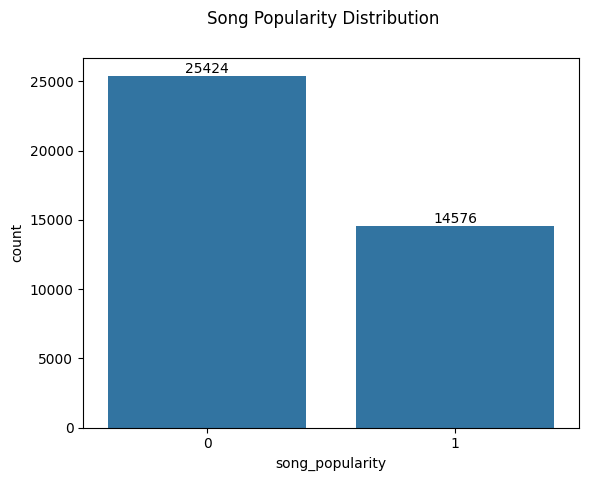

In [9]:
ax = sns.countplot(data=music_train_df, x="song_popularity")

for p in ax.patches:
    x = p.get_x() + p.get_width() / 2.0
    y = int(p.get_height())
    ax.annotate(text=y, xy=(x,y), ha="center", va="center", xytext=(0,5), textcoords="offset points")
    
plt.suptitle("Song Popularity Distribution")
plt.show()

**__We have a case of target distribution imbalance__**

We will handle that only on the train dataset

In [10]:
music_train_df.drop("id", axis=1, inplace=True)

In [11]:
music_train_df.duplicated().sum()

0

##### Let's check which keys had more song popularity

<Axes: ylabel='Frequency'>

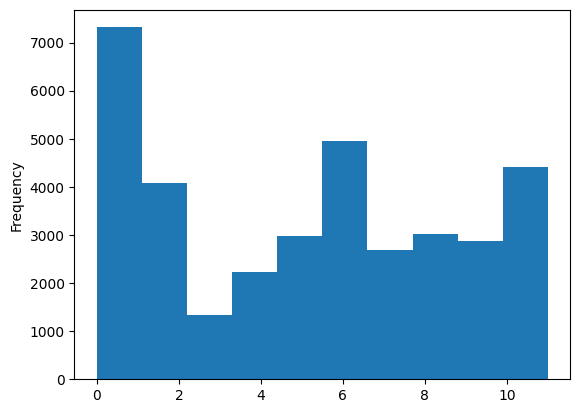

In [12]:
music_train_df['key'].plot(kind='hist')

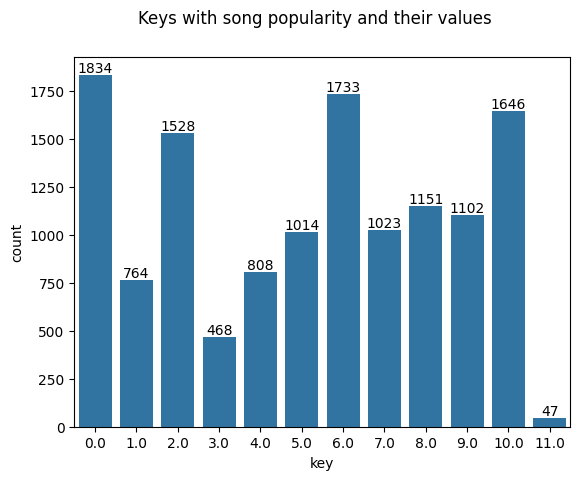

In [13]:
keys_one = music_train_df[music_train_df['song_popularity'] == 1]

ax = sns.countplot(data=keys_one, x="key")
for p in ax.patches:
    x = p.get_x() + p.get_width() / 2.0
    y = int(p.get_height())
    ax.annotate(text=y, xy=(x,y), ha="center", va="center", xytext=(0,5), textcoords="offset points")
plt.suptitle("Keys with song popularity and their values")
plt.show()

<font color="blue">Inference: </font> <br>
Songs produced in ```key 0``` have more popularity, followed by ```key 6```, followed by ```key 10```

We shall see if the same keys have same distribution for songs without popularity

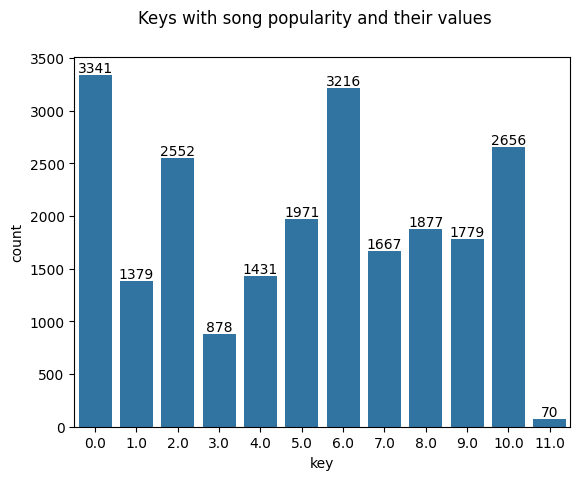

In [14]:
keys_zero = music_train_df[music_train_df['song_popularity'] == 0]

ax = sns.countplot(data=keys_zero, x="key")
for p in ax.patches:
    x = p.get_x() + p.get_width() / 2.0
    y = int(p.get_height())
    ax.annotate(text=y, xy=(x,y), ha="center", va="center", xytext=(0,5), textcoords="offset points")
plt.suptitle("Keys with song popularity and their values")
plt.show()

In [15]:
train_df = music_train_df.copy() #Make a copy of the original df

In [16]:
train_df = train_df[train_df["key"] != 11]

All doubts cleared, no duplicates

<center> <font width="22px" height="22px" color="blue"> <b>Checking For MultiColinearity </b></font></center> 

In [17]:
def corr_plot(df):
    plt.figure(figsize=(10,7))
    corr = df.corr()
    sns.heatmap(corr, annot=True, cbar=True)

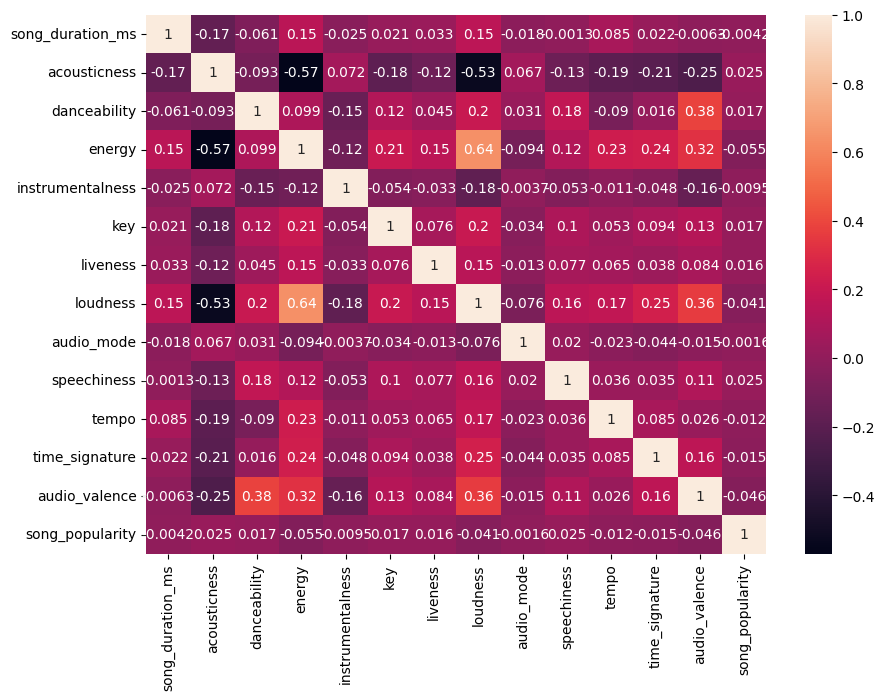

In [18]:
corr_plot(train_df)

###### Not Conteded with the plot???

> Assuming the plot is not clear enough to let us know if there is a problem of mulitcollinearity, what else can we do to be so sure???

We will shall write a custom function

In [19]:
def corr_check(df, threshold=0.85): #we assume that if two features are 85% correlated, we should drop 'em
    """
    df (DataFrame): We receive a dataframe as the first parameter
    threshold (float): the threshold by the default is .85(85%), no two features should correlate upto and higher than this
    """
    df_matrix = df.corr().abs()
    before = df.shape[1]
    print(f"Before detecting multicollinearity, the dataframe has {before} numbers of features")
    
    #Selecting the upper triangle
    upper_columns = df_matrix.where(np.triu(np.ones(df_matrix.shape), k=1).astype(bool))
    
    to_drop = [col for col in upper_columns if any(upper_columns[col] > threshold)]
    filtered_df = df.drop(to_drop, axis=1)
    after = filtered_df.shape[1]
    print(f"After detecting multicollinearity, the dataframe has {after} numbers of features")
    print(f"{to_drop} columns were removed ")
    print(f"{len(to_drop)} numbers of columns were removed")
    
    return filtered_df
    

In [20]:
train_df = corr_check(train_df)

train_df

Before detecting multicollinearity, the dataframe has 14 numbers of features
After detecting multicollinearity, the dataframe has 14 numbers of features
[] columns were removed 
0 numbers of columns were removed


,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence,song_popularity
0,212990.0,0.642286,0.856520,0.707073,0.002001,10.0,NaN,-5.619088,0,0.082570,158.386236,4,0.734642,0
1,NaN,0.054866,0.733289,0.835545,0.000996,8.0,0.436428,-5.236965,1,0.127358,102.752988,3,0.711531,1
2,193213.0,NaN,0.188387,0.783524,-0.002694,5.0,0.170499,-4.951759,0,0.052282,178.685791,3,0.425536,0
3,249893.0,0.488660,0.585234,0.552685,0.000608,0.0,0.094805,-7.893694,0,0.035618,128.715630,3,0.453597,0
4,165969.0,0.493017,NaN,0.740982,0.002033,10.0,0.094891,-2.684095,0,0.050746,121.928157,4,0.741311,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39995,237799.0,NaN,0.748942,0.511234,0.002913,0.0,0.173803,-8.853673,0,0.078060,168.262924,3,0.178159,0
39996,191119.0,0.067488,0.672830,0.889685,0.001225,5.0,0.122924,-7.798993,0,0.188607,110.684544,3,0.790626,0
39997,160879.0,0.877431,0.409065,0.292671,NaN,10.0,0.110664,-15.378585,0,0.031294,99.556074,3,0.177947,1
39998,193918.0,NaN,0.365738,NaN,0.000339,1.0,0.356308,-4.661977,1,0.054096,139.857384,3,0.772978,0


> All doubts cleared even more, no worries about multicollinearity <br> 

In [21]:
# convert songs to the nearest minutes
import math
def milli_minute(df):
    if df == np.nan:
        pass
    second = df / 1000
    minute = (second / 60)
    return minute
#train_df["song_duration_ms"].fillna(train_df['song_duration_ms'].mean(), inplace=True)

In [22]:
train_df["song_duration_min"] = train_df["song_duration_ms"].apply(milli_minute)

In [23]:
train_df.head(2)

,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence,song_popularity,song_duration_min
0,212990.0,0.642286,0.856520,0.707073,0.002001,10.0,NaN,-5.619088,0,0.082570,158.386236,4,0.734642,0,3.549833
1,NaN,0.054866,0.733289,0.835545,0.000996,8.0,0.436428,-5.236965,1,0.127358,102.752988,3,0.711531,1,NaN


In [24]:
train_df['audio_intensity'] = train_df['energy'] * train_df['loudness']
train_df['liveness_dance'] = train_df['liveness'] * train_df['danceability']

train_df.head(2)

,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence,song_popularity,song_duration_min,audio_intensity,liveness_dance
0,212990.0,0.642286,0.856520,0.707073,0.002001,10.0,NaN,-5.619088,0,0.082570,158.386236,4,0.734642,0,3.549833,-3.973105,NaN
1,NaN,0.054866,0.733289,0.835545,0.000996,8.0,0.436428,-5.236965,1,0.127358,102.752988,3,0.711531,1,NaN,-4.375719,0.320028


__Categorize data into long, medium, and short based on their values__

In [25]:
mean_value = train_df['song_duration_ms'].mean()

tolerance_percentage = 10
tolerance = mean_value * (tolerance_percentage / 100)

conditions = [
    (train_df['song_duration_ms'] < mean_value - tolerance),
    (train_df['song_duration_ms'] > mean_value + tolerance),
    (train_df['song_duration_ms'].between(mean_value - tolerance, mean_value + tolerance))
]

labels = ["short", "long", "medium"]

train_df['song_duration_ms'] = pd.cut(
    train_df['song_duration_ms'],
    bins=[float('-inf'), mean_value - tolerance, mean_value + tolerance, float('inf')],
    labels=labels
)

train_df.head(2)

,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence,song_popularity,song_duration_min,audio_intensity,liveness_dance
0,medium,0.642286,0.856520,0.707073,0.002001,10.0,NaN,-5.619088,0,0.082570,158.386236,4,0.734642,0,3.549833,-3.973105,NaN
1,NaN,0.054866,0.733289,0.835545,0.000996,8.0,0.436428,-5.236965,1,0.127358,102.752988,3,0.711531,1,NaN,-4.375719,0.320028


___Tranform Instrumentalness into instrumental and non-instrumental___

In [26]:
bins = [0, 0.5, 1]
labels = ["Non Instrumental", "Instrumental"]

train_df["instrumental"] = pd.cut(train_df['instrumentalness'], bins=bins, labels=labels)

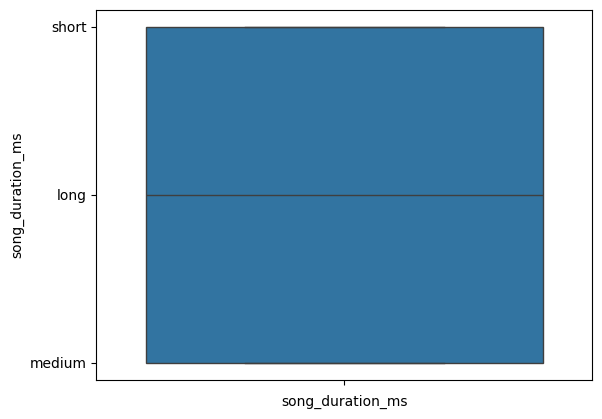

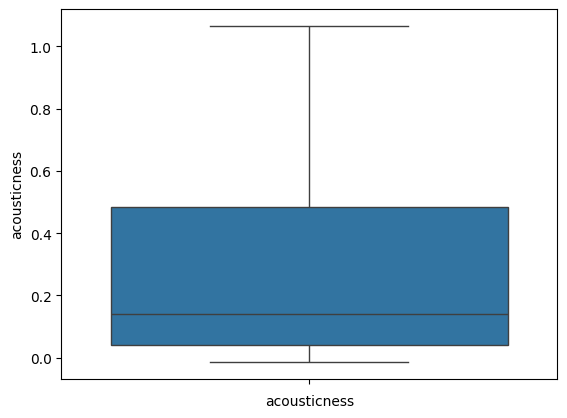

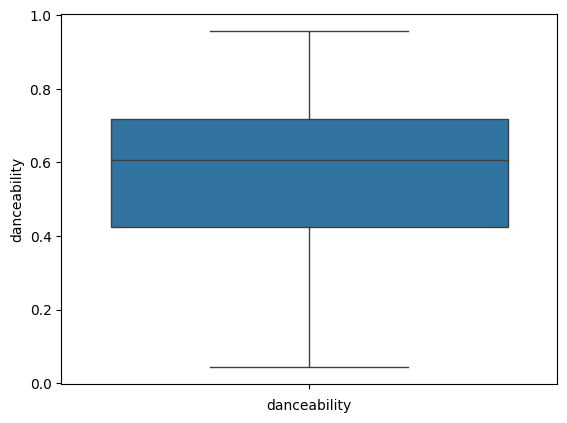

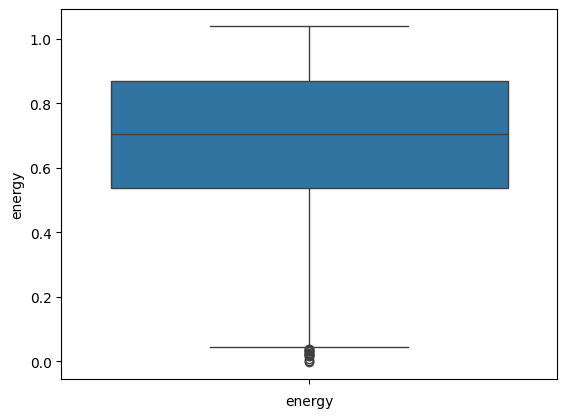

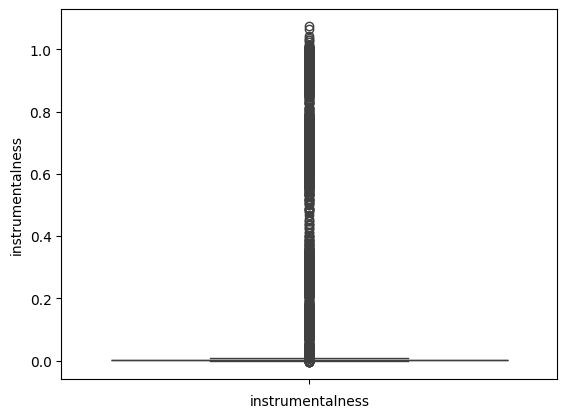

...

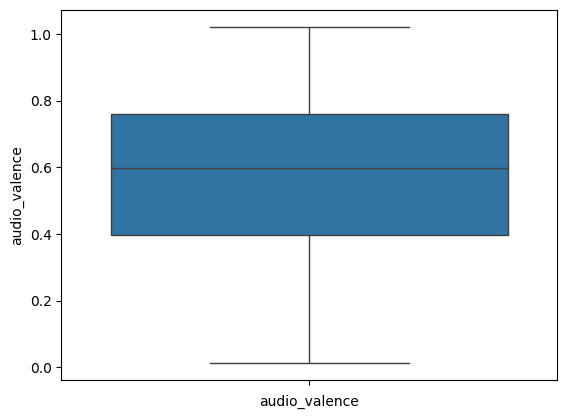

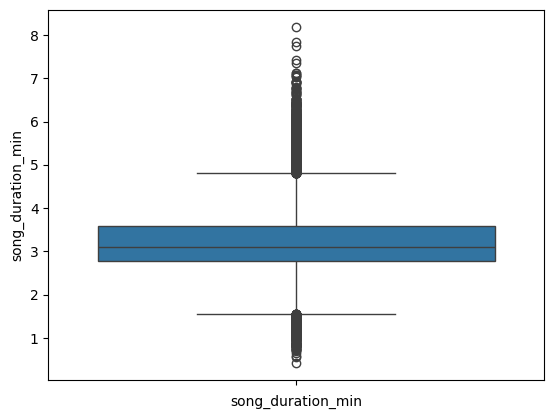

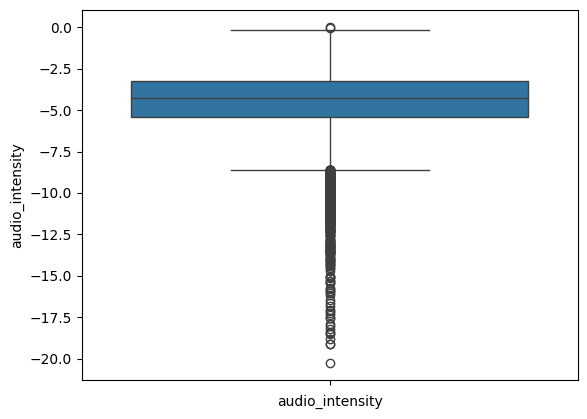

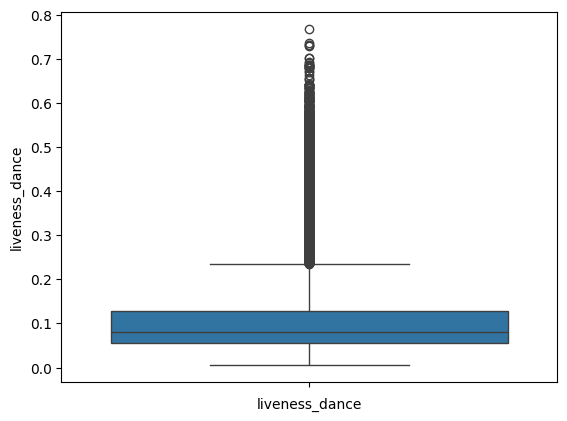

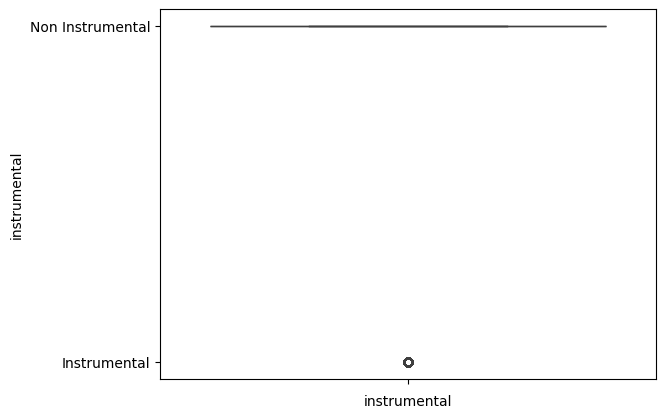

In [27]:
for col in train_df.columns:
    if col != "song_popularity":
        sns.boxplot(train_df[col])
        plt.xlabel(col)
        plt.show()

In [28]:
def remove_outliers(df, feat):
    before_removal = df.shape[0]
    
    Q1 = df[feat].quantile(0.25)
    Q3 = df[feat].quantile(0.75)
    
    IQR = Q3 - Q1
    lower = Q1 - (1.5 * IQR)
    upper = Q3 + (1.5 * IQR)
    
    filtered_df = df[(df[feat] > lower) & (df[feat] < upper)]
    after_removal = df.shape[0]
    if before_removal > after_removal:
        print(f"Number of outliers found is: {before_removal - after_removal}")
    else:
        print("No outliers found >>>>")
    print(f"Total rows after outliers removal is {after_removal}")
    return filtered_df

For song_duration_ms >>>>>


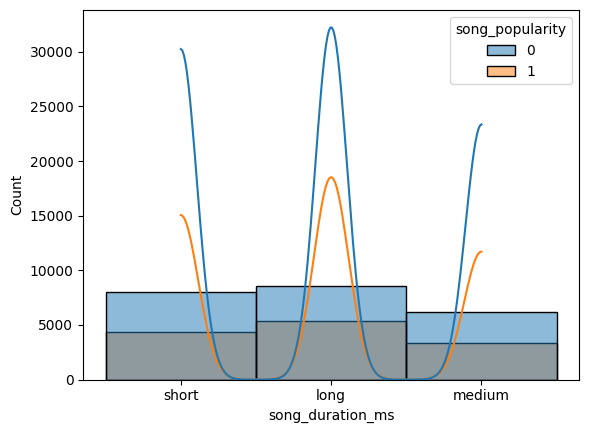

For acousticness >>>>>


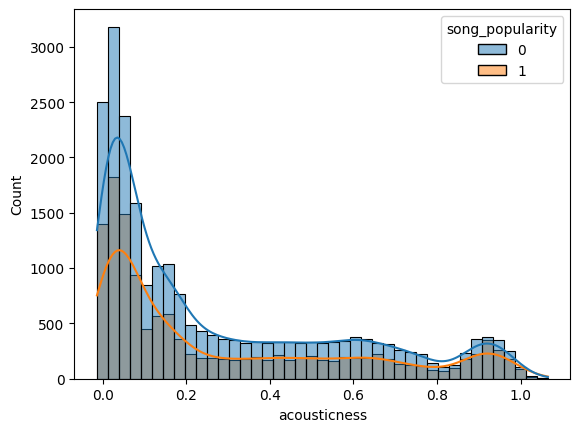

For danceability >>>>>


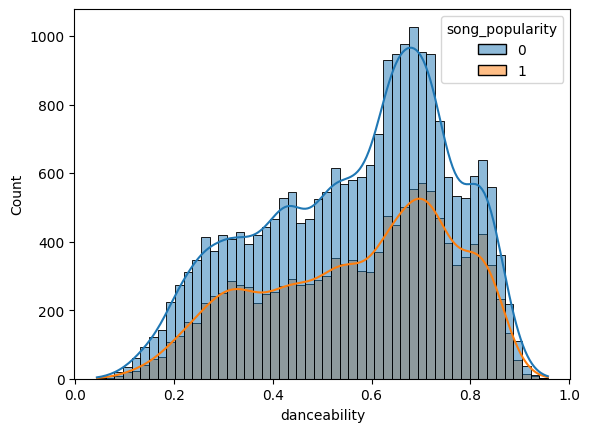

For energy >>>>>


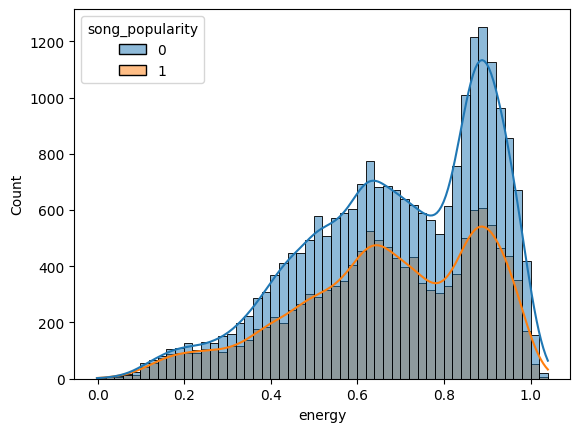

For instrumentalness >>>>>


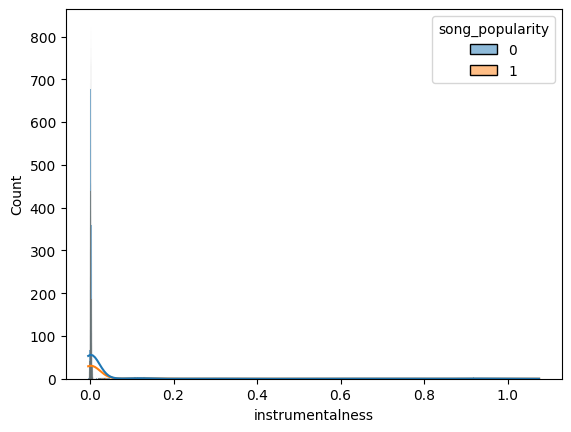

For key >>>>>


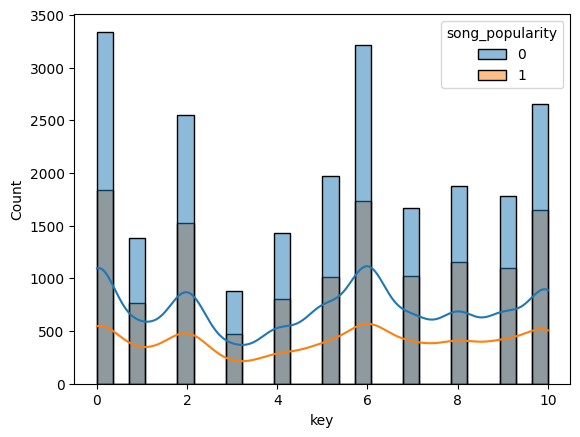

For liveness >>>>>


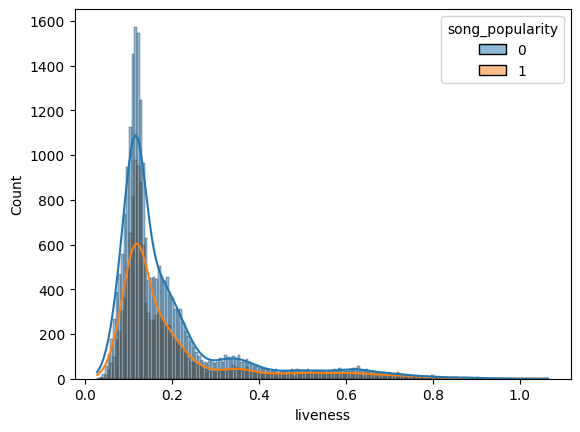

For loudness >>>>>


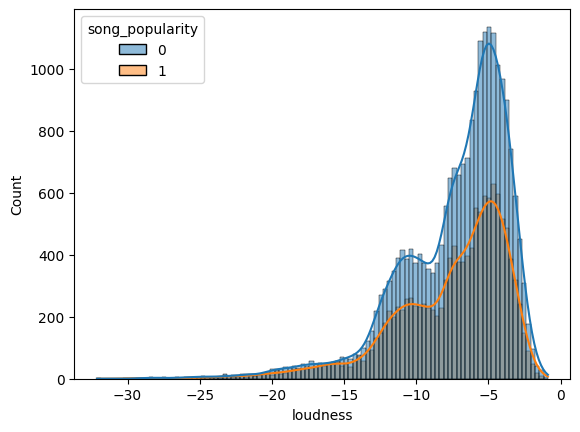

For audio_mode >>>>>


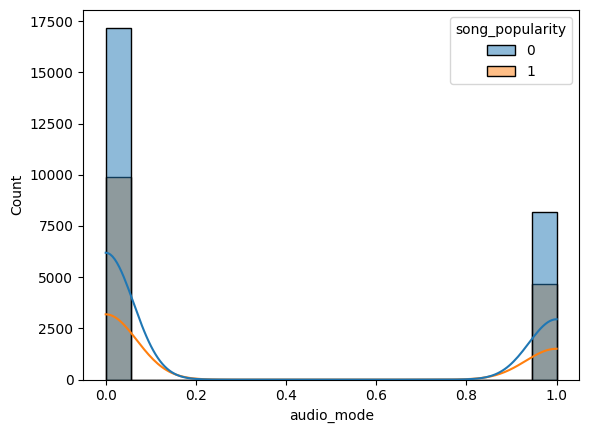

For speechiness >>>>>


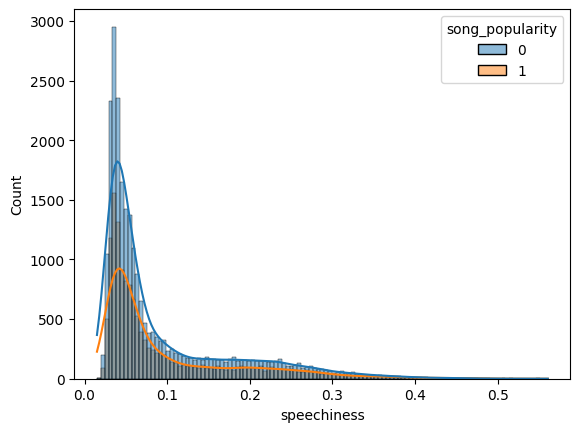

For tempo >>>>>


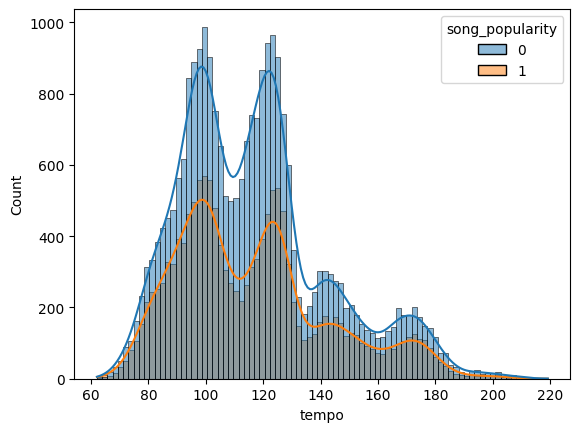

For time_signature >>>>>


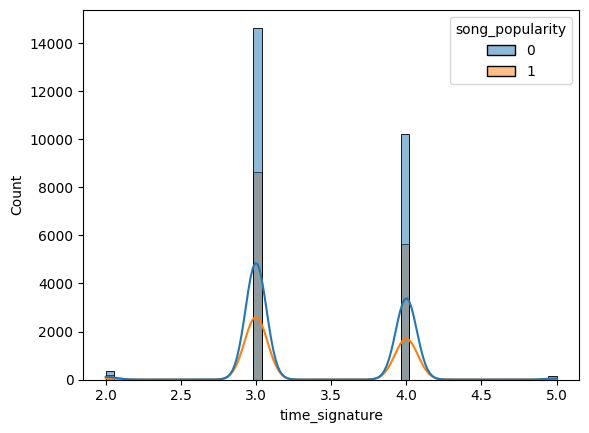

For audio_valence >>>>>


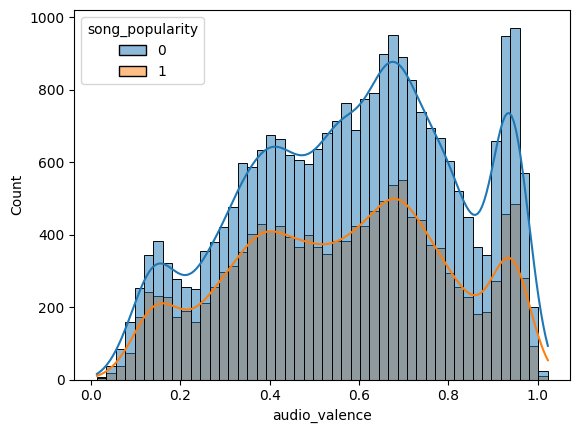

For song_duration_min >>>>>


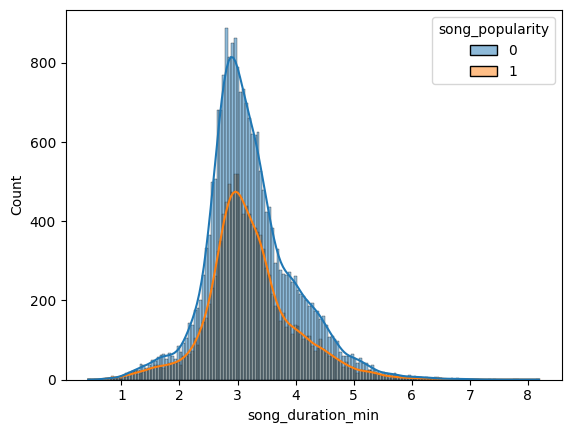

For audio_intensity >>>>>


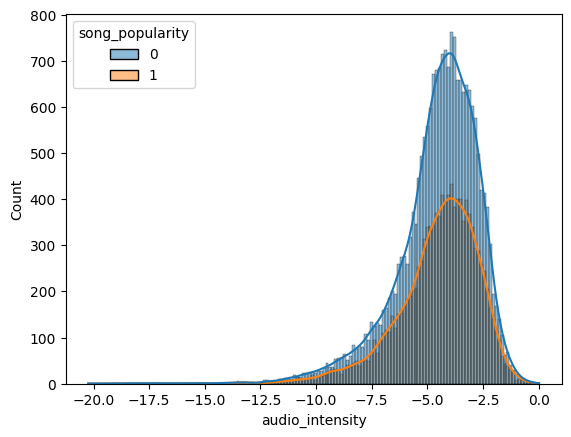

For liveness_dance >>>>>


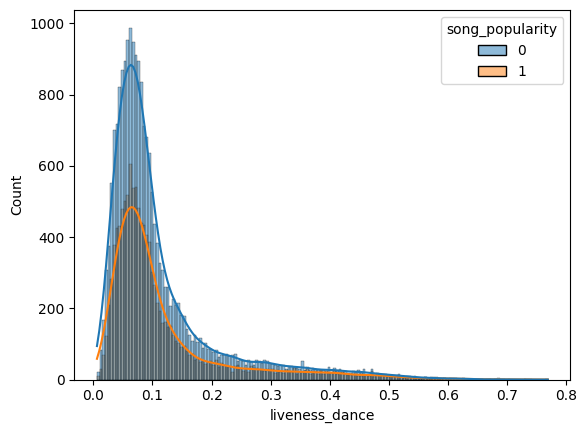

For instrumental >>>>>


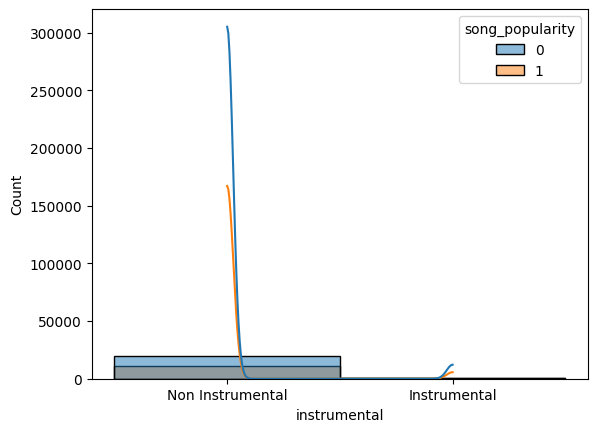

In [29]:
transformable_cols = [col for col in train_df.columns if col != "song_popularity"]

for col in transformable_cols:
    print(f"For {col} >>>>>")
    sns.histplot(data=train_df, x=col, kde=True, hue="song_popularity")
    plt.show()

In [30]:
train_df["acousticness"] = np.where(train_df["acousticness"]>1, 1, train_df["acousticness"])
train_df["acousticness"] = np.where(train_df["acousticness"]<0, 0, train_df["acousticness"])


train_df["energy"] = np.where(train_df["energy"]>1, 1, train_df["energy"])
train_df["energy"] = np.where(train_df["energy"]<0, 0, train_df["energy"])

In [31]:
train_df["audio_valence"] = np.where(train_df["audio_valence"]>1, 1, train_df["audio_valence"])
train_df["audio_valence"] = np.where(train_df["audio_valence"]<0, 0, train_df["audio_valence"])

__Checking for the distribution of acousticness and energy once again__

For energy >>>>>


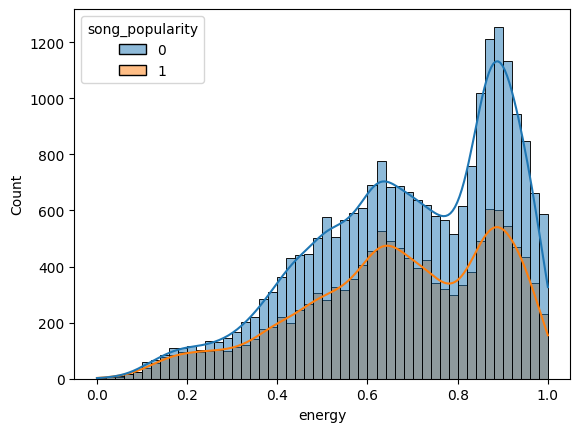

For acousticness >>>>>


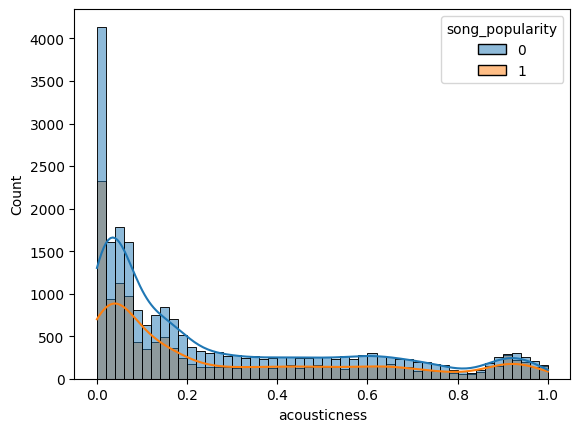

For audio_valence >>>>>


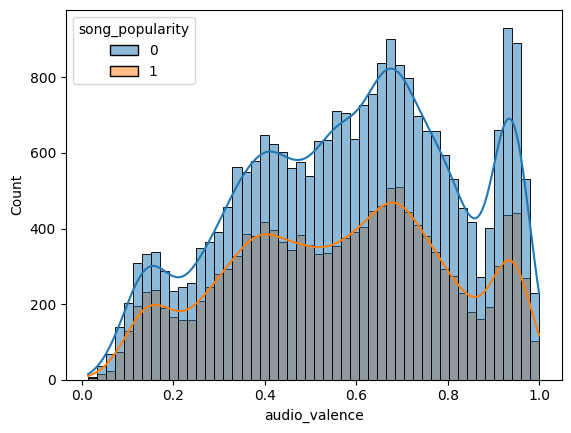

In [32]:
lists = ["energy", "acousticness", "audio_valence"]
for col in lists:
    print(f"For {col} >>>>>")
    sns.histplot(data=train_df, x=col, kde=True, hue="song_popularity", bins=50)
    plt.show()

__Viewing Boxplot for features__

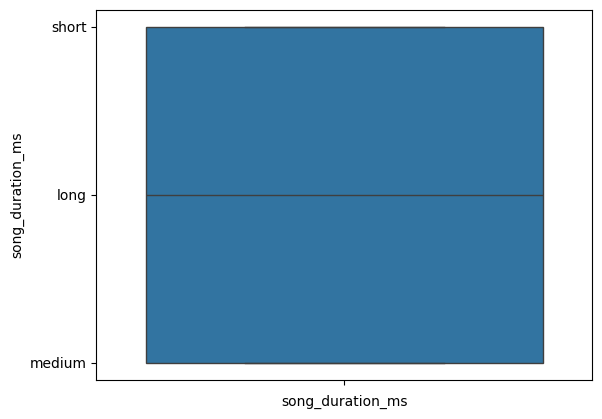

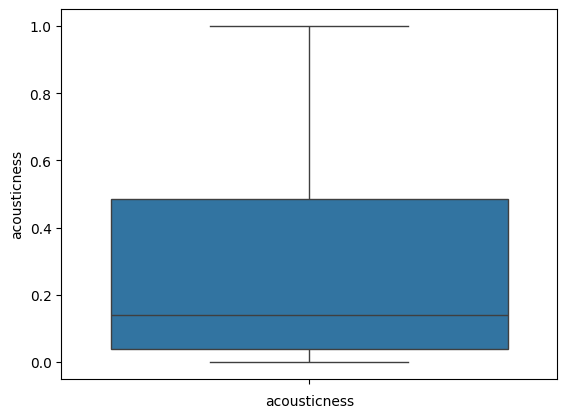

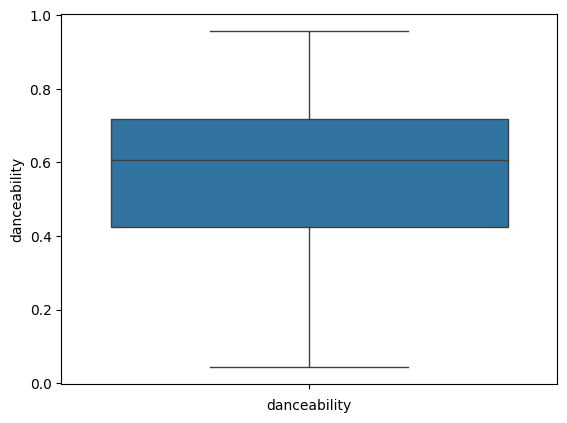

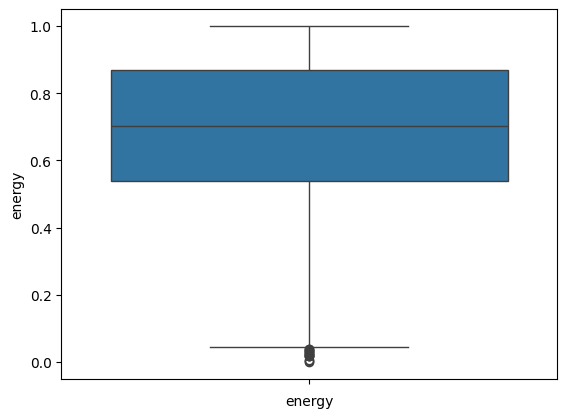

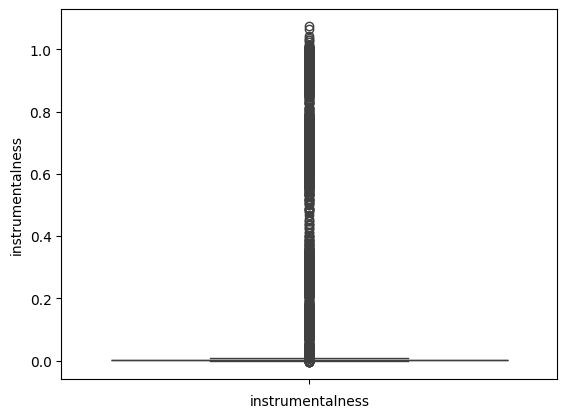

...

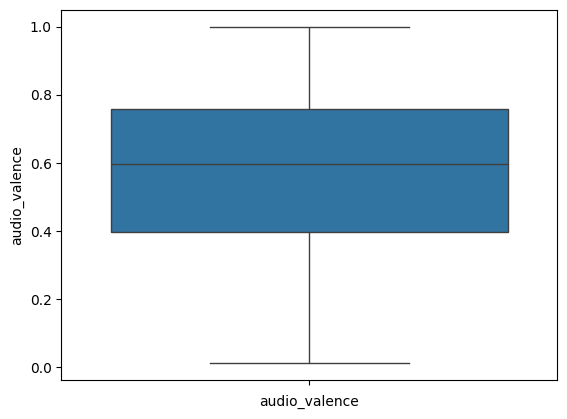

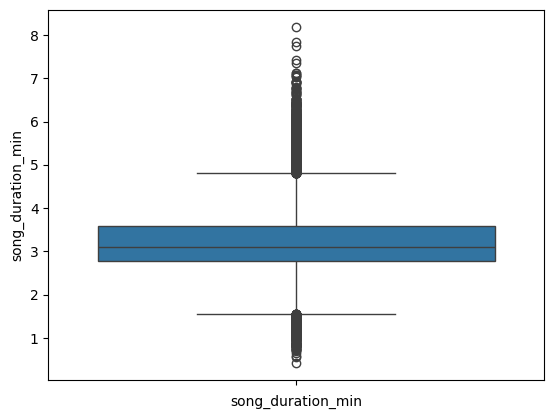

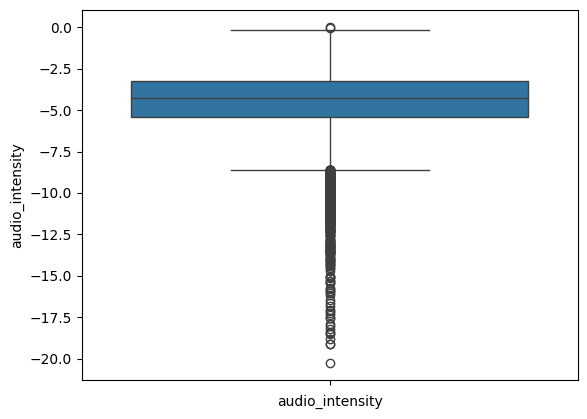

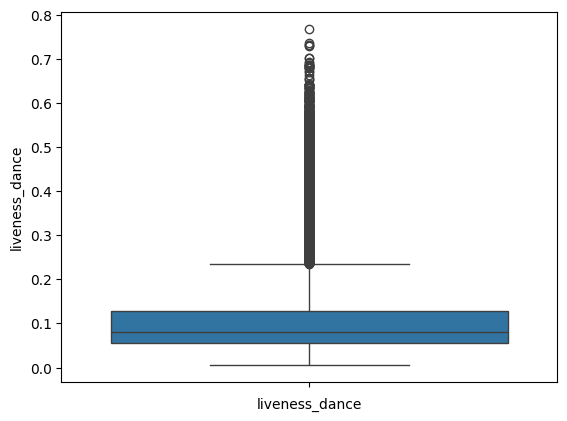

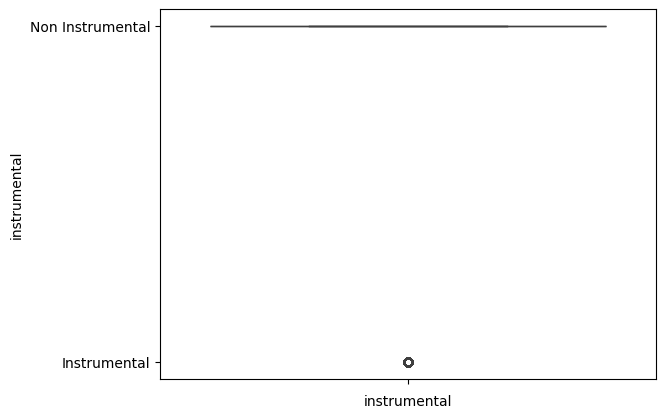

In [33]:
for col in train_df.columns:
    if col != "song_popularity":
        sns.boxplot(train_df[col])
        plt.xlabel(col)
        plt.show()

In [34]:
train_df = remove_outliers(train_df,"tempo")

No outliers found >>>>
Total rows after outliers removal is 39883


In [35]:
popular_songs = train_df[train_df["song_popularity"] == 1]

<Axes: xlabel='energy', ylabel='danceability'>

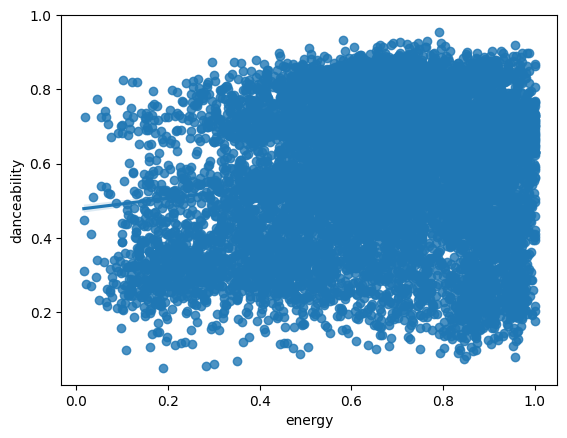

In [36]:
sns.regplot(data=popular_songs, x="energy", y="danceability", dropna=True)

From the above regplot, we can observe for popular songs, when the energy is high, the danceability is also high, some few songs also have low energy but danceable too, the data is highly densed where the energy is high from 0.6 through 1.0

In [37]:
numerical_feats = [col for col in train_df.columns if col != "song_popularity" and train_df[col].nunique() >=14 ]
categorical_feats = [col for col in train_df if col != "song_popularity" and col not in numerical_feats]

In [38]:
categorical_feats

['song_duration_ms', 'key', 'audio_mode', 'time_signature', 'instrumental']

__Handling Outliers in the numerical column and filling missing values with mean__

In [39]:
for col in numerical_feats:
    Q1 = train_df[col].quantile(0.25)
    Q3 = train_df[col].quantile(0.75)
    
    IQR = Q3 - Q1
    lower = Q1 - (1.5 * IQR)
    upper = Q3 + (1.5 * IQR)
    
    train_df[col] = train_df[col][(train_df[col] >= lower) & (train_df[col]<= upper)]
    train_df[col].fillna(train_df[col].mean(), inplace=True)

In [40]:
from sklearn.model_selection import train_test_split
X = train_df.drop("song_popularity", axis=1)
y = train_df.song_popularity

In [41]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=42, stratify=y)

In [42]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=42, shuffle=True, stratify=y)

In [43]:
X_train.drop("song_duration_ms", axis=1, inplace=True)
X_test.drop(["song_duration_ms"], axis=1, inplace=True)

In [44]:
key = [ 0., 1.,  2.,  3.,  4., 5.,  6.,  7.,  8.,  9.,  10.]
audio_mode = [0,1]
time_signature = [2, 3, 4, 5]
instrumental = ['Non Instrumental', 'Instrumental', "NaN"]
categorical_feats = ['key', 'audio_mode', 'time_signature', 'instrumental']

In [45]:
### Since we dropped 'song_duration_ms' Our column length will change, we must effect such change in the train and test set
numerical_feats = [col for col in X_train.columns if col != "song_popularity" and X_train[col].nunique() >=14]
numerical_feats, X_train.columns

(['acousticness',
  'danceability',
  'energy',
  'instrumentalness',
  'liveness',
  'loudness',
  'speechiness',
  'tempo',
  'audio_valence',
  'song_duration_min',
  'audio_intensity',
  'liveness_dance'],
 Index(['acousticness', 'danceability', 'energy', 'instrumentalness', 'key',
        'liveness', 'loudness', 'audio_mode', 'speechiness', 'tempo',
        'time_signature', 'audio_valence', 'song_duration_min',
        'audio_intensity', 'liveness_dance', 'instrumental'],
       dtype='object'))

In [46]:
numerical_pipeline = Pipeline(
    steps= [
        ("imputer", SimpleImputer(strategy="mean")),
        ("scaler", StandardScaler(with_mean=False))
    ]
)

categorical_pipeline = Pipeline(
    steps= [
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("ordinal_encoder", (OrdinalEncoder(categories=[key, audio_mode, time_signature, instrumental],
                                           handle_unknown='error'))),
        ("scaler", StandardScaler())
    ]
)

preprocessor = ColumnTransformer(
    [("numerical", numerical_pipeline, numerical_feats),
     ("categorical_pipeline", categorical_pipeline, categorical_feats)

    ]
)

#### Before model training:
Recall that we have a case of feature imbalance, we shall handle that here;

In [47]:
from imblearn.over_sampling import RandomOverSampler 

In [48]:
oversampler = RandomOverSampler(sampling_strategy="auto", random_state=42)

X_resampled, y_resampled = oversampler.fit_resample(X_train, y_train)

In [49]:
X_train, y_train = X_resampled, y_resampled

In [50]:
X_train.columns

Index(['acousticness', 'danceability', 'energy', 'instrumentalness', 'key',
       'liveness', 'loudness', 'audio_mode', 'speechiness', 'tempo',
       'time_signature', 'audio_valence', 'song_duration_min',
       'audio_intensity', 'liveness_dance', 'instrumental'],
      dtype='object')

In [51]:
X_train = pd.DataFrame(preprocessor.fit_transform(X_train), columns=preprocessor.get_feature_names_out())
X_test = pd.DataFrame(preprocessor.transform(X_test), columns=preprocessor.get_feature_names_out())

##### Model Training

***Using Logistic Regression***

In [52]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (accuracy_score, precision_recall_curve, precision_score, f1_score, confusion_matrix,
                            roc_auc_score, auc, log_loss, classification_report, recall_score, roc_curve)

In [53]:
def logistic_regression():
    log_model = LogisticRegression().fit(X_train, y_train)
    
    # Predicting both train and test data set
    train_pred = log_model.predict(X_train)
    test_pred = log_model.predict(X_test)
    
    # Accuracy on both train and test data
    acc_train = accuracy_score(y_train, train_pred)
    acc_test  = accuracy_score(y_test, test_pred)
    
    loss = log_loss(y_test, test_pred)
    
    print(f'Train accuracy: {round(acc_train, 2)} \n Test accuracy: {round(acc_test, 2)} \n Log_Loss: {round(loss, 2)}')
    return log_model

In [54]:
model = logistic_regression()

Train accuracy: 0.54 
 Test accuracy: 0.54 
 Log_Loss: 16.71


___Feature Importance___

We have seen the important features before now, we shall deep dive into the model and see which feature(s) is/are important and how important they are

In [55]:
model.coef_

array([[-0.00664756,  0.04007147, -0.11372482, -0.08162604, -0.00351899,
        -0.02905002,  0.04956587, -0.01791185, -0.10884242,  0.01116305,
        -0.02322931,  0.00087719,  0.04989551, -0.02634584, -0.00128641,
        -0.02422585]])

In [56]:
feat_cols = X_train.columns.str.replace('numerical__', '')
feats_importance = pd.DataFrame({'Features': feat_cols,'Importance': model.coef_[0]})

feats_importance  = feats_importance.sort_values(by=['Importance'], ascending=False)
feats_importance

,Features,Importance
12,categorical_pipeline__key,0.049896
6,speechiness,0.049566
1,danceability,0.040071
9,song_duration_min,0.011163
11,liveness_dance,0.000877
14,categorical_pipeline__time_signature,-0.001286
4,liveness,-0.003519
0,acousticness,-0.006648
7,tempo,-0.017912
10,audio_intensity,-0.023229


In [57]:
import plotly.express as px

px.bar(data_frame= feats_importance.head(len(feats_importance)), x='Features', y='Importance', title='Top 10 Features', color="Features")

__Now we will start training the model proper__

In [58]:
import os
os.makedirs("Artifacts/images", exist_ok=True)

In [59]:
import time
def model_trainer(model, X_train, X_test, y_train, y_test, filename:str, name=""):
    
    start_time = time.asctime()
    print(f"Model training/fitting started at {start_time}")
    classifier = model.fit(X_train, y_train) # fitting the model
    end_time = time.asctime()
    print(f"model has finished training for name: {name} at {end_time}>>>>>")
    
    # prediction on both train and test data
    train_pred = classifier.predict(X_train)
    test_pred  = classifier.predict(X_test)
    
    y_proba    = classifier.predict_proba(X_test)[:, 1]
    
    
    # Evaluating model performance
    # Accuracy on both train and test dqta
    train_acc = accuracy_score(y_train, train_pred)
    test_acc = accuracy_score(y_test, test_pred)
    
    #Precision, Recall, f1-score, roc_auc score, AUC score,log loss
    
    Precision_Score = precision_score(y_test, test_pred)
    Recall_Score = recall_score(y_test, test_pred)
    F1_Score = f1_score(y_test, test_pred)
    ROC_AUC = roc_auc_score(y_test, test_pred)
    Log_Loss = log_loss(y_test, y_proba)
    
    
    #Plot Confusion Matrix
    print("Plotting confusion matrix")
    cf = confusion_matrix(y_test, test_pred, normalize="true")
    sns.heatmap(cf, annot=True, cbar=False)
    plt.title("Actual Labels vs Predicted Labels")
    plt.xlabel("Actual Labels")
    plt.ylabel("Predicted Labels")
    plt.xticks(ticks=[0.5, 1.5], labels=['0', '1'])
    plt.yticks(ticks=[0.5, 1.5], labels=['0', '1'])
    #Saving plot figure
    plt.savefig(os.path.join('Artifacts/images', f'{filename}' + '_confusion_matrix.jpg'))
    plt.show()
    
    #Precision-Recall-Curve
    Precision, Recall, _ = precision_recall_curve(y_test, y_proba)
    area_under_curve = auc(Recall, Precision)
    plt.figure(figsize=(8,6))
    plt.plot(Recall, Precision, label=f"Precision-Recall-Curve (AUC {area_under_curve:.2f})", color="b")
    plt.xlabel('Recall')
    plt.ylabel("Precision")
    plt.title("Precision Recall Curve")
    plt.legend(loc='best')
    plt.savefig(os.path.join('Artifacts/images', f'{filename}' + '_precision_recall.jpg'))
    plt.show();
    
    #ROC-AUC Curve
    
    fpr,tpr, threshold = roc_curve(y_test, y_proba)
    plt.figure(figsize=(8,4))
    plt.plot([0, 1], [0, 1], 'y--', label = 'Random Guess')
    plt.plot(fpr, tpr, lw=2, marker=".", color='blue', label="ROC AUC CURVE")
    plt.annotate(f"AUC = {ROC_AUC:.2f}", xy=(0.7, 0.5), fontsize=12)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc='best')
    if filename is not None:
        plt.savefig(os.path.join("Artifacts/images", f'{filename}' + '_ROC_AUC.jpg'))
    plt.show()
    
    return model, train_acc, test_acc, Precision_Score, Recall_Score, F1_Score, ROC_AUC, Log_Loss

##### Logistic Regression Hyperparameter Tuning

In [60]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [61]:
param_grid_lr = {
    'penalty': ['l1', 'l2'],
    'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
    'solver': ['liblinear', 'lbfgs']
}

In [62]:
lr_model = LogisticRegression()

In [63]:
grid_search = GridSearchCV(lr_model, param_grid=param_grid_lr, n_jobs=-1, cv=5)

grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
                         'penalty': ['l1', 'l2'],
                         'solver': ['liblinear', 'lbfgs']})

In [64]:
grid_search.best_score_

0.538657048514097

In [65]:
lr_model = grid_search.best_estimator_

Model training/fitting started at Fri Jan 12 07:44:25 2024
model has finished training for name: lr_model at Fri Jan 12 07:44:30 2024>>>>>
Plotting confusion matrix


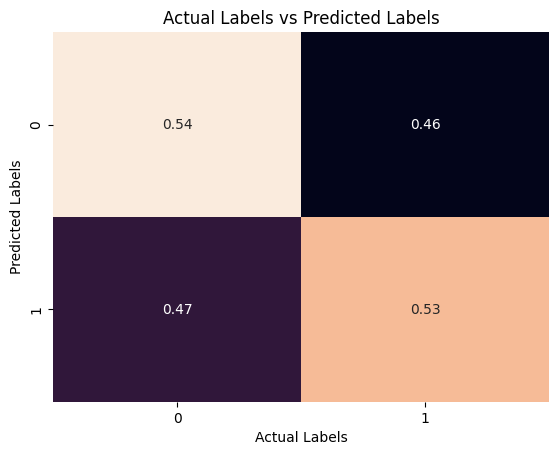

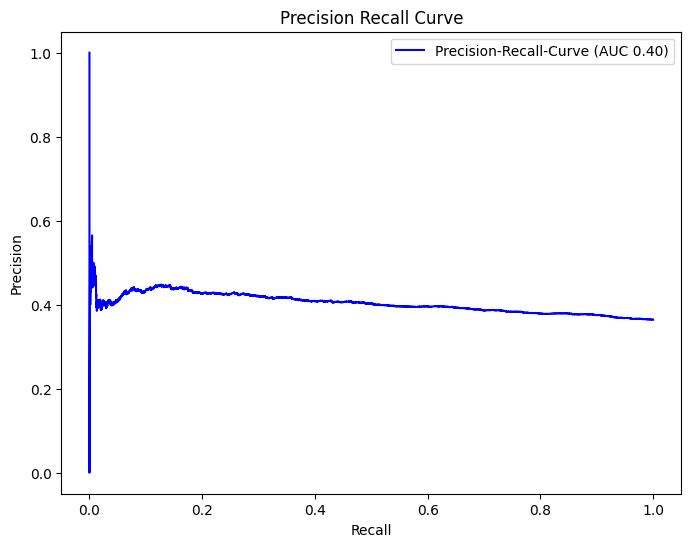

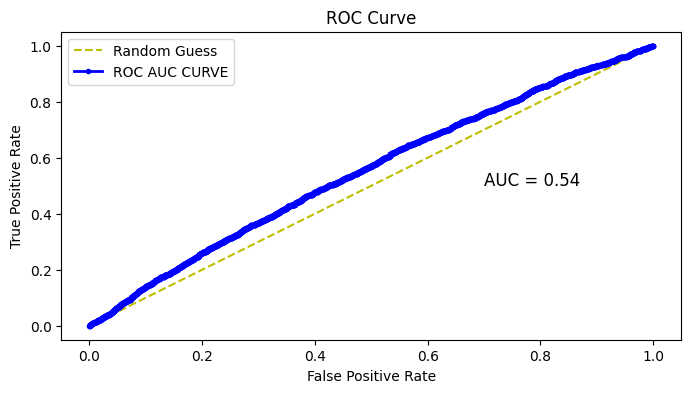

In [66]:
lr_model, lr_train_acc, lr_test_acc, lr_precision_score, lr_recall_score, lr_f1_score, lr_roc_auc_score, lr_log_loss_score = model_trainer(lr_model, X_train,X_test, y_train, y_test, filename="logistic_regression" ,name="lr_model" )

__RANDOM FOREST HYPERPARAMETER TUNING__

In [67]:
from sklearn.ensemble import RandomForestClassifier

rf_model = RandomForestClassifier()
random_forest_param_grid = {
    "n_estimators" : [100, 200, 300],
    "criterion" : ["gini", "log_loss", "entropy"],
    "min_samples_leaf" : [1,2,5],
    "min_samples_split" : [2,3,4],
    "max_depth" : [2,3,4],
    "bootstrap" : [True, False]
}

rf_random_search = RandomizedSearchCV(estimator=rf_model, param_distributions=random_forest_param_grid, cv=5, scoring='recall_micro',
    random_state=42, n_jobs=-1, n_iter=100)

In [68]:
rf_random_search.fit(X_train, y_train)

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'criterion': ['gini', 'log_loss',
                                                      'entropy'],
                                        'max_depth': [2, 3, 4],
                                        'min_samples_leaf': [1, 2, 5],
                                        'min_samples_split': [2, 3, 4],
                                        'n_estimators': [100, 200, 300]},
                   random_state=42, scoring='recall_micro')

In [69]:
rf_model = rf_random_search.best_estimator_

Model training/fitting started at Fri Jan 12 08:37:08 2024
model has finished training for name: rf_model at Fri Jan 12 08:37:27 2024>>>>>
Plotting confusion matrix


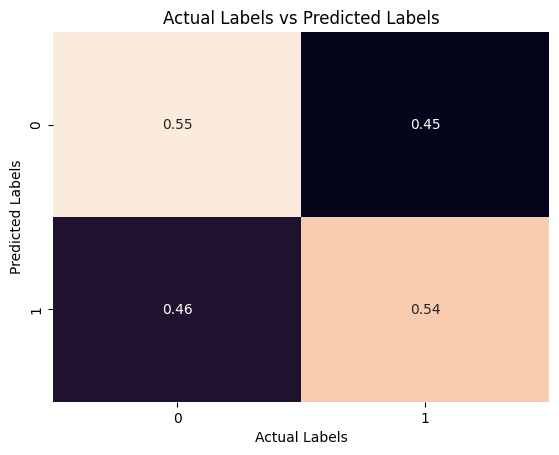

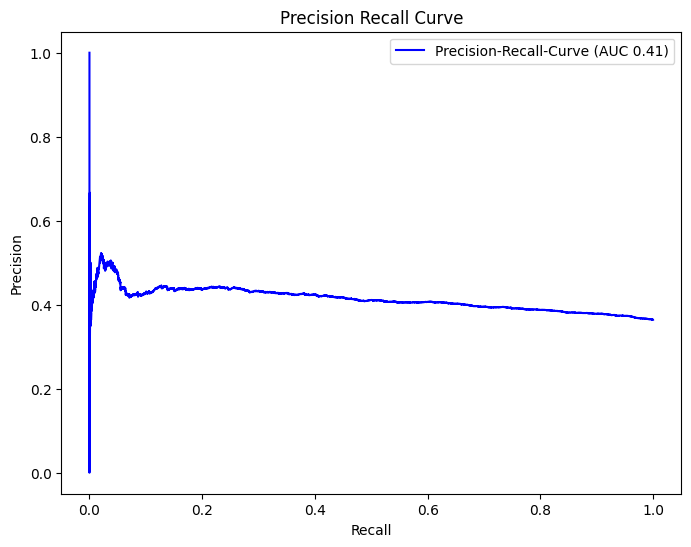

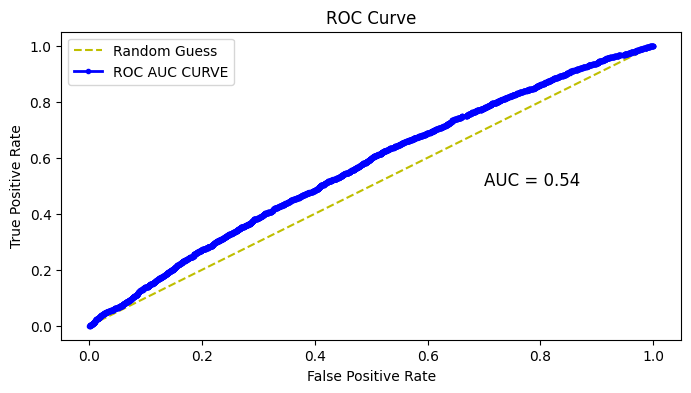

In [70]:
rf_model, rf_train_acc, rf_test_acc, rf_precision_score, rf_recall_score, rf_f1_score, rf_roc_auc_score, rf_log_loss_score = model_trainer(rf_model, X_train,X_test, y_train, y_test, filename="random forest" ,name="rf_model" )

___Decision Tree Tuning___

In [71]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier()
dt_param_grid ={
    "criterion" : ['gini', "log_loss", 'entropy'],
    'splitter' : ['best', 'random'],
    'max_depth' : [None, 2, 3, 4],
    'min_samples_leaf' : [2,3, 4,5],
    'min_samples_split' : [2,3,4]
}

random_search_dt = RandomizedSearchCV(dt_model, param_distributions=dt_param_grid, n_iter=100, cv=5, n_jobs=-1)

In [72]:
random_search_dt.fit(X_train, y_train)

RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'log_loss',
                                                      'entropy'],
                                        'max_depth': [None, 2, 3, 4],
                                        'min_samples_leaf': [2, 3, 4, 5],
                                        'min_samples_split': [2, 3, 4],
                                        'splitter': ['best', 'random']})

Model training/fitting started at Fri Jan 12 08:38:51 2024
model has finished training for name: dt_model at Fri Jan 12 08:38:53 2024>>>>>
Plotting confusion matrix


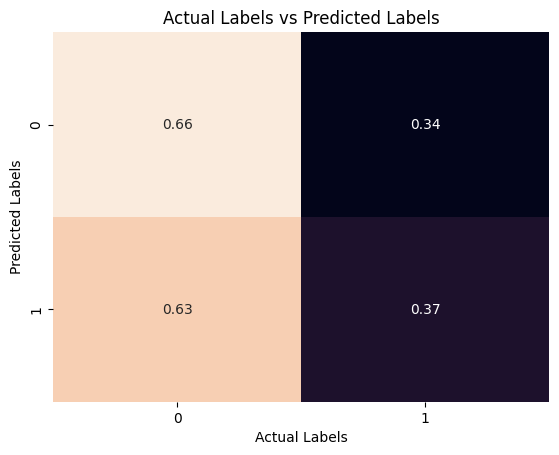

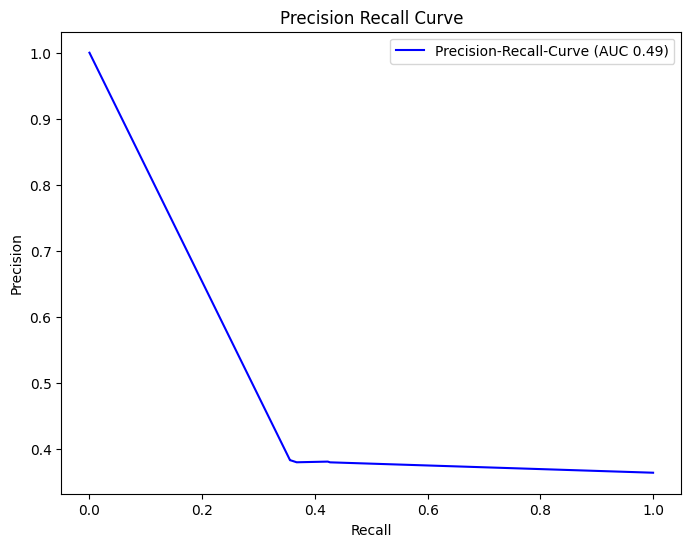

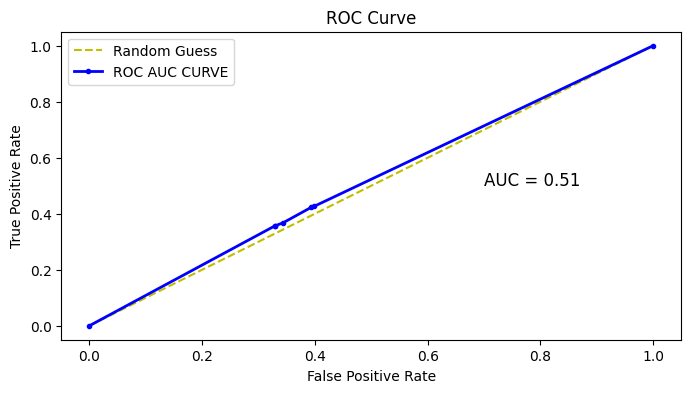

In [73]:
dt_model = random_search_dt.best_estimator_
dt_model, dt_train_acc, dt_test_acc, dt_precision_score, dt_recall_score, dt_f1_score, dt_roc_auc_score, dt_log_loss_score = model_trainer(dt_model, X_train,X_test, y_train, y_test, filename="Decision Tree" ,name="dt_model" )

In [74]:
dt_train_acc, dt_test_acc

(0.9722391547292493, 0.5512075422962676)

__XGBOOST HYPERPARAMETER TUNING__

In [75]:
from xgboost import XGBClassifier

In [76]:
tuned_xgb = XGBClassifier()
xgb_param_grid = {
    "eta": [0.01, 3*1e-1, 0.03, 5*1e-2],
    "max_depth" : [2,3,4,6],
    "gamma" : [0,2,3,4,5],
    "min_child_weight": [1,2,3,4],
    "max_delta_step": [0, 1, 2, 3, 4],
    "lambda" : [1,2,3,4]
}

xgb_randomized_search = RandomizedSearchCV(estimator=tuned_xgb, param_distributions=xgb_param_grid, cv=5, n_jobs=-1, n_iter=100)

In [77]:
xgb_randomized_search.fit(X_train, y_train)

RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints=None,
                                           multi_strategy=None,
                                           n_estimators=None, n_jobs=None,
                                           num_parallel_tree=None,
                                           random_state=None, ...),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'eta': [0.01, 0.30000000000000004, 0.03,
                                                0.05],
                                        'gamma': [0, 2, 3, 4, 5],
                                        'lambda': [1, 2, 3, 4],
                                        'max_delta_step': [0, 1, 2, 3, 4],
                                        'max_depth': [2, 3, 4, 6],
                                        'min_child_weight': [1, 2, 3, 4]})

In [78]:
xgb_model = xgb_randomized_search.best_estimator_

Model training/fitting started at Fri Jan 12 08:41:30 2024
model has finished training for name: xgb_model at Fri Jan 12 08:41:32 2024>>>>>
Plotting confusion matrix


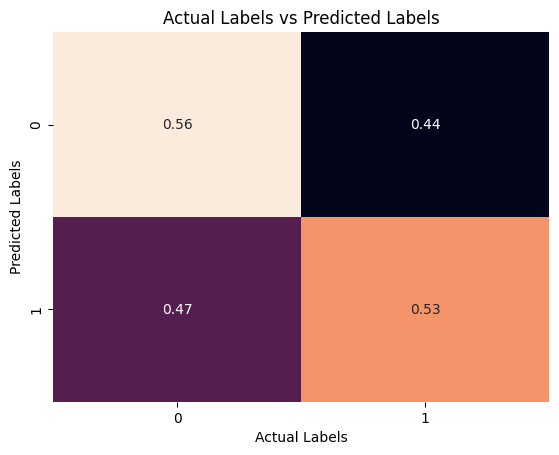

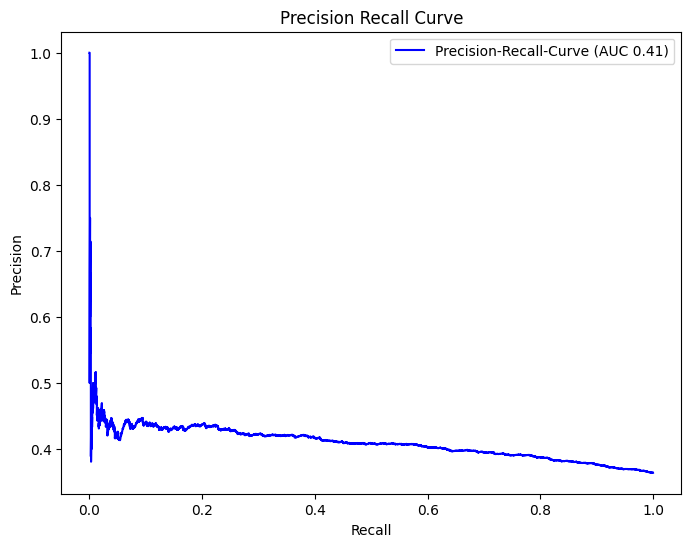

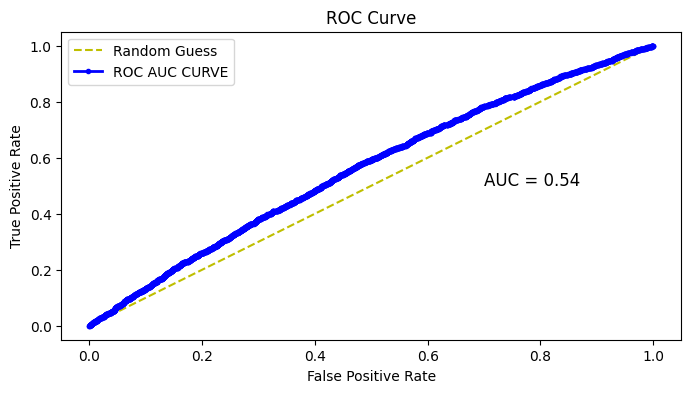

In [79]:
xgb_model, xgb_train_acc, xgb_test_acc, xgb_precision_score, xgb_recall_score, xgb_f1_score, xgb_roc_auc_score, xgb_log_loss_score = model_trainer(xgb_model, X_train,X_test, y_train, y_test, filename="xgb classifier" ,name="xgb_model" )

### GaussianNB Model

In [80]:
from sklearn.naive_bayes import GaussianNB

In [81]:
GB_model =GaussianNB()

Model training/fitting started at Fri Jan 12 11:30:07 2024
model has finished training for name: GB_model at Fri Jan 12 11:31:02 2024>>>>>
Plotting confusion matrix


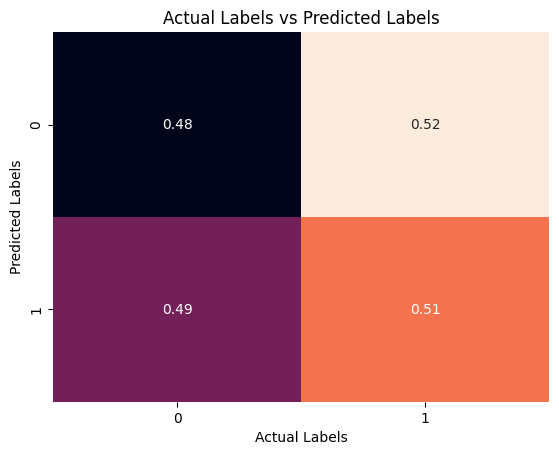

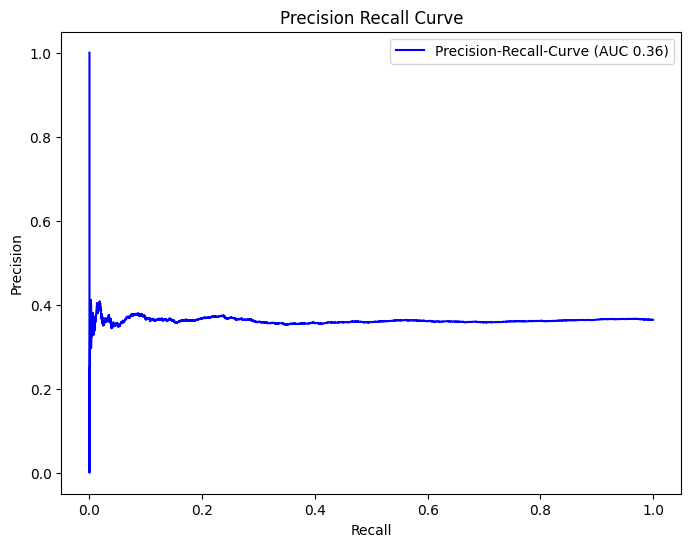

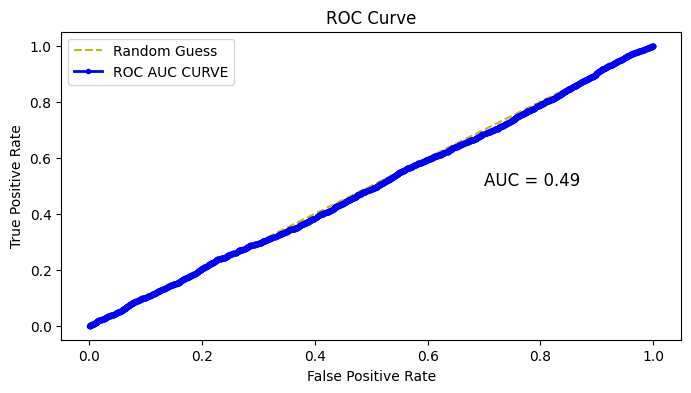

In [152]:
Gaussian_model, GB_train_acc, GB_test_acc, GB_precision_score, GB_recall_score, GB_f1_score, GB_roc_auc_score, GB_log_loss_score = model_trainer(GB_model, X_train,X_test, y_train, y_test, filename="GB classifier" ,name="GB_model" )

In [83]:
from sklearn.ensemble import GradientBoostingClassifier

GB_model = GradientBoostingClassifier()

GB_param_grid = {
    "loss" : ["log_loss", "exponential"],
    "learning_rate" : [0.1, 0.05, 0.03, 0.02],
    "n_estimators" : [100, 200, 300],
    "subsample" : [0.01, 0.05, 0.1],
    "min_samples_split" : [2,3,4],
    "min_samples_leaf" : [2,4,5]
}

random_search_GB = RandomizedSearchCV(GB_model, param_distributions=GB_param_grid, cv=5, n_iter=100, n_jobs=-1)

In [84]:
random_search_GB.fit(X_train, y_train)

RandomizedSearchCV(cv=5, estimator=GradientBoostingClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'learning_rate': [0.1, 0.05, 0.03,
                                                          0.02],
                                        'loss': ['log_loss', 'exponential'],
                                        'min_samples_leaf': [2, 4, 5],
                                        'min_samples_split': [2, 3, 4],
                                        'n_estimators': [100, 200, 300],
                                        'subsample': [0.01, 0.05, 0.1]})

In [85]:
GBC_model = random_search_GB.best_estimator_

Model training/fitting started at Fri Jan 12 08:58:19 2024
model has finished training for name: GBC_model at Fri Jan 12 08:58:52 2024>>>>>
Plotting confusion matrix


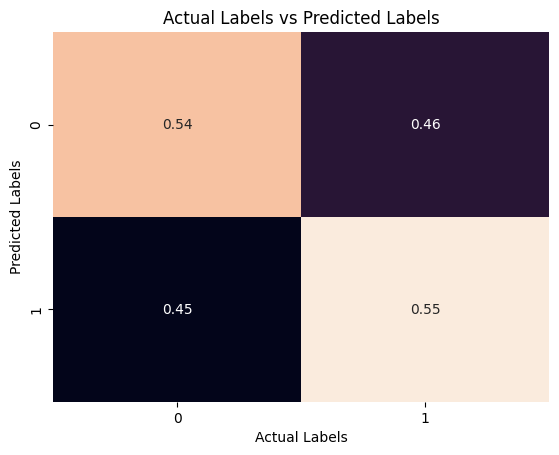

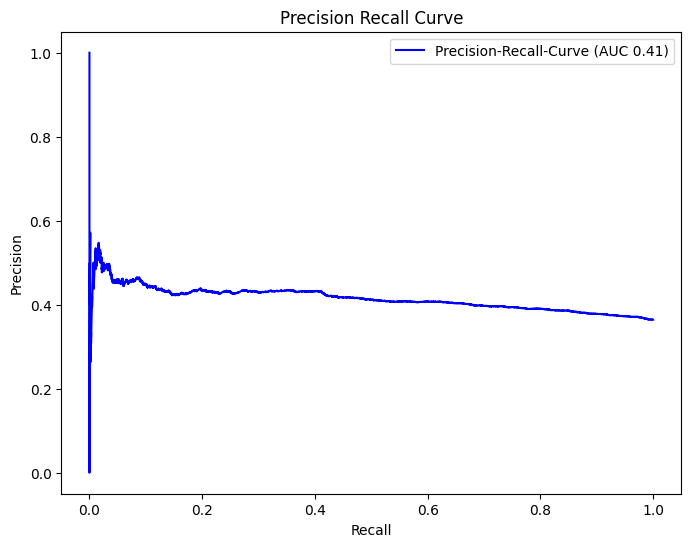

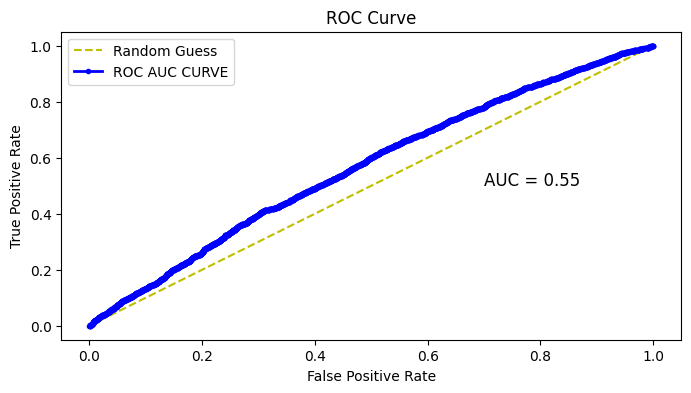

In [86]:
GBC_model, GBC_train_acc, GBC_test_acc, GBC_precision_score, GBC_recall_score, GBC_f1_score, GBC_roc_auc_score, GBC_log_loss_score = model_trainer(GB_model, X_train,X_test, y_train, y_test, filename="GBC classifier" ,name="GBC_model" )

__MLFLOW FOR SKLEARN ALGORITHMS__

In [87]:
import mlflow.sklearn

In [88]:
def track_experiment(experiment_name, run_name, eval_metrics, model, artifacts_path:list, server=None, model_name=None, params=None):
    
    if server != None: # check if server is not none
        mlflow.set_tracking_uri(uri='http://127.0.0.1:5000')   #set experiments tracking uri
    mlflow.set_experiment(experiment_name)  #SET EXPERIMENT NAME
    
    with mlflow.start_run(): # RUN MLFLOW
        if params != None: #check if parameter is not None
            mlflow.log_params(params) #logging all paramters
        mlflow.log_metrics(eval_metrics) #logging all evaluation metrics
        mlflow.sklearn.log_model(model, "model") #logging model pickled file
        
        for artifact_path in artifacts_path: #looping through artifacts path list
            if os.path.exists(artifact_path):
                mlflow.log_artifact(artifact_path)
            else:
                print(f"{artifact_path} FIle not found, you need to check the path")
        if model_name != None:
            mlflow.set_tag("tag1", "Song Popularity Classification")
            mlflow.set_tags({"tag2": f"{model_name}", "tag3" : "Binary-Class Classification"})
            
    print(f'Run Name: {run_name}\nExperiment Name: {experiment_name}\n')
    print(f'{run_name} has succesfully been logged to {experiment_name} in MLFlow')

In [89]:
#function to return all metrics

def all_metrics(train_acc, test_acc, Precision_Score, Recall_Score, F1_Score, ROC_AUC, Log_Loss):
    model_metrics = {
        "Train Accuracy" : round(train_acc, 2),
        "Test Accuracy" : round(test_acc, 2),
        "Precision Score" : round(Precision_Score, 2),
        "Recall Score" : round(Recall_Score, 2),
        "F1 Score" : round(F1_Score, 2),
        "ROC AUC Score" : round(ROC_AUC, 2),
        "Log loss" : round(Log_Loss, 2)
    }
    
    return model_metrics

__Logistic Regression Tracking__

In [90]:
lr_metrics = all_metrics(lr_train_acc, lr_test_acc, lr_precision_score, lr_recall_score, lr_f1_score, lr_roc_auc_score, lr_log_loss_score)

In [98]:
from datetime import datetime
track_experiment(
    experiment_name = f"Song Popularity: {datetime.now().strftime('%d-%m-%y')}",
    run_name= f"Parameter tuned Logistic Regression: {datetime.now().strftime('%d-%m-%y')}",
    eval_metrics= lr_metrics,
    model= lr_model,
    artifacts_path= ["Artifacts\images\logistic_regression_confusion_matrix.jpg", 
                     "Artifacts\images\logistic_regression_precision_recall.jpg",
                    "Artifacts\images\logistic_regression_ROC_AUC.jpg"],
    params= lr_model.get_params(),
    model_name= "Logistic Regression",
    server= "server"
)

2024/01/12 09:35:53 INFO mlflow.tracking.fluent: Experiment with name 'Song Popularity: 12-01-24' does not exist. Creating a new experiment.


Run Name: Parameter tuned Logistic Regression: 12-01-24
Experiment Name: Song Popularity: 12-01-24

Parameter tuned Logistic Regression: 12-01-24 has succesfully been logged to Song Popularity: 12-01-24 in MLFlow


__Random Forest Algorithm Tracking__

In [99]:
rf_metrics = all_metrics(rf_train_acc, rf_test_acc, rf_precision_score, rf_recall_score, rf_f1_score, rf_roc_auc_score, rf_log_loss_score)

In [100]:
track_experiment(
    experiment_name = f"Song Popularity: {datetime.now().strftime('%d-%m-%y')}",
    run_name= f"Parameter tuned Random Forest: {datetime.now().strftime('%d-%m-%y')}",
    eval_metrics= rf_metrics,
    model= rf_model,
    artifacts_path= ["Artifacts/images/random forest_confusion_matrix.jpg", 
                     "Artifacts/images/random forest_precision_recall.jpg",
                    "Artifacts/images/random forest_ROC_AUC.jpg"],
    params= rf_model.get_params(),
    model_name= "Random Forest",
    server= "remote"
)

Run Name: Parameter tuned Random Forest: 12-01-24
Experiment Name: Song Popularity: 12-01-24

Parameter tuned Random Forest: 12-01-24 has succesfully been logged to Song Popularity: 12-01-24 in MLFlow


__Random Forest Tracking Ended__

__GaussianNB Algorithm Tracking__

In [101]:
GB_metrics = all_metrics(GB_train_acc, GB_test_acc, GB_precision_score, GB_recall_score, GB_f1_score, GB_roc_auc_score, GB_log_loss_score)

In [102]:
track_experiment(
    experiment_name = f"Song Popularity: {datetime.now().strftime('%d-%m-%y')}",
    run_name= f"Parameter tuned GaussianNB: {datetime.now().strftime('%d-%m-%y')}",
    eval_metrics= GB_metrics,
    model= GB_model,
    artifacts_path= ["Artifacts/images/GB classifier_confusion_matrix.jpg", 
                     "Artifacts/images/GB classifier_precision_recall.jpg",
                    "Artifacts/images/GB classifier_ROC_AUC.jpg"],
    params= GB_model.get_params(),
    model_name= "Gaussian Naive Bayes model",
    server= "remote"
)

Run Name: Parameter tuned GaussianNB: 12-01-24
Experiment Name: Song Popularity: 12-01-24

Parameter tuned GaussianNB: 12-01-24 has succesfully been logged to Song Popularity: 12-01-24 in MLFlow


__Tracking GradientBoosting Classifier__

In [103]:
GBC_metrics = all_metrics(GBC_train_acc, GBC_test_acc, GBC_precision_score, GBC_recall_score, GBC_f1_score, GBC_roc_auc_score, GBC_log_loss_score)

In [104]:
track_experiment(
    experiment_name = f"Song Popularity: {datetime.now().strftime('%d-%m-%y')}",
    run_name= f"Parameter tuned GradientBoosting: {datetime.now().strftime('%d-%m-%y')}",
    eval_metrics= GB_metrics,
    model= GB_model,
    artifacts_path= ["Artifacts/images/GBC classifier_confusion_matrix.jpg", 
                     "Artifacts/images/GBC classifier_precision_recall.jpg",
                    "Artifacts/images/GBC classifier_ROC_AUC.jpg"],
    params= GB_model.get_params(),
    model_name= "Gradient Boosting Classifier",
    server= "remote"
)

Run Name: Parameter tuned GradientBoosting: 12-01-24
Experiment Name: Song Popularity: 12-01-24

Parameter tuned GradientBoosting: 12-01-24 has succesfully been logged to Song Popularity: 12-01-24 in MLFlow


### MLP Model

In [105]:
import mlflow
import mlflow.pytorch

In [106]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset

class MLP(nn.Module):
    def __init__(self, num_features):
        super().__init__()
        self.linear = nn.Linear(in_features=num_features, out_features=1)
    def forward(self, X):
        logits = self.linear(X)
        probability = torch.sigmoid(logits)
        return probability

class Datasets(Dataset):
    def __init__(self, X, y):
        
        self.features = torch.tensor(X, dtype=torch.float32)
        self.labels = torch.tensor(y, dtype=torch.float32)
        
    def __getitem__(self, index):
        X = self.features[index]
        y = self.labels[index]
        return X, y
    
    def __len__(self):
        return self.labels.shape[0]

In [107]:
train_data = Datasets(X_train.values, y_train.values)

train_loader = DataLoader(dataset=train_data, batch_size=10, shuffle=True)

test_data = Datasets(X_test.values, y_test.values)

test_loader = DataLoader(dataset=test_data, batch_size=10)

In [108]:
model = MLP(num_features=X_train.shape[1])

In [109]:
import torch.nn.functional as F
optimizer = torch.optim.SGD(model.parameters(), lr=0.05)

num_epochs = 30
train_label_list = []
for epoch in range(num_epochs):
    model = model.train()
    
    for batch_idx, (features, class_labels) in enumerate(train_loader):
        probabs = model(features)
        
        loss = F.binary_cross_entropy(probabs, class_labels.view(probabs.shape))
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        train_label_list.append(class_labels)
        
        #Logging
        print(f"Epoch: {epoch+ 1 :03d} / {num_epochs:03d}"
             f" | Batch {batch_idx:03d} / {len(train_loader):03d}"
             f" | loss {loss:.2f}")

Epoch: 001 / 030 | Batch 000 / 3938 | loss 0.75
Epoch: 001 / 030 | Batch 001 / 3938 | loss 1.01
Epoch: 001 / 030 | Batch 002 / 3938 | loss 1.66
Epoch: 001 / 030 | Batch 003 / 3938 | loss 0.51
Epoch: 001 / 030 | Batch 004 / 3938 | loss 1.12
Epoch: 001 / 030 | Batch 005 / 3938 | loss 0.66
Epoch: 001 / 030 | Batch 006 / 3938 | loss 0.65
Epoch: 001 / 030 | Batch 007 / 3938 | loss 0.91
Epoch: 001 / 030 | Batch 008 / 3938 | loss 0.63
Epoch: 001 / 030 | Batch 009 / 3938 | loss 0.58
Epoch: 001 / 030 | Batch 010 / 3938 | loss 0.87
Epoch: 001 / 030 | Batch 011 / 3938 | loss 0.75
Epoch: 001 / 030 | Batch 012 / 3938 | loss 0.63
Epoch: 001 / 030 | Batch 013 / 3938 | loss 1.29
Epoch: 001 / 030 | Batch 014 / 3938 | loss 0.95
Epoch: 001 / 030 | Batch 015 / 3938 | loss 0.83
Epoch: 001 / 030 | Batch 016 / 3938 | loss 0.73
Epoch: 001 / 030 | Batch 017 / 3938 | loss 0.85
Epoch: 001 / 030 | Batch 018 / 3938 | loss 0.75
Epoch: 001 / 030 | Batch 019 / 3938 | loss 0.67
Epoch: 001 / 030 | Batch 020 / 3938 | lo

Epoch: 001 / 030 | Batch 257 / 3938 | loss 0.60
Epoch: 001 / 030 | Batch 258 / 3938 | loss 0.66
Epoch: 001 / 030 | Batch 259 / 3938 | loss 0.85
Epoch: 001 / 030 | Batch 260 / 3938 | loss 0.98
Epoch: 001 / 030 | Batch 261 / 3938 | loss 1.62
Epoch: 001 / 030 | Batch 262 / 3938 | loss 1.92
Epoch: 001 / 030 | Batch 263 / 3938 | loss 0.80
Epoch: 001 / 030 | Batch 264 / 3938 | loss 0.66
Epoch: 001 / 030 | Batch 265 / 3938 | loss 0.89
Epoch: 001 / 030 | Batch 266 / 3938 | loss 0.34
Epoch: 001 / 030 | Batch 267 / 3938 | loss 1.13
Epoch: 001 / 030 | Batch 268 / 3938 | loss 0.63
Epoch: 001 / 030 | Batch 269 / 3938 | loss 0.71
Epoch: 001 / 030 | Batch 270 / 3938 | loss 0.76
Epoch: 001 / 030 | Batch 271 / 3938 | loss 1.11
Epoch: 001 / 030 | Batch 272 / 3938 | loss 1.10
Epoch: 001 / 030 | Batch 273 / 3938 | loss 0.91
Epoch: 001 / 030 | Batch 274 / 3938 | loss 0.68
Epoch: 001 / 030 | Batch 275 / 3938 | loss 0.65
Epoch: 001 / 030 | Batch 276 / 3938 | loss 0.60
Epoch: 001 / 030 | Batch 277 / 3938 | lo

Epoch: 001 / 030 | Batch 544 / 3938 | loss 1.45
Epoch: 001 / 030 | Batch 545 / 3938 | loss 0.67
Epoch: 001 / 030 | Batch 546 / 3938 | loss 0.92
Epoch: 001 / 030 | Batch 547 / 3938 | loss 0.79
Epoch: 001 / 030 | Batch 548 / 3938 | loss 0.66
Epoch: 001 / 030 | Batch 549 / 3938 | loss 0.82
Epoch: 001 / 030 | Batch 550 / 3938 | loss 1.15
Epoch: 001 / 030 | Batch 551 / 3938 | loss 1.58
Epoch: 001 / 030 | Batch 552 / 3938 | loss 0.75
Epoch: 001 / 030 | Batch 553 / 3938 | loss 0.67
Epoch: 001 / 030 | Batch 554 / 3938 | loss 0.93
Epoch: 001 / 030 | Batch 555 / 3938 | loss 0.69
Epoch: 001 / 030 | Batch 556 / 3938 | loss 0.72
Epoch: 001 / 030 | Batch 557 / 3938 | loss 0.74
Epoch: 001 / 030 | Batch 558 / 3938 | loss 0.66
Epoch: 001 / 030 | Batch 559 / 3938 | loss 0.97
Epoch: 001 / 030 | Batch 560 / 3938 | loss 1.09
Epoch: 001 / 030 | Batch 561 / 3938 | loss 1.31
Epoch: 001 / 030 | Batch 562 / 3938 | loss 0.74
Epoch: 001 / 030 | Batch 563 / 3938 | loss 0.68
Epoch: 001 / 030 | Batch 564 / 3938 | lo

Epoch: 001 / 030 | Batch 819 / 3938 | loss 0.70
Epoch: 001 / 030 | Batch 820 / 3938 | loss 0.75
Epoch: 001 / 030 | Batch 821 / 3938 | loss 0.75
Epoch: 001 / 030 | Batch 822 / 3938 | loss 0.69
Epoch: 001 / 030 | Batch 823 / 3938 | loss 0.67
Epoch: 001 / 030 | Batch 824 / 3938 | loss 0.72
Epoch: 001 / 030 | Batch 825 / 3938 | loss 0.59
Epoch: 001 / 030 | Batch 826 / 3938 | loss 0.87
Epoch: 001 / 030 | Batch 827 / 3938 | loss 1.07
Epoch: 001 / 030 | Batch 828 / 3938 | loss 0.69
Epoch: 001 / 030 | Batch 829 / 3938 | loss 0.77
Epoch: 001 / 030 | Batch 830 / 3938 | loss 0.77
Epoch: 001 / 030 | Batch 831 / 3938 | loss 0.87
Epoch: 001 / 030 | Batch 832 / 3938 | loss 0.51
Epoch: 001 / 030 | Batch 833 / 3938 | loss 0.52
Epoch: 001 / 030 | Batch 834 / 3938 | loss 0.94
Epoch: 001 / 030 | Batch 835 / 3938 | loss 1.04
Epoch: 001 / 030 | Batch 836 / 3938 | loss 0.57
Epoch: 001 / 030 | Batch 837 / 3938 | loss 1.02
Epoch: 001 / 030 | Batch 838 / 3938 | loss 1.10
Epoch: 001 / 030 | Batch 839 / 3938 | lo

Epoch: 001 / 030 | Batch 1102 / 3938 | loss 0.75
Epoch: 001 / 030 | Batch 1103 / 3938 | loss 0.65
Epoch: 001 / 030 | Batch 1104 / 3938 | loss 0.95
Epoch: 001 / 030 | Batch 1105 / 3938 | loss 0.75
Epoch: 001 / 030 | Batch 1106 / 3938 | loss 1.00
Epoch: 001 / 030 | Batch 1107 / 3938 | loss 0.69
Epoch: 001 / 030 | Batch 1108 / 3938 | loss 0.75
Epoch: 001 / 030 | Batch 1109 / 3938 | loss 0.77
Epoch: 001 / 030 | Batch 1110 / 3938 | loss 0.69
Epoch: 001 / 030 | Batch 1111 / 3938 | loss 0.62
Epoch: 001 / 030 | Batch 1112 / 3938 | loss 0.74
Epoch: 001 / 030 | Batch 1113 / 3938 | loss 1.18
Epoch: 001 / 030 | Batch 1114 / 3938 | loss 1.06
Epoch: 001 / 030 | Batch 1115 / 3938 | loss 0.60
Epoch: 001 / 030 | Batch 1116 / 3938 | loss 0.64
Epoch: 001 / 030 | Batch 1117 / 3938 | loss 0.86
Epoch: 001 / 030 | Batch 1118 / 3938 | loss 0.75
Epoch: 001 / 030 | Batch 1119 / 3938 | loss 0.66
Epoch: 001 / 030 | Batch 1120 / 3938 | loss 0.77
Epoch: 001 / 030 | Batch 1121 / 3938 | loss 0.79
Epoch: 001 / 030 | B

Epoch: 001 / 030 | Batch 1398 / 3938 | loss 0.71
Epoch: 001 / 030 | Batch 1399 / 3938 | loss 0.73
Epoch: 001 / 030 | Batch 1400 / 3938 | loss 0.72
Epoch: 001 / 030 | Batch 1401 / 3938 | loss 0.77
Epoch: 001 / 030 | Batch 1402 / 3938 | loss 1.05
Epoch: 001 / 030 | Batch 1403 / 3938 | loss 0.90
Epoch: 001 / 030 | Batch 1404 / 3938 | loss 0.75
Epoch: 001 / 030 | Batch 1405 / 3938 | loss 0.61
Epoch: 001 / 030 | Batch 1406 / 3938 | loss 1.02
Epoch: 001 / 030 | Batch 1407 / 3938 | loss 0.71
Epoch: 001 / 030 | Batch 1408 / 3938 | loss 0.62
Epoch: 001 / 030 | Batch 1409 / 3938 | loss 1.16
Epoch: 001 / 030 | Batch 1410 / 3938 | loss 0.72
Epoch: 001 / 030 | Batch 1411 / 3938 | loss 0.63
Epoch: 001 / 030 | Batch 1412 / 3938 | loss 0.71
Epoch: 001 / 030 | Batch 1413 / 3938 | loss 0.68
Epoch: 001 / 030 | Batch 1414 / 3938 | loss 0.80
Epoch: 001 / 030 | Batch 1415 / 3938 | loss 0.65
Epoch: 001 / 030 | Batch 1416 / 3938 | loss 0.70
Epoch: 001 / 030 | Batch 1417 / 3938 | loss 1.11
Epoch: 001 / 030 | B

Epoch: 001 / 030 | Batch 1624 / 3938 | loss 1.34
Epoch: 001 / 030 | Batch 1625 / 3938 | loss 0.74
Epoch: 001 / 030 | Batch 1626 / 3938 | loss 0.76
Epoch: 001 / 030 | Batch 1627 / 3938 | loss 0.78
Epoch: 001 / 030 | Batch 1628 / 3938 | loss 0.64
Epoch: 001 / 030 | Batch 1629 / 3938 | loss 0.66
Epoch: 001 / 030 | Batch 1630 / 3938 | loss 0.70
Epoch: 001 / 030 | Batch 1631 / 3938 | loss 0.71
Epoch: 001 / 030 | Batch 1632 / 3938 | loss 0.63
Epoch: 001 / 030 | Batch 1633 / 3938 | loss 1.06
Epoch: 001 / 030 | Batch 1634 / 3938 | loss 1.63
Epoch: 001 / 030 | Batch 1635 / 3938 | loss 1.31
Epoch: 001 / 030 | Batch 1636 / 3938 | loss 1.49
Epoch: 001 / 030 | Batch 1637 / 3938 | loss 0.75
Epoch: 001 / 030 | Batch 1638 / 3938 | loss 1.01
Epoch: 001 / 030 | Batch 1639 / 3938 | loss 0.62
Epoch: 001 / 030 | Batch 1640 / 3938 | loss 0.95
Epoch: 001 / 030 | Batch 1641 / 3938 | loss 0.85
Epoch: 001 / 030 | Batch 1642 / 3938 | loss 0.68
Epoch: 001 / 030 | Batch 1643 / 3938 | loss 0.74
Epoch: 001 / 030 | B

Epoch: 001 / 030 | Batch 1915 / 3938 | loss 0.61
Epoch: 001 / 030 | Batch 1916 / 3938 | loss 0.91
Epoch: 001 / 030 | Batch 1917 / 3938 | loss 0.71
Epoch: 001 / 030 | Batch 1918 / 3938 | loss 0.54
Epoch: 001 / 030 | Batch 1919 / 3938 | loss 0.95
Epoch: 001 / 030 | Batch 1920 / 3938 | loss 0.67
Epoch: 001 / 030 | Batch 1921 / 3938 | loss 0.83
Epoch: 001 / 030 | Batch 1922 / 3938 | loss 0.66
Epoch: 001 / 030 | Batch 1923 / 3938 | loss 0.76
Epoch: 001 / 030 | Batch 1924 / 3938 | loss 0.63
Epoch: 001 / 030 | Batch 1925 / 3938 | loss 0.73
Epoch: 001 / 030 | Batch 1926 / 3938 | loss 0.69
Epoch: 001 / 030 | Batch 1927 / 3938 | loss 0.61
Epoch: 001 / 030 | Batch 1928 / 3938 | loss 1.11
Epoch: 001 / 030 | Batch 1929 / 3938 | loss 1.42
Epoch: 001 / 030 | Batch 1930 / 3938 | loss 1.14
Epoch: 001 / 030 | Batch 1931 / 3938 | loss 0.53
Epoch: 001 / 030 | Batch 1932 / 3938 | loss 1.18
Epoch: 001 / 030 | Batch 1933 / 3938 | loss 1.02
Epoch: 001 / 030 | Batch 1934 / 3938 | loss 1.39
Epoch: 001 / 030 | B

Epoch: 001 / 030 | Batch 2180 / 3938 | loss 0.69
Epoch: 001 / 030 | Batch 2181 / 3938 | loss 0.95
Epoch: 001 / 030 | Batch 2182 / 3938 | loss 1.29
Epoch: 001 / 030 | Batch 2183 / 3938 | loss 0.81
Epoch: 001 / 030 | Batch 2184 / 3938 | loss 0.90
Epoch: 001 / 030 | Batch 2185 / 3938 | loss 1.26
Epoch: 001 / 030 | Batch 2186 / 3938 | loss 0.68
Epoch: 001 / 030 | Batch 2187 / 3938 | loss 0.73
Epoch: 001 / 030 | Batch 2188 / 3938 | loss 0.72
Epoch: 001 / 030 | Batch 2189 / 3938 | loss 0.69
Epoch: 001 / 030 | Batch 2190 / 3938 | loss 0.67
Epoch: 001 / 030 | Batch 2191 / 3938 | loss 0.86
Epoch: 001 / 030 | Batch 2192 / 3938 | loss 0.83
Epoch: 001 / 030 | Batch 2193 / 3938 | loss 0.89
Epoch: 001 / 030 | Batch 2194 / 3938 | loss 0.86
Epoch: 001 / 030 | Batch 2195 / 3938 | loss 0.75
Epoch: 001 / 030 | Batch 2196 / 3938 | loss 0.61
Epoch: 001 / 030 | Batch 2197 / 3938 | loss 0.71
Epoch: 001 / 030 | Batch 2198 / 3938 | loss 0.64
Epoch: 001 / 030 | Batch 2199 / 3938 | loss 1.14
Epoch: 001 / 030 | B

Epoch: 001 / 030 | Batch 2472 / 3938 | loss 1.13
Epoch: 001 / 030 | Batch 2473 / 3938 | loss 1.13
Epoch: 001 / 030 | Batch 2474 / 3938 | loss 0.71
Epoch: 001 / 030 | Batch 2475 / 3938 | loss 0.58
Epoch: 001 / 030 | Batch 2476 / 3938 | loss 0.62
Epoch: 001 / 030 | Batch 2477 / 3938 | loss 0.78
Epoch: 001 / 030 | Batch 2478 / 3938 | loss 0.68
Epoch: 001 / 030 | Batch 2479 / 3938 | loss 0.63
Epoch: 001 / 030 | Batch 2480 / 3938 | loss 1.01
Epoch: 001 / 030 | Batch 2481 / 3938 | loss 0.70
Epoch: 001 / 030 | Batch 2482 / 3938 | loss 0.65
Epoch: 001 / 030 | Batch 2483 / 3938 | loss 1.07
Epoch: 001 / 030 | Batch 2484 / 3938 | loss 1.18
Epoch: 001 / 030 | Batch 2485 / 3938 | loss 0.88
Epoch: 001 / 030 | Batch 2486 / 3938 | loss 0.80
Epoch: 001 / 030 | Batch 2487 / 3938 | loss 0.73
Epoch: 001 / 030 | Batch 2488 / 3938 | loss 0.69
Epoch: 001 / 030 | Batch 2489 / 3938 | loss 1.47
Epoch: 001 / 030 | Batch 2490 / 3938 | loss 0.74
Epoch: 001 / 030 | Batch 2491 / 3938 | loss 0.69
Epoch: 001 / 030 | B

Epoch: 001 / 030 | Batch 2682 / 3938 | loss 1.08
Epoch: 001 / 030 | Batch 2683 / 3938 | loss 0.94
Epoch: 001 / 030 | Batch 2684 / 3938 | loss 0.70
Epoch: 001 / 030 | Batch 2685 / 3938 | loss 0.91
Epoch: 001 / 030 | Batch 2686 / 3938 | loss 0.88
Epoch: 001 / 030 | Batch 2687 / 3938 | loss 0.83
Epoch: 001 / 030 | Batch 2688 / 3938 | loss 1.75
Epoch: 001 / 030 | Batch 2689 / 3938 | loss 1.34
Epoch: 001 / 030 | Batch 2690 / 3938 | loss 1.08
Epoch: 001 / 030 | Batch 2691 / 3938 | loss 0.72
Epoch: 001 / 030 | Batch 2692 / 3938 | loss 0.61
Epoch: 001 / 030 | Batch 2693 / 3938 | loss 0.98
Epoch: 001 / 030 | Batch 2694 / 3938 | loss 0.87
Epoch: 001 / 030 | Batch 2695 / 3938 | loss 0.67
Epoch: 001 / 030 | Batch 2696 / 3938 | loss 0.99
Epoch: 001 / 030 | Batch 2697 / 3938 | loss 0.73
Epoch: 001 / 030 | Batch 2698 / 3938 | loss 0.69
Epoch: 001 / 030 | Batch 2699 / 3938 | loss 0.73
Epoch: 001 / 030 | Batch 2700 / 3938 | loss 0.66
Epoch: 001 / 030 | Batch 2701 / 3938 | loss 0.77
Epoch: 001 / 030 | B

Epoch: 001 / 030 | Batch 2857 / 3938 | loss 0.79
Epoch: 001 / 030 | Batch 2858 / 3938 | loss 0.71
Epoch: 001 / 030 | Batch 2859 / 3938 | loss 0.71
Epoch: 001 / 030 | Batch 2860 / 3938 | loss 0.69
Epoch: 001 / 030 | Batch 2861 / 3938 | loss 0.71
Epoch: 001 / 030 | Batch 2862 / 3938 | loss 0.74
Epoch: 001 / 030 | Batch 2863 / 3938 | loss 0.64
Epoch: 001 / 030 | Batch 2864 / 3938 | loss 0.64
Epoch: 001 / 030 | Batch 2865 / 3938 | loss 0.69
Epoch: 001 / 030 | Batch 2866 / 3938 | loss 0.70
Epoch: 001 / 030 | Batch 2867 / 3938 | loss 0.68
Epoch: 001 / 030 | Batch 2868 / 3938 | loss 0.79
Epoch: 001 / 030 | Batch 2869 / 3938 | loss 0.56
Epoch: 001 / 030 | Batch 2870 / 3938 | loss 0.45
Epoch: 001 / 030 | Batch 2871 / 3938 | loss 1.20
Epoch: 001 / 030 | Batch 2872 / 3938 | loss 1.50
Epoch: 001 / 030 | Batch 2873 / 3938 | loss 0.69
Epoch: 001 / 030 | Batch 2874 / 3938 | loss 0.72
Epoch: 001 / 030 | Batch 2875 / 3938 | loss 0.74
Epoch: 001 / 030 | Batch 2876 / 3938 | loss 0.78
Epoch: 001 / 030 | B

Epoch: 001 / 030 | Batch 3025 / 3938 | loss 0.64
Epoch: 001 / 030 | Batch 3026 / 3938 | loss 0.67
Epoch: 001 / 030 | Batch 3027 / 3938 | loss 0.70
Epoch: 001 / 030 | Batch 3028 / 3938 | loss 0.74
Epoch: 001 / 030 | Batch 3029 / 3938 | loss 1.58
Epoch: 001 / 030 | Batch 3030 / 3938 | loss 1.09
Epoch: 001 / 030 | Batch 3031 / 3938 | loss 0.60
Epoch: 001 / 030 | Batch 3032 / 3938 | loss 0.68
Epoch: 001 / 030 | Batch 3033 / 3938 | loss 0.71
Epoch: 001 / 030 | Batch 3034 / 3938 | loss 0.61
Epoch: 001 / 030 | Batch 3035 / 3938 | loss 0.84
Epoch: 001 / 030 | Batch 3036 / 3938 | loss 0.69
Epoch: 001 / 030 | Batch 3037 / 3938 | loss 0.61
Epoch: 001 / 030 | Batch 3038 / 3938 | loss 0.49
Epoch: 001 / 030 | Batch 3039 / 3938 | loss 0.96
Epoch: 001 / 030 | Batch 3040 / 3938 | loss 0.71
Epoch: 001 / 030 | Batch 3041 / 3938 | loss 0.86
Epoch: 001 / 030 | Batch 3042 / 3938 | loss 0.77
Epoch: 001 / 030 | Batch 3043 / 3938 | loss 0.60
Epoch: 001 / 030 | Batch 3044 / 3938 | loss 1.12
Epoch: 001 / 030 | B

Epoch: 001 / 030 | Batch 3226 / 3938 | loss 0.89
Epoch: 001 / 030 | Batch 3227 / 3938 | loss 0.65
Epoch: 001 / 030 | Batch 3228 / 3938 | loss 0.76
Epoch: 001 / 030 | Batch 3229 / 3938 | loss 0.83
Epoch: 001 / 030 | Batch 3230 / 3938 | loss 0.64
Epoch: 001 / 030 | Batch 3231 / 3938 | loss 0.72
Epoch: 001 / 030 | Batch 3232 / 3938 | loss 0.73
Epoch: 001 / 030 | Batch 3233 / 3938 | loss 0.71
Epoch: 001 / 030 | Batch 3234 / 3938 | loss 0.66
Epoch: 001 / 030 | Batch 3235 / 3938 | loss 0.62
Epoch: 001 / 030 | Batch 3236 / 3938 | loss 0.71
Epoch: 001 / 030 | Batch 3237 / 3938 | loss 0.77
Epoch: 001 / 030 | Batch 3238 / 3938 | loss 0.86
Epoch: 001 / 030 | Batch 3239 / 3938 | loss 1.07
Epoch: 001 / 030 | Batch 3240 / 3938 | loss 0.53
Epoch: 001 / 030 | Batch 3241 / 3938 | loss 0.85
Epoch: 001 / 030 | Batch 3242 / 3938 | loss 0.73
Epoch: 001 / 030 | Batch 3243 / 3938 | loss 0.90
Epoch: 001 / 030 | Batch 3244 / 3938 | loss 0.80
Epoch: 001 / 030 | Batch 3245 / 3938 | loss 0.74
Epoch: 001 / 030 | B

Epoch: 001 / 030 | Batch 3398 / 3938 | loss 0.69
Epoch: 001 / 030 | Batch 3399 / 3938 | loss 0.76
Epoch: 001 / 030 | Batch 3400 / 3938 | loss 0.66
Epoch: 001 / 030 | Batch 3401 / 3938 | loss 0.81
Epoch: 001 / 030 | Batch 3402 / 3938 | loss 1.18
Epoch: 001 / 030 | Batch 3403 / 3938 | loss 0.95
Epoch: 001 / 030 | Batch 3404 / 3938 | loss 0.65
Epoch: 001 / 030 | Batch 3405 / 3938 | loss 0.78
Epoch: 001 / 030 | Batch 3406 / 3938 | loss 0.86
Epoch: 001 / 030 | Batch 3407 / 3938 | loss 0.70
Epoch: 001 / 030 | Batch 3408 / 3938 | loss 0.84
Epoch: 001 / 030 | Batch 3409 / 3938 | loss 0.72
Epoch: 001 / 030 | Batch 3410 / 3938 | loss 0.82
Epoch: 001 / 030 | Batch 3411 / 3938 | loss 0.96
Epoch: 001 / 030 | Batch 3412 / 3938 | loss 0.78
Epoch: 001 / 030 | Batch 3413 / 3938 | loss 2.32
Epoch: 001 / 030 | Batch 3414 / 3938 | loss 0.68
Epoch: 001 / 030 | Batch 3415 / 3938 | loss 0.79
Epoch: 001 / 030 | Batch 3416 / 3938 | loss 0.59
Epoch: 001 / 030 | Batch 3417 / 3938 | loss 0.81
Epoch: 001 / 030 | B

Epoch: 001 / 030 | Batch 3646 / 3938 | loss 0.73
Epoch: 001 / 030 | Batch 3647 / 3938 | loss 0.67
Epoch: 001 / 030 | Batch 3648 / 3938 | loss 0.80
Epoch: 001 / 030 | Batch 3649 / 3938 | loss 0.73
Epoch: 001 / 030 | Batch 3650 / 3938 | loss 0.72
Epoch: 001 / 030 | Batch 3651 / 3938 | loss 0.93
Epoch: 001 / 030 | Batch 3652 / 3938 | loss 1.04
Epoch: 001 / 030 | Batch 3653 / 3938 | loss 0.74
Epoch: 001 / 030 | Batch 3654 / 3938 | loss 1.22
Epoch: 001 / 030 | Batch 3655 / 3938 | loss 1.16
Epoch: 001 / 030 | Batch 3656 / 3938 | loss 0.76
Epoch: 001 / 030 | Batch 3657 / 3938 | loss 0.58
Epoch: 001 / 030 | Batch 3658 / 3938 | loss 1.15
Epoch: 001 / 030 | Batch 3659 / 3938 | loss 0.74
Epoch: 001 / 030 | Batch 3660 / 3938 | loss 0.59
Epoch: 001 / 030 | Batch 3661 / 3938 | loss 0.54
Epoch: 001 / 030 | Batch 3662 / 3938 | loss 1.02
Epoch: 001 / 030 | Batch 3663 / 3938 | loss 0.87
Epoch: 001 / 030 | Batch 3664 / 3938 | loss 0.99
Epoch: 001 / 030 | Batch 3665 / 3938 | loss 0.90
Epoch: 001 / 030 | B

Epoch: 001 / 030 | Batch 3897 / 3938 | loss 0.63
Epoch: 001 / 030 | Batch 3898 / 3938 | loss 0.76
Epoch: 001 / 030 | Batch 3899 / 3938 | loss 0.61
Epoch: 001 / 030 | Batch 3900 / 3938 | loss 0.71
Epoch: 001 / 030 | Batch 3901 / 3938 | loss 0.64
Epoch: 001 / 030 | Batch 3902 / 3938 | loss 0.82
Epoch: 001 / 030 | Batch 3903 / 3938 | loss 0.73
Epoch: 001 / 030 | Batch 3904 / 3938 | loss 1.35
Epoch: 001 / 030 | Batch 3905 / 3938 | loss 0.76
Epoch: 001 / 030 | Batch 3906 / 3938 | loss 0.54
Epoch: 001 / 030 | Batch 3907 / 3938 | loss 0.93
Epoch: 001 / 030 | Batch 3908 / 3938 | loss 0.67
Epoch: 001 / 030 | Batch 3909 / 3938 | loss 0.83
Epoch: 001 / 030 | Batch 3910 / 3938 | loss 0.65
Epoch: 001 / 030 | Batch 3911 / 3938 | loss 0.69
Epoch: 001 / 030 | Batch 3912 / 3938 | loss 0.65
Epoch: 001 / 030 | Batch 3913 / 3938 | loss 0.68
Epoch: 001 / 030 | Batch 3914 / 3938 | loss 1.00
Epoch: 001 / 030 | Batch 3915 / 3938 | loss 1.11
Epoch: 001 / 030 | Batch 3916 / 3938 | loss 0.73
Epoch: 001 / 030 | B

Epoch: 002 / 030 | Batch 190 / 3938 | loss 0.74
Epoch: 002 / 030 | Batch 191 / 3938 | loss 0.72
Epoch: 002 / 030 | Batch 192 / 3938 | loss 0.75
Epoch: 002 / 030 | Batch 193 / 3938 | loss 0.82
Epoch: 002 / 030 | Batch 194 / 3938 | loss 0.89
Epoch: 002 / 030 | Batch 195 / 3938 | loss 0.67
Epoch: 002 / 030 | Batch 196 / 3938 | loss 0.74
Epoch: 002 / 030 | Batch 197 / 3938 | loss 0.87
Epoch: 002 / 030 | Batch 198 / 3938 | loss 0.68
Epoch: 002 / 030 | Batch 199 / 3938 | loss 0.59
Epoch: 002 / 030 | Batch 200 / 3938 | loss 0.69
Epoch: 002 / 030 | Batch 201 / 3938 | loss 0.82
Epoch: 002 / 030 | Batch 202 / 3938 | loss 1.08
Epoch: 002 / 030 | Batch 203 / 3938 | loss 0.67
Epoch: 002 / 030 | Batch 204 / 3938 | loss 0.69
Epoch: 002 / 030 | Batch 205 / 3938 | loss 0.69
Epoch: 002 / 030 | Batch 206 / 3938 | loss 0.72
Epoch: 002 / 030 | Batch 207 / 3938 | loss 0.91
Epoch: 002 / 030 | Batch 208 / 3938 | loss 1.34
Epoch: 002 / 030 | Batch 209 / 3938 | loss 1.13
Epoch: 002 / 030 | Batch 210 / 3938 | lo

Epoch: 002 / 030 | Batch 415 / 3938 | loss 1.22
Epoch: 002 / 030 | Batch 416 / 3938 | loss 0.69
Epoch: 002 / 030 | Batch 417 / 3938 | loss 0.71
Epoch: 002 / 030 | Batch 418 / 3938 | loss 0.78
Epoch: 002 / 030 | Batch 419 / 3938 | loss 0.79
Epoch: 002 / 030 | Batch 420 / 3938 | loss 0.69
Epoch: 002 / 030 | Batch 421 / 3938 | loss 0.77
Epoch: 002 / 030 | Batch 422 / 3938 | loss 0.97
Epoch: 002 / 030 | Batch 423 / 3938 | loss 0.89
Epoch: 002 / 030 | Batch 424 / 3938 | loss 1.15
Epoch: 002 / 030 | Batch 425 / 3938 | loss 0.62
Epoch: 002 / 030 | Batch 426 / 3938 | loss 1.43
Epoch: 002 / 030 | Batch 427 / 3938 | loss 1.95
Epoch: 002 / 030 | Batch 428 / 3938 | loss 1.28
Epoch: 002 / 030 | Batch 429 / 3938 | loss 0.82
Epoch: 002 / 030 | Batch 430 / 3938 | loss 0.97
Epoch: 002 / 030 | Batch 431 / 3938 | loss 1.11
Epoch: 002 / 030 | Batch 432 / 3938 | loss 0.78
Epoch: 002 / 030 | Batch 433 / 3938 | loss 0.63
Epoch: 002 / 030 | Batch 434 / 3938 | loss 0.84
Epoch: 002 / 030 | Batch 435 / 3938 | lo

Epoch: 002 / 030 | Batch 663 / 3938 | loss 0.70
Epoch: 002 / 030 | Batch 664 / 3938 | loss 0.67
Epoch: 002 / 030 | Batch 665 / 3938 | loss 0.62
Epoch: 002 / 030 | Batch 666 / 3938 | loss 1.07
Epoch: 002 / 030 | Batch 667 / 3938 | loss 0.70
Epoch: 002 / 030 | Batch 668 / 3938 | loss 0.84
Epoch: 002 / 030 | Batch 669 / 3938 | loss 0.55
Epoch: 002 / 030 | Batch 670 / 3938 | loss 0.81
Epoch: 002 / 030 | Batch 671 / 3938 | loss 0.82
Epoch: 002 / 030 | Batch 672 / 3938 | loss 0.77
Epoch: 002 / 030 | Batch 673 / 3938 | loss 0.69
Epoch: 002 / 030 | Batch 674 / 3938 | loss 0.64
Epoch: 002 / 030 | Batch 675 / 3938 | loss 0.69
Epoch: 002 / 030 | Batch 676 / 3938 | loss 0.61
Epoch: 002 / 030 | Batch 677 / 3938 | loss 0.70
Epoch: 002 / 030 | Batch 678 / 3938 | loss 0.75
Epoch: 002 / 030 | Batch 679 / 3938 | loss 1.64
Epoch: 002 / 030 | Batch 680 / 3938 | loss 0.74
Epoch: 002 / 030 | Batch 681 / 3938 | loss 0.87
Epoch: 002 / 030 | Batch 682 / 3938 | loss 0.56
Epoch: 002 / 030 | Batch 683 / 3938 | lo

Epoch: 002 / 030 | Batch 851 / 3938 | loss 0.73
Epoch: 002 / 030 | Batch 852 / 3938 | loss 0.74
Epoch: 002 / 030 | Batch 853 / 3938 | loss 0.83
Epoch: 002 / 030 | Batch 854 / 3938 | loss 0.62
Epoch: 002 / 030 | Batch 855 / 3938 | loss 0.78
Epoch: 002 / 030 | Batch 856 / 3938 | loss 0.71
Epoch: 002 / 030 | Batch 857 / 3938 | loss 1.37
Epoch: 002 / 030 | Batch 858 / 3938 | loss 1.30
Epoch: 002 / 030 | Batch 859 / 3938 | loss 0.61
Epoch: 002 / 030 | Batch 860 / 3938 | loss 0.57
Epoch: 002 / 030 | Batch 861 / 3938 | loss 0.96
Epoch: 002 / 030 | Batch 862 / 3938 | loss 1.47
Epoch: 002 / 030 | Batch 863 / 3938 | loss 1.00
Epoch: 002 / 030 | Batch 864 / 3938 | loss 0.88
Epoch: 002 / 030 | Batch 865 / 3938 | loss 0.72
Epoch: 002 / 030 | Batch 866 / 3938 | loss 0.73
Epoch: 002 / 030 | Batch 867 / 3938 | loss 0.70
Epoch: 002 / 030 | Batch 868 / 3938 | loss 0.81
Epoch: 002 / 030 | Batch 869 / 3938 | loss 0.84
Epoch: 002 / 030 | Batch 870 / 3938 | loss 0.92
Epoch: 002 / 030 | Batch 871 / 3938 | lo

Epoch: 002 / 030 | Batch 1057 / 3938 | loss 0.94
Epoch: 002 / 030 | Batch 1058 / 3938 | loss 0.67
Epoch: 002 / 030 | Batch 1059 / 3938 | loss 0.71
Epoch: 002 / 030 | Batch 1060 / 3938 | loss 0.71
Epoch: 002 / 030 | Batch 1061 / 3938 | loss 0.65
Epoch: 002 / 030 | Batch 1062 / 3938 | loss 1.55
Epoch: 002 / 030 | Batch 1063 / 3938 | loss 0.93
Epoch: 002 / 030 | Batch 1064 / 3938 | loss 1.29
Epoch: 002 / 030 | Batch 1065 / 3938 | loss 0.72
Epoch: 002 / 030 | Batch 1066 / 3938 | loss 0.85
Epoch: 002 / 030 | Batch 1067 / 3938 | loss 1.03
Epoch: 002 / 030 | Batch 1068 / 3938 | loss 0.97
Epoch: 002 / 030 | Batch 1069 / 3938 | loss 0.98
Epoch: 002 / 030 | Batch 1070 / 3938 | loss 1.24
Epoch: 002 / 030 | Batch 1071 / 3938 | loss 1.09
Epoch: 002 / 030 | Batch 1072 / 3938 | loss 0.67
Epoch: 002 / 030 | Batch 1073 / 3938 | loss 0.69
Epoch: 002 / 030 | Batch 1074 / 3938 | loss 0.65
Epoch: 002 / 030 | Batch 1075 / 3938 | loss 0.80
Epoch: 002 / 030 | Batch 1076 / 3938 | loss 0.84
Epoch: 002 / 030 | B

Epoch: 002 / 030 | Batch 1278 / 3938 | loss 0.91
Epoch: 002 / 030 | Batch 1279 / 3938 | loss 0.98
Epoch: 002 / 030 | Batch 1280 / 3938 | loss 0.67
Epoch: 002 / 030 | Batch 1281 / 3938 | loss 0.83
Epoch: 002 / 030 | Batch 1282 / 3938 | loss 1.14
Epoch: 002 / 030 | Batch 1283 / 3938 | loss 0.89
Epoch: 002 / 030 | Batch 1284 / 3938 | loss 0.62
Epoch: 002 / 030 | Batch 1285 / 3938 | loss 0.82
Epoch: 002 / 030 | Batch 1286 / 3938 | loss 0.96
Epoch: 002 / 030 | Batch 1287 / 3938 | loss 0.63
Epoch: 002 / 030 | Batch 1288 / 3938 | loss 0.77
Epoch: 002 / 030 | Batch 1289 / 3938 | loss 0.85
Epoch: 002 / 030 | Batch 1290 / 3938 | loss 0.75
Epoch: 002 / 030 | Batch 1291 / 3938 | loss 0.78
Epoch: 002 / 030 | Batch 1292 / 3938 | loss 0.58
Epoch: 002 / 030 | Batch 1293 / 3938 | loss 0.94
Epoch: 002 / 030 | Batch 1294 / 3938 | loss 0.86
Epoch: 002 / 030 | Batch 1295 / 3938 | loss 0.67
Epoch: 002 / 030 | Batch 1296 / 3938 | loss 0.54
Epoch: 002 / 030 | Batch 1297 / 3938 | loss 0.80
Epoch: 002 / 030 | B

Epoch: 002 / 030 | Batch 1466 / 3938 | loss 0.76
Epoch: 002 / 030 | Batch 1467 / 3938 | loss 0.75
Epoch: 002 / 030 | Batch 1468 / 3938 | loss 0.75
Epoch: 002 / 030 | Batch 1469 / 3938 | loss 0.55
Epoch: 002 / 030 | Batch 1470 / 3938 | loss 0.93
Epoch: 002 / 030 | Batch 1471 / 3938 | loss 0.70
Epoch: 002 / 030 | Batch 1472 / 3938 | loss 0.82
Epoch: 002 / 030 | Batch 1473 / 3938 | loss 0.95
Epoch: 002 / 030 | Batch 1474 / 3938 | loss 0.65
Epoch: 002 / 030 | Batch 1475 / 3938 | loss 0.79
Epoch: 002 / 030 | Batch 1476 / 3938 | loss 0.67
Epoch: 002 / 030 | Batch 1477 / 3938 | loss 0.66
Epoch: 002 / 030 | Batch 1478 / 3938 | loss 0.83
Epoch: 002 / 030 | Batch 1479 / 3938 | loss 0.90
Epoch: 002 / 030 | Batch 1480 / 3938 | loss 0.61
Epoch: 002 / 030 | Batch 1481 / 3938 | loss 0.63
Epoch: 002 / 030 | Batch 1482 / 3938 | loss 0.81
Epoch: 002 / 030 | Batch 1483 / 3938 | loss 0.69
Epoch: 002 / 030 | Batch 1484 / 3938 | loss 1.09
Epoch: 002 / 030 | Batch 1485 / 3938 | loss 0.78
Epoch: 002 / 030 | B

Epoch: 002 / 030 | Batch 1729 / 3938 | loss 0.69
Epoch: 002 / 030 | Batch 1730 / 3938 | loss 0.64
Epoch: 002 / 030 | Batch 1731 / 3938 | loss 0.50
Epoch: 002 / 030 | Batch 1732 / 3938 | loss 0.69
Epoch: 002 / 030 | Batch 1733 / 3938 | loss 0.80
Epoch: 002 / 030 | Batch 1734 / 3938 | loss 0.70
Epoch: 002 / 030 | Batch 1735 / 3938 | loss 0.80
Epoch: 002 / 030 | Batch 1736 / 3938 | loss 0.74
Epoch: 002 / 030 | Batch 1737 / 3938 | loss 0.61
Epoch: 002 / 030 | Batch 1738 / 3938 | loss 0.68
Epoch: 002 / 030 | Batch 1739 / 3938 | loss 0.73
Epoch: 002 / 030 | Batch 1740 / 3938 | loss 0.67
Epoch: 002 / 030 | Batch 1741 / 3938 | loss 0.69
Epoch: 002 / 030 | Batch 1742 / 3938 | loss 0.64
Epoch: 002 / 030 | Batch 1743 / 3938 | loss 0.74
Epoch: 002 / 030 | Batch 1744 / 3938 | loss 0.69
Epoch: 002 / 030 | Batch 1745 / 3938 | loss 0.71
Epoch: 002 / 030 | Batch 1746 / 3938 | loss 0.80
Epoch: 002 / 030 | Batch 1747 / 3938 | loss 0.59
Epoch: 002 / 030 | Batch 1748 / 3938 | loss 0.87
Epoch: 002 / 030 | B

Epoch: 002 / 030 | Batch 2049 / 3938 | loss 0.62
Epoch: 002 / 030 | Batch 2050 / 3938 | loss 0.75
Epoch: 002 / 030 | Batch 2051 / 3938 | loss 0.67
Epoch: 002 / 030 | Batch 2052 / 3938 | loss 0.76
Epoch: 002 / 030 | Batch 2053 / 3938 | loss 0.68
Epoch: 002 / 030 | Batch 2054 / 3938 | loss 0.59
Epoch: 002 / 030 | Batch 2055 / 3938 | loss 1.09
Epoch: 002 / 030 | Batch 2056 / 3938 | loss 0.66
Epoch: 002 / 030 | Batch 2057 / 3938 | loss 0.55
Epoch: 002 / 030 | Batch 2058 / 3938 | loss 0.52
Epoch: 002 / 030 | Batch 2059 / 3938 | loss 0.93
Epoch: 002 / 030 | Batch 2060 / 3938 | loss 0.55
Epoch: 002 / 030 | Batch 2061 / 3938 | loss 0.81
Epoch: 002 / 030 | Batch 2062 / 3938 | loss 0.65
Epoch: 002 / 030 | Batch 2063 / 3938 | loss 1.04
Epoch: 002 / 030 | Batch 2064 / 3938 | loss 1.78
Epoch: 002 / 030 | Batch 2065 / 3938 | loss 0.94
Epoch: 002 / 030 | Batch 2066 / 3938 | loss 0.96
Epoch: 002 / 030 | Batch 2067 / 3938 | loss 0.72
Epoch: 002 / 030 | Batch 2068 / 3938 | loss 0.63
Epoch: 002 / 030 | B

Epoch: 002 / 030 | Batch 2262 / 3938 | loss 0.65
Epoch: 002 / 030 | Batch 2263 / 3938 | loss 0.76
Epoch: 002 / 030 | Batch 2264 / 3938 | loss 0.68
Epoch: 002 / 030 | Batch 2265 / 3938 | loss 0.67
Epoch: 002 / 030 | Batch 2266 / 3938 | loss 0.80
Epoch: 002 / 030 | Batch 2267 / 3938 | loss 0.73
Epoch: 002 / 030 | Batch 2268 / 3938 | loss 0.62
Epoch: 002 / 030 | Batch 2269 / 3938 | loss 0.80
Epoch: 002 / 030 | Batch 2270 / 3938 | loss 0.63
Epoch: 002 / 030 | Batch 2271 / 3938 | loss 0.55
Epoch: 002 / 030 | Batch 2272 / 3938 | loss 1.08
Epoch: 002 / 030 | Batch 2273 / 3938 | loss 0.72
Epoch: 002 / 030 | Batch 2274 / 3938 | loss 0.73
Epoch: 002 / 030 | Batch 2275 / 3938 | loss 0.67
Epoch: 002 / 030 | Batch 2276 / 3938 | loss 0.90
Epoch: 002 / 030 | Batch 2277 / 3938 | loss 0.76
Epoch: 002 / 030 | Batch 2278 / 3938 | loss 0.74
Epoch: 002 / 030 | Batch 2279 / 3938 | loss 0.68
Epoch: 002 / 030 | Batch 2280 / 3938 | loss 0.61
Epoch: 002 / 030 | Batch 2281 / 3938 | loss 0.69
Epoch: 002 / 030 | B

Epoch: 002 / 030 | Batch 2504 / 3938 | loss 0.71
Epoch: 002 / 030 | Batch 2505 / 3938 | loss 1.01
Epoch: 002 / 030 | Batch 2506 / 3938 | loss 1.16
Epoch: 002 / 030 | Batch 2507 / 3938 | loss 0.83
Epoch: 002 / 030 | Batch 2508 / 3938 | loss 1.37
Epoch: 002 / 030 | Batch 2509 / 3938 | loss 0.78
Epoch: 002 / 030 | Batch 2510 / 3938 | loss 0.90
Epoch: 002 / 030 | Batch 2511 / 3938 | loss 1.15
Epoch: 002 / 030 | Batch 2512 / 3938 | loss 1.09
Epoch: 002 / 030 | Batch 2513 / 3938 | loss 0.79
Epoch: 002 / 030 | Batch 2514 / 3938 | loss 0.74
Epoch: 002 / 030 | Batch 2515 / 3938 | loss 0.84
Epoch: 002 / 030 | Batch 2516 / 3938 | loss 0.45
Epoch: 002 / 030 | Batch 2517 / 3938 | loss 1.09
Epoch: 002 / 030 | Batch 2518 / 3938 | loss 0.71
Epoch: 002 / 030 | Batch 2519 / 3938 | loss 1.61
Epoch: 002 / 030 | Batch 2520 / 3938 | loss 1.02
Epoch: 002 / 030 | Batch 2521 / 3938 | loss 0.71
Epoch: 002 / 030 | Batch 2522 / 3938 | loss 0.85
Epoch: 002 / 030 | Batch 2523 / 3938 | loss 0.70
Epoch: 002 / 030 | B

Epoch: 002 / 030 | Batch 2789 / 3938 | loss 0.52
Epoch: 002 / 030 | Batch 2790 / 3938 | loss 0.90
Epoch: 002 / 030 | Batch 2791 / 3938 | loss 0.77
Epoch: 002 / 030 | Batch 2792 / 3938 | loss 0.74
Epoch: 002 / 030 | Batch 2793 / 3938 | loss 0.84
Epoch: 002 / 030 | Batch 2794 / 3938 | loss 0.67
Epoch: 002 / 030 | Batch 2795 / 3938 | loss 0.52
Epoch: 002 / 030 | Batch 2796 / 3938 | loss 0.31
Epoch: 002 / 030 | Batch 2797 / 3938 | loss 0.95
Epoch: 002 / 030 | Batch 2798 / 3938 | loss 0.64
Epoch: 002 / 030 | Batch 2799 / 3938 | loss 0.71
Epoch: 002 / 030 | Batch 2800 / 3938 | loss 0.73
Epoch: 002 / 030 | Batch 2801 / 3938 | loss 1.06
Epoch: 002 / 030 | Batch 2802 / 3938 | loss 1.35
Epoch: 002 / 030 | Batch 2803 / 3938 | loss 1.00
Epoch: 002 / 030 | Batch 2804 / 3938 | loss 0.74
Epoch: 002 / 030 | Batch 2805 / 3938 | loss 0.80
Epoch: 002 / 030 | Batch 2806 / 3938 | loss 0.63
Epoch: 002 / 030 | Batch 2807 / 3938 | loss 0.65
Epoch: 002 / 030 | Batch 2808 / 3938 | loss 0.84
Epoch: 002 / 030 | B

Epoch: 002 / 030 | Batch 3091 / 3938 | loss 1.10
Epoch: 002 / 030 | Batch 3092 / 3938 | loss 0.72
Epoch: 002 / 030 | Batch 3093 / 3938 | loss 0.67
Epoch: 002 / 030 | Batch 3094 / 3938 | loss 0.65
Epoch: 002 / 030 | Batch 3095 / 3938 | loss 0.92
Epoch: 002 / 030 | Batch 3096 / 3938 | loss 0.64
Epoch: 002 / 030 | Batch 3097 / 3938 | loss 0.87
Epoch: 002 / 030 | Batch 3098 / 3938 | loss 0.61
Epoch: 002 / 030 | Batch 3099 / 3938 | loss 0.62
Epoch: 002 / 030 | Batch 3100 / 3938 | loss 0.67
Epoch: 002 / 030 | Batch 3101 / 3938 | loss 0.70
Epoch: 002 / 030 | Batch 3102 / 3938 | loss 0.76
Epoch: 002 / 030 | Batch 3103 / 3938 | loss 0.58
Epoch: 002 / 030 | Batch 3104 / 3938 | loss 0.77
Epoch: 002 / 030 | Batch 3105 / 3938 | loss 0.79
Epoch: 002 / 030 | Batch 3106 / 3938 | loss 0.96
Epoch: 002 / 030 | Batch 3107 / 3938 | loss 0.96
Epoch: 002 / 030 | Batch 3108 / 3938 | loss 0.74
Epoch: 002 / 030 | Batch 3109 / 3938 | loss 0.60
Epoch: 002 / 030 | Batch 3110 / 3938 | loss 0.76
Epoch: 002 / 030 | B

Epoch: 002 / 030 | Batch 3268 / 3938 | loss 0.75
Epoch: 002 / 030 | Batch 3269 / 3938 | loss 0.78
Epoch: 002 / 030 | Batch 3270 / 3938 | loss 0.69
Epoch: 002 / 030 | Batch 3271 / 3938 | loss 0.67
Epoch: 002 / 030 | Batch 3272 / 3938 | loss 0.62
Epoch: 002 / 030 | Batch 3273 / 3938 | loss 1.00
Epoch: 002 / 030 | Batch 3274 / 3938 | loss 1.07
Epoch: 002 / 030 | Batch 3275 / 3938 | loss 0.87
Epoch: 002 / 030 | Batch 3276 / 3938 | loss 0.84
Epoch: 002 / 030 | Batch 3277 / 3938 | loss 0.73
Epoch: 002 / 030 | Batch 3278 / 3938 | loss 1.01
Epoch: 002 / 030 | Batch 3279 / 3938 | loss 0.74
Epoch: 002 / 030 | Batch 3280 / 3938 | loss 0.97
Epoch: 002 / 030 | Batch 3281 / 3938 | loss 1.20
Epoch: 002 / 030 | Batch 3282 / 3938 | loss 0.72
Epoch: 002 / 030 | Batch 3283 / 3938 | loss 0.84
Epoch: 002 / 030 | Batch 3284 / 3938 | loss 0.99
Epoch: 002 / 030 | Batch 3285 / 3938 | loss 1.14
Epoch: 002 / 030 | Batch 3286 / 3938 | loss 0.61
Epoch: 002 / 030 | Batch 3287 / 3938 | loss 1.46
Epoch: 002 / 030 | B

Epoch: 002 / 030 | Batch 3467 / 3938 | loss 0.66
Epoch: 002 / 030 | Batch 3468 / 3938 | loss 0.93
Epoch: 002 / 030 | Batch 3469 / 3938 | loss 0.91
Epoch: 002 / 030 | Batch 3470 / 3938 | loss 0.72
Epoch: 002 / 030 | Batch 3471 / 3938 | loss 0.92
Epoch: 002 / 030 | Batch 3472 / 3938 | loss 1.13
Epoch: 002 / 030 | Batch 3473 / 3938 | loss 0.98
Epoch: 002 / 030 | Batch 3474 / 3938 | loss 0.70
Epoch: 002 / 030 | Batch 3475 / 3938 | loss 0.75
Epoch: 002 / 030 | Batch 3476 / 3938 | loss 0.96
Epoch: 002 / 030 | Batch 3477 / 3938 | loss 0.67
Epoch: 002 / 030 | Batch 3478 / 3938 | loss 0.69
Epoch: 002 / 030 | Batch 3479 / 3938 | loss 0.80
Epoch: 002 / 030 | Batch 3480 / 3938 | loss 1.18
Epoch: 002 / 030 | Batch 3481 / 3938 | loss 1.15
Epoch: 002 / 030 | Batch 3482 / 3938 | loss 0.72
Epoch: 002 / 030 | Batch 3483 / 3938 | loss 0.62
Epoch: 002 / 030 | Batch 3484 / 3938 | loss 0.67
Epoch: 002 / 030 | Batch 3485 / 3938 | loss 0.74
Epoch: 002 / 030 | Batch 3486 / 3938 | loss 0.69
Epoch: 002 / 030 | B

Epoch: 002 / 030 | Batch 3821 / 3938 | loss 0.74
Epoch: 002 / 030 | Batch 3822 / 3938 | loss 0.96
Epoch: 002 / 030 | Batch 3823 / 3938 | loss 1.11
Epoch: 002 / 030 | Batch 3824 / 3938 | loss 1.09
Epoch: 002 / 030 | Batch 3825 / 3938 | loss 1.05
Epoch: 002 / 030 | Batch 3826 / 3938 | loss 0.71
Epoch: 002 / 030 | Batch 3827 / 3938 | loss 0.62
Epoch: 002 / 030 | Batch 3828 / 3938 | loss 0.63
Epoch: 002 / 030 | Batch 3829 / 3938 | loss 0.76
Epoch: 002 / 030 | Batch 3830 / 3938 | loss 0.63
Epoch: 002 / 030 | Batch 3831 / 3938 | loss 0.64
Epoch: 002 / 030 | Batch 3832 / 3938 | loss 0.88
Epoch: 002 / 030 | Batch 3833 / 3938 | loss 0.73
Epoch: 002 / 030 | Batch 3834 / 3938 | loss 0.82
Epoch: 002 / 030 | Batch 3835 / 3938 | loss 0.74
Epoch: 002 / 030 | Batch 3836 / 3938 | loss 0.73
Epoch: 002 / 030 | Batch 3837 / 3938 | loss 0.70
Epoch: 002 / 030 | Batch 3838 / 3938 | loss 0.64
Epoch: 002 / 030 | Batch 3839 / 3938 | loss 0.67
Epoch: 002 / 030 | Batch 3840 / 3938 | loss 0.74
Epoch: 002 / 030 | B

Epoch: 003 / 030 | Batch 070 / 3938 | loss 0.95
Epoch: 003 / 030 | Batch 071 / 3938 | loss 0.89
Epoch: 003 / 030 | Batch 072 / 3938 | loss 0.79
Epoch: 003 / 030 | Batch 073 / 3938 | loss 0.65
Epoch: 003 / 030 | Batch 074 / 3938 | loss 0.65
Epoch: 003 / 030 | Batch 075 / 3938 | loss 0.87
Epoch: 003 / 030 | Batch 076 / 3938 | loss 0.93
Epoch: 003 / 030 | Batch 077 / 3938 | loss 1.00
Epoch: 003 / 030 | Batch 078 / 3938 | loss 1.13
Epoch: 003 / 030 | Batch 079 / 3938 | loss 0.53
Epoch: 003 / 030 | Batch 080 / 3938 | loss 0.69
Epoch: 003 / 030 | Batch 081 / 3938 | loss 0.71
Epoch: 003 / 030 | Batch 082 / 3938 | loss 0.75
Epoch: 003 / 030 | Batch 083 / 3938 | loss 0.65
Epoch: 003 / 030 | Batch 084 / 3938 | loss 0.79
Epoch: 003 / 030 | Batch 085 / 3938 | loss 0.70
Epoch: 003 / 030 | Batch 086 / 3938 | loss 0.71
Epoch: 003 / 030 | Batch 087 / 3938 | loss 0.65
Epoch: 003 / 030 | Batch 088 / 3938 | loss 0.76
Epoch: 003 / 030 | Batch 089 / 3938 | loss 0.76
Epoch: 003 / 030 | Batch 090 / 3938 | lo

Epoch: 003 / 030 | Batch 341 / 3938 | loss 0.96
Epoch: 003 / 030 | Batch 342 / 3938 | loss 0.67
Epoch: 003 / 030 | Batch 343 / 3938 | loss 0.76
Epoch: 003 / 030 | Batch 344 / 3938 | loss 0.64
Epoch: 003 / 030 | Batch 345 / 3938 | loss 0.81
Epoch: 003 / 030 | Batch 346 / 3938 | loss 0.78
Epoch: 003 / 030 | Batch 347 / 3938 | loss 0.62
Epoch: 003 / 030 | Batch 348 / 3938 | loss 0.65
Epoch: 003 / 030 | Batch 349 / 3938 | loss 0.66
Epoch: 003 / 030 | Batch 350 / 3938 | loss 1.09
Epoch: 003 / 030 | Batch 351 / 3938 | loss 0.69
Epoch: 003 / 030 | Batch 352 / 3938 | loss 1.04
Epoch: 003 / 030 | Batch 353 / 3938 | loss 0.72
Epoch: 003 / 030 | Batch 354 / 3938 | loss 0.90
Epoch: 003 / 030 | Batch 355 / 3938 | loss 0.96
Epoch: 003 / 030 | Batch 356 / 3938 | loss 0.94
Epoch: 003 / 030 | Batch 357 / 3938 | loss 0.83
Epoch: 003 / 030 | Batch 358 / 3938 | loss 0.74
Epoch: 003 / 030 | Batch 359 / 3938 | loss 0.90
Epoch: 003 / 030 | Batch 360 / 3938 | loss 1.18
Epoch: 003 / 030 | Batch 361 / 3938 | lo

Epoch: 003 / 030 | Batch 590 / 3938 | loss 0.88
Epoch: 003 / 030 | Batch 591 / 3938 | loss 0.83
Epoch: 003 / 030 | Batch 592 / 3938 | loss 0.96
Epoch: 003 / 030 | Batch 593 / 3938 | loss 0.78
Epoch: 003 / 030 | Batch 594 / 3938 | loss 0.82
Epoch: 003 / 030 | Batch 595 / 3938 | loss 0.57
Epoch: 003 / 030 | Batch 596 / 3938 | loss 0.91
Epoch: 003 / 030 | Batch 597 / 3938 | loss 0.75
Epoch: 003 / 030 | Batch 598 / 3938 | loss 0.70
Epoch: 003 / 030 | Batch 599 / 3938 | loss 0.82
Epoch: 003 / 030 | Batch 600 / 3938 | loss 0.65
Epoch: 003 / 030 | Batch 601 / 3938 | loss 0.81
Epoch: 003 / 030 | Batch 602 / 3938 | loss 0.84
Epoch: 003 / 030 | Batch 603 / 3938 | loss 0.74
Epoch: 003 / 030 | Batch 604 / 3938 | loss 0.84
Epoch: 003 / 030 | Batch 605 / 3938 | loss 1.08
Epoch: 003 / 030 | Batch 606 / 3938 | loss 0.65
Epoch: 003 / 030 | Batch 607 / 3938 | loss 0.88
Epoch: 003 / 030 | Batch 608 / 3938 | loss 0.87
Epoch: 003 / 030 | Batch 609 / 3938 | loss 0.60
Epoch: 003 / 030 | Batch 610 / 3938 | lo

Epoch: 003 / 030 | Batch 893 / 3938 | loss 0.76
Epoch: 003 / 030 | Batch 894 / 3938 | loss 0.88
Epoch: 003 / 030 | Batch 895 / 3938 | loss 0.72
Epoch: 003 / 030 | Batch 896 / 3938 | loss 0.78
Epoch: 003 / 030 | Batch 897 / 3938 | loss 0.78
Epoch: 003 / 030 | Batch 898 / 3938 | loss 0.80
Epoch: 003 / 030 | Batch 899 / 3938 | loss 0.68
Epoch: 003 / 030 | Batch 900 / 3938 | loss 0.64
Epoch: 003 / 030 | Batch 901 / 3938 | loss 0.91
Epoch: 003 / 030 | Batch 902 / 3938 | loss 0.71
Epoch: 003 / 030 | Batch 903 / 3938 | loss 0.52
Epoch: 003 / 030 | Batch 904 / 3938 | loss 1.09
Epoch: 003 / 030 | Batch 905 / 3938 | loss 1.13
Epoch: 003 / 030 | Batch 906 / 3938 | loss 0.63
Epoch: 003 / 030 | Batch 907 / 3938 | loss 0.73
Epoch: 003 / 030 | Batch 908 / 3938 | loss 0.64
Epoch: 003 / 030 | Batch 909 / 3938 | loss 0.72
Epoch: 003 / 030 | Batch 910 / 3938 | loss 0.69
Epoch: 003 / 030 | Batch 911 / 3938 | loss 0.62
Epoch: 003 / 030 | Batch 912 / 3938 | loss 0.74
Epoch: 003 / 030 | Batch 913 / 3938 | lo

Epoch: 003 / 030 | Batch 1201 / 3938 | loss 0.80
Epoch: 003 / 030 | Batch 1202 / 3938 | loss 0.78
Epoch: 003 / 030 | Batch 1203 / 3938 | loss 0.71
Epoch: 003 / 030 | Batch 1204 / 3938 | loss 0.70
Epoch: 003 / 030 | Batch 1205 / 3938 | loss 0.81
Epoch: 003 / 030 | Batch 1206 / 3938 | loss 0.78
Epoch: 003 / 030 | Batch 1207 / 3938 | loss 0.66
Epoch: 003 / 030 | Batch 1208 / 3938 | loss 1.74
Epoch: 003 / 030 | Batch 1209 / 3938 | loss 0.90
Epoch: 003 / 030 | Batch 1210 / 3938 | loss 0.71
Epoch: 003 / 030 | Batch 1211 / 3938 | loss 0.71
Epoch: 003 / 030 | Batch 1212 / 3938 | loss 0.69
Epoch: 003 / 030 | Batch 1213 / 3938 | loss 0.64
Epoch: 003 / 030 | Batch 1214 / 3938 | loss 0.40
Epoch: 003 / 030 | Batch 1215 / 3938 | loss 1.12
Epoch: 003 / 030 | Batch 1216 / 3938 | loss 0.77
Epoch: 003 / 030 | Batch 1217 / 3938 | loss 0.91
Epoch: 003 / 030 | Batch 1218 / 3938 | loss 0.75
Epoch: 003 / 030 | Batch 1219 / 3938 | loss 1.44
Epoch: 003 / 030 | Batch 1220 / 3938 | loss 0.73
Epoch: 003 / 030 | B

Epoch: 003 / 030 | Batch 1531 / 3938 | loss 0.57
Epoch: 003 / 030 | Batch 1532 / 3938 | loss 0.96
Epoch: 003 / 030 | Batch 1533 / 3938 | loss 0.81
Epoch: 003 / 030 | Batch 1534 / 3938 | loss 0.70
Epoch: 003 / 030 | Batch 1535 / 3938 | loss 0.74
Epoch: 003 / 030 | Batch 1536 / 3938 | loss 0.69
Epoch: 003 / 030 | Batch 1537 / 3938 | loss 0.76
Epoch: 003 / 030 | Batch 1538 / 3938 | loss 1.19
Epoch: 003 / 030 | Batch 1539 / 3938 | loss 1.24
Epoch: 003 / 030 | Batch 1540 / 3938 | loss 0.64
Epoch: 003 / 030 | Batch 1541 / 3938 | loss 0.89
Epoch: 003 / 030 | Batch 1542 / 3938 | loss 1.49
Epoch: 003 / 030 | Batch 1543 / 3938 | loss 1.25
Epoch: 003 / 030 | Batch 1544 / 3938 | loss 0.83
Epoch: 003 / 030 | Batch 1545 / 3938 | loss 0.68
Epoch: 003 / 030 | Batch 1546 / 3938 | loss 0.80
Epoch: 003 / 030 | Batch 1547 / 3938 | loss 0.79
Epoch: 003 / 030 | Batch 1548 / 3938 | loss 0.75
Epoch: 003 / 030 | Batch 1549 / 3938 | loss 0.67
Epoch: 003 / 030 | Batch 1550 / 3938 | loss 0.74
Epoch: 003 / 030 | B

Epoch: 003 / 030 | Batch 1814 / 3938 | loss 0.72
Epoch: 003 / 030 | Batch 1815 / 3938 | loss 0.73
Epoch: 003 / 030 | Batch 1816 / 3938 | loss 0.68
Epoch: 003 / 030 | Batch 1817 / 3938 | loss 0.68
Epoch: 003 / 030 | Batch 1818 / 3938 | loss 0.74
Epoch: 003 / 030 | Batch 1819 / 3938 | loss 0.67
Epoch: 003 / 030 | Batch 1820 / 3938 | loss 0.55
Epoch: 003 / 030 | Batch 1821 / 3938 | loss 0.92
Epoch: 003 / 030 | Batch 1822 / 3938 | loss 0.65
Epoch: 003 / 030 | Batch 1823 / 3938 | loss 0.74
Epoch: 003 / 030 | Batch 1824 / 3938 | loss 1.01
Epoch: 003 / 030 | Batch 1825 / 3938 | loss 0.76
Epoch: 003 / 030 | Batch 1826 / 3938 | loss 0.67
Epoch: 003 / 030 | Batch 1827 / 3938 | loss 0.72
Epoch: 003 / 030 | Batch 1828 / 3938 | loss 1.78
Epoch: 003 / 030 | Batch 1829 / 3938 | loss 0.91
Epoch: 003 / 030 | Batch 1830 / 3938 | loss 0.78
Epoch: 003 / 030 | Batch 1831 / 3938 | loss 0.56
Epoch: 003 / 030 | Batch 1832 / 3938 | loss 1.07
Epoch: 003 / 030 | Batch 1833 / 3938 | loss 0.74
Epoch: 003 / 030 | B

Epoch: 003 / 030 | Batch 2086 / 3938 | loss 0.68
Epoch: 003 / 030 | Batch 2087 / 3938 | loss 0.96
Epoch: 003 / 030 | Batch 2088 / 3938 | loss 0.91
Epoch: 003 / 030 | Batch 2089 / 3938 | loss 0.71
Epoch: 003 / 030 | Batch 2090 / 3938 | loss 0.77
Epoch: 003 / 030 | Batch 2091 / 3938 | loss 0.97
Epoch: 003 / 030 | Batch 2092 / 3938 | loss 0.70
Epoch: 003 / 030 | Batch 2093 / 3938 | loss 0.66
Epoch: 003 / 030 | Batch 2094 / 3938 | loss 0.68
Epoch: 003 / 030 | Batch 2095 / 3938 | loss 0.60
Epoch: 003 / 030 | Batch 2096 / 3938 | loss 0.87
Epoch: 003 / 030 | Batch 2097 / 3938 | loss 0.66
Epoch: 003 / 030 | Batch 2098 / 3938 | loss 0.85
Epoch: 003 / 030 | Batch 2099 / 3938 | loss 0.87
Epoch: 003 / 030 | Batch 2100 / 3938 | loss 0.89
Epoch: 003 / 030 | Batch 2101 / 3938 | loss 0.81
Epoch: 003 / 030 | Batch 2102 / 3938 | loss 0.66
Epoch: 003 / 030 | Batch 2103 / 3938 | loss 0.54
Epoch: 003 / 030 | Batch 2104 / 3938 | loss 0.91
Epoch: 003 / 030 | Batch 2105 / 3938 | loss 0.76
Epoch: 003 / 030 | B

Epoch: 003 / 030 | Batch 2366 / 3938 | loss 0.89
Epoch: 003 / 030 | Batch 2367 / 3938 | loss 1.02
Epoch: 003 / 030 | Batch 2368 / 3938 | loss 1.29
Epoch: 003 / 030 | Batch 2369 / 3938 | loss 0.93
Epoch: 003 / 030 | Batch 2370 / 3938 | loss 0.55
Epoch: 003 / 030 | Batch 2371 / 3938 | loss 1.58
Epoch: 003 / 030 | Batch 2372 / 3938 | loss 0.91
Epoch: 003 / 030 | Batch 2373 / 3938 | loss 1.04
Epoch: 003 / 030 | Batch 2374 / 3938 | loss 1.02
Epoch: 003 / 030 | Batch 2375 / 3938 | loss 0.87
Epoch: 003 / 030 | Batch 2376 / 3938 | loss 0.67
Epoch: 003 / 030 | Batch 2377 / 3938 | loss 0.61
Epoch: 003 / 030 | Batch 2378 / 3938 | loss 0.70
Epoch: 003 / 030 | Batch 2379 / 3938 | loss 0.74
Epoch: 003 / 030 | Batch 2380 / 3938 | loss 0.62
Epoch: 003 / 030 | Batch 2381 / 3938 | loss 0.86
Epoch: 003 / 030 | Batch 2382 / 3938 | loss 0.81
Epoch: 003 / 030 | Batch 2383 / 3938 | loss 0.73
Epoch: 003 / 030 | Batch 2384 / 3938 | loss 0.73
Epoch: 003 / 030 | Batch 2385 / 3938 | loss 0.67
Epoch: 003 / 030 | B

Epoch: 003 / 030 | Batch 2630 / 3938 | loss 0.68
Epoch: 003 / 030 | Batch 2631 / 3938 | loss 0.65
Epoch: 003 / 030 | Batch 2632 / 3938 | loss 0.76
Epoch: 003 / 030 | Batch 2633 / 3938 | loss 0.75
Epoch: 003 / 030 | Batch 2634 / 3938 | loss 0.82
Epoch: 003 / 030 | Batch 2635 / 3938 | loss 1.19
Epoch: 003 / 030 | Batch 2636 / 3938 | loss 0.75
Epoch: 003 / 030 | Batch 2637 / 3938 | loss 0.85
Epoch: 003 / 030 | Batch 2638 / 3938 | loss 1.24
Epoch: 003 / 030 | Batch 2639 / 3938 | loss 1.02
Epoch: 003 / 030 | Batch 2640 / 3938 | loss 0.71
Epoch: 003 / 030 | Batch 2641 / 3938 | loss 0.74
Epoch: 003 / 030 | Batch 2642 / 3938 | loss 0.54
Epoch: 003 / 030 | Batch 2643 / 3938 | loss 0.53
Epoch: 003 / 030 | Batch 2644 / 3938 | loss 0.90
Epoch: 003 / 030 | Batch 2645 / 3938 | loss 0.73
Epoch: 003 / 030 | Batch 2646 / 3938 | loss 0.81
Epoch: 003 / 030 | Batch 2647 / 3938 | loss 0.63
Epoch: 003 / 030 | Batch 2648 / 3938 | loss 0.86
Epoch: 003 / 030 | Batch 2649 / 3938 | loss 0.61
Epoch: 003 / 030 | B

Epoch: 003 / 030 | Batch 2878 / 3938 | loss 0.76
Epoch: 003 / 030 | Batch 2879 / 3938 | loss 0.74
Epoch: 003 / 030 | Batch 2880 / 3938 | loss 0.64
Epoch: 003 / 030 | Batch 2881 / 3938 | loss 0.71
Epoch: 003 / 030 | Batch 2882 / 3938 | loss 0.74
Epoch: 003 / 030 | Batch 2883 / 3938 | loss 0.69
Epoch: 003 / 030 | Batch 2884 / 3938 | loss 0.77
Epoch: 003 / 030 | Batch 2885 / 3938 | loss 0.57
Epoch: 003 / 030 | Batch 2886 / 3938 | loss 0.66
Epoch: 003 / 030 | Batch 2887 / 3938 | loss 0.88
Epoch: 003 / 030 | Batch 2888 / 3938 | loss 0.90
Epoch: 003 / 030 | Batch 2889 / 3938 | loss 1.04
Epoch: 003 / 030 | Batch 2890 / 3938 | loss 0.87
Epoch: 003 / 030 | Batch 2891 / 3938 | loss 0.91
Epoch: 003 / 030 | Batch 2892 / 3938 | loss 0.81
Epoch: 003 / 030 | Batch 2893 / 3938 | loss 0.87
Epoch: 003 / 030 | Batch 2894 / 3938 | loss 0.92
Epoch: 003 / 030 | Batch 2895 / 3938 | loss 1.18
Epoch: 003 / 030 | Batch 2896 / 3938 | loss 0.72
Epoch: 003 / 030 | Batch 2897 / 3938 | loss 0.75
Epoch: 003 / 030 | B

Epoch: 003 / 030 | Batch 3114 / 3938 | loss 0.78
Epoch: 003 / 030 | Batch 3115 / 3938 | loss 0.71
Epoch: 003 / 030 | Batch 3116 / 3938 | loss 0.66
Epoch: 003 / 030 | Batch 3117 / 3938 | loss 0.96
Epoch: 003 / 030 | Batch 3118 / 3938 | loss 0.66
Epoch: 003 / 030 | Batch 3119 / 3938 | loss 0.73
Epoch: 003 / 030 | Batch 3120 / 3938 | loss 0.70
Epoch: 003 / 030 | Batch 3121 / 3938 | loss 0.68
Epoch: 003 / 030 | Batch 3122 / 3938 | loss 0.78
Epoch: 003 / 030 | Batch 3123 / 3938 | loss 0.78
Epoch: 003 / 030 | Batch 3124 / 3938 | loss 0.67
Epoch: 003 / 030 | Batch 3125 / 3938 | loss 0.69
Epoch: 003 / 030 | Batch 3126 / 3938 | loss 0.74
Epoch: 003 / 030 | Batch 3127 / 3938 | loss 0.85
Epoch: 003 / 030 | Batch 3128 / 3938 | loss 1.15
Epoch: 003 / 030 | Batch 3129 / 3938 | loss 1.11
Epoch: 003 / 030 | Batch 3130 / 3938 | loss 0.66
Epoch: 003 / 030 | Batch 3131 / 3938 | loss 1.04
Epoch: 003 / 030 | Batch 3132 / 3938 | loss 0.78
Epoch: 003 / 030 | Batch 3133 / 3938 | loss 0.70
Epoch: 003 / 030 | B

Epoch: 003 / 030 | Batch 3305 / 3938 | loss 0.74
Epoch: 003 / 030 | Batch 3306 / 3938 | loss 1.07
Epoch: 003 / 030 | Batch 3307 / 3938 | loss 0.73
Epoch: 003 / 030 | Batch 3308 / 3938 | loss 0.79
Epoch: 003 / 030 | Batch 3309 / 3938 | loss 0.65
Epoch: 003 / 030 | Batch 3310 / 3938 | loss 0.64
Epoch: 003 / 030 | Batch 3311 / 3938 | loss 0.89
Epoch: 003 / 030 | Batch 3312 / 3938 | loss 0.75
Epoch: 003 / 030 | Batch 3313 / 3938 | loss 0.71
Epoch: 003 / 030 | Batch 3314 / 3938 | loss 0.81
Epoch: 003 / 030 | Batch 3315 / 3938 | loss 1.27
Epoch: 003 / 030 | Batch 3316 / 3938 | loss 0.59
Epoch: 003 / 030 | Batch 3317 / 3938 | loss 0.88
Epoch: 003 / 030 | Batch 3318 / 3938 | loss 0.76
Epoch: 003 / 030 | Batch 3319 / 3938 | loss 0.65
Epoch: 003 / 030 | Batch 3320 / 3938 | loss 0.64
Epoch: 003 / 030 | Batch 3321 / 3938 | loss 1.30
Epoch: 003 / 030 | Batch 3322 / 3938 | loss 1.25
Epoch: 003 / 030 | Batch 3323 / 3938 | loss 1.52
Epoch: 003 / 030 | Batch 3324 / 3938 | loss 1.21
Epoch: 003 / 030 | B

Epoch: 003 / 030 | Batch 3541 / 3938 | loss 0.72
Epoch: 003 / 030 | Batch 3542 / 3938 | loss 0.70
Epoch: 003 / 030 | Batch 3543 / 3938 | loss 0.58
Epoch: 003 / 030 | Batch 3544 / 3938 | loss 1.44
Epoch: 003 / 030 | Batch 3545 / 3938 | loss 1.16
Epoch: 003 / 030 | Batch 3546 / 3938 | loss 0.61
Epoch: 003 / 030 | Batch 3547 / 3938 | loss 0.58
Epoch: 003 / 030 | Batch 3548 / 3938 | loss 0.88
Epoch: 003 / 030 | Batch 3549 / 3938 | loss 0.70
Epoch: 003 / 030 | Batch 3550 / 3938 | loss 0.69
Epoch: 003 / 030 | Batch 3551 / 3938 | loss 0.70
Epoch: 003 / 030 | Batch 3552 / 3938 | loss 0.89
Epoch: 003 / 030 | Batch 3553 / 3938 | loss 0.99
Epoch: 003 / 030 | Batch 3554 / 3938 | loss 0.97
Epoch: 003 / 030 | Batch 3555 / 3938 | loss 0.61
Epoch: 003 / 030 | Batch 3556 / 3938 | loss 0.95
Epoch: 003 / 030 | Batch 3557 / 3938 | loss 1.03
Epoch: 003 / 030 | Batch 3558 / 3938 | loss 0.76
Epoch: 003 / 030 | Batch 3559 / 3938 | loss 0.58
Epoch: 003 / 030 | Batch 3560 / 3938 | loss 1.04
Epoch: 003 / 030 | B

Epoch: 003 / 030 | Batch 3714 / 3938 | loss 1.30
Epoch: 003 / 030 | Batch 3715 / 3938 | loss 1.03
Epoch: 003 / 030 | Batch 3716 / 3938 | loss 0.65
Epoch: 003 / 030 | Batch 3717 / 3938 | loss 0.77
Epoch: 003 / 030 | Batch 3718 / 3938 | loss 0.68
Epoch: 003 / 030 | Batch 3719 / 3938 | loss 0.76
Epoch: 003 / 030 | Batch 3720 / 3938 | loss 0.61
Epoch: 003 / 030 | Batch 3721 / 3938 | loss 0.89
Epoch: 003 / 030 | Batch 3722 / 3938 | loss 0.66
Epoch: 003 / 030 | Batch 3723 / 3938 | loss 0.60
Epoch: 003 / 030 | Batch 3724 / 3938 | loss 0.83
Epoch: 003 / 030 | Batch 3725 / 3938 | loss 0.70
Epoch: 003 / 030 | Batch 3726 / 3938 | loss 0.72
Epoch: 003 / 030 | Batch 3727 / 3938 | loss 0.64
Epoch: 003 / 030 | Batch 3728 / 3938 | loss 0.72
Epoch: 003 / 030 | Batch 3729 / 3938 | loss 0.67
Epoch: 003 / 030 | Batch 3730 / 3938 | loss 1.09
Epoch: 003 / 030 | Batch 3731 / 3938 | loss 0.90
Epoch: 003 / 030 | Batch 3732 / 3938 | loss 0.65
Epoch: 003 / 030 | Batch 3733 / 3938 | loss 0.72
Epoch: 003 / 030 | B

Epoch: 003 / 030 | Batch 3883 / 3938 | loss 1.14
Epoch: 003 / 030 | Batch 3884 / 3938 | loss 0.81
Epoch: 003 / 030 | Batch 3885 / 3938 | loss 0.73
Epoch: 003 / 030 | Batch 3886 / 3938 | loss 1.06
Epoch: 003 / 030 | Batch 3887 / 3938 | loss 1.46
Epoch: 003 / 030 | Batch 3888 / 3938 | loss 0.88
Epoch: 003 / 030 | Batch 3889 / 3938 | loss 0.97
Epoch: 003 / 030 | Batch 3890 / 3938 | loss 0.65
Epoch: 003 / 030 | Batch 3891 / 3938 | loss 0.66
Epoch: 003 / 030 | Batch 3892 / 3938 | loss 0.89
Epoch: 003 / 030 | Batch 3893 / 3938 | loss 0.85
Epoch: 003 / 030 | Batch 3894 / 3938 | loss 0.80
Epoch: 003 / 030 | Batch 3895 / 3938 | loss 0.72
Epoch: 003 / 030 | Batch 3896 / 3938 | loss 0.67
Epoch: 003 / 030 | Batch 3897 / 3938 | loss 0.62
Epoch: 003 / 030 | Batch 3898 / 3938 | loss 0.73
Epoch: 003 / 030 | Batch 3899 / 3938 | loss 0.69
Epoch: 003 / 030 | Batch 3900 / 3938 | loss 0.72
Epoch: 003 / 030 | Batch 3901 / 3938 | loss 0.70
Epoch: 003 / 030 | Batch 3902 / 3938 | loss 0.73
Epoch: 003 / 030 | B

Epoch: 004 / 030 | Batch 190 / 3938 | loss 0.97
Epoch: 004 / 030 | Batch 191 / 3938 | loss 1.03
Epoch: 004 / 030 | Batch 192 / 3938 | loss 0.88
Epoch: 004 / 030 | Batch 193 / 3938 | loss 0.71
Epoch: 004 / 030 | Batch 194 / 3938 | loss 0.69
Epoch: 004 / 030 | Batch 195 / 3938 | loss 0.73
Epoch: 004 / 030 | Batch 196 / 3938 | loss 1.18
Epoch: 004 / 030 | Batch 197 / 3938 | loss 1.12
Epoch: 004 / 030 | Batch 198 / 3938 | loss 1.10
Epoch: 004 / 030 | Batch 199 / 3938 | loss 0.65
Epoch: 004 / 030 | Batch 200 / 3938 | loss 0.73
Epoch: 004 / 030 | Batch 201 / 3938 | loss 0.70
Epoch: 004 / 030 | Batch 202 / 3938 | loss 0.85
Epoch: 004 / 030 | Batch 203 / 3938 | loss 0.83
Epoch: 004 / 030 | Batch 204 / 3938 | loss 1.42
Epoch: 004 / 030 | Batch 205 / 3938 | loss 0.89
Epoch: 004 / 030 | Batch 206 / 3938 | loss 0.78
Epoch: 004 / 030 | Batch 207 / 3938 | loss 0.68
Epoch: 004 / 030 | Batch 208 / 3938 | loss 1.11
Epoch: 004 / 030 | Batch 209 / 3938 | loss 1.23
Epoch: 004 / 030 | Batch 210 / 3938 | lo

Epoch: 004 / 030 | Batch 494 / 3938 | loss 0.67
Epoch: 004 / 030 | Batch 495 / 3938 | loss 0.82
Epoch: 004 / 030 | Batch 496 / 3938 | loss 0.96
Epoch: 004 / 030 | Batch 497 / 3938 | loss 0.73
Epoch: 004 / 030 | Batch 498 / 3938 | loss 0.76
Epoch: 004 / 030 | Batch 499 / 3938 | loss 0.82
Epoch: 004 / 030 | Batch 500 / 3938 | loss 0.74
Epoch: 004 / 030 | Batch 501 / 3938 | loss 0.64
Epoch: 004 / 030 | Batch 502 / 3938 | loss 0.67
Epoch: 004 / 030 | Batch 503 / 3938 | loss 0.74
Epoch: 004 / 030 | Batch 504 / 3938 | loss 0.82
Epoch: 004 / 030 | Batch 505 / 3938 | loss 1.02
Epoch: 004 / 030 | Batch 506 / 3938 | loss 0.76
Epoch: 004 / 030 | Batch 507 / 3938 | loss 0.69
Epoch: 004 / 030 | Batch 508 / 3938 | loss 0.56
Epoch: 004 / 030 | Batch 509 / 3938 | loss 0.58
Epoch: 004 / 030 | Batch 510 / 3938 | loss 0.58
Epoch: 004 / 030 | Batch 511 / 3938 | loss 0.83
Epoch: 004 / 030 | Batch 512 / 3938 | loss 0.68
Epoch: 004 / 030 | Batch 513 / 3938 | loss 0.70
Epoch: 004 / 030 | Batch 514 / 3938 | lo

Epoch: 004 / 030 | Batch 763 / 3938 | loss 0.91
Epoch: 004 / 030 | Batch 764 / 3938 | loss 0.89
Epoch: 004 / 030 | Batch 765 / 3938 | loss 0.77
Epoch: 004 / 030 | Batch 766 / 3938 | loss 0.65
Epoch: 004 / 030 | Batch 767 / 3938 | loss 1.25
Epoch: 004 / 030 | Batch 768 / 3938 | loss 1.02
Epoch: 004 / 030 | Batch 769 / 3938 | loss 0.44
Epoch: 004 / 030 | Batch 770 / 3938 | loss 0.94
Epoch: 004 / 030 | Batch 771 / 3938 | loss 0.72
Epoch: 004 / 030 | Batch 772 / 3938 | loss 0.67
Epoch: 004 / 030 | Batch 773 / 3938 | loss 0.70
Epoch: 004 / 030 | Batch 774 / 3938 | loss 0.63
Epoch: 004 / 030 | Batch 775 / 3938 | loss 0.81
Epoch: 004 / 030 | Batch 776 / 3938 | loss 0.74
Epoch: 004 / 030 | Batch 777 / 3938 | loss 0.79
Epoch: 004 / 030 | Batch 778 / 3938 | loss 0.61
Epoch: 004 / 030 | Batch 779 / 3938 | loss 0.74
Epoch: 004 / 030 | Batch 780 / 3938 | loss 0.82
Epoch: 004 / 030 | Batch 781 / 3938 | loss 0.81
Epoch: 004 / 030 | Batch 782 / 3938 | loss 0.76
Epoch: 004 / 030 | Batch 783 / 3938 | lo

Epoch: 004 / 030 | Batch 1019 / 3938 | loss 1.15
Epoch: 004 / 030 | Batch 1020 / 3938 | loss 1.02
Epoch: 004 / 030 | Batch 1021 / 3938 | loss 0.83
Epoch: 004 / 030 | Batch 1022 / 3938 | loss 0.64
Epoch: 004 / 030 | Batch 1023 / 3938 | loss 0.71
Epoch: 004 / 030 | Batch 1024 / 3938 | loss 0.73
Epoch: 004 / 030 | Batch 1025 / 3938 | loss 0.70
Epoch: 004 / 030 | Batch 1026 / 3938 | loss 0.70
Epoch: 004 / 030 | Batch 1027 / 3938 | loss 1.02
Epoch: 004 / 030 | Batch 1028 / 3938 | loss 0.73
Epoch: 004 / 030 | Batch 1029 / 3938 | loss 0.68
Epoch: 004 / 030 | Batch 1030 / 3938 | loss 0.76
Epoch: 004 / 030 | Batch 1031 / 3938 | loss 0.47
Epoch: 004 / 030 | Batch 1032 / 3938 | loss 0.92
Epoch: 004 / 030 | Batch 1033 / 3938 | loss 0.69
Epoch: 004 / 030 | Batch 1034 / 3938 | loss 1.16
Epoch: 004 / 030 | Batch 1035 / 3938 | loss 2.20
Epoch: 004 / 030 | Batch 1036 / 3938 | loss 0.94
Epoch: 004 / 030 | Batch 1037 / 3938 | loss 0.73
Epoch: 004 / 030 | Batch 1038 / 3938 | loss 0.62
Epoch: 004 / 030 | B

Epoch: 004 / 030 | Batch 1286 / 3938 | loss 0.67
Epoch: 004 / 030 | Batch 1287 / 3938 | loss 0.66
Epoch: 004 / 030 | Batch 1288 / 3938 | loss 0.77
Epoch: 004 / 030 | Batch 1289 / 3938 | loss 0.73
Epoch: 004 / 030 | Batch 1290 / 3938 | loss 0.67
Epoch: 004 / 030 | Batch 1291 / 3938 | loss 0.63
Epoch: 004 / 030 | Batch 1292 / 3938 | loss 1.27
Epoch: 004 / 030 | Batch 1293 / 3938 | loss 0.63
Epoch: 004 / 030 | Batch 1294 / 3938 | loss 0.57
Epoch: 004 / 030 | Batch 1295 / 3938 | loss 0.98
Epoch: 004 / 030 | Batch 1296 / 3938 | loss 0.84
Epoch: 004 / 030 | Batch 1297 / 3938 | loss 0.65
Epoch: 004 / 030 | Batch 1298 / 3938 | loss 0.80
Epoch: 004 / 030 | Batch 1299 / 3938 | loss 1.64
Epoch: 004 / 030 | Batch 1300 / 3938 | loss 0.98
Epoch: 004 / 030 | Batch 1301 / 3938 | loss 0.70
Epoch: 004 / 030 | Batch 1302 / 3938 | loss 0.72
Epoch: 004 / 030 | Batch 1303 / 3938 | loss 0.68
Epoch: 004 / 030 | Batch 1304 / 3938 | loss 0.70
Epoch: 004 / 030 | Batch 1305 / 3938 | loss 0.71
Epoch: 004 / 030 | B

Epoch: 004 / 030 | Batch 1486 / 3938 | loss 0.88
Epoch: 004 / 030 | Batch 1487 / 3938 | loss 0.73
Epoch: 004 / 030 | Batch 1488 / 3938 | loss 0.87
Epoch: 004 / 030 | Batch 1489 / 3938 | loss 0.81
Epoch: 004 / 030 | Batch 1490 / 3938 | loss 0.62
Epoch: 004 / 030 | Batch 1491 / 3938 | loss 0.61
Epoch: 004 / 030 | Batch 1492 / 3938 | loss 0.58
Epoch: 004 / 030 | Batch 1493 / 3938 | loss 1.04
Epoch: 004 / 030 | Batch 1494 / 3938 | loss 0.55
Epoch: 004 / 030 | Batch 1495 / 3938 | loss 0.58
Epoch: 004 / 030 | Batch 1496 / 3938 | loss 0.81
Epoch: 004 / 030 | Batch 1497 / 3938 | loss 0.70
Epoch: 004 / 030 | Batch 1498 / 3938 | loss 0.56
Epoch: 004 / 030 | Batch 1499 / 3938 | loss 0.55
Epoch: 004 / 030 | Batch 1500 / 3938 | loss 1.04
Epoch: 004 / 030 | Batch 1501 / 3938 | loss 0.75
Epoch: 004 / 030 | Batch 1502 / 3938 | loss 0.65
Epoch: 004 / 030 | Batch 1503 / 3938 | loss 0.68
Epoch: 004 / 030 | Batch 1504 / 3938 | loss 0.78
Epoch: 004 / 030 | Batch 1505 / 3938 | loss 0.80
Epoch: 004 / 030 | B

Epoch: 004 / 030 | Batch 1716 / 3938 | loss 0.88
Epoch: 004 / 030 | Batch 1717 / 3938 | loss 0.95
Epoch: 004 / 030 | Batch 1718 / 3938 | loss 0.75
Epoch: 004 / 030 | Batch 1719 / 3938 | loss 0.73
Epoch: 004 / 030 | Batch 1720 / 3938 | loss 1.07
Epoch: 004 / 030 | Batch 1721 / 3938 | loss 0.60
Epoch: 004 / 030 | Batch 1722 / 3938 | loss 0.55
Epoch: 004 / 030 | Batch 1723 / 3938 | loss 0.86
Epoch: 004 / 030 | Batch 1724 / 3938 | loss 0.84
Epoch: 004 / 030 | Batch 1725 / 3938 | loss 0.74
Epoch: 004 / 030 | Batch 1726 / 3938 | loss 1.19
Epoch: 004 / 030 | Batch 1727 / 3938 | loss 0.83
Epoch: 004 / 030 | Batch 1728 / 3938 | loss 0.76
Epoch: 004 / 030 | Batch 1729 / 3938 | loss 0.95
Epoch: 004 / 030 | Batch 1730 / 3938 | loss 0.88
Epoch: 004 / 030 | Batch 1731 / 3938 | loss 0.76
Epoch: 004 / 030 | Batch 1732 / 3938 | loss 0.75
Epoch: 004 / 030 | Batch 1733 / 3938 | loss 0.78
Epoch: 004 / 030 | Batch 1734 / 3938 | loss 0.79
Epoch: 004 / 030 | Batch 1735 / 3938 | loss 0.61
Epoch: 004 / 030 | B

Epoch: 004 / 030 | Batch 1989 / 3938 | loss 0.74
Epoch: 004 / 030 | Batch 1990 / 3938 | loss 0.69
Epoch: 004 / 030 | Batch 1991 / 3938 | loss 0.80
Epoch: 004 / 030 | Batch 1992 / 3938 | loss 0.68
Epoch: 004 / 030 | Batch 1993 / 3938 | loss 0.69
Epoch: 004 / 030 | Batch 1994 / 3938 | loss 0.66
Epoch: 004 / 030 | Batch 1995 / 3938 | loss 0.76
Epoch: 004 / 030 | Batch 1996 / 3938 | loss 0.71
Epoch: 004 / 030 | Batch 1997 / 3938 | loss 0.63
Epoch: 004 / 030 | Batch 1998 / 3938 | loss 0.68
Epoch: 004 / 030 | Batch 1999 / 3938 | loss 0.71
Epoch: 004 / 030 | Batch 2000 / 3938 | loss 0.84
Epoch: 004 / 030 | Batch 2001 / 3938 | loss 0.97
Epoch: 004 / 030 | Batch 2002 / 3938 | loss 1.10
Epoch: 004 / 030 | Batch 2003 / 3938 | loss 0.75
Epoch: 004 / 030 | Batch 2004 / 3938 | loss 0.70
Epoch: 004 / 030 | Batch 2005 / 3938 | loss 0.67
Epoch: 004 / 030 | Batch 2006 / 3938 | loss 0.72
Epoch: 004 / 030 | Batch 2007 / 3938 | loss 0.81
Epoch: 004 / 030 | Batch 2008 / 3938 | loss 0.69
Epoch: 004 / 030 | B

Epoch: 004 / 030 | Batch 2313 / 3938 | loss 0.79
Epoch: 004 / 030 | Batch 2314 / 3938 | loss 1.18
Epoch: 004 / 030 | Batch 2315 / 3938 | loss 0.73
Epoch: 004 / 030 | Batch 2316 / 3938 | loss 0.98
Epoch: 004 / 030 | Batch 2317 / 3938 | loss 1.05
Epoch: 004 / 030 | Batch 2318 / 3938 | loss 1.19
Epoch: 004 / 030 | Batch 2319 / 3938 | loss 0.69
Epoch: 004 / 030 | Batch 2320 / 3938 | loss 0.89
Epoch: 004 / 030 | Batch 2321 / 3938 | loss 0.90
Epoch: 004 / 030 | Batch 2322 / 3938 | loss 0.99
Epoch: 004 / 030 | Batch 2323 / 3938 | loss 0.54
Epoch: 004 / 030 | Batch 2324 / 3938 | loss 0.73
Epoch: 004 / 030 | Batch 2325 / 3938 | loss 0.77
Epoch: 004 / 030 | Batch 2326 / 3938 | loss 0.54
Epoch: 004 / 030 | Batch 2327 / 3938 | loss 1.50
Epoch: 004 / 030 | Batch 2328 / 3938 | loss 0.45
Epoch: 004 / 030 | Batch 2329 / 3938 | loss 1.22
Epoch: 004 / 030 | Batch 2330 / 3938 | loss 0.61
Epoch: 004 / 030 | Batch 2331 / 3938 | loss 0.71
Epoch: 004 / 030 | Batch 2332 / 3938 | loss 0.65
Epoch: 004 / 030 | B

Epoch: 004 / 030 | Batch 2486 / 3938 | loss 1.18
Epoch: 004 / 030 | Batch 2487 / 3938 | loss 0.75
Epoch: 004 / 030 | Batch 2488 / 3938 | loss 0.73
Epoch: 004 / 030 | Batch 2489 / 3938 | loss 0.67
Epoch: 004 / 030 | Batch 2490 / 3938 | loss 0.88
Epoch: 004 / 030 | Batch 2491 / 3938 | loss 0.63
Epoch: 004 / 030 | Batch 2492 / 3938 | loss 0.90
Epoch: 004 / 030 | Batch 2493 / 3938 | loss 0.68
Epoch: 004 / 030 | Batch 2494 / 3938 | loss 0.64
Epoch: 004 / 030 | Batch 2495 / 3938 | loss 0.75
Epoch: 004 / 030 | Batch 2496 / 3938 | loss 0.60
Epoch: 004 / 030 | Batch 2497 / 3938 | loss 0.78
Epoch: 004 / 030 | Batch 2498 / 3938 | loss 0.69
Epoch: 004 / 030 | Batch 2499 / 3938 | loss 0.73
Epoch: 004 / 030 | Batch 2500 / 3938 | loss 0.50
Epoch: 004 / 030 | Batch 2501 / 3938 | loss 0.62
Epoch: 004 / 030 | Batch 2502 / 3938 | loss 0.69
Epoch: 004 / 030 | Batch 2503 / 3938 | loss 0.76
Epoch: 004 / 030 | Batch 2504 / 3938 | loss 0.72
Epoch: 004 / 030 | Batch 2505 / 3938 | loss 0.63
Epoch: 004 / 030 | B

Epoch: 004 / 030 | Batch 2797 / 3938 | loss 0.85
Epoch: 004 / 030 | Batch 2798 / 3938 | loss 0.76
Epoch: 004 / 030 | Batch 2799 / 3938 | loss 0.86
Epoch: 004 / 030 | Batch 2800 / 3938 | loss 0.90
Epoch: 004 / 030 | Batch 2801 / 3938 | loss 0.66
Epoch: 004 / 030 | Batch 2802 / 3938 | loss 0.85
Epoch: 004 / 030 | Batch 2803 / 3938 | loss 1.71
Epoch: 004 / 030 | Batch 2804 / 3938 | loss 0.83
Epoch: 004 / 030 | Batch 2805 / 3938 | loss 0.62
Epoch: 004 / 030 | Batch 2806 / 3938 | loss 1.10
Epoch: 004 / 030 | Batch 2807 / 3938 | loss 1.54
Epoch: 004 / 030 | Batch 2808 / 3938 | loss 0.87
Epoch: 004 / 030 | Batch 2809 / 3938 | loss 0.71
Epoch: 004 / 030 | Batch 2810 / 3938 | loss 0.65
Epoch: 004 / 030 | Batch 2811 / 3938 | loss 0.62
Epoch: 004 / 030 | Batch 2812 / 3938 | loss 0.77
Epoch: 004 / 030 | Batch 2813 / 3938 | loss 0.72
Epoch: 004 / 030 | Batch 2814 / 3938 | loss 0.60
Epoch: 004 / 030 | Batch 2815 / 3938 | loss 0.58
Epoch: 004 / 030 | Batch 2816 / 3938 | loss 0.76
Epoch: 004 / 030 | B

Epoch: 004 / 030 | Batch 3095 / 3938 | loss 0.93
Epoch: 004 / 030 | Batch 3096 / 3938 | loss 0.71
Epoch: 004 / 030 | Batch 3097 / 3938 | loss 0.63
Epoch: 004 / 030 | Batch 3098 / 3938 | loss 1.39
Epoch: 004 / 030 | Batch 3099 / 3938 | loss 1.31
Epoch: 004 / 030 | Batch 3100 / 3938 | loss 0.68
Epoch: 004 / 030 | Batch 3101 / 3938 | loss 0.90
Epoch: 004 / 030 | Batch 3102 / 3938 | loss 0.85
Epoch: 004 / 030 | Batch 3103 / 3938 | loss 0.66
Epoch: 004 / 030 | Batch 3104 / 3938 | loss 0.62
Epoch: 004 / 030 | Batch 3105 / 3938 | loss 0.63
Epoch: 004 / 030 | Batch 3106 / 3938 | loss 0.72
Epoch: 004 / 030 | Batch 3107 / 3938 | loss 0.73
Epoch: 004 / 030 | Batch 3108 / 3938 | loss 0.94
Epoch: 004 / 030 | Batch 3109 / 3938 | loss 1.19
Epoch: 004 / 030 | Batch 3110 / 3938 | loss 0.89
Epoch: 004 / 030 | Batch 3111 / 3938 | loss 0.65
Epoch: 004 / 030 | Batch 3112 / 3938 | loss 0.69
Epoch: 004 / 030 | Batch 3113 / 3938 | loss 0.70
Epoch: 004 / 030 | Batch 3114 / 3938 | loss 0.86
Epoch: 004 / 030 | B

Epoch: 004 / 030 | Batch 3438 / 3938 | loss 0.72
Epoch: 004 / 030 | Batch 3439 / 3938 | loss 1.03
Epoch: 004 / 030 | Batch 3440 / 3938 | loss 0.65
Epoch: 004 / 030 | Batch 3441 / 3938 | loss 0.61
Epoch: 004 / 030 | Batch 3442 / 3938 | loss 0.65
Epoch: 004 / 030 | Batch 3443 / 3938 | loss 0.77
Epoch: 004 / 030 | Batch 3444 / 3938 | loss 0.78
Epoch: 004 / 030 | Batch 3445 / 3938 | loss 1.10
Epoch: 004 / 030 | Batch 3446 / 3938 | loss 0.80
Epoch: 004 / 030 | Batch 3447 / 3938 | loss 0.69
Epoch: 004 / 030 | Batch 3448 / 3938 | loss 0.79
Epoch: 004 / 030 | Batch 3449 / 3938 | loss 0.78
Epoch: 004 / 030 | Batch 3450 / 3938 | loss 1.11
Epoch: 004 / 030 | Batch 3451 / 3938 | loss 0.71
Epoch: 004 / 030 | Batch 3452 / 3938 | loss 0.72
Epoch: 004 / 030 | Batch 3453 / 3938 | loss 0.51
Epoch: 004 / 030 | Batch 3454 / 3938 | loss 0.68
Epoch: 004 / 030 | Batch 3455 / 3938 | loss 1.06
Epoch: 004 / 030 | Batch 3456 / 3938 | loss 1.39
Epoch: 004 / 030 | Batch 3457 / 3938 | loss 0.73
Epoch: 004 / 030 | B

Epoch: 004 / 030 | Batch 3607 / 3938 | loss 0.71
Epoch: 004 / 030 | Batch 3608 / 3938 | loss 0.73
Epoch: 004 / 030 | Batch 3609 / 3938 | loss 0.64
Epoch: 004 / 030 | Batch 3610 / 3938 | loss 0.72
Epoch: 004 / 030 | Batch 3611 / 3938 | loss 0.71
Epoch: 004 / 030 | Batch 3612 / 3938 | loss 0.57
Epoch: 004 / 030 | Batch 3613 / 3938 | loss 0.90
Epoch: 004 / 030 | Batch 3614 / 3938 | loss 0.73
Epoch: 004 / 030 | Batch 3615 / 3938 | loss 0.81
Epoch: 004 / 030 | Batch 3616 / 3938 | loss 0.54
Epoch: 004 / 030 | Batch 3617 / 3938 | loss 0.68
Epoch: 004 / 030 | Batch 3618 / 3938 | loss 0.80
Epoch: 004 / 030 | Batch 3619 / 3938 | loss 0.65
Epoch: 004 / 030 | Batch 3620 / 3938 | loss 0.65
Epoch: 004 / 030 | Batch 3621 / 3938 | loss 0.66
Epoch: 004 / 030 | Batch 3622 / 3938 | loss 0.47
Epoch: 004 / 030 | Batch 3623 / 3938 | loss 1.06
Epoch: 004 / 030 | Batch 3624 / 3938 | loss 0.74
Epoch: 004 / 030 | Batch 3625 / 3938 | loss 0.74
Epoch: 004 / 030 | Batch 3626 / 3938 | loss 0.90
Epoch: 004 / 030 | B

Epoch: 004 / 030 | Batch 3778 / 3938 | loss 0.76
Epoch: 004 / 030 | Batch 3779 / 3938 | loss 0.70
Epoch: 004 / 030 | Batch 3780 / 3938 | loss 0.66
Epoch: 004 / 030 | Batch 3781 / 3938 | loss 0.61
Epoch: 004 / 030 | Batch 3782 / 3938 | loss 0.83
Epoch: 004 / 030 | Batch 3783 / 3938 | loss 0.83
Epoch: 004 / 030 | Batch 3784 / 3938 | loss 1.16
Epoch: 004 / 030 | Batch 3785 / 3938 | loss 0.88
Epoch: 004 / 030 | Batch 3786 / 3938 | loss 1.13
Epoch: 004 / 030 | Batch 3787 / 3938 | loss 1.37
Epoch: 004 / 030 | Batch 3788 / 3938 | loss 0.86
Epoch: 004 / 030 | Batch 3789 / 3938 | loss 0.72
Epoch: 004 / 030 | Batch 3790 / 3938 | loss 0.63
Epoch: 004 / 030 | Batch 3791 / 3938 | loss 0.78
Epoch: 004 / 030 | Batch 3792 / 3938 | loss 1.49
Epoch: 004 / 030 | Batch 3793 / 3938 | loss 0.63
Epoch: 004 / 030 | Batch 3794 / 3938 | loss 0.62
Epoch: 004 / 030 | Batch 3795 / 3938 | loss 0.88
Epoch: 004 / 030 | Batch 3796 / 3938 | loss 1.04
Epoch: 004 / 030 | Batch 3797 / 3938 | loss 1.44
Epoch: 004 / 030 | B

Epoch: 005 / 030 | Batch 010 / 3938 | loss 0.99
Epoch: 005 / 030 | Batch 011 / 3938 | loss 1.13
Epoch: 005 / 030 | Batch 012 / 3938 | loss 0.96
Epoch: 005 / 030 | Batch 013 / 3938 | loss 0.76
Epoch: 005 / 030 | Batch 014 / 3938 | loss 1.17
Epoch: 005 / 030 | Batch 015 / 3938 | loss 0.79
Epoch: 005 / 030 | Batch 016 / 3938 | loss 0.61
Epoch: 005 / 030 | Batch 017 / 3938 | loss 0.99
Epoch: 005 / 030 | Batch 018 / 3938 | loss 0.96
Epoch: 005 / 030 | Batch 019 / 3938 | loss 1.35
Epoch: 005 / 030 | Batch 020 / 3938 | loss 0.94
Epoch: 005 / 030 | Batch 021 / 3938 | loss 0.72
Epoch: 005 / 030 | Batch 022 / 3938 | loss 0.63
Epoch: 005 / 030 | Batch 023 / 3938 | loss 0.69
Epoch: 005 / 030 | Batch 024 / 3938 | loss 0.73
Epoch: 005 / 030 | Batch 025 / 3938 | loss 0.80
Epoch: 005 / 030 | Batch 026 / 3938 | loss 0.98
Epoch: 005 / 030 | Batch 027 / 3938 | loss 0.53
Epoch: 005 / 030 | Batch 028 / 3938 | loss 0.64
Epoch: 005 / 030 | Batch 029 / 3938 | loss 0.72
Epoch: 005 / 030 | Batch 030 / 3938 | lo

Epoch: 005 / 030 | Batch 193 / 3938 | loss 0.66
Epoch: 005 / 030 | Batch 194 / 3938 | loss 0.83
Epoch: 005 / 030 | Batch 195 / 3938 | loss 0.68
Epoch: 005 / 030 | Batch 196 / 3938 | loss 0.95
Epoch: 005 / 030 | Batch 197 / 3938 | loss 0.79
Epoch: 005 / 030 | Batch 198 / 3938 | loss 0.60
Epoch: 005 / 030 | Batch 199 / 3938 | loss 1.01
Epoch: 005 / 030 | Batch 200 / 3938 | loss 1.30
Epoch: 005 / 030 | Batch 201 / 3938 | loss 0.85
Epoch: 005 / 030 | Batch 202 / 3938 | loss 0.65
Epoch: 005 / 030 | Batch 203 / 3938 | loss 0.57
Epoch: 005 / 030 | Batch 204 / 3938 | loss 1.14
Epoch: 005 / 030 | Batch 205 / 3938 | loss 1.67
Epoch: 005 / 030 | Batch 206 / 3938 | loss 0.67
Epoch: 005 / 030 | Batch 207 / 3938 | loss 0.67
Epoch: 005 / 030 | Batch 208 / 3938 | loss 0.62
Epoch: 005 / 030 | Batch 209 / 3938 | loss 0.79
Epoch: 005 / 030 | Batch 210 / 3938 | loss 0.92
Epoch: 005 / 030 | Batch 211 / 3938 | loss 1.07
Epoch: 005 / 030 | Batch 212 / 3938 | loss 0.98
Epoch: 005 / 030 | Batch 213 / 3938 | lo

Epoch: 005 / 030 | Batch 490 / 3938 | loss 0.78
Epoch: 005 / 030 | Batch 491 / 3938 | loss 0.64
Epoch: 005 / 030 | Batch 492 / 3938 | loss 0.67
Epoch: 005 / 030 | Batch 493 / 3938 | loss 0.64
Epoch: 005 / 030 | Batch 494 / 3938 | loss 0.90
Epoch: 005 / 030 | Batch 495 / 3938 | loss 1.01
Epoch: 005 / 030 | Batch 496 / 3938 | loss 0.72
Epoch: 005 / 030 | Batch 497 / 3938 | loss 0.71
Epoch: 005 / 030 | Batch 498 / 3938 | loss 0.77
Epoch: 005 / 030 | Batch 499 / 3938 | loss 0.81
Epoch: 005 / 030 | Batch 500 / 3938 | loss 0.72
Epoch: 005 / 030 | Batch 501 / 3938 | loss 0.77
Epoch: 005 / 030 | Batch 502 / 3938 | loss 0.56
Epoch: 005 / 030 | Batch 503 / 3938 | loss 0.70
Epoch: 005 / 030 | Batch 504 / 3938 | loss 0.75
Epoch: 005 / 030 | Batch 505 / 3938 | loss 0.70
Epoch: 005 / 030 | Batch 506 / 3938 | loss 0.91
Epoch: 005 / 030 | Batch 507 / 3938 | loss 0.48
Epoch: 005 / 030 | Batch 508 / 3938 | loss 0.64
Epoch: 005 / 030 | Batch 509 / 3938 | loss 0.50
Epoch: 005 / 030 | Batch 510 / 3938 | lo

Epoch: 005 / 030 | Batch 695 / 3938 | loss 1.13
Epoch: 005 / 030 | Batch 696 / 3938 | loss 1.17
Epoch: 005 / 030 | Batch 697 / 3938 | loss 0.75
Epoch: 005 / 030 | Batch 698 / 3938 | loss 1.03
Epoch: 005 / 030 | Batch 699 / 3938 | loss 0.79
Epoch: 005 / 030 | Batch 700 / 3938 | loss 0.72
Epoch: 005 / 030 | Batch 701 / 3938 | loss 0.61
Epoch: 005 / 030 | Batch 702 / 3938 | loss 0.77
Epoch: 005 / 030 | Batch 703 / 3938 | loss 0.87
Epoch: 005 / 030 | Batch 704 / 3938 | loss 0.71
Epoch: 005 / 030 | Batch 705 / 3938 | loss 0.54
Epoch: 005 / 030 | Batch 706 / 3938 | loss 1.12
Epoch: 005 / 030 | Batch 707 / 3938 | loss 0.65
Epoch: 005 / 030 | Batch 708 / 3938 | loss 1.25
Epoch: 005 / 030 | Batch 709 / 3938 | loss 1.15
Epoch: 005 / 030 | Batch 710 / 3938 | loss 0.96
Epoch: 005 / 030 | Batch 711 / 3938 | loss 0.65
Epoch: 005 / 030 | Batch 712 / 3938 | loss 0.59
Epoch: 005 / 030 | Batch 713 / 3938 | loss 0.89
Epoch: 005 / 030 | Batch 714 / 3938 | loss 1.30
Epoch: 005 / 030 | Batch 715 / 3938 | lo

Epoch: 005 / 030 | Batch 901 / 3938 | loss 0.72
Epoch: 005 / 030 | Batch 902 / 3938 | loss 0.64
Epoch: 005 / 030 | Batch 903 / 3938 | loss 0.67
Epoch: 005 / 030 | Batch 904 / 3938 | loss 0.68
Epoch: 005 / 030 | Batch 905 / 3938 | loss 0.72
Epoch: 005 / 030 | Batch 906 / 3938 | loss 0.76
Epoch: 005 / 030 | Batch 907 / 3938 | loss 0.69
Epoch: 005 / 030 | Batch 908 / 3938 | loss 0.71
Epoch: 005 / 030 | Batch 909 / 3938 | loss 0.77
Epoch: 005 / 030 | Batch 910 / 3938 | loss 0.73
Epoch: 005 / 030 | Batch 911 / 3938 | loss 0.74
Epoch: 005 / 030 | Batch 912 / 3938 | loss 0.81
Epoch: 005 / 030 | Batch 913 / 3938 | loss 0.55
Epoch: 005 / 030 | Batch 914 / 3938 | loss 0.88
Epoch: 005 / 030 | Batch 915 / 3938 | loss 0.63
Epoch: 005 / 030 | Batch 916 / 3938 | loss 0.80
Epoch: 005 / 030 | Batch 917 / 3938 | loss 0.80
Epoch: 005 / 030 | Batch 918 / 3938 | loss 0.68
Epoch: 005 / 030 | Batch 919 / 3938 | loss 0.74
Epoch: 005 / 030 | Batch 920 / 3938 | loss 0.99
Epoch: 005 / 030 | Batch 921 / 3938 | lo

Epoch: 005 / 030 | Batch 1100 / 3938 | loss 0.78
Epoch: 005 / 030 | Batch 1101 / 3938 | loss 1.35
Epoch: 005 / 030 | Batch 1102 / 3938 | loss 0.70
Epoch: 005 / 030 | Batch 1103 / 3938 | loss 0.60
Epoch: 005 / 030 | Batch 1104 / 3938 | loss 0.55
Epoch: 005 / 030 | Batch 1105 / 3938 | loss 0.95
Epoch: 005 / 030 | Batch 1106 / 3938 | loss 1.05
Epoch: 005 / 030 | Batch 1107 / 3938 | loss 0.68
Epoch: 005 / 030 | Batch 1108 / 3938 | loss 0.83
Epoch: 005 / 030 | Batch 1109 / 3938 | loss 0.81
Epoch: 005 / 030 | Batch 1110 / 3938 | loss 0.83
Epoch: 005 / 030 | Batch 1111 / 3938 | loss 0.73
Epoch: 005 / 030 | Batch 1112 / 3938 | loss 0.71
Epoch: 005 / 030 | Batch 1113 / 3938 | loss 0.70
Epoch: 005 / 030 | Batch 1114 / 3938 | loss 0.75
Epoch: 005 / 030 | Batch 1115 / 3938 | loss 0.76
Epoch: 005 / 030 | Batch 1116 / 3938 | loss 0.70
Epoch: 005 / 030 | Batch 1117 / 3938 | loss 0.77
Epoch: 005 / 030 | Batch 1118 / 3938 | loss 0.80
Epoch: 005 / 030 | Batch 1119 / 3938 | loss 0.68
Epoch: 005 / 030 | B

Epoch: 005 / 030 | Batch 1306 / 3938 | loss 0.81
Epoch: 005 / 030 | Batch 1307 / 3938 | loss 0.54
Epoch: 005 / 030 | Batch 1308 / 3938 | loss 0.63
Epoch: 005 / 030 | Batch 1309 / 3938 | loss 0.92
Epoch: 005 / 030 | Batch 1310 / 3938 | loss 1.22
Epoch: 005 / 030 | Batch 1311 / 3938 | loss 1.20
Epoch: 005 / 030 | Batch 1312 / 3938 | loss 0.72
Epoch: 005 / 030 | Batch 1313 / 3938 | loss 0.66
Epoch: 005 / 030 | Batch 1314 / 3938 | loss 0.60
Epoch: 005 / 030 | Batch 1315 / 3938 | loss 0.86
Epoch: 005 / 030 | Batch 1316 / 3938 | loss 0.79
Epoch: 005 / 030 | Batch 1317 / 3938 | loss 0.81
Epoch: 005 / 030 | Batch 1318 / 3938 | loss 1.58
Epoch: 005 / 030 | Batch 1319 / 3938 | loss 0.90
Epoch: 005 / 030 | Batch 1320 / 3938 | loss 0.55
Epoch: 005 / 030 | Batch 1321 / 3938 | loss 0.79
Epoch: 005 / 030 | Batch 1322 / 3938 | loss 0.80
Epoch: 005 / 030 | Batch 1323 / 3938 | loss 0.74
Epoch: 005 / 030 | Batch 1324 / 3938 | loss 0.52
Epoch: 005 / 030 | Batch 1325 / 3938 | loss 1.35
Epoch: 005 / 030 | B

Epoch: 005 / 030 | Batch 1488 / 3938 | loss 0.61
Epoch: 005 / 030 | Batch 1489 / 3938 | loss 0.61
Epoch: 005 / 030 | Batch 1490 / 3938 | loss 1.39
Epoch: 005 / 030 | Batch 1491 / 3938 | loss 1.24
Epoch: 005 / 030 | Batch 1492 / 3938 | loss 0.62
Epoch: 005 / 030 | Batch 1493 / 3938 | loss 0.62
Epoch: 005 / 030 | Batch 1494 / 3938 | loss 0.60
Epoch: 005 / 030 | Batch 1495 / 3938 | loss 1.16
Epoch: 005 / 030 | Batch 1496 / 3938 | loss 0.95
Epoch: 005 / 030 | Batch 1497 / 3938 | loss 0.67
Epoch: 005 / 030 | Batch 1498 / 3938 | loss 0.87
Epoch: 005 / 030 | Batch 1499 / 3938 | loss 0.60
Epoch: 005 / 030 | Batch 1500 / 3938 | loss 0.78
Epoch: 005 / 030 | Batch 1501 / 3938 | loss 0.89
Epoch: 005 / 030 | Batch 1502 / 3938 | loss 0.91
Epoch: 005 / 030 | Batch 1503 / 3938 | loss 0.49
Epoch: 005 / 030 | Batch 1504 / 3938 | loss 0.60
Epoch: 005 / 030 | Batch 1505 / 3938 | loss 0.71
Epoch: 005 / 030 | Batch 1506 / 3938 | loss 0.60
Epoch: 005 / 030 | Batch 1507 / 3938 | loss 0.83
Epoch: 005 / 030 | B

Epoch: 005 / 030 | Batch 1681 / 3938 | loss 0.85
Epoch: 005 / 030 | Batch 1682 / 3938 | loss 0.92
Epoch: 005 / 030 | Batch 1683 / 3938 | loss 0.49
Epoch: 005 / 030 | Batch 1684 / 3938 | loss 0.71
Epoch: 005 / 030 | Batch 1685 / 3938 | loss 0.69
Epoch: 005 / 030 | Batch 1686 / 3938 | loss 0.70
Epoch: 005 / 030 | Batch 1687 / 3938 | loss 0.70
Epoch: 005 / 030 | Batch 1688 / 3938 | loss 0.77
Epoch: 005 / 030 | Batch 1689 / 3938 | loss 0.73
Epoch: 005 / 030 | Batch 1690 / 3938 | loss 0.64
Epoch: 005 / 030 | Batch 1691 / 3938 | loss 0.99
Epoch: 005 / 030 | Batch 1692 / 3938 | loss 1.15
Epoch: 005 / 030 | Batch 1693 / 3938 | loss 0.75
Epoch: 005 / 030 | Batch 1694 / 3938 | loss 0.64
Epoch: 005 / 030 | Batch 1695 / 3938 | loss 0.75
Epoch: 005 / 030 | Batch 1696 / 3938 | loss 0.71
Epoch: 005 / 030 | Batch 1697 / 3938 | loss 0.76
Epoch: 005 / 030 | Batch 1698 / 3938 | loss 0.72
Epoch: 005 / 030 | Batch 1699 / 3938 | loss 0.66
Epoch: 005 / 030 | Batch 1700 / 3938 | loss 0.78
Epoch: 005 / 030 | B

Epoch: 005 / 030 | Batch 1850 / 3938 | loss 0.75
Epoch: 005 / 030 | Batch 1851 / 3938 | loss 0.68
Epoch: 005 / 030 | Batch 1852 / 3938 | loss 0.69
Epoch: 005 / 030 | Batch 1853 / 3938 | loss 0.65
Epoch: 005 / 030 | Batch 1854 / 3938 | loss 0.73
Epoch: 005 / 030 | Batch 1855 / 3938 | loss 0.68
Epoch: 005 / 030 | Batch 1856 / 3938 | loss 0.82
Epoch: 005 / 030 | Batch 1857 / 3938 | loss 0.78
Epoch: 005 / 030 | Batch 1858 / 3938 | loss 0.49
Epoch: 005 / 030 | Batch 1859 / 3938 | loss 1.05
Epoch: 005 / 030 | Batch 1860 / 3938 | loss 0.83
Epoch: 005 / 030 | Batch 1861 / 3938 | loss 0.77
Epoch: 005 / 030 | Batch 1862 / 3938 | loss 0.63
Epoch: 005 / 030 | Batch 1863 / 3938 | loss 0.84
Epoch: 005 / 030 | Batch 1864 / 3938 | loss 1.32
Epoch: 005 / 030 | Batch 1865 / 3938 | loss 0.53
Epoch: 005 / 030 | Batch 1866 / 3938 | loss 0.80
Epoch: 005 / 030 | Batch 1867 / 3938 | loss 0.73
Epoch: 005 / 030 | Batch 1868 / 3938 | loss 0.89
Epoch: 005 / 030 | Batch 1869 / 3938 | loss 0.82
Epoch: 005 / 030 | B

Epoch: 005 / 030 | Batch 2022 / 3938 | loss 0.63
Epoch: 005 / 030 | Batch 2023 / 3938 | loss 0.89
Epoch: 005 / 030 | Batch 2024 / 3938 | loss 0.90
Epoch: 005 / 030 | Batch 2025 / 3938 | loss 0.70
Epoch: 005 / 030 | Batch 2026 / 3938 | loss 0.73
Epoch: 005 / 030 | Batch 2027 / 3938 | loss 1.05
Epoch: 005 / 030 | Batch 2028 / 3938 | loss 0.71
Epoch: 005 / 030 | Batch 2029 / 3938 | loss 1.02
Epoch: 005 / 030 | Batch 2030 / 3938 | loss 0.57
Epoch: 005 / 030 | Batch 2031 / 3938 | loss 0.78
Epoch: 005 / 030 | Batch 2032 / 3938 | loss 0.74
Epoch: 005 / 030 | Batch 2033 / 3938 | loss 0.70
Epoch: 005 / 030 | Batch 2034 / 3938 | loss 0.81
Epoch: 005 / 030 | Batch 2035 / 3938 | loss 1.05
Epoch: 005 / 030 | Batch 2036 / 3938 | loss 0.59
Epoch: 005 / 030 | Batch 2037 / 3938 | loss 0.88
Epoch: 005 / 030 | Batch 2038 / 3938 | loss 0.97
Epoch: 005 / 030 | Batch 2039 / 3938 | loss 1.02
Epoch: 005 / 030 | Batch 2040 / 3938 | loss 1.11
Epoch: 005 / 030 | Batch 2041 / 3938 | loss 1.04
Epoch: 005 / 030 | B

Epoch: 005 / 030 | Batch 2354 / 3938 | loss 0.87
Epoch: 005 / 030 | Batch 2355 / 3938 | loss 0.43
Epoch: 005 / 030 | Batch 2356 / 3938 | loss 0.62
Epoch: 005 / 030 | Batch 2357 / 3938 | loss 0.81
Epoch: 005 / 030 | Batch 2358 / 3938 | loss 0.67
Epoch: 005 / 030 | Batch 2359 / 3938 | loss 0.59
Epoch: 005 / 030 | Batch 2360 / 3938 | loss 0.80
Epoch: 005 / 030 | Batch 2361 / 3938 | loss 0.64
Epoch: 005 / 030 | Batch 2362 / 3938 | loss 0.98
Epoch: 005 / 030 | Batch 2363 / 3938 | loss 1.06
Epoch: 005 / 030 | Batch 2364 / 3938 | loss 0.50
Epoch: 005 / 030 | Batch 2365 / 3938 | loss 1.24
Epoch: 005 / 030 | Batch 2366 / 3938 | loss 0.98
Epoch: 005 / 030 | Batch 2367 / 3938 | loss 0.73
Epoch: 005 / 030 | Batch 2368 / 3938 | loss 0.65
Epoch: 005 / 030 | Batch 2369 / 3938 | loss 1.14
Epoch: 005 / 030 | Batch 2370 / 3938 | loss 0.81
Epoch: 005 / 030 | Batch 2371 / 3938 | loss 1.16
Epoch: 005 / 030 | Batch 2372 / 3938 | loss 0.51
Epoch: 005 / 030 | Batch 2373 / 3938 | loss 0.95
Epoch: 005 / 030 | B

Epoch: 005 / 030 | Batch 2529 / 3938 | loss 0.59
Epoch: 005 / 030 | Batch 2530 / 3938 | loss 0.74
Epoch: 005 / 030 | Batch 2531 / 3938 | loss 0.67
Epoch: 005 / 030 | Batch 2532 / 3938 | loss 0.84
Epoch: 005 / 030 | Batch 2533 / 3938 | loss 0.81
Epoch: 005 / 030 | Batch 2534 / 3938 | loss 0.81
Epoch: 005 / 030 | Batch 2535 / 3938 | loss 0.73
Epoch: 005 / 030 | Batch 2536 / 3938 | loss 0.70
Epoch: 005 / 030 | Batch 2537 / 3938 | loss 0.67
Epoch: 005 / 030 | Batch 2538 / 3938 | loss 0.70
Epoch: 005 / 030 | Batch 2539 / 3938 | loss 0.70
Epoch: 005 / 030 | Batch 2540 / 3938 | loss 0.82
Epoch: 005 / 030 | Batch 2541 / 3938 | loss 0.57
Epoch: 005 / 030 | Batch 2542 / 3938 | loss 0.75
Epoch: 005 / 030 | Batch 2543 / 3938 | loss 0.73
Epoch: 005 / 030 | Batch 2544 / 3938 | loss 1.06
Epoch: 005 / 030 | Batch 2545 / 3938 | loss 1.22
Epoch: 005 / 030 | Batch 2546 / 3938 | loss 0.82
Epoch: 005 / 030 | Batch 2547 / 3938 | loss 0.73
Epoch: 005 / 030 | Batch 2548 / 3938 | loss 0.74
Epoch: 005 / 030 | B

Epoch: 005 / 030 | Batch 2702 / 3938 | loss 0.69
Epoch: 005 / 030 | Batch 2703 / 3938 | loss 0.70
Epoch: 005 / 030 | Batch 2704 / 3938 | loss 0.72
Epoch: 005 / 030 | Batch 2705 / 3938 | loss 0.78
Epoch: 005 / 030 | Batch 2706 / 3938 | loss 0.79
Epoch: 005 / 030 | Batch 2707 / 3938 | loss 0.76
Epoch: 005 / 030 | Batch 2708 / 3938 | loss 0.79
Epoch: 005 / 030 | Batch 2709 / 3938 | loss 0.98
Epoch: 005 / 030 | Batch 2710 / 3938 | loss 0.64
Epoch: 005 / 030 | Batch 2711 / 3938 | loss 0.56
Epoch: 005 / 030 | Batch 2712 / 3938 | loss 0.63
Epoch: 005 / 030 | Batch 2713 / 3938 | loss 0.69
Epoch: 005 / 030 | Batch 2714 / 3938 | loss 0.70
Epoch: 005 / 030 | Batch 2715 / 3938 | loss 0.74
Epoch: 005 / 030 | Batch 2716 / 3938 | loss 0.72
Epoch: 005 / 030 | Batch 2717 / 3938 | loss 0.71
Epoch: 005 / 030 | Batch 2718 / 3938 | loss 0.79
Epoch: 005 / 030 | Batch 2719 / 3938 | loss 1.34
Epoch: 005 / 030 | Batch 2720 / 3938 | loss 1.10
Epoch: 005 / 030 | Batch 2721 / 3938 | loss 0.93
Epoch: 005 / 030 | B

Epoch: 005 / 030 | Batch 3017 / 3938 | loss 0.61
Epoch: 005 / 030 | Batch 3018 / 3938 | loss 0.78
Epoch: 005 / 030 | Batch 3019 / 3938 | loss 0.72
Epoch: 005 / 030 | Batch 3020 / 3938 | loss 0.69
Epoch: 005 / 030 | Batch 3021 / 3938 | loss 0.62
Epoch: 005 / 030 | Batch 3022 / 3938 | loss 1.31
Epoch: 005 / 030 | Batch 3023 / 3938 | loss 0.73
Epoch: 005 / 030 | Batch 3024 / 3938 | loss 0.63
Epoch: 005 / 030 | Batch 3025 / 3938 | loss 0.73
Epoch: 005 / 030 | Batch 3026 / 3938 | loss 0.70
Epoch: 005 / 030 | Batch 3027 / 3938 | loss 0.75
Epoch: 005 / 030 | Batch 3028 / 3938 | loss 0.70
Epoch: 005 / 030 | Batch 3029 / 3938 | loss 0.41
Epoch: 005 / 030 | Batch 3030 / 3938 | loss 0.88
Epoch: 005 / 030 | Batch 3031 / 3938 | loss 0.78
Epoch: 005 / 030 | Batch 3032 / 3938 | loss 0.69
Epoch: 005 / 030 | Batch 3033 / 3938 | loss 0.93
Epoch: 005 / 030 | Batch 3034 / 3938 | loss 0.73
Epoch: 005 / 030 | Batch 3035 / 3938 | loss 0.64
Epoch: 005 / 030 | Batch 3036 / 3938 | loss 0.76
Epoch: 005 / 030 | B

Epoch: 005 / 030 | Batch 3188 / 3938 | loss 0.89
Epoch: 005 / 030 | Batch 3189 / 3938 | loss 0.82
Epoch: 005 / 030 | Batch 3190 / 3938 | loss 0.73
Epoch: 005 / 030 | Batch 3191 / 3938 | loss 0.69
Epoch: 005 / 030 | Batch 3192 / 3938 | loss 0.60
Epoch: 005 / 030 | Batch 3193 / 3938 | loss 0.94
Epoch: 005 / 030 | Batch 3194 / 3938 | loss 0.73
Epoch: 005 / 030 | Batch 3195 / 3938 | loss 0.58
Epoch: 005 / 030 | Batch 3196 / 3938 | loss 1.00
Epoch: 005 / 030 | Batch 3197 / 3938 | loss 1.01
Epoch: 005 / 030 | Batch 3198 / 3938 | loss 0.61
Epoch: 005 / 030 | Batch 3199 / 3938 | loss 0.77
Epoch: 005 / 030 | Batch 3200 / 3938 | loss 0.63
Epoch: 005 / 030 | Batch 3201 / 3938 | loss 0.72
Epoch: 005 / 030 | Batch 3202 / 3938 | loss 0.96
Epoch: 005 / 030 | Batch 3203 / 3938 | loss 0.90
Epoch: 005 / 030 | Batch 3204 / 3938 | loss 0.69
Epoch: 005 / 030 | Batch 3205 / 3938 | loss 0.75
Epoch: 005 / 030 | Batch 3206 / 3938 | loss 0.77
Epoch: 005 / 030 | Batch 3207 / 3938 | loss 0.83
Epoch: 005 / 030 | B

Epoch: 005 / 030 | Batch 3466 / 3938 | loss 0.70
Epoch: 005 / 030 | Batch 3467 / 3938 | loss 0.66
Epoch: 005 / 030 | Batch 3468 / 3938 | loss 0.75
Epoch: 005 / 030 | Batch 3469 / 3938 | loss 0.79
Epoch: 005 / 030 | Batch 3470 / 3938 | loss 0.97
Epoch: 005 / 030 | Batch 3471 / 3938 | loss 1.28
Epoch: 005 / 030 | Batch 3472 / 3938 | loss 1.27
Epoch: 005 / 030 | Batch 3473 / 3938 | loss 0.92
Epoch: 005 / 030 | Batch 3474 / 3938 | loss 0.73
Epoch: 005 / 030 | Batch 3475 / 3938 | loss 0.64
Epoch: 005 / 030 | Batch 3476 / 3938 | loss 0.75
Epoch: 005 / 030 | Batch 3477 / 3938 | loss 0.64
Epoch: 005 / 030 | Batch 3478 / 3938 | loss 0.74
Epoch: 005 / 030 | Batch 3479 / 3938 | loss 0.71
Epoch: 005 / 030 | Batch 3480 / 3938 | loss 1.31
Epoch: 005 / 030 | Batch 3481 / 3938 | loss 1.06
Epoch: 005 / 030 | Batch 3482 / 3938 | loss 0.83
Epoch: 005 / 030 | Batch 3483 / 3938 | loss 0.98
Epoch: 005 / 030 | Batch 3484 / 3938 | loss 0.62
Epoch: 005 / 030 | Batch 3485 / 3938 | loss 0.63
Epoch: 005 / 030 | B

Epoch: 005 / 030 | Batch 3637 / 3938 | loss 0.76
Epoch: 005 / 030 | Batch 3638 / 3938 | loss 1.11
Epoch: 005 / 030 | Batch 3639 / 3938 | loss 0.82
Epoch: 005 / 030 | Batch 3640 / 3938 | loss 0.60
Epoch: 005 / 030 | Batch 3641 / 3938 | loss 0.77
Epoch: 005 / 030 | Batch 3642 / 3938 | loss 0.67
Epoch: 005 / 030 | Batch 3643 / 3938 | loss 0.80
Epoch: 005 / 030 | Batch 3644 / 3938 | loss 1.18
Epoch: 005 / 030 | Batch 3645 / 3938 | loss 0.77
Epoch: 005 / 030 | Batch 3646 / 3938 | loss 0.70
Epoch: 005 / 030 | Batch 3647 / 3938 | loss 0.71
Epoch: 005 / 030 | Batch 3648 / 3938 | loss 0.80
Epoch: 005 / 030 | Batch 3649 / 3938 | loss 1.01
Epoch: 005 / 030 | Batch 3650 / 3938 | loss 0.55
Epoch: 005 / 030 | Batch 3651 / 3938 | loss 0.79
Epoch: 005 / 030 | Batch 3652 / 3938 | loss 0.79
Epoch: 005 / 030 | Batch 3653 / 3938 | loss 0.79
Epoch: 005 / 030 | Batch 3654 / 3938 | loss 0.73
Epoch: 005 / 030 | Batch 3655 / 3938 | loss 0.63
Epoch: 005 / 030 | Batch 3656 / 3938 | loss 1.25
Epoch: 005 / 030 | B

Epoch: 006 / 030 | Batch 040 / 3938 | loss 1.05
Epoch: 006 / 030 | Batch 041 / 3938 | loss 0.70
Epoch: 006 / 030 | Batch 042 / 3938 | loss 0.70
Epoch: 006 / 030 | Batch 043 / 3938 | loss 1.01
Epoch: 006 / 030 | Batch 044 / 3938 | loss 0.94
Epoch: 006 / 030 | Batch 045 / 3938 | loss 0.78
Epoch: 006 / 030 | Batch 046 / 3938 | loss 0.60
Epoch: 006 / 030 | Batch 047 / 3938 | loss 0.73
Epoch: 006 / 030 | Batch 048 / 3938 | loss 0.73
Epoch: 006 / 030 | Batch 049 / 3938 | loss 0.74
Epoch: 006 / 030 | Batch 050 / 3938 | loss 1.21
Epoch: 006 / 030 | Batch 051 / 3938 | loss 0.88
Epoch: 006 / 030 | Batch 052 / 3938 | loss 1.15
Epoch: 006 / 030 | Batch 053 / 3938 | loss 0.77
Epoch: 006 / 030 | Batch 054 / 3938 | loss 0.73
Epoch: 006 / 030 | Batch 055 / 3938 | loss 0.76
Epoch: 006 / 030 | Batch 056 / 3938 | loss 0.71
Epoch: 006 / 030 | Batch 057 / 3938 | loss 0.73
Epoch: 006 / 030 | Batch 058 / 3938 | loss 0.71
Epoch: 006 / 030 | Batch 059 / 3938 | loss 0.76
Epoch: 006 / 030 | Batch 060 / 3938 | lo

Epoch: 006 / 030 | Batch 297 / 3938 | loss 0.82
Epoch: 006 / 030 | Batch 298 / 3938 | loss 0.96
Epoch: 006 / 030 | Batch 299 / 3938 | loss 0.98
Epoch: 006 / 030 | Batch 300 / 3938 | loss 0.63
Epoch: 006 / 030 | Batch 301 / 3938 | loss 1.03
Epoch: 006 / 030 | Batch 302 / 3938 | loss 1.12
Epoch: 006 / 030 | Batch 303 / 3938 | loss 2.04
Epoch: 006 / 030 | Batch 304 / 3938 | loss 0.38
Epoch: 006 / 030 | Batch 305 / 3938 | loss 1.30
Epoch: 006 / 030 | Batch 306 / 3938 | loss 1.32
Epoch: 006 / 030 | Batch 307 / 3938 | loss 2.07
Epoch: 006 / 030 | Batch 308 / 3938 | loss 0.65
Epoch: 006 / 030 | Batch 309 / 3938 | loss 0.69
Epoch: 006 / 030 | Batch 310 / 3938 | loss 0.68
Epoch: 006 / 030 | Batch 311 / 3938 | loss 0.65
Epoch: 006 / 030 | Batch 312 / 3938 | loss 1.00
Epoch: 006 / 030 | Batch 313 / 3938 | loss 0.64
Epoch: 006 / 030 | Batch 314 / 3938 | loss 0.57
Epoch: 006 / 030 | Batch 315 / 3938 | loss 0.58
Epoch: 006 / 030 | Batch 316 / 3938 | loss 0.91
Epoch: 006 / 030 | Batch 317 / 3938 | lo

Epoch: 006 / 030 | Batch 610 / 3938 | loss 0.55
Epoch: 006 / 030 | Batch 611 / 3938 | loss 1.10
Epoch: 006 / 030 | Batch 612 / 3938 | loss 0.73
Epoch: 006 / 030 | Batch 613 / 3938 | loss 0.80
Epoch: 006 / 030 | Batch 614 / 3938 | loss 0.65
Epoch: 006 / 030 | Batch 615 / 3938 | loss 1.02
Epoch: 006 / 030 | Batch 616 / 3938 | loss 0.61
Epoch: 006 / 030 | Batch 617 / 3938 | loss 0.84
Epoch: 006 / 030 | Batch 618 / 3938 | loss 0.76
Epoch: 006 / 030 | Batch 619 / 3938 | loss 0.59
Epoch: 006 / 030 | Batch 620 / 3938 | loss 1.05
Epoch: 006 / 030 | Batch 621 / 3938 | loss 0.81
Epoch: 006 / 030 | Batch 622 / 3938 | loss 0.70
Epoch: 006 / 030 | Batch 623 / 3938 | loss 0.77
Epoch: 006 / 030 | Batch 624 / 3938 | loss 0.73
Epoch: 006 / 030 | Batch 625 / 3938 | loss 0.80
Epoch: 006 / 030 | Batch 626 / 3938 | loss 0.76
Epoch: 006 / 030 | Batch 627 / 3938 | loss 0.76
Epoch: 006 / 030 | Batch 628 / 3938 | loss 0.80
Epoch: 006 / 030 | Batch 629 / 3938 | loss 0.49
Epoch: 006 / 030 | Batch 630 / 3938 | lo

Epoch: 006 / 030 | Batch 790 / 3938 | loss 0.74
Epoch: 006 / 030 | Batch 791 / 3938 | loss 0.67
Epoch: 006 / 030 | Batch 792 / 3938 | loss 0.70
Epoch: 006 / 030 | Batch 793 / 3938 | loss 0.57
Epoch: 006 / 030 | Batch 794 / 3938 | loss 0.69
Epoch: 006 / 030 | Batch 795 / 3938 | loss 0.72
Epoch: 006 / 030 | Batch 796 / 3938 | loss 0.63
Epoch: 006 / 030 | Batch 797 / 3938 | loss 0.78
Epoch: 006 / 030 | Batch 798 / 3938 | loss 0.59
Epoch: 006 / 030 | Batch 799 / 3938 | loss 0.81
Epoch: 006 / 030 | Batch 800 / 3938 | loss 0.85
Epoch: 006 / 030 | Batch 801 / 3938 | loss 0.81
Epoch: 006 / 030 | Batch 802 / 3938 | loss 0.72
Epoch: 006 / 030 | Batch 803 / 3938 | loss 0.65
Epoch: 006 / 030 | Batch 804 / 3938 | loss 0.61
Epoch: 006 / 030 | Batch 805 / 3938 | loss 1.23
Epoch: 006 / 030 | Batch 806 / 3938 | loss 0.69
Epoch: 006 / 030 | Batch 807 / 3938 | loss 0.67
Epoch: 006 / 030 | Batch 808 / 3938 | loss 0.74
Epoch: 006 / 030 | Batch 809 / 3938 | loss 0.64
Epoch: 006 / 030 | Batch 810 / 3938 | lo

Epoch: 006 / 030 | Batch 1109 / 3938 | loss 0.60
Epoch: 006 / 030 | Batch 1110 / 3938 | loss 0.81
Epoch: 006 / 030 | Batch 1111 / 3938 | loss 0.59
Epoch: 006 / 030 | Batch 1112 / 3938 | loss 1.00
Epoch: 006 / 030 | Batch 1113 / 3938 | loss 0.72
Epoch: 006 / 030 | Batch 1114 / 3938 | loss 0.68
Epoch: 006 / 030 | Batch 1115 / 3938 | loss 0.82
Epoch: 006 / 030 | Batch 1116 / 3938 | loss 0.83
Epoch: 006 / 030 | Batch 1117 / 3938 | loss 0.53
Epoch: 006 / 030 | Batch 1118 / 3938 | loss 1.77
Epoch: 006 / 030 | Batch 1119 / 3938 | loss 0.68
Epoch: 006 / 030 | Batch 1120 / 3938 | loss 0.71
Epoch: 006 / 030 | Batch 1121 / 3938 | loss 0.77
Epoch: 006 / 030 | Batch 1122 / 3938 | loss 0.74
Epoch: 006 / 030 | Batch 1123 / 3938 | loss 0.75
Epoch: 006 / 030 | Batch 1124 / 3938 | loss 0.63
Epoch: 006 / 030 | Batch 1125 / 3938 | loss 0.78
Epoch: 006 / 030 | Batch 1126 / 3938 | loss 0.75
Epoch: 006 / 030 | Batch 1127 / 3938 | loss 0.91
Epoch: 006 / 030 | Batch 1128 / 3938 | loss 0.93
Epoch: 006 / 030 | B

Epoch: 006 / 030 | Batch 1429 / 3938 | loss 0.85
Epoch: 006 / 030 | Batch 1430 / 3938 | loss 0.77
Epoch: 006 / 030 | Batch 1431 / 3938 | loss 0.71
Epoch: 006 / 030 | Batch 1432 / 3938 | loss 0.68
Epoch: 006 / 030 | Batch 1433 / 3938 | loss 0.72
Epoch: 006 / 030 | Batch 1434 / 3938 | loss 0.80
Epoch: 006 / 030 | Batch 1435 / 3938 | loss 0.72
Epoch: 006 / 030 | Batch 1436 / 3938 | loss 0.68
Epoch: 006 / 030 | Batch 1437 / 3938 | loss 0.66
Epoch: 006 / 030 | Batch 1438 / 3938 | loss 0.62
Epoch: 006 / 030 | Batch 1439 / 3938 | loss 0.70
Epoch: 006 / 030 | Batch 1440 / 3938 | loss 0.73
Epoch: 006 / 030 | Batch 1441 / 3938 | loss 0.67
Epoch: 006 / 030 | Batch 1442 / 3938 | loss 1.10
Epoch: 006 / 030 | Batch 1443 / 3938 | loss 1.55
Epoch: 006 / 030 | Batch 1444 / 3938 | loss 0.73
Epoch: 006 / 030 | Batch 1445 / 3938 | loss 0.69
Epoch: 006 / 030 | Batch 1446 / 3938 | loss 0.89
Epoch: 006 / 030 | Batch 1447 / 3938 | loss 1.00
Epoch: 006 / 030 | Batch 1448 / 3938 | loss 1.34
Epoch: 006 / 030 | B

Epoch: 006 / 030 | Batch 1603 / 3938 | loss 0.72
Epoch: 006 / 030 | Batch 1604 / 3938 | loss 0.53
Epoch: 006 / 030 | Batch 1605 / 3938 | loss 0.78
Epoch: 006 / 030 | Batch 1606 / 3938 | loss 0.91
Epoch: 006 / 030 | Batch 1607 / 3938 | loss 0.90
Epoch: 006 / 030 | Batch 1608 / 3938 | loss 0.70
Epoch: 006 / 030 | Batch 1609 / 3938 | loss 0.97
Epoch: 006 / 030 | Batch 1610 / 3938 | loss 1.12
Epoch: 006 / 030 | Batch 1611 / 3938 | loss 0.77
Epoch: 006 / 030 | Batch 1612 / 3938 | loss 0.73
Epoch: 006 / 030 | Batch 1613 / 3938 | loss 0.61
Epoch: 006 / 030 | Batch 1614 / 3938 | loss 0.72
Epoch: 006 / 030 | Batch 1615 / 3938 | loss 0.75
Epoch: 006 / 030 | Batch 1616 / 3938 | loss 0.61
Epoch: 006 / 030 | Batch 1617 / 3938 | loss 0.48
Epoch: 006 / 030 | Batch 1618 / 3938 | loss 1.60
Epoch: 006 / 030 | Batch 1619 / 3938 | loss 1.55
Epoch: 006 / 030 | Batch 1620 / 3938 | loss 0.69
Epoch: 006 / 030 | Batch 1621 / 3938 | loss 0.79
Epoch: 006 / 030 | Batch 1622 / 3938 | loss 0.74
Epoch: 006 / 030 | B

Epoch: 006 / 030 | Batch 1780 / 3938 | loss 0.66
Epoch: 006 / 030 | Batch 1781 / 3938 | loss 0.54
Epoch: 006 / 030 | Batch 1782 / 3938 | loss 1.15
Epoch: 006 / 030 | Batch 1783 / 3938 | loss 1.07
Epoch: 006 / 030 | Batch 1784 / 3938 | loss 0.96
Epoch: 006 / 030 | Batch 1785 / 3938 | loss 0.88
Epoch: 006 / 030 | Batch 1786 / 3938 | loss 0.68
Epoch: 006 / 030 | Batch 1787 / 3938 | loss 0.63
Epoch: 006 / 030 | Batch 1788 / 3938 | loss 0.67
Epoch: 006 / 030 | Batch 1789 / 3938 | loss 0.75
Epoch: 006 / 030 | Batch 1790 / 3938 | loss 0.66
Epoch: 006 / 030 | Batch 1791 / 3938 | loss 0.69
Epoch: 006 / 030 | Batch 1792 / 3938 | loss 0.81
Epoch: 006 / 030 | Batch 1793 / 3938 | loss 0.58
Epoch: 006 / 030 | Batch 1794 / 3938 | loss 1.11
Epoch: 006 / 030 | Batch 1795 / 3938 | loss 0.76
Epoch: 006 / 030 | Batch 1796 / 3938 | loss 0.62
Epoch: 006 / 030 | Batch 1797 / 3938 | loss 0.83
Epoch: 006 / 030 | Batch 1798 / 3938 | loss 0.78
Epoch: 006 / 030 | Batch 1799 / 3938 | loss 0.83
Epoch: 006 / 030 | B

Epoch: 006 / 030 | Batch 1971 / 3938 | loss 0.70
Epoch: 006 / 030 | Batch 1972 / 3938 | loss 0.59
Epoch: 006 / 030 | Batch 1973 / 3938 | loss 0.67
Epoch: 006 / 030 | Batch 1974 / 3938 | loss 0.76
Epoch: 006 / 030 | Batch 1975 / 3938 | loss 0.98
Epoch: 006 / 030 | Batch 1976 / 3938 | loss 0.89
Epoch: 006 / 030 | Batch 1977 / 3938 | loss 0.76
Epoch: 006 / 030 | Batch 1978 / 3938 | loss 0.89
Epoch: 006 / 030 | Batch 1979 / 3938 | loss 0.68
Epoch: 006 / 030 | Batch 1980 / 3938 | loss 0.95
Epoch: 006 / 030 | Batch 1981 / 3938 | loss 0.93
Epoch: 006 / 030 | Batch 1982 / 3938 | loss 0.43
Epoch: 006 / 030 | Batch 1983 / 3938 | loss 0.64
Epoch: 006 / 030 | Batch 1984 / 3938 | loss 0.57
Epoch: 006 / 030 | Batch 1985 / 3938 | loss 1.00
Epoch: 006 / 030 | Batch 1986 / 3938 | loss 0.81
Epoch: 006 / 030 | Batch 1987 / 3938 | loss 0.67
Epoch: 006 / 030 | Batch 1988 / 3938 | loss 0.89
Epoch: 006 / 030 | Batch 1989 / 3938 | loss 1.28
Epoch: 006 / 030 | Batch 1990 / 3938 | loss 1.83
Epoch: 006 / 030 | B

Epoch: 006 / 030 | Batch 2169 / 3938 | loss 0.85
Epoch: 006 / 030 | Batch 2170 / 3938 | loss 0.88
Epoch: 006 / 030 | Batch 2171 / 3938 | loss 0.63
Epoch: 006 / 030 | Batch 2172 / 3938 | loss 1.15
Epoch: 006 / 030 | Batch 2173 / 3938 | loss 1.20
Epoch: 006 / 030 | Batch 2174 / 3938 | loss 0.87
Epoch: 006 / 030 | Batch 2175 / 3938 | loss 0.69
Epoch: 006 / 030 | Batch 2176 / 3938 | loss 0.64
Epoch: 006 / 030 | Batch 2177 / 3938 | loss 0.73
Epoch: 006 / 030 | Batch 2178 / 3938 | loss 0.65
Epoch: 006 / 030 | Batch 2179 / 3938 | loss 0.87
Epoch: 006 / 030 | Batch 2180 / 3938 | loss 1.05
Epoch: 006 / 030 | Batch 2181 / 3938 | loss 1.41
Epoch: 006 / 030 | Batch 2182 / 3938 | loss 0.81
Epoch: 006 / 030 | Batch 2183 / 3938 | loss 0.66
Epoch: 006 / 030 | Batch 2184 / 3938 | loss 0.63
Epoch: 006 / 030 | Batch 2185 / 3938 | loss 0.77
Epoch: 006 / 030 | Batch 2186 / 3938 | loss 1.00
Epoch: 006 / 030 | Batch 2187 / 3938 | loss 0.70
Epoch: 006 / 030 | Batch 2188 / 3938 | loss 0.61
Epoch: 006 / 030 | B

Epoch: 006 / 030 | Batch 2369 / 3938 | loss 0.63
Epoch: 006 / 030 | Batch 2370 / 3938 | loss 0.66
Epoch: 006 / 030 | Batch 2371 / 3938 | loss 0.60
Epoch: 006 / 030 | Batch 2372 / 3938 | loss 0.78
Epoch: 006 / 030 | Batch 2373 / 3938 | loss 0.81
Epoch: 006 / 030 | Batch 2374 / 3938 | loss 0.75
Epoch: 006 / 030 | Batch 2375 / 3938 | loss 0.75
Epoch: 006 / 030 | Batch 2376 / 3938 | loss 0.64
Epoch: 006 / 030 | Batch 2377 / 3938 | loss 0.51
Epoch: 006 / 030 | Batch 2378 / 3938 | loss 1.38
Epoch: 006 / 030 | Batch 2379 / 3938 | loss 2.18
Epoch: 006 / 030 | Batch 2380 / 3938 | loss 2.00
Epoch: 006 / 030 | Batch 2381 / 3938 | loss 0.74
Epoch: 006 / 030 | Batch 2382 / 3938 | loss 0.78
Epoch: 006 / 030 | Batch 2383 / 3938 | loss 1.01
Epoch: 006 / 030 | Batch 2384 / 3938 | loss 0.93
Epoch: 006 / 030 | Batch 2385 / 3938 | loss 1.04
Epoch: 006 / 030 | Batch 2386 / 3938 | loss 0.83
Epoch: 006 / 030 | Batch 2387 / 3938 | loss 0.63
Epoch: 006 / 030 | Batch 2388 / 3938 | loss 0.62
Epoch: 006 / 030 | B

Epoch: 006 / 030 | Batch 2736 / 3938 | loss 0.78
Epoch: 006 / 030 | Batch 2737 / 3938 | loss 0.70
Epoch: 006 / 030 | Batch 2738 / 3938 | loss 0.80
Epoch: 006 / 030 | Batch 2739 / 3938 | loss 0.75
Epoch: 006 / 030 | Batch 2740 / 3938 | loss 0.74
Epoch: 006 / 030 | Batch 2741 / 3938 | loss 0.63
Epoch: 006 / 030 | Batch 2742 / 3938 | loss 0.83
Epoch: 006 / 030 | Batch 2743 / 3938 | loss 0.74
Epoch: 006 / 030 | Batch 2744 / 3938 | loss 0.65
Epoch: 006 / 030 | Batch 2745 / 3938 | loss 0.80
Epoch: 006 / 030 | Batch 2746 / 3938 | loss 0.87
Epoch: 006 / 030 | Batch 2747 / 3938 | loss 1.56
Epoch: 006 / 030 | Batch 2748 / 3938 | loss 0.62
Epoch: 006 / 030 | Batch 2749 / 3938 | loss 0.75
Epoch: 006 / 030 | Batch 2750 / 3938 | loss 0.52
Epoch: 006 / 030 | Batch 2751 / 3938 | loss 0.86
Epoch: 006 / 030 | Batch 2752 / 3938 | loss 0.94
Epoch: 006 / 030 | Batch 2753 / 3938 | loss 0.66
Epoch: 006 / 030 | Batch 2754 / 3938 | loss 0.76
Epoch: 006 / 030 | Batch 2755 / 3938 | loss 0.68
Epoch: 006 / 030 | B

Epoch: 006 / 030 | Batch 3037 / 3938 | loss 0.68
Epoch: 006 / 030 | Batch 3038 / 3938 | loss 0.88
Epoch: 006 / 030 | Batch 3039 / 3938 | loss 0.72
Epoch: 006 / 030 | Batch 3040 / 3938 | loss 1.00
Epoch: 006 / 030 | Batch 3041 / 3938 | loss 0.70
Epoch: 006 / 030 | Batch 3042 / 3938 | loss 0.81
Epoch: 006 / 030 | Batch 3043 / 3938 | loss 0.66
Epoch: 006 / 030 | Batch 3044 / 3938 | loss 0.65
Epoch: 006 / 030 | Batch 3045 / 3938 | loss 0.60
Epoch: 006 / 030 | Batch 3046 / 3938 | loss 0.68
Epoch: 006 / 030 | Batch 3047 / 3938 | loss 0.68
Epoch: 006 / 030 | Batch 3048 / 3938 | loss 0.87
Epoch: 006 / 030 | Batch 3049 / 3938 | loss 0.65
Epoch: 006 / 030 | Batch 3050 / 3938 | loss 0.66
Epoch: 006 / 030 | Batch 3051 / 3938 | loss 0.90
Epoch: 006 / 030 | Batch 3052 / 3938 | loss 1.16
Epoch: 006 / 030 | Batch 3053 / 3938 | loss 1.01
Epoch: 006 / 030 | Batch 3054 / 3938 | loss 1.05
Epoch: 006 / 030 | Batch 3055 / 3938 | loss 0.67
Epoch: 006 / 030 | Batch 3056 / 3938 | loss 0.78
Epoch: 006 / 030 | B

Epoch: 006 / 030 | Batch 3301 / 3938 | loss 1.04
Epoch: 006 / 030 | Batch 3302 / 3938 | loss 0.61
Epoch: 006 / 030 | Batch 3303 / 3938 | loss 1.02
Epoch: 006 / 030 | Batch 3304 / 3938 | loss 1.03
Epoch: 006 / 030 | Batch 3305 / 3938 | loss 0.65
Epoch: 006 / 030 | Batch 3306 / 3938 | loss 0.66
Epoch: 006 / 030 | Batch 3307 / 3938 | loss 1.63
Epoch: 006 / 030 | Batch 3308 / 3938 | loss 0.71
Epoch: 006 / 030 | Batch 3309 / 3938 | loss 0.60
Epoch: 006 / 030 | Batch 3310 / 3938 | loss 0.70
Epoch: 006 / 030 | Batch 3311 / 3938 | loss 0.74
Epoch: 006 / 030 | Batch 3312 / 3938 | loss 0.81
Epoch: 006 / 030 | Batch 3313 / 3938 | loss 0.74
Epoch: 006 / 030 | Batch 3314 / 3938 | loss 0.69
Epoch: 006 / 030 | Batch 3315 / 3938 | loss 0.94
Epoch: 006 / 030 | Batch 3316 / 3938 | loss 0.48
Epoch: 006 / 030 | Batch 3317 / 3938 | loss 1.26
Epoch: 006 / 030 | Batch 3318 / 3938 | loss 0.83
Epoch: 006 / 030 | Batch 3319 / 3938 | loss 0.70
Epoch: 006 / 030 | Batch 3320 / 3938 | loss 0.68
Epoch: 006 / 030 | B

Epoch: 006 / 030 | Batch 3534 / 3938 | loss 0.65
Epoch: 006 / 030 | Batch 3535 / 3938 | loss 0.98
Epoch: 006 / 030 | Batch 3536 / 3938 | loss 0.63
Epoch: 006 / 030 | Batch 3537 / 3938 | loss 0.43
Epoch: 006 / 030 | Batch 3538 / 3938 | loss 0.88
Epoch: 006 / 030 | Batch 3539 / 3938 | loss 0.80
Epoch: 006 / 030 | Batch 3540 / 3938 | loss 1.16
Epoch: 006 / 030 | Batch 3541 / 3938 | loss 0.97
Epoch: 006 / 030 | Batch 3542 / 3938 | loss 0.82
Epoch: 006 / 030 | Batch 3543 / 3938 | loss 0.79
Epoch: 006 / 030 | Batch 3544 / 3938 | loss 0.82
Epoch: 006 / 030 | Batch 3545 / 3938 | loss 0.67
Epoch: 006 / 030 | Batch 3546 / 3938 | loss 0.90
Epoch: 006 / 030 | Batch 3547 / 3938 | loss 0.79
Epoch: 006 / 030 | Batch 3548 / 3938 | loss 0.77
Epoch: 006 / 030 | Batch 3549 / 3938 | loss 0.79
Epoch: 006 / 030 | Batch 3550 / 3938 | loss 0.71
Epoch: 006 / 030 | Batch 3551 / 3938 | loss 1.26
Epoch: 006 / 030 | Batch 3552 / 3938 | loss 1.80
Epoch: 006 / 030 | Batch 3553 / 3938 | loss 1.11
Epoch: 006 / 030 | B

Epoch: 006 / 030 | Batch 3802 / 3938 | loss 0.75
Epoch: 006 / 030 | Batch 3803 / 3938 | loss 0.72
Epoch: 006 / 030 | Batch 3804 / 3938 | loss 0.66
Epoch: 006 / 030 | Batch 3805 / 3938 | loss 0.64
Epoch: 006 / 030 | Batch 3806 / 3938 | loss 0.65
Epoch: 006 / 030 | Batch 3807 / 3938 | loss 0.81
Epoch: 006 / 030 | Batch 3808 / 3938 | loss 0.70
Epoch: 006 / 030 | Batch 3809 / 3938 | loss 0.70
Epoch: 006 / 030 | Batch 3810 / 3938 | loss 0.67
Epoch: 006 / 030 | Batch 3811 / 3938 | loss 0.94
Epoch: 006 / 030 | Batch 3812 / 3938 | loss 1.32
Epoch: 006 / 030 | Batch 3813 / 3938 | loss 0.96
Epoch: 006 / 030 | Batch 3814 / 3938 | loss 1.03
Epoch: 006 / 030 | Batch 3815 / 3938 | loss 1.02
Epoch: 006 / 030 | Batch 3816 / 3938 | loss 0.68
Epoch: 006 / 030 | Batch 3817 / 3938 | loss 0.79
Epoch: 006 / 030 | Batch 3818 / 3938 | loss 0.60
Epoch: 006 / 030 | Batch 3819 / 3938 | loss 0.51
Epoch: 006 / 030 | Batch 3820 / 3938 | loss 0.60
Epoch: 006 / 030 | Batch 3821 / 3938 | loss 0.71
Epoch: 006 / 030 | B

Epoch: 007 / 030 | Batch 045 / 3938 | loss 1.46
Epoch: 007 / 030 | Batch 046 / 3938 | loss 0.95
Epoch: 007 / 030 | Batch 047 / 3938 | loss 0.77
Epoch: 007 / 030 | Batch 048 / 3938 | loss 1.10
Epoch: 007 / 030 | Batch 049 / 3938 | loss 0.93
Epoch: 007 / 030 | Batch 050 / 3938 | loss 0.60
Epoch: 007 / 030 | Batch 051 / 3938 | loss 0.62
Epoch: 007 / 030 | Batch 052 / 3938 | loss 0.56
Epoch: 007 / 030 | Batch 053 / 3938 | loss 0.85
Epoch: 007 / 030 | Batch 054 / 3938 | loss 0.64
Epoch: 007 / 030 | Batch 055 / 3938 | loss 0.71
Epoch: 007 / 030 | Batch 056 / 3938 | loss 0.68
Epoch: 007 / 030 | Batch 057 / 3938 | loss 0.75
Epoch: 007 / 030 | Batch 058 / 3938 | loss 0.77
Epoch: 007 / 030 | Batch 059 / 3938 | loss 1.50
Epoch: 007 / 030 | Batch 060 / 3938 | loss 1.32
Epoch: 007 / 030 | Batch 061 / 3938 | loss 0.67
Epoch: 007 / 030 | Batch 062 / 3938 | loss 0.92
Epoch: 007 / 030 | Batch 063 / 3938 | loss 1.45
Epoch: 007 / 030 | Batch 064 / 3938 | loss 1.28
Epoch: 007 / 030 | Batch 065 / 3938 | lo

Epoch: 007 / 030 | Batch 353 / 3938 | loss 0.78
Epoch: 007 / 030 | Batch 354 / 3938 | loss 0.72
Epoch: 007 / 030 | Batch 355 / 3938 | loss 0.75
Epoch: 007 / 030 | Batch 356 / 3938 | loss 1.27
Epoch: 007 / 030 | Batch 357 / 3938 | loss 1.13
Epoch: 007 / 030 | Batch 358 / 3938 | loss 0.86
Epoch: 007 / 030 | Batch 359 / 3938 | loss 0.67
Epoch: 007 / 030 | Batch 360 / 3938 | loss 0.76
Epoch: 007 / 030 | Batch 361 / 3938 | loss 0.71
Epoch: 007 / 030 | Batch 362 / 3938 | loss 0.88
Epoch: 007 / 030 | Batch 363 / 3938 | loss 1.10
Epoch: 007 / 030 | Batch 364 / 3938 | loss 0.65
Epoch: 007 / 030 | Batch 365 / 3938 | loss 0.88
Epoch: 007 / 030 | Batch 366 / 3938 | loss 0.81
Epoch: 007 / 030 | Batch 367 / 3938 | loss 0.93
Epoch: 007 / 030 | Batch 368 / 3938 | loss 0.62
Epoch: 007 / 030 | Batch 369 / 3938 | loss 0.46
Epoch: 007 / 030 | Batch 370 / 3938 | loss 1.01
Epoch: 007 / 030 | Batch 371 / 3938 | loss 0.84
Epoch: 007 / 030 | Batch 372 / 3938 | loss 0.70
Epoch: 007 / 030 | Batch 373 / 3938 | lo

Epoch: 007 / 030 | Batch 534 / 3938 | loss 0.68
Epoch: 007 / 030 | Batch 535 / 3938 | loss 0.75
Epoch: 007 / 030 | Batch 536 / 3938 | loss 0.90
Epoch: 007 / 030 | Batch 537 / 3938 | loss 0.61
Epoch: 007 / 030 | Batch 538 / 3938 | loss 0.77
Epoch: 007 / 030 | Batch 539 / 3938 | loss 0.63
Epoch: 007 / 030 | Batch 540 / 3938 | loss 0.97
Epoch: 007 / 030 | Batch 541 / 3938 | loss 1.15
Epoch: 007 / 030 | Batch 542 / 3938 | loss 0.95
Epoch: 007 / 030 | Batch 543 / 3938 | loss 0.95
Epoch: 007 / 030 | Batch 544 / 3938 | loss 0.91
Epoch: 007 / 030 | Batch 545 / 3938 | loss 1.03
Epoch: 007 / 030 | Batch 546 / 3938 | loss 0.85
Epoch: 007 / 030 | Batch 547 / 3938 | loss 0.69
Epoch: 007 / 030 | Batch 548 / 3938 | loss 0.66
Epoch: 007 / 030 | Batch 549 / 3938 | loss 0.65
Epoch: 007 / 030 | Batch 550 / 3938 | loss 0.47
Epoch: 007 / 030 | Batch 551 / 3938 | loss 1.18
Epoch: 007 / 030 | Batch 552 / 3938 | loss 0.64
Epoch: 007 / 030 | Batch 553 / 3938 | loss 0.83
Epoch: 007 / 030 | Batch 554 / 3938 | lo

Epoch: 007 / 030 | Batch 843 / 3938 | loss 0.63
Epoch: 007 / 030 | Batch 844 / 3938 | loss 0.71
Epoch: 007 / 030 | Batch 845 / 3938 | loss 0.67
Epoch: 007 / 030 | Batch 846 / 3938 | loss 0.76
Epoch: 007 / 030 | Batch 847 / 3938 | loss 0.94
Epoch: 007 / 030 | Batch 848 / 3938 | loss 1.41
Epoch: 007 / 030 | Batch 849 / 3938 | loss 1.06
Epoch: 007 / 030 | Batch 850 / 3938 | loss 1.04
Epoch: 007 / 030 | Batch 851 / 3938 | loss 0.52
Epoch: 007 / 030 | Batch 852 / 3938 | loss 0.59
Epoch: 007 / 030 | Batch 853 / 3938 | loss 0.90
Epoch: 007 / 030 | Batch 854 / 3938 | loss 0.63
Epoch: 007 / 030 | Batch 855 / 3938 | loss 0.89
Epoch: 007 / 030 | Batch 856 / 3938 | loss 0.90
Epoch: 007 / 030 | Batch 857 / 3938 | loss 1.32
Epoch: 007 / 030 | Batch 858 / 3938 | loss 1.12
Epoch: 007 / 030 | Batch 859 / 3938 | loss 0.68
Epoch: 007 / 030 | Batch 860 / 3938 | loss 0.73
Epoch: 007 / 030 | Batch 861 / 3938 | loss 0.72
Epoch: 007 / 030 | Batch 862 / 3938 | loss 0.62
Epoch: 007 / 030 | Batch 863 / 3938 | lo

Epoch: 007 / 030 | Batch 1153 / 3938 | loss 0.77
Epoch: 007 / 030 | Batch 1154 / 3938 | loss 0.35
Epoch: 007 / 030 | Batch 1155 / 3938 | loss 1.65
Epoch: 007 / 030 | Batch 1156 / 3938 | loss 0.94
Epoch: 007 / 030 | Batch 1157 / 3938 | loss 0.71
Epoch: 007 / 030 | Batch 1158 / 3938 | loss 1.14
Epoch: 007 / 030 | Batch 1159 / 3938 | loss 1.05
Epoch: 007 / 030 | Batch 1160 / 3938 | loss 0.64
Epoch: 007 / 030 | Batch 1161 / 3938 | loss 0.78
Epoch: 007 / 030 | Batch 1162 / 3938 | loss 0.98
Epoch: 007 / 030 | Batch 1163 / 3938 | loss 0.67
Epoch: 007 / 030 | Batch 1164 / 3938 | loss 0.63
Epoch: 007 / 030 | Batch 1165 / 3938 | loss 0.68
Epoch: 007 / 030 | Batch 1166 / 3938 | loss 0.53
Epoch: 007 / 030 | Batch 1167 / 3938 | loss 0.90
Epoch: 007 / 030 | Batch 1168 / 3938 | loss 0.74
Epoch: 007 / 030 | Batch 1169 / 3938 | loss 0.71
Epoch: 007 / 030 | Batch 1170 / 3938 | loss 0.72
Epoch: 007 / 030 | Batch 1171 / 3938 | loss 0.75
Epoch: 007 / 030 | Batch 1172 / 3938 | loss 0.99
Epoch: 007 / 030 | B

Epoch: 007 / 030 | Batch 1342 / 3938 | loss 0.73
Epoch: 007 / 030 | Batch 1343 / 3938 | loss 0.71
Epoch: 007 / 030 | Batch 1344 / 3938 | loss 0.73
Epoch: 007 / 030 | Batch 1345 / 3938 | loss 0.69
Epoch: 007 / 030 | Batch 1346 / 3938 | loss 0.78
Epoch: 007 / 030 | Batch 1347 / 3938 | loss 0.89
Epoch: 007 / 030 | Batch 1348 / 3938 | loss 0.41
Epoch: 007 / 030 | Batch 1349 / 3938 | loss 0.90
Epoch: 007 / 030 | Batch 1350 / 3938 | loss 0.77
Epoch: 007 / 030 | Batch 1351 / 3938 | loss 0.98
Epoch: 007 / 030 | Batch 1352 / 3938 | loss 0.94
Epoch: 007 / 030 | Batch 1353 / 3938 | loss 0.69
Epoch: 007 / 030 | Batch 1354 / 3938 | loss 0.69
Epoch: 007 / 030 | Batch 1355 / 3938 | loss 0.82
Epoch: 007 / 030 | Batch 1356 / 3938 | loss 0.76
Epoch: 007 / 030 | Batch 1357 / 3938 | loss 0.74
Epoch: 007 / 030 | Batch 1358 / 3938 | loss 0.92
Epoch: 007 / 030 | Batch 1359 / 3938 | loss 0.60
Epoch: 007 / 030 | Batch 1360 / 3938 | loss 1.09
Epoch: 007 / 030 | Batch 1361 / 3938 | loss 0.84
Epoch: 007 / 030 | B

Epoch: 007 / 030 | Batch 1571 / 3938 | loss 0.62
Epoch: 007 / 030 | Batch 1572 / 3938 | loss 0.91
Epoch: 007 / 030 | Batch 1573 / 3938 | loss 0.99
Epoch: 007 / 030 | Batch 1574 / 3938 | loss 1.21
Epoch: 007 / 030 | Batch 1575 / 3938 | loss 0.77
Epoch: 007 / 030 | Batch 1576 / 3938 | loss 0.74
Epoch: 007 / 030 | Batch 1577 / 3938 | loss 0.83
Epoch: 007 / 030 | Batch 1578 / 3938 | loss 0.80
Epoch: 007 / 030 | Batch 1579 / 3938 | loss 1.63
Epoch: 007 / 030 | Batch 1580 / 3938 | loss 1.03
Epoch: 007 / 030 | Batch 1581 / 3938 | loss 0.68
Epoch: 007 / 030 | Batch 1582 / 3938 | loss 0.72
Epoch: 007 / 030 | Batch 1583 / 3938 | loss 0.67
Epoch: 007 / 030 | Batch 1584 / 3938 | loss 0.84
Epoch: 007 / 030 | Batch 1585 / 3938 | loss 0.62
Epoch: 007 / 030 | Batch 1586 / 3938 | loss 0.74
Epoch: 007 / 030 | Batch 1587 / 3938 | loss 0.85
Epoch: 007 / 030 | Batch 1588 / 3938 | loss 0.83
Epoch: 007 / 030 | Batch 1589 / 3938 | loss 0.81
Epoch: 007 / 030 | Batch 1590 / 3938 | loss 0.74
Epoch: 007 / 030 | B

Epoch: 007 / 030 | Batch 1868 / 3938 | loss 0.66
Epoch: 007 / 030 | Batch 1869 / 3938 | loss 0.75
Epoch: 007 / 030 | Batch 1870 / 3938 | loss 0.59
Epoch: 007 / 030 | Batch 1871 / 3938 | loss 0.77
Epoch: 007 / 030 | Batch 1872 / 3938 | loss 0.86
Epoch: 007 / 030 | Batch 1873 / 3938 | loss 1.13
Epoch: 007 / 030 | Batch 1874 / 3938 | loss 2.03
Epoch: 007 / 030 | Batch 1875 / 3938 | loss 0.86
Epoch: 007 / 030 | Batch 1876 / 3938 | loss 0.83
Epoch: 007 / 030 | Batch 1877 / 3938 | loss 0.69
Epoch: 007 / 030 | Batch 1878 / 3938 | loss 0.69
Epoch: 007 / 030 | Batch 1879 / 3938 | loss 0.81
Epoch: 007 / 030 | Batch 1880 / 3938 | loss 0.91
Epoch: 007 / 030 | Batch 1881 / 3938 | loss 0.96
Epoch: 007 / 030 | Batch 1882 / 3938 | loss 0.63
Epoch: 007 / 030 | Batch 1883 / 3938 | loss 0.71
Epoch: 007 / 030 | Batch 1884 / 3938 | loss 0.72
Epoch: 007 / 030 | Batch 1885 / 3938 | loss 0.69
Epoch: 007 / 030 | Batch 1886 / 3938 | loss 0.85
Epoch: 007 / 030 | Batch 1887 / 3938 | loss 0.77
Epoch: 007 / 030 | B

Epoch: 007 / 030 | Batch 2142 / 3938 | loss 0.75
Epoch: 007 / 030 | Batch 2143 / 3938 | loss 0.63
Epoch: 007 / 030 | Batch 2144 / 3938 | loss 0.79
Epoch: 007 / 030 | Batch 2145 / 3938 | loss 0.75
Epoch: 007 / 030 | Batch 2146 / 3938 | loss 0.71
Epoch: 007 / 030 | Batch 2147 / 3938 | loss 0.69
Epoch: 007 / 030 | Batch 2148 / 3938 | loss 0.94
Epoch: 007 / 030 | Batch 2149 / 3938 | loss 0.85
Epoch: 007 / 030 | Batch 2150 / 3938 | loss 0.63
Epoch: 007 / 030 | Batch 2151 / 3938 | loss 0.72
Epoch: 007 / 030 | Batch 2152 / 3938 | loss 0.85
Epoch: 007 / 030 | Batch 2153 / 3938 | loss 0.74
Epoch: 007 / 030 | Batch 2154 / 3938 | loss 0.68
Epoch: 007 / 030 | Batch 2155 / 3938 | loss 0.74
Epoch: 007 / 030 | Batch 2156 / 3938 | loss 0.65
Epoch: 007 / 030 | Batch 2157 / 3938 | loss 0.75
Epoch: 007 / 030 | Batch 2158 / 3938 | loss 0.79
Epoch: 007 / 030 | Batch 2159 / 3938 | loss 1.08
Epoch: 007 / 030 | Batch 2160 / 3938 | loss 0.69
Epoch: 007 / 030 | Batch 2161 / 3938 | loss 0.86
Epoch: 007 / 030 | B

Epoch: 007 / 030 | Batch 2474 / 3938 | loss 0.75
Epoch: 007 / 030 | Batch 2475 / 3938 | loss 0.58
Epoch: 007 / 030 | Batch 2476 / 3938 | loss 0.93
Epoch: 007 / 030 | Batch 2477 / 3938 | loss 0.48
Epoch: 007 / 030 | Batch 2478 / 3938 | loss 1.10
Epoch: 007 / 030 | Batch 2479 / 3938 | loss 0.53
Epoch: 007 / 030 | Batch 2480 / 3938 | loss 1.04
Epoch: 007 / 030 | Batch 2481 / 3938 | loss 0.69
Epoch: 007 / 030 | Batch 2482 / 3938 | loss 0.76
Epoch: 007 / 030 | Batch 2483 / 3938 | loss 0.76
Epoch: 007 / 030 | Batch 2484 / 3938 | loss 0.93
Epoch: 007 / 030 | Batch 2485 / 3938 | loss 0.77
Epoch: 007 / 030 | Batch 2486 / 3938 | loss 0.73
Epoch: 007 / 030 | Batch 2487 / 3938 | loss 1.12
Epoch: 007 / 030 | Batch 2488 / 3938 | loss 0.73
Epoch: 007 / 030 | Batch 2489 / 3938 | loss 0.65
Epoch: 007 / 030 | Batch 2490 / 3938 | loss 0.64
Epoch: 007 / 030 | Batch 2491 / 3938 | loss 0.85
Epoch: 007 / 030 | Batch 2492 / 3938 | loss 0.68
Epoch: 007 / 030 | Batch 2493 / 3938 | loss 0.93
Epoch: 007 / 030 | B

Epoch: 007 / 030 | Batch 2656 / 3938 | loss 0.78
Epoch: 007 / 030 | Batch 2657 / 3938 | loss 0.69
Epoch: 007 / 030 | Batch 2658 / 3938 | loss 0.67
Epoch: 007 / 030 | Batch 2659 / 3938 | loss 0.84
Epoch: 007 / 030 | Batch 2660 / 3938 | loss 0.62
Epoch: 007 / 030 | Batch 2661 / 3938 | loss 0.85
Epoch: 007 / 030 | Batch 2662 / 3938 | loss 0.54
Epoch: 007 / 030 | Batch 2663 / 3938 | loss 0.67
Epoch: 007 / 030 | Batch 2664 / 3938 | loss 1.18
Epoch: 007 / 030 | Batch 2665 / 3938 | loss 1.39
Epoch: 007 / 030 | Batch 2666 / 3938 | loss 0.70
Epoch: 007 / 030 | Batch 2667 / 3938 | loss 0.73
Epoch: 007 / 030 | Batch 2668 / 3938 | loss 0.78
Epoch: 007 / 030 | Batch 2669 / 3938 | loss 0.71
Epoch: 007 / 030 | Batch 2670 / 3938 | loss 0.72
Epoch: 007 / 030 | Batch 2671 / 3938 | loss 0.67
Epoch: 007 / 030 | Batch 2672 / 3938 | loss 0.61
Epoch: 007 / 030 | Batch 2673 / 3938 | loss 1.05
Epoch: 007 / 030 | Batch 2674 / 3938 | loss 0.66
Epoch: 007 / 030 | Batch 2675 / 3938 | loss 0.75
Epoch: 007 / 030 | B

Epoch: 007 / 030 | Batch 2859 / 3938 | loss 0.94
Epoch: 007 / 030 | Batch 2860 / 3938 | loss 1.20
Epoch: 007 / 030 | Batch 2861 / 3938 | loss 1.02
Epoch: 007 / 030 | Batch 2862 / 3938 | loss 0.88
Epoch: 007 / 030 | Batch 2863 / 3938 | loss 0.77
Epoch: 007 / 030 | Batch 2864 / 3938 | loss 0.65
Epoch: 007 / 030 | Batch 2865 / 3938 | loss 0.60
Epoch: 007 / 030 | Batch 2866 / 3938 | loss 1.02
Epoch: 007 / 030 | Batch 2867 / 3938 | loss 1.34
Epoch: 007 / 030 | Batch 2868 / 3938 | loss 0.84
Epoch: 007 / 030 | Batch 2869 / 3938 | loss 1.07
Epoch: 007 / 030 | Batch 2870 / 3938 | loss 1.34
Epoch: 007 / 030 | Batch 2871 / 3938 | loss 0.83
Epoch: 007 / 030 | Batch 2872 / 3938 | loss 0.82
Epoch: 007 / 030 | Batch 2873 / 3938 | loss 0.80
Epoch: 007 / 030 | Batch 2874 / 3938 | loss 0.67
Epoch: 007 / 030 | Batch 2875 / 3938 | loss 0.83
Epoch: 007 / 030 | Batch 2876 / 3938 | loss 0.78
Epoch: 007 / 030 | Batch 2877 / 3938 | loss 0.67
Epoch: 007 / 030 | Batch 2878 / 3938 | loss 0.76
Epoch: 007 / 030 | B

Epoch: 007 / 030 | Batch 3063 / 3938 | loss 0.69
Epoch: 007 / 030 | Batch 3064 / 3938 | loss 0.82
Epoch: 007 / 030 | Batch 3065 / 3938 | loss 0.65
Epoch: 007 / 030 | Batch 3066 / 3938 | loss 0.65
Epoch: 007 / 030 | Batch 3067 / 3938 | loss 0.67
Epoch: 007 / 030 | Batch 3068 / 3938 | loss 0.62
Epoch: 007 / 030 | Batch 3069 / 3938 | loss 0.72
Epoch: 007 / 030 | Batch 3070 / 3938 | loss 0.73
Epoch: 007 / 030 | Batch 3071 / 3938 | loss 0.67
Epoch: 007 / 030 | Batch 3072 / 3938 | loss 0.59
Epoch: 007 / 030 | Batch 3073 / 3938 | loss 0.71
Epoch: 007 / 030 | Batch 3074 / 3938 | loss 0.63
Epoch: 007 / 030 | Batch 3075 / 3938 | loss 0.59
Epoch: 007 / 030 | Batch 3076 / 3938 | loss 0.77
Epoch: 007 / 030 | Batch 3077 / 3938 | loss 0.82
Epoch: 007 / 030 | Batch 3078 / 3938 | loss 0.61
Epoch: 007 / 030 | Batch 3079 / 3938 | loss 0.73
Epoch: 007 / 030 | Batch 3080 / 3938 | loss 0.77
Epoch: 007 / 030 | Batch 3081 / 3938 | loss 0.91
Epoch: 007 / 030 | Batch 3082 / 3938 | loss 0.76
Epoch: 007 / 030 | B

Epoch: 007 / 030 | Batch 3270 / 3938 | loss 0.63
Epoch: 007 / 030 | Batch 3271 / 3938 | loss 0.77
Epoch: 007 / 030 | Batch 3272 / 3938 | loss 0.68
Epoch: 007 / 030 | Batch 3273 / 3938 | loss 0.61
Epoch: 007 / 030 | Batch 3274 / 3938 | loss 0.62
Epoch: 007 / 030 | Batch 3275 / 3938 | loss 0.70
Epoch: 007 / 030 | Batch 3276 / 3938 | loss 0.79
Epoch: 007 / 030 | Batch 3277 / 3938 | loss 1.54
Epoch: 007 / 030 | Batch 3278 / 3938 | loss 1.02
Epoch: 007 / 030 | Batch 3279 / 3938 | loss 0.69
Epoch: 007 / 030 | Batch 3280 / 3938 | loss 0.86
Epoch: 007 / 030 | Batch 3281 / 3938 | loss 0.73
Epoch: 007 / 030 | Batch 3282 / 3938 | loss 0.57
Epoch: 007 / 030 | Batch 3283 / 3938 | loss 0.72
Epoch: 007 / 030 | Batch 3284 / 3938 | loss 0.93
Epoch: 007 / 030 | Batch 3285 / 3938 | loss 0.87
Epoch: 007 / 030 | Batch 3286 / 3938 | loss 0.71
Epoch: 007 / 030 | Batch 3287 / 3938 | loss 0.64
Epoch: 007 / 030 | Batch 3288 / 3938 | loss 0.71
Epoch: 007 / 030 | Batch 3289 / 3938 | loss 0.69
Epoch: 007 / 030 | B

Epoch: 007 / 030 | Batch 3439 / 3938 | loss 0.95
Epoch: 007 / 030 | Batch 3440 / 3938 | loss 0.66
Epoch: 007 / 030 | Batch 3441 / 3938 | loss 0.83
Epoch: 007 / 030 | Batch 3442 / 3938 | loss 0.69
Epoch: 007 / 030 | Batch 3443 / 3938 | loss 0.65
Epoch: 007 / 030 | Batch 3444 / 3938 | loss 0.68
Epoch: 007 / 030 | Batch 3445 / 3938 | loss 0.67
Epoch: 007 / 030 | Batch 3446 / 3938 | loss 0.81
Epoch: 007 / 030 | Batch 3447 / 3938 | loss 0.81
Epoch: 007 / 030 | Batch 3448 / 3938 | loss 0.74
Epoch: 007 / 030 | Batch 3449 / 3938 | loss 0.90
Epoch: 007 / 030 | Batch 3450 / 3938 | loss 0.98
Epoch: 007 / 030 | Batch 3451 / 3938 | loss 0.65
Epoch: 007 / 030 | Batch 3452 / 3938 | loss 0.74
Epoch: 007 / 030 | Batch 3453 / 3938 | loss 0.70
Epoch: 007 / 030 | Batch 3454 / 3938 | loss 0.77
Epoch: 007 / 030 | Batch 3455 / 3938 | loss 0.67
Epoch: 007 / 030 | Batch 3456 / 3938 | loss 0.82
Epoch: 007 / 030 | Batch 3457 / 3938 | loss 0.66
Epoch: 007 / 030 | Batch 3458 / 3938 | loss 0.84
Epoch: 007 / 030 | B

Epoch: 007 / 030 | Batch 3702 / 3938 | loss 0.75
Epoch: 007 / 030 | Batch 3703 / 3938 | loss 0.65
Epoch: 007 / 030 | Batch 3704 / 3938 | loss 0.76
Epoch: 007 / 030 | Batch 3705 / 3938 | loss 0.86
Epoch: 007 / 030 | Batch 3706 / 3938 | loss 0.78
Epoch: 007 / 030 | Batch 3707 / 3938 | loss 0.58
Epoch: 007 / 030 | Batch 3708 / 3938 | loss 0.92
Epoch: 007 / 030 | Batch 3709 / 3938 | loss 0.73
Epoch: 007 / 030 | Batch 3710 / 3938 | loss 0.88
Epoch: 007 / 030 | Batch 3711 / 3938 | loss 1.17
Epoch: 007 / 030 | Batch 3712 / 3938 | loss 0.55
Epoch: 007 / 030 | Batch 3713 / 3938 | loss 0.83
Epoch: 007 / 030 | Batch 3714 / 3938 | loss 1.08
Epoch: 007 / 030 | Batch 3715 / 3938 | loss 1.01
Epoch: 007 / 030 | Batch 3716 / 3938 | loss 0.85
Epoch: 007 / 030 | Batch 3717 / 3938 | loss 0.72
Epoch: 007 / 030 | Batch 3718 / 3938 | loss 1.11
Epoch: 007 / 030 | Batch 3719 / 3938 | loss 0.84
Epoch: 007 / 030 | Batch 3720 / 3938 | loss 1.02
Epoch: 007 / 030 | Batch 3721 / 3938 | loss 1.47
Epoch: 007 / 030 | B

Epoch: 008 / 030 | Batch 000 / 3938 | loss 0.55
Epoch: 008 / 030 | Batch 001 / 3938 | loss 0.62
Epoch: 008 / 030 | Batch 002 / 3938 | loss 0.72
Epoch: 008 / 030 | Batch 003 / 3938 | loss 0.60
Epoch: 008 / 030 | Batch 004 / 3938 | loss 0.65
Epoch: 008 / 030 | Batch 005 / 3938 | loss 0.85
Epoch: 008 / 030 | Batch 006 / 3938 | loss 0.94
Epoch: 008 / 030 | Batch 007 / 3938 | loss 0.76
Epoch: 008 / 030 | Batch 008 / 3938 | loss 0.93
Epoch: 008 / 030 | Batch 009 / 3938 | loss 0.85
Epoch: 008 / 030 | Batch 010 / 3938 | loss 0.82
Epoch: 008 / 030 | Batch 011 / 3938 | loss 1.13
Epoch: 008 / 030 | Batch 012 / 3938 | loss 1.67
Epoch: 008 / 030 | Batch 013 / 3938 | loss 1.03
Epoch: 008 / 030 | Batch 014 / 3938 | loss 1.12
Epoch: 008 / 030 | Batch 015 / 3938 | loss 0.60
Epoch: 008 / 030 | Batch 016 / 3938 | loss 0.55
Epoch: 008 / 030 | Batch 017 / 3938 | loss 1.02
Epoch: 008 / 030 | Batch 018 / 3938 | loss 0.76
Epoch: 008 / 030 | Batch 019 / 3938 | loss 0.87
Epoch: 008 / 030 | Batch 020 / 3938 | lo

Epoch: 008 / 030 | Batch 188 / 3938 | loss 0.67
Epoch: 008 / 030 | Batch 189 / 3938 | loss 0.72
Epoch: 008 / 030 | Batch 190 / 3938 | loss 0.80
Epoch: 008 / 030 | Batch 191 / 3938 | loss 0.75
Epoch: 008 / 030 | Batch 192 / 3938 | loss 1.25
Epoch: 008 / 030 | Batch 193 / 3938 | loss 0.77
Epoch: 008 / 030 | Batch 194 / 3938 | loss 1.41
Epoch: 008 / 030 | Batch 195 / 3938 | loss 1.03
Epoch: 008 / 030 | Batch 196 / 3938 | loss 0.80
Epoch: 008 / 030 | Batch 197 / 3938 | loss 0.82
Epoch: 008 / 030 | Batch 198 / 3938 | loss 0.76
Epoch: 008 / 030 | Batch 199 / 3938 | loss 0.59
Epoch: 008 / 030 | Batch 200 / 3938 | loss 1.27
Epoch: 008 / 030 | Batch 201 / 3938 | loss 0.56
Epoch: 008 / 030 | Batch 202 / 3938 | loss 0.93
Epoch: 008 / 030 | Batch 203 / 3938 | loss 0.64
Epoch: 008 / 030 | Batch 204 / 3938 | loss 0.81
Epoch: 008 / 030 | Batch 205 / 3938 | loss 0.73
Epoch: 008 / 030 | Batch 206 / 3938 | loss 0.98
Epoch: 008 / 030 | Batch 207 / 3938 | loss 0.71
Epoch: 008 / 030 | Batch 208 / 3938 | lo

Epoch: 008 / 030 | Batch 437 / 3938 | loss 0.99
Epoch: 008 / 030 | Batch 438 / 3938 | loss 0.77
Epoch: 008 / 030 | Batch 439 / 3938 | loss 0.69
Epoch: 008 / 030 | Batch 440 / 3938 | loss 0.64
Epoch: 008 / 030 | Batch 441 / 3938 | loss 1.09
Epoch: 008 / 030 | Batch 442 / 3938 | loss 1.31
Epoch: 008 / 030 | Batch 443 / 3938 | loss 0.97
Epoch: 008 / 030 | Batch 444 / 3938 | loss 0.74
Epoch: 008 / 030 | Batch 445 / 3938 | loss 0.68
Epoch: 008 / 030 | Batch 446 / 3938 | loss 0.79
Epoch: 008 / 030 | Batch 447 / 3938 | loss 0.59
Epoch: 008 / 030 | Batch 448 / 3938 | loss 0.90
Epoch: 008 / 030 | Batch 449 / 3938 | loss 0.87
Epoch: 008 / 030 | Batch 450 / 3938 | loss 0.35
Epoch: 008 / 030 | Batch 451 / 3938 | loss 1.61
Epoch: 008 / 030 | Batch 452 / 3938 | loss 0.54
Epoch: 008 / 030 | Batch 453 / 3938 | loss 1.17
Epoch: 008 / 030 | Batch 454 / 3938 | loss 0.50
Epoch: 008 / 030 | Batch 455 / 3938 | loss 1.16
Epoch: 008 / 030 | Batch 456 / 3938 | loss 0.82
Epoch: 008 / 030 | Batch 457 / 3938 | lo

Epoch: 008 / 030 | Batch 675 / 3938 | loss 0.77
Epoch: 008 / 030 | Batch 676 / 3938 | loss 0.64
Epoch: 008 / 030 | Batch 677 / 3938 | loss 0.78
Epoch: 008 / 030 | Batch 678 / 3938 | loss 0.77
Epoch: 008 / 030 | Batch 679 / 3938 | loss 1.21
Epoch: 008 / 030 | Batch 680 / 3938 | loss 0.51
Epoch: 008 / 030 | Batch 681 / 3938 | loss 1.41
Epoch: 008 / 030 | Batch 682 / 3938 | loss 0.73
Epoch: 008 / 030 | Batch 683 / 3938 | loss 0.74
Epoch: 008 / 030 | Batch 684 / 3938 | loss 1.12
Epoch: 008 / 030 | Batch 685 / 3938 | loss 0.90
Epoch: 008 / 030 | Batch 686 / 3938 | loss 0.43
Epoch: 008 / 030 | Batch 687 / 3938 | loss 0.92
Epoch: 008 / 030 | Batch 688 / 3938 | loss 0.88
Epoch: 008 / 030 | Batch 689 / 3938 | loss 0.95
Epoch: 008 / 030 | Batch 690 / 3938 | loss 0.65
Epoch: 008 / 030 | Batch 691 / 3938 | loss 0.74
Epoch: 008 / 030 | Batch 692 / 3938 | loss 0.75
Epoch: 008 / 030 | Batch 693 / 3938 | loss 0.87
Epoch: 008 / 030 | Batch 694 / 3938 | loss 0.75
Epoch: 008 / 030 | Batch 695 / 3938 | lo

Epoch: 008 / 030 | Batch 937 / 3938 | loss 0.70
Epoch: 008 / 030 | Batch 938 / 3938 | loss 0.96
Epoch: 008 / 030 | Batch 939 / 3938 | loss 1.50
Epoch: 008 / 030 | Batch 940 / 3938 | loss 1.11
Epoch: 008 / 030 | Batch 941 / 3938 | loss 0.85
Epoch: 008 / 030 | Batch 942 / 3938 | loss 0.72
Epoch: 008 / 030 | Batch 943 / 3938 | loss 0.80
Epoch: 008 / 030 | Batch 944 / 3938 | loss 0.60
Epoch: 008 / 030 | Batch 945 / 3938 | loss 1.74
Epoch: 008 / 030 | Batch 946 / 3938 | loss 0.69
Epoch: 008 / 030 | Batch 947 / 3938 | loss 0.72
Epoch: 008 / 030 | Batch 948 / 3938 | loss 0.69
Epoch: 008 / 030 | Batch 949 / 3938 | loss 0.58
Epoch: 008 / 030 | Batch 950 / 3938 | loss 0.85
Epoch: 008 / 030 | Batch 951 / 3938 | loss 0.69
Epoch: 008 / 030 | Batch 952 / 3938 | loss 0.80
Epoch: 008 / 030 | Batch 953 / 3938 | loss 0.80
Epoch: 008 / 030 | Batch 954 / 3938 | loss 1.04
Epoch: 008 / 030 | Batch 955 / 3938 | loss 1.05
Epoch: 008 / 030 | Batch 956 / 3938 | loss 0.70
Epoch: 008 / 030 | Batch 957 / 3938 | lo

Epoch: 008 / 030 | Batch 1167 / 3938 | loss 0.67
Epoch: 008 / 030 | Batch 1168 / 3938 | loss 0.50
Epoch: 008 / 030 | Batch 1169 / 3938 | loss 1.11
Epoch: 008 / 030 | Batch 1170 / 3938 | loss 0.71
Epoch: 008 / 030 | Batch 1171 / 3938 | loss 0.76
Epoch: 008 / 030 | Batch 1172 / 3938 | loss 0.69
Epoch: 008 / 030 | Batch 1173 / 3938 | loss 0.74
Epoch: 008 / 030 | Batch 1174 / 3938 | loss 0.70
Epoch: 008 / 030 | Batch 1175 / 3938 | loss 0.71
Epoch: 008 / 030 | Batch 1176 / 3938 | loss 0.64
Epoch: 008 / 030 | Batch 1177 / 3938 | loss 1.46
Epoch: 008 / 030 | Batch 1178 / 3938 | loss 0.49
Epoch: 008 / 030 | Batch 1179 / 3938 | loss 0.98
Epoch: 008 / 030 | Batch 1180 / 3938 | loss 0.66
Epoch: 008 / 030 | Batch 1181 / 3938 | loss 0.56
Epoch: 008 / 030 | Batch 1182 / 3938 | loss 0.67
Epoch: 008 / 030 | Batch 1183 / 3938 | loss 0.87
Epoch: 008 / 030 | Batch 1184 / 3938 | loss 0.63
Epoch: 008 / 030 | Batch 1185 / 3938 | loss 0.69
Epoch: 008 / 030 | Batch 1186 / 3938 | loss 0.61
Epoch: 008 / 030 | B

Epoch: 008 / 030 | Batch 1443 / 3938 | loss 0.91
Epoch: 008 / 030 | Batch 1444 / 3938 | loss 1.30
Epoch: 008 / 030 | Batch 1445 / 3938 | loss 0.86
Epoch: 008 / 030 | Batch 1446 / 3938 | loss 0.67
Epoch: 008 / 030 | Batch 1447 / 3938 | loss 0.75
Epoch: 008 / 030 | Batch 1448 / 3938 | loss 1.38
Epoch: 008 / 030 | Batch 1449 / 3938 | loss 1.02
Epoch: 008 / 030 | Batch 1450 / 3938 | loss 0.87
Epoch: 008 / 030 | Batch 1451 / 3938 | loss 0.75
Epoch: 008 / 030 | Batch 1452 / 3938 | loss 0.97
Epoch: 008 / 030 | Batch 1453 / 3938 | loss 0.68
Epoch: 008 / 030 | Batch 1454 / 3938 | loss 1.02
Epoch: 008 / 030 | Batch 1455 / 3938 | loss 0.65
Epoch: 008 / 030 | Batch 1456 / 3938 | loss 0.70
Epoch: 008 / 030 | Batch 1457 / 3938 | loss 0.74
Epoch: 008 / 030 | Batch 1458 / 3938 | loss 0.74
Epoch: 008 / 030 | Batch 1459 / 3938 | loss 0.67
Epoch: 008 / 030 | Batch 1460 / 3938 | loss 0.71
Epoch: 008 / 030 | Batch 1461 / 3938 | loss 0.74
Epoch: 008 / 030 | Batch 1462 / 3938 | loss 0.42
Epoch: 008 / 030 | B

Epoch: 008 / 030 | Batch 1721 / 3938 | loss 0.79
Epoch: 008 / 030 | Batch 1722 / 3938 | loss 0.76
Epoch: 008 / 030 | Batch 1723 / 3938 | loss 0.81
Epoch: 008 / 030 | Batch 1724 / 3938 | loss 0.77
Epoch: 008 / 030 | Batch 1725 / 3938 | loss 0.67
Epoch: 008 / 030 | Batch 1726 / 3938 | loss 0.62
Epoch: 008 / 030 | Batch 1727 / 3938 | loss 0.67
Epoch: 008 / 030 | Batch 1728 / 3938 | loss 0.66
Epoch: 008 / 030 | Batch 1729 / 3938 | loss 0.78
Epoch: 008 / 030 | Batch 1730 / 3938 | loss 0.78
Epoch: 008 / 030 | Batch 1731 / 3938 | loss 0.80
Epoch: 008 / 030 | Batch 1732 / 3938 | loss 0.88
Epoch: 008 / 030 | Batch 1733 / 3938 | loss 0.64
Epoch: 008 / 030 | Batch 1734 / 3938 | loss 0.76
Epoch: 008 / 030 | Batch 1735 / 3938 | loss 0.78
Epoch: 008 / 030 | Batch 1736 / 3938 | loss 1.39
Epoch: 008 / 030 | Batch 1737 / 3938 | loss 1.15
Epoch: 008 / 030 | Batch 1738 / 3938 | loss 0.62
Epoch: 008 / 030 | Batch 1739 / 3938 | loss 0.86
Epoch: 008 / 030 | Batch 1740 / 3938 | loss 1.03
Epoch: 008 / 030 | B

Epoch: 008 / 030 | Batch 1984 / 3938 | loss 0.73
Epoch: 008 / 030 | Batch 1985 / 3938 | loss 0.71
Epoch: 008 / 030 | Batch 1986 / 3938 | loss 0.57
Epoch: 008 / 030 | Batch 1987 / 3938 | loss 0.74
Epoch: 008 / 030 | Batch 1988 / 3938 | loss 0.72
Epoch: 008 / 030 | Batch 1989 / 3938 | loss 0.75
Epoch: 008 / 030 | Batch 1990 / 3938 | loss 0.62
Epoch: 008 / 030 | Batch 1991 / 3938 | loss 0.85
Epoch: 008 / 030 | Batch 1992 / 3938 | loss 0.74
Epoch: 008 / 030 | Batch 1993 / 3938 | loss 0.65
Epoch: 008 / 030 | Batch 1994 / 3938 | loss 0.64
Epoch: 008 / 030 | Batch 1995 / 3938 | loss 0.70
Epoch: 008 / 030 | Batch 1996 / 3938 | loss 0.71
Epoch: 008 / 030 | Batch 1997 / 3938 | loss 0.69
Epoch: 008 / 030 | Batch 1998 / 3938 | loss 0.72
Epoch: 008 / 030 | Batch 1999 / 3938 | loss 0.63
Epoch: 008 / 030 | Batch 2000 / 3938 | loss 0.64
Epoch: 008 / 030 | Batch 2001 / 3938 | loss 0.79
Epoch: 008 / 030 | Batch 2002 / 3938 | loss 0.80
Epoch: 008 / 030 | Batch 2003 / 3938 | loss 0.54
Epoch: 008 / 030 | B

Epoch: 008 / 030 | Batch 2268 / 3938 | loss 0.65
Epoch: 008 / 030 | Batch 2269 / 3938 | loss 1.00
Epoch: 008 / 030 | Batch 2270 / 3938 | loss 1.31
Epoch: 008 / 030 | Batch 2271 / 3938 | loss 0.70
Epoch: 008 / 030 | Batch 2272 / 3938 | loss 1.37
Epoch: 008 / 030 | Batch 2273 / 3938 | loss 0.74
Epoch: 008 / 030 | Batch 2274 / 3938 | loss 0.79
Epoch: 008 / 030 | Batch 2275 / 3938 | loss 0.73
Epoch: 008 / 030 | Batch 2276 / 3938 | loss 0.82
Epoch: 008 / 030 | Batch 2277 / 3938 | loss 0.38
Epoch: 008 / 030 | Batch 2278 / 3938 | loss 1.14
Epoch: 008 / 030 | Batch 2279 / 3938 | loss 0.72
Epoch: 008 / 030 | Batch 2280 / 3938 | loss 0.69
Epoch: 008 / 030 | Batch 2281 / 3938 | loss 0.72
Epoch: 008 / 030 | Batch 2282 / 3938 | loss 0.66
Epoch: 008 / 030 | Batch 2283 / 3938 | loss 0.72
Epoch: 008 / 030 | Batch 2284 / 3938 | loss 0.72
Epoch: 008 / 030 | Batch 2285 / 3938 | loss 0.69
Epoch: 008 / 030 | Batch 2286 / 3938 | loss 0.67
Epoch: 008 / 030 | Batch 2287 / 3938 | loss 0.80
Epoch: 008 / 030 | B

Epoch: 008 / 030 | Batch 2511 / 3938 | loss 0.77
Epoch: 008 / 030 | Batch 2512 / 3938 | loss 0.71
Epoch: 008 / 030 | Batch 2513 / 3938 | loss 0.71
Epoch: 008 / 030 | Batch 2514 / 3938 | loss 0.60
Epoch: 008 / 030 | Batch 2515 / 3938 | loss 0.78
Epoch: 008 / 030 | Batch 2516 / 3938 | loss 0.71
Epoch: 008 / 030 | Batch 2517 / 3938 | loss 0.71
Epoch: 008 / 030 | Batch 2518 / 3938 | loss 0.68
Epoch: 008 / 030 | Batch 2519 / 3938 | loss 0.67
Epoch: 008 / 030 | Batch 2520 / 3938 | loss 0.85
Epoch: 008 / 030 | Batch 2521 / 3938 | loss 0.83
Epoch: 008 / 030 | Batch 2522 / 3938 | loss 0.83
Epoch: 008 / 030 | Batch 2523 / 3938 | loss 0.63
Epoch: 008 / 030 | Batch 2524 / 3938 | loss 0.76
Epoch: 008 / 030 | Batch 2525 / 3938 | loss 0.69
Epoch: 008 / 030 | Batch 2526 / 3938 | loss 0.66
Epoch: 008 / 030 | Batch 2527 / 3938 | loss 0.79
Epoch: 008 / 030 | Batch 2528 / 3938 | loss 1.03
Epoch: 008 / 030 | Batch 2529 / 3938 | loss 0.49
Epoch: 008 / 030 | Batch 2530 / 3938 | loss 1.03
Epoch: 008 / 030 | B

Epoch: 008 / 030 | Batch 2792 / 3938 | loss 0.81
Epoch: 008 / 030 | Batch 2793 / 3938 | loss 1.18
Epoch: 008 / 030 | Batch 2794 / 3938 | loss 1.37
Epoch: 008 / 030 | Batch 2795 / 3938 | loss 0.34
Epoch: 008 / 030 | Batch 2796 / 3938 | loss 1.07
Epoch: 008 / 030 | Batch 2797 / 3938 | loss 0.77
Epoch: 008 / 030 | Batch 2798 / 3938 | loss 0.60
Epoch: 008 / 030 | Batch 2799 / 3938 | loss 1.60
Epoch: 008 / 030 | Batch 2800 / 3938 | loss 1.86
Epoch: 008 / 030 | Batch 2801 / 3938 | loss 0.68
Epoch: 008 / 030 | Batch 2802 / 3938 | loss 0.84
Epoch: 008 / 030 | Batch 2803 / 3938 | loss 0.72
Epoch: 008 / 030 | Batch 2804 / 3938 | loss 0.71
Epoch: 008 / 030 | Batch 2805 / 3938 | loss 0.86
Epoch: 008 / 030 | Batch 2806 / 3938 | loss 0.90
Epoch: 008 / 030 | Batch 2807 / 3938 | loss 0.69
Epoch: 008 / 030 | Batch 2808 / 3938 | loss 0.82
Epoch: 008 / 030 | Batch 2809 / 3938 | loss 0.74
Epoch: 008 / 030 | Batch 2810 / 3938 | loss 0.76
Epoch: 008 / 030 | Batch 2811 / 3938 | loss 0.71
Epoch: 008 / 030 | B

Epoch: 008 / 030 | Batch 2988 / 3938 | loss 0.70
Epoch: 008 / 030 | Batch 2989 / 3938 | loss 0.78
Epoch: 008 / 030 | Batch 2990 / 3938 | loss 0.69
Epoch: 008 / 030 | Batch 2991 / 3938 | loss 0.81
Epoch: 008 / 030 | Batch 2992 / 3938 | loss 0.63
Epoch: 008 / 030 | Batch 2993 / 3938 | loss 0.67
Epoch: 008 / 030 | Batch 2994 / 3938 | loss 0.56
Epoch: 008 / 030 | Batch 2995 / 3938 | loss 1.33
Epoch: 008 / 030 | Batch 2996 / 3938 | loss 0.67
Epoch: 008 / 030 | Batch 2997 / 3938 | loss 0.90
Epoch: 008 / 030 | Batch 2998 / 3938 | loss 0.80
Epoch: 008 / 030 | Batch 2999 / 3938 | loss 0.77
Epoch: 008 / 030 | Batch 3000 / 3938 | loss 0.78
Epoch: 008 / 030 | Batch 3001 / 3938 | loss 0.79
Epoch: 008 / 030 | Batch 3002 / 3938 | loss 0.77
Epoch: 008 / 030 | Batch 3003 / 3938 | loss 0.91
Epoch: 008 / 030 | Batch 3004 / 3938 | loss 1.07
Epoch: 008 / 030 | Batch 3005 / 3938 | loss 1.48
Epoch: 008 / 030 | Batch 3006 / 3938 | loss 0.57
Epoch: 008 / 030 | Batch 3007 / 3938 | loss 1.01
Epoch: 008 / 030 | B

Epoch: 008 / 030 | Batch 3241 / 3938 | loss 1.25
Epoch: 008 / 030 | Batch 3242 / 3938 | loss 0.59
Epoch: 008 / 030 | Batch 3243 / 3938 | loss 0.79
Epoch: 008 / 030 | Batch 3244 / 3938 | loss 0.66
Epoch: 008 / 030 | Batch 3245 / 3938 | loss 0.75
Epoch: 008 / 030 | Batch 3246 / 3938 | loss 0.91
Epoch: 008 / 030 | Batch 3247 / 3938 | loss 0.75
Epoch: 008 / 030 | Batch 3248 / 3938 | loss 0.69
Epoch: 008 / 030 | Batch 3249 / 3938 | loss 0.80
Epoch: 008 / 030 | Batch 3250 / 3938 | loss 0.70
Epoch: 008 / 030 | Batch 3251 / 3938 | loss 0.69
Epoch: 008 / 030 | Batch 3252 / 3938 | loss 0.81
Epoch: 008 / 030 | Batch 3253 / 3938 | loss 0.71
Epoch: 008 / 030 | Batch 3254 / 3938 | loss 0.68
Epoch: 008 / 030 | Batch 3255 / 3938 | loss 0.77
Epoch: 008 / 030 | Batch 3256 / 3938 | loss 1.08
Epoch: 008 / 030 | Batch 3257 / 3938 | loss 0.72
Epoch: 008 / 030 | Batch 3258 / 3938 | loss 0.77
Epoch: 008 / 030 | Batch 3259 / 3938 | loss 0.54
Epoch: 008 / 030 | Batch 3260 / 3938 | loss 0.69
Epoch: 008 / 030 | B

Epoch: 008 / 030 | Batch 3427 / 3938 | loss 0.73
Epoch: 008 / 030 | Batch 3428 / 3938 | loss 0.63
Epoch: 008 / 030 | Batch 3429 / 3938 | loss 0.68
Epoch: 008 / 030 | Batch 3430 / 3938 | loss 0.76
Epoch: 008 / 030 | Batch 3431 / 3938 | loss 0.71
Epoch: 008 / 030 | Batch 3432 / 3938 | loss 0.68
Epoch: 008 / 030 | Batch 3433 / 3938 | loss 0.61
Epoch: 008 / 030 | Batch 3434 / 3938 | loss 0.66
Epoch: 008 / 030 | Batch 3435 / 3938 | loss 0.72
Epoch: 008 / 030 | Batch 3436 / 3938 | loss 0.65
Epoch: 008 / 030 | Batch 3437 / 3938 | loss 0.79
Epoch: 008 / 030 | Batch 3438 / 3938 | loss 0.70
Epoch: 008 / 030 | Batch 3439 / 3938 | loss 0.67
Epoch: 008 / 030 | Batch 3440 / 3938 | loss 0.62
Epoch: 008 / 030 | Batch 3441 / 3938 | loss 0.84
Epoch: 008 / 030 | Batch 3442 / 3938 | loss 0.67
Epoch: 008 / 030 | Batch 3443 / 3938 | loss 0.76
Epoch: 008 / 030 | Batch 3444 / 3938 | loss 0.69
Epoch: 008 / 030 | Batch 3445 / 3938 | loss 0.77
Epoch: 008 / 030 | Batch 3446 / 3938 | loss 0.75
Epoch: 008 / 030 | B

Epoch: 008 / 030 | Batch 3600 / 3938 | loss 1.03
Epoch: 008 / 030 | Batch 3601 / 3938 | loss 0.83
Epoch: 008 / 030 | Batch 3602 / 3938 | loss 0.74
Epoch: 008 / 030 | Batch 3603 / 3938 | loss 0.74
Epoch: 008 / 030 | Batch 3604 / 3938 | loss 0.70
Epoch: 008 / 030 | Batch 3605 / 3938 | loss 0.71
Epoch: 008 / 030 | Batch 3606 / 3938 | loss 0.72
Epoch: 008 / 030 | Batch 3607 / 3938 | loss 0.64
Epoch: 008 / 030 | Batch 3608 / 3938 | loss 0.66
Epoch: 008 / 030 | Batch 3609 / 3938 | loss 0.77
Epoch: 008 / 030 | Batch 3610 / 3938 | loss 0.95
Epoch: 008 / 030 | Batch 3611 / 3938 | loss 1.32
Epoch: 008 / 030 | Batch 3612 / 3938 | loss 0.69
Epoch: 008 / 030 | Batch 3613 / 3938 | loss 0.72
Epoch: 008 / 030 | Batch 3614 / 3938 | loss 1.33
Epoch: 008 / 030 | Batch 3615 / 3938 | loss 0.69
Epoch: 008 / 030 | Batch 3616 / 3938 | loss 0.54
Epoch: 008 / 030 | Batch 3617 / 3938 | loss 0.84
Epoch: 008 / 030 | Batch 3618 / 3938 | loss 0.87
Epoch: 008 / 030 | Batch 3619 / 3938 | loss 0.88
Epoch: 008 / 030 | B

Epoch: 008 / 030 | Batch 3840 / 3938 | loss 0.92
Epoch: 008 / 030 | Batch 3841 / 3938 | loss 0.91
Epoch: 008 / 030 | Batch 3842 / 3938 | loss 0.73
Epoch: 008 / 030 | Batch 3843 / 3938 | loss 0.68
Epoch: 008 / 030 | Batch 3844 / 3938 | loss 0.68
Epoch: 008 / 030 | Batch 3845 / 3938 | loss 0.74
Epoch: 008 / 030 | Batch 3846 / 3938 | loss 0.75
Epoch: 008 / 030 | Batch 3847 / 3938 | loss 0.66
Epoch: 008 / 030 | Batch 3848 / 3938 | loss 0.73
Epoch: 008 / 030 | Batch 3849 / 3938 | loss 0.89
Epoch: 008 / 030 | Batch 3850 / 3938 | loss 0.89
Epoch: 008 / 030 | Batch 3851 / 3938 | loss 0.56
Epoch: 008 / 030 | Batch 3852 / 3938 | loss 0.92
Epoch: 008 / 030 | Batch 3853 / 3938 | loss 0.93
Epoch: 008 / 030 | Batch 3854 / 3938 | loss 0.74
Epoch: 008 / 030 | Batch 3855 / 3938 | loss 0.69
Epoch: 008 / 030 | Batch 3856 / 3938 | loss 1.09
Epoch: 008 / 030 | Batch 3857 / 3938 | loss 0.75
Epoch: 008 / 030 | Batch 3858 / 3938 | loss 0.84
Epoch: 008 / 030 | Batch 3859 / 3938 | loss 0.92
Epoch: 008 / 030 | B

Epoch: 009 / 030 | Batch 173 / 3938 | loss 0.87
Epoch: 009 / 030 | Batch 174 / 3938 | loss 0.69
Epoch: 009 / 030 | Batch 175 / 3938 | loss 0.73
Epoch: 009 / 030 | Batch 176 / 3938 | loss 1.22
Epoch: 009 / 030 | Batch 177 / 3938 | loss 0.96
Epoch: 009 / 030 | Batch 178 / 3938 | loss 0.74
Epoch: 009 / 030 | Batch 179 / 3938 | loss 0.94
Epoch: 009 / 030 | Batch 180 / 3938 | loss 0.69
Epoch: 009 / 030 | Batch 181 / 3938 | loss 0.76
Epoch: 009 / 030 | Batch 182 / 3938 | loss 0.60
Epoch: 009 / 030 | Batch 183 / 3938 | loss 0.77
Epoch: 009 / 030 | Batch 184 / 3938 | loss 0.79
Epoch: 009 / 030 | Batch 185 / 3938 | loss 0.67
Epoch: 009 / 030 | Batch 186 / 3938 | loss 0.58
Epoch: 009 / 030 | Batch 187 / 3938 | loss 0.97
Epoch: 009 / 030 | Batch 188 / 3938 | loss 0.93
Epoch: 009 / 030 | Batch 189 / 3938 | loss 0.56
Epoch: 009 / 030 | Batch 190 / 3938 | loss 0.92
Epoch: 009 / 030 | Batch 191 / 3938 | loss 0.49
Epoch: 009 / 030 | Batch 192 / 3938 | loss 1.83
Epoch: 009 / 030 | Batch 193 / 3938 | lo

Epoch: 009 / 030 | Batch 499 / 3938 | loss 0.83
Epoch: 009 / 030 | Batch 500 / 3938 | loss 0.92
Epoch: 009 / 030 | Batch 501 / 3938 | loss 0.67
Epoch: 009 / 030 | Batch 502 / 3938 | loss 0.79
Epoch: 009 / 030 | Batch 503 / 3938 | loss 0.81
Epoch: 009 / 030 | Batch 504 / 3938 | loss 0.77
Epoch: 009 / 030 | Batch 505 / 3938 | loss 0.63
Epoch: 009 / 030 | Batch 506 / 3938 | loss 0.60
Epoch: 009 / 030 | Batch 507 / 3938 | loss 0.53
Epoch: 009 / 030 | Batch 508 / 3938 | loss 1.13
Epoch: 009 / 030 | Batch 509 / 3938 | loss 0.68
Epoch: 009 / 030 | Batch 510 / 3938 | loss 0.70
Epoch: 009 / 030 | Batch 511 / 3938 | loss 0.65
Epoch: 009 / 030 | Batch 512 / 3938 | loss 0.71
Epoch: 009 / 030 | Batch 513 / 3938 | loss 0.92
Epoch: 009 / 030 | Batch 514 / 3938 | loss 0.82
Epoch: 009 / 030 | Batch 515 / 3938 | loss 0.68
Epoch: 009 / 030 | Batch 516 / 3938 | loss 0.73
Epoch: 009 / 030 | Batch 517 / 3938 | loss 0.64
Epoch: 009 / 030 | Batch 518 / 3938 | loss 0.75
Epoch: 009 / 030 | Batch 519 / 3938 | lo

Epoch: 009 / 030 | Batch 831 / 3938 | loss 0.69
Epoch: 009 / 030 | Batch 832 / 3938 | loss 0.84
Epoch: 009 / 030 | Batch 833 / 3938 | loss 0.71
Epoch: 009 / 030 | Batch 834 / 3938 | loss 0.84
Epoch: 009 / 030 | Batch 835 / 3938 | loss 0.72
Epoch: 009 / 030 | Batch 836 / 3938 | loss 0.65
Epoch: 009 / 030 | Batch 837 / 3938 | loss 0.70
Epoch: 009 / 030 | Batch 838 / 3938 | loss 0.63
Epoch: 009 / 030 | Batch 839 / 3938 | loss 0.66
Epoch: 009 / 030 | Batch 840 / 3938 | loss 0.79
Epoch: 009 / 030 | Batch 841 / 3938 | loss 0.86
Epoch: 009 / 030 | Batch 842 / 3938 | loss 0.73
Epoch: 009 / 030 | Batch 843 / 3938 | loss 0.86
Epoch: 009 / 030 | Batch 844 / 3938 | loss 0.68
Epoch: 009 / 030 | Batch 845 / 3938 | loss 0.70
Epoch: 009 / 030 | Batch 846 / 3938 | loss 0.83
Epoch: 009 / 030 | Batch 847 / 3938 | loss 0.65
Epoch: 009 / 030 | Batch 848 / 3938 | loss 0.84
Epoch: 009 / 030 | Batch 849 / 3938 | loss 0.57
Epoch: 009 / 030 | Batch 850 / 3938 | loss 0.69
Epoch: 009 / 030 | Batch 851 / 3938 | lo

Epoch: 009 / 030 | Batch 1147 / 3938 | loss 0.87
Epoch: 009 / 030 | Batch 1148 / 3938 | loss 0.83
Epoch: 009 / 030 | Batch 1149 / 3938 | loss 0.63
Epoch: 009 / 030 | Batch 1150 / 3938 | loss 0.92
Epoch: 009 / 030 | Batch 1151 / 3938 | loss 0.68
Epoch: 009 / 030 | Batch 1152 / 3938 | loss 0.74
Epoch: 009 / 030 | Batch 1153 / 3938 | loss 0.51
Epoch: 009 / 030 | Batch 1154 / 3938 | loss 0.72
Epoch: 009 / 030 | Batch 1155 / 3938 | loss 0.85
Epoch: 009 / 030 | Batch 1156 / 3938 | loss 0.87
Epoch: 009 / 030 | Batch 1157 / 3938 | loss 0.60
Epoch: 009 / 030 | Batch 1158 / 3938 | loss 0.84
Epoch: 009 / 030 | Batch 1159 / 3938 | loss 0.75
Epoch: 009 / 030 | Batch 1160 / 3938 | loss 0.62
Epoch: 009 / 030 | Batch 1161 / 3938 | loss 0.76
Epoch: 009 / 030 | Batch 1162 / 3938 | loss 0.74
Epoch: 009 / 030 | Batch 1163 / 3938 | loss 0.84
Epoch: 009 / 030 | Batch 1164 / 3938 | loss 0.71
Epoch: 009 / 030 | Batch 1165 / 3938 | loss 0.68
Epoch: 009 / 030 | Batch 1166 / 3938 | loss 0.70
Epoch: 009 / 030 | B

Epoch: 009 / 030 | Batch 1469 / 3938 | loss 0.37
Epoch: 009 / 030 | Batch 1470 / 3938 | loss 0.99
Epoch: 009 / 030 | Batch 1471 / 3938 | loss 0.70
Epoch: 009 / 030 | Batch 1472 / 3938 | loss 0.75
Epoch: 009 / 030 | Batch 1473 / 3938 | loss 0.68
Epoch: 009 / 030 | Batch 1474 / 3938 | loss 0.71
Epoch: 009 / 030 | Batch 1475 / 3938 | loss 1.04
Epoch: 009 / 030 | Batch 1476 / 3938 | loss 0.82
Epoch: 009 / 030 | Batch 1477 / 3938 | loss 0.69
Epoch: 009 / 030 | Batch 1478 / 3938 | loss 0.79
Epoch: 009 / 030 | Batch 1479 / 3938 | loss 0.83
Epoch: 009 / 030 | Batch 1480 / 3938 | loss 0.78
Epoch: 009 / 030 | Batch 1481 / 3938 | loss 0.70
Epoch: 009 / 030 | Batch 1482 / 3938 | loss 0.64
Epoch: 009 / 030 | Batch 1483 / 3938 | loss 0.88
Epoch: 009 / 030 | Batch 1484 / 3938 | loss 1.00
Epoch: 009 / 030 | Batch 1485 / 3938 | loss 0.83
Epoch: 009 / 030 | Batch 1486 / 3938 | loss 0.68
Epoch: 009 / 030 | Batch 1487 / 3938 | loss 0.69
Epoch: 009 / 030 | Batch 1488 / 3938 | loss 0.86
Epoch: 009 / 030 | B

Epoch: 009 / 030 | Batch 1646 / 3938 | loss 0.63
Epoch: 009 / 030 | Batch 1647 / 3938 | loss 1.03
Epoch: 009 / 030 | Batch 1648 / 3938 | loss 0.89
Epoch: 009 / 030 | Batch 1649 / 3938 | loss 0.67
Epoch: 009 / 030 | Batch 1650 / 3938 | loss 0.70
Epoch: 009 / 030 | Batch 1651 / 3938 | loss 0.70
Epoch: 009 / 030 | Batch 1652 / 3938 | loss 0.64
Epoch: 009 / 030 | Batch 1653 / 3938 | loss 0.65
Epoch: 009 / 030 | Batch 1654 / 3938 | loss 1.09
Epoch: 009 / 030 | Batch 1655 / 3938 | loss 0.79
Epoch: 009 / 030 | Batch 1656 / 3938 | loss 0.63
Epoch: 009 / 030 | Batch 1657 / 3938 | loss 0.74
Epoch: 009 / 030 | Batch 1658 / 3938 | loss 0.80
Epoch: 009 / 030 | Batch 1659 / 3938 | loss 0.77
Epoch: 009 / 030 | Batch 1660 / 3938 | loss 0.70
Epoch: 009 / 030 | Batch 1661 / 3938 | loss 0.82
Epoch: 009 / 030 | Batch 1662 / 3938 | loss 0.73
Epoch: 009 / 030 | Batch 1663 / 3938 | loss 0.70
Epoch: 009 / 030 | Batch 1664 / 3938 | loss 0.94
Epoch: 009 / 030 | Batch 1665 / 3938 | loss 1.63
Epoch: 009 / 030 | B

Epoch: 009 / 030 | Batch 1955 / 3938 | loss 0.58
Epoch: 009 / 030 | Batch 1956 / 3938 | loss 0.74
Epoch: 009 / 030 | Batch 1957 / 3938 | loss 0.60
Epoch: 009 / 030 | Batch 1958 / 3938 | loss 0.69
Epoch: 009 / 030 | Batch 1959 / 3938 | loss 0.73
Epoch: 009 / 030 | Batch 1960 / 3938 | loss 0.92
Epoch: 009 / 030 | Batch 1961 / 3938 | loss 0.79
Epoch: 009 / 030 | Batch 1962 / 3938 | loss 1.07
Epoch: 009 / 030 | Batch 1963 / 3938 | loss 1.09
Epoch: 009 / 030 | Batch 1964 / 3938 | loss 1.22
Epoch: 009 / 030 | Batch 1965 / 3938 | loss 0.67
Epoch: 009 / 030 | Batch 1966 / 3938 | loss 0.69
Epoch: 009 / 030 | Batch 1967 / 3938 | loss 1.01
Epoch: 009 / 030 | Batch 1968 / 3938 | loss 0.72
Epoch: 009 / 030 | Batch 1969 / 3938 | loss 0.76
Epoch: 009 / 030 | Batch 1970 / 3938 | loss 0.73
Epoch: 009 / 030 | Batch 1971 / 3938 | loss 0.69
Epoch: 009 / 030 | Batch 1972 / 3938 | loss 0.65
Epoch: 009 / 030 | Batch 1973 / 3938 | loss 0.58
Epoch: 009 / 030 | Batch 1974 / 3938 | loss 0.91
Epoch: 009 / 030 | B

Epoch: 009 / 030 | Batch 2245 / 3938 | loss 0.71
Epoch: 009 / 030 | Batch 2246 / 3938 | loss 0.94
Epoch: 009 / 030 | Batch 2247 / 3938 | loss 1.12
Epoch: 009 / 030 | Batch 2248 / 3938 | loss 0.97
Epoch: 009 / 030 | Batch 2249 / 3938 | loss 0.59
Epoch: 009 / 030 | Batch 2250 / 3938 | loss 0.63
Epoch: 009 / 030 | Batch 2251 / 3938 | loss 0.98
Epoch: 009 / 030 | Batch 2252 / 3938 | loss 0.96
Epoch: 009 / 030 | Batch 2253 / 3938 | loss 0.71
Epoch: 009 / 030 | Batch 2254 / 3938 | loss 0.63
Epoch: 009 / 030 | Batch 2255 / 3938 | loss 0.79
Epoch: 009 / 030 | Batch 2256 / 3938 | loss 0.71
Epoch: 009 / 030 | Batch 2257 / 3938 | loss 1.54
Epoch: 009 / 030 | Batch 2258 / 3938 | loss 0.82
Epoch: 009 / 030 | Batch 2259 / 3938 | loss 1.04
Epoch: 009 / 030 | Batch 2260 / 3938 | loss 1.00
Epoch: 009 / 030 | Batch 2261 / 3938 | loss 0.79
Epoch: 009 / 030 | Batch 2262 / 3938 | loss 0.78
Epoch: 009 / 030 | Batch 2263 / 3938 | loss 0.65
Epoch: 009 / 030 | Batch 2264 / 3938 | loss 0.49
Epoch: 009 / 030 | B

Epoch: 009 / 030 | Batch 2556 / 3938 | loss 0.79
Epoch: 009 / 030 | Batch 2557 / 3938 | loss 0.70
Epoch: 009 / 030 | Batch 2558 / 3938 | loss 0.63
Epoch: 009 / 030 | Batch 2559 / 3938 | loss 1.00
Epoch: 009 / 030 | Batch 2560 / 3938 | loss 0.70
Epoch: 009 / 030 | Batch 2561 / 3938 | loss 0.64
Epoch: 009 / 030 | Batch 2562 / 3938 | loss 0.95
Epoch: 009 / 030 | Batch 2563 / 3938 | loss 0.54
Epoch: 009 / 030 | Batch 2564 / 3938 | loss 1.01
Epoch: 009 / 030 | Batch 2565 / 3938 | loss 0.88
Epoch: 009 / 030 | Batch 2566 / 3938 | loss 0.64
Epoch: 009 / 030 | Batch 2567 / 3938 | loss 0.78
Epoch: 009 / 030 | Batch 2568 / 3938 | loss 0.62
Epoch: 009 / 030 | Batch 2569 / 3938 | loss 0.72
Epoch: 009 / 030 | Batch 2570 / 3938 | loss 0.80
Epoch: 009 / 030 | Batch 2571 / 3938 | loss 0.71
Epoch: 009 / 030 | Batch 2572 / 3938 | loss 0.69
Epoch: 009 / 030 | Batch 2573 / 3938 | loss 0.58
Epoch: 009 / 030 | Batch 2574 / 3938 | loss 0.96
Epoch: 009 / 030 | Batch 2575 / 3938 | loss 0.67
Epoch: 009 / 030 | B

Epoch: 009 / 030 | Batch 2865 / 3938 | loss 0.69
Epoch: 009 / 030 | Batch 2866 / 3938 | loss 0.89
Epoch: 009 / 030 | Batch 2867 / 3938 | loss 0.78
Epoch: 009 / 030 | Batch 2868 / 3938 | loss 0.60
Epoch: 009 / 030 | Batch 2869 / 3938 | loss 0.98
Epoch: 009 / 030 | Batch 2870 / 3938 | loss 1.10
Epoch: 009 / 030 | Batch 2871 / 3938 | loss 0.77
Epoch: 009 / 030 | Batch 2872 / 3938 | loss 0.75
Epoch: 009 / 030 | Batch 2873 / 3938 | loss 0.71
Epoch: 009 / 030 | Batch 2874 / 3938 | loss 0.69
Epoch: 009 / 030 | Batch 2875 / 3938 | loss 0.87
Epoch: 009 / 030 | Batch 2876 / 3938 | loss 1.12
Epoch: 009 / 030 | Batch 2877 / 3938 | loss 0.84
Epoch: 009 / 030 | Batch 2878 / 3938 | loss 0.70
Epoch: 009 / 030 | Batch 2879 / 3938 | loss 0.55
Epoch: 009 / 030 | Batch 2880 / 3938 | loss 0.75
Epoch: 009 / 030 | Batch 2881 / 3938 | loss 0.62
Epoch: 009 / 030 | Batch 2882 / 3938 | loss 0.61
Epoch: 009 / 030 | Batch 2883 / 3938 | loss 0.88
Epoch: 009 / 030 | Batch 2884 / 3938 | loss 1.04
Epoch: 009 / 030 | B

Epoch: 009 / 030 | Batch 3043 / 3938 | loss 0.88
Epoch: 009 / 030 | Batch 3044 / 3938 | loss 1.03
Epoch: 009 / 030 | Batch 3045 / 3938 | loss 0.59
Epoch: 009 / 030 | Batch 3046 / 3938 | loss 1.10
Epoch: 009 / 030 | Batch 3047 / 3938 | loss 1.10
Epoch: 009 / 030 | Batch 3048 / 3938 | loss 0.92
Epoch: 009 / 030 | Batch 3049 / 3938 | loss 0.69
Epoch: 009 / 030 | Batch 3050 / 3938 | loss 0.73
Epoch: 009 / 030 | Batch 3051 / 3938 | loss 0.69
Epoch: 009 / 030 | Batch 3052 / 3938 | loss 0.67
Epoch: 009 / 030 | Batch 3053 / 3938 | loss 0.75
Epoch: 009 / 030 | Batch 3054 / 3938 | loss 0.91
Epoch: 009 / 030 | Batch 3055 / 3938 | loss 0.53
Epoch: 009 / 030 | Batch 3056 / 3938 | loss 1.22
Epoch: 009 / 030 | Batch 3057 / 3938 | loss 0.68
Epoch: 009 / 030 | Batch 3058 / 3938 | loss 0.61
Epoch: 009 / 030 | Batch 3059 / 3938 | loss 0.76
Epoch: 009 / 030 | Batch 3060 / 3938 | loss 0.67
Epoch: 009 / 030 | Batch 3061 / 3938 | loss 1.00
Epoch: 009 / 030 | Batch 3062 / 3938 | loss 0.70
Epoch: 009 / 030 | B

Epoch: 009 / 030 | Batch 3224 / 3938 | loss 0.88
Epoch: 009 / 030 | Batch 3225 / 3938 | loss 0.68
Epoch: 009 / 030 | Batch 3226 / 3938 | loss 0.71
Epoch: 009 / 030 | Batch 3227 / 3938 | loss 0.84
Epoch: 009 / 030 | Batch 3228 / 3938 | loss 0.61
Epoch: 009 / 030 | Batch 3229 / 3938 | loss 0.81
Epoch: 009 / 030 | Batch 3230 / 3938 | loss 0.73
Epoch: 009 / 030 | Batch 3231 / 3938 | loss 0.92
Epoch: 009 / 030 | Batch 3232 / 3938 | loss 0.64
Epoch: 009 / 030 | Batch 3233 / 3938 | loss 0.78
Epoch: 009 / 030 | Batch 3234 / 3938 | loss 0.88
Epoch: 009 / 030 | Batch 3235 / 3938 | loss 0.79
Epoch: 009 / 030 | Batch 3236 / 3938 | loss 0.69
Epoch: 009 / 030 | Batch 3237 / 3938 | loss 0.48
Epoch: 009 / 030 | Batch 3238 / 3938 | loss 0.85
Epoch: 009 / 030 | Batch 3239 / 3938 | loss 0.73
Epoch: 009 / 030 | Batch 3240 / 3938 | loss 0.65
Epoch: 009 / 030 | Batch 3241 / 3938 | loss 0.66
Epoch: 009 / 030 | Batch 3242 / 3938 | loss 0.68
Epoch: 009 / 030 | Batch 3243 / 3938 | loss 0.72
Epoch: 009 / 030 | B

Epoch: 009 / 030 | Batch 3413 / 3938 | loss 0.76
Epoch: 009 / 030 | Batch 3414 / 3938 | loss 0.69
Epoch: 009 / 030 | Batch 3415 / 3938 | loss 0.77
Epoch: 009 / 030 | Batch 3416 / 3938 | loss 0.80
Epoch: 009 / 030 | Batch 3417 / 3938 | loss 0.65
Epoch: 009 / 030 | Batch 3418 / 3938 | loss 0.88
Epoch: 009 / 030 | Batch 3419 / 3938 | loss 0.85
Epoch: 009 / 030 | Batch 3420 / 3938 | loss 0.99
Epoch: 009 / 030 | Batch 3421 / 3938 | loss 1.77
Epoch: 009 / 030 | Batch 3422 / 3938 | loss 0.63
Epoch: 009 / 030 | Batch 3423 / 3938 | loss 0.48
Epoch: 009 / 030 | Batch 3424 / 3938 | loss 1.07
Epoch: 009 / 030 | Batch 3425 / 3938 | loss 0.86
Epoch: 009 / 030 | Batch 3426 / 3938 | loss 0.71
Epoch: 009 / 030 | Batch 3427 / 3938 | loss 0.73
Epoch: 009 / 030 | Batch 3428 / 3938 | loss 0.80
Epoch: 009 / 030 | Batch 3429 / 3938 | loss 0.72
Epoch: 009 / 030 | Batch 3430 / 3938 | loss 1.08
Epoch: 009 / 030 | Batch 3431 / 3938 | loss 0.77
Epoch: 009 / 030 | Batch 3432 / 3938 | loss 0.53
Epoch: 009 / 030 | B

Epoch: 009 / 030 | Batch 3591 / 3938 | loss 0.56
Epoch: 009 / 030 | Batch 3592 / 3938 | loss 1.81
Epoch: 009 / 030 | Batch 3593 / 3938 | loss 1.45
Epoch: 009 / 030 | Batch 3594 / 3938 | loss 0.79
Epoch: 009 / 030 | Batch 3595 / 3938 | loss 0.67
Epoch: 009 / 030 | Batch 3596 / 3938 | loss 0.76
Epoch: 009 / 030 | Batch 3597 / 3938 | loss 0.65
Epoch: 009 / 030 | Batch 3598 / 3938 | loss 0.57
Epoch: 009 / 030 | Batch 3599 / 3938 | loss 0.88
Epoch: 009 / 030 | Batch 3600 / 3938 | loss 0.67
Epoch: 009 / 030 | Batch 3601 / 3938 | loss 0.87
Epoch: 009 / 030 | Batch 3602 / 3938 | loss 0.86
Epoch: 009 / 030 | Batch 3603 / 3938 | loss 0.63
Epoch: 009 / 030 | Batch 3604 / 3938 | loss 0.74
Epoch: 009 / 030 | Batch 3605 / 3938 | loss 0.68
Epoch: 009 / 030 | Batch 3606 / 3938 | loss 0.79
Epoch: 009 / 030 | Batch 3607 / 3938 | loss 0.95
Epoch: 009 / 030 | Batch 3608 / 3938 | loss 0.71
Epoch: 009 / 030 | Batch 3609 / 3938 | loss 0.83
Epoch: 009 / 030 | Batch 3610 / 3938 | loss 1.18
Epoch: 009 / 030 | B

Epoch: 009 / 030 | Batch 3778 / 3938 | loss 0.63
Epoch: 009 / 030 | Batch 3779 / 3938 | loss 0.70
Epoch: 009 / 030 | Batch 3780 / 3938 | loss 0.84
Epoch: 009 / 030 | Batch 3781 / 3938 | loss 0.68
Epoch: 009 / 030 | Batch 3782 / 3938 | loss 0.67
Epoch: 009 / 030 | Batch 3783 / 3938 | loss 0.69
Epoch: 009 / 030 | Batch 3784 / 3938 | loss 0.62
Epoch: 009 / 030 | Batch 3785 / 3938 | loss 0.85
Epoch: 009 / 030 | Batch 3786 / 3938 | loss 0.84
Epoch: 009 / 030 | Batch 3787 / 3938 | loss 0.67
Epoch: 009 / 030 | Batch 3788 / 3938 | loss 0.81
Epoch: 009 / 030 | Batch 3789 / 3938 | loss 1.03
Epoch: 009 / 030 | Batch 3790 / 3938 | loss 0.76
Epoch: 009 / 030 | Batch 3791 / 3938 | loss 0.45
Epoch: 009 / 030 | Batch 3792 / 3938 | loss 1.39
Epoch: 009 / 030 | Batch 3793 / 3938 | loss 0.73
Epoch: 009 / 030 | Batch 3794 / 3938 | loss 0.73
Epoch: 009 / 030 | Batch 3795 / 3938 | loss 0.79
Epoch: 009 / 030 | Batch 3796 / 3938 | loss 0.67
Epoch: 009 / 030 | Batch 3797 / 3938 | loss 0.52
Epoch: 009 / 030 | B

Epoch: 010 / 030 | Batch 157 / 3938 | loss 0.97
Epoch: 010 / 030 | Batch 158 / 3938 | loss 0.86
Epoch: 010 / 030 | Batch 159 / 3938 | loss 0.69
Epoch: 010 / 030 | Batch 160 / 3938 | loss 0.85
Epoch: 010 / 030 | Batch 161 / 3938 | loss 0.66
Epoch: 010 / 030 | Batch 162 / 3938 | loss 0.58
Epoch: 010 / 030 | Batch 163 / 3938 | loss 0.70
Epoch: 010 / 030 | Batch 164 / 3938 | loss 0.72
Epoch: 010 / 030 | Batch 165 / 3938 | loss 0.69
Epoch: 010 / 030 | Batch 166 / 3938 | loss 0.68
Epoch: 010 / 030 | Batch 167 / 3938 | loss 0.83
Epoch: 010 / 030 | Batch 168 / 3938 | loss 0.67
Epoch: 010 / 030 | Batch 169 / 3938 | loss 0.64
Epoch: 010 / 030 | Batch 170 / 3938 | loss 0.85
Epoch: 010 / 030 | Batch 171 / 3938 | loss 0.72
Epoch: 010 / 030 | Batch 172 / 3938 | loss 0.68
Epoch: 010 / 030 | Batch 173 / 3938 | loss 0.87
Epoch: 010 / 030 | Batch 174 / 3938 | loss 0.86
Epoch: 010 / 030 | Batch 175 / 3938 | loss 0.72
Epoch: 010 / 030 | Batch 176 / 3938 | loss 0.78
Epoch: 010 / 030 | Batch 177 / 3938 | lo

Epoch: 010 / 030 | Batch 484 / 3938 | loss 0.65
Epoch: 010 / 030 | Batch 485 / 3938 | loss 0.64
Epoch: 010 / 030 | Batch 486 / 3938 | loss 0.66
Epoch: 010 / 030 | Batch 487 / 3938 | loss 0.67
Epoch: 010 / 030 | Batch 488 / 3938 | loss 1.03
Epoch: 010 / 030 | Batch 489 / 3938 | loss 0.67
Epoch: 010 / 030 | Batch 490 / 3938 | loss 0.81
Epoch: 010 / 030 | Batch 491 / 3938 | loss 0.93
Epoch: 010 / 030 | Batch 492 / 3938 | loss 0.76
Epoch: 010 / 030 | Batch 493 / 3938 | loss 0.79
Epoch: 010 / 030 | Batch 494 / 3938 | loss 0.50
Epoch: 010 / 030 | Batch 495 / 3938 | loss 1.04
Epoch: 010 / 030 | Batch 496 / 3938 | loss 1.05
Epoch: 010 / 030 | Batch 497 / 3938 | loss 0.76
Epoch: 010 / 030 | Batch 498 / 3938 | loss 0.62
Epoch: 010 / 030 | Batch 499 / 3938 | loss 0.55
Epoch: 010 / 030 | Batch 500 / 3938 | loss 0.87
Epoch: 010 / 030 | Batch 501 / 3938 | loss 0.72
Epoch: 010 / 030 | Batch 502 / 3938 | loss 0.61
Epoch: 010 / 030 | Batch 503 / 3938 | loss 0.78
Epoch: 010 / 030 | Batch 504 / 3938 | lo

Epoch: 010 / 030 | Batch 814 / 3938 | loss 0.66
Epoch: 010 / 030 | Batch 815 / 3938 | loss 1.06
Epoch: 010 / 030 | Batch 816 / 3938 | loss 0.69
Epoch: 010 / 030 | Batch 817 / 3938 | loss 0.64
Epoch: 010 / 030 | Batch 818 / 3938 | loss 0.96
Epoch: 010 / 030 | Batch 819 / 3938 | loss 1.15
Epoch: 010 / 030 | Batch 820 / 3938 | loss 0.65
Epoch: 010 / 030 | Batch 821 / 3938 | loss 0.71
Epoch: 010 / 030 | Batch 822 / 3938 | loss 0.68
Epoch: 010 / 030 | Batch 823 / 3938 | loss 0.79
Epoch: 010 / 030 | Batch 824 / 3938 | loss 0.76
Epoch: 010 / 030 | Batch 825 / 3938 | loss 0.58
Epoch: 010 / 030 | Batch 826 / 3938 | loss 0.75
Epoch: 010 / 030 | Batch 827 / 3938 | loss 0.89
Epoch: 010 / 030 | Batch 828 / 3938 | loss 1.04
Epoch: 010 / 030 | Batch 829 / 3938 | loss 1.37
Epoch: 010 / 030 | Batch 830 / 3938 | loss 1.48
Epoch: 010 / 030 | Batch 831 / 3938 | loss 0.76
Epoch: 010 / 030 | Batch 832 / 3938 | loss 0.88
Epoch: 010 / 030 | Batch 833 / 3938 | loss 0.81
Epoch: 010 / 030 | Batch 834 / 3938 | lo

Epoch: 010 / 030 | Batch 1124 / 3938 | loss 0.66
Epoch: 010 / 030 | Batch 1125 / 3938 | loss 0.80
Epoch: 010 / 030 | Batch 1126 / 3938 | loss 0.91
Epoch: 010 / 030 | Batch 1127 / 3938 | loss 0.68
Epoch: 010 / 030 | Batch 1128 / 3938 | loss 0.71
Epoch: 010 / 030 | Batch 1129 / 3938 | loss 0.72
Epoch: 010 / 030 | Batch 1130 / 3938 | loss 0.73
Epoch: 010 / 030 | Batch 1131 / 3938 | loss 0.72
Epoch: 010 / 030 | Batch 1132 / 3938 | loss 1.37
Epoch: 010 / 030 | Batch 1133 / 3938 | loss 0.89
Epoch: 010 / 030 | Batch 1134 / 3938 | loss 0.72
Epoch: 010 / 030 | Batch 1135 / 3938 | loss 0.63
Epoch: 010 / 030 | Batch 1136 / 3938 | loss 0.70
Epoch: 010 / 030 | Batch 1137 / 3938 | loss 0.66
Epoch: 010 / 030 | Batch 1138 / 3938 | loss 0.66
Epoch: 010 / 030 | Batch 1139 / 3938 | loss 0.93
Epoch: 010 / 030 | Batch 1140 / 3938 | loss 1.17
Epoch: 010 / 030 | Batch 1141 / 3938 | loss 0.92
Epoch: 010 / 030 | Batch 1142 / 3938 | loss 0.54
Epoch: 010 / 030 | Batch 1143 / 3938 | loss 1.19
Epoch: 010 / 030 | B

Epoch: 010 / 030 | Batch 1372 / 3938 | loss 0.63
Epoch: 010 / 030 | Batch 1373 / 3938 | loss 0.86
Epoch: 010 / 030 | Batch 1374 / 3938 | loss 1.40
Epoch: 010 / 030 | Batch 1375 / 3938 | loss 0.81
Epoch: 010 / 030 | Batch 1376 / 3938 | loss 0.75
Epoch: 010 / 030 | Batch 1377 / 3938 | loss 0.60
Epoch: 010 / 030 | Batch 1378 / 3938 | loss 1.16
Epoch: 010 / 030 | Batch 1379 / 3938 | loss 0.89
Epoch: 010 / 030 | Batch 1380 / 3938 | loss 0.57
Epoch: 010 / 030 | Batch 1381 / 3938 | loss 0.78
Epoch: 010 / 030 | Batch 1382 / 3938 | loss 0.84
Epoch: 010 / 030 | Batch 1383 / 3938 | loss 1.04
Epoch: 010 / 030 | Batch 1384 / 3938 | loss 0.98
Epoch: 010 / 030 | Batch 1385 / 3938 | loss 0.96
Epoch: 010 / 030 | Batch 1386 / 3938 | loss 0.76
Epoch: 010 / 030 | Batch 1387 / 3938 | loss 0.72
Epoch: 010 / 030 | Batch 1388 / 3938 | loss 0.71
Epoch: 010 / 030 | Batch 1389 / 3938 | loss 0.71
Epoch: 010 / 030 | Batch 1390 / 3938 | loss 0.56
Epoch: 010 / 030 | Batch 1391 / 3938 | loss 1.07
Epoch: 010 / 030 | B

Epoch: 010 / 030 | Batch 1705 / 3938 | loss 1.14
Epoch: 010 / 030 | Batch 1706 / 3938 | loss 0.89
Epoch: 010 / 030 | Batch 1707 / 3938 | loss 0.91
Epoch: 010 / 030 | Batch 1708 / 3938 | loss 0.92
Epoch: 010 / 030 | Batch 1709 / 3938 | loss 0.77
Epoch: 010 / 030 | Batch 1710 / 3938 | loss 0.73
Epoch: 010 / 030 | Batch 1711 / 3938 | loss 0.75
Epoch: 010 / 030 | Batch 1712 / 3938 | loss 0.87
Epoch: 010 / 030 | Batch 1713 / 3938 | loss 0.69
Epoch: 010 / 030 | Batch 1714 / 3938 | loss 0.72
Epoch: 010 / 030 | Batch 1715 / 3938 | loss 0.70
Epoch: 010 / 030 | Batch 1716 / 3938 | loss 0.76
Epoch: 010 / 030 | Batch 1717 / 3938 | loss 0.84
Epoch: 010 / 030 | Batch 1718 / 3938 | loss 0.89
Epoch: 010 / 030 | Batch 1719 / 3938 | loss 1.18
Epoch: 010 / 030 | Batch 1720 / 3938 | loss 1.31
Epoch: 010 / 030 | Batch 1721 / 3938 | loss 0.91
Epoch: 010 / 030 | Batch 1722 / 3938 | loss 0.78
Epoch: 010 / 030 | Batch 1723 / 3938 | loss 1.53
Epoch: 010 / 030 | Batch 1724 / 3938 | loss 0.80
Epoch: 010 / 030 | B

Epoch: 010 / 030 | Batch 2011 / 3938 | loss 0.92
Epoch: 010 / 030 | Batch 2012 / 3938 | loss 0.91
Epoch: 010 / 030 | Batch 2013 / 3938 | loss 0.91
Epoch: 010 / 030 | Batch 2014 / 3938 | loss 0.80
Epoch: 010 / 030 | Batch 2015 / 3938 | loss 0.61
Epoch: 010 / 030 | Batch 2016 / 3938 | loss 0.75
Epoch: 010 / 030 | Batch 2017 / 3938 | loss 0.83
Epoch: 010 / 030 | Batch 2018 / 3938 | loss 0.69
Epoch: 010 / 030 | Batch 2019 / 3938 | loss 0.68
Epoch: 010 / 030 | Batch 2020 / 3938 | loss 0.66
Epoch: 010 / 030 | Batch 2021 / 3938 | loss 1.08
Epoch: 010 / 030 | Batch 2022 / 3938 | loss 0.96
Epoch: 010 / 030 | Batch 2023 / 3938 | loss 0.70
Epoch: 010 / 030 | Batch 2024 / 3938 | loss 0.76
Epoch: 010 / 030 | Batch 2025 / 3938 | loss 0.69
Epoch: 010 / 030 | Batch 2026 / 3938 | loss 0.82
Epoch: 010 / 030 | Batch 2027 / 3938 | loss 1.01
Epoch: 010 / 030 | Batch 2028 / 3938 | loss 0.83
Epoch: 010 / 030 | Batch 2029 / 3938 | loss 0.85
Epoch: 010 / 030 | Batch 2030 / 3938 | loss 1.91
Epoch: 010 / 030 | B

Epoch: 010 / 030 | Batch 2319 / 3938 | loss 0.73
Epoch: 010 / 030 | Batch 2320 / 3938 | loss 0.69
Epoch: 010 / 030 | Batch 2321 / 3938 | loss 0.66
Epoch: 010 / 030 | Batch 2322 / 3938 | loss 0.62
Epoch: 010 / 030 | Batch 2323 / 3938 | loss 0.58
Epoch: 010 / 030 | Batch 2324 / 3938 | loss 0.94
Epoch: 010 / 030 | Batch 2325 / 3938 | loss 1.01
Epoch: 010 / 030 | Batch 2326 / 3938 | loss 0.75
Epoch: 010 / 030 | Batch 2327 / 3938 | loss 0.76
Epoch: 010 / 030 | Batch 2328 / 3938 | loss 0.71
Epoch: 010 / 030 | Batch 2329 / 3938 | loss 0.70
Epoch: 010 / 030 | Batch 2330 / 3938 | loss 0.61
Epoch: 010 / 030 | Batch 2331 / 3938 | loss 0.65
Epoch: 010 / 030 | Batch 2332 / 3938 | loss 0.96
Epoch: 010 / 030 | Batch 2333 / 3938 | loss 0.77
Epoch: 010 / 030 | Batch 2334 / 3938 | loss 0.65
Epoch: 010 / 030 | Batch 2335 / 3938 | loss 0.68
Epoch: 010 / 030 | Batch 2336 / 3938 | loss 0.83
Epoch: 010 / 030 | Batch 2337 / 3938 | loss 0.80
Epoch: 010 / 030 | Batch 2338 / 3938 | loss 0.68
Epoch: 010 / 030 | B

Epoch: 010 / 030 | Batch 2639 / 3938 | loss 0.84
Epoch: 010 / 030 | Batch 2640 / 3938 | loss 1.09
Epoch: 010 / 030 | Batch 2641 / 3938 | loss 1.40
Epoch: 010 / 030 | Batch 2642 / 3938 | loss 0.74
Epoch: 010 / 030 | Batch 2643 / 3938 | loss 0.67
Epoch: 010 / 030 | Batch 2644 / 3938 | loss 1.21
Epoch: 010 / 030 | Batch 2645 / 3938 | loss 0.94
Epoch: 010 / 030 | Batch 2646 / 3938 | loss 0.84
Epoch: 010 / 030 | Batch 2647 / 3938 | loss 0.68
Epoch: 010 / 030 | Batch 2648 / 3938 | loss 0.73
Epoch: 010 / 030 | Batch 2649 / 3938 | loss 0.58
Epoch: 010 / 030 | Batch 2650 / 3938 | loss 0.62
Epoch: 010 / 030 | Batch 2651 / 3938 | loss 0.69
Epoch: 010 / 030 | Batch 2652 / 3938 | loss 0.70
Epoch: 010 / 030 | Batch 2653 / 3938 | loss 1.12
Epoch: 010 / 030 | Batch 2654 / 3938 | loss 0.70
Epoch: 010 / 030 | Batch 2655 / 3938 | loss 0.84
Epoch: 010 / 030 | Batch 2656 / 3938 | loss 1.26
Epoch: 010 / 030 | Batch 2657 / 3938 | loss 1.06
Epoch: 010 / 030 | Batch 2658 / 3938 | loss 0.68
Epoch: 010 / 030 | B

Epoch: 010 / 030 | Batch 2973 / 3938 | loss 0.87
Epoch: 010 / 030 | Batch 2974 / 3938 | loss 0.94
Epoch: 010 / 030 | Batch 2975 / 3938 | loss 0.60
Epoch: 010 / 030 | Batch 2976 / 3938 | loss 0.54
Epoch: 010 / 030 | Batch 2977 / 3938 | loss 0.96
Epoch: 010 / 030 | Batch 2978 / 3938 | loss 1.02
Epoch: 010 / 030 | Batch 2979 / 3938 | loss 0.95
Epoch: 010 / 030 | Batch 2980 / 3938 | loss 0.66
Epoch: 010 / 030 | Batch 2981 / 3938 | loss 0.88
Epoch: 010 / 030 | Batch 2982 / 3938 | loss 0.96
Epoch: 010 / 030 | Batch 2983 / 3938 | loss 0.69
Epoch: 010 / 030 | Batch 2984 / 3938 | loss 0.73
Epoch: 010 / 030 | Batch 2985 / 3938 | loss 0.77
Epoch: 010 / 030 | Batch 2986 / 3938 | loss 0.76
Epoch: 010 / 030 | Batch 2987 / 3938 | loss 0.69
Epoch: 010 / 030 | Batch 2988 / 3938 | loss 0.75
Epoch: 010 / 030 | Batch 2989 / 3938 | loss 0.60
Epoch: 010 / 030 | Batch 2990 / 3938 | loss 0.71
Epoch: 010 / 030 | Batch 2991 / 3938 | loss 0.91
Epoch: 010 / 030 | Batch 2992 / 3938 | loss 0.62
Epoch: 010 / 030 | B

Epoch: 010 / 030 | Batch 3297 / 3938 | loss 0.76
Epoch: 010 / 030 | Batch 3298 / 3938 | loss 0.88
Epoch: 010 / 030 | Batch 3299 / 3938 | loss 0.74
Epoch: 010 / 030 | Batch 3300 / 3938 | loss 0.80
Epoch: 010 / 030 | Batch 3301 / 3938 | loss 0.37
Epoch: 010 / 030 | Batch 3302 / 3938 | loss 1.12
Epoch: 010 / 030 | Batch 3303 / 3938 | loss 0.77
Epoch: 010 / 030 | Batch 3304 / 3938 | loss 1.15
Epoch: 010 / 030 | Batch 3305 / 3938 | loss 0.83
Epoch: 010 / 030 | Batch 3306 / 3938 | loss 0.85
Epoch: 010 / 030 | Batch 3307 / 3938 | loss 0.50
Epoch: 010 / 030 | Batch 3308 / 3938 | loss 0.82
Epoch: 010 / 030 | Batch 3309 / 3938 | loss 0.74
Epoch: 010 / 030 | Batch 3310 / 3938 | loss 0.73
Epoch: 010 / 030 | Batch 3311 / 3938 | loss 0.79
Epoch: 010 / 030 | Batch 3312 / 3938 | loss 0.64
Epoch: 010 / 030 | Batch 3313 / 3938 | loss 0.63
Epoch: 010 / 030 | Batch 3314 / 3938 | loss 0.94
Epoch: 010 / 030 | Batch 3315 / 3938 | loss 1.00
Epoch: 010 / 030 | Batch 3316 / 3938 | loss 1.11
Epoch: 010 / 030 | B

Epoch: 010 / 030 | Batch 3612 / 3938 | loss 0.70
Epoch: 010 / 030 | Batch 3613 / 3938 | loss 0.57
Epoch: 010 / 030 | Batch 3614 / 3938 | loss 0.81
Epoch: 010 / 030 | Batch 3615 / 3938 | loss 0.72
Epoch: 010 / 030 | Batch 3616 / 3938 | loss 0.93
Epoch: 010 / 030 | Batch 3617 / 3938 | loss 0.74
Epoch: 010 / 030 | Batch 3618 / 3938 | loss 0.70
Epoch: 010 / 030 | Batch 3619 / 3938 | loss 0.69
Epoch: 010 / 030 | Batch 3620 / 3938 | loss 0.72
Epoch: 010 / 030 | Batch 3621 / 3938 | loss 0.83
Epoch: 010 / 030 | Batch 3622 / 3938 | loss 0.81
Epoch: 010 / 030 | Batch 3623 / 3938 | loss 0.64
Epoch: 010 / 030 | Batch 3624 / 3938 | loss 0.88
Epoch: 010 / 030 | Batch 3625 / 3938 | loss 0.79
Epoch: 010 / 030 | Batch 3626 / 3938 | loss 0.80
Epoch: 010 / 030 | Batch 3627 / 3938 | loss 0.82
Epoch: 010 / 030 | Batch 3628 / 3938 | loss 0.79
Epoch: 010 / 030 | Batch 3629 / 3938 | loss 0.87
Epoch: 010 / 030 | Batch 3630 / 3938 | loss 0.71
Epoch: 010 / 030 | Batch 3631 / 3938 | loss 0.64
Epoch: 010 / 030 | B

Epoch: 010 / 030 | Batch 3791 / 3938 | loss 1.47
Epoch: 010 / 030 | Batch 3792 / 3938 | loss 0.92
Epoch: 010 / 030 | Batch 3793 / 3938 | loss 0.73
Epoch: 010 / 030 | Batch 3794 / 3938 | loss 0.65
Epoch: 010 / 030 | Batch 3795 / 3938 | loss 0.69
Epoch: 010 / 030 | Batch 3796 / 3938 | loss 0.64
Epoch: 010 / 030 | Batch 3797 / 3938 | loss 0.98
Epoch: 010 / 030 | Batch 3798 / 3938 | loss 0.66
Epoch: 010 / 030 | Batch 3799 / 3938 | loss 0.44
Epoch: 010 / 030 | Batch 3800 / 3938 | loss 1.04
Epoch: 010 / 030 | Batch 3801 / 3938 | loss 0.78
Epoch: 010 / 030 | Batch 3802 / 3938 | loss 0.83
Epoch: 010 / 030 | Batch 3803 / 3938 | loss 1.13
Epoch: 010 / 030 | Batch 3804 / 3938 | loss 0.62
Epoch: 010 / 030 | Batch 3805 / 3938 | loss 0.79
Epoch: 010 / 030 | Batch 3806 / 3938 | loss 0.66
Epoch: 010 / 030 | Batch 3807 / 3938 | loss 1.62
Epoch: 010 / 030 | Batch 3808 / 3938 | loss 0.84
Epoch: 010 / 030 | Batch 3809 / 3938 | loss 0.78
Epoch: 010 / 030 | Batch 3810 / 3938 | loss 0.72
Epoch: 010 / 030 | B

Epoch: 011 / 030 | Batch 091 / 3938 | loss 0.67
Epoch: 011 / 030 | Batch 092 / 3938 | loss 0.71
Epoch: 011 / 030 | Batch 093 / 3938 | loss 0.76
Epoch: 011 / 030 | Batch 094 / 3938 | loss 0.66
Epoch: 011 / 030 | Batch 095 / 3938 | loss 0.83
Epoch: 011 / 030 | Batch 096 / 3938 | loss 0.46
Epoch: 011 / 030 | Batch 097 / 3938 | loss 1.41
Epoch: 011 / 030 | Batch 098 / 3938 | loss 0.78
Epoch: 011 / 030 | Batch 099 / 3938 | loss 0.69
Epoch: 011 / 030 | Batch 100 / 3938 | loss 0.80
Epoch: 011 / 030 | Batch 101 / 3938 | loss 0.81
Epoch: 011 / 030 | Batch 102 / 3938 | loss 1.01
Epoch: 011 / 030 | Batch 103 / 3938 | loss 0.90
Epoch: 011 / 030 | Batch 104 / 3938 | loss 0.98
Epoch: 011 / 030 | Batch 105 / 3938 | loss 0.78
Epoch: 011 / 030 | Batch 106 / 3938 | loss 0.69
Epoch: 011 / 030 | Batch 107 / 3938 | loss 0.92
Epoch: 011 / 030 | Batch 108 / 3938 | loss 0.73
Epoch: 011 / 030 | Batch 109 / 3938 | loss 0.65
Epoch: 011 / 030 | Batch 110 / 3938 | loss 0.85
Epoch: 011 / 030 | Batch 111 / 3938 | lo

Epoch: 011 / 030 | Batch 266 / 3938 | loss 0.72
Epoch: 011 / 030 | Batch 267 / 3938 | loss 0.71
Epoch: 011 / 030 | Batch 268 / 3938 | loss 1.37
Epoch: 011 / 030 | Batch 269 / 3938 | loss 1.04
Epoch: 011 / 030 | Batch 270 / 3938 | loss 0.55
Epoch: 011 / 030 | Batch 271 / 3938 | loss 1.09
Epoch: 011 / 030 | Batch 272 / 3938 | loss 0.74
Epoch: 011 / 030 | Batch 273 / 3938 | loss 0.67
Epoch: 011 / 030 | Batch 274 / 3938 | loss 0.73
Epoch: 011 / 030 | Batch 275 / 3938 | loss 0.73
Epoch: 011 / 030 | Batch 276 / 3938 | loss 0.68
Epoch: 011 / 030 | Batch 277 / 3938 | loss 0.68
Epoch: 011 / 030 | Batch 278 / 3938 | loss 0.72
Epoch: 011 / 030 | Batch 279 / 3938 | loss 0.67
Epoch: 011 / 030 | Batch 280 / 3938 | loss 0.63
Epoch: 011 / 030 | Batch 281 / 3938 | loss 0.67
Epoch: 011 / 030 | Batch 282 / 3938 | loss 1.02
Epoch: 011 / 030 | Batch 283 / 3938 | loss 0.86
Epoch: 011 / 030 | Batch 284 / 3938 | loss 0.71
Epoch: 011 / 030 | Batch 285 / 3938 | loss 0.90
Epoch: 011 / 030 | Batch 286 / 3938 | lo

Epoch: 011 / 030 | Batch 451 / 3938 | loss 1.01
Epoch: 011 / 030 | Batch 452 / 3938 | loss 1.24
Epoch: 011 / 030 | Batch 453 / 3938 | loss 0.66
Epoch: 011 / 030 | Batch 454 / 3938 | loss 0.68
Epoch: 011 / 030 | Batch 455 / 3938 | loss 0.57
Epoch: 011 / 030 | Batch 456 / 3938 | loss 0.78
Epoch: 011 / 030 | Batch 457 / 3938 | loss 0.63
Epoch: 011 / 030 | Batch 458 / 3938 | loss 0.76
Epoch: 011 / 030 | Batch 459 / 3938 | loss 0.73
Epoch: 011 / 030 | Batch 460 / 3938 | loss 0.64
Epoch: 011 / 030 | Batch 461 / 3938 | loss 0.65
Epoch: 011 / 030 | Batch 462 / 3938 | loss 0.90
Epoch: 011 / 030 | Batch 463 / 3938 | loss 0.79
Epoch: 011 / 030 | Batch 464 / 3938 | loss 0.69
Epoch: 011 / 030 | Batch 465 / 3938 | loss 0.51
Epoch: 011 / 030 | Batch 466 / 3938 | loss 0.77
Epoch: 011 / 030 | Batch 467 / 3938 | loss 0.75
Epoch: 011 / 030 | Batch 468 / 3938 | loss 0.68
Epoch: 011 / 030 | Batch 469 / 3938 | loss 0.63
Epoch: 011 / 030 | Batch 470 / 3938 | loss 0.75
Epoch: 011 / 030 | Batch 471 / 3938 | lo

Epoch: 011 / 030 | Batch 810 / 3938 | loss 0.75
Epoch: 011 / 030 | Batch 811 / 3938 | loss 0.61
Epoch: 011 / 030 | Batch 812 / 3938 | loss 0.64
Epoch: 011 / 030 | Batch 813 / 3938 | loss 0.75
Epoch: 011 / 030 | Batch 814 / 3938 | loss 0.65
Epoch: 011 / 030 | Batch 815 / 3938 | loss 0.50
Epoch: 011 / 030 | Batch 816 / 3938 | loss 1.01
Epoch: 011 / 030 | Batch 817 / 3938 | loss 0.62
Epoch: 011 / 030 | Batch 818 / 3938 | loss 0.61
Epoch: 011 / 030 | Batch 819 / 3938 | loss 1.08
Epoch: 011 / 030 | Batch 820 / 3938 | loss 0.85
Epoch: 011 / 030 | Batch 821 / 3938 | loss 0.80
Epoch: 011 / 030 | Batch 822 / 3938 | loss 0.32
Epoch: 011 / 030 | Batch 823 / 3938 | loss 0.92
Epoch: 011 / 030 | Batch 824 / 3938 | loss 0.75
Epoch: 011 / 030 | Batch 825 / 3938 | loss 0.72
Epoch: 011 / 030 | Batch 826 / 3938 | loss 0.73
Epoch: 011 / 030 | Batch 827 / 3938 | loss 0.92
Epoch: 011 / 030 | Batch 828 / 3938 | loss 1.00
Epoch: 011 / 030 | Batch 829 / 3938 | loss 1.47
Epoch: 011 / 030 | Batch 830 / 3938 | lo

Epoch: 011 / 030 | Batch 994 / 3938 | loss 0.76
Epoch: 011 / 030 | Batch 995 / 3938 | loss 0.63
Epoch: 011 / 030 | Batch 996 / 3938 | loss 0.53
Epoch: 011 / 030 | Batch 997 / 3938 | loss 0.96
Epoch: 011 / 030 | Batch 998 / 3938 | loss 0.97
Epoch: 011 / 030 | Batch 999 / 3938 | loss 0.64
Epoch: 011 / 030 | Batch 1000 / 3938 | loss 0.82
Epoch: 011 / 030 | Batch 1001 / 3938 | loss 0.70
Epoch: 011 / 030 | Batch 1002 / 3938 | loss 0.78
Epoch: 011 / 030 | Batch 1003 / 3938 | loss 0.71
Epoch: 011 / 030 | Batch 1004 / 3938 | loss 0.72
Epoch: 011 / 030 | Batch 1005 / 3938 | loss 0.61
Epoch: 011 / 030 | Batch 1006 / 3938 | loss 1.11
Epoch: 011 / 030 | Batch 1007 / 3938 | loss 1.26
Epoch: 011 / 030 | Batch 1008 / 3938 | loss 0.70
Epoch: 011 / 030 | Batch 1009 / 3938 | loss 0.66
Epoch: 011 / 030 | Batch 1010 / 3938 | loss 0.92
Epoch: 011 / 030 | Batch 1011 / 3938 | loss 0.62
Epoch: 011 / 030 | Batch 1012 / 3938 | loss 0.43
Epoch: 011 / 030 | Batch 1013 / 3938 | loss 1.55
Epoch: 011 / 030 | Batch 1

Epoch: 011 / 030 | Batch 1169 / 3938 | loss 0.73
Epoch: 011 / 030 | Batch 1170 / 3938 | loss 0.71
Epoch: 011 / 030 | Batch 1171 / 3938 | loss 1.43
Epoch: 011 / 030 | Batch 1172 / 3938 | loss 1.45
Epoch: 011 / 030 | Batch 1173 / 3938 | loss 0.73
Epoch: 011 / 030 | Batch 1174 / 3938 | loss 0.89
Epoch: 011 / 030 | Batch 1175 / 3938 | loss 0.81
Epoch: 011 / 030 | Batch 1176 / 3938 | loss 0.83
Epoch: 011 / 030 | Batch 1177 / 3938 | loss 0.85
Epoch: 011 / 030 | Batch 1178 / 3938 | loss 0.66
Epoch: 011 / 030 | Batch 1179 / 3938 | loss 0.57
Epoch: 011 / 030 | Batch 1180 / 3938 | loss 0.48
Epoch: 011 / 030 | Batch 1181 / 3938 | loss 0.86
Epoch: 011 / 030 | Batch 1182 / 3938 | loss 0.73
Epoch: 011 / 030 | Batch 1183 / 3938 | loss 0.74
Epoch: 011 / 030 | Batch 1184 / 3938 | loss 0.69
Epoch: 011 / 030 | Batch 1185 / 3938 | loss 1.04
Epoch: 011 / 030 | Batch 1186 / 3938 | loss 1.27
Epoch: 011 / 030 | Batch 1187 / 3938 | loss 1.02
Epoch: 011 / 030 | Batch 1188 / 3938 | loss 0.94
Epoch: 011 / 030 | B

Epoch: 011 / 030 | Batch 1469 / 3938 | loss 0.69
Epoch: 011 / 030 | Batch 1470 / 3938 | loss 0.70
Epoch: 011 / 030 | Batch 1471 / 3938 | loss 0.78
Epoch: 011 / 030 | Batch 1472 / 3938 | loss 0.65
Epoch: 011 / 030 | Batch 1473 / 3938 | loss 0.74
Epoch: 011 / 030 | Batch 1474 / 3938 | loss 0.71
Epoch: 011 / 030 | Batch 1475 / 3938 | loss 0.67
Epoch: 011 / 030 | Batch 1476 / 3938 | loss 0.87
Epoch: 011 / 030 | Batch 1477 / 3938 | loss 0.90
Epoch: 011 / 030 | Batch 1478 / 3938 | loss 1.16
Epoch: 011 / 030 | Batch 1479 / 3938 | loss 0.79
Epoch: 011 / 030 | Batch 1480 / 3938 | loss 0.71
Epoch: 011 / 030 | Batch 1481 / 3938 | loss 0.72
Epoch: 011 / 030 | Batch 1482 / 3938 | loss 0.74
Epoch: 011 / 030 | Batch 1483 / 3938 | loss 0.78
Epoch: 011 / 030 | Batch 1484 / 3938 | loss 1.08
Epoch: 011 / 030 | Batch 1485 / 3938 | loss 0.69
Epoch: 011 / 030 | Batch 1486 / 3938 | loss 0.63
Epoch: 011 / 030 | Batch 1487 / 3938 | loss 0.68
Epoch: 011 / 030 | Batch 1488 / 3938 | loss 0.72
Epoch: 011 / 030 | B

Epoch: 011 / 030 | Batch 1775 / 3938 | loss 0.75
Epoch: 011 / 030 | Batch 1776 / 3938 | loss 0.79
Epoch: 011 / 030 | Batch 1777 / 3938 | loss 0.75
Epoch: 011 / 030 | Batch 1778 / 3938 | loss 0.79
Epoch: 011 / 030 | Batch 1779 / 3938 | loss 0.69
Epoch: 011 / 030 | Batch 1780 / 3938 | loss 0.68
Epoch: 011 / 030 | Batch 1781 / 3938 | loss 0.50
Epoch: 011 / 030 | Batch 1782 / 3938 | loss 1.47
Epoch: 011 / 030 | Batch 1783 / 3938 | loss 0.69
Epoch: 011 / 030 | Batch 1784 / 3938 | loss 0.75
Epoch: 011 / 030 | Batch 1785 / 3938 | loss 0.65
Epoch: 011 / 030 | Batch 1786 / 3938 | loss 0.70
Epoch: 011 / 030 | Batch 1787 / 3938 | loss 0.78
Epoch: 011 / 030 | Batch 1788 / 3938 | loss 0.56
Epoch: 011 / 030 | Batch 1789 / 3938 | loss 0.73
Epoch: 011 / 030 | Batch 1790 / 3938 | loss 0.64
Epoch: 011 / 030 | Batch 1791 / 3938 | loss 0.62
Epoch: 011 / 030 | Batch 1792 / 3938 | loss 0.87
Epoch: 011 / 030 | Batch 1793 / 3938 | loss 0.64
Epoch: 011 / 030 | Batch 1794 / 3938 | loss 0.76
Epoch: 011 / 030 | B

Epoch: 011 / 030 | Batch 2075 / 3938 | loss 0.75
Epoch: 011 / 030 | Batch 2076 / 3938 | loss 0.64
Epoch: 011 / 030 | Batch 2077 / 3938 | loss 0.87
Epoch: 011 / 030 | Batch 2078 / 3938 | loss 0.76
Epoch: 011 / 030 | Batch 2079 / 3938 | loss 0.65
Epoch: 011 / 030 | Batch 2080 / 3938 | loss 0.79
Epoch: 011 / 030 | Batch 2081 / 3938 | loss 0.58
Epoch: 011 / 030 | Batch 2082 / 3938 | loss 0.76
Epoch: 011 / 030 | Batch 2083 / 3938 | loss 0.72
Epoch: 011 / 030 | Batch 2084 / 3938 | loss 0.73
Epoch: 011 / 030 | Batch 2085 / 3938 | loss 0.61
Epoch: 011 / 030 | Batch 2086 / 3938 | loss 0.81
Epoch: 011 / 030 | Batch 2087 / 3938 | loss 0.68
Epoch: 011 / 030 | Batch 2088 / 3938 | loss 0.73
Epoch: 011 / 030 | Batch 2089 / 3938 | loss 0.70
Epoch: 011 / 030 | Batch 2090 / 3938 | loss 0.63
Epoch: 011 / 030 | Batch 2091 / 3938 | loss 0.54
Epoch: 011 / 030 | Batch 2092 / 3938 | loss 0.74
Epoch: 011 / 030 | Batch 2093 / 3938 | loss 0.68
Epoch: 011 / 030 | Batch 2094 / 3938 | loss 0.59
Epoch: 011 / 030 | B

Epoch: 011 / 030 | Batch 2372 / 3938 | loss 0.71
Epoch: 011 / 030 | Batch 2373 / 3938 | loss 0.71
Epoch: 011 / 030 | Batch 2374 / 3938 | loss 0.57
Epoch: 011 / 030 | Batch 2375 / 3938 | loss 1.21
Epoch: 011 / 030 | Batch 2376 / 3938 | loss 0.99
Epoch: 011 / 030 | Batch 2377 / 3938 | loss 0.86
Epoch: 011 / 030 | Batch 2378 / 3938 | loss 0.93
Epoch: 011 / 030 | Batch 2379 / 3938 | loss 0.71
Epoch: 011 / 030 | Batch 2380 / 3938 | loss 0.67
Epoch: 011 / 030 | Batch 2381 / 3938 | loss 0.64
Epoch: 011 / 030 | Batch 2382 / 3938 | loss 0.89
Epoch: 011 / 030 | Batch 2383 / 3938 | loss 0.85
Epoch: 011 / 030 | Batch 2384 / 3938 | loss 0.78
Epoch: 011 / 030 | Batch 2385 / 3938 | loss 0.83
Epoch: 011 / 030 | Batch 2386 / 3938 | loss 0.68
Epoch: 011 / 030 | Batch 2387 / 3938 | loss 0.71
Epoch: 011 / 030 | Batch 2388 / 3938 | loss 0.69
Epoch: 011 / 030 | Batch 2389 / 3938 | loss 0.64
Epoch: 011 / 030 | Batch 2390 / 3938 | loss 0.71
Epoch: 011 / 030 | Batch 2391 / 3938 | loss 0.60
Epoch: 011 / 030 | B

Epoch: 011 / 030 | Batch 2681 / 3938 | loss 0.70
Epoch: 011 / 030 | Batch 2682 / 3938 | loss 0.73
Epoch: 011 / 030 | Batch 2683 / 3938 | loss 0.67
Epoch: 011 / 030 | Batch 2684 / 3938 | loss 0.89
Epoch: 011 / 030 | Batch 2685 / 3938 | loss 0.98
Epoch: 011 / 030 | Batch 2686 / 3938 | loss 0.81
Epoch: 011 / 030 | Batch 2687 / 3938 | loss 0.84
Epoch: 011 / 030 | Batch 2688 / 3938 | loss 0.70
Epoch: 011 / 030 | Batch 2689 / 3938 | loss 0.68
Epoch: 011 / 030 | Batch 2690 / 3938 | loss 0.70
Epoch: 011 / 030 | Batch 2691 / 3938 | loss 0.58
Epoch: 011 / 030 | Batch 2692 / 3938 | loss 1.32
Epoch: 011 / 030 | Batch 2693 / 3938 | loss 1.14
Epoch: 011 / 030 | Batch 2694 / 3938 | loss 0.81
Epoch: 011 / 030 | Batch 2695 / 3938 | loss 0.79
Epoch: 011 / 030 | Batch 2696 / 3938 | loss 0.74
Epoch: 011 / 030 | Batch 2697 / 3938 | loss 0.69
Epoch: 011 / 030 | Batch 2698 / 3938 | loss 0.64
Epoch: 011 / 030 | Batch 2699 / 3938 | loss 0.89
Epoch: 011 / 030 | Batch 2700 / 3938 | loss 0.58
Epoch: 011 / 030 | B

Epoch: 011 / 030 | Batch 2996 / 3938 | loss 1.01
Epoch: 011 / 030 | Batch 2997 / 3938 | loss 0.91
Epoch: 011 / 030 | Batch 2998 / 3938 | loss 0.61
Epoch: 011 / 030 | Batch 2999 / 3938 | loss 1.15
Epoch: 011 / 030 | Batch 3000 / 3938 | loss 0.96
Epoch: 011 / 030 | Batch 3001 / 3938 | loss 0.63
Epoch: 011 / 030 | Batch 3002 / 3938 | loss 0.83
Epoch: 011 / 030 | Batch 3003 / 3938 | loss 0.73
Epoch: 011 / 030 | Batch 3004 / 3938 | loss 0.66
Epoch: 011 / 030 | Batch 3005 / 3938 | loss 0.95
Epoch: 011 / 030 | Batch 3006 / 3938 | loss 0.67
Epoch: 011 / 030 | Batch 3007 / 3938 | loss 0.73
Epoch: 011 / 030 | Batch 3008 / 3938 | loss 0.76
Epoch: 011 / 030 | Batch 3009 / 3938 | loss 0.61
Epoch: 011 / 030 | Batch 3010 / 3938 | loss 0.74
Epoch: 011 / 030 | Batch 3011 / 3938 | loss 0.76
Epoch: 011 / 030 | Batch 3012 / 3938 | loss 0.69
Epoch: 011 / 030 | Batch 3013 / 3938 | loss 0.70
Epoch: 011 / 030 | Batch 3014 / 3938 | loss 0.70
Epoch: 011 / 030 | Batch 3015 / 3938 | loss 0.81
Epoch: 011 / 030 | B

Epoch: 011 / 030 | Batch 3311 / 3938 | loss 0.65
Epoch: 011 / 030 | Batch 3312 / 3938 | loss 0.84
Epoch: 011 / 030 | Batch 3313 / 3938 | loss 1.02
Epoch: 011 / 030 | Batch 3314 / 3938 | loss 0.72
Epoch: 011 / 030 | Batch 3315 / 3938 | loss 0.90
Epoch: 011 / 030 | Batch 3316 / 3938 | loss 0.96
Epoch: 011 / 030 | Batch 3317 / 3938 | loss 0.33
Epoch: 011 / 030 | Batch 3318 / 3938 | loss 1.13
Epoch: 011 / 030 | Batch 3319 / 3938 | loss 0.70
Epoch: 011 / 030 | Batch 3320 / 3938 | loss 0.57
Epoch: 011 / 030 | Batch 3321 / 3938 | loss 0.69
Epoch: 011 / 030 | Batch 3322 / 3938 | loss 0.75
Epoch: 011 / 030 | Batch 3323 / 3938 | loss 0.69
Epoch: 011 / 030 | Batch 3324 / 3938 | loss 1.24
Epoch: 011 / 030 | Batch 3325 / 3938 | loss 1.83
Epoch: 011 / 030 | Batch 3326 / 3938 | loss 0.69
Epoch: 011 / 030 | Batch 3327 / 3938 | loss 0.60
Epoch: 011 / 030 | Batch 3328 / 3938 | loss 0.58
Epoch: 011 / 030 | Batch 3329 / 3938 | loss 1.11
Epoch: 011 / 030 | Batch 3330 / 3938 | loss 0.96
Epoch: 011 / 030 | B

Epoch: 011 / 030 | Batch 3633 / 3938 | loss 0.72
Epoch: 011 / 030 | Batch 3634 / 3938 | loss 0.78
Epoch: 011 / 030 | Batch 3635 / 3938 | loss 0.80
Epoch: 011 / 030 | Batch 3636 / 3938 | loss 0.53
Epoch: 011 / 030 | Batch 3637 / 3938 | loss 1.00
Epoch: 011 / 030 | Batch 3638 / 3938 | loss 1.01
Epoch: 011 / 030 | Batch 3639 / 3938 | loss 1.22
Epoch: 011 / 030 | Batch 3640 / 3938 | loss 0.33
Epoch: 011 / 030 | Batch 3641 / 3938 | loss 0.80
Epoch: 011 / 030 | Batch 3642 / 3938 | loss 0.74
Epoch: 011 / 030 | Batch 3643 / 3938 | loss 0.77
Epoch: 011 / 030 | Batch 3644 / 3938 | loss 0.58
Epoch: 011 / 030 | Batch 3645 / 3938 | loss 0.57
Epoch: 011 / 030 | Batch 3646 / 3938 | loss 1.14
Epoch: 011 / 030 | Batch 3647 / 3938 | loss 1.25
Epoch: 011 / 030 | Batch 3648 / 3938 | loss 1.10
Epoch: 011 / 030 | Batch 3649 / 3938 | loss 0.84
Epoch: 011 / 030 | Batch 3650 / 3938 | loss 0.79
Epoch: 011 / 030 | Batch 3651 / 3938 | loss 0.72
Epoch: 011 / 030 | Batch 3652 / 3938 | loss 0.62
Epoch: 011 / 030 | B

Epoch: 011 / 030 | Batch 3894 / 3938 | loss 0.74
Epoch: 011 / 030 | Batch 3895 / 3938 | loss 0.72
Epoch: 011 / 030 | Batch 3896 / 3938 | loss 0.72
Epoch: 011 / 030 | Batch 3897 / 3938 | loss 1.21
Epoch: 011 / 030 | Batch 3898 / 3938 | loss 0.56
Epoch: 011 / 030 | Batch 3899 / 3938 | loss 1.34
Epoch: 011 / 030 | Batch 3900 / 3938 | loss 1.09
Epoch: 011 / 030 | Batch 3901 / 3938 | loss 0.96
Epoch: 011 / 030 | Batch 3902 / 3938 | loss 0.72
Epoch: 011 / 030 | Batch 3903 / 3938 | loss 0.76
Epoch: 011 / 030 | Batch 3904 / 3938 | loss 0.67
Epoch: 011 / 030 | Batch 3905 / 3938 | loss 0.89
Epoch: 011 / 030 | Batch 3906 / 3938 | loss 1.11
Epoch: 011 / 030 | Batch 3907 / 3938 | loss 0.49
Epoch: 011 / 030 | Batch 3908 / 3938 | loss 1.23
Epoch: 011 / 030 | Batch 3909 / 3938 | loss 0.94
Epoch: 011 / 030 | Batch 3910 / 3938 | loss 0.73
Epoch: 011 / 030 | Batch 3911 / 3938 | loss 0.69
Epoch: 011 / 030 | Batch 3912 / 3938 | loss 0.79
Epoch: 011 / 030 | Batch 3913 / 3938 | loss 0.83
Epoch: 011 / 030 | B

Epoch: 012 / 030 | Batch 233 / 3938 | loss 0.74
Epoch: 012 / 030 | Batch 234 / 3938 | loss 0.69
Epoch: 012 / 030 | Batch 235 / 3938 | loss 0.65
Epoch: 012 / 030 | Batch 236 / 3938 | loss 0.71
Epoch: 012 / 030 | Batch 237 / 3938 | loss 0.67
Epoch: 012 / 030 | Batch 238 / 3938 | loss 0.58
Epoch: 012 / 030 | Batch 239 / 3938 | loss 0.75
Epoch: 012 / 030 | Batch 240 / 3938 | loss 0.74
Epoch: 012 / 030 | Batch 241 / 3938 | loss 0.72
Epoch: 012 / 030 | Batch 242 / 3938 | loss 0.65
Epoch: 012 / 030 | Batch 243 / 3938 | loss 0.99
Epoch: 012 / 030 | Batch 244 / 3938 | loss 0.59
Epoch: 012 / 030 | Batch 245 / 3938 | loss 0.68
Epoch: 012 / 030 | Batch 246 / 3938 | loss 0.73
Epoch: 012 / 030 | Batch 247 / 3938 | loss 0.69
Epoch: 012 / 030 | Batch 248 / 3938 | loss 0.75
Epoch: 012 / 030 | Batch 249 / 3938 | loss 0.66
Epoch: 012 / 030 | Batch 250 / 3938 | loss 0.72
Epoch: 012 / 030 | Batch 251 / 3938 | loss 0.70
Epoch: 012 / 030 | Batch 252 / 3938 | loss 0.62
Epoch: 012 / 030 | Batch 253 / 3938 | lo

Epoch: 012 / 030 | Batch 456 / 3938 | loss 0.64
Epoch: 012 / 030 | Batch 457 / 3938 | loss 0.58
Epoch: 012 / 030 | Batch 458 / 3938 | loss 0.82
Epoch: 012 / 030 | Batch 459 / 3938 | loss 0.67
Epoch: 012 / 030 | Batch 460 / 3938 | loss 0.78
Epoch: 012 / 030 | Batch 461 / 3938 | loss 0.75
Epoch: 012 / 030 | Batch 462 / 3938 | loss 0.74
Epoch: 012 / 030 | Batch 463 / 3938 | loss 0.79
Epoch: 012 / 030 | Batch 464 / 3938 | loss 0.78
Epoch: 012 / 030 | Batch 465 / 3938 | loss 0.80
Epoch: 012 / 030 | Batch 466 / 3938 | loss 0.69
Epoch: 012 / 030 | Batch 467 / 3938 | loss 0.71
Epoch: 012 / 030 | Batch 468 / 3938 | loss 0.58
Epoch: 012 / 030 | Batch 469 / 3938 | loss 0.88
Epoch: 012 / 030 | Batch 470 / 3938 | loss 0.60
Epoch: 012 / 030 | Batch 471 / 3938 | loss 1.08
Epoch: 012 / 030 | Batch 472 / 3938 | loss 1.13
Epoch: 012 / 030 | Batch 473 / 3938 | loss 0.74
Epoch: 012 / 030 | Batch 474 / 3938 | loss 0.69
Epoch: 012 / 030 | Batch 475 / 3938 | loss 0.72
Epoch: 012 / 030 | Batch 476 / 3938 | lo

Epoch: 012 / 030 | Batch 684 / 3938 | loss 0.61
Epoch: 012 / 030 | Batch 685 / 3938 | loss 0.67
Epoch: 012 / 030 | Batch 686 / 3938 | loss 0.76
Epoch: 012 / 030 | Batch 687 / 3938 | loss 0.70
Epoch: 012 / 030 | Batch 688 / 3938 | loss 0.75
Epoch: 012 / 030 | Batch 689 / 3938 | loss 0.64
Epoch: 012 / 030 | Batch 690 / 3938 | loss 0.69
Epoch: 012 / 030 | Batch 691 / 3938 | loss 0.69
Epoch: 012 / 030 | Batch 692 / 3938 | loss 0.64
Epoch: 012 / 030 | Batch 693 / 3938 | loss 0.96
Epoch: 012 / 030 | Batch 694 / 3938 | loss 0.86
Epoch: 012 / 030 | Batch 695 / 3938 | loss 0.60
Epoch: 012 / 030 | Batch 696 / 3938 | loss 0.65
Epoch: 012 / 030 | Batch 697 / 3938 | loss 0.61
Epoch: 012 / 030 | Batch 698 / 3938 | loss 0.73
Epoch: 012 / 030 | Batch 699 / 3938 | loss 0.67
Epoch: 012 / 030 | Batch 700 / 3938 | loss 0.77
Epoch: 012 / 030 | Batch 701 / 3938 | loss 0.65
Epoch: 012 / 030 | Batch 702 / 3938 | loss 0.74
Epoch: 012 / 030 | Batch 703 / 3938 | loss 0.77
Epoch: 012 / 030 | Batch 704 / 3938 | lo

Epoch: 012 / 030 | Batch 930 / 3938 | loss 0.66
Epoch: 012 / 030 | Batch 931 / 3938 | loss 0.63
Epoch: 012 / 030 | Batch 932 / 3938 | loss 0.94
Epoch: 012 / 030 | Batch 933 / 3938 | loss 0.62
Epoch: 012 / 030 | Batch 934 / 3938 | loss 0.68
Epoch: 012 / 030 | Batch 935 / 3938 | loss 0.76
Epoch: 012 / 030 | Batch 936 / 3938 | loss 0.75
Epoch: 012 / 030 | Batch 937 / 3938 | loss 0.68
Epoch: 012 / 030 | Batch 938 / 3938 | loss 0.54
Epoch: 012 / 030 | Batch 939 / 3938 | loss 0.49
Epoch: 012 / 030 | Batch 940 / 3938 | loss 1.46
Epoch: 012 / 030 | Batch 941 / 3938 | loss 1.14
Epoch: 012 / 030 | Batch 942 / 3938 | loss 0.68
Epoch: 012 / 030 | Batch 943 / 3938 | loss 0.84
Epoch: 012 / 030 | Batch 944 / 3938 | loss 1.10
Epoch: 012 / 030 | Batch 945 / 3938 | loss 0.79
Epoch: 012 / 030 | Batch 946 / 3938 | loss 0.63
Epoch: 012 / 030 | Batch 947 / 3938 | loss 0.71
Epoch: 012 / 030 | Batch 948 / 3938 | loss 1.14
Epoch: 012 / 030 | Batch 949 / 3938 | loss 1.00
Epoch: 012 / 030 | Batch 950 / 3938 | lo

Epoch: 012 / 030 | Batch 1152 / 3938 | loss 0.65
Epoch: 012 / 030 | Batch 1153 / 3938 | loss 0.72
Epoch: 012 / 030 | Batch 1154 / 3938 | loss 0.84
Epoch: 012 / 030 | Batch 1155 / 3938 | loss 0.67
Epoch: 012 / 030 | Batch 1156 / 3938 | loss 0.79
Epoch: 012 / 030 | Batch 1157 / 3938 | loss 0.69
Epoch: 012 / 030 | Batch 1158 / 3938 | loss 0.85
Epoch: 012 / 030 | Batch 1159 / 3938 | loss 0.72
Epoch: 012 / 030 | Batch 1160 / 3938 | loss 0.66
Epoch: 012 / 030 | Batch 1161 / 3938 | loss 0.74
Epoch: 012 / 030 | Batch 1162 / 3938 | loss 0.80
Epoch: 012 / 030 | Batch 1163 / 3938 | loss 0.69
Epoch: 012 / 030 | Batch 1164 / 3938 | loss 0.84
Epoch: 012 / 030 | Batch 1165 / 3938 | loss 1.18
Epoch: 012 / 030 | Batch 1166 / 3938 | loss 1.20
Epoch: 012 / 030 | Batch 1167 / 3938 | loss 0.97
Epoch: 012 / 030 | Batch 1168 / 3938 | loss 0.68
Epoch: 012 / 030 | Batch 1169 / 3938 | loss 0.76
Epoch: 012 / 030 | Batch 1170 / 3938 | loss 0.86
Epoch: 012 / 030 | Batch 1171 / 3938 | loss 0.70
Epoch: 012 / 030 | B

Epoch: 012 / 030 | Batch 1470 / 3938 | loss 1.16
Epoch: 012 / 030 | Batch 1471 / 3938 | loss 0.81
Epoch: 012 / 030 | Batch 1472 / 3938 | loss 0.65
Epoch: 012 / 030 | Batch 1473 / 3938 | loss 0.68
Epoch: 012 / 030 | Batch 1474 / 3938 | loss 0.77
Epoch: 012 / 030 | Batch 1475 / 3938 | loss 0.88
Epoch: 012 / 030 | Batch 1476 / 3938 | loss 0.86
Epoch: 012 / 030 | Batch 1477 / 3938 | loss 0.68
Epoch: 012 / 030 | Batch 1478 / 3938 | loss 0.71
Epoch: 012 / 030 | Batch 1479 / 3938 | loss 0.81
Epoch: 012 / 030 | Batch 1480 / 3938 | loss 0.91
Epoch: 012 / 030 | Batch 1481 / 3938 | loss 0.81
Epoch: 012 / 030 | Batch 1482 / 3938 | loss 0.83
Epoch: 012 / 030 | Batch 1483 / 3938 | loss 0.74
Epoch: 012 / 030 | Batch 1484 / 3938 | loss 0.77
Epoch: 012 / 030 | Batch 1485 / 3938 | loss 0.58
Epoch: 012 / 030 | Batch 1486 / 3938 | loss 0.94
Epoch: 012 / 030 | Batch 1487 / 3938 | loss 1.34
Epoch: 012 / 030 | Batch 1488 / 3938 | loss 1.04
Epoch: 012 / 030 | Batch 1489 / 3938 | loss 0.69
Epoch: 012 / 030 | B

Epoch: 012 / 030 | Batch 1656 / 3938 | loss 0.65
Epoch: 012 / 030 | Batch 1657 / 3938 | loss 0.66
Epoch: 012 / 030 | Batch 1658 / 3938 | loss 0.74
Epoch: 012 / 030 | Batch 1659 / 3938 | loss 0.95
Epoch: 012 / 030 | Batch 1660 / 3938 | loss 1.92
Epoch: 012 / 030 | Batch 1661 / 3938 | loss 0.71
Epoch: 012 / 030 | Batch 1662 / 3938 | loss 0.72
Epoch: 012 / 030 | Batch 1663 / 3938 | loss 0.94
Epoch: 012 / 030 | Batch 1664 / 3938 | loss 0.91
Epoch: 012 / 030 | Batch 1665 / 3938 | loss 1.27
Epoch: 012 / 030 | Batch 1666 / 3938 | loss 0.74
Epoch: 012 / 030 | Batch 1667 / 3938 | loss 0.78
Epoch: 012 / 030 | Batch 1668 / 3938 | loss 0.70
Epoch: 012 / 030 | Batch 1669 / 3938 | loss 0.76
Epoch: 012 / 030 | Batch 1670 / 3938 | loss 0.55
Epoch: 012 / 030 | Batch 1671 / 3938 | loss 0.92
Epoch: 012 / 030 | Batch 1672 / 3938 | loss 0.58
Epoch: 012 / 030 | Batch 1673 / 3938 | loss 0.64
Epoch: 012 / 030 | Batch 1674 / 3938 | loss 0.74
Epoch: 012 / 030 | Batch 1675 / 3938 | loss 0.65
Epoch: 012 / 030 | B

Epoch: 012 / 030 | Batch 1830 / 3938 | loss 0.83
Epoch: 012 / 030 | Batch 1831 / 3938 | loss 0.63
Epoch: 012 / 030 | Batch 1832 / 3938 | loss 0.92
Epoch: 012 / 030 | Batch 1833 / 3938 | loss 0.82
Epoch: 012 / 030 | Batch 1834 / 3938 | loss 0.74
Epoch: 012 / 030 | Batch 1835 / 3938 | loss 0.83
Epoch: 012 / 030 | Batch 1836 / 3938 | loss 0.66
Epoch: 012 / 030 | Batch 1837 / 3938 | loss 0.74
Epoch: 012 / 030 | Batch 1838 / 3938 | loss 0.71
Epoch: 012 / 030 | Batch 1839 / 3938 | loss 0.70
Epoch: 012 / 030 | Batch 1840 / 3938 | loss 0.74
Epoch: 012 / 030 | Batch 1841 / 3938 | loss 0.79
Epoch: 012 / 030 | Batch 1842 / 3938 | loss 0.83
Epoch: 012 / 030 | Batch 1843 / 3938 | loss 0.77
Epoch: 012 / 030 | Batch 1844 / 3938 | loss 0.81
Epoch: 012 / 030 | Batch 1845 / 3938 | loss 0.65
Epoch: 012 / 030 | Batch 1846 / 3938 | loss 0.63
Epoch: 012 / 030 | Batch 1847 / 3938 | loss 0.51
Epoch: 012 / 030 | Batch 1848 / 3938 | loss 1.12
Epoch: 012 / 030 | Batch 1849 / 3938 | loss 0.67
Epoch: 012 / 030 | B

Epoch: 012 / 030 | Batch 2095 / 3938 | loss 0.80
Epoch: 012 / 030 | Batch 2096 / 3938 | loss 0.79
Epoch: 012 / 030 | Batch 2097 / 3938 | loss 0.49
Epoch: 012 / 030 | Batch 2098 / 3938 | loss 0.56
Epoch: 012 / 030 | Batch 2099 / 3938 | loss 0.75
Epoch: 012 / 030 | Batch 2100 / 3938 | loss 0.70
Epoch: 012 / 030 | Batch 2101 / 3938 | loss 0.66
Epoch: 012 / 030 | Batch 2102 / 3938 | loss 0.84
Epoch: 012 / 030 | Batch 2103 / 3938 | loss 0.62
Epoch: 012 / 030 | Batch 2104 / 3938 | loss 0.62
Epoch: 012 / 030 | Batch 2105 / 3938 | loss 0.81
Epoch: 012 / 030 | Batch 2106 / 3938 | loss 0.65
Epoch: 012 / 030 | Batch 2107 / 3938 | loss 0.84
Epoch: 012 / 030 | Batch 2108 / 3938 | loss 0.57
Epoch: 012 / 030 | Batch 2109 / 3938 | loss 1.00
Epoch: 012 / 030 | Batch 2110 / 3938 | loss 0.85
Epoch: 012 / 030 | Batch 2111 / 3938 | loss 0.66
Epoch: 012 / 030 | Batch 2112 / 3938 | loss 1.20
Epoch: 012 / 030 | Batch 2113 / 3938 | loss 1.07
Epoch: 012 / 030 | Batch 2114 / 3938 | loss 1.22
Epoch: 012 / 030 | B

Epoch: 012 / 030 | Batch 2366 / 3938 | loss 1.01
Epoch: 012 / 030 | Batch 2367 / 3938 | loss 0.70
Epoch: 012 / 030 | Batch 2368 / 3938 | loss 0.69
Epoch: 012 / 030 | Batch 2369 / 3938 | loss 0.69
Epoch: 012 / 030 | Batch 2370 / 3938 | loss 0.78
Epoch: 012 / 030 | Batch 2371 / 3938 | loss 0.65
Epoch: 012 / 030 | Batch 2372 / 3938 | loss 0.78
Epoch: 012 / 030 | Batch 2373 / 3938 | loss 0.77
Epoch: 012 / 030 | Batch 2374 / 3938 | loss 0.64
Epoch: 012 / 030 | Batch 2375 / 3938 | loss 0.75
Epoch: 012 / 030 | Batch 2376 / 3938 | loss 0.76
Epoch: 012 / 030 | Batch 2377 / 3938 | loss 0.72
Epoch: 012 / 030 | Batch 2378 / 3938 | loss 0.55
Epoch: 012 / 030 | Batch 2379 / 3938 | loss 0.87
Epoch: 012 / 030 | Batch 2380 / 3938 | loss 0.51
Epoch: 012 / 030 | Batch 2381 / 3938 | loss 0.23
Epoch: 012 / 030 | Batch 2382 / 3938 | loss 1.66
Epoch: 012 / 030 | Batch 2383 / 3938 | loss 0.73
Epoch: 012 / 030 | Batch 2384 / 3938 | loss 0.71
Epoch: 012 / 030 | Batch 2385 / 3938 | loss 0.65
Epoch: 012 / 030 | B

Epoch: 012 / 030 | Batch 2658 / 3938 | loss 1.20
Epoch: 012 / 030 | Batch 2659 / 3938 | loss 0.58
Epoch: 012 / 030 | Batch 2660 / 3938 | loss 0.65
Epoch: 012 / 030 | Batch 2661 / 3938 | loss 0.67
Epoch: 012 / 030 | Batch 2662 / 3938 | loss 0.60
Epoch: 012 / 030 | Batch 2663 / 3938 | loss 0.63
Epoch: 012 / 030 | Batch 2664 / 3938 | loss 0.79
Epoch: 012 / 030 | Batch 2665 / 3938 | loss 0.63
Epoch: 012 / 030 | Batch 2666 / 3938 | loss 0.63
Epoch: 012 / 030 | Batch 2667 / 3938 | loss 0.84
Epoch: 012 / 030 | Batch 2668 / 3938 | loss 0.68
Epoch: 012 / 030 | Batch 2669 / 3938 | loss 0.68
Epoch: 012 / 030 | Batch 2670 / 3938 | loss 0.77
Epoch: 012 / 030 | Batch 2671 / 3938 | loss 0.73
Epoch: 012 / 030 | Batch 2672 / 3938 | loss 0.66
Epoch: 012 / 030 | Batch 2673 / 3938 | loss 1.90
Epoch: 012 / 030 | Batch 2674 / 3938 | loss 0.84
Epoch: 012 / 030 | Batch 2675 / 3938 | loss 0.69
Epoch: 012 / 030 | Batch 2676 / 3938 | loss 0.77
Epoch: 012 / 030 | Batch 2677 / 3938 | loss 0.64
Epoch: 012 / 030 | B

Epoch: 012 / 030 | Batch 2966 / 3938 | loss 0.80
Epoch: 012 / 030 | Batch 2967 / 3938 | loss 1.03
Epoch: 012 / 030 | Batch 2968 / 3938 | loss 1.00
Epoch: 012 / 030 | Batch 2969 / 3938 | loss 0.74
Epoch: 012 / 030 | Batch 2970 / 3938 | loss 0.98
Epoch: 012 / 030 | Batch 2971 / 3938 | loss 1.19
Epoch: 012 / 030 | Batch 2972 / 3938 | loss 0.76
Epoch: 012 / 030 | Batch 2973 / 3938 | loss 0.63
Epoch: 012 / 030 | Batch 2974 / 3938 | loss 0.34
Epoch: 012 / 030 | Batch 2975 / 3938 | loss 0.76
Epoch: 012 / 030 | Batch 2976 / 3938 | loss 1.07
Epoch: 012 / 030 | Batch 2977 / 3938 | loss 0.98
Epoch: 012 / 030 | Batch 2978 / 3938 | loss 0.73
Epoch: 012 / 030 | Batch 2979 / 3938 | loss 0.81
Epoch: 012 / 030 | Batch 2980 / 3938 | loss 0.70
Epoch: 012 / 030 | Batch 2981 / 3938 | loss 0.68
Epoch: 012 / 030 | Batch 2982 / 3938 | loss 0.71
Epoch: 012 / 030 | Batch 2983 / 3938 | loss 0.57
Epoch: 012 / 030 | Batch 2984 / 3938 | loss 0.98
Epoch: 012 / 030 | Batch 2985 / 3938 | loss 0.67
Epoch: 012 / 030 | B

Epoch: 012 / 030 | Batch 3293 / 3938 | loss 0.95
Epoch: 012 / 030 | Batch 3294 / 3938 | loss 0.70
Epoch: 012 / 030 | Batch 3295 / 3938 | loss 0.78
Epoch: 012 / 030 | Batch 3296 / 3938 | loss 0.73
Epoch: 012 / 030 | Batch 3297 / 3938 | loss 0.72
Epoch: 012 / 030 | Batch 3298 / 3938 | loss 0.82
Epoch: 012 / 030 | Batch 3299 / 3938 | loss 0.68
Epoch: 012 / 030 | Batch 3300 / 3938 | loss 0.73
Epoch: 012 / 030 | Batch 3301 / 3938 | loss 0.72
Epoch: 012 / 030 | Batch 3302 / 3938 | loss 1.14
Epoch: 012 / 030 | Batch 3303 / 3938 | loss 1.16
Epoch: 012 / 030 | Batch 3304 / 3938 | loss 0.92
Epoch: 012 / 030 | Batch 3305 / 3938 | loss 0.69
Epoch: 012 / 030 | Batch 3306 / 3938 | loss 1.07
Epoch: 012 / 030 | Batch 3307 / 3938 | loss 0.67
Epoch: 012 / 030 | Batch 3308 / 3938 | loss 0.57
Epoch: 012 / 030 | Batch 3309 / 3938 | loss 0.99
Epoch: 012 / 030 | Batch 3310 / 3938 | loss 1.06
Epoch: 012 / 030 | Batch 3311 / 3938 | loss 0.57
Epoch: 012 / 030 | Batch 3312 / 3938 | loss 0.78
Epoch: 012 / 030 | B

Epoch: 012 / 030 | Batch 3607 / 3938 | loss 0.78
Epoch: 012 / 030 | Batch 3608 / 3938 | loss 0.81
Epoch: 012 / 030 | Batch 3609 / 3938 | loss 0.69
Epoch: 012 / 030 | Batch 3610 / 3938 | loss 0.75
Epoch: 012 / 030 | Batch 3611 / 3938 | loss 0.70
Epoch: 012 / 030 | Batch 3612 / 3938 | loss 0.89
Epoch: 012 / 030 | Batch 3613 / 3938 | loss 1.57
Epoch: 012 / 030 | Batch 3614 / 3938 | loss 0.91
Epoch: 012 / 030 | Batch 3615 / 3938 | loss 0.77
Epoch: 012 / 030 | Batch 3616 / 3938 | loss 0.71
Epoch: 012 / 030 | Batch 3617 / 3938 | loss 0.66
Epoch: 012 / 030 | Batch 3618 / 3938 | loss 0.87
Epoch: 012 / 030 | Batch 3619 / 3938 | loss 1.18
Epoch: 012 / 030 | Batch 3620 / 3938 | loss 0.62
Epoch: 012 / 030 | Batch 3621 / 3938 | loss 1.07
Epoch: 012 / 030 | Batch 3622 / 3938 | loss 0.63
Epoch: 012 / 030 | Batch 3623 / 3938 | loss 0.64
Epoch: 012 / 030 | Batch 3624 / 3938 | loss 0.89
Epoch: 012 / 030 | Batch 3625 / 3938 | loss 0.35
Epoch: 012 / 030 | Batch 3626 / 3938 | loss 1.05
Epoch: 012 / 030 | B

Epoch: 012 / 030 | Batch 3861 / 3938 | loss 0.85
Epoch: 012 / 030 | Batch 3862 / 3938 | loss 0.95
Epoch: 012 / 030 | Batch 3863 / 3938 | loss 0.75
Epoch: 012 / 030 | Batch 3864 / 3938 | loss 0.69
Epoch: 012 / 030 | Batch 3865 / 3938 | loss 0.94
Epoch: 012 / 030 | Batch 3866 / 3938 | loss 0.75
Epoch: 012 / 030 | Batch 3867 / 3938 | loss 0.72
Epoch: 012 / 030 | Batch 3868 / 3938 | loss 0.79
Epoch: 012 / 030 | Batch 3869 / 3938 | loss 0.68
Epoch: 012 / 030 | Batch 3870 / 3938 | loss 0.56
Epoch: 012 / 030 | Batch 3871 / 3938 | loss 1.10
Epoch: 012 / 030 | Batch 3872 / 3938 | loss 1.23
Epoch: 012 / 030 | Batch 3873 / 3938 | loss 0.99
Epoch: 012 / 030 | Batch 3874 / 3938 | loss 0.77
Epoch: 012 / 030 | Batch 3875 / 3938 | loss 0.65
Epoch: 012 / 030 | Batch 3876 / 3938 | loss 0.95
Epoch: 012 / 030 | Batch 3877 / 3938 | loss 0.73
Epoch: 012 / 030 | Batch 3878 / 3938 | loss 0.68
Epoch: 012 / 030 | Batch 3879 / 3938 | loss 0.75
Epoch: 012 / 030 | Batch 3880 / 3938 | loss 0.66
Epoch: 012 / 030 | B

Epoch: 013 / 030 | Batch 210 / 3938 | loss 0.80
Epoch: 013 / 030 | Batch 211 / 3938 | loss 0.69
Epoch: 013 / 030 | Batch 212 / 3938 | loss 0.81
Epoch: 013 / 030 | Batch 213 / 3938 | loss 0.66
Epoch: 013 / 030 | Batch 214 / 3938 | loss 1.07
Epoch: 013 / 030 | Batch 215 / 3938 | loss 1.47
Epoch: 013 / 030 | Batch 216 / 3938 | loss 1.07
Epoch: 013 / 030 | Batch 217 / 3938 | loss 0.68
Epoch: 013 / 030 | Batch 218 / 3938 | loss 0.66
Epoch: 013 / 030 | Batch 219 / 3938 | loss 0.85
Epoch: 013 / 030 | Batch 220 / 3938 | loss 0.68
Epoch: 013 / 030 | Batch 221 / 3938 | loss 0.69
Epoch: 013 / 030 | Batch 222 / 3938 | loss 0.75
Epoch: 013 / 030 | Batch 223 / 3938 | loss 0.60
Epoch: 013 / 030 | Batch 224 / 3938 | loss 0.72
Epoch: 013 / 030 | Batch 225 / 3938 | loss 0.67
Epoch: 013 / 030 | Batch 226 / 3938 | loss 0.81
Epoch: 013 / 030 | Batch 227 / 3938 | loss 0.39
Epoch: 013 / 030 | Batch 228 / 3938 | loss 1.08
Epoch: 013 / 030 | Batch 229 / 3938 | loss 0.67
Epoch: 013 / 030 | Batch 230 / 3938 | lo

Epoch: 013 / 030 | Batch 535 / 3938 | loss 0.79
Epoch: 013 / 030 | Batch 536 / 3938 | loss 0.90
Epoch: 013 / 030 | Batch 537 / 3938 | loss 0.60
Epoch: 013 / 030 | Batch 538 / 3938 | loss 0.78
Epoch: 013 / 030 | Batch 539 / 3938 | loss 0.68
Epoch: 013 / 030 | Batch 540 / 3938 | loss 1.03
Epoch: 013 / 030 | Batch 541 / 3938 | loss 1.51
Epoch: 013 / 030 | Batch 542 / 3938 | loss 0.56
Epoch: 013 / 030 | Batch 543 / 3938 | loss 0.90
Epoch: 013 / 030 | Batch 544 / 3938 | loss 0.96
Epoch: 013 / 030 | Batch 545 / 3938 | loss 0.80
Epoch: 013 / 030 | Batch 546 / 3938 | loss 0.61
Epoch: 013 / 030 | Batch 547 / 3938 | loss 1.02
Epoch: 013 / 030 | Batch 548 / 3938 | loss 0.81
Epoch: 013 / 030 | Batch 549 / 3938 | loss 0.69
Epoch: 013 / 030 | Batch 550 / 3938 | loss 0.66
Epoch: 013 / 030 | Batch 551 / 3938 | loss 0.75
Epoch: 013 / 030 | Batch 552 / 3938 | loss 0.58
Epoch: 013 / 030 | Batch 553 / 3938 | loss 0.89
Epoch: 013 / 030 | Batch 554 / 3938 | loss 1.12
Epoch: 013 / 030 | Batch 555 / 3938 | lo

Epoch: 013 / 030 | Batch 797 / 3938 | loss 0.84
Epoch: 013 / 030 | Batch 798 / 3938 | loss 1.21
Epoch: 013 / 030 | Batch 799 / 3938 | loss 0.40
Epoch: 013 / 030 | Batch 800 / 3938 | loss 1.40
Epoch: 013 / 030 | Batch 801 / 3938 | loss 0.79
Epoch: 013 / 030 | Batch 802 / 3938 | loss 0.70
Epoch: 013 / 030 | Batch 803 / 3938 | loss 0.70
Epoch: 013 / 030 | Batch 804 / 3938 | loss 0.67
Epoch: 013 / 030 | Batch 805 / 3938 | loss 0.87
Epoch: 013 / 030 | Batch 806 / 3938 | loss 0.72
Epoch: 013 / 030 | Batch 807 / 3938 | loss 0.78
Epoch: 013 / 030 | Batch 808 / 3938 | loss 0.66
Epoch: 013 / 030 | Batch 809 / 3938 | loss 0.67
Epoch: 013 / 030 | Batch 810 / 3938 | loss 0.68
Epoch: 013 / 030 | Batch 811 / 3938 | loss 0.69
Epoch: 013 / 030 | Batch 812 / 3938 | loss 0.70
Epoch: 013 / 030 | Batch 813 / 3938 | loss 0.71
Epoch: 013 / 030 | Batch 814 / 3938 | loss 0.91
Epoch: 013 / 030 | Batch 815 / 3938 | loss 0.70
Epoch: 013 / 030 | Batch 816 / 3938 | loss 0.77
Epoch: 013 / 030 | Batch 817 / 3938 | lo

Epoch: 013 / 030 | Batch 1087 / 3938 | loss 1.09
Epoch: 013 / 030 | Batch 1088 / 3938 | loss 0.73
Epoch: 013 / 030 | Batch 1089 / 3938 | loss 0.72
Epoch: 013 / 030 | Batch 1090 / 3938 | loss 0.88
Epoch: 013 / 030 | Batch 1091 / 3938 | loss 0.91
Epoch: 013 / 030 | Batch 1092 / 3938 | loss 0.76
Epoch: 013 / 030 | Batch 1093 / 3938 | loss 0.65
Epoch: 013 / 030 | Batch 1094 / 3938 | loss 0.42
Epoch: 013 / 030 | Batch 1095 / 3938 | loss 0.99
Epoch: 013 / 030 | Batch 1096 / 3938 | loss 0.73
Epoch: 013 / 030 | Batch 1097 / 3938 | loss 0.80
Epoch: 013 / 030 | Batch 1098 / 3938 | loss 0.72
Epoch: 013 / 030 | Batch 1099 / 3938 | loss 0.75
Epoch: 013 / 030 | Batch 1100 / 3938 | loss 1.09
Epoch: 013 / 030 | Batch 1101 / 3938 | loss 0.76
Epoch: 013 / 030 | Batch 1102 / 3938 | loss 0.55
Epoch: 013 / 030 | Batch 1103 / 3938 | loss 0.78
Epoch: 013 / 030 | Batch 1104 / 3938 | loss 0.61
Epoch: 013 / 030 | Batch 1105 / 3938 | loss 0.82
Epoch: 013 / 030 | Batch 1106 / 3938 | loss 0.76
Epoch: 013 / 030 | B

Epoch: 013 / 030 | Batch 1352 / 3938 | loss 0.52
Epoch: 013 / 030 | Batch 1353 / 3938 | loss 0.50
Epoch: 013 / 030 | Batch 1354 / 3938 | loss 0.96
Epoch: 013 / 030 | Batch 1355 / 3938 | loss 0.71
Epoch: 013 / 030 | Batch 1356 / 3938 | loss 0.77
Epoch: 013 / 030 | Batch 1357 / 3938 | loss 0.70
Epoch: 013 / 030 | Batch 1358 / 3938 | loss 0.63
Epoch: 013 / 030 | Batch 1359 / 3938 | loss 0.77
Epoch: 013 / 030 | Batch 1360 / 3938 | loss 0.79
Epoch: 013 / 030 | Batch 1361 / 3938 | loss 0.65
Epoch: 013 / 030 | Batch 1362 / 3938 | loss 0.71
Epoch: 013 / 030 | Batch 1363 / 3938 | loss 0.61
Epoch: 013 / 030 | Batch 1364 / 3938 | loss 1.08
Epoch: 013 / 030 | Batch 1365 / 3938 | loss 1.84
Epoch: 013 / 030 | Batch 1366 / 3938 | loss 0.81
Epoch: 013 / 030 | Batch 1367 / 3938 | loss 0.75
Epoch: 013 / 030 | Batch 1368 / 3938 | loss 0.74
Epoch: 013 / 030 | Batch 1369 / 3938 | loss 0.92
Epoch: 013 / 030 | Batch 1370 / 3938 | loss 0.75
Epoch: 013 / 030 | Batch 1371 / 3938 | loss 0.60
Epoch: 013 / 030 | B

Epoch: 013 / 030 | Batch 1604 / 3938 | loss 1.13
Epoch: 013 / 030 | Batch 1605 / 3938 | loss 1.57
Epoch: 013 / 030 | Batch 1606 / 3938 | loss 1.36
Epoch: 013 / 030 | Batch 1607 / 3938 | loss 0.96
Epoch: 013 / 030 | Batch 1608 / 3938 | loss 1.05
Epoch: 013 / 030 | Batch 1609 / 3938 | loss 0.68
Epoch: 013 / 030 | Batch 1610 / 3938 | loss 0.84
Epoch: 013 / 030 | Batch 1611 / 3938 | loss 0.76
Epoch: 013 / 030 | Batch 1612 / 3938 | loss 0.66
Epoch: 013 / 030 | Batch 1613 / 3938 | loss 0.63
Epoch: 013 / 030 | Batch 1614 / 3938 | loss 0.73
Epoch: 013 / 030 | Batch 1615 / 3938 | loss 1.01
Epoch: 013 / 030 | Batch 1616 / 3938 | loss 0.69
Epoch: 013 / 030 | Batch 1617 / 3938 | loss 0.69
Epoch: 013 / 030 | Batch 1618 / 3938 | loss 0.83
Epoch: 013 / 030 | Batch 1619 / 3938 | loss 0.85
Epoch: 013 / 030 | Batch 1620 / 3938 | loss 0.61
Epoch: 013 / 030 | Batch 1621 / 3938 | loss 0.67
Epoch: 013 / 030 | Batch 1622 / 3938 | loss 0.66
Epoch: 013 / 030 | Batch 1623 / 3938 | loss 1.08
Epoch: 013 / 030 | B

Epoch: 013 / 030 | Batch 1857 / 3938 | loss 0.68
Epoch: 013 / 030 | Batch 1858 / 3938 | loss 0.90
Epoch: 013 / 030 | Batch 1859 / 3938 | loss 0.77
Epoch: 013 / 030 | Batch 1860 / 3938 | loss 0.55
Epoch: 013 / 030 | Batch 1861 / 3938 | loss 0.76
Epoch: 013 / 030 | Batch 1862 / 3938 | loss 0.63
Epoch: 013 / 030 | Batch 1863 / 3938 | loss 0.79
Epoch: 013 / 030 | Batch 1864 / 3938 | loss 0.77
Epoch: 013 / 030 | Batch 1865 / 3938 | loss 0.66
Epoch: 013 / 030 | Batch 1866 / 3938 | loss 0.91
Epoch: 013 / 030 | Batch 1867 / 3938 | loss 0.69
Epoch: 013 / 030 | Batch 1868 / 3938 | loss 0.72
Epoch: 013 / 030 | Batch 1869 / 3938 | loss 0.88
Epoch: 013 / 030 | Batch 1870 / 3938 | loss 0.65
Epoch: 013 / 030 | Batch 1871 / 3938 | loss 0.72
Epoch: 013 / 030 | Batch 1872 / 3938 | loss 0.72
Epoch: 013 / 030 | Batch 1873 / 3938 | loss 0.71
Epoch: 013 / 030 | Batch 1874 / 3938 | loss 0.72
Epoch: 013 / 030 | Batch 1875 / 3938 | loss 0.72
Epoch: 013 / 030 | Batch 1876 / 3938 | loss 0.68
Epoch: 013 / 030 | B

Epoch: 013 / 030 | Batch 2085 / 3938 | loss 0.78
Epoch: 013 / 030 | Batch 2086 / 3938 | loss 0.58
Epoch: 013 / 030 | Batch 2087 / 3938 | loss 0.75
Epoch: 013 / 030 | Batch 2088 / 3938 | loss 0.71
Epoch: 013 / 030 | Batch 2089 / 3938 | loss 0.72
Epoch: 013 / 030 | Batch 2090 / 3938 | loss 0.72
Epoch: 013 / 030 | Batch 2091 / 3938 | loss 0.86
Epoch: 013 / 030 | Batch 2092 / 3938 | loss 0.78
Epoch: 013 / 030 | Batch 2093 / 3938 | loss 0.80
Epoch: 013 / 030 | Batch 2094 / 3938 | loss 0.80
Epoch: 013 / 030 | Batch 2095 / 3938 | loss 0.80
Epoch: 013 / 030 | Batch 2096 / 3938 | loss 0.67
Epoch: 013 / 030 | Batch 2097 / 3938 | loss 0.78
Epoch: 013 / 030 | Batch 2098 / 3938 | loss 1.49
Epoch: 013 / 030 | Batch 2099 / 3938 | loss 0.91
Epoch: 013 / 030 | Batch 2100 / 3938 | loss 0.69
Epoch: 013 / 030 | Batch 2101 / 3938 | loss 0.85
Epoch: 013 / 030 | Batch 2102 / 3938 | loss 0.71
Epoch: 013 / 030 | Batch 2103 / 3938 | loss 1.07
Epoch: 013 / 030 | Batch 2104 / 3938 | loss 0.89
Epoch: 013 / 030 | B

Epoch: 013 / 030 | Batch 2383 / 3938 | loss 0.78
Epoch: 013 / 030 | Batch 2384 / 3938 | loss 0.57
Epoch: 013 / 030 | Batch 2385 / 3938 | loss 0.65
Epoch: 013 / 030 | Batch 2386 / 3938 | loss 0.70
Epoch: 013 / 030 | Batch 2387 / 3938 | loss 0.60
Epoch: 013 / 030 | Batch 2388 / 3938 | loss 1.19
Epoch: 013 / 030 | Batch 2389 / 3938 | loss 1.19
Epoch: 013 / 030 | Batch 2390 / 3938 | loss 0.84
Epoch: 013 / 030 | Batch 2391 / 3938 | loss 0.77
Epoch: 013 / 030 | Batch 2392 / 3938 | loss 0.89
Epoch: 013 / 030 | Batch 2393 / 3938 | loss 0.67
Epoch: 013 / 030 | Batch 2394 / 3938 | loss 0.59
Epoch: 013 / 030 | Batch 2395 / 3938 | loss 0.89
Epoch: 013 / 030 | Batch 2396 / 3938 | loss 0.70
Epoch: 013 / 030 | Batch 2397 / 3938 | loss 0.59
Epoch: 013 / 030 | Batch 2398 / 3938 | loss 0.79
Epoch: 013 / 030 | Batch 2399 / 3938 | loss 0.70
Epoch: 013 / 030 | Batch 2400 / 3938 | loss 0.84
Epoch: 013 / 030 | Batch 2401 / 3938 | loss 0.62
Epoch: 013 / 030 | Batch 2402 / 3938 | loss 0.64
Epoch: 013 / 030 | B

Epoch: 013 / 030 | Batch 2556 / 3938 | loss 0.74
Epoch: 013 / 030 | Batch 2557 / 3938 | loss 0.60
Epoch: 013 / 030 | Batch 2558 / 3938 | loss 0.52
Epoch: 013 / 030 | Batch 2559 / 3938 | loss 1.09
Epoch: 013 / 030 | Batch 2560 / 3938 | loss 0.69
Epoch: 013 / 030 | Batch 2561 / 3938 | loss 0.72
Epoch: 013 / 030 | Batch 2562 / 3938 | loss 0.74
Epoch: 013 / 030 | Batch 2563 / 3938 | loss 1.11
Epoch: 013 / 030 | Batch 2564 / 3938 | loss 0.86
Epoch: 013 / 030 | Batch 2565 / 3938 | loss 0.70
Epoch: 013 / 030 | Batch 2566 / 3938 | loss 0.65
Epoch: 013 / 030 | Batch 2567 / 3938 | loss 0.63
Epoch: 013 / 030 | Batch 2568 / 3938 | loss 0.60
Epoch: 013 / 030 | Batch 2569 / 3938 | loss 0.82
Epoch: 013 / 030 | Batch 2570 / 3938 | loss 0.97
Epoch: 013 / 030 | Batch 2571 / 3938 | loss 0.94
Epoch: 013 / 030 | Batch 2572 / 3938 | loss 0.65
Epoch: 013 / 030 | Batch 2573 / 3938 | loss 0.81
Epoch: 013 / 030 | Batch 2574 / 3938 | loss 0.66
Epoch: 013 / 030 | Batch 2575 / 3938 | loss 0.58
Epoch: 013 / 030 | B

Epoch: 013 / 030 | Batch 2840 / 3938 | loss 0.74
Epoch: 013 / 030 | Batch 2841 / 3938 | loss 0.69
Epoch: 013 / 030 | Batch 2842 / 3938 | loss 0.87
Epoch: 013 / 030 | Batch 2843 / 3938 | loss 0.75
Epoch: 013 / 030 | Batch 2844 / 3938 | loss 0.63
Epoch: 013 / 030 | Batch 2845 / 3938 | loss 0.59
Epoch: 013 / 030 | Batch 2846 / 3938 | loss 0.84
Epoch: 013 / 030 | Batch 2847 / 3938 | loss 0.59
Epoch: 013 / 030 | Batch 2848 / 3938 | loss 0.66
Epoch: 013 / 030 | Batch 2849 / 3938 | loss 0.68
Epoch: 013 / 030 | Batch 2850 / 3938 | loss 0.74
Epoch: 013 / 030 | Batch 2851 / 3938 | loss 0.67
Epoch: 013 / 030 | Batch 2852 / 3938 | loss 0.66
Epoch: 013 / 030 | Batch 2853 / 3938 | loss 0.82
Epoch: 013 / 030 | Batch 2854 / 3938 | loss 1.08
Epoch: 013 / 030 | Batch 2855 / 3938 | loss 0.84
Epoch: 013 / 030 | Batch 2856 / 3938 | loss 0.71
Epoch: 013 / 030 | Batch 2857 / 3938 | loss 0.66
Epoch: 013 / 030 | Batch 2858 / 3938 | loss 1.10
Epoch: 013 / 030 | Batch 2859 / 3938 | loss 1.21
Epoch: 013 / 030 | B

Epoch: 013 / 030 | Batch 3138 / 3938 | loss 0.44
Epoch: 013 / 030 | Batch 3139 / 3938 | loss 0.37
Epoch: 013 / 030 | Batch 3140 / 3938 | loss 1.17
Epoch: 013 / 030 | Batch 3141 / 3938 | loss 0.61
Epoch: 013 / 030 | Batch 3142 / 3938 | loss 0.90
Epoch: 013 / 030 | Batch 3143 / 3938 | loss 0.83
Epoch: 013 / 030 | Batch 3144 / 3938 | loss 0.57
Epoch: 013 / 030 | Batch 3145 / 3938 | loss 0.87
Epoch: 013 / 030 | Batch 3146 / 3938 | loss 0.74
Epoch: 013 / 030 | Batch 3147 / 3938 | loss 1.02
Epoch: 013 / 030 | Batch 3148 / 3938 | loss 0.64
Epoch: 013 / 030 | Batch 3149 / 3938 | loss 0.53
Epoch: 013 / 030 | Batch 3150 / 3938 | loss 0.56
Epoch: 013 / 030 | Batch 3151 / 3938 | loss 1.41
Epoch: 013 / 030 | Batch 3152 / 3938 | loss 1.67
Epoch: 013 / 030 | Batch 3153 / 3938 | loss 0.71
Epoch: 013 / 030 | Batch 3154 / 3938 | loss 0.67
Epoch: 013 / 030 | Batch 3155 / 3938 | loss 0.63
Epoch: 013 / 030 | Batch 3156 / 3938 | loss 0.61
Epoch: 013 / 030 | Batch 3157 / 3938 | loss 0.91
Epoch: 013 / 030 | B

Epoch: 013 / 030 | Batch 3375 / 3938 | loss 0.68
Epoch: 013 / 030 | Batch 3376 / 3938 | loss 0.82
Epoch: 013 / 030 | Batch 3377 / 3938 | loss 1.08
Epoch: 013 / 030 | Batch 3378 / 3938 | loss 0.84
Epoch: 013 / 030 | Batch 3379 / 3938 | loss 0.57
Epoch: 013 / 030 | Batch 3380 / 3938 | loss 0.81
Epoch: 013 / 030 | Batch 3381 / 3938 | loss 0.89
Epoch: 013 / 030 | Batch 3382 / 3938 | loss 0.84
Epoch: 013 / 030 | Batch 3383 / 3938 | loss 0.57
Epoch: 013 / 030 | Batch 3384 / 3938 | loss 0.95
Epoch: 013 / 030 | Batch 3385 / 3938 | loss 0.77
Epoch: 013 / 030 | Batch 3386 / 3938 | loss 0.76
Epoch: 013 / 030 | Batch 3387 / 3938 | loss 0.75
Epoch: 013 / 030 | Batch 3388 / 3938 | loss 0.68
Epoch: 013 / 030 | Batch 3389 / 3938 | loss 0.69
Epoch: 013 / 030 | Batch 3390 / 3938 | loss 0.82
Epoch: 013 / 030 | Batch 3391 / 3938 | loss 0.80
Epoch: 013 / 030 | Batch 3392 / 3938 | loss 0.59
Epoch: 013 / 030 | Batch 3393 / 3938 | loss 0.72
Epoch: 013 / 030 | Batch 3394 / 3938 | loss 0.69
Epoch: 013 / 030 | B

Epoch: 013 / 030 | Batch 3648 / 3938 | loss 0.83
Epoch: 013 / 030 | Batch 3649 / 3938 | loss 0.79
Epoch: 013 / 030 | Batch 3650 / 3938 | loss 0.79
Epoch: 013 / 030 | Batch 3651 / 3938 | loss 0.79
Epoch: 013 / 030 | Batch 3652 / 3938 | loss 0.67
Epoch: 013 / 030 | Batch 3653 / 3938 | loss 0.78
Epoch: 013 / 030 | Batch 3654 / 3938 | loss 0.82
Epoch: 013 / 030 | Batch 3655 / 3938 | loss 0.78
Epoch: 013 / 030 | Batch 3656 / 3938 | loss 1.02
Epoch: 013 / 030 | Batch 3657 / 3938 | loss 1.47
Epoch: 013 / 030 | Batch 3658 / 3938 | loss 0.65
Epoch: 013 / 030 | Batch 3659 / 3938 | loss 0.64
Epoch: 013 / 030 | Batch 3660 / 3938 | loss 0.54
Epoch: 013 / 030 | Batch 3661 / 3938 | loss 1.77
Epoch: 013 / 030 | Batch 3662 / 3938 | loss 1.07
Epoch: 013 / 030 | Batch 3663 / 3938 | loss 0.72
Epoch: 013 / 030 | Batch 3664 / 3938 | loss 0.74
Epoch: 013 / 030 | Batch 3665 / 3938 | loss 0.82
Epoch: 013 / 030 | Batch 3666 / 3938 | loss 0.52
Epoch: 013 / 030 | Batch 3667 / 3938 | loss 0.76
Epoch: 013 / 030 | B

Epoch: 013 / 030 | Batch 3930 / 3938 | loss 0.65
Epoch: 013 / 030 | Batch 3931 / 3938 | loss 0.75
Epoch: 013 / 030 | Batch 3932 / 3938 | loss 0.72
Epoch: 013 / 030 | Batch 3933 / 3938 | loss 0.89
Epoch: 013 / 030 | Batch 3934 / 3938 | loss 0.58
Epoch: 013 / 030 | Batch 3935 / 3938 | loss 1.73
Epoch: 013 / 030 | Batch 3936 / 3938 | loss 1.15
Epoch: 013 / 030 | Batch 3937 / 3938 | loss 0.34
Epoch: 014 / 030 | Batch 000 / 3938 | loss 1.39
Epoch: 014 / 030 | Batch 001 / 3938 | loss 0.64
Epoch: 014 / 030 | Batch 002 / 3938 | loss 0.72
Epoch: 014 / 030 | Batch 003 / 3938 | loss 0.73
Epoch: 014 / 030 | Batch 004 / 3938 | loss 1.15
Epoch: 014 / 030 | Batch 005 / 3938 | loss 1.04
Epoch: 014 / 030 | Batch 006 / 3938 | loss 0.65
Epoch: 014 / 030 | Batch 007 / 3938 | loss 0.76
Epoch: 014 / 030 | Batch 008 / 3938 | loss 0.66
Epoch: 014 / 030 | Batch 009 / 3938 | loss 0.68
Epoch: 014 / 030 | Batch 010 / 3938 | loss 0.96
Epoch: 014 / 030 | Batch 011 / 3938 | loss 0.48
Epoch: 014 / 030 | Batch 012 / 3

Epoch: 014 / 030 | Batch 256 / 3938 | loss 0.79
Epoch: 014 / 030 | Batch 257 / 3938 | loss 1.12
Epoch: 014 / 030 | Batch 258 / 3938 | loss 1.44
Epoch: 014 / 030 | Batch 259 / 3938 | loss 0.77
Epoch: 014 / 030 | Batch 260 / 3938 | loss 0.79
Epoch: 014 / 030 | Batch 261 / 3938 | loss 1.09
Epoch: 014 / 030 | Batch 262 / 3938 | loss 0.64
Epoch: 014 / 030 | Batch 263 / 3938 | loss 0.68
Epoch: 014 / 030 | Batch 264 / 3938 | loss 0.76
Epoch: 014 / 030 | Batch 265 / 3938 | loss 0.67
Epoch: 014 / 030 | Batch 266 / 3938 | loss 0.65
Epoch: 014 / 030 | Batch 267 / 3938 | loss 0.65
Epoch: 014 / 030 | Batch 268 / 3938 | loss 0.67
Epoch: 014 / 030 | Batch 269 / 3938 | loss 0.57
Epoch: 014 / 030 | Batch 270 / 3938 | loss 0.58
Epoch: 014 / 030 | Batch 271 / 3938 | loss 0.85
Epoch: 014 / 030 | Batch 272 / 3938 | loss 0.58
Epoch: 014 / 030 | Batch 273 / 3938 | loss 0.96
Epoch: 014 / 030 | Batch 274 / 3938 | loss 0.75
Epoch: 014 / 030 | Batch 275 / 3938 | loss 1.25
Epoch: 014 / 030 | Batch 276 / 3938 | lo

Epoch: 014 / 030 | Batch 544 / 3938 | loss 0.87
Epoch: 014 / 030 | Batch 545 / 3938 | loss 0.79
Epoch: 014 / 030 | Batch 546 / 3938 | loss 0.58
Epoch: 014 / 030 | Batch 547 / 3938 | loss 0.85
Epoch: 014 / 030 | Batch 548 / 3938 | loss 0.69
Epoch: 014 / 030 | Batch 549 / 3938 | loss 0.63
Epoch: 014 / 030 | Batch 550 / 3938 | loss 0.57
Epoch: 014 / 030 | Batch 551 / 3938 | loss 0.59
Epoch: 014 / 030 | Batch 552 / 3938 | loss 0.82
Epoch: 014 / 030 | Batch 553 / 3938 | loss 0.72
Epoch: 014 / 030 | Batch 554 / 3938 | loss 0.76
Epoch: 014 / 030 | Batch 555 / 3938 | loss 0.59
Epoch: 014 / 030 | Batch 556 / 3938 | loss 0.88
Epoch: 014 / 030 | Batch 557 / 3938 | loss 0.70
Epoch: 014 / 030 | Batch 558 / 3938 | loss 0.72
Epoch: 014 / 030 | Batch 559 / 3938 | loss 0.65
Epoch: 014 / 030 | Batch 560 / 3938 | loss 0.65
Epoch: 014 / 030 | Batch 561 / 3938 | loss 1.01
Epoch: 014 / 030 | Batch 562 / 3938 | loss 1.17
Epoch: 014 / 030 | Batch 563 / 3938 | loss 0.95
Epoch: 014 / 030 | Batch 564 / 3938 | lo

Epoch: 014 / 030 | Batch 721 / 3938 | loss 0.88
Epoch: 014 / 030 | Batch 722 / 3938 | loss 0.74
Epoch: 014 / 030 | Batch 723 / 3938 | loss 0.64
Epoch: 014 / 030 | Batch 724 / 3938 | loss 0.72
Epoch: 014 / 030 | Batch 725 / 3938 | loss 0.64
Epoch: 014 / 030 | Batch 726 / 3938 | loss 1.00
Epoch: 014 / 030 | Batch 727 / 3938 | loss 0.90
Epoch: 014 / 030 | Batch 728 / 3938 | loss 0.73
Epoch: 014 / 030 | Batch 729 / 3938 | loss 0.67
Epoch: 014 / 030 | Batch 730 / 3938 | loss 0.66
Epoch: 014 / 030 | Batch 731 / 3938 | loss 0.74
Epoch: 014 / 030 | Batch 732 / 3938 | loss 0.83
Epoch: 014 / 030 | Batch 733 / 3938 | loss 0.68
Epoch: 014 / 030 | Batch 734 / 3938 | loss 0.71
Epoch: 014 / 030 | Batch 735 / 3938 | loss 0.61
Epoch: 014 / 030 | Batch 736 / 3938 | loss 0.66
Epoch: 014 / 030 | Batch 737 / 3938 | loss 0.72
Epoch: 014 / 030 | Batch 738 / 3938 | loss 0.84
Epoch: 014 / 030 | Batch 739 / 3938 | loss 0.77
Epoch: 014 / 030 | Batch 740 / 3938 | loss 0.63
Epoch: 014 / 030 | Batch 741 / 3938 | lo

Epoch: 014 / 030 | Batch 1033 / 3938 | loss 0.73
Epoch: 014 / 030 | Batch 1034 / 3938 | loss 0.76
Epoch: 014 / 030 | Batch 1035 / 3938 | loss 1.05
Epoch: 014 / 030 | Batch 1036 / 3938 | loss 0.69
Epoch: 014 / 030 | Batch 1037 / 3938 | loss 0.62
Epoch: 014 / 030 | Batch 1038 / 3938 | loss 0.46
Epoch: 014 / 030 | Batch 1039 / 3938 | loss 1.06
Epoch: 014 / 030 | Batch 1040 / 3938 | loss 0.66
Epoch: 014 / 030 | Batch 1041 / 3938 | loss 0.67
Epoch: 014 / 030 | Batch 1042 / 3938 | loss 0.66
Epoch: 014 / 030 | Batch 1043 / 3938 | loss 0.45
Epoch: 014 / 030 | Batch 1044 / 3938 | loss 0.79
Epoch: 014 / 030 | Batch 1045 / 3938 | loss 0.65
Epoch: 014 / 030 | Batch 1046 / 3938 | loss 0.73
Epoch: 014 / 030 | Batch 1047 / 3938 | loss 0.73
Epoch: 014 / 030 | Batch 1048 / 3938 | loss 0.56
Epoch: 014 / 030 | Batch 1049 / 3938 | loss 0.64
Epoch: 014 / 030 | Batch 1050 / 3938 | loss 0.70
Epoch: 014 / 030 | Batch 1051 / 3938 | loss 0.89
Epoch: 014 / 030 | Batch 1052 / 3938 | loss 0.72
Epoch: 014 / 030 | B

Epoch: 014 / 030 | Batch 1356 / 3938 | loss 1.17
Epoch: 014 / 030 | Batch 1357 / 3938 | loss 1.17
Epoch: 014 / 030 | Batch 1358 / 3938 | loss 1.19
Epoch: 014 / 030 | Batch 1359 / 3938 | loss 0.72
Epoch: 014 / 030 | Batch 1360 / 3938 | loss 0.71
Epoch: 014 / 030 | Batch 1361 / 3938 | loss 0.75
Epoch: 014 / 030 | Batch 1362 / 3938 | loss 1.13
Epoch: 014 / 030 | Batch 1363 / 3938 | loss 0.75
Epoch: 014 / 030 | Batch 1364 / 3938 | loss 0.64
Epoch: 014 / 030 | Batch 1365 / 3938 | loss 0.70
Epoch: 014 / 030 | Batch 1366 / 3938 | loss 0.58
Epoch: 014 / 030 | Batch 1367 / 3938 | loss 1.01
Epoch: 014 / 030 | Batch 1368 / 3938 | loss 0.75
Epoch: 014 / 030 | Batch 1369 / 3938 | loss 0.67
Epoch: 014 / 030 | Batch 1370 / 3938 | loss 0.84
Epoch: 014 / 030 | Batch 1371 / 3938 | loss 0.64
Epoch: 014 / 030 | Batch 1372 / 3938 | loss 0.92
Epoch: 014 / 030 | Batch 1373 / 3938 | loss 0.90
Epoch: 014 / 030 | Batch 1374 / 3938 | loss 1.22
Epoch: 014 / 030 | Batch 1375 / 3938 | loss 0.93
Epoch: 014 / 030 | B

Epoch: 014 / 030 | Batch 1619 / 3938 | loss 0.76
Epoch: 014 / 030 | Batch 1620 / 3938 | loss 0.69
Epoch: 014 / 030 | Batch 1621 / 3938 | loss 0.73
Epoch: 014 / 030 | Batch 1622 / 3938 | loss 0.70
Epoch: 014 / 030 | Batch 1623 / 3938 | loss 0.75
Epoch: 014 / 030 | Batch 1624 / 3938 | loss 0.74
Epoch: 014 / 030 | Batch 1625 / 3938 | loss 0.57
Epoch: 014 / 030 | Batch 1626 / 3938 | loss 0.79
Epoch: 014 / 030 | Batch 1627 / 3938 | loss 0.74
Epoch: 014 / 030 | Batch 1628 / 3938 | loss 0.79
Epoch: 014 / 030 | Batch 1629 / 3938 | loss 1.01
Epoch: 014 / 030 | Batch 1630 / 3938 | loss 0.73
Epoch: 014 / 030 | Batch 1631 / 3938 | loss 0.72
Epoch: 014 / 030 | Batch 1632 / 3938 | loss 0.70
Epoch: 014 / 030 | Batch 1633 / 3938 | loss 0.50
Epoch: 014 / 030 | Batch 1634 / 3938 | loss 0.70
Epoch: 014 / 030 | Batch 1635 / 3938 | loss 0.58
Epoch: 014 / 030 | Batch 1636 / 3938 | loss 1.03
Epoch: 014 / 030 | Batch 1637 / 3938 | loss 0.78
Epoch: 014 / 030 | Batch 1638 / 3938 | loss 0.57
Epoch: 014 / 030 | B

Epoch: 014 / 030 | Batch 1908 / 3938 | loss 0.49
Epoch: 014 / 030 | Batch 1909 / 3938 | loss 1.08
Epoch: 014 / 030 | Batch 1910 / 3938 | loss 0.86
Epoch: 014 / 030 | Batch 1911 / 3938 | loss 0.72
Epoch: 014 / 030 | Batch 1912 / 3938 | loss 1.10
Epoch: 014 / 030 | Batch 1913 / 3938 | loss 1.20
Epoch: 014 / 030 | Batch 1914 / 3938 | loss 0.38
Epoch: 014 / 030 | Batch 1915 / 3938 | loss 0.92
Epoch: 014 / 030 | Batch 1916 / 3938 | loss 0.72
Epoch: 014 / 030 | Batch 1917 / 3938 | loss 0.96
Epoch: 014 / 030 | Batch 1918 / 3938 | loss 0.68
Epoch: 014 / 030 | Batch 1919 / 3938 | loss 0.73
Epoch: 014 / 030 | Batch 1920 / 3938 | loss 0.63
Epoch: 014 / 030 | Batch 1921 / 3938 | loss 0.64
Epoch: 014 / 030 | Batch 1922 / 3938 | loss 0.70
Epoch: 014 / 030 | Batch 1923 / 3938 | loss 0.68
Epoch: 014 / 030 | Batch 1924 / 3938 | loss 0.71
Epoch: 014 / 030 | Batch 1925 / 3938 | loss 0.81
Epoch: 014 / 030 | Batch 1926 / 3938 | loss 0.70
Epoch: 014 / 030 | Batch 1927 / 3938 | loss 0.55
Epoch: 014 / 030 | B

Epoch: 014 / 030 | Batch 2113 / 3938 | loss 0.76
Epoch: 014 / 030 | Batch 2114 / 3938 | loss 0.73
Epoch: 014 / 030 | Batch 2115 / 3938 | loss 0.51
Epoch: 014 / 030 | Batch 2116 / 3938 | loss 1.25
Epoch: 014 / 030 | Batch 2117 / 3938 | loss 1.46
Epoch: 014 / 030 | Batch 2118 / 3938 | loss 1.18
Epoch: 014 / 030 | Batch 2119 / 3938 | loss 0.78
Epoch: 014 / 030 | Batch 2120 / 3938 | loss 1.26
Epoch: 014 / 030 | Batch 2121 / 3938 | loss 0.84
Epoch: 014 / 030 | Batch 2122 / 3938 | loss 0.90
Epoch: 014 / 030 | Batch 2123 / 3938 | loss 0.70
Epoch: 014 / 030 | Batch 2124 / 3938 | loss 0.90
Epoch: 014 / 030 | Batch 2125 / 3938 | loss 0.75
Epoch: 014 / 030 | Batch 2126 / 3938 | loss 0.63
Epoch: 014 / 030 | Batch 2127 / 3938 | loss 0.74
Epoch: 014 / 030 | Batch 2128 / 3938 | loss 0.56
Epoch: 014 / 030 | Batch 2129 / 3938 | loss 0.76
Epoch: 014 / 030 | Batch 2130 / 3938 | loss 0.71
Epoch: 014 / 030 | Batch 2131 / 3938 | loss 0.76
Epoch: 014 / 030 | Batch 2132 / 3938 | loss 0.69
Epoch: 014 / 030 | B

Epoch: 014 / 030 | Batch 2393 / 3938 | loss 0.58
Epoch: 014 / 030 | Batch 2394 / 3938 | loss 0.48
Epoch: 014 / 030 | Batch 2395 / 3938 | loss 0.52
Epoch: 014 / 030 | Batch 2396 / 3938 | loss 1.17
Epoch: 014 / 030 | Batch 2397 / 3938 | loss 0.58
Epoch: 014 / 030 | Batch 2398 / 3938 | loss 0.63
Epoch: 014 / 030 | Batch 2399 / 3938 | loss 0.95
Epoch: 014 / 030 | Batch 2400 / 3938 | loss 0.72
Epoch: 014 / 030 | Batch 2401 / 3938 | loss 0.80
Epoch: 014 / 030 | Batch 2402 / 3938 | loss 0.63
Epoch: 014 / 030 | Batch 2403 / 3938 | loss 0.57
Epoch: 014 / 030 | Batch 2404 / 3938 | loss 0.86
Epoch: 014 / 030 | Batch 2405 / 3938 | loss 0.69
Epoch: 014 / 030 | Batch 2406 / 3938 | loss 0.69
Epoch: 014 / 030 | Batch 2407 / 3938 | loss 2.03
Epoch: 014 / 030 | Batch 2408 / 3938 | loss 0.93
Epoch: 014 / 030 | Batch 2409 / 3938 | loss 0.67
Epoch: 014 / 030 | Batch 2410 / 3938 | loss 0.78
Epoch: 014 / 030 | Batch 2411 / 3938 | loss 0.77
Epoch: 014 / 030 | Batch 2412 / 3938 | loss 0.73
Epoch: 014 / 030 | B

Epoch: 014 / 030 | Batch 2580 / 3938 | loss 0.48
Epoch: 014 / 030 | Batch 2581 / 3938 | loss 0.73
Epoch: 014 / 030 | Batch 2582 / 3938 | loss 0.83
Epoch: 014 / 030 | Batch 2583 / 3938 | loss 0.51
Epoch: 014 / 030 | Batch 2584 / 3938 | loss 0.83
Epoch: 014 / 030 | Batch 2585 / 3938 | loss 0.72
Epoch: 014 / 030 | Batch 2586 / 3938 | loss 0.74
Epoch: 014 / 030 | Batch 2587 / 3938 | loss 0.75
Epoch: 014 / 030 | Batch 2588 / 3938 | loss 0.90
Epoch: 014 / 030 | Batch 2589 / 3938 | loss 0.67
Epoch: 014 / 030 | Batch 2590 / 3938 | loss 0.76
Epoch: 014 / 030 | Batch 2591 / 3938 | loss 0.72
Epoch: 014 / 030 | Batch 2592 / 3938 | loss 0.71
Epoch: 014 / 030 | Batch 2593 / 3938 | loss 0.66
Epoch: 014 / 030 | Batch 2594 / 3938 | loss 0.77
Epoch: 014 / 030 | Batch 2595 / 3938 | loss 0.89
Epoch: 014 / 030 | Batch 2596 / 3938 | loss 0.74
Epoch: 014 / 030 | Batch 2597 / 3938 | loss 0.59
Epoch: 014 / 030 | Batch 2598 / 3938 | loss 0.99
Epoch: 014 / 030 | Batch 2599 / 3938 | loss 0.72
Epoch: 014 / 030 | B

Epoch: 014 / 030 | Batch 2828 / 3938 | loss 0.36
Epoch: 014 / 030 | Batch 2829 / 3938 | loss 1.10
Epoch: 014 / 030 | Batch 2830 / 3938 | loss 0.72
Epoch: 014 / 030 | Batch 2831 / 3938 | loss 0.71
Epoch: 014 / 030 | Batch 2832 / 3938 | loss 0.72
Epoch: 014 / 030 | Batch 2833 / 3938 | loss 0.58
Epoch: 014 / 030 | Batch 2834 / 3938 | loss 1.07
Epoch: 014 / 030 | Batch 2835 / 3938 | loss 1.20
Epoch: 014 / 030 | Batch 2836 / 3938 | loss 0.70
Epoch: 014 / 030 | Batch 2837 / 3938 | loss 0.71
Epoch: 014 / 030 | Batch 2838 / 3938 | loss 0.64
Epoch: 014 / 030 | Batch 2839 / 3938 | loss 0.68
Epoch: 014 / 030 | Batch 2840 / 3938 | loss 0.75
Epoch: 014 / 030 | Batch 2841 / 3938 | loss 0.94
Epoch: 014 / 030 | Batch 2842 / 3938 | loss 1.10
Epoch: 014 / 030 | Batch 2843 / 3938 | loss 0.88
Epoch: 014 / 030 | Batch 2844 / 3938 | loss 0.79
Epoch: 014 / 030 | Batch 2845 / 3938 | loss 0.69
Epoch: 014 / 030 | Batch 2846 / 3938 | loss 0.72
Epoch: 014 / 030 | Batch 2847 / 3938 | loss 0.74
Epoch: 014 / 030 | B

Epoch: 014 / 030 | Batch 3048 / 3938 | loss 0.66
Epoch: 014 / 030 | Batch 3049 / 3938 | loss 0.66
Epoch: 014 / 030 | Batch 3050 / 3938 | loss 0.64
Epoch: 014 / 030 | Batch 3051 / 3938 | loss 0.95
Epoch: 014 / 030 | Batch 3052 / 3938 | loss 0.60
Epoch: 014 / 030 | Batch 3053 / 3938 | loss 0.53
Epoch: 014 / 030 | Batch 3054 / 3938 | loss 1.00
Epoch: 014 / 030 | Batch 3055 / 3938 | loss 0.71
Epoch: 014 / 030 | Batch 3056 / 3938 | loss 0.77
Epoch: 014 / 030 | Batch 3057 / 3938 | loss 0.82
Epoch: 014 / 030 | Batch 3058 / 3938 | loss 0.70
Epoch: 014 / 030 | Batch 3059 / 3938 | loss 0.67
Epoch: 014 / 030 | Batch 3060 / 3938 | loss 0.65
Epoch: 014 / 030 | Batch 3061 / 3938 | loss 0.62
Epoch: 014 / 030 | Batch 3062 / 3938 | loss 0.76
Epoch: 014 / 030 | Batch 3063 / 3938 | loss 0.83
Epoch: 014 / 030 | Batch 3064 / 3938 | loss 0.74
Epoch: 014 / 030 | Batch 3065 / 3938 | loss 0.69
Epoch: 014 / 030 | Batch 3066 / 3938 | loss 0.71
Epoch: 014 / 030 | Batch 3067 / 3938 | loss 0.63
Epoch: 014 / 030 | B

Epoch: 014 / 030 | Batch 3297 / 3938 | loss 0.62
Epoch: 014 / 030 | Batch 3298 / 3938 | loss 0.66
Epoch: 014 / 030 | Batch 3299 / 3938 | loss 1.06
Epoch: 014 / 030 | Batch 3300 / 3938 | loss 0.71
Epoch: 014 / 030 | Batch 3301 / 3938 | loss 0.88
Epoch: 014 / 030 | Batch 3302 / 3938 | loss 0.65
Epoch: 014 / 030 | Batch 3303 / 3938 | loss 0.75
Epoch: 014 / 030 | Batch 3304 / 3938 | loss 0.79
Epoch: 014 / 030 | Batch 3305 / 3938 | loss 0.77
Epoch: 014 / 030 | Batch 3306 / 3938 | loss 0.59
Epoch: 014 / 030 | Batch 3307 / 3938 | loss 1.34
Epoch: 014 / 030 | Batch 3308 / 3938 | loss 1.43
Epoch: 014 / 030 | Batch 3309 / 3938 | loss 0.86
Epoch: 014 / 030 | Batch 3310 / 3938 | loss 0.82
Epoch: 014 / 030 | Batch 3311 / 3938 | loss 0.78
Epoch: 014 / 030 | Batch 3312 / 3938 | loss 0.65
Epoch: 014 / 030 | Batch 3313 / 3938 | loss 0.64
Epoch: 014 / 030 | Batch 3314 / 3938 | loss 0.71
Epoch: 014 / 030 | Batch 3315 / 3938 | loss 0.78
Epoch: 014 / 030 | Batch 3316 / 3938 | loss 1.07
Epoch: 014 / 030 | B

Epoch: 014 / 030 | Batch 3569 / 3938 | loss 0.63
Epoch: 014 / 030 | Batch 3570 / 3938 | loss 0.69
Epoch: 014 / 030 | Batch 3571 / 3938 | loss 0.62
Epoch: 014 / 030 | Batch 3572 / 3938 | loss 0.73
Epoch: 014 / 030 | Batch 3573 / 3938 | loss 0.70
Epoch: 014 / 030 | Batch 3574 / 3938 | loss 0.71
Epoch: 014 / 030 | Batch 3575 / 3938 | loss 0.64
Epoch: 014 / 030 | Batch 3576 / 3938 | loss 0.73
Epoch: 014 / 030 | Batch 3577 / 3938 | loss 0.74
Epoch: 014 / 030 | Batch 3578 / 3938 | loss 0.76
Epoch: 014 / 030 | Batch 3579 / 3938 | loss 1.11
Epoch: 014 / 030 | Batch 3580 / 3938 | loss 0.64
Epoch: 014 / 030 | Batch 3581 / 3938 | loss 0.94
Epoch: 014 / 030 | Batch 3582 / 3938 | loss 0.71
Epoch: 014 / 030 | Batch 3583 / 3938 | loss 0.74
Epoch: 014 / 030 | Batch 3584 / 3938 | loss 0.79
Epoch: 014 / 030 | Batch 3585 / 3938 | loss 1.04
Epoch: 014 / 030 | Batch 3586 / 3938 | loss 0.65
Epoch: 014 / 030 | Batch 3587 / 3938 | loss 1.06
Epoch: 014 / 030 | Batch 3588 / 3938 | loss 1.57
Epoch: 014 / 030 | B

Epoch: 014 / 030 | Batch 3798 / 3938 | loss 0.66
Epoch: 014 / 030 | Batch 3799 / 3938 | loss 0.66
Epoch: 014 / 030 | Batch 3800 / 3938 | loss 0.77
Epoch: 014 / 030 | Batch 3801 / 3938 | loss 0.70
Epoch: 014 / 030 | Batch 3802 / 3938 | loss 0.80
Epoch: 014 / 030 | Batch 3803 / 3938 | loss 1.00
Epoch: 014 / 030 | Batch 3804 / 3938 | loss 1.08
Epoch: 014 / 030 | Batch 3805 / 3938 | loss 0.83
Epoch: 014 / 030 | Batch 3806 / 3938 | loss 0.70
Epoch: 014 / 030 | Batch 3807 / 3938 | loss 0.67
Epoch: 014 / 030 | Batch 3808 / 3938 | loss 1.04
Epoch: 014 / 030 | Batch 3809 / 3938 | loss 0.84
Epoch: 014 / 030 | Batch 3810 / 3938 | loss 1.17
Epoch: 014 / 030 | Batch 3811 / 3938 | loss 0.77
Epoch: 014 / 030 | Batch 3812 / 3938 | loss 0.71
Epoch: 014 / 030 | Batch 3813 / 3938 | loss 0.61
Epoch: 014 / 030 | Batch 3814 / 3938 | loss 0.88
Epoch: 014 / 030 | Batch 3815 / 3938 | loss 0.56
Epoch: 014 / 030 | Batch 3816 / 3938 | loss 0.90
Epoch: 014 / 030 | Batch 3817 / 3938 | loss 0.83
Epoch: 014 / 030 | B

Epoch: 015 / 030 | Batch 079 / 3938 | loss 0.72
Epoch: 015 / 030 | Batch 080 / 3938 | loss 0.65
Epoch: 015 / 030 | Batch 081 / 3938 | loss 0.66
Epoch: 015 / 030 | Batch 082 / 3938 | loss 0.64
Epoch: 015 / 030 | Batch 083 / 3938 | loss 0.82
Epoch: 015 / 030 | Batch 084 / 3938 | loss 0.63
Epoch: 015 / 030 | Batch 085 / 3938 | loss 0.80
Epoch: 015 / 030 | Batch 086 / 3938 | loss 0.80
Epoch: 015 / 030 | Batch 087 / 3938 | loss 0.71
Epoch: 015 / 030 | Batch 088 / 3938 | loss 0.57
Epoch: 015 / 030 | Batch 089 / 3938 | loss 0.76
Epoch: 015 / 030 | Batch 090 / 3938 | loss 0.67
Epoch: 015 / 030 | Batch 091 / 3938 | loss 0.92
Epoch: 015 / 030 | Batch 092 / 3938 | loss 1.16
Epoch: 015 / 030 | Batch 093 / 3938 | loss 0.66
Epoch: 015 / 030 | Batch 094 / 3938 | loss 1.11
Epoch: 015 / 030 | Batch 095 / 3938 | loss 0.89
Epoch: 015 / 030 | Batch 096 / 3938 | loss 0.67
Epoch: 015 / 030 | Batch 097 / 3938 | loss 0.69
Epoch: 015 / 030 | Batch 098 / 3938 | loss 0.61
Epoch: 015 / 030 | Batch 099 / 3938 | lo

Epoch: 015 / 030 | Batch 370 / 3938 | loss 0.80
Epoch: 015 / 030 | Batch 371 / 3938 | loss 0.66
Epoch: 015 / 030 | Batch 372 / 3938 | loss 0.62
Epoch: 015 / 030 | Batch 373 / 3938 | loss 0.51
Epoch: 015 / 030 | Batch 374 / 3938 | loss 1.26
Epoch: 015 / 030 | Batch 375 / 3938 | loss 0.93
Epoch: 015 / 030 | Batch 376 / 3938 | loss 0.64
Epoch: 015 / 030 | Batch 377 / 3938 | loss 0.63
Epoch: 015 / 030 | Batch 378 / 3938 | loss 0.83
Epoch: 015 / 030 | Batch 379 / 3938 | loss 0.59
Epoch: 015 / 030 | Batch 380 / 3938 | loss 1.83
Epoch: 015 / 030 | Batch 381 / 3938 | loss 1.43
Epoch: 015 / 030 | Batch 382 / 3938 | loss 0.68
Epoch: 015 / 030 | Batch 383 / 3938 | loss 0.75
Epoch: 015 / 030 | Batch 384 / 3938 | loss 0.58
Epoch: 015 / 030 | Batch 385 / 3938 | loss 0.93
Epoch: 015 / 030 | Batch 386 / 3938 | loss 0.83
Epoch: 015 / 030 | Batch 387 / 3938 | loss 0.80
Epoch: 015 / 030 | Batch 388 / 3938 | loss 0.71
Epoch: 015 / 030 | Batch 389 / 3938 | loss 0.74
Epoch: 015 / 030 | Batch 390 / 3938 | lo

Epoch: 015 / 030 | Batch 620 / 3938 | loss 0.75
Epoch: 015 / 030 | Batch 621 / 3938 | loss 0.84
Epoch: 015 / 030 | Batch 622 / 3938 | loss 0.85
Epoch: 015 / 030 | Batch 623 / 3938 | loss 0.70
Epoch: 015 / 030 | Batch 624 / 3938 | loss 0.62
Epoch: 015 / 030 | Batch 625 / 3938 | loss 0.90
Epoch: 015 / 030 | Batch 626 / 3938 | loss 0.84
Epoch: 015 / 030 | Batch 627 / 3938 | loss 0.67
Epoch: 015 / 030 | Batch 628 / 3938 | loss 0.82
Epoch: 015 / 030 | Batch 629 / 3938 | loss 0.72
Epoch: 015 / 030 | Batch 630 / 3938 | loss 0.69
Epoch: 015 / 030 | Batch 631 / 3938 | loss 0.76
Epoch: 015 / 030 | Batch 632 / 3938 | loss 0.92
Epoch: 015 / 030 | Batch 633 / 3938 | loss 1.18
Epoch: 015 / 030 | Batch 634 / 3938 | loss 0.73
Epoch: 015 / 030 | Batch 635 / 3938 | loss 0.65
Epoch: 015 / 030 | Batch 636 / 3938 | loss 0.66
Epoch: 015 / 030 | Batch 637 / 3938 | loss 0.55
Epoch: 015 / 030 | Batch 638 / 3938 | loss 0.75
Epoch: 015 / 030 | Batch 639 / 3938 | loss 0.75
Epoch: 015 / 030 | Batch 640 / 3938 | lo

Epoch: 015 / 030 | Batch 930 / 3938 | loss 0.72
Epoch: 015 / 030 | Batch 931 / 3938 | loss 0.86
Epoch: 015 / 030 | Batch 932 / 3938 | loss 0.81
Epoch: 015 / 030 | Batch 933 / 3938 | loss 0.73
Epoch: 015 / 030 | Batch 934 / 3938 | loss 0.67
Epoch: 015 / 030 | Batch 935 / 3938 | loss 0.70
Epoch: 015 / 030 | Batch 936 / 3938 | loss 0.71
Epoch: 015 / 030 | Batch 937 / 3938 | loss 0.56
Epoch: 015 / 030 | Batch 938 / 3938 | loss 0.92
Epoch: 015 / 030 | Batch 939 / 3938 | loss 0.72
Epoch: 015 / 030 | Batch 940 / 3938 | loss 0.64
Epoch: 015 / 030 | Batch 941 / 3938 | loss 1.81
Epoch: 015 / 030 | Batch 942 / 3938 | loss 1.29
Epoch: 015 / 030 | Batch 943 / 3938 | loss 1.05
Epoch: 015 / 030 | Batch 944 / 3938 | loss 0.71
Epoch: 015 / 030 | Batch 945 / 3938 | loss 0.82
Epoch: 015 / 030 | Batch 946 / 3938 | loss 0.93
Epoch: 015 / 030 | Batch 947 / 3938 | loss 0.63
Epoch: 015 / 030 | Batch 948 / 3938 | loss 0.89
Epoch: 015 / 030 | Batch 949 / 3938 | loss 0.88
Epoch: 015 / 030 | Batch 950 / 3938 | lo

Epoch: 015 / 030 | Batch 1246 / 3938 | loss 0.69
Epoch: 015 / 030 | Batch 1247 / 3938 | loss 0.65
Epoch: 015 / 030 | Batch 1248 / 3938 | loss 0.64
Epoch: 015 / 030 | Batch 1249 / 3938 | loss 1.11
Epoch: 015 / 030 | Batch 1250 / 3938 | loss 0.86
Epoch: 015 / 030 | Batch 1251 / 3938 | loss 0.72
Epoch: 015 / 030 | Batch 1252 / 3938 | loss 0.70
Epoch: 015 / 030 | Batch 1253 / 3938 | loss 0.80
Epoch: 015 / 030 | Batch 1254 / 3938 | loss 0.63
Epoch: 015 / 030 | Batch 1255 / 3938 | loss 0.57
Epoch: 015 / 030 | Batch 1256 / 3938 | loss 0.67
Epoch: 015 / 030 | Batch 1257 / 3938 | loss 0.65
Epoch: 015 / 030 | Batch 1258 / 3938 | loss 0.84
Epoch: 015 / 030 | Batch 1259 / 3938 | loss 0.96
Epoch: 015 / 030 | Batch 1260 / 3938 | loss 1.14
Epoch: 015 / 030 | Batch 1261 / 3938 | loss 0.65
Epoch: 015 / 030 | Batch 1262 / 3938 | loss 0.84
Epoch: 015 / 030 | Batch 1263 / 3938 | loss 2.01
Epoch: 015 / 030 | Batch 1264 / 3938 | loss 0.51
Epoch: 015 / 030 | Batch 1265 / 3938 | loss 1.42
Epoch: 015 / 030 | B

Epoch: 015 / 030 | Batch 1510 / 3938 | loss 0.71
Epoch: 015 / 030 | Batch 1511 / 3938 | loss 0.78
Epoch: 015 / 030 | Batch 1512 / 3938 | loss 0.77
Epoch: 015 / 030 | Batch 1513 / 3938 | loss 0.77
Epoch: 015 / 030 | Batch 1514 / 3938 | loss 0.77
Epoch: 015 / 030 | Batch 1515 / 3938 | loss 0.70
Epoch: 015 / 030 | Batch 1516 / 3938 | loss 0.75
Epoch: 015 / 030 | Batch 1517 / 3938 | loss 0.78
Epoch: 015 / 030 | Batch 1518 / 3938 | loss 0.64
Epoch: 015 / 030 | Batch 1519 / 3938 | loss 0.84
Epoch: 015 / 030 | Batch 1520 / 3938 | loss 1.24
Epoch: 015 / 030 | Batch 1521 / 3938 | loss 0.49
Epoch: 015 / 030 | Batch 1522 / 3938 | loss 0.94
Epoch: 015 / 030 | Batch 1523 / 3938 | loss 1.05
Epoch: 015 / 030 | Batch 1524 / 3938 | loss 2.21
Epoch: 015 / 030 | Batch 1525 / 3938 | loss 0.51
Epoch: 015 / 030 | Batch 1526 / 3938 | loss 0.52
Epoch: 015 / 030 | Batch 1527 / 3938 | loss 0.79
Epoch: 015 / 030 | Batch 1528 / 3938 | loss 0.62
Epoch: 015 / 030 | Batch 1529 / 3938 | loss 1.21
Epoch: 015 / 030 | B

Epoch: 015 / 030 | Batch 1810 / 3938 | loss 0.61
Epoch: 015 / 030 | Batch 1811 / 3938 | loss 0.98
Epoch: 015 / 030 | Batch 1812 / 3938 | loss 0.67
Epoch: 015 / 030 | Batch 1813 / 3938 | loss 0.77
Epoch: 015 / 030 | Batch 1814 / 3938 | loss 0.66
Epoch: 015 / 030 | Batch 1815 / 3938 | loss 0.67
Epoch: 015 / 030 | Batch 1816 / 3938 | loss 0.77
Epoch: 015 / 030 | Batch 1817 / 3938 | loss 0.85
Epoch: 015 / 030 | Batch 1818 / 3938 | loss 0.78
Epoch: 015 / 030 | Batch 1819 / 3938 | loss 0.62
Epoch: 015 / 030 | Batch 1820 / 3938 | loss 0.57
Epoch: 015 / 030 | Batch 1821 / 3938 | loss 0.83
Epoch: 015 / 030 | Batch 1822 / 3938 | loss 0.69
Epoch: 015 / 030 | Batch 1823 / 3938 | loss 0.62
Epoch: 015 / 030 | Batch 1824 / 3938 | loss 0.72
Epoch: 015 / 030 | Batch 1825 / 3938 | loss 0.46
Epoch: 015 / 030 | Batch 1826 / 3938 | loss 0.63
Epoch: 015 / 030 | Batch 1827 / 3938 | loss 0.77
Epoch: 015 / 030 | Batch 1828 / 3938 | loss 0.57
Epoch: 015 / 030 | Batch 1829 / 3938 | loss 0.45
Epoch: 015 / 030 | B

Epoch: 015 / 030 | Batch 1978 / 3938 | loss 0.96
Epoch: 015 / 030 | Batch 1979 / 3938 | loss 0.71
Epoch: 015 / 030 | Batch 1980 / 3938 | loss 0.63
Epoch: 015 / 030 | Batch 1981 / 3938 | loss 0.81
Epoch: 015 / 030 | Batch 1982 / 3938 | loss 1.03
Epoch: 015 / 030 | Batch 1983 / 3938 | loss 1.35
Epoch: 015 / 030 | Batch 1984 / 3938 | loss 0.83
Epoch: 015 / 030 | Batch 1985 / 3938 | loss 0.66
Epoch: 015 / 030 | Batch 1986 / 3938 | loss 0.81
Epoch: 015 / 030 | Batch 1987 / 3938 | loss 0.87
Epoch: 015 / 030 | Batch 1988 / 3938 | loss 0.61
Epoch: 015 / 030 | Batch 1989 / 3938 | loss 0.67
Epoch: 015 / 030 | Batch 1990 / 3938 | loss 0.64
Epoch: 015 / 030 | Batch 1991 / 3938 | loss 0.77
Epoch: 015 / 030 | Batch 1992 / 3938 | loss 0.75
Epoch: 015 / 030 | Batch 1993 / 3938 | loss 0.84
Epoch: 015 / 030 | Batch 1994 / 3938 | loss 0.82
Epoch: 015 / 030 | Batch 1995 / 3938 | loss 1.17
Epoch: 015 / 030 | Batch 1996 / 3938 | loss 0.76
Epoch: 015 / 030 | Batch 1997 / 3938 | loss 0.67
Epoch: 015 / 030 | B

Epoch: 015 / 030 | Batch 2149 / 3938 | loss 0.87
Epoch: 015 / 030 | Batch 2150 / 3938 | loss 0.82
Epoch: 015 / 030 | Batch 2151 / 3938 | loss 1.66
Epoch: 015 / 030 | Batch 2152 / 3938 | loss 0.67
Epoch: 015 / 030 | Batch 2153 / 3938 | loss 0.75
Epoch: 015 / 030 | Batch 2154 / 3938 | loss 0.72
Epoch: 015 / 030 | Batch 2155 / 3938 | loss 0.77
Epoch: 015 / 030 | Batch 2156 / 3938 | loss 0.79
Epoch: 015 / 030 | Batch 2157 / 3938 | loss 0.85
Epoch: 015 / 030 | Batch 2158 / 3938 | loss 0.64
Epoch: 015 / 030 | Batch 2159 / 3938 | loss 0.73
Epoch: 015 / 030 | Batch 2160 / 3938 | loss 0.69
Epoch: 015 / 030 | Batch 2161 / 3938 | loss 0.84
Epoch: 015 / 030 | Batch 2162 / 3938 | loss 0.85
Epoch: 015 / 030 | Batch 2163 / 3938 | loss 0.62
Epoch: 015 / 030 | Batch 2164 / 3938 | loss 0.82
Epoch: 015 / 030 | Batch 2165 / 3938 | loss 0.63
Epoch: 015 / 030 | Batch 2166 / 3938 | loss 0.87
Epoch: 015 / 030 | Batch 2167 / 3938 | loss 0.77
Epoch: 015 / 030 | Batch 2168 / 3938 | loss 0.74
Epoch: 015 / 030 | B

Epoch: 015 / 030 | Batch 2499 / 3938 | loss 0.63
Epoch: 015 / 030 | Batch 2500 / 3938 | loss 1.02
Epoch: 015 / 030 | Batch 2501 / 3938 | loss 1.11
Epoch: 015 / 030 | Batch 2502 / 3938 | loss 0.68
Epoch: 015 / 030 | Batch 2503 / 3938 | loss 0.74
Epoch: 015 / 030 | Batch 2504 / 3938 | loss 0.74
Epoch: 015 / 030 | Batch 2505 / 3938 | loss 0.38
Epoch: 015 / 030 | Batch 2506 / 3938 | loss 1.64
Epoch: 015 / 030 | Batch 2507 / 3938 | loss 0.73
Epoch: 015 / 030 | Batch 2508 / 3938 | loss 0.88
Epoch: 015 / 030 | Batch 2509 / 3938 | loss 1.10
Epoch: 015 / 030 | Batch 2510 / 3938 | loss 1.32
Epoch: 015 / 030 | Batch 2511 / 3938 | loss 0.55
Epoch: 015 / 030 | Batch 2512 / 3938 | loss 0.84
Epoch: 015 / 030 | Batch 2513 / 3938 | loss 0.62
Epoch: 015 / 030 | Batch 2514 / 3938 | loss 0.93
Epoch: 015 / 030 | Batch 2515 / 3938 | loss 0.95
Epoch: 015 / 030 | Batch 2516 / 3938 | loss 0.66
Epoch: 015 / 030 | Batch 2517 / 3938 | loss 0.73
Epoch: 015 / 030 | Batch 2518 / 3938 | loss 0.73
Epoch: 015 / 030 | B

Epoch: 015 / 030 | Batch 2682 / 3938 | loss 0.63
Epoch: 015 / 030 | Batch 2683 / 3938 | loss 0.58
Epoch: 015 / 030 | Batch 2684 / 3938 | loss 0.83
Epoch: 015 / 030 | Batch 2685 / 3938 | loss 0.68
Epoch: 015 / 030 | Batch 2686 / 3938 | loss 0.94
Epoch: 015 / 030 | Batch 2687 / 3938 | loss 0.71
Epoch: 015 / 030 | Batch 2688 / 3938 | loss 0.62
Epoch: 015 / 030 | Batch 2689 / 3938 | loss 0.93
Epoch: 015 / 030 | Batch 2690 / 3938 | loss 0.67
Epoch: 015 / 030 | Batch 2691 / 3938 | loss 0.75
Epoch: 015 / 030 | Batch 2692 / 3938 | loss 0.67
Epoch: 015 / 030 | Batch 2693 / 3938 | loss 0.68
Epoch: 015 / 030 | Batch 2694 / 3938 | loss 0.67
Epoch: 015 / 030 | Batch 2695 / 3938 | loss 0.67
Epoch: 015 / 030 | Batch 2696 / 3938 | loss 0.54
Epoch: 015 / 030 | Batch 2697 / 3938 | loss 1.20
Epoch: 015 / 030 | Batch 2698 / 3938 | loss 0.95
Epoch: 015 / 030 | Batch 2699 / 3938 | loss 0.63
Epoch: 015 / 030 | Batch 2700 / 3938 | loss 1.28
Epoch: 015 / 030 | Batch 2701 / 3938 | loss 0.89
Epoch: 015 / 030 | B

Epoch: 015 / 030 | Batch 2865 / 3938 | loss 0.75
Epoch: 015 / 030 | Batch 2866 / 3938 | loss 0.90
Epoch: 015 / 030 | Batch 2867 / 3938 | loss 0.68
Epoch: 015 / 030 | Batch 2868 / 3938 | loss 0.79
Epoch: 015 / 030 | Batch 2869 / 3938 | loss 0.78
Epoch: 015 / 030 | Batch 2870 / 3938 | loss 0.75
Epoch: 015 / 030 | Batch 2871 / 3938 | loss 0.62
Epoch: 015 / 030 | Batch 2872 / 3938 | loss 0.69
Epoch: 015 / 030 | Batch 2873 / 3938 | loss 0.72
Epoch: 015 / 030 | Batch 2874 / 3938 | loss 0.76
Epoch: 015 / 030 | Batch 2875 / 3938 | loss 0.68
Epoch: 015 / 030 | Batch 2876 / 3938 | loss 0.69
Epoch: 015 / 030 | Batch 2877 / 3938 | loss 1.01
Epoch: 015 / 030 | Batch 2878 / 3938 | loss 1.04
Epoch: 015 / 030 | Batch 2879 / 3938 | loss 0.87
Epoch: 015 / 030 | Batch 2880 / 3938 | loss 0.78
Epoch: 015 / 030 | Batch 2881 / 3938 | loss 0.91
Epoch: 015 / 030 | Batch 2882 / 3938 | loss 0.62
Epoch: 015 / 030 | Batch 2883 / 3938 | loss 0.67
Epoch: 015 / 030 | Batch 2884 / 3938 | loss 0.72
Epoch: 015 / 030 | B

Epoch: 015 / 030 | Batch 3043 / 3938 | loss 0.74
Epoch: 015 / 030 | Batch 3044 / 3938 | loss 0.67
Epoch: 015 / 030 | Batch 3045 / 3938 | loss 1.01
Epoch: 015 / 030 | Batch 3046 / 3938 | loss 0.66
Epoch: 015 / 030 | Batch 3047 / 3938 | loss 0.85
Epoch: 015 / 030 | Batch 3048 / 3938 | loss 0.61
Epoch: 015 / 030 | Batch 3049 / 3938 | loss 0.66
Epoch: 015 / 030 | Batch 3050 / 3938 | loss 0.49
Epoch: 015 / 030 | Batch 3051 / 3938 | loss 1.69
Epoch: 015 / 030 | Batch 3052 / 3938 | loss 0.66
Epoch: 015 / 030 | Batch 3053 / 3938 | loss 0.98
Epoch: 015 / 030 | Batch 3054 / 3938 | loss 0.86
Epoch: 015 / 030 | Batch 3055 / 3938 | loss 0.66
Epoch: 015 / 030 | Batch 3056 / 3938 | loss 1.12
Epoch: 015 / 030 | Batch 3057 / 3938 | loss 0.96
Epoch: 015 / 030 | Batch 3058 / 3938 | loss 0.70
Epoch: 015 / 030 | Batch 3059 / 3938 | loss 0.64
Epoch: 015 / 030 | Batch 3060 / 3938 | loss 0.66
Epoch: 015 / 030 | Batch 3061 / 3938 | loss 0.88
Epoch: 015 / 030 | Batch 3062 / 3938 | loss 0.97
Epoch: 015 / 030 | B

Epoch: 015 / 030 | Batch 3233 / 3938 | loss 1.09
Epoch: 015 / 030 | Batch 3234 / 3938 | loss 0.61
Epoch: 015 / 030 | Batch 3235 / 3938 | loss 0.55
Epoch: 015 / 030 | Batch 3236 / 3938 | loss 1.05
Epoch: 015 / 030 | Batch 3237 / 3938 | loss 0.91
Epoch: 015 / 030 | Batch 3238 / 3938 | loss 0.77
Epoch: 015 / 030 | Batch 3239 / 3938 | loss 0.80
Epoch: 015 / 030 | Batch 3240 / 3938 | loss 0.76
Epoch: 015 / 030 | Batch 3241 / 3938 | loss 0.73
Epoch: 015 / 030 | Batch 3242 / 3938 | loss 0.74
Epoch: 015 / 030 | Batch 3243 / 3938 | loss 0.70
Epoch: 015 / 030 | Batch 3244 / 3938 | loss 0.79
Epoch: 015 / 030 | Batch 3245 / 3938 | loss 0.70
Epoch: 015 / 030 | Batch 3246 / 3938 | loss 0.75
Epoch: 015 / 030 | Batch 3247 / 3938 | loss 0.65
Epoch: 015 / 030 | Batch 3248 / 3938 | loss 0.70
Epoch: 015 / 030 | Batch 3249 / 3938 | loss 0.70
Epoch: 015 / 030 | Batch 3250 / 3938 | loss 0.76
Epoch: 015 / 030 | Batch 3251 / 3938 | loss 0.79
Epoch: 015 / 030 | Batch 3252 / 3938 | loss 0.92
Epoch: 015 / 030 | B

Epoch: 015 / 030 | Batch 3547 / 3938 | loss 0.96
Epoch: 015 / 030 | Batch 3548 / 3938 | loss 0.71
Epoch: 015 / 030 | Batch 3549 / 3938 | loss 1.25
Epoch: 015 / 030 | Batch 3550 / 3938 | loss 0.75
Epoch: 015 / 030 | Batch 3551 / 3938 | loss 0.65
Epoch: 015 / 030 | Batch 3552 / 3938 | loss 0.86
Epoch: 015 / 030 | Batch 3553 / 3938 | loss 1.19
Epoch: 015 / 030 | Batch 3554 / 3938 | loss 1.70
Epoch: 015 / 030 | Batch 3555 / 3938 | loss 0.67
Epoch: 015 / 030 | Batch 3556 / 3938 | loss 0.73
Epoch: 015 / 030 | Batch 3557 / 3938 | loss 0.62
Epoch: 015 / 030 | Batch 3558 / 3938 | loss 0.73
Epoch: 015 / 030 | Batch 3559 / 3938 | loss 0.66
Epoch: 015 / 030 | Batch 3560 / 3938 | loss 0.75
Epoch: 015 / 030 | Batch 3561 / 3938 | loss 0.75
Epoch: 015 / 030 | Batch 3562 / 3938 | loss 0.65
Epoch: 015 / 030 | Batch 3563 / 3938 | loss 0.92
Epoch: 015 / 030 | Batch 3564 / 3938 | loss 0.73
Epoch: 015 / 030 | Batch 3565 / 3938 | loss 0.70
Epoch: 015 / 030 | Batch 3566 / 3938 | loss 0.72
Epoch: 015 / 030 | B

Epoch: 015 / 030 | Batch 3874 / 3938 | loss 0.85
Epoch: 015 / 030 | Batch 3875 / 3938 | loss 0.80
Epoch: 015 / 030 | Batch 3876 / 3938 | loss 0.86
Epoch: 015 / 030 | Batch 3877 / 3938 | loss 0.65
Epoch: 015 / 030 | Batch 3878 / 3938 | loss 0.56
Epoch: 015 / 030 | Batch 3879 / 3938 | loss 1.01
Epoch: 015 / 030 | Batch 3880 / 3938 | loss 0.77
Epoch: 015 / 030 | Batch 3881 / 3938 | loss 0.67
Epoch: 015 / 030 | Batch 3882 / 3938 | loss 0.79
Epoch: 015 / 030 | Batch 3883 / 3938 | loss 0.71
Epoch: 015 / 030 | Batch 3884 / 3938 | loss 0.72
Epoch: 015 / 030 | Batch 3885 / 3938 | loss 0.74
Epoch: 015 / 030 | Batch 3886 / 3938 | loss 0.59
Epoch: 015 / 030 | Batch 3887 / 3938 | loss 0.77
Epoch: 015 / 030 | Batch 3888 / 3938 | loss 0.78
Epoch: 015 / 030 | Batch 3889 / 3938 | loss 0.83
Epoch: 015 / 030 | Batch 3890 / 3938 | loss 0.79
Epoch: 015 / 030 | Batch 3891 / 3938 | loss 0.69
Epoch: 015 / 030 | Batch 3892 / 3938 | loss 0.66
Epoch: 015 / 030 | Batch 3893 / 3938 | loss 0.76
Epoch: 015 / 030 | B

Epoch: 016 / 030 | Batch 255 / 3938 | loss 1.03
Epoch: 016 / 030 | Batch 256 / 3938 | loss 0.73
Epoch: 016 / 030 | Batch 257 / 3938 | loss 0.63
Epoch: 016 / 030 | Batch 258 / 3938 | loss 0.87
Epoch: 016 / 030 | Batch 259 / 3938 | loss 0.73
Epoch: 016 / 030 | Batch 260 / 3938 | loss 0.71
Epoch: 016 / 030 | Batch 261 / 3938 | loss 0.74
Epoch: 016 / 030 | Batch 262 / 3938 | loss 0.91
Epoch: 016 / 030 | Batch 263 / 3938 | loss 0.95
Epoch: 016 / 030 | Batch 264 / 3938 | loss 0.71
Epoch: 016 / 030 | Batch 265 / 3938 | loss 0.68
Epoch: 016 / 030 | Batch 266 / 3938 | loss 1.44
Epoch: 016 / 030 | Batch 267 / 3938 | loss 0.44
Epoch: 016 / 030 | Batch 268 / 3938 | loss 0.88
Epoch: 016 / 030 | Batch 269 / 3938 | loss 0.65
Epoch: 016 / 030 | Batch 270 / 3938 | loss 0.73
Epoch: 016 / 030 | Batch 271 / 3938 | loss 0.66
Epoch: 016 / 030 | Batch 272 / 3938 | loss 0.67
Epoch: 016 / 030 | Batch 273 / 3938 | loss 0.61
Epoch: 016 / 030 | Batch 274 / 3938 | loss 0.66
Epoch: 016 / 030 | Batch 275 / 3938 | lo

Epoch: 016 / 030 | Batch 584 / 3938 | loss 0.75
Epoch: 016 / 030 | Batch 585 / 3938 | loss 0.71
Epoch: 016 / 030 | Batch 586 / 3938 | loss 0.69
Epoch: 016 / 030 | Batch 587 / 3938 | loss 1.08
Epoch: 016 / 030 | Batch 588 / 3938 | loss 0.87
Epoch: 016 / 030 | Batch 589 / 3938 | loss 0.76
Epoch: 016 / 030 | Batch 590 / 3938 | loss 0.64
Epoch: 016 / 030 | Batch 591 / 3938 | loss 0.45
Epoch: 016 / 030 | Batch 592 / 3938 | loss 0.91
Epoch: 016 / 030 | Batch 593 / 3938 | loss 0.67
Epoch: 016 / 030 | Batch 594 / 3938 | loss 0.72
Epoch: 016 / 030 | Batch 595 / 3938 | loss 0.65
Epoch: 016 / 030 | Batch 596 / 3938 | loss 0.67
Epoch: 016 / 030 | Batch 597 / 3938 | loss 0.79
Epoch: 016 / 030 | Batch 598 / 3938 | loss 1.13
Epoch: 016 / 030 | Batch 599 / 3938 | loss 0.71
Epoch: 016 / 030 | Batch 600 / 3938 | loss 0.71
Epoch: 016 / 030 | Batch 601 / 3938 | loss 0.91
Epoch: 016 / 030 | Batch 602 / 3938 | loss 1.21
Epoch: 016 / 030 | Batch 603 / 3938 | loss 0.97
Epoch: 016 / 030 | Batch 604 / 3938 | lo

Epoch: 016 / 030 | Batch 902 / 3938 | loss 1.02
Epoch: 016 / 030 | Batch 903 / 3938 | loss 0.79
Epoch: 016 / 030 | Batch 904 / 3938 | loss 0.63
Epoch: 016 / 030 | Batch 905 / 3938 | loss 0.85
Epoch: 016 / 030 | Batch 906 / 3938 | loss 0.70
Epoch: 016 / 030 | Batch 907 / 3938 | loss 0.74
Epoch: 016 / 030 | Batch 908 / 3938 | loss 0.72
Epoch: 016 / 030 | Batch 909 / 3938 | loss 0.67
Epoch: 016 / 030 | Batch 910 / 3938 | loss 0.71
Epoch: 016 / 030 | Batch 911 / 3938 | loss 0.64
Epoch: 016 / 030 | Batch 912 / 3938 | loss 0.67
Epoch: 016 / 030 | Batch 913 / 3938 | loss 0.76
Epoch: 016 / 030 | Batch 914 / 3938 | loss 0.65
Epoch: 016 / 030 | Batch 915 / 3938 | loss 0.66
Epoch: 016 / 030 | Batch 916 / 3938 | loss 0.74
Epoch: 016 / 030 | Batch 917 / 3938 | loss 0.84
Epoch: 016 / 030 | Batch 918 / 3938 | loss 0.86
Epoch: 016 / 030 | Batch 919 / 3938 | loss 1.07
Epoch: 016 / 030 | Batch 920 / 3938 | loss 0.83
Epoch: 016 / 030 | Batch 921 / 3938 | loss 0.59
Epoch: 016 / 030 | Batch 922 / 3938 | lo

Epoch: 016 / 030 | Batch 1225 / 3938 | loss 0.63
Epoch: 016 / 030 | Batch 1226 / 3938 | loss 0.73
Epoch: 016 / 030 | Batch 1227 / 3938 | loss 0.67
Epoch: 016 / 030 | Batch 1228 / 3938 | loss 0.87
Epoch: 016 / 030 | Batch 1229 / 3938 | loss 0.84
Epoch: 016 / 030 | Batch 1230 / 3938 | loss 0.84
Epoch: 016 / 030 | Batch 1231 / 3938 | loss 0.61
Epoch: 016 / 030 | Batch 1232 / 3938 | loss 0.67
Epoch: 016 / 030 | Batch 1233 / 3938 | loss 0.80
Epoch: 016 / 030 | Batch 1234 / 3938 | loss 0.76
Epoch: 016 / 030 | Batch 1235 / 3938 | loss 0.68
Epoch: 016 / 030 | Batch 1236 / 3938 | loss 0.66
Epoch: 016 / 030 | Batch 1237 / 3938 | loss 1.04
Epoch: 016 / 030 | Batch 1238 / 3938 | loss 1.28
Epoch: 016 / 030 | Batch 1239 / 3938 | loss 1.16
Epoch: 016 / 030 | Batch 1240 / 3938 | loss 0.99
Epoch: 016 / 030 | Batch 1241 / 3938 | loss 0.80
Epoch: 016 / 030 | Batch 1242 / 3938 | loss 0.99
Epoch: 016 / 030 | Batch 1243 / 3938 | loss 0.68
Epoch: 016 / 030 | Batch 1244 / 3938 | loss 0.78
Epoch: 016 / 030 | B

Epoch: 016 / 030 | Batch 1435 / 3938 | loss 0.77
Epoch: 016 / 030 | Batch 1436 / 3938 | loss 1.04
Epoch: 016 / 030 | Batch 1437 / 3938 | loss 0.72
Epoch: 016 / 030 | Batch 1438 / 3938 | loss 0.68
Epoch: 016 / 030 | Batch 1439 / 3938 | loss 0.64
Epoch: 016 / 030 | Batch 1440 / 3938 | loss 0.97
Epoch: 016 / 030 | Batch 1441 / 3938 | loss 0.69
Epoch: 016 / 030 | Batch 1442 / 3938 | loss 0.60
Epoch: 016 / 030 | Batch 1443 / 3938 | loss 0.74
Epoch: 016 / 030 | Batch 1444 / 3938 | loss 0.71
Epoch: 016 / 030 | Batch 1445 / 3938 | loss 0.93
Epoch: 016 / 030 | Batch 1446 / 3938 | loss 1.45
Epoch: 016 / 030 | Batch 1447 / 3938 | loss 0.66
Epoch: 016 / 030 | Batch 1448 / 3938 | loss 0.67
Epoch: 016 / 030 | Batch 1449 / 3938 | loss 0.97
Epoch: 016 / 030 | Batch 1450 / 3938 | loss 1.06
Epoch: 016 / 030 | Batch 1451 / 3938 | loss 0.74
Epoch: 016 / 030 | Batch 1452 / 3938 | loss 0.76
Epoch: 016 / 030 | Batch 1453 / 3938 | loss 0.67
Epoch: 016 / 030 | Batch 1454 / 3938 | loss 0.72
Epoch: 016 / 030 | B

Epoch: 016 / 030 | Batch 1713 / 3938 | loss 0.97
Epoch: 016 / 030 | Batch 1714 / 3938 | loss 0.69
Epoch: 016 / 030 | Batch 1715 / 3938 | loss 0.64
Epoch: 016 / 030 | Batch 1716 / 3938 | loss 0.69
Epoch: 016 / 030 | Batch 1717 / 3938 | loss 0.61
Epoch: 016 / 030 | Batch 1718 / 3938 | loss 0.77
Epoch: 016 / 030 | Batch 1719 / 3938 | loss 0.66
Epoch: 016 / 030 | Batch 1720 / 3938 | loss 1.10
Epoch: 016 / 030 | Batch 1721 / 3938 | loss 1.46
Epoch: 016 / 030 | Batch 1722 / 3938 | loss 0.89
Epoch: 016 / 030 | Batch 1723 / 3938 | loss 0.73
Epoch: 016 / 030 | Batch 1724 / 3938 | loss 0.78
Epoch: 016 / 030 | Batch 1725 / 3938 | loss 0.83
Epoch: 016 / 030 | Batch 1726 / 3938 | loss 0.70
Epoch: 016 / 030 | Batch 1727 / 3938 | loss 0.65
Epoch: 016 / 030 | Batch 1728 / 3938 | loss 0.82
Epoch: 016 / 030 | Batch 1729 / 3938 | loss 0.80
Epoch: 016 / 030 | Batch 1730 / 3938 | loss 0.97
Epoch: 016 / 030 | Batch 1731 / 3938 | loss 1.08
Epoch: 016 / 030 | Batch 1732 / 3938 | loss 0.67
Epoch: 016 / 030 | B

Epoch: 016 / 030 | Batch 2016 / 3938 | loss 0.68
Epoch: 016 / 030 | Batch 2017 / 3938 | loss 0.75
Epoch: 016 / 030 | Batch 2018 / 3938 | loss 0.69
Epoch: 016 / 030 | Batch 2019 / 3938 | loss 0.78
Epoch: 016 / 030 | Batch 2020 / 3938 | loss 0.62
Epoch: 016 / 030 | Batch 2021 / 3938 | loss 0.68
Epoch: 016 / 030 | Batch 2022 / 3938 | loss 0.71
Epoch: 016 / 030 | Batch 2023 / 3938 | loss 0.65
Epoch: 016 / 030 | Batch 2024 / 3938 | loss 0.95
Epoch: 016 / 030 | Batch 2025 / 3938 | loss 0.73
Epoch: 016 / 030 | Batch 2026 / 3938 | loss 0.72
Epoch: 016 / 030 | Batch 2027 / 3938 | loss 0.70
Epoch: 016 / 030 | Batch 2028 / 3938 | loss 0.69
Epoch: 016 / 030 | Batch 2029 / 3938 | loss 0.87
Epoch: 016 / 030 | Batch 2030 / 3938 | loss 0.83
Epoch: 016 / 030 | Batch 2031 / 3938 | loss 0.46
Epoch: 016 / 030 | Batch 2032 / 3938 | loss 2.02
Epoch: 016 / 030 | Batch 2033 / 3938 | loss 0.86
Epoch: 016 / 030 | Batch 2034 / 3938 | loss 0.70
Epoch: 016 / 030 | Batch 2035 / 3938 | loss 0.68
Epoch: 016 / 030 | B

Epoch: 016 / 030 | Batch 2193 / 3938 | loss 0.82
Epoch: 016 / 030 | Batch 2194 / 3938 | loss 0.63
Epoch: 016 / 030 | Batch 2195 / 3938 | loss 0.67
Epoch: 016 / 030 | Batch 2196 / 3938 | loss 0.75
Epoch: 016 / 030 | Batch 2197 / 3938 | loss 0.48
Epoch: 016 / 030 | Batch 2198 / 3938 | loss 0.87
Epoch: 016 / 030 | Batch 2199 / 3938 | loss 0.71
Epoch: 016 / 030 | Batch 2200 / 3938 | loss 0.99
Epoch: 016 / 030 | Batch 2201 / 3938 | loss 1.43
Epoch: 016 / 030 | Batch 2202 / 3938 | loss 0.88
Epoch: 016 / 030 | Batch 2203 / 3938 | loss 1.06
Epoch: 016 / 030 | Batch 2204 / 3938 | loss 0.62
Epoch: 016 / 030 | Batch 2205 / 3938 | loss 0.44
Epoch: 016 / 030 | Batch 2206 / 3938 | loss 0.55
Epoch: 016 / 030 | Batch 2207 / 3938 | loss 0.86
Epoch: 016 / 030 | Batch 2208 / 3938 | loss 0.85
Epoch: 016 / 030 | Batch 2209 / 3938 | loss 0.77
Epoch: 016 / 030 | Batch 2210 / 3938 | loss 0.76
Epoch: 016 / 030 | Batch 2211 / 3938 | loss 0.76
Epoch: 016 / 030 | Batch 2212 / 3938 | loss 0.67
Epoch: 016 / 030 | B

Epoch: 016 / 030 | Batch 2513 / 3938 | loss 0.75
Epoch: 016 / 030 | Batch 2514 / 3938 | loss 1.03
Epoch: 016 / 030 | Batch 2515 / 3938 | loss 0.73
Epoch: 016 / 030 | Batch 2516 / 3938 | loss 0.68
Epoch: 016 / 030 | Batch 2517 / 3938 | loss 0.73
Epoch: 016 / 030 | Batch 2518 / 3938 | loss 0.68
Epoch: 016 / 030 | Batch 2519 / 3938 | loss 1.21
Epoch: 016 / 030 | Batch 2520 / 3938 | loss 1.31
Epoch: 016 / 030 | Batch 2521 / 3938 | loss 0.58
Epoch: 016 / 030 | Batch 2522 / 3938 | loss 0.33
Epoch: 016 / 030 | Batch 2523 / 3938 | loss 1.23
Epoch: 016 / 030 | Batch 2524 / 3938 | loss 0.67
Epoch: 016 / 030 | Batch 2525 / 3938 | loss 0.76
Epoch: 016 / 030 | Batch 2526 / 3938 | loss 0.77
Epoch: 016 / 030 | Batch 2527 / 3938 | loss 0.72
Epoch: 016 / 030 | Batch 2528 / 3938 | loss 0.84
Epoch: 016 / 030 | Batch 2529 / 3938 | loss 0.50
Epoch: 016 / 030 | Batch 2530 / 3938 | loss 1.01
Epoch: 016 / 030 | Batch 2531 / 3938 | loss 0.96
Epoch: 016 / 030 | Batch 2532 / 3938 | loss 0.78
Epoch: 016 / 030 | B

Epoch: 016 / 030 | Batch 2833 / 3938 | loss 0.72
Epoch: 016 / 030 | Batch 2834 / 3938 | loss 0.78
Epoch: 016 / 030 | Batch 2835 / 3938 | loss 0.78
Epoch: 016 / 030 | Batch 2836 / 3938 | loss 0.76
Epoch: 016 / 030 | Batch 2837 / 3938 | loss 0.68
Epoch: 016 / 030 | Batch 2838 / 3938 | loss 0.68
Epoch: 016 / 030 | Batch 2839 / 3938 | loss 0.72
Epoch: 016 / 030 | Batch 2840 / 3938 | loss 0.68
Epoch: 016 / 030 | Batch 2841 / 3938 | loss 0.73
Epoch: 016 / 030 | Batch 2842 / 3938 | loss 0.73
Epoch: 016 / 030 | Batch 2843 / 3938 | loss 0.72
Epoch: 016 / 030 | Batch 2844 / 3938 | loss 0.59
Epoch: 016 / 030 | Batch 2845 / 3938 | loss 0.88
Epoch: 016 / 030 | Batch 2846 / 3938 | loss 0.69
Epoch: 016 / 030 | Batch 2847 / 3938 | loss 0.62
Epoch: 016 / 030 | Batch 2848 / 3938 | loss 1.09
Epoch: 016 / 030 | Batch 2849 / 3938 | loss 1.25
Epoch: 016 / 030 | Batch 2850 / 3938 | loss 0.70
Epoch: 016 / 030 | Batch 2851 / 3938 | loss 0.73
Epoch: 016 / 030 | Batch 2852 / 3938 | loss 0.70
Epoch: 016 / 030 | B

Epoch: 016 / 030 | Batch 3148 / 3938 | loss 1.04
Epoch: 016 / 030 | Batch 3149 / 3938 | loss 0.77
Epoch: 016 / 030 | Batch 3150 / 3938 | loss 0.80
Epoch: 016 / 030 | Batch 3151 / 3938 | loss 0.73
Epoch: 016 / 030 | Batch 3152 / 3938 | loss 1.06
Epoch: 016 / 030 | Batch 3153 / 3938 | loss 1.12
Epoch: 016 / 030 | Batch 3154 / 3938 | loss 0.74
Epoch: 016 / 030 | Batch 3155 / 3938 | loss 0.75
Epoch: 016 / 030 | Batch 3156 / 3938 | loss 0.72
Epoch: 016 / 030 | Batch 3157 / 3938 | loss 0.67
Epoch: 016 / 030 | Batch 3158 / 3938 | loss 0.70
Epoch: 016 / 030 | Batch 3159 / 3938 | loss 0.84
Epoch: 016 / 030 | Batch 3160 / 3938 | loss 0.58
Epoch: 016 / 030 | Batch 3161 / 3938 | loss 1.39
Epoch: 016 / 030 | Batch 3162 / 3938 | loss 0.93
Epoch: 016 / 030 | Batch 3163 / 3938 | loss 0.59
Epoch: 016 / 030 | Batch 3164 / 3938 | loss 0.69
Epoch: 016 / 030 | Batch 3165 / 3938 | loss 0.64
Epoch: 016 / 030 | Batch 3166 / 3938 | loss 0.64
Epoch: 016 / 030 | Batch 3167 / 3938 | loss 0.85
Epoch: 016 / 030 | B

Epoch: 016 / 030 | Batch 3498 / 3938 | loss 0.81
Epoch: 016 / 030 | Batch 3499 / 3938 | loss 0.59
Epoch: 016 / 030 | Batch 3500 / 3938 | loss 1.22
Epoch: 016 / 030 | Batch 3501 / 3938 | loss 0.69
Epoch: 016 / 030 | Batch 3502 / 3938 | loss 0.80
Epoch: 016 / 030 | Batch 3503 / 3938 | loss 0.89
Epoch: 016 / 030 | Batch 3504 / 3938 | loss 0.95
Epoch: 016 / 030 | Batch 3505 / 3938 | loss 0.61
Epoch: 016 / 030 | Batch 3506 / 3938 | loss 0.83
Epoch: 016 / 030 | Batch 3507 / 3938 | loss 0.75
Epoch: 016 / 030 | Batch 3508 / 3938 | loss 0.72
Epoch: 016 / 030 | Batch 3509 / 3938 | loss 0.65
Epoch: 016 / 030 | Batch 3510 / 3938 | loss 0.71
Epoch: 016 / 030 | Batch 3511 / 3938 | loss 0.60
Epoch: 016 / 030 | Batch 3512 / 3938 | loss 1.47
Epoch: 016 / 030 | Batch 3513 / 3938 | loss 1.64
Epoch: 016 / 030 | Batch 3514 / 3938 | loss 0.82
Epoch: 016 / 030 | Batch 3515 / 3938 | loss 0.71
Epoch: 016 / 030 | Batch 3516 / 3938 | loss 0.82
Epoch: 016 / 030 | Batch 3517 / 3938 | loss 0.92
Epoch: 016 / 030 | B

Epoch: 016 / 030 | Batch 3676 / 3938 | loss 0.62
Epoch: 016 / 030 | Batch 3677 / 3938 | loss 1.01
Epoch: 016 / 030 | Batch 3678 / 3938 | loss 0.78
Epoch: 016 / 030 | Batch 3679 / 3938 | loss 0.54
Epoch: 016 / 030 | Batch 3680 / 3938 | loss 1.01
Epoch: 016 / 030 | Batch 3681 / 3938 | loss 0.78
Epoch: 016 / 030 | Batch 3682 / 3938 | loss 0.64
Epoch: 016 / 030 | Batch 3683 / 3938 | loss 0.65
Epoch: 016 / 030 | Batch 3684 / 3938 | loss 0.51
Epoch: 016 / 030 | Batch 3685 / 3938 | loss 0.79
Epoch: 016 / 030 | Batch 3686 / 3938 | loss 0.69
Epoch: 016 / 030 | Batch 3687 / 3938 | loss 0.67
Epoch: 016 / 030 | Batch 3688 / 3938 | loss 0.82
Epoch: 016 / 030 | Batch 3689 / 3938 | loss 1.47
Epoch: 016 / 030 | Batch 3690 / 3938 | loss 0.71
Epoch: 016 / 030 | Batch 3691 / 3938 | loss 0.68
Epoch: 016 / 030 | Batch 3692 / 3938 | loss 0.62
Epoch: 016 / 030 | Batch 3693 / 3938 | loss 0.80
Epoch: 016 / 030 | Batch 3694 / 3938 | loss 0.81
Epoch: 016 / 030 | Batch 3695 / 3938 | loss 0.59
Epoch: 016 / 030 | B

Epoch: 017 / 030 | Batch 060 / 3938 | loss 1.58
Epoch: 017 / 030 | Batch 061 / 3938 | loss 0.88
Epoch: 017 / 030 | Batch 062 / 3938 | loss 0.69
Epoch: 017 / 030 | Batch 063 / 3938 | loss 1.11
Epoch: 017 / 030 | Batch 064 / 3938 | loss 2.14
Epoch: 017 / 030 | Batch 065 / 3938 | loss 0.96
Epoch: 017 / 030 | Batch 066 / 3938 | loss 0.85
Epoch: 017 / 030 | Batch 067 / 3938 | loss 0.72
Epoch: 017 / 030 | Batch 068 / 3938 | loss 0.56
Epoch: 017 / 030 | Batch 069 / 3938 | loss 0.65
Epoch: 017 / 030 | Batch 070 / 3938 | loss 0.66
Epoch: 017 / 030 | Batch 071 / 3938 | loss 0.76
Epoch: 017 / 030 | Batch 072 / 3938 | loss 0.74
Epoch: 017 / 030 | Batch 073 / 3938 | loss 0.81
Epoch: 017 / 030 | Batch 074 / 3938 | loss 0.97
Epoch: 017 / 030 | Batch 075 / 3938 | loss 0.77
Epoch: 017 / 030 | Batch 076 / 3938 | loss 0.72
Epoch: 017 / 030 | Batch 077 / 3938 | loss 0.88
Epoch: 017 / 030 | Batch 078 / 3938 | loss 0.72
Epoch: 017 / 030 | Batch 079 / 3938 | loss 0.87
Epoch: 017 / 030 | Batch 080 / 3938 | lo

Epoch: 017 / 030 | Batch 251 / 3938 | loss 0.83
Epoch: 017 / 030 | Batch 252 / 3938 | loss 0.64
Epoch: 017 / 030 | Batch 253 / 3938 | loss 0.77
Epoch: 017 / 030 | Batch 254 / 3938 | loss 0.77
Epoch: 017 / 030 | Batch 255 / 3938 | loss 0.89
Epoch: 017 / 030 | Batch 256 / 3938 | loss 0.92
Epoch: 017 / 030 | Batch 257 / 3938 | loss 0.93
Epoch: 017 / 030 | Batch 258 / 3938 | loss 0.70
Epoch: 017 / 030 | Batch 259 / 3938 | loss 0.75
Epoch: 017 / 030 | Batch 260 / 3938 | loss 0.73
Epoch: 017 / 030 | Batch 261 / 3938 | loss 0.80
Epoch: 017 / 030 | Batch 262 / 3938 | loss 0.68
Epoch: 017 / 030 | Batch 263 / 3938 | loss 0.69
Epoch: 017 / 030 | Batch 264 / 3938 | loss 0.80
Epoch: 017 / 030 | Batch 265 / 3938 | loss 0.69
Epoch: 017 / 030 | Batch 266 / 3938 | loss 0.81
Epoch: 017 / 030 | Batch 267 / 3938 | loss 1.01
Epoch: 017 / 030 | Batch 268 / 3938 | loss 1.06
Epoch: 017 / 030 | Batch 269 / 3938 | loss 0.89
Epoch: 017 / 030 | Batch 270 / 3938 | loss 0.77
Epoch: 017 / 030 | Batch 271 / 3938 | lo

Epoch: 017 / 030 | Batch 422 / 3938 | loss 0.65
Epoch: 017 / 030 | Batch 423 / 3938 | loss 0.63
Epoch: 017 / 030 | Batch 424 / 3938 | loss 1.11
Epoch: 017 / 030 | Batch 425 / 3938 | loss 1.26
Epoch: 017 / 030 | Batch 426 / 3938 | loss 1.06
Epoch: 017 / 030 | Batch 427 / 3938 | loss 0.68
Epoch: 017 / 030 | Batch 428 / 3938 | loss 0.93
Epoch: 017 / 030 | Batch 429 / 3938 | loss 0.97
Epoch: 017 / 030 | Batch 430 / 3938 | loss 0.79
Epoch: 017 / 030 | Batch 431 / 3938 | loss 0.74
Epoch: 017 / 030 | Batch 432 / 3938 | loss 0.77
Epoch: 017 / 030 | Batch 433 / 3938 | loss 0.74
Epoch: 017 / 030 | Batch 434 / 3938 | loss 1.24
Epoch: 017 / 030 | Batch 435 / 3938 | loss 0.81
Epoch: 017 / 030 | Batch 436 / 3938 | loss 0.73
Epoch: 017 / 030 | Batch 437 / 3938 | loss 0.64
Epoch: 017 / 030 | Batch 438 / 3938 | loss 0.70
Epoch: 017 / 030 | Batch 439 / 3938 | loss 0.51
Epoch: 017 / 030 | Batch 440 / 3938 | loss 0.79
Epoch: 017 / 030 | Batch 441 / 3938 | loss 0.56
Epoch: 017 / 030 | Batch 442 / 3938 | lo

Epoch: 017 / 030 | Batch 724 / 3938 | loss 1.24
Epoch: 017 / 030 | Batch 725 / 3938 | loss 0.65
Epoch: 017 / 030 | Batch 726 / 3938 | loss 0.87
Epoch: 017 / 030 | Batch 727 / 3938 | loss 0.66
Epoch: 017 / 030 | Batch 728 / 3938 | loss 0.71
Epoch: 017 / 030 | Batch 729 / 3938 | loss 0.65
Epoch: 017 / 030 | Batch 730 / 3938 | loss 0.83
Epoch: 017 / 030 | Batch 731 / 3938 | loss 0.47
Epoch: 017 / 030 | Batch 732 / 3938 | loss 1.06
Epoch: 017 / 030 | Batch 733 / 3938 | loss 0.90
Epoch: 017 / 030 | Batch 734 / 3938 | loss 1.76
Epoch: 017 / 030 | Batch 735 / 3938 | loss 0.51
Epoch: 017 / 030 | Batch 736 / 3938 | loss 0.85
Epoch: 017 / 030 | Batch 737 / 3938 | loss 0.61
Epoch: 017 / 030 | Batch 738 / 3938 | loss 0.87
Epoch: 017 / 030 | Batch 739 / 3938 | loss 0.96
Epoch: 017 / 030 | Batch 740 / 3938 | loss 0.71
Epoch: 017 / 030 | Batch 741 / 3938 | loss 0.62
Epoch: 017 / 030 | Batch 742 / 3938 | loss 0.73
Epoch: 017 / 030 | Batch 743 / 3938 | loss 0.74
Epoch: 017 / 030 | Batch 744 / 3938 | lo

Epoch: 017 / 030 | Batch 998 / 3938 | loss 0.95
Epoch: 017 / 030 | Batch 999 / 3938 | loss 0.74
Epoch: 017 / 030 | Batch 1000 / 3938 | loss 0.77
Epoch: 017 / 030 | Batch 1001 / 3938 | loss 0.87
Epoch: 017 / 030 | Batch 1002 / 3938 | loss 0.97
Epoch: 017 / 030 | Batch 1003 / 3938 | loss 0.73
Epoch: 017 / 030 | Batch 1004 / 3938 | loss 0.64
Epoch: 017 / 030 | Batch 1005 / 3938 | loss 0.64
Epoch: 017 / 030 | Batch 1006 / 3938 | loss 0.73
Epoch: 017 / 030 | Batch 1007 / 3938 | loss 0.96
Epoch: 017 / 030 | Batch 1008 / 3938 | loss 0.88
Epoch: 017 / 030 | Batch 1009 / 3938 | loss 0.90
Epoch: 017 / 030 | Batch 1010 / 3938 | loss 1.20
Epoch: 017 / 030 | Batch 1011 / 3938 | loss 1.69
Epoch: 017 / 030 | Batch 1012 / 3938 | loss 0.79
Epoch: 017 / 030 | Batch 1013 / 3938 | loss 0.68
Epoch: 017 / 030 | Batch 1014 / 3938 | loss 0.87
Epoch: 017 / 030 | Batch 1015 / 3938 | loss 1.35
Epoch: 017 / 030 | Batch 1016 / 3938 | loss 1.63
Epoch: 017 / 030 | Batch 1017 / 3938 | loss 0.63
Epoch: 017 / 030 | Bat

Epoch: 017 / 030 | Batch 1289 / 3938 | loss 0.71
Epoch: 017 / 030 | Batch 1290 / 3938 | loss 1.40
Epoch: 017 / 030 | Batch 1291 / 3938 | loss 0.87
Epoch: 017 / 030 | Batch 1292 / 3938 | loss 0.70
Epoch: 017 / 030 | Batch 1293 / 3938 | loss 0.72
Epoch: 017 / 030 | Batch 1294 / 3938 | loss 0.72
Epoch: 017 / 030 | Batch 1295 / 3938 | loss 0.70
Epoch: 017 / 030 | Batch 1296 / 3938 | loss 0.84
Epoch: 017 / 030 | Batch 1297 / 3938 | loss 0.71
Epoch: 017 / 030 | Batch 1298 / 3938 | loss 0.59
Epoch: 017 / 030 | Batch 1299 / 3938 | loss 0.81
Epoch: 017 / 030 | Batch 1300 / 3938 | loss 0.75
Epoch: 017 / 030 | Batch 1301 / 3938 | loss 0.64
Epoch: 017 / 030 | Batch 1302 / 3938 | loss 0.64
Epoch: 017 / 030 | Batch 1303 / 3938 | loss 0.62
Epoch: 017 / 030 | Batch 1304 / 3938 | loss 0.68
Epoch: 017 / 030 | Batch 1305 / 3938 | loss 0.71
Epoch: 017 / 030 | Batch 1306 / 3938 | loss 0.83
Epoch: 017 / 030 | Batch 1307 / 3938 | loss 0.93
Epoch: 017 / 030 | Batch 1308 / 3938 | loss 1.22
Epoch: 017 / 030 | B

Epoch: 017 / 030 | Batch 1570 / 3938 | loss 0.76
Epoch: 017 / 030 | Batch 1571 / 3938 | loss 0.84
Epoch: 017 / 030 | Batch 1572 / 3938 | loss 0.95
Epoch: 017 / 030 | Batch 1573 / 3938 | loss 0.59
Epoch: 017 / 030 | Batch 1574 / 3938 | loss 0.92
Epoch: 017 / 030 | Batch 1575 / 3938 | loss 0.79
Epoch: 017 / 030 | Batch 1576 / 3938 | loss 0.77
Epoch: 017 / 030 | Batch 1577 / 3938 | loss 0.80
Epoch: 017 / 030 | Batch 1578 / 3938 | loss 1.15
Epoch: 017 / 030 | Batch 1579 / 3938 | loss 0.81
Epoch: 017 / 030 | Batch 1580 / 3938 | loss 0.69
Epoch: 017 / 030 | Batch 1581 / 3938 | loss 0.73
Epoch: 017 / 030 | Batch 1582 / 3938 | loss 0.69
Epoch: 017 / 030 | Batch 1583 / 3938 | loss 0.86
Epoch: 017 / 030 | Batch 1584 / 3938 | loss 0.76
Epoch: 017 / 030 | Batch 1585 / 3938 | loss 0.71
Epoch: 017 / 030 | Batch 1586 / 3938 | loss 1.03
Epoch: 017 / 030 | Batch 1587 / 3938 | loss 1.00
Epoch: 017 / 030 | Batch 1588 / 3938 | loss 1.01
Epoch: 017 / 030 | Batch 1589 / 3938 | loss 0.70
Epoch: 017 / 030 | B

Epoch: 017 / 030 | Batch 1862 / 3938 | loss 0.72
Epoch: 017 / 030 | Batch 1863 / 3938 | loss 0.70
Epoch: 017 / 030 | Batch 1864 / 3938 | loss 0.95
Epoch: 017 / 030 | Batch 1865 / 3938 | loss 0.76
Epoch: 017 / 030 | Batch 1866 / 3938 | loss 0.70
Epoch: 017 / 030 | Batch 1867 / 3938 | loss 0.69
Epoch: 017 / 030 | Batch 1868 / 3938 | loss 0.79
Epoch: 017 / 030 | Batch 1869 / 3938 | loss 0.62
Epoch: 017 / 030 | Batch 1870 / 3938 | loss 0.71
Epoch: 017 / 030 | Batch 1871 / 3938 | loss 0.77
Epoch: 017 / 030 | Batch 1872 / 3938 | loss 0.54
Epoch: 017 / 030 | Batch 1873 / 3938 | loss 1.12
Epoch: 017 / 030 | Batch 1874 / 3938 | loss 0.68
Epoch: 017 / 030 | Batch 1875 / 3938 | loss 0.70
Epoch: 017 / 030 | Batch 1876 / 3938 | loss 0.73
Epoch: 017 / 030 | Batch 1877 / 3938 | loss 1.15
Epoch: 017 / 030 | Batch 1878 / 3938 | loss 1.28
Epoch: 017 / 030 | Batch 1879 / 3938 | loss 1.62
Epoch: 017 / 030 | Batch 1880 / 3938 | loss 1.02
Epoch: 017 / 030 | Batch 1881 / 3938 | loss 1.00
Epoch: 017 / 030 | B

Epoch: 017 / 030 | Batch 2083 / 3938 | loss 1.11
Epoch: 017 / 030 | Batch 2084 / 3938 | loss 0.92
Epoch: 017 / 030 | Batch 2085 / 3938 | loss 0.70
Epoch: 017 / 030 | Batch 2086 / 3938 | loss 0.68
Epoch: 017 / 030 | Batch 2087 / 3938 | loss 1.14
Epoch: 017 / 030 | Batch 2088 / 3938 | loss 1.37
Epoch: 017 / 030 | Batch 2089 / 3938 | loss 1.12
Epoch: 017 / 030 | Batch 2090 / 3938 | loss 0.68
Epoch: 017 / 030 | Batch 2091 / 3938 | loss 0.79
Epoch: 017 / 030 | Batch 2092 / 3938 | loss 0.66
Epoch: 017 / 030 | Batch 2093 / 3938 | loss 0.74
Epoch: 017 / 030 | Batch 2094 / 3938 | loss 0.68
Epoch: 017 / 030 | Batch 2095 / 3938 | loss 0.70
Epoch: 017 / 030 | Batch 2096 / 3938 | loss 0.75
Epoch: 017 / 030 | Batch 2097 / 3938 | loss 0.70
Epoch: 017 / 030 | Batch 2098 / 3938 | loss 0.62
Epoch: 017 / 030 | Batch 2099 / 3938 | loss 0.65
Epoch: 017 / 030 | Batch 2100 / 3938 | loss 0.70
Epoch: 017 / 030 | Batch 2101 / 3938 | loss 0.82
Epoch: 017 / 030 | Batch 2102 / 3938 | loss 0.68
Epoch: 017 / 030 | B

Epoch: 017 / 030 | Batch 2404 / 3938 | loss 0.77
Epoch: 017 / 030 | Batch 2405 / 3938 | loss 0.76
Epoch: 017 / 030 | Batch 2406 / 3938 | loss 0.60
Epoch: 017 / 030 | Batch 2407 / 3938 | loss 1.12
Epoch: 017 / 030 | Batch 2408 / 3938 | loss 1.36
Epoch: 017 / 030 | Batch 2409 / 3938 | loss 1.51
Epoch: 017 / 030 | Batch 2410 / 3938 | loss 0.73
Epoch: 017 / 030 | Batch 2411 / 3938 | loss 0.79
Epoch: 017 / 030 | Batch 2412 / 3938 | loss 1.09
Epoch: 017 / 030 | Batch 2413 / 3938 | loss 0.50
Epoch: 017 / 030 | Batch 2414 / 3938 | loss 1.17
Epoch: 017 / 030 | Batch 2415 / 3938 | loss 0.35
Epoch: 017 / 030 | Batch 2416 / 3938 | loss 1.45
Epoch: 017 / 030 | Batch 2417 / 3938 | loss 0.83
Epoch: 017 / 030 | Batch 2418 / 3938 | loss 0.79
Epoch: 017 / 030 | Batch 2419 / 3938 | loss 0.65
Epoch: 017 / 030 | Batch 2420 / 3938 | loss 0.64
Epoch: 017 / 030 | Batch 2421 / 3938 | loss 0.70
Epoch: 017 / 030 | Batch 2422 / 3938 | loss 0.54
Epoch: 017 / 030 | Batch 2423 / 3938 | loss 0.94
Epoch: 017 / 030 | B

Epoch: 017 / 030 | Batch 2722 / 3938 | loss 0.74
Epoch: 017 / 030 | Batch 2723 / 3938 | loss 0.69
Epoch: 017 / 030 | Batch 2724 / 3938 | loss 0.72
Epoch: 017 / 030 | Batch 2725 / 3938 | loss 0.75
Epoch: 017 / 030 | Batch 2726 / 3938 | loss 0.75
Epoch: 017 / 030 | Batch 2727 / 3938 | loss 0.74
Epoch: 017 / 030 | Batch 2728 / 3938 | loss 0.72
Epoch: 017 / 030 | Batch 2729 / 3938 | loss 0.75
Epoch: 017 / 030 | Batch 2730 / 3938 | loss 1.29
Epoch: 017 / 030 | Batch 2731 / 3938 | loss 0.65
Epoch: 017 / 030 | Batch 2732 / 3938 | loss 0.88
Epoch: 017 / 030 | Batch 2733 / 3938 | loss 0.85
Epoch: 017 / 030 | Batch 2734 / 3938 | loss 0.70
Epoch: 017 / 030 | Batch 2735 / 3938 | loss 0.68
Epoch: 017 / 030 | Batch 2736 / 3938 | loss 0.78
Epoch: 017 / 030 | Batch 2737 / 3938 | loss 1.02
Epoch: 017 / 030 | Batch 2738 / 3938 | loss 0.81
Epoch: 017 / 030 | Batch 2739 / 3938 | loss 0.60
Epoch: 017 / 030 | Batch 2740 / 3938 | loss 0.78
Epoch: 017 / 030 | Batch 2741 / 3938 | loss 0.63
Epoch: 017 / 030 | B

Epoch: 017 / 030 | Batch 2891 / 3938 | loss 0.82
Epoch: 017 / 030 | Batch 2892 / 3938 | loss 0.62
Epoch: 017 / 030 | Batch 2893 / 3938 | loss 0.69
Epoch: 017 / 030 | Batch 2894 / 3938 | loss 0.70
Epoch: 017 / 030 | Batch 2895 / 3938 | loss 0.63
Epoch: 017 / 030 | Batch 2896 / 3938 | loss 0.71
Epoch: 017 / 030 | Batch 2897 / 3938 | loss 0.70
Epoch: 017 / 030 | Batch 2898 / 3938 | loss 0.62
Epoch: 017 / 030 | Batch 2899 / 3938 | loss 0.71
Epoch: 017 / 030 | Batch 2900 / 3938 | loss 0.94
Epoch: 017 / 030 | Batch 2901 / 3938 | loss 0.84
Epoch: 017 / 030 | Batch 2902 / 3938 | loss 0.73
Epoch: 017 / 030 | Batch 2903 / 3938 | loss 0.62
Epoch: 017 / 030 | Batch 2904 / 3938 | loss 1.10
Epoch: 017 / 030 | Batch 2905 / 3938 | loss 0.80
Epoch: 017 / 030 | Batch 2906 / 3938 | loss 0.73
Epoch: 017 / 030 | Batch 2907 / 3938 | loss 0.74
Epoch: 017 / 030 | Batch 2908 / 3938 | loss 0.83
Epoch: 017 / 030 | Batch 2909 / 3938 | loss 0.72
Epoch: 017 / 030 | Batch 2910 / 3938 | loss 1.26
Epoch: 017 / 030 | B

Epoch: 017 / 030 | Batch 3220 / 3938 | loss 0.86
Epoch: 017 / 030 | Batch 3221 / 3938 | loss 0.64
Epoch: 017 / 030 | Batch 3222 / 3938 | loss 0.62
Epoch: 017 / 030 | Batch 3223 / 3938 | loss 0.78
Epoch: 017 / 030 | Batch 3224 / 3938 | loss 0.69
Epoch: 017 / 030 | Batch 3225 / 3938 | loss 0.62
Epoch: 017 / 030 | Batch 3226 / 3938 | loss 1.20
Epoch: 017 / 030 | Batch 3227 / 3938 | loss 1.54
Epoch: 017 / 030 | Batch 3228 / 3938 | loss 0.81
Epoch: 017 / 030 | Batch 3229 / 3938 | loss 0.89
Epoch: 017 / 030 | Batch 3230 / 3938 | loss 0.70
Epoch: 017 / 030 | Batch 3231 / 3938 | loss 0.71
Epoch: 017 / 030 | Batch 3232 / 3938 | loss 0.78
Epoch: 017 / 030 | Batch 3233 / 3938 | loss 0.67
Epoch: 017 / 030 | Batch 3234 / 3938 | loss 0.63
Epoch: 017 / 030 | Batch 3235 / 3938 | loss 0.81
Epoch: 017 / 030 | Batch 3236 / 3938 | loss 0.72
Epoch: 017 / 030 | Batch 3237 / 3938 | loss 0.68
Epoch: 017 / 030 | Batch 3238 / 3938 | loss 1.06
Epoch: 017 / 030 | Batch 3239 / 3938 | loss 0.78
Epoch: 017 / 030 | B

Epoch: 017 / 030 | Batch 3390 / 3938 | loss 0.95
Epoch: 017 / 030 | Batch 3391 / 3938 | loss 1.30
Epoch: 017 / 030 | Batch 3392 / 3938 | loss 0.61
Epoch: 017 / 030 | Batch 3393 / 3938 | loss 0.79
Epoch: 017 / 030 | Batch 3394 / 3938 | loss 0.56
Epoch: 017 / 030 | Batch 3395 / 3938 | loss 1.02
Epoch: 017 / 030 | Batch 3396 / 3938 | loss 0.61
Epoch: 017 / 030 | Batch 3397 / 3938 | loss 0.73
Epoch: 017 / 030 | Batch 3398 / 3938 | loss 0.87
Epoch: 017 / 030 | Batch 3399 / 3938 | loss 0.59
Epoch: 017 / 030 | Batch 3400 / 3938 | loss 0.89
Epoch: 017 / 030 | Batch 3401 / 3938 | loss 0.51
Epoch: 017 / 030 | Batch 3402 / 3938 | loss 0.91
Epoch: 017 / 030 | Batch 3403 / 3938 | loss 0.70
Epoch: 017 / 030 | Batch 3404 / 3938 | loss 0.80
Epoch: 017 / 030 | Batch 3405 / 3938 | loss 0.63
Epoch: 017 / 030 | Batch 3406 / 3938 | loss 0.85
Epoch: 017 / 030 | Batch 3407 / 3938 | loss 0.86
Epoch: 017 / 030 | Batch 3408 / 3938 | loss 0.77
Epoch: 017 / 030 | Batch 3409 / 3938 | loss 0.96
Epoch: 017 / 030 | B

Epoch: 017 / 030 | Batch 3566 / 3938 | loss 0.66
Epoch: 017 / 030 | Batch 3567 / 3938 | loss 0.87
Epoch: 017 / 030 | Batch 3568 / 3938 | loss 0.54
Epoch: 017 / 030 | Batch 3569 / 3938 | loss 0.57
Epoch: 017 / 030 | Batch 3570 / 3938 | loss 1.19
Epoch: 017 / 030 | Batch 3571 / 3938 | loss 0.74
Epoch: 017 / 030 | Batch 3572 / 3938 | loss 0.72
Epoch: 017 / 030 | Batch 3573 / 3938 | loss 0.72
Epoch: 017 / 030 | Batch 3574 / 3938 | loss 0.73
Epoch: 017 / 030 | Batch 3575 / 3938 | loss 1.00
Epoch: 017 / 030 | Batch 3576 / 3938 | loss 1.11
Epoch: 017 / 030 | Batch 3577 / 3938 | loss 0.96
Epoch: 017 / 030 | Batch 3578 / 3938 | loss 0.68
Epoch: 017 / 030 | Batch 3579 / 3938 | loss 0.71
Epoch: 017 / 030 | Batch 3580 / 3938 | loss 0.62
Epoch: 017 / 030 | Batch 3581 / 3938 | loss 0.73
Epoch: 017 / 030 | Batch 3582 / 3938 | loss 0.88
Epoch: 017 / 030 | Batch 3583 / 3938 | loss 0.75
Epoch: 017 / 030 | Batch 3584 / 3938 | loss 0.72
Epoch: 017 / 030 | Batch 3585 / 3938 | loss 0.73
Epoch: 017 / 030 | B

Epoch: 017 / 030 | Batch 3889 / 3938 | loss 0.65
Epoch: 017 / 030 | Batch 3890 / 3938 | loss 0.68
Epoch: 017 / 030 | Batch 3891 / 3938 | loss 0.94
Epoch: 017 / 030 | Batch 3892 / 3938 | loss 1.49
Epoch: 017 / 030 | Batch 3893 / 3938 | loss 0.81
Epoch: 017 / 030 | Batch 3894 / 3938 | loss 0.82
Epoch: 017 / 030 | Batch 3895 / 3938 | loss 0.93
Epoch: 017 / 030 | Batch 3896 / 3938 | loss 0.85
Epoch: 017 / 030 | Batch 3897 / 3938 | loss 0.71
Epoch: 017 / 030 | Batch 3898 / 3938 | loss 0.73
Epoch: 017 / 030 | Batch 3899 / 3938 | loss 0.69
Epoch: 017 / 030 | Batch 3900 / 3938 | loss 0.88
Epoch: 017 / 030 | Batch 3901 / 3938 | loss 1.23
Epoch: 017 / 030 | Batch 3902 / 3938 | loss 0.93
Epoch: 017 / 030 | Batch 3903 / 3938 | loss 1.01
Epoch: 017 / 030 | Batch 3904 / 3938 | loss 1.08
Epoch: 017 / 030 | Batch 3905 / 3938 | loss 0.92
Epoch: 017 / 030 | Batch 3906 / 3938 | loss 0.68
Epoch: 017 / 030 | Batch 3907 / 3938 | loss 0.88
Epoch: 017 / 030 | Batch 3908 / 3938 | loss 0.72
Epoch: 017 / 030 | B

Epoch: 018 / 030 | Batch 269 / 3938 | loss 0.80
Epoch: 018 / 030 | Batch 270 / 3938 | loss 0.65
Epoch: 018 / 030 | Batch 271 / 3938 | loss 0.74
Epoch: 018 / 030 | Batch 272 / 3938 | loss 0.84
Epoch: 018 / 030 | Batch 273 / 3938 | loss 0.68
Epoch: 018 / 030 | Batch 274 / 3938 | loss 0.85
Epoch: 018 / 030 | Batch 275 / 3938 | loss 0.72
Epoch: 018 / 030 | Batch 276 / 3938 | loss 0.81
Epoch: 018 / 030 | Batch 277 / 3938 | loss 0.70
Epoch: 018 / 030 | Batch 278 / 3938 | loss 0.78
Epoch: 018 / 030 | Batch 279 / 3938 | loss 0.71
Epoch: 018 / 030 | Batch 280 / 3938 | loss 0.63
Epoch: 018 / 030 | Batch 281 / 3938 | loss 0.82
Epoch: 018 / 030 | Batch 282 / 3938 | loss 1.15
Epoch: 018 / 030 | Batch 283 / 3938 | loss 0.62
Epoch: 018 / 030 | Batch 284 / 3938 | loss 1.04
Epoch: 018 / 030 | Batch 285 / 3938 | loss 0.72
Epoch: 018 / 030 | Batch 286 / 3938 | loss 0.72
Epoch: 018 / 030 | Batch 287 / 3938 | loss 0.72
Epoch: 018 / 030 | Batch 288 / 3938 | loss 1.02
Epoch: 018 / 030 | Batch 289 / 3938 | lo

Epoch: 018 / 030 | Batch 585 / 3938 | loss 0.67
Epoch: 018 / 030 | Batch 586 / 3938 | loss 0.71
Epoch: 018 / 030 | Batch 587 / 3938 | loss 0.70
Epoch: 018 / 030 | Batch 588 / 3938 | loss 0.69
Epoch: 018 / 030 | Batch 589 / 3938 | loss 0.74
Epoch: 018 / 030 | Batch 590 / 3938 | loss 0.67
Epoch: 018 / 030 | Batch 591 / 3938 | loss 1.30
Epoch: 018 / 030 | Batch 592 / 3938 | loss 1.09
Epoch: 018 / 030 | Batch 593 / 3938 | loss 0.59
Epoch: 018 / 030 | Batch 594 / 3938 | loss 0.98
Epoch: 018 / 030 | Batch 595 / 3938 | loss 1.15
Epoch: 018 / 030 | Batch 596 / 3938 | loss 0.80
Epoch: 018 / 030 | Batch 597 / 3938 | loss 1.74
Epoch: 018 / 030 | Batch 598 / 3938 | loss 0.79
Epoch: 018 / 030 | Batch 599 / 3938 | loss 0.66
Epoch: 018 / 030 | Batch 600 / 3938 | loss 0.64
Epoch: 018 / 030 | Batch 601 / 3938 | loss 0.49
Epoch: 018 / 030 | Batch 602 / 3938 | loss 0.38
Epoch: 018 / 030 | Batch 603 / 3938 | loss 0.72
Epoch: 018 / 030 | Batch 604 / 3938 | loss 0.66
Epoch: 018 / 030 | Batch 605 / 3938 | lo

Epoch: 018 / 030 | Batch 769 / 3938 | loss 0.51
Epoch: 018 / 030 | Batch 770 / 3938 | loss 0.80
Epoch: 018 / 030 | Batch 771 / 3938 | loss 0.68
Epoch: 018 / 030 | Batch 772 / 3938 | loss 0.90
Epoch: 018 / 030 | Batch 773 / 3938 | loss 1.02
Epoch: 018 / 030 | Batch 774 / 3938 | loss 0.68
Epoch: 018 / 030 | Batch 775 / 3938 | loss 0.93
Epoch: 018 / 030 | Batch 776 / 3938 | loss 0.59
Epoch: 018 / 030 | Batch 777 / 3938 | loss 0.61
Epoch: 018 / 030 | Batch 778 / 3938 | loss 0.81
Epoch: 018 / 030 | Batch 779 / 3938 | loss 0.68
Epoch: 018 / 030 | Batch 780 / 3938 | loss 0.77
Epoch: 018 / 030 | Batch 781 / 3938 | loss 0.75
Epoch: 018 / 030 | Batch 782 / 3938 | loss 0.63
Epoch: 018 / 030 | Batch 783 / 3938 | loss 0.70
Epoch: 018 / 030 | Batch 784 / 3938 | loss 0.71
Epoch: 018 / 030 | Batch 785 / 3938 | loss 0.59
Epoch: 018 / 030 | Batch 786 / 3938 | loss 0.82
Epoch: 018 / 030 | Batch 787 / 3938 | loss 0.65
Epoch: 018 / 030 | Batch 788 / 3938 | loss 0.76
Epoch: 018 / 030 | Batch 789 / 3938 | lo

Epoch: 018 / 030 | Batch 942 / 3938 | loss 0.68
Epoch: 018 / 030 | Batch 943 / 3938 | loss 0.61
Epoch: 018 / 030 | Batch 944 / 3938 | loss 0.64
Epoch: 018 / 030 | Batch 945 / 3938 | loss 0.79
Epoch: 018 / 030 | Batch 946 / 3938 | loss 1.30
Epoch: 018 / 030 | Batch 947 / 3938 | loss 0.67
Epoch: 018 / 030 | Batch 948 / 3938 | loss 0.71
Epoch: 018 / 030 | Batch 949 / 3938 | loss 0.86
Epoch: 018 / 030 | Batch 950 / 3938 | loss 0.71
Epoch: 018 / 030 | Batch 951 / 3938 | loss 0.69
Epoch: 018 / 030 | Batch 952 / 3938 | loss 1.10
Epoch: 018 / 030 | Batch 953 / 3938 | loss 0.79
Epoch: 018 / 030 | Batch 954 / 3938 | loss 0.73
Epoch: 018 / 030 | Batch 955 / 3938 | loss 0.79
Epoch: 018 / 030 | Batch 956 / 3938 | loss 0.69
Epoch: 018 / 030 | Batch 957 / 3938 | loss 0.62
Epoch: 018 / 030 | Batch 958 / 3938 | loss 0.88
Epoch: 018 / 030 | Batch 959 / 3938 | loss 0.74
Epoch: 018 / 030 | Batch 960 / 3938 | loss 0.61
Epoch: 018 / 030 | Batch 961 / 3938 | loss 0.69
Epoch: 018 / 030 | Batch 962 / 3938 | lo

Epoch: 018 / 030 | Batch 1283 / 3938 | loss 0.79
Epoch: 018 / 030 | Batch 1284 / 3938 | loss 0.70
Epoch: 018 / 030 | Batch 1285 / 3938 | loss 1.20
Epoch: 018 / 030 | Batch 1286 / 3938 | loss 1.21
Epoch: 018 / 030 | Batch 1287 / 3938 | loss 0.72
Epoch: 018 / 030 | Batch 1288 / 3938 | loss 0.67
Epoch: 018 / 030 | Batch 1289 / 3938 | loss 0.67
Epoch: 018 / 030 | Batch 1290 / 3938 | loss 0.81
Epoch: 018 / 030 | Batch 1291 / 3938 | loss 0.60
Epoch: 018 / 030 | Batch 1292 / 3938 | loss 0.95
Epoch: 018 / 030 | Batch 1293 / 3938 | loss 1.68
Epoch: 018 / 030 | Batch 1294 / 3938 | loss 0.90
Epoch: 018 / 030 | Batch 1295 / 3938 | loss 0.89
Epoch: 018 / 030 | Batch 1296 / 3938 | loss 0.62
Epoch: 018 / 030 | Batch 1297 / 3938 | loss 0.71
Epoch: 018 / 030 | Batch 1298 / 3938 | loss 1.02
Epoch: 018 / 030 | Batch 1299 / 3938 | loss 0.81
Epoch: 018 / 030 | Batch 1300 / 3938 | loss 0.82
Epoch: 018 / 030 | Batch 1301 / 3938 | loss 0.82
Epoch: 018 / 030 | Batch 1302 / 3938 | loss 0.66
Epoch: 018 / 030 | B

Epoch: 018 / 030 | Batch 1592 / 3938 | loss 0.64
Epoch: 018 / 030 | Batch 1593 / 3938 | loss 0.88
Epoch: 018 / 030 | Batch 1594 / 3938 | loss 0.76
Epoch: 018 / 030 | Batch 1595 / 3938 | loss 0.67
Epoch: 018 / 030 | Batch 1596 / 3938 | loss 0.79
Epoch: 018 / 030 | Batch 1597 / 3938 | loss 0.63
Epoch: 018 / 030 | Batch 1598 / 3938 | loss 1.76
Epoch: 018 / 030 | Batch 1599 / 3938 | loss 1.44
Epoch: 018 / 030 | Batch 1600 / 3938 | loss 1.33
Epoch: 018 / 030 | Batch 1601 / 3938 | loss 1.42
Epoch: 018 / 030 | Batch 1602 / 3938 | loss 0.72
Epoch: 018 / 030 | Batch 1603 / 3938 | loss 0.86
Epoch: 018 / 030 | Batch 1604 / 3938 | loss 0.88
Epoch: 018 / 030 | Batch 1605 / 3938 | loss 1.06
Epoch: 018 / 030 | Batch 1606 / 3938 | loss 0.86
Epoch: 018 / 030 | Batch 1607 / 3938 | loss 0.62
Epoch: 018 / 030 | Batch 1608 / 3938 | loss 0.75
Epoch: 018 / 030 | Batch 1609 / 3938 | loss 0.71
Epoch: 018 / 030 | Batch 1610 / 3938 | loss 0.97
Epoch: 018 / 030 | Batch 1611 / 3938 | loss 0.96
Epoch: 018 / 030 | B

Epoch: 018 / 030 | Batch 1881 / 3938 | loss 0.89
Epoch: 018 / 030 | Batch 1882 / 3938 | loss 0.83
Epoch: 018 / 030 | Batch 1883 / 3938 | loss 0.88
Epoch: 018 / 030 | Batch 1884 / 3938 | loss 0.63
Epoch: 018 / 030 | Batch 1885 / 3938 | loss 0.73
Epoch: 018 / 030 | Batch 1886 / 3938 | loss 0.71
Epoch: 018 / 030 | Batch 1887 / 3938 | loss 0.60
Epoch: 018 / 030 | Batch 1888 / 3938 | loss 0.54
Epoch: 018 / 030 | Batch 1889 / 3938 | loss 1.06
Epoch: 018 / 030 | Batch 1890 / 3938 | loss 0.63
Epoch: 018 / 030 | Batch 1891 / 3938 | loss 0.71
Epoch: 018 / 030 | Batch 1892 / 3938 | loss 0.61
Epoch: 018 / 030 | Batch 1893 / 3938 | loss 0.93
Epoch: 018 / 030 | Batch 1894 / 3938 | loss 1.12
Epoch: 018 / 030 | Batch 1895 / 3938 | loss 0.60
Epoch: 018 / 030 | Batch 1896 / 3938 | loss 0.88
Epoch: 018 / 030 | Batch 1897 / 3938 | loss 0.52
Epoch: 018 / 030 | Batch 1898 / 3938 | loss 1.04
Epoch: 018 / 030 | Batch 1899 / 3938 | loss 0.80
Epoch: 018 / 030 | Batch 1900 / 3938 | loss 0.97
Epoch: 018 / 030 | B

Epoch: 018 / 030 | Batch 2204 / 3938 | loss 0.71
Epoch: 018 / 030 | Batch 2205 / 3938 | loss 0.62
Epoch: 018 / 030 | Batch 2206 / 3938 | loss 0.72
Epoch: 018 / 030 | Batch 2207 / 3938 | loss 0.98
Epoch: 018 / 030 | Batch 2208 / 3938 | loss 2.10
Epoch: 018 / 030 | Batch 2209 / 3938 | loss 0.71
Epoch: 018 / 030 | Batch 2210 / 3938 | loss 0.84
Epoch: 018 / 030 | Batch 2211 / 3938 | loss 1.24
Epoch: 018 / 030 | Batch 2212 / 3938 | loss 0.65
Epoch: 018 / 030 | Batch 2213 / 3938 | loss 0.86
Epoch: 018 / 030 | Batch 2214 / 3938 | loss 0.69
Epoch: 018 / 030 | Batch 2215 / 3938 | loss 0.76
Epoch: 018 / 030 | Batch 2216 / 3938 | loss 0.86
Epoch: 018 / 030 | Batch 2217 / 3938 | loss 0.73
Epoch: 018 / 030 | Batch 2218 / 3938 | loss 0.69
Epoch: 018 / 030 | Batch 2219 / 3938 | loss 0.82
Epoch: 018 / 030 | Batch 2220 / 3938 | loss 1.15
Epoch: 018 / 030 | Batch 2221 / 3938 | loss 0.71
Epoch: 018 / 030 | Batch 2222 / 3938 | loss 0.67
Epoch: 018 / 030 | Batch 2223 / 3938 | loss 0.83
Epoch: 018 / 030 | B

Epoch: 018 / 030 | Batch 2503 / 3938 | loss 0.56
Epoch: 018 / 030 | Batch 2504 / 3938 | loss 0.90
Epoch: 018 / 030 | Batch 2505 / 3938 | loss 0.75
Epoch: 018 / 030 | Batch 2506 / 3938 | loss 1.37
Epoch: 018 / 030 | Batch 2507 / 3938 | loss 1.10
Epoch: 018 / 030 | Batch 2508 / 3938 | loss 0.72
Epoch: 018 / 030 | Batch 2509 / 3938 | loss 0.59
Epoch: 018 / 030 | Batch 2510 / 3938 | loss 0.70
Epoch: 018 / 030 | Batch 2511 / 3938 | loss 0.65
Epoch: 018 / 030 | Batch 2512 / 3938 | loss 0.71
Epoch: 018 / 030 | Batch 2513 / 3938 | loss 0.77
Epoch: 018 / 030 | Batch 2514 / 3938 | loss 1.02
Epoch: 018 / 030 | Batch 2515 / 3938 | loss 0.72
Epoch: 018 / 030 | Batch 2516 / 3938 | loss 0.76
Epoch: 018 / 030 | Batch 2517 / 3938 | loss 1.03
Epoch: 018 / 030 | Batch 2518 / 3938 | loss 0.60
Epoch: 018 / 030 | Batch 2519 / 3938 | loss 0.70
Epoch: 018 / 030 | Batch 2520 / 3938 | loss 0.72
Epoch: 018 / 030 | Batch 2521 / 3938 | loss 0.74
Epoch: 018 / 030 | Batch 2522 / 3938 | loss 0.79
Epoch: 018 / 030 | B

Epoch: 018 / 030 | Batch 2809 / 3938 | loss 0.63
Epoch: 018 / 030 | Batch 2810 / 3938 | loss 0.84
Epoch: 018 / 030 | Batch 2811 / 3938 | loss 0.53
Epoch: 018 / 030 | Batch 2812 / 3938 | loss 1.03
Epoch: 018 / 030 | Batch 2813 / 3938 | loss 0.68
Epoch: 018 / 030 | Batch 2814 / 3938 | loss 0.73
Epoch: 018 / 030 | Batch 2815 / 3938 | loss 1.03
Epoch: 018 / 030 | Batch 2816 / 3938 | loss 0.89
Epoch: 018 / 030 | Batch 2817 / 3938 | loss 0.72
Epoch: 018 / 030 | Batch 2818 / 3938 | loss 0.76
Epoch: 018 / 030 | Batch 2819 / 3938 | loss 0.71
Epoch: 018 / 030 | Batch 2820 / 3938 | loss 0.77
Epoch: 018 / 030 | Batch 2821 / 3938 | loss 0.97
Epoch: 018 / 030 | Batch 2822 / 3938 | loss 0.76
Epoch: 018 / 030 | Batch 2823 / 3938 | loss 0.89
Epoch: 018 / 030 | Batch 2824 / 3938 | loss 1.33
Epoch: 018 / 030 | Batch 2825 / 3938 | loss 1.07
Epoch: 018 / 030 | Batch 2826 / 3938 | loss 0.82
Epoch: 018 / 030 | Batch 2827 / 3938 | loss 0.65
Epoch: 018 / 030 | Batch 2828 / 3938 | loss 0.67
Epoch: 018 / 030 | B

Epoch: 018 / 030 | Batch 3113 / 3938 | loss 0.85
Epoch: 018 / 030 | Batch 3114 / 3938 | loss 0.65
Epoch: 018 / 030 | Batch 3115 / 3938 | loss 0.64
Epoch: 018 / 030 | Batch 3116 / 3938 | loss 0.69
Epoch: 018 / 030 | Batch 3117 / 3938 | loss 0.56
Epoch: 018 / 030 | Batch 3118 / 3938 | loss 0.68
Epoch: 018 / 030 | Batch 3119 / 3938 | loss 0.72
Epoch: 018 / 030 | Batch 3120 / 3938 | loss 0.58
Epoch: 018 / 030 | Batch 3121 / 3938 | loss 0.75
Epoch: 018 / 030 | Batch 3122 / 3938 | loss 0.69
Epoch: 018 / 030 | Batch 3123 / 3938 | loss 1.05
Epoch: 018 / 030 | Batch 3124 / 3938 | loss 1.06
Epoch: 018 / 030 | Batch 3125 / 3938 | loss 0.91
Epoch: 018 / 030 | Batch 3126 / 3938 | loss 0.82
Epoch: 018 / 030 | Batch 3127 / 3938 | loss 0.74
Epoch: 018 / 030 | Batch 3128 / 3938 | loss 0.92
Epoch: 018 / 030 | Batch 3129 / 3938 | loss 0.70
Epoch: 018 / 030 | Batch 3130 / 3938 | loss 0.66
Epoch: 018 / 030 | Batch 3131 / 3938 | loss 0.83
Epoch: 018 / 030 | Batch 3132 / 3938 | loss 0.77
Epoch: 018 / 030 | B

Epoch: 018 / 030 | Batch 3408 / 3938 | loss 0.75
Epoch: 018 / 030 | Batch 3409 / 3938 | loss 0.72
Epoch: 018 / 030 | Batch 3410 / 3938 | loss 0.74
Epoch: 018 / 030 | Batch 3411 / 3938 | loss 0.68
Epoch: 018 / 030 | Batch 3412 / 3938 | loss 0.67
Epoch: 018 / 030 | Batch 3413 / 3938 | loss 0.80
Epoch: 018 / 030 | Batch 3414 / 3938 | loss 0.34
Epoch: 018 / 030 | Batch 3415 / 3938 | loss 1.51
Epoch: 018 / 030 | Batch 3416 / 3938 | loss 1.06
Epoch: 018 / 030 | Batch 3417 / 3938 | loss 0.74
Epoch: 018 / 030 | Batch 3418 / 3938 | loss 0.72
Epoch: 018 / 030 | Batch 3419 / 3938 | loss 0.66
Epoch: 018 / 030 | Batch 3420 / 3938 | loss 0.75
Epoch: 018 / 030 | Batch 3421 / 3938 | loss 0.67
Epoch: 018 / 030 | Batch 3422 / 3938 | loss 0.56
Epoch: 018 / 030 | Batch 3423 / 3938 | loss 0.95
Epoch: 018 / 030 | Batch 3424 / 3938 | loss 0.77
Epoch: 018 / 030 | Batch 3425 / 3938 | loss 0.71
Epoch: 018 / 030 | Batch 3426 / 3938 | loss 0.65
Epoch: 018 / 030 | Batch 3427 / 3938 | loss 0.81
Epoch: 018 / 030 | B

Epoch: 018 / 030 | Batch 3736 / 3938 | loss 0.68
Epoch: 018 / 030 | Batch 3737 / 3938 | loss 0.70
Epoch: 018 / 030 | Batch 3738 / 3938 | loss 0.68
Epoch: 018 / 030 | Batch 3739 / 3938 | loss 0.81
Epoch: 018 / 030 | Batch 3740 / 3938 | loss 1.08
Epoch: 018 / 030 | Batch 3741 / 3938 | loss 0.60
Epoch: 018 / 030 | Batch 3742 / 3938 | loss 0.68
Epoch: 018 / 030 | Batch 3743 / 3938 | loss 0.88
Epoch: 018 / 030 | Batch 3744 / 3938 | loss 1.00
Epoch: 018 / 030 | Batch 3745 / 3938 | loss 0.87
Epoch: 018 / 030 | Batch 3746 / 3938 | loss 0.90
Epoch: 018 / 030 | Batch 3747 / 3938 | loss 0.83
Epoch: 018 / 030 | Batch 3748 / 3938 | loss 0.64
Epoch: 018 / 030 | Batch 3749 / 3938 | loss 0.85
Epoch: 018 / 030 | Batch 3750 / 3938 | loss 0.82
Epoch: 018 / 030 | Batch 3751 / 3938 | loss 0.75
Epoch: 018 / 030 | Batch 3752 / 3938 | loss 0.69
Epoch: 018 / 030 | Batch 3753 / 3938 | loss 0.74
Epoch: 018 / 030 | Batch 3754 / 3938 | loss 0.59
Epoch: 018 / 030 | Batch 3755 / 3938 | loss 1.29
Epoch: 018 / 030 | B

Epoch: 019 / 030 | Batch 104 / 3938 | loss 0.90
Epoch: 019 / 030 | Batch 105 / 3938 | loss 0.77
Epoch: 019 / 030 | Batch 106 / 3938 | loss 0.71
Epoch: 019 / 030 | Batch 107 / 3938 | loss 0.66
Epoch: 019 / 030 | Batch 108 / 3938 | loss 0.91
Epoch: 019 / 030 | Batch 109 / 3938 | loss 1.14
Epoch: 019 / 030 | Batch 110 / 3938 | loss 0.72
Epoch: 019 / 030 | Batch 111 / 3938 | loss 0.58
Epoch: 019 / 030 | Batch 112 / 3938 | loss 0.92
Epoch: 019 / 030 | Batch 113 / 3938 | loss 0.99
Epoch: 019 / 030 | Batch 114 / 3938 | loss 0.75
Epoch: 019 / 030 | Batch 115 / 3938 | loss 0.68
Epoch: 019 / 030 | Batch 116 / 3938 | loss 0.64
Epoch: 019 / 030 | Batch 117 / 3938 | loss 1.49
Epoch: 019 / 030 | Batch 118 / 3938 | loss 1.14
Epoch: 019 / 030 | Batch 119 / 3938 | loss 0.63
Epoch: 019 / 030 | Batch 120 / 3938 | loss 0.68
Epoch: 019 / 030 | Batch 121 / 3938 | loss 0.65
Epoch: 019 / 030 | Batch 122 / 3938 | loss 0.66
Epoch: 019 / 030 | Batch 123 / 3938 | loss 0.76
Epoch: 019 / 030 | Batch 124 / 3938 | lo

Epoch: 019 / 030 | Batch 428 / 3938 | loss 0.78
Epoch: 019 / 030 | Batch 429 / 3938 | loss 0.72
Epoch: 019 / 030 | Batch 430 / 3938 | loss 0.70
Epoch: 019 / 030 | Batch 431 / 3938 | loss 0.76
Epoch: 019 / 030 | Batch 432 / 3938 | loss 0.67
Epoch: 019 / 030 | Batch 433 / 3938 | loss 0.74
Epoch: 019 / 030 | Batch 434 / 3938 | loss 0.71
Epoch: 019 / 030 | Batch 435 / 3938 | loss 0.77
Epoch: 019 / 030 | Batch 436 / 3938 | loss 0.95
Epoch: 019 / 030 | Batch 437 / 3938 | loss 0.71
Epoch: 019 / 030 | Batch 438 / 3938 | loss 0.72
Epoch: 019 / 030 | Batch 439 / 3938 | loss 0.64
Epoch: 019 / 030 | Batch 440 / 3938 | loss 0.59
Epoch: 019 / 030 | Batch 441 / 3938 | loss 0.72
Epoch: 019 / 030 | Batch 442 / 3938 | loss 0.66
Epoch: 019 / 030 | Batch 443 / 3938 | loss 0.68
Epoch: 019 / 030 | Batch 444 / 3938 | loss 0.73
Epoch: 019 / 030 | Batch 445 / 3938 | loss 0.84
Epoch: 019 / 030 | Batch 446 / 3938 | loss 0.87
Epoch: 019 / 030 | Batch 447 / 3938 | loss 0.59
Epoch: 019 / 030 | Batch 448 / 3938 | lo

Epoch: 019 / 030 | Batch 716 / 3938 | loss 0.76
Epoch: 019 / 030 | Batch 717 / 3938 | loss 0.65
Epoch: 019 / 030 | Batch 718 / 3938 | loss 0.59
Epoch: 019 / 030 | Batch 719 / 3938 | loss 0.95
Epoch: 019 / 030 | Batch 720 / 3938 | loss 1.31
Epoch: 019 / 030 | Batch 721 / 3938 | loss 0.75
Epoch: 019 / 030 | Batch 722 / 3938 | loss 0.88
Epoch: 019 / 030 | Batch 723 / 3938 | loss 0.96
Epoch: 019 / 030 | Batch 724 / 3938 | loss 0.61
Epoch: 019 / 030 | Batch 725 / 3938 | loss 0.99
Epoch: 019 / 030 | Batch 726 / 3938 | loss 1.54
Epoch: 019 / 030 | Batch 727 / 3938 | loss 0.95
Epoch: 019 / 030 | Batch 728 / 3938 | loss 0.78
Epoch: 019 / 030 | Batch 729 / 3938 | loss 0.72
Epoch: 019 / 030 | Batch 730 / 3938 | loss 0.74
Epoch: 019 / 030 | Batch 731 / 3938 | loss 0.67
Epoch: 019 / 030 | Batch 732 / 3938 | loss 0.70
Epoch: 019 / 030 | Batch 733 / 3938 | loss 0.68
Epoch: 019 / 030 | Batch 734 / 3938 | loss 0.77
Epoch: 019 / 030 | Batch 735 / 3938 | loss 0.85
Epoch: 019 / 030 | Batch 736 / 3938 | lo

Epoch: 019 / 030 | Batch 1040 / 3938 | loss 0.71
Epoch: 019 / 030 | Batch 1041 / 3938 | loss 0.74
Epoch: 019 / 030 | Batch 1042 / 3938 | loss 0.75
Epoch: 019 / 030 | Batch 1043 / 3938 | loss 0.67
Epoch: 019 / 030 | Batch 1044 / 3938 | loss 0.83
Epoch: 019 / 030 | Batch 1045 / 3938 | loss 0.50
Epoch: 019 / 030 | Batch 1046 / 3938 | loss 1.03
Epoch: 019 / 030 | Batch 1047 / 3938 | loss 0.68
Epoch: 019 / 030 | Batch 1048 / 3938 | loss 0.68
Epoch: 019 / 030 | Batch 1049 / 3938 | loss 0.83
Epoch: 019 / 030 | Batch 1050 / 3938 | loss 0.74
Epoch: 019 / 030 | Batch 1051 / 3938 | loss 0.63
Epoch: 019 / 030 | Batch 1052 / 3938 | loss 0.57
Epoch: 019 / 030 | Batch 1053 / 3938 | loss 0.73
Epoch: 019 / 030 | Batch 1054 / 3938 | loss 0.78
Epoch: 019 / 030 | Batch 1055 / 3938 | loss 0.91
Epoch: 019 / 030 | Batch 1056 / 3938 | loss 0.66
Epoch: 019 / 030 | Batch 1057 / 3938 | loss 0.77
Epoch: 019 / 030 | Batch 1058 / 3938 | loss 0.79
Epoch: 019 / 030 | Batch 1059 / 3938 | loss 0.69
Epoch: 019 / 030 | B

Epoch: 019 / 030 | Batch 1209 / 3938 | loss 0.79
Epoch: 019 / 030 | Batch 1210 / 3938 | loss 0.61
Epoch: 019 / 030 | Batch 1211 / 3938 | loss 0.98
Epoch: 019 / 030 | Batch 1212 / 3938 | loss 0.88
Epoch: 019 / 030 | Batch 1213 / 3938 | loss 0.65
Epoch: 019 / 030 | Batch 1214 / 3938 | loss 0.55
Epoch: 019 / 030 | Batch 1215 / 3938 | loss 0.98
Epoch: 019 / 030 | Batch 1216 / 3938 | loss 1.24
Epoch: 019 / 030 | Batch 1217 / 3938 | loss 1.00
Epoch: 019 / 030 | Batch 1218 / 3938 | loss 0.90
Epoch: 019 / 030 | Batch 1219 / 3938 | loss 0.73
Epoch: 019 / 030 | Batch 1220 / 3938 | loss 0.85
Epoch: 019 / 030 | Batch 1221 / 3938 | loss 0.82
Epoch: 019 / 030 | Batch 1222 / 3938 | loss 0.71
Epoch: 019 / 030 | Batch 1223 / 3938 | loss 0.67
Epoch: 019 / 030 | Batch 1224 / 3938 | loss 0.71
Epoch: 019 / 030 | Batch 1225 / 3938 | loss 0.90
Epoch: 019 / 030 | Batch 1226 / 3938 | loss 0.75
Epoch: 019 / 030 | Batch 1227 / 3938 | loss 0.79
Epoch: 019 / 030 | Batch 1228 / 3938 | loss 0.66
Epoch: 019 / 030 | B

Epoch: 019 / 030 | Batch 1383 / 3938 | loss 0.80
Epoch: 019 / 030 | Batch 1384 / 3938 | loss 1.22
Epoch: 019 / 030 | Batch 1385 / 3938 | loss 0.90
Epoch: 019 / 030 | Batch 1386 / 3938 | loss 1.39
Epoch: 019 / 030 | Batch 1387 / 3938 | loss 0.69
Epoch: 019 / 030 | Batch 1388 / 3938 | loss 1.14
Epoch: 019 / 030 | Batch 1389 / 3938 | loss 1.39
Epoch: 019 / 030 | Batch 1390 / 3938 | loss 1.01
Epoch: 019 / 030 | Batch 1391 / 3938 | loss 0.54
Epoch: 019 / 030 | Batch 1392 / 3938 | loss 0.78
Epoch: 019 / 030 | Batch 1393 / 3938 | loss 0.72
Epoch: 019 / 030 | Batch 1394 / 3938 | loss 0.86
Epoch: 019 / 030 | Batch 1395 / 3938 | loss 0.75
Epoch: 019 / 030 | Batch 1396 / 3938 | loss 1.04
Epoch: 019 / 030 | Batch 1397 / 3938 | loss 1.01
Epoch: 019 / 030 | Batch 1398 / 3938 | loss 0.70
Epoch: 019 / 030 | Batch 1399 / 3938 | loss 0.78
Epoch: 019 / 030 | Batch 1400 / 3938 | loss 0.89
Epoch: 019 / 030 | Batch 1401 / 3938 | loss 0.73
Epoch: 019 / 030 | Batch 1402 / 3938 | loss 0.70
Epoch: 019 / 030 | B

Epoch: 019 / 030 | Batch 1559 / 3938 | loss 0.78
Epoch: 019 / 030 | Batch 1560 / 3938 | loss 1.15
Epoch: 019 / 030 | Batch 1561 / 3938 | loss 0.52
Epoch: 019 / 030 | Batch 1562 / 3938 | loss 1.20
Epoch: 019 / 030 | Batch 1563 / 3938 | loss 0.80
Epoch: 019 / 030 | Batch 1564 / 3938 | loss 0.77
Epoch: 019 / 030 | Batch 1565 / 3938 | loss 0.72
Epoch: 019 / 030 | Batch 1566 / 3938 | loss 0.91
Epoch: 019 / 030 | Batch 1567 / 3938 | loss 1.32
Epoch: 019 / 030 | Batch 1568 / 3938 | loss 0.65
Epoch: 019 / 030 | Batch 1569 / 3938 | loss 0.39
Epoch: 019 / 030 | Batch 1570 / 3938 | loss 1.32
Epoch: 019 / 030 | Batch 1571 / 3938 | loss 0.91
Epoch: 019 / 030 | Batch 1572 / 3938 | loss 0.95
Epoch: 019 / 030 | Batch 1573 / 3938 | loss 0.63
Epoch: 019 / 030 | Batch 1574 / 3938 | loss 0.77
Epoch: 019 / 030 | Batch 1575 / 3938 | loss 0.54
Epoch: 019 / 030 | Batch 1576 / 3938 | loss 1.24
Epoch: 019 / 030 | Batch 1577 / 3938 | loss 0.50
Epoch: 019 / 030 | Batch 1578 / 3938 | loss 0.61
Epoch: 019 / 030 | B

Epoch: 019 / 030 | Batch 1736 / 3938 | loss 0.98
Epoch: 019 / 030 | Batch 1737 / 3938 | loss 0.66
Epoch: 019 / 030 | Batch 1738 / 3938 | loss 0.46
Epoch: 019 / 030 | Batch 1739 / 3938 | loss 0.80
Epoch: 019 / 030 | Batch 1740 / 3938 | loss 0.67
Epoch: 019 / 030 | Batch 1741 / 3938 | loss 0.67
Epoch: 019 / 030 | Batch 1742 / 3938 | loss 0.80
Epoch: 019 / 030 | Batch 1743 / 3938 | loss 0.98
Epoch: 019 / 030 | Batch 1744 / 3938 | loss 0.70
Epoch: 019 / 030 | Batch 1745 / 3938 | loss 0.62
Epoch: 019 / 030 | Batch 1746 / 3938 | loss 1.14
Epoch: 019 / 030 | Batch 1747 / 3938 | loss 0.63
Epoch: 019 / 030 | Batch 1748 / 3938 | loss 0.59
Epoch: 019 / 030 | Batch 1749 / 3938 | loss 0.57
Epoch: 019 / 030 | Batch 1750 / 3938 | loss 0.84
Epoch: 019 / 030 | Batch 1751 / 3938 | loss 0.64
Epoch: 019 / 030 | Batch 1752 / 3938 | loss 0.72
Epoch: 019 / 030 | Batch 1753 / 3938 | loss 0.66
Epoch: 019 / 030 | Batch 1754 / 3938 | loss 0.76
Epoch: 019 / 030 | Batch 1755 / 3938 | loss 0.71
Epoch: 019 / 030 | B

Epoch: 019 / 030 | Batch 1920 / 3938 | loss 0.96
Epoch: 019 / 030 | Batch 1921 / 3938 | loss 0.78
Epoch: 019 / 030 | Batch 1922 / 3938 | loss 0.91
Epoch: 019 / 030 | Batch 1923 / 3938 | loss 0.77
Epoch: 019 / 030 | Batch 1924 / 3938 | loss 0.64
Epoch: 019 / 030 | Batch 1925 / 3938 | loss 0.80
Epoch: 019 / 030 | Batch 1926 / 3938 | loss 0.67
Epoch: 019 / 030 | Batch 1927 / 3938 | loss 0.70
Epoch: 019 / 030 | Batch 1928 / 3938 | loss 0.77
Epoch: 019 / 030 | Batch 1929 / 3938 | loss 0.77
Epoch: 019 / 030 | Batch 1930 / 3938 | loss 0.69
Epoch: 019 / 030 | Batch 1931 / 3938 | loss 0.69
Epoch: 019 / 030 | Batch 1932 / 3938 | loss 0.67
Epoch: 019 / 030 | Batch 1933 / 3938 | loss 0.62
Epoch: 019 / 030 | Batch 1934 / 3938 | loss 0.89
Epoch: 019 / 030 | Batch 1935 / 3938 | loss 0.55
Epoch: 019 / 030 | Batch 1936 / 3938 | loss 1.23
Epoch: 019 / 030 | Batch 1937 / 3938 | loss 1.29
Epoch: 019 / 030 | Batch 1938 / 3938 | loss 0.61
Epoch: 019 / 030 | Batch 1939 / 3938 | loss 1.22
Epoch: 019 / 030 | B

Epoch: 019 / 030 | Batch 2101 / 3938 | loss 0.85
Epoch: 019 / 030 | Batch 2102 / 3938 | loss 0.68
Epoch: 019 / 030 | Batch 2103 / 3938 | loss 0.76
Epoch: 019 / 030 | Batch 2104 / 3938 | loss 0.63
Epoch: 019 / 030 | Batch 2105 / 3938 | loss 0.74
Epoch: 019 / 030 | Batch 2106 / 3938 | loss 0.69
Epoch: 019 / 030 | Batch 2107 / 3938 | loss 0.73
Epoch: 019 / 030 | Batch 2108 / 3938 | loss 0.79
Epoch: 019 / 030 | Batch 2109 / 3938 | loss 0.63
Epoch: 019 / 030 | Batch 2110 / 3938 | loss 1.07
Epoch: 019 / 030 | Batch 2111 / 3938 | loss 0.75
Epoch: 019 / 030 | Batch 2112 / 3938 | loss 0.65
Epoch: 019 / 030 | Batch 2113 / 3938 | loss 0.96
Epoch: 019 / 030 | Batch 2114 / 3938 | loss 1.16
Epoch: 019 / 030 | Batch 2115 / 3938 | loss 1.73
Epoch: 019 / 030 | Batch 2116 / 3938 | loss 0.75
Epoch: 019 / 030 | Batch 2117 / 3938 | loss 0.68
Epoch: 019 / 030 | Batch 2118 / 3938 | loss 0.87
Epoch: 019 / 030 | Batch 2119 / 3938 | loss 0.80
Epoch: 019 / 030 | Batch 2120 / 3938 | loss 0.62
Epoch: 019 / 030 | B

Epoch: 019 / 030 | Batch 2271 / 3938 | loss 0.67
Epoch: 019 / 030 | Batch 2272 / 3938 | loss 0.81
Epoch: 019 / 030 | Batch 2273 / 3938 | loss 0.98
Epoch: 019 / 030 | Batch 2274 / 3938 | loss 0.72
Epoch: 019 / 030 | Batch 2275 / 3938 | loss 0.82
Epoch: 019 / 030 | Batch 2276 / 3938 | loss 0.81
Epoch: 019 / 030 | Batch 2277 / 3938 | loss 0.69
Epoch: 019 / 030 | Batch 2278 / 3938 | loss 0.80
Epoch: 019 / 030 | Batch 2279 / 3938 | loss 0.75
Epoch: 019 / 030 | Batch 2280 / 3938 | loss 1.08
Epoch: 019 / 030 | Batch 2281 / 3938 | loss 0.96
Epoch: 019 / 030 | Batch 2282 / 3938 | loss 0.88
Epoch: 019 / 030 | Batch 2283 / 3938 | loss 0.70
Epoch: 019 / 030 | Batch 2284 / 3938 | loss 0.93
Epoch: 019 / 030 | Batch 2285 / 3938 | loss 0.63
Epoch: 019 / 030 | Batch 2286 / 3938 | loss 0.89
Epoch: 019 / 030 | Batch 2287 / 3938 | loss 0.64
Epoch: 019 / 030 | Batch 2288 / 3938 | loss 0.73
Epoch: 019 / 030 | Batch 2289 / 3938 | loss 1.18
Epoch: 019 / 030 | Batch 2290 / 3938 | loss 0.81
Epoch: 019 / 030 | B

Epoch: 019 / 030 | Batch 2451 / 3938 | loss 0.68
Epoch: 019 / 030 | Batch 2452 / 3938 | loss 0.68
Epoch: 019 / 030 | Batch 2453 / 3938 | loss 0.68
Epoch: 019 / 030 | Batch 2454 / 3938 | loss 0.81
Epoch: 019 / 030 | Batch 2455 / 3938 | loss 0.60
Epoch: 019 / 030 | Batch 2456 / 3938 | loss 0.78
Epoch: 019 / 030 | Batch 2457 / 3938 | loss 0.65
Epoch: 019 / 030 | Batch 2458 / 3938 | loss 0.65
Epoch: 019 / 030 | Batch 2459 / 3938 | loss 0.76
Epoch: 019 / 030 | Batch 2460 / 3938 | loss 0.63
Epoch: 019 / 030 | Batch 2461 / 3938 | loss 0.96
Epoch: 019 / 030 | Batch 2462 / 3938 | loss 0.97
Epoch: 019 / 030 | Batch 2463 / 3938 | loss 0.73
Epoch: 019 / 030 | Batch 2464 / 3938 | loss 1.23
Epoch: 019 / 030 | Batch 2465 / 3938 | loss 0.89
Epoch: 019 / 030 | Batch 2466 / 3938 | loss 0.70
Epoch: 019 / 030 | Batch 2467 / 3938 | loss 0.61
Epoch: 019 / 030 | Batch 2468 / 3938 | loss 0.78
Epoch: 019 / 030 | Batch 2469 / 3938 | loss 0.46
Epoch: 019 / 030 | Batch 2470 / 3938 | loss 1.03
Epoch: 019 / 030 | B

Epoch: 019 / 030 | Batch 2696 / 3938 | loss 0.60
Epoch: 019 / 030 | Batch 2697 / 3938 | loss 1.01
Epoch: 019 / 030 | Batch 2698 / 3938 | loss 0.13
Epoch: 019 / 030 | Batch 2699 / 3938 | loss 1.63
Epoch: 019 / 030 | Batch 2700 / 3938 | loss 0.74
Epoch: 019 / 030 | Batch 2701 / 3938 | loss 0.69
Epoch: 019 / 030 | Batch 2702 / 3938 | loss 0.77
Epoch: 019 / 030 | Batch 2703 / 3938 | loss 0.91
Epoch: 019 / 030 | Batch 2704 / 3938 | loss 1.24
Epoch: 019 / 030 | Batch 2705 / 3938 | loss 0.90
Epoch: 019 / 030 | Batch 2706 / 3938 | loss 0.73
Epoch: 019 / 030 | Batch 2707 / 3938 | loss 0.68
Epoch: 019 / 030 | Batch 2708 / 3938 | loss 0.69
Epoch: 019 / 030 | Batch 2709 / 3938 | loss 0.74
Epoch: 019 / 030 | Batch 2710 / 3938 | loss 0.93
Epoch: 019 / 030 | Batch 2711 / 3938 | loss 0.76
Epoch: 019 / 030 | Batch 2712 / 3938 | loss 0.69
Epoch: 019 / 030 | Batch 2713 / 3938 | loss 0.87
Epoch: 019 / 030 | Batch 2714 / 3938 | loss 1.44
Epoch: 019 / 030 | Batch 2715 / 3938 | loss 1.03
Epoch: 019 / 030 | B

Epoch: 019 / 030 | Batch 2968 / 3938 | loss 0.81
Epoch: 019 / 030 | Batch 2969 / 3938 | loss 0.92
Epoch: 019 / 030 | Batch 2970 / 3938 | loss 0.76
Epoch: 019 / 030 | Batch 2971 / 3938 | loss 1.03
Epoch: 019 / 030 | Batch 2972 / 3938 | loss 0.99
Epoch: 019 / 030 | Batch 2973 / 3938 | loss 0.42
Epoch: 019 / 030 | Batch 2974 / 3938 | loss 1.26
Epoch: 019 / 030 | Batch 2975 / 3938 | loss 1.19
Epoch: 019 / 030 | Batch 2976 / 3938 | loss 1.11
Epoch: 019 / 030 | Batch 2977 / 3938 | loss 0.79
Epoch: 019 / 030 | Batch 2978 / 3938 | loss 0.55
Epoch: 019 / 030 | Batch 2979 / 3938 | loss 0.79
Epoch: 019 / 030 | Batch 2980 / 3938 | loss 0.76
Epoch: 019 / 030 | Batch 2981 / 3938 | loss 0.70
Epoch: 019 / 030 | Batch 2982 / 3938 | loss 0.60
Epoch: 019 / 030 | Batch 2983 / 3938 | loss 0.90
Epoch: 019 / 030 | Batch 2984 / 3938 | loss 0.83
Epoch: 019 / 030 | Batch 2985 / 3938 | loss 0.80
Epoch: 019 / 030 | Batch 2986 / 3938 | loss 0.68
Epoch: 019 / 030 | Batch 2987 / 3938 | loss 0.76
Epoch: 019 / 030 | B

Epoch: 019 / 030 | Batch 3227 / 3938 | loss 0.77
Epoch: 019 / 030 | Batch 3228 / 3938 | loss 0.74
Epoch: 019 / 030 | Batch 3229 / 3938 | loss 0.72
Epoch: 019 / 030 | Batch 3230 / 3938 | loss 0.88
Epoch: 019 / 030 | Batch 3231 / 3938 | loss 0.99
Epoch: 019 / 030 | Batch 3232 / 3938 | loss 0.68
Epoch: 019 / 030 | Batch 3233 / 3938 | loss 1.00
Epoch: 019 / 030 | Batch 3234 / 3938 | loss 0.51
Epoch: 019 / 030 | Batch 3235 / 3938 | loss 0.82
Epoch: 019 / 030 | Batch 3236 / 3938 | loss 0.77
Epoch: 019 / 030 | Batch 3237 / 3938 | loss 1.08
Epoch: 019 / 030 | Batch 3238 / 3938 | loss 0.68
Epoch: 019 / 030 | Batch 3239 / 3938 | loss 0.79
Epoch: 019 / 030 | Batch 3240 / 3938 | loss 1.40
Epoch: 019 / 030 | Batch 3241 / 3938 | loss 0.92
Epoch: 019 / 030 | Batch 3242 / 3938 | loss 0.72
Epoch: 019 / 030 | Batch 3243 / 3938 | loss 0.86
Epoch: 019 / 030 | Batch 3244 / 3938 | loss 0.58
Epoch: 019 / 030 | Batch 3245 / 3938 | loss 0.77
Epoch: 019 / 030 | Batch 3246 / 3938 | loss 0.73
Epoch: 019 / 030 | B

Epoch: 019 / 030 | Batch 3535 / 3938 | loss 0.60
Epoch: 019 / 030 | Batch 3536 / 3938 | loss 0.89
Epoch: 019 / 030 | Batch 3537 / 3938 | loss 0.73
Epoch: 019 / 030 | Batch 3538 / 3938 | loss 1.08
Epoch: 019 / 030 | Batch 3539 / 3938 | loss 0.52
Epoch: 019 / 030 | Batch 3540 / 3938 | loss 0.67
Epoch: 019 / 030 | Batch 3541 / 3938 | loss 0.80
Epoch: 019 / 030 | Batch 3542 / 3938 | loss 1.22
Epoch: 019 / 030 | Batch 3543 / 3938 | loss 0.79
Epoch: 019 / 030 | Batch 3544 / 3938 | loss 0.92
Epoch: 019 / 030 | Batch 3545 / 3938 | loss 1.38
Epoch: 019 / 030 | Batch 3546 / 3938 | loss 0.65
Epoch: 019 / 030 | Batch 3547 / 3938 | loss 0.64
Epoch: 019 / 030 | Batch 3548 / 3938 | loss 1.21
Epoch: 019 / 030 | Batch 3549 / 3938 | loss 0.69
Epoch: 019 / 030 | Batch 3550 / 3938 | loss 0.73
Epoch: 019 / 030 | Batch 3551 / 3938 | loss 0.77
Epoch: 019 / 030 | Batch 3552 / 3938 | loss 0.76
Epoch: 019 / 030 | Batch 3553 / 3938 | loss 0.72
Epoch: 019 / 030 | Batch 3554 / 3938 | loss 0.94
Epoch: 019 / 030 | B

Epoch: 019 / 030 | Batch 3858 / 3938 | loss 0.65
Epoch: 019 / 030 | Batch 3859 / 3938 | loss 0.46
Epoch: 019 / 030 | Batch 3860 / 3938 | loss 1.18
Epoch: 019 / 030 | Batch 3861 / 3938 | loss 1.08
Epoch: 019 / 030 | Batch 3862 / 3938 | loss 0.94
Epoch: 019 / 030 | Batch 3863 / 3938 | loss 0.86
Epoch: 019 / 030 | Batch 3864 / 3938 | loss 0.90
Epoch: 019 / 030 | Batch 3865 / 3938 | loss 0.71
Epoch: 019 / 030 | Batch 3866 / 3938 | loss 0.67
Epoch: 019 / 030 | Batch 3867 / 3938 | loss 0.78
Epoch: 019 / 030 | Batch 3868 / 3938 | loss 0.70
Epoch: 019 / 030 | Batch 3869 / 3938 | loss 1.24
Epoch: 019 / 030 | Batch 3870 / 3938 | loss 1.34
Epoch: 019 / 030 | Batch 3871 / 3938 | loss 0.72
Epoch: 019 / 030 | Batch 3872 / 3938 | loss 0.73
Epoch: 019 / 030 | Batch 3873 / 3938 | loss 0.69
Epoch: 019 / 030 | Batch 3874 / 3938 | loss 0.71
Epoch: 019 / 030 | Batch 3875 / 3938 | loss 0.70
Epoch: 019 / 030 | Batch 3876 / 3938 | loss 0.65
Epoch: 019 / 030 | Batch 3877 / 3938 | loss 1.09
Epoch: 019 / 030 | B

Epoch: 020 / 030 | Batch 236 / 3938 | loss 0.90
Epoch: 020 / 030 | Batch 237 / 3938 | loss 0.95
Epoch: 020 / 030 | Batch 238 / 3938 | loss 1.14
Epoch: 020 / 030 | Batch 239 / 3938 | loss 0.60
Epoch: 020 / 030 | Batch 240 / 3938 | loss 0.60
Epoch: 020 / 030 | Batch 241 / 3938 | loss 0.93
Epoch: 020 / 030 | Batch 242 / 3938 | loss 0.75
Epoch: 020 / 030 | Batch 243 / 3938 | loss 0.76
Epoch: 020 / 030 | Batch 244 / 3938 | loss 0.70
Epoch: 020 / 030 | Batch 245 / 3938 | loss 0.77
Epoch: 020 / 030 | Batch 246 / 3938 | loss 1.13
Epoch: 020 / 030 | Batch 247 / 3938 | loss 0.67
Epoch: 020 / 030 | Batch 248 / 3938 | loss 0.59
Epoch: 020 / 030 | Batch 249 / 3938 | loss 0.90
Epoch: 020 / 030 | Batch 250 / 3938 | loss 1.09
Epoch: 020 / 030 | Batch 251 / 3938 | loss 0.66
Epoch: 020 / 030 | Batch 252 / 3938 | loss 0.74
Epoch: 020 / 030 | Batch 253 / 3938 | loss 0.69
Epoch: 020 / 030 | Batch 254 / 3938 | loss 0.64
Epoch: 020 / 030 | Batch 255 / 3938 | loss 0.62
Epoch: 020 / 030 | Batch 256 / 3938 | lo

Epoch: 020 / 030 | Batch 550 / 3938 | loss 1.13
Epoch: 020 / 030 | Batch 551 / 3938 | loss 0.82
Epoch: 020 / 030 | Batch 552 / 3938 | loss 0.74
Epoch: 020 / 030 | Batch 553 / 3938 | loss 0.68
Epoch: 020 / 030 | Batch 554 / 3938 | loss 0.49
Epoch: 020 / 030 | Batch 555 / 3938 | loss 0.81
Epoch: 020 / 030 | Batch 556 / 3938 | loss 0.72
Epoch: 020 / 030 | Batch 557 / 3938 | loss 0.72
Epoch: 020 / 030 | Batch 558 / 3938 | loss 0.86
Epoch: 020 / 030 | Batch 559 / 3938 | loss 0.81
Epoch: 020 / 030 | Batch 560 / 3938 | loss 0.87
Epoch: 020 / 030 | Batch 561 / 3938 | loss 0.74
Epoch: 020 / 030 | Batch 562 / 3938 | loss 0.64
Epoch: 020 / 030 | Batch 563 / 3938 | loss 0.68
Epoch: 020 / 030 | Batch 564 / 3938 | loss 0.64
Epoch: 020 / 030 | Batch 565 / 3938 | loss 0.90
Epoch: 020 / 030 | Batch 566 / 3938 | loss 0.71
Epoch: 020 / 030 | Batch 567 / 3938 | loss 0.92
Epoch: 020 / 030 | Batch 568 / 3938 | loss 0.98
Epoch: 020 / 030 | Batch 569 / 3938 | loss 0.69
Epoch: 020 / 030 | Batch 570 / 3938 | lo

Epoch: 020 / 030 | Batch 815 / 3938 | loss 0.82
Epoch: 020 / 030 | Batch 816 / 3938 | loss 0.68
Epoch: 020 / 030 | Batch 817 / 3938 | loss 0.65
Epoch: 020 / 030 | Batch 818 / 3938 | loss 0.64
Epoch: 020 / 030 | Batch 819 / 3938 | loss 0.80
Epoch: 020 / 030 | Batch 820 / 3938 | loss 0.67
Epoch: 020 / 030 | Batch 821 / 3938 | loss 0.69
Epoch: 020 / 030 | Batch 822 / 3938 | loss 0.69
Epoch: 020 / 030 | Batch 823 / 3938 | loss 0.78
Epoch: 020 / 030 | Batch 824 / 3938 | loss 0.73
Epoch: 020 / 030 | Batch 825 / 3938 | loss 1.02
Epoch: 020 / 030 | Batch 826 / 3938 | loss 1.50
Epoch: 020 / 030 | Batch 827 / 3938 | loss 0.72
Epoch: 020 / 030 | Batch 828 / 3938 | loss 0.74
Epoch: 020 / 030 | Batch 829 / 3938 | loss 0.74
Epoch: 020 / 030 | Batch 830 / 3938 | loss 0.67
Epoch: 020 / 030 | Batch 831 / 3938 | loss 0.46
Epoch: 020 / 030 | Batch 832 / 3938 | loss 0.87
Epoch: 020 / 030 | Batch 833 / 3938 | loss 0.72
Epoch: 020 / 030 | Batch 834 / 3938 | loss 0.72
Epoch: 020 / 030 | Batch 835 / 3938 | lo

Epoch: 020 / 030 | Batch 1106 / 3938 | loss 0.77
Epoch: 020 / 030 | Batch 1107 / 3938 | loss 0.98
Epoch: 020 / 030 | Batch 1108 / 3938 | loss 1.13
Epoch: 020 / 030 | Batch 1109 / 3938 | loss 0.81
Epoch: 020 / 030 | Batch 1110 / 3938 | loss 0.67
Epoch: 020 / 030 | Batch 1111 / 3938 | loss 0.87
Epoch: 020 / 030 | Batch 1112 / 3938 | loss 0.97
Epoch: 020 / 030 | Batch 1113 / 3938 | loss 0.76
Epoch: 020 / 030 | Batch 1114 / 3938 | loss 0.67
Epoch: 020 / 030 | Batch 1115 / 3938 | loss 0.69
Epoch: 020 / 030 | Batch 1116 / 3938 | loss 0.63
Epoch: 020 / 030 | Batch 1117 / 3938 | loss 0.75
Epoch: 020 / 030 | Batch 1118 / 3938 | loss 0.68
Epoch: 020 / 030 | Batch 1119 / 3938 | loss 0.75
Epoch: 020 / 030 | Batch 1120 / 3938 | loss 0.80
Epoch: 020 / 030 | Batch 1121 / 3938 | loss 0.69
Epoch: 020 / 030 | Batch 1122 / 3938 | loss 0.72
Epoch: 020 / 030 | Batch 1123 / 3938 | loss 0.68
Epoch: 020 / 030 | Batch 1124 / 3938 | loss 0.74
Epoch: 020 / 030 | Batch 1125 / 3938 | loss 0.61
Epoch: 020 / 030 | B

Epoch: 020 / 030 | Batch 1427 / 3938 | loss 0.75
Epoch: 020 / 030 | Batch 1428 / 3938 | loss 0.74
Epoch: 020 / 030 | Batch 1429 / 3938 | loss 0.72
Epoch: 020 / 030 | Batch 1430 / 3938 | loss 0.74
Epoch: 020 / 030 | Batch 1431 / 3938 | loss 0.82
Epoch: 020 / 030 | Batch 1432 / 3938 | loss 0.77
Epoch: 020 / 030 | Batch 1433 / 3938 | loss 0.78
Epoch: 020 / 030 | Batch 1434 / 3938 | loss 0.70
Epoch: 020 / 030 | Batch 1435 / 3938 | loss 0.70
Epoch: 020 / 030 | Batch 1436 / 3938 | loss 0.68
Epoch: 020 / 030 | Batch 1437 / 3938 | loss 0.67
Epoch: 020 / 030 | Batch 1438 / 3938 | loss 0.65
Epoch: 020 / 030 | Batch 1439 / 3938 | loss 0.73
Epoch: 020 / 030 | Batch 1440 / 3938 | loss 0.69
Epoch: 020 / 030 | Batch 1441 / 3938 | loss 0.68
Epoch: 020 / 030 | Batch 1442 / 3938 | loss 0.73
Epoch: 020 / 030 | Batch 1443 / 3938 | loss 0.69
Epoch: 020 / 030 | Batch 1444 / 3938 | loss 0.84
Epoch: 020 / 030 | Batch 1445 / 3938 | loss 0.87
Epoch: 020 / 030 | Batch 1446 / 3938 | loss 0.73
Epoch: 020 / 030 | B

Epoch: 020 / 030 | Batch 1749 / 3938 | loss 0.75
Epoch: 020 / 030 | Batch 1750 / 3938 | loss 0.65
Epoch: 020 / 030 | Batch 1751 / 3938 | loss 0.80
Epoch: 020 / 030 | Batch 1752 / 3938 | loss 0.80
Epoch: 020 / 030 | Batch 1753 / 3938 | loss 0.70
Epoch: 020 / 030 | Batch 1754 / 3938 | loss 0.68
Epoch: 020 / 030 | Batch 1755 / 3938 | loss 0.99
Epoch: 020 / 030 | Batch 1756 / 3938 | loss 0.84
Epoch: 020 / 030 | Batch 1757 / 3938 | loss 1.15
Epoch: 020 / 030 | Batch 1758 / 3938 | loss 0.92
Epoch: 020 / 030 | Batch 1759 / 3938 | loss 0.69
Epoch: 020 / 030 | Batch 1760 / 3938 | loss 0.99
Epoch: 020 / 030 | Batch 1761 / 3938 | loss 1.01
Epoch: 020 / 030 | Batch 1762 / 3938 | loss 1.11
Epoch: 020 / 030 | Batch 1763 / 3938 | loss 0.75
Epoch: 020 / 030 | Batch 1764 / 3938 | loss 0.74
Epoch: 020 / 030 | Batch 1765 / 3938 | loss 0.70
Epoch: 020 / 030 | Batch 1766 / 3938 | loss 0.61
Epoch: 020 / 030 | Batch 1767 / 3938 | loss 0.86
Epoch: 020 / 030 | Batch 1768 / 3938 | loss 0.50
Epoch: 020 / 030 | B

Epoch: 020 / 030 | Batch 1984 / 3938 | loss 0.64
Epoch: 020 / 030 | Batch 1985 / 3938 | loss 1.37
Epoch: 020 / 030 | Batch 1986 / 3938 | loss 0.68
Epoch: 020 / 030 | Batch 1987 / 3938 | loss 0.72
Epoch: 020 / 030 | Batch 1988 / 3938 | loss 0.81
Epoch: 020 / 030 | Batch 1989 / 3938 | loss 0.87
Epoch: 020 / 030 | Batch 1990 / 3938 | loss 0.58
Epoch: 020 / 030 | Batch 1991 / 3938 | loss 0.84
Epoch: 020 / 030 | Batch 1992 / 3938 | loss 0.90
Epoch: 020 / 030 | Batch 1993 / 3938 | loss 0.52
Epoch: 020 / 030 | Batch 1994 / 3938 | loss 1.01
Epoch: 020 / 030 | Batch 1995 / 3938 | loss 0.81
Epoch: 020 / 030 | Batch 1996 / 3938 | loss 0.51
Epoch: 020 / 030 | Batch 1997 / 3938 | loss 1.14
Epoch: 020 / 030 | Batch 1998 / 3938 | loss 1.26
Epoch: 020 / 030 | Batch 1999 / 3938 | loss 1.21
Epoch: 020 / 030 | Batch 2000 / 3938 | loss 0.81
Epoch: 020 / 030 | Batch 2001 / 3938 | loss 0.66
Epoch: 020 / 030 | Batch 2002 / 3938 | loss 0.64
Epoch: 020 / 030 | Batch 2003 / 3938 | loss 1.60
Epoch: 020 / 030 | B

Epoch: 020 / 030 | Batch 2262 / 3938 | loss 0.95
Epoch: 020 / 030 | Batch 2263 / 3938 | loss 0.59
Epoch: 020 / 030 | Batch 2264 / 3938 | loss 0.72
Epoch: 020 / 030 | Batch 2265 / 3938 | loss 0.61
Epoch: 020 / 030 | Batch 2266 / 3938 | loss 0.70
Epoch: 020 / 030 | Batch 2267 / 3938 | loss 0.67
Epoch: 020 / 030 | Batch 2268 / 3938 | loss 0.69
Epoch: 020 / 030 | Batch 2269 / 3938 | loss 0.85
Epoch: 020 / 030 | Batch 2270 / 3938 | loss 0.72
Epoch: 020 / 030 | Batch 2271 / 3938 | loss 0.68
Epoch: 020 / 030 | Batch 2272 / 3938 | loss 0.57
Epoch: 020 / 030 | Batch 2273 / 3938 | loss 0.91
Epoch: 020 / 030 | Batch 2274 / 3938 | loss 0.83
Epoch: 020 / 030 | Batch 2275 / 3938 | loss 0.71
Epoch: 020 / 030 | Batch 2276 / 3938 | loss 0.63
Epoch: 020 / 030 | Batch 2277 / 3938 | loss 0.83
Epoch: 020 / 030 | Batch 2278 / 3938 | loss 0.60
Epoch: 020 / 030 | Batch 2279 / 3938 | loss 0.64
Epoch: 020 / 030 | Batch 2280 / 3938 | loss 0.62
Epoch: 020 / 030 | Batch 2281 / 3938 | loss 0.75
Epoch: 020 / 030 | B

Epoch: 020 / 030 | Batch 2575 / 3938 | loss 0.74
Epoch: 020 / 030 | Batch 2576 / 3938 | loss 0.68
Epoch: 020 / 030 | Batch 2577 / 3938 | loss 1.15
Epoch: 020 / 030 | Batch 2578 / 3938 | loss 0.81
Epoch: 020 / 030 | Batch 2579 / 3938 | loss 0.66
Epoch: 020 / 030 | Batch 2580 / 3938 | loss 0.73
Epoch: 020 / 030 | Batch 2581 / 3938 | loss 0.71
Epoch: 020 / 030 | Batch 2582 / 3938 | loss 0.67
Epoch: 020 / 030 | Batch 2583 / 3938 | loss 0.89
Epoch: 020 / 030 | Batch 2584 / 3938 | loss 0.66
Epoch: 020 / 030 | Batch 2585 / 3938 | loss 0.85
Epoch: 020 / 030 | Batch 2586 / 3938 | loss 0.70
Epoch: 020 / 030 | Batch 2587 / 3938 | loss 0.73
Epoch: 020 / 030 | Batch 2588 / 3938 | loss 0.75
Epoch: 020 / 030 | Batch 2589 / 3938 | loss 1.41
Epoch: 020 / 030 | Batch 2590 / 3938 | loss 1.05
Epoch: 020 / 030 | Batch 2591 / 3938 | loss 0.66
Epoch: 020 / 030 | Batch 2592 / 3938 | loss 0.86
Epoch: 020 / 030 | Batch 2593 / 3938 | loss 0.75
Epoch: 020 / 030 | Batch 2594 / 3938 | loss 0.75
Epoch: 020 / 030 | B

Epoch: 020 / 030 | Batch 2761 / 3938 | loss 0.78
Epoch: 020 / 030 | Batch 2762 / 3938 | loss 0.70
Epoch: 020 / 030 | Batch 2763 / 3938 | loss 0.76
Epoch: 020 / 030 | Batch 2764 / 3938 | loss 0.56
Epoch: 020 / 030 | Batch 2765 / 3938 | loss 0.73
Epoch: 020 / 030 | Batch 2766 / 3938 | loss 0.60
Epoch: 020 / 030 | Batch 2767 / 3938 | loss 0.92
Epoch: 020 / 030 | Batch 2768 / 3938 | loss 1.01
Epoch: 020 / 030 | Batch 2769 / 3938 | loss 0.80
Epoch: 020 / 030 | Batch 2770 / 3938 | loss 0.63
Epoch: 020 / 030 | Batch 2771 / 3938 | loss 0.59
Epoch: 020 / 030 | Batch 2772 / 3938 | loss 0.56
Epoch: 020 / 030 | Batch 2773 / 3938 | loss 0.57
Epoch: 020 / 030 | Batch 2774 / 3938 | loss 1.07
Epoch: 020 / 030 | Batch 2775 / 3938 | loss 0.78
Epoch: 020 / 030 | Batch 2776 / 3938 | loss 0.42
Epoch: 020 / 030 | Batch 2777 / 3938 | loss 0.59
Epoch: 020 / 030 | Batch 2778 / 3938 | loss 1.11
Epoch: 020 / 030 | Batch 2779 / 3938 | loss 1.38
Epoch: 020 / 030 | Batch 2780 / 3938 | loss 0.88
Epoch: 020 / 030 | B

Epoch: 020 / 030 | Batch 2933 / 3938 | loss 0.73
Epoch: 020 / 030 | Batch 2934 / 3938 | loss 0.65
Epoch: 020 / 030 | Batch 2935 / 3938 | loss 0.62
Epoch: 020 / 030 | Batch 2936 / 3938 | loss 0.82
Epoch: 020 / 030 | Batch 2937 / 3938 | loss 0.84
Epoch: 020 / 030 | Batch 2938 / 3938 | loss 0.53
Epoch: 020 / 030 | Batch 2939 / 3938 | loss 0.58
Epoch: 020 / 030 | Batch 2940 / 3938 | loss 0.94
Epoch: 020 / 030 | Batch 2941 / 3938 | loss 0.95
Epoch: 020 / 030 | Batch 2942 / 3938 | loss 0.54
Epoch: 020 / 030 | Batch 2943 / 3938 | loss 0.98
Epoch: 020 / 030 | Batch 2944 / 3938 | loss 0.85
Epoch: 020 / 030 | Batch 2945 / 3938 | loss 0.82
Epoch: 020 / 030 | Batch 2946 / 3938 | loss 0.72
Epoch: 020 / 030 | Batch 2947 / 3938 | loss 0.78
Epoch: 020 / 030 | Batch 2948 / 3938 | loss 0.89
Epoch: 020 / 030 | Batch 2949 / 3938 | loss 0.65
Epoch: 020 / 030 | Batch 2950 / 3938 | loss 0.71
Epoch: 020 / 030 | Batch 2951 / 3938 | loss 1.57
Epoch: 020 / 030 | Batch 2952 / 3938 | loss 1.04
Epoch: 020 / 030 | B

Epoch: 020 / 030 | Batch 3115 / 3938 | loss 1.39
Epoch: 020 / 030 | Batch 3116 / 3938 | loss 0.70
Epoch: 020 / 030 | Batch 3117 / 3938 | loss 0.60
Epoch: 020 / 030 | Batch 3118 / 3938 | loss 0.71
Epoch: 020 / 030 | Batch 3119 / 3938 | loss 0.73
Epoch: 020 / 030 | Batch 3120 / 3938 | loss 0.57
Epoch: 020 / 030 | Batch 3121 / 3938 | loss 0.75
Epoch: 020 / 030 | Batch 3122 / 3938 | loss 0.65
Epoch: 020 / 030 | Batch 3123 / 3938 | loss 0.60
Epoch: 020 / 030 | Batch 3124 / 3938 | loss 0.62
Epoch: 020 / 030 | Batch 3125 / 3938 | loss 0.90
Epoch: 020 / 030 | Batch 3126 / 3938 | loss 0.60
Epoch: 020 / 030 | Batch 3127 / 3938 | loss 0.86
Epoch: 020 / 030 | Batch 3128 / 3938 | loss 0.87
Epoch: 020 / 030 | Batch 3129 / 3938 | loss 0.85
Epoch: 020 / 030 | Batch 3130 / 3938 | loss 0.85
Epoch: 020 / 030 | Batch 3131 / 3938 | loss 0.47
Epoch: 020 / 030 | Batch 3132 / 3938 | loss 1.09
Epoch: 020 / 030 | Batch 3133 / 3938 | loss 0.61
Epoch: 020 / 030 | Batch 3134 / 3938 | loss 0.42
Epoch: 020 / 030 | B

Epoch: 020 / 030 | Batch 3284 / 3938 | loss 0.61
Epoch: 020 / 030 | Batch 3285 / 3938 | loss 1.24
Epoch: 020 / 030 | Batch 3286 / 3938 | loss 0.81
Epoch: 020 / 030 | Batch 3287 / 3938 | loss 0.70
Epoch: 020 / 030 | Batch 3288 / 3938 | loss 0.76
Epoch: 020 / 030 | Batch 3289 / 3938 | loss 0.62
Epoch: 020 / 030 | Batch 3290 / 3938 | loss 0.72
Epoch: 020 / 030 | Batch 3291 / 3938 | loss 0.72
Epoch: 020 / 030 | Batch 3292 / 3938 | loss 1.09
Epoch: 020 / 030 | Batch 3293 / 3938 | loss 1.84
Epoch: 020 / 030 | Batch 3294 / 3938 | loss 1.17
Epoch: 020 / 030 | Batch 3295 / 3938 | loss 1.01
Epoch: 020 / 030 | Batch 3296 / 3938 | loss 0.56
Epoch: 020 / 030 | Batch 3297 / 3938 | loss 1.04
Epoch: 020 / 030 | Batch 3298 / 3938 | loss 1.08
Epoch: 020 / 030 | Batch 3299 / 3938 | loss 0.94
Epoch: 020 / 030 | Batch 3300 / 3938 | loss 0.90
Epoch: 020 / 030 | Batch 3301 / 3938 | loss 0.76
Epoch: 020 / 030 | Batch 3302 / 3938 | loss 0.77
Epoch: 020 / 030 | Batch 3303 / 3938 | loss 0.65
Epoch: 020 / 030 | B

Epoch: 020 / 030 | Batch 3557 / 3938 | loss 0.78
Epoch: 020 / 030 | Batch 3558 / 3938 | loss 1.26
Epoch: 020 / 030 | Batch 3559 / 3938 | loss 0.73
Epoch: 020 / 030 | Batch 3560 / 3938 | loss 0.72
Epoch: 020 / 030 | Batch 3561 / 3938 | loss 0.68
Epoch: 020 / 030 | Batch 3562 / 3938 | loss 0.61
Epoch: 020 / 030 | Batch 3563 / 3938 | loss 0.72
Epoch: 020 / 030 | Batch 3564 / 3938 | loss 0.56
Epoch: 020 / 030 | Batch 3565 / 3938 | loss 1.30
Epoch: 020 / 030 | Batch 3566 / 3938 | loss 0.67
Epoch: 020 / 030 | Batch 3567 / 3938 | loss 0.62
Epoch: 020 / 030 | Batch 3568 / 3938 | loss 0.75
Epoch: 020 / 030 | Batch 3569 / 3938 | loss 1.22
Epoch: 020 / 030 | Batch 3570 / 3938 | loss 1.07
Epoch: 020 / 030 | Batch 3571 / 3938 | loss 1.04
Epoch: 020 / 030 | Batch 3572 / 3938 | loss 0.59
Epoch: 020 / 030 | Batch 3573 / 3938 | loss 0.81
Epoch: 020 / 030 | Batch 3574 / 3938 | loss 0.78
Epoch: 020 / 030 | Batch 3575 / 3938 | loss 0.65
Epoch: 020 / 030 | Batch 3576 / 3938 | loss 0.81
Epoch: 020 / 030 | B

Epoch: 020 / 030 | Batch 3870 / 3938 | loss 1.25
Epoch: 020 / 030 | Batch 3871 / 3938 | loss 0.83
Epoch: 020 / 030 | Batch 3872 / 3938 | loss 0.85
Epoch: 020 / 030 | Batch 3873 / 3938 | loss 0.71
Epoch: 020 / 030 | Batch 3874 / 3938 | loss 0.77
Epoch: 020 / 030 | Batch 3875 / 3938 | loss 0.67
Epoch: 020 / 030 | Batch 3876 / 3938 | loss 0.83
Epoch: 020 / 030 | Batch 3877 / 3938 | loss 0.96
Epoch: 020 / 030 | Batch 3878 / 3938 | loss 1.16
Epoch: 020 / 030 | Batch 3879 / 3938 | loss 0.70
Epoch: 020 / 030 | Batch 3880 / 3938 | loss 1.05
Epoch: 020 / 030 | Batch 3881 / 3938 | loss 1.30
Epoch: 020 / 030 | Batch 3882 / 3938 | loss 0.70
Epoch: 020 / 030 | Batch 3883 / 3938 | loss 0.75
Epoch: 020 / 030 | Batch 3884 / 3938 | loss 0.59
Epoch: 020 / 030 | Batch 3885 / 3938 | loss 0.58
Epoch: 020 / 030 | Batch 3886 / 3938 | loss 0.73
Epoch: 020 / 030 | Batch 3887 / 3938 | loss 0.73
Epoch: 020 / 030 | Batch 3888 / 3938 | loss 0.76
Epoch: 020 / 030 | Batch 3889 / 3938 | loss 0.72
Epoch: 020 / 030 | B

Epoch: 021 / 030 | Batch 231 / 3938 | loss 1.09
Epoch: 021 / 030 | Batch 232 / 3938 | loss 0.69
Epoch: 021 / 030 | Batch 233 / 3938 | loss 0.78
Epoch: 021 / 030 | Batch 234 / 3938 | loss 1.62
Epoch: 021 / 030 | Batch 235 / 3938 | loss 0.83
Epoch: 021 / 030 | Batch 236 / 3938 | loss 0.49
Epoch: 021 / 030 | Batch 237 / 3938 | loss 1.25
Epoch: 021 / 030 | Batch 238 / 3938 | loss 0.92
Epoch: 021 / 030 | Batch 239 / 3938 | loss 0.68
Epoch: 021 / 030 | Batch 240 / 3938 | loss 0.68
Epoch: 021 / 030 | Batch 241 / 3938 | loss 0.79
Epoch: 021 / 030 | Batch 242 / 3938 | loss 0.63
Epoch: 021 / 030 | Batch 243 / 3938 | loss 0.62
Epoch: 021 / 030 | Batch 244 / 3938 | loss 0.72
Epoch: 021 / 030 | Batch 245 / 3938 | loss 0.75
Epoch: 021 / 030 | Batch 246 / 3938 | loss 0.66
Epoch: 021 / 030 | Batch 247 / 3938 | loss 0.92
Epoch: 021 / 030 | Batch 248 / 3938 | loss 0.77
Epoch: 021 / 030 | Batch 249 / 3938 | loss 0.75
Epoch: 021 / 030 | Batch 250 / 3938 | loss 0.34
Epoch: 021 / 030 | Batch 251 / 3938 | lo

Epoch: 021 / 030 | Batch 555 / 3938 | loss 0.83
Epoch: 021 / 030 | Batch 556 / 3938 | loss 0.66
Epoch: 021 / 030 | Batch 557 / 3938 | loss 0.69
Epoch: 021 / 030 | Batch 558 / 3938 | loss 0.67
Epoch: 021 / 030 | Batch 559 / 3938 | loss 0.85
Epoch: 021 / 030 | Batch 560 / 3938 | loss 0.88
Epoch: 021 / 030 | Batch 561 / 3938 | loss 0.69
Epoch: 021 / 030 | Batch 562 / 3938 | loss 0.67
Epoch: 021 / 030 | Batch 563 / 3938 | loss 0.92
Epoch: 021 / 030 | Batch 564 / 3938 | loss 0.71
Epoch: 021 / 030 | Batch 565 / 3938 | loss 0.83
Epoch: 021 / 030 | Batch 566 / 3938 | loss 0.63
Epoch: 021 / 030 | Batch 567 / 3938 | loss 0.49
Epoch: 021 / 030 | Batch 568 / 3938 | loss 1.13
Epoch: 021 / 030 | Batch 569 / 3938 | loss 0.70
Epoch: 021 / 030 | Batch 570 / 3938 | loss 0.68
Epoch: 021 / 030 | Batch 571 / 3938 | loss 0.70
Epoch: 021 / 030 | Batch 572 / 3938 | loss 0.72
Epoch: 021 / 030 | Batch 573 / 3938 | loss 1.17
Epoch: 021 / 030 | Batch 574 / 3938 | loss 0.82
Epoch: 021 / 030 | Batch 575 / 3938 | lo

Epoch: 021 / 030 | Batch 810 / 3938 | loss 0.87
Epoch: 021 / 030 | Batch 811 / 3938 | loss 0.62
Epoch: 021 / 030 | Batch 812 / 3938 | loss 0.82
Epoch: 021 / 030 | Batch 813 / 3938 | loss 0.73
Epoch: 021 / 030 | Batch 814 / 3938 | loss 0.79
Epoch: 021 / 030 | Batch 815 / 3938 | loss 0.75
Epoch: 021 / 030 | Batch 816 / 3938 | loss 0.82
Epoch: 021 / 030 | Batch 817 / 3938 | loss 1.60
Epoch: 021 / 030 | Batch 818 / 3938 | loss 1.32
Epoch: 021 / 030 | Batch 819 / 3938 | loss 0.83
Epoch: 021 / 030 | Batch 820 / 3938 | loss 0.60
Epoch: 021 / 030 | Batch 821 / 3938 | loss 0.62
Epoch: 021 / 030 | Batch 822 / 3938 | loss 0.77
Epoch: 021 / 030 | Batch 823 / 3938 | loss 0.72
Epoch: 021 / 030 | Batch 824 / 3938 | loss 0.79
Epoch: 021 / 030 | Batch 825 / 3938 | loss 0.65
Epoch: 021 / 030 | Batch 826 / 3938 | loss 0.84
Epoch: 021 / 030 | Batch 827 / 3938 | loss 0.69
Epoch: 021 / 030 | Batch 828 / 3938 | loss 0.71
Epoch: 021 / 030 | Batch 829 / 3938 | loss 0.76
Epoch: 021 / 030 | Batch 830 / 3938 | lo

Epoch: 021 / 030 | Batch 1138 / 3938 | loss 0.89
Epoch: 021 / 030 | Batch 1139 / 3938 | loss 1.12
Epoch: 021 / 030 | Batch 1140 / 3938 | loss 0.79
Epoch: 021 / 030 | Batch 1141 / 3938 | loss 0.76
Epoch: 021 / 030 | Batch 1142 / 3938 | loss 0.58
Epoch: 021 / 030 | Batch 1143 / 3938 | loss 0.84
Epoch: 021 / 030 | Batch 1144 / 3938 | loss 0.65
Epoch: 021 / 030 | Batch 1145 / 3938 | loss 0.63
Epoch: 021 / 030 | Batch 1146 / 3938 | loss 0.92
Epoch: 021 / 030 | Batch 1147 / 3938 | loss 0.67
Epoch: 021 / 030 | Batch 1148 / 3938 | loss 0.73
Epoch: 021 / 030 | Batch 1149 / 3938 | loss 0.69
Epoch: 021 / 030 | Batch 1150 / 3938 | loss 0.69
Epoch: 021 / 030 | Batch 1151 / 3938 | loss 0.71
Epoch: 021 / 030 | Batch 1152 / 3938 | loss 0.84
Epoch: 021 / 030 | Batch 1153 / 3938 | loss 0.83
Epoch: 021 / 030 | Batch 1154 / 3938 | loss 1.07
Epoch: 021 / 030 | Batch 1155 / 3938 | loss 0.65
Epoch: 021 / 030 | Batch 1156 / 3938 | loss 0.74
Epoch: 021 / 030 | Batch 1157 / 3938 | loss 0.78
Epoch: 021 / 030 | B

Epoch: 021 / 030 | Batch 1461 / 3938 | loss 0.88
Epoch: 021 / 030 | Batch 1462 / 3938 | loss 0.50
Epoch: 021 / 030 | Batch 1463 / 3938 | loss 0.56
Epoch: 021 / 030 | Batch 1464 / 3938 | loss 0.76
Epoch: 021 / 030 | Batch 1465 / 3938 | loss 0.63
Epoch: 021 / 030 | Batch 1466 / 3938 | loss 1.15
Epoch: 021 / 030 | Batch 1467 / 3938 | loss 0.79
Epoch: 021 / 030 | Batch 1468 / 3938 | loss 0.69
Epoch: 021 / 030 | Batch 1469 / 3938 | loss 0.74
Epoch: 021 / 030 | Batch 1470 / 3938 | loss 0.73
Epoch: 021 / 030 | Batch 1471 / 3938 | loss 0.51
Epoch: 021 / 030 | Batch 1472 / 3938 | loss 0.78
Epoch: 021 / 030 | Batch 1473 / 3938 | loss 0.82
Epoch: 021 / 030 | Batch 1474 / 3938 | loss 0.76
Epoch: 021 / 030 | Batch 1475 / 3938 | loss 0.82
Epoch: 021 / 030 | Batch 1476 / 3938 | loss 0.76
Epoch: 021 / 030 | Batch 1477 / 3938 | loss 1.05
Epoch: 021 / 030 | Batch 1478 / 3938 | loss 1.25
Epoch: 021 / 030 | Batch 1479 / 3938 | loss 0.63
Epoch: 021 / 030 | Batch 1480 / 3938 | loss 1.08
Epoch: 021 / 030 | B

Epoch: 021 / 030 | Batch 1771 / 3938 | loss 1.44
Epoch: 021 / 030 | Batch 1772 / 3938 | loss 0.77
Epoch: 021 / 030 | Batch 1773 / 3938 | loss 0.59
Epoch: 021 / 030 | Batch 1774 / 3938 | loss 0.83
Epoch: 021 / 030 | Batch 1775 / 3938 | loss 0.72
Epoch: 021 / 030 | Batch 1776 / 3938 | loss 0.82
Epoch: 021 / 030 | Batch 1777 / 3938 | loss 0.86
Epoch: 021 / 030 | Batch 1778 / 3938 | loss 0.79
Epoch: 021 / 030 | Batch 1779 / 3938 | loss 0.67
Epoch: 021 / 030 | Batch 1780 / 3938 | loss 0.90
Epoch: 021 / 030 | Batch 1781 / 3938 | loss 0.97
Epoch: 021 / 030 | Batch 1782 / 3938 | loss 0.63
Epoch: 021 / 030 | Batch 1783 / 3938 | loss 0.72
Epoch: 021 / 030 | Batch 1784 / 3938 | loss 0.69
Epoch: 021 / 030 | Batch 1785 / 3938 | loss 0.65
Epoch: 021 / 030 | Batch 1786 / 3938 | loss 0.78
Epoch: 021 / 030 | Batch 1787 / 3938 | loss 0.74
Epoch: 021 / 030 | Batch 1788 / 3938 | loss 0.74
Epoch: 021 / 030 | Batch 1789 / 3938 | loss 0.93
Epoch: 021 / 030 | Batch 1790 / 3938 | loss 0.95
Epoch: 021 / 030 | B

Epoch: 021 / 030 | Batch 2093 / 3938 | loss 0.73
Epoch: 021 / 030 | Batch 2094 / 3938 | loss 0.72
Epoch: 021 / 030 | Batch 2095 / 3938 | loss 0.73
Epoch: 021 / 030 | Batch 2096 / 3938 | loss 0.77
Epoch: 021 / 030 | Batch 2097 / 3938 | loss 0.70
Epoch: 021 / 030 | Batch 2098 / 3938 | loss 0.60
Epoch: 021 / 030 | Batch 2099 / 3938 | loss 0.77
Epoch: 021 / 030 | Batch 2100 / 3938 | loss 0.77
Epoch: 021 / 030 | Batch 2101 / 3938 | loss 1.12
Epoch: 021 / 030 | Batch 2102 / 3938 | loss 0.85
Epoch: 021 / 030 | Batch 2103 / 3938 | loss 0.79
Epoch: 021 / 030 | Batch 2104 / 3938 | loss 0.93
Epoch: 021 / 030 | Batch 2105 / 3938 | loss 1.15
Epoch: 021 / 030 | Batch 2106 / 3938 | loss 0.72
Epoch: 021 / 030 | Batch 2107 / 3938 | loss 0.70
Epoch: 021 / 030 | Batch 2108 / 3938 | loss 0.62
Epoch: 021 / 030 | Batch 2109 / 3938 | loss 0.76
Epoch: 021 / 030 | Batch 2110 / 3938 | loss 0.65
Epoch: 021 / 030 | Batch 2111 / 3938 | loss 0.87
Epoch: 021 / 030 | Batch 2112 / 3938 | loss 0.64
Epoch: 021 / 030 | B

Epoch: 021 / 030 | Batch 2265 / 3938 | loss 0.69
Epoch: 021 / 030 | Batch 2266 / 3938 | loss 0.71
Epoch: 021 / 030 | Batch 2267 / 3938 | loss 0.73
Epoch: 021 / 030 | Batch 2268 / 3938 | loss 0.78
Epoch: 021 / 030 | Batch 2269 / 3938 | loss 0.73
Epoch: 021 / 030 | Batch 2270 / 3938 | loss 0.72
Epoch: 021 / 030 | Batch 2271 / 3938 | loss 0.66
Epoch: 021 / 030 | Batch 2272 / 3938 | loss 0.68
Epoch: 021 / 030 | Batch 2273 / 3938 | loss 0.66
Epoch: 021 / 030 | Batch 2274 / 3938 | loss 0.74
Epoch: 021 / 030 | Batch 2275 / 3938 | loss 0.61
Epoch: 021 / 030 | Batch 2276 / 3938 | loss 0.75
Epoch: 021 / 030 | Batch 2277 / 3938 | loss 1.11
Epoch: 021 / 030 | Batch 2278 / 3938 | loss 1.27
Epoch: 021 / 030 | Batch 2279 / 3938 | loss 1.47
Epoch: 021 / 030 | Batch 2280 / 3938 | loss 0.96
Epoch: 021 / 030 | Batch 2281 / 3938 | loss 0.78
Epoch: 021 / 030 | Batch 2282 / 3938 | loss 0.64
Epoch: 021 / 030 | Batch 2283 / 3938 | loss 0.58
Epoch: 021 / 030 | Batch 2284 / 3938 | loss 1.69
Epoch: 021 / 030 | B

Epoch: 021 / 030 | Batch 2563 / 3938 | loss 0.60
Epoch: 021 / 030 | Batch 2564 / 3938 | loss 1.00
Epoch: 021 / 030 | Batch 2565 / 3938 | loss 1.69
Epoch: 021 / 030 | Batch 2566 / 3938 | loss 1.05
Epoch: 021 / 030 | Batch 2567 / 3938 | loss 0.79
Epoch: 021 / 030 | Batch 2568 / 3938 | loss 0.70
Epoch: 021 / 030 | Batch 2569 / 3938 | loss 0.61
Epoch: 021 / 030 | Batch 2570 / 3938 | loss 0.97
Epoch: 021 / 030 | Batch 2571 / 3938 | loss 0.65
Epoch: 021 / 030 | Batch 2572 / 3938 | loss 0.68
Epoch: 021 / 030 | Batch 2573 / 3938 | loss 0.95
Epoch: 021 / 030 | Batch 2574 / 3938 | loss 0.83
Epoch: 021 / 030 | Batch 2575 / 3938 | loss 0.77
Epoch: 021 / 030 | Batch 2576 / 3938 | loss 0.66
Epoch: 021 / 030 | Batch 2577 / 3938 | loss 0.70
Epoch: 021 / 030 | Batch 2578 / 3938 | loss 0.50
Epoch: 021 / 030 | Batch 2579 / 3938 | loss 1.10
Epoch: 021 / 030 | Batch 2580 / 3938 | loss 0.81
Epoch: 021 / 030 | Batch 2581 / 3938 | loss 0.81
Epoch: 021 / 030 | Batch 2582 / 3938 | loss 0.69
Epoch: 021 / 030 | B

Epoch: 021 / 030 | Batch 2889 / 3938 | loss 0.86
Epoch: 021 / 030 | Batch 2890 / 3938 | loss 0.74
Epoch: 021 / 030 | Batch 2891 / 3938 | loss 0.67
Epoch: 021 / 030 | Batch 2892 / 3938 | loss 0.73
Epoch: 021 / 030 | Batch 2893 / 3938 | loss 0.61
Epoch: 021 / 030 | Batch 2894 / 3938 | loss 0.94
Epoch: 021 / 030 | Batch 2895 / 3938 | loss 0.68
Epoch: 021 / 030 | Batch 2896 / 3938 | loss 0.71
Epoch: 021 / 030 | Batch 2897 / 3938 | loss 0.81
Epoch: 021 / 030 | Batch 2898 / 3938 | loss 0.65
Epoch: 021 / 030 | Batch 2899 / 3938 | loss 0.59
Epoch: 021 / 030 | Batch 2900 / 3938 | loss 0.56
Epoch: 021 / 030 | Batch 2901 / 3938 | loss 0.81
Epoch: 021 / 030 | Batch 2902 / 3938 | loss 0.65
Epoch: 021 / 030 | Batch 2903 / 3938 | loss 0.76
Epoch: 021 / 030 | Batch 2904 / 3938 | loss 0.81
Epoch: 021 / 030 | Batch 2905 / 3938 | loss 1.42
Epoch: 021 / 030 | Batch 2906 / 3938 | loss 0.67
Epoch: 021 / 030 | Batch 2907 / 3938 | loss 0.67
Epoch: 021 / 030 | Batch 2908 / 3938 | loss 0.74
Epoch: 021 / 030 | B

Epoch: 021 / 030 | Batch 3200 / 3938 | loss 0.72
Epoch: 021 / 030 | Batch 3201 / 3938 | loss 1.04
Epoch: 021 / 030 | Batch 3202 / 3938 | loss 0.90
Epoch: 021 / 030 | Batch 3203 / 3938 | loss 0.80
Epoch: 021 / 030 | Batch 3204 / 3938 | loss 0.94
Epoch: 021 / 030 | Batch 3205 / 3938 | loss 1.00
Epoch: 021 / 030 | Batch 3206 / 3938 | loss 0.55
Epoch: 021 / 030 | Batch 3207 / 3938 | loss 0.88
Epoch: 021 / 030 | Batch 3208 / 3938 | loss 0.98
Epoch: 021 / 030 | Batch 3209 / 3938 | loss 0.75
Epoch: 021 / 030 | Batch 3210 / 3938 | loss 1.06
Epoch: 021 / 030 | Batch 3211 / 3938 | loss 0.88
Epoch: 021 / 030 | Batch 3212 / 3938 | loss 0.67
Epoch: 021 / 030 | Batch 3213 / 3938 | loss 1.02
Epoch: 021 / 030 | Batch 3214 / 3938 | loss 1.34
Epoch: 021 / 030 | Batch 3215 / 3938 | loss 0.73
Epoch: 021 / 030 | Batch 3216 / 3938 | loss 0.69
Epoch: 021 / 030 | Batch 3217 / 3938 | loss 0.67
Epoch: 021 / 030 | Batch 3218 / 3938 | loss 0.69
Epoch: 021 / 030 | Batch 3219 / 3938 | loss 0.67
Epoch: 021 / 030 | B

Epoch: 021 / 030 | Batch 3448 / 3938 | loss 0.71
Epoch: 021 / 030 | Batch 3449 / 3938 | loss 0.63
Epoch: 021 / 030 | Batch 3450 / 3938 | loss 0.75
Epoch: 021 / 030 | Batch 3451 / 3938 | loss 0.70
Epoch: 021 / 030 | Batch 3452 / 3938 | loss 0.74
Epoch: 021 / 030 | Batch 3453 / 3938 | loss 0.71
Epoch: 021 / 030 | Batch 3454 / 3938 | loss 1.00
Epoch: 021 / 030 | Batch 3455 / 3938 | loss 0.92
Epoch: 021 / 030 | Batch 3456 / 3938 | loss 0.72
Epoch: 021 / 030 | Batch 3457 / 3938 | loss 0.65
Epoch: 021 / 030 | Batch 3458 / 3938 | loss 0.67
Epoch: 021 / 030 | Batch 3459 / 3938 | loss 0.66
Epoch: 021 / 030 | Batch 3460 / 3938 | loss 0.96
Epoch: 021 / 030 | Batch 3461 / 3938 | loss 0.77
Epoch: 021 / 030 | Batch 3462 / 3938 | loss 0.98
Epoch: 021 / 030 | Batch 3463 / 3938 | loss 0.66
Epoch: 021 / 030 | Batch 3464 / 3938 | loss 0.76
Epoch: 021 / 030 | Batch 3465 / 3938 | loss 0.74
Epoch: 021 / 030 | Batch 3466 / 3938 | loss 0.82
Epoch: 021 / 030 | Batch 3467 / 3938 | loss 0.79
Epoch: 021 / 030 | B

Epoch: 021 / 030 | Batch 3642 / 3938 | loss 0.54
Epoch: 021 / 030 | Batch 3643 / 3938 | loss 1.15
Epoch: 021 / 030 | Batch 3644 / 3938 | loss 0.84
Epoch: 021 / 030 | Batch 3645 / 3938 | loss 0.64
Epoch: 021 / 030 | Batch 3646 / 3938 | loss 0.72
Epoch: 021 / 030 | Batch 3647 / 3938 | loss 0.64
Epoch: 021 / 030 | Batch 3648 / 3938 | loss 0.80
Epoch: 021 / 030 | Batch 3649 / 3938 | loss 0.83
Epoch: 021 / 030 | Batch 3650 / 3938 | loss 0.83
Epoch: 021 / 030 | Batch 3651 / 3938 | loss 0.60
Epoch: 021 / 030 | Batch 3652 / 3938 | loss 0.82
Epoch: 021 / 030 | Batch 3653 / 3938 | loss 0.77
Epoch: 021 / 030 | Batch 3654 / 3938 | loss 0.85
Epoch: 021 / 030 | Batch 3655 / 3938 | loss 0.73
Epoch: 021 / 030 | Batch 3656 / 3938 | loss 0.96
Epoch: 021 / 030 | Batch 3657 / 3938 | loss 0.58
Epoch: 021 / 030 | Batch 3658 / 3938 | loss 1.28
Epoch: 021 / 030 | Batch 3659 / 3938 | loss 0.82
Epoch: 021 / 030 | Batch 3660 / 3938 | loss 0.67
Epoch: 021 / 030 | Batch 3661 / 3938 | loss 0.85
Epoch: 021 / 030 | B

Epoch: 021 / 030 | Batch 3811 / 3938 | loss 0.63
Epoch: 021 / 030 | Batch 3812 / 3938 | loss 0.81
Epoch: 021 / 030 | Batch 3813 / 3938 | loss 1.21
Epoch: 021 / 030 | Batch 3814 / 3938 | loss 0.64
Epoch: 021 / 030 | Batch 3815 / 3938 | loss 1.04
Epoch: 021 / 030 | Batch 3816 / 3938 | loss 1.59
Epoch: 021 / 030 | Batch 3817 / 3938 | loss 1.05
Epoch: 021 / 030 | Batch 3818 / 3938 | loss 0.76
Epoch: 021 / 030 | Batch 3819 / 3938 | loss 0.77
Epoch: 021 / 030 | Batch 3820 / 3938 | loss 0.64
Epoch: 021 / 030 | Batch 3821 / 3938 | loss 0.58
Epoch: 021 / 030 | Batch 3822 / 3938 | loss 0.84
Epoch: 021 / 030 | Batch 3823 / 3938 | loss 0.77
Epoch: 021 / 030 | Batch 3824 / 3938 | loss 0.68
Epoch: 021 / 030 | Batch 3825 / 3938 | loss 0.81
Epoch: 021 / 030 | Batch 3826 / 3938 | loss 0.82
Epoch: 021 / 030 | Batch 3827 / 3938 | loss 0.85
Epoch: 021 / 030 | Batch 3828 / 3938 | loss 0.67
Epoch: 021 / 030 | Batch 3829 / 3938 | loss 0.72
Epoch: 021 / 030 | Batch 3830 / 3938 | loss 0.70
Epoch: 021 / 030 | B

Epoch: 022 / 030 | Batch 055 / 3938 | loss 1.19
Epoch: 022 / 030 | Batch 056 / 3938 | loss 0.73
Epoch: 022 / 030 | Batch 057 / 3938 | loss 0.76
Epoch: 022 / 030 | Batch 058 / 3938 | loss 0.78
Epoch: 022 / 030 | Batch 059 / 3938 | loss 1.09
Epoch: 022 / 030 | Batch 060 / 3938 | loss 1.13
Epoch: 022 / 030 | Batch 061 / 3938 | loss 1.02
Epoch: 022 / 030 | Batch 062 / 3938 | loss 0.63
Epoch: 022 / 030 | Batch 063 / 3938 | loss 0.62
Epoch: 022 / 030 | Batch 064 / 3938 | loss 1.12
Epoch: 022 / 030 | Batch 065 / 3938 | loss 1.48
Epoch: 022 / 030 | Batch 066 / 3938 | loss 0.88
Epoch: 022 / 030 | Batch 067 / 3938 | loss 0.72
Epoch: 022 / 030 | Batch 068 / 3938 | loss 0.68
Epoch: 022 / 030 | Batch 069 / 3938 | loss 0.52
Epoch: 022 / 030 | Batch 070 / 3938 | loss 0.66
Epoch: 022 / 030 | Batch 071 / 3938 | loss 0.61
Epoch: 022 / 030 | Batch 072 / 3938 | loss 0.82
Epoch: 022 / 030 | Batch 073 / 3938 | loss 0.74
Epoch: 022 / 030 | Batch 074 / 3938 | loss 0.83
Epoch: 022 / 030 | Batch 075 / 3938 | lo

Epoch: 022 / 030 | Batch 371 / 3938 | loss 0.73
Epoch: 022 / 030 | Batch 372 / 3938 | loss 0.83
Epoch: 022 / 030 | Batch 373 / 3938 | loss 0.71
Epoch: 022 / 030 | Batch 374 / 3938 | loss 0.72
Epoch: 022 / 030 | Batch 375 / 3938 | loss 0.67
Epoch: 022 / 030 | Batch 376 / 3938 | loss 0.61
Epoch: 022 / 030 | Batch 377 / 3938 | loss 0.78
Epoch: 022 / 030 | Batch 378 / 3938 | loss 1.08
Epoch: 022 / 030 | Batch 379 / 3938 | loss 1.52
Epoch: 022 / 030 | Batch 380 / 3938 | loss 1.14
Epoch: 022 / 030 | Batch 381 / 3938 | loss 0.83
Epoch: 022 / 030 | Batch 382 / 3938 | loss 0.71
Epoch: 022 / 030 | Batch 383 / 3938 | loss 0.65
Epoch: 022 / 030 | Batch 384 / 3938 | loss 0.70
Epoch: 022 / 030 | Batch 385 / 3938 | loss 0.84
Epoch: 022 / 030 | Batch 386 / 3938 | loss 0.91
Epoch: 022 / 030 | Batch 387 / 3938 | loss 0.75
Epoch: 022 / 030 | Batch 388 / 3938 | loss 0.76
Epoch: 022 / 030 | Batch 389 / 3938 | loss 0.67
Epoch: 022 / 030 | Batch 390 / 3938 | loss 0.78
Epoch: 022 / 030 | Batch 391 / 3938 | lo

Epoch: 022 / 030 | Batch 688 / 3938 | loss 0.83
Epoch: 022 / 030 | Batch 689 / 3938 | loss 0.71
Epoch: 022 / 030 | Batch 690 / 3938 | loss 0.75
Epoch: 022 / 030 | Batch 691 / 3938 | loss 0.66
Epoch: 022 / 030 | Batch 692 / 3938 | loss 0.70
Epoch: 022 / 030 | Batch 693 / 3938 | loss 0.76
Epoch: 022 / 030 | Batch 694 / 3938 | loss 0.43
Epoch: 022 / 030 | Batch 695 / 3938 | loss 1.27
Epoch: 022 / 030 | Batch 696 / 3938 | loss 0.74
Epoch: 022 / 030 | Batch 697 / 3938 | loss 0.78
Epoch: 022 / 030 | Batch 698 / 3938 | loss 0.87
Epoch: 022 / 030 | Batch 699 / 3938 | loss 0.60
Epoch: 022 / 030 | Batch 700 / 3938 | loss 0.83
Epoch: 022 / 030 | Batch 701 / 3938 | loss 1.07
Epoch: 022 / 030 | Batch 702 / 3938 | loss 0.72
Epoch: 022 / 030 | Batch 703 / 3938 | loss 0.86
Epoch: 022 / 030 | Batch 704 / 3938 | loss 0.70
Epoch: 022 / 030 | Batch 705 / 3938 | loss 0.72
Epoch: 022 / 030 | Batch 706 / 3938 | loss 0.88
Epoch: 022 / 030 | Batch 707 / 3938 | loss 0.93
Epoch: 022 / 030 | Batch 708 / 3938 | lo

Epoch: 022 / 030 | Batch 990 / 3938 | loss 0.76
Epoch: 022 / 030 | Batch 991 / 3938 | loss 0.74
Epoch: 022 / 030 | Batch 992 / 3938 | loss 0.92
Epoch: 022 / 030 | Batch 993 / 3938 | loss 0.69
Epoch: 022 / 030 | Batch 994 / 3938 | loss 0.71
Epoch: 022 / 030 | Batch 995 / 3938 | loss 0.69
Epoch: 022 / 030 | Batch 996 / 3938 | loss 0.90
Epoch: 022 / 030 | Batch 997 / 3938 | loss 0.92
Epoch: 022 / 030 | Batch 998 / 3938 | loss 0.91
Epoch: 022 / 030 | Batch 999 / 3938 | loss 0.92
Epoch: 022 / 030 | Batch 1000 / 3938 | loss 0.68
Epoch: 022 / 030 | Batch 1001 / 3938 | loss 0.76
Epoch: 022 / 030 | Batch 1002 / 3938 | loss 0.76
Epoch: 022 / 030 | Batch 1003 / 3938 | loss 0.71
Epoch: 022 / 030 | Batch 1004 / 3938 | loss 0.72
Epoch: 022 / 030 | Batch 1005 / 3938 | loss 0.80
Epoch: 022 / 030 | Batch 1006 / 3938 | loss 0.71
Epoch: 022 / 030 | Batch 1007 / 3938 | loss 0.80
Epoch: 022 / 030 | Batch 1008 / 3938 | loss 0.73
Epoch: 022 / 030 | Batch 1009 / 3938 | loss 0.69
Epoch: 022 / 030 | Batch 1010 

Epoch: 022 / 030 | Batch 1288 / 3938 | loss 0.97
Epoch: 022 / 030 | Batch 1289 / 3938 | loss 0.74
Epoch: 022 / 030 | Batch 1290 / 3938 | loss 0.67
Epoch: 022 / 030 | Batch 1291 / 3938 | loss 0.73
Epoch: 022 / 030 | Batch 1292 / 3938 | loss 0.68
Epoch: 022 / 030 | Batch 1293 / 3938 | loss 0.74
Epoch: 022 / 030 | Batch 1294 / 3938 | loss 1.19
Epoch: 022 / 030 | Batch 1295 / 3938 | loss 0.97
Epoch: 022 / 030 | Batch 1296 / 3938 | loss 0.70
Epoch: 022 / 030 | Batch 1297 / 3938 | loss 0.72
Epoch: 022 / 030 | Batch 1298 / 3938 | loss 0.73
Epoch: 022 / 030 | Batch 1299 / 3938 | loss 0.77
Epoch: 022 / 030 | Batch 1300 / 3938 | loss 0.77
Epoch: 022 / 030 | Batch 1301 / 3938 | loss 0.63
Epoch: 022 / 030 | Batch 1302 / 3938 | loss 0.74
Epoch: 022 / 030 | Batch 1303 / 3938 | loss 0.66
Epoch: 022 / 030 | Batch 1304 / 3938 | loss 0.66
Epoch: 022 / 030 | Batch 1305 / 3938 | loss 0.60
Epoch: 022 / 030 | Batch 1306 / 3938 | loss 1.43
Epoch: 022 / 030 | Batch 1307 / 3938 | loss 0.79
Epoch: 022 / 030 | B

Epoch: 022 / 030 | Batch 1619 / 3938 | loss 0.83
Epoch: 022 / 030 | Batch 1620 / 3938 | loss 0.64
Epoch: 022 / 030 | Batch 1621 / 3938 | loss 1.06
Epoch: 022 / 030 | Batch 1622 / 3938 | loss 1.01
Epoch: 022 / 030 | Batch 1623 / 3938 | loss 0.74
Epoch: 022 / 030 | Batch 1624 / 3938 | loss 0.71
Epoch: 022 / 030 | Batch 1625 / 3938 | loss 0.91
Epoch: 022 / 030 | Batch 1626 / 3938 | loss 0.65
Epoch: 022 / 030 | Batch 1627 / 3938 | loss 0.80
Epoch: 022 / 030 | Batch 1628 / 3938 | loss 0.84
Epoch: 022 / 030 | Batch 1629 / 3938 | loss 0.65
Epoch: 022 / 030 | Batch 1630 / 3938 | loss 0.66
Epoch: 022 / 030 | Batch 1631 / 3938 | loss 0.75
Epoch: 022 / 030 | Batch 1632 / 3938 | loss 0.67
Epoch: 022 / 030 | Batch 1633 / 3938 | loss 1.04
Epoch: 022 / 030 | Batch 1634 / 3938 | loss 0.62
Epoch: 022 / 030 | Batch 1635 / 3938 | loss 0.75
Epoch: 022 / 030 | Batch 1636 / 3938 | loss 0.65
Epoch: 022 / 030 | Batch 1637 / 3938 | loss 0.81
Epoch: 022 / 030 | Batch 1638 / 3938 | loss 2.04
Epoch: 022 / 030 | B

Epoch: 022 / 030 | Batch 1923 / 3938 | loss 0.48
Epoch: 022 / 030 | Batch 1924 / 3938 | loss 0.60
Epoch: 022 / 030 | Batch 1925 / 3938 | loss 0.54
Epoch: 022 / 030 | Batch 1926 / 3938 | loss 0.58
Epoch: 022 / 030 | Batch 1927 / 3938 | loss 0.91
Epoch: 022 / 030 | Batch 1928 / 3938 | loss 0.83
Epoch: 022 / 030 | Batch 1929 / 3938 | loss 0.87
Epoch: 022 / 030 | Batch 1930 / 3938 | loss 0.78
Epoch: 022 / 030 | Batch 1931 / 3938 | loss 0.79
Epoch: 022 / 030 | Batch 1932 / 3938 | loss 0.78
Epoch: 022 / 030 | Batch 1933 / 3938 | loss 0.70
Epoch: 022 / 030 | Batch 1934 / 3938 | loss 0.69
Epoch: 022 / 030 | Batch 1935 / 3938 | loss 0.83
Epoch: 022 / 030 | Batch 1936 / 3938 | loss 0.78
Epoch: 022 / 030 | Batch 1937 / 3938 | loss 0.70
Epoch: 022 / 030 | Batch 1938 / 3938 | loss 0.62
Epoch: 022 / 030 | Batch 1939 / 3938 | loss 0.80
Epoch: 022 / 030 | Batch 1940 / 3938 | loss 1.06
Epoch: 022 / 030 | Batch 1941 / 3938 | loss 0.80
Epoch: 022 / 030 | Batch 1942 / 3938 | loss 0.84
Epoch: 022 / 030 | B

Epoch: 022 / 030 | Batch 2226 / 3938 | loss 0.68
Epoch: 022 / 030 | Batch 2227 / 3938 | loss 0.60
Epoch: 022 / 030 | Batch 2228 / 3938 | loss 0.80
Epoch: 022 / 030 | Batch 2229 / 3938 | loss 0.68
Epoch: 022 / 030 | Batch 2230 / 3938 | loss 0.66
Epoch: 022 / 030 | Batch 2231 / 3938 | loss 0.96
Epoch: 022 / 030 | Batch 2232 / 3938 | loss 0.76
Epoch: 022 / 030 | Batch 2233 / 3938 | loss 0.67
Epoch: 022 / 030 | Batch 2234 / 3938 | loss 0.60
Epoch: 022 / 030 | Batch 2235 / 3938 | loss 0.68
Epoch: 022 / 030 | Batch 2236 / 3938 | loss 0.83
Epoch: 022 / 030 | Batch 2237 / 3938 | loss 0.65
Epoch: 022 / 030 | Batch 2238 / 3938 | loss 0.67
Epoch: 022 / 030 | Batch 2239 / 3938 | loss 0.70
Epoch: 022 / 030 | Batch 2240 / 3938 | loss 0.78
Epoch: 022 / 030 | Batch 2241 / 3938 | loss 0.86
Epoch: 022 / 030 | Batch 2242 / 3938 | loss 0.60
Epoch: 022 / 030 | Batch 2243 / 3938 | loss 0.72
Epoch: 022 / 030 | Batch 2244 / 3938 | loss 0.60
Epoch: 022 / 030 | Batch 2245 / 3938 | loss 0.60
Epoch: 022 / 030 | B

Epoch: 022 / 030 | Batch 2549 / 3938 | loss 0.67
Epoch: 022 / 030 | Batch 2550 / 3938 | loss 0.82
Epoch: 022 / 030 | Batch 2551 / 3938 | loss 0.68
Epoch: 022 / 030 | Batch 2552 / 3938 | loss 0.76
Epoch: 022 / 030 | Batch 2553 / 3938 | loss 0.72
Epoch: 022 / 030 | Batch 2554 / 3938 | loss 1.02
Epoch: 022 / 030 | Batch 2555 / 3938 | loss 0.86
Epoch: 022 / 030 | Batch 2556 / 3938 | loss 0.67
Epoch: 022 / 030 | Batch 2557 / 3938 | loss 0.77
Epoch: 022 / 030 | Batch 2558 / 3938 | loss 1.36
Epoch: 022 / 030 | Batch 2559 / 3938 | loss 0.63
Epoch: 022 / 030 | Batch 2560 / 3938 | loss 1.14
Epoch: 022 / 030 | Batch 2561 / 3938 | loss 0.96
Epoch: 022 / 030 | Batch 2562 / 3938 | loss 0.97
Epoch: 022 / 030 | Batch 2563 / 3938 | loss 0.83
Epoch: 022 / 030 | Batch 2564 / 3938 | loss 0.72
Epoch: 022 / 030 | Batch 2565 / 3938 | loss 0.70
Epoch: 022 / 030 | Batch 2566 / 3938 | loss 1.04
Epoch: 022 / 030 | Batch 2567 / 3938 | loss 0.58
Epoch: 022 / 030 | Batch 2568 / 3938 | loss 0.56
Epoch: 022 / 030 | B

Epoch: 022 / 030 | Batch 2785 / 3938 | loss 0.75
Epoch: 022 / 030 | Batch 2786 / 3938 | loss 0.78
Epoch: 022 / 030 | Batch 2787 / 3938 | loss 0.70
Epoch: 022 / 030 | Batch 2788 / 3938 | loss 0.92
Epoch: 022 / 030 | Batch 2789 / 3938 | loss 0.88
Epoch: 022 / 030 | Batch 2790 / 3938 | loss 0.86
Epoch: 022 / 030 | Batch 2791 / 3938 | loss 0.95
Epoch: 022 / 030 | Batch 2792 / 3938 | loss 0.82
Epoch: 022 / 030 | Batch 2793 / 3938 | loss 0.65
Epoch: 022 / 030 | Batch 2794 / 3938 | loss 0.71
Epoch: 022 / 030 | Batch 2795 / 3938 | loss 0.75
Epoch: 022 / 030 | Batch 2796 / 3938 | loss 1.43
Epoch: 022 / 030 | Batch 2797 / 3938 | loss 0.74
Epoch: 022 / 030 | Batch 2798 / 3938 | loss 0.64
Epoch: 022 / 030 | Batch 2799 / 3938 | loss 0.77
Epoch: 022 / 030 | Batch 2800 / 3938 | loss 0.63
Epoch: 022 / 030 | Batch 2801 / 3938 | loss 0.73
Epoch: 022 / 030 | Batch 2802 / 3938 | loss 0.80
Epoch: 022 / 030 | Batch 2803 / 3938 | loss 0.77
Epoch: 022 / 030 | Batch 2804 / 3938 | loss 0.80
Epoch: 022 / 030 | B

Epoch: 022 / 030 | Batch 3078 / 3938 | loss 0.70
Epoch: 022 / 030 | Batch 3079 / 3938 | loss 0.61
Epoch: 022 / 030 | Batch 3080 / 3938 | loss 0.73
Epoch: 022 / 030 | Batch 3081 / 3938 | loss 0.71
Epoch: 022 / 030 | Batch 3082 / 3938 | loss 0.72
Epoch: 022 / 030 | Batch 3083 / 3938 | loss 1.03
Epoch: 022 / 030 | Batch 3084 / 3938 | loss 0.72
Epoch: 022 / 030 | Batch 3085 / 3938 | loss 0.62
Epoch: 022 / 030 | Batch 3086 / 3938 | loss 0.67
Epoch: 022 / 030 | Batch 3087 / 3938 | loss 0.66
Epoch: 022 / 030 | Batch 3088 / 3938 | loss 0.89
Epoch: 022 / 030 | Batch 3089 / 3938 | loss 0.71
Epoch: 022 / 030 | Batch 3090 / 3938 | loss 0.65
Epoch: 022 / 030 | Batch 3091 / 3938 | loss 0.72
Epoch: 022 / 030 | Batch 3092 / 3938 | loss 0.72
Epoch: 022 / 030 | Batch 3093 / 3938 | loss 1.01
Epoch: 022 / 030 | Batch 3094 / 3938 | loss 1.56
Epoch: 022 / 030 | Batch 3095 / 3938 | loss 0.67
Epoch: 022 / 030 | Batch 3096 / 3938 | loss 0.61
Epoch: 022 / 030 | Batch 3097 / 3938 | loss 0.68
Epoch: 022 / 030 | B

Epoch: 022 / 030 | Batch 3375 / 3938 | loss 0.64
Epoch: 022 / 030 | Batch 3376 / 3938 | loss 0.74
Epoch: 022 / 030 | Batch 3377 / 3938 | loss 0.75
Epoch: 022 / 030 | Batch 3378 / 3938 | loss 0.71
Epoch: 022 / 030 | Batch 3379 / 3938 | loss 0.64
Epoch: 022 / 030 | Batch 3380 / 3938 | loss 0.73
Epoch: 022 / 030 | Batch 3381 / 3938 | loss 0.41
Epoch: 022 / 030 | Batch 3382 / 3938 | loss 0.76
Epoch: 022 / 030 | Batch 3383 / 3938 | loss 0.64
Epoch: 022 / 030 | Batch 3384 / 3938 | loss 0.71
Epoch: 022 / 030 | Batch 3385 / 3938 | loss 0.76
Epoch: 022 / 030 | Batch 3386 / 3938 | loss 0.92
Epoch: 022 / 030 | Batch 3387 / 3938 | loss 1.10
Epoch: 022 / 030 | Batch 3388 / 3938 | loss 0.88
Epoch: 022 / 030 | Batch 3389 / 3938 | loss 0.79
Epoch: 022 / 030 | Batch 3390 / 3938 | loss 0.80
Epoch: 022 / 030 | Batch 3391 / 3938 | loss 1.53
Epoch: 022 / 030 | Batch 3392 / 3938 | loss 0.60
Epoch: 022 / 030 | Batch 3393 / 3938 | loss 0.61
Epoch: 022 / 030 | Batch 3394 / 3938 | loss 0.67
Epoch: 022 / 030 | B

Epoch: 022 / 030 | Batch 3690 / 3938 | loss 0.87
Epoch: 022 / 030 | Batch 3691 / 3938 | loss 0.67
Epoch: 022 / 030 | Batch 3692 / 3938 | loss 1.06
Epoch: 022 / 030 | Batch 3693 / 3938 | loss 0.87
Epoch: 022 / 030 | Batch 3694 / 3938 | loss 0.58
Epoch: 022 / 030 | Batch 3695 / 3938 | loss 0.99
Epoch: 022 / 030 | Batch 3696 / 3938 | loss 1.42
Epoch: 022 / 030 | Batch 3697 / 3938 | loss 1.35
Epoch: 022 / 030 | Batch 3698 / 3938 | loss 0.61
Epoch: 022 / 030 | Batch 3699 / 3938 | loss 0.78
Epoch: 022 / 030 | Batch 3700 / 3938 | loss 0.99
Epoch: 022 / 030 | Batch 3701 / 3938 | loss 0.70
Epoch: 022 / 030 | Batch 3702 / 3938 | loss 0.59
Epoch: 022 / 030 | Batch 3703 / 3938 | loss 0.61
Epoch: 022 / 030 | Batch 3704 / 3938 | loss 1.08
Epoch: 022 / 030 | Batch 3705 / 3938 | loss 0.48
Epoch: 022 / 030 | Batch 3706 / 3938 | loss 1.35
Epoch: 022 / 030 | Batch 3707 / 3938 | loss 0.84
Epoch: 022 / 030 | Batch 3708 / 3938 | loss 0.87
Epoch: 022 / 030 | Batch 3709 / 3938 | loss 0.76
Epoch: 022 / 030 | B

Epoch: 023 / 030 | Batch 058 / 3938 | loss 0.86
Epoch: 023 / 030 | Batch 059 / 3938 | loss 0.72
Epoch: 023 / 030 | Batch 060 / 3938 | loss 0.89
Epoch: 023 / 030 | Batch 061 / 3938 | loss 0.69
Epoch: 023 / 030 | Batch 062 / 3938 | loss 0.71
Epoch: 023 / 030 | Batch 063 / 3938 | loss 0.60
Epoch: 023 / 030 | Batch 064 / 3938 | loss 0.61
Epoch: 023 / 030 | Batch 065 / 3938 | loss 0.76
Epoch: 023 / 030 | Batch 066 / 3938 | loss 0.69
Epoch: 023 / 030 | Batch 067 / 3938 | loss 0.78
Epoch: 023 / 030 | Batch 068 / 3938 | loss 0.69
Epoch: 023 / 030 | Batch 069 / 3938 | loss 0.64
Epoch: 023 / 030 | Batch 070 / 3938 | loss 0.70
Epoch: 023 / 030 | Batch 071 / 3938 | loss 0.96
Epoch: 023 / 030 | Batch 072 / 3938 | loss 0.61
Epoch: 023 / 030 | Batch 073 / 3938 | loss 0.79
Epoch: 023 / 030 | Batch 074 / 3938 | loss 0.73
Epoch: 023 / 030 | Batch 075 / 3938 | loss 0.75
Epoch: 023 / 030 | Batch 076 / 3938 | loss 0.55
Epoch: 023 / 030 | Batch 077 / 3938 | loss 0.71
Epoch: 023 / 030 | Batch 078 / 3938 | lo

Epoch: 023 / 030 | Batch 399 / 3938 | loss 0.78
Epoch: 023 / 030 | Batch 400 / 3938 | loss 0.76
Epoch: 023 / 030 | Batch 401 / 3938 | loss 0.98
Epoch: 023 / 030 | Batch 402 / 3938 | loss 0.98
Epoch: 023 / 030 | Batch 403 / 3938 | loss 0.78
Epoch: 023 / 030 | Batch 404 / 3938 | loss 0.80
Epoch: 023 / 030 | Batch 405 / 3938 | loss 0.64
Epoch: 023 / 030 | Batch 406 / 3938 | loss 0.60
Epoch: 023 / 030 | Batch 407 / 3938 | loss 0.67
Epoch: 023 / 030 | Batch 408 / 3938 | loss 0.63
Epoch: 023 / 030 | Batch 409 / 3938 | loss 0.80
Epoch: 023 / 030 | Batch 410 / 3938 | loss 1.04
Epoch: 023 / 030 | Batch 411 / 3938 | loss 0.77
Epoch: 023 / 030 | Batch 412 / 3938 | loss 0.72
Epoch: 023 / 030 | Batch 413 / 3938 | loss 0.77
Epoch: 023 / 030 | Batch 414 / 3938 | loss 0.89
Epoch: 023 / 030 | Batch 415 / 3938 | loss 0.62
Epoch: 023 / 030 | Batch 416 / 3938 | loss 0.71
Epoch: 023 / 030 | Batch 417 / 3938 | loss 0.81
Epoch: 023 / 030 | Batch 418 / 3938 | loss 1.22
Epoch: 023 / 030 | Batch 419 / 3938 | lo

Epoch: 023 / 030 | Batch 591 / 3938 | loss 0.72
Epoch: 023 / 030 | Batch 592 / 3938 | loss 0.71
Epoch: 023 / 030 | Batch 593 / 3938 | loss 0.69
Epoch: 023 / 030 | Batch 594 / 3938 | loss 0.69
Epoch: 023 / 030 | Batch 595 / 3938 | loss 0.94
Epoch: 023 / 030 | Batch 596 / 3938 | loss 1.01
Epoch: 023 / 030 | Batch 597 / 3938 | loss 0.72
Epoch: 023 / 030 | Batch 598 / 3938 | loss 0.83
Epoch: 023 / 030 | Batch 599 / 3938 | loss 0.43
Epoch: 023 / 030 | Batch 600 / 3938 | loss 1.33
Epoch: 023 / 030 | Batch 601 / 3938 | loss 0.79
Epoch: 023 / 030 | Batch 602 / 3938 | loss 0.89
Epoch: 023 / 030 | Batch 603 / 3938 | loss 0.78
Epoch: 023 / 030 | Batch 604 / 3938 | loss 0.70
Epoch: 023 / 030 | Batch 605 / 3938 | loss 0.87
Epoch: 023 / 030 | Batch 606 / 3938 | loss 0.79
Epoch: 023 / 030 | Batch 607 / 3938 | loss 0.91
Epoch: 023 / 030 | Batch 608 / 3938 | loss 0.81
Epoch: 023 / 030 | Batch 609 / 3938 | loss 0.74
Epoch: 023 / 030 | Batch 610 / 3938 | loss 0.52
Epoch: 023 / 030 | Batch 611 / 3938 | lo

Epoch: 023 / 030 | Batch 767 / 3938 | loss 1.33
Epoch: 023 / 030 | Batch 768 / 3938 | loss 1.08
Epoch: 023 / 030 | Batch 769 / 3938 | loss 0.63
Epoch: 023 / 030 | Batch 770 / 3938 | loss 0.71
Epoch: 023 / 030 | Batch 771 / 3938 | loss 0.74
Epoch: 023 / 030 | Batch 772 / 3938 | loss 0.61
Epoch: 023 / 030 | Batch 773 / 3938 | loss 0.94
Epoch: 023 / 030 | Batch 774 / 3938 | loss 0.74
Epoch: 023 / 030 | Batch 775 / 3938 | loss 0.70
Epoch: 023 / 030 | Batch 776 / 3938 | loss 0.69
Epoch: 023 / 030 | Batch 777 / 3938 | loss 0.65
Epoch: 023 / 030 | Batch 778 / 3938 | loss 0.66
Epoch: 023 / 030 | Batch 779 / 3938 | loss 0.65
Epoch: 023 / 030 | Batch 780 / 3938 | loss 0.98
Epoch: 023 / 030 | Batch 781 / 3938 | loss 0.94
Epoch: 023 / 030 | Batch 782 / 3938 | loss 0.78
Epoch: 023 / 030 | Batch 783 / 3938 | loss 0.69
Epoch: 023 / 030 | Batch 784 / 3938 | loss 1.06
Epoch: 023 / 030 | Batch 785 / 3938 | loss 1.13
Epoch: 023 / 030 | Batch 786 / 3938 | loss 1.01
Epoch: 023 / 030 | Batch 787 / 3938 | lo

Epoch: 023 / 030 | Batch 953 / 3938 | loss 0.63
Epoch: 023 / 030 | Batch 954 / 3938 | loss 0.90
Epoch: 023 / 030 | Batch 955 / 3938 | loss 0.92
Epoch: 023 / 030 | Batch 956 / 3938 | loss 0.72
Epoch: 023 / 030 | Batch 957 / 3938 | loss 0.94
Epoch: 023 / 030 | Batch 958 / 3938 | loss 0.58
Epoch: 023 / 030 | Batch 959 / 3938 | loss 0.53
Epoch: 023 / 030 | Batch 960 / 3938 | loss 1.02
Epoch: 023 / 030 | Batch 961 / 3938 | loss 0.65
Epoch: 023 / 030 | Batch 962 / 3938 | loss 0.75
Epoch: 023 / 030 | Batch 963 / 3938 | loss 0.57
Epoch: 023 / 030 | Batch 964 / 3938 | loss 0.76
Epoch: 023 / 030 | Batch 965 / 3938 | loss 0.67
Epoch: 023 / 030 | Batch 966 / 3938 | loss 0.80
Epoch: 023 / 030 | Batch 967 / 3938 | loss 0.71
Epoch: 023 / 030 | Batch 968 / 3938 | loss 0.69
Epoch: 023 / 030 | Batch 969 / 3938 | loss 0.94
Epoch: 023 / 030 | Batch 970 / 3938 | loss 0.71
Epoch: 023 / 030 | Batch 971 / 3938 | loss 0.71
Epoch: 023 / 030 | Batch 972 / 3938 | loss 0.67
Epoch: 023 / 030 | Batch 973 / 3938 | lo

Epoch: 023 / 030 | Batch 1226 / 3938 | loss 0.76
Epoch: 023 / 030 | Batch 1227 / 3938 | loss 0.74
Epoch: 023 / 030 | Batch 1228 / 3938 | loss 0.77
Epoch: 023 / 030 | Batch 1229 / 3938 | loss 0.60
Epoch: 023 / 030 | Batch 1230 / 3938 | loss 0.73
Epoch: 023 / 030 | Batch 1231 / 3938 | loss 0.81
Epoch: 023 / 030 | Batch 1232 / 3938 | loss 0.74
Epoch: 023 / 030 | Batch 1233 / 3938 | loss 1.44
Epoch: 023 / 030 | Batch 1234 / 3938 | loss 0.90
Epoch: 023 / 030 | Batch 1235 / 3938 | loss 0.69
Epoch: 023 / 030 | Batch 1236 / 3938 | loss 0.84
Epoch: 023 / 030 | Batch 1237 / 3938 | loss 0.67
Epoch: 023 / 030 | Batch 1238 / 3938 | loss 0.93
Epoch: 023 / 030 | Batch 1239 / 3938 | loss 0.98
Epoch: 023 / 030 | Batch 1240 / 3938 | loss 0.93
Epoch: 023 / 030 | Batch 1241 / 3938 | loss 0.60
Epoch: 023 / 030 | Batch 1242 / 3938 | loss 0.76
Epoch: 023 / 030 | Batch 1243 / 3938 | loss 0.59
Epoch: 023 / 030 | Batch 1244 / 3938 | loss 0.71
Epoch: 023 / 030 | Batch 1245 / 3938 | loss 0.62
Epoch: 023 / 030 | B

Epoch: 023 / 030 | Batch 1395 / 3938 | loss 1.10
Epoch: 023 / 030 | Batch 1396 / 3938 | loss 0.76
Epoch: 023 / 030 | Batch 1397 / 3938 | loss 0.64
Epoch: 023 / 030 | Batch 1398 / 3938 | loss 0.80
Epoch: 023 / 030 | Batch 1399 / 3938 | loss 0.75
Epoch: 023 / 030 | Batch 1400 / 3938 | loss 0.70
Epoch: 023 / 030 | Batch 1401 / 3938 | loss 0.84
Epoch: 023 / 030 | Batch 1402 / 3938 | loss 0.79
Epoch: 023 / 030 | Batch 1403 / 3938 | loss 0.76
Epoch: 023 / 030 | Batch 1404 / 3938 | loss 0.72
Epoch: 023 / 030 | Batch 1405 / 3938 | loss 0.74
Epoch: 023 / 030 | Batch 1406 / 3938 | loss 0.79
Epoch: 023 / 030 | Batch 1407 / 3938 | loss 0.93
Epoch: 023 / 030 | Batch 1408 / 3938 | loss 0.75
Epoch: 023 / 030 | Batch 1409 / 3938 | loss 0.71
Epoch: 023 / 030 | Batch 1410 / 3938 | loss 0.70
Epoch: 023 / 030 | Batch 1411 / 3938 | loss 0.67
Epoch: 023 / 030 | Batch 1412 / 3938 | loss 0.75
Epoch: 023 / 030 | Batch 1413 / 3938 | loss 0.67
Epoch: 023 / 030 | Batch 1414 / 3938 | loss 0.69
Epoch: 023 / 030 | B

Epoch: 023 / 030 | Batch 1699 / 3938 | loss 1.09
Epoch: 023 / 030 | Batch 1700 / 3938 | loss 0.68
Epoch: 023 / 030 | Batch 1701 / 3938 | loss 0.73
Epoch: 023 / 030 | Batch 1702 / 3938 | loss 0.77
Epoch: 023 / 030 | Batch 1703 / 3938 | loss 1.91
Epoch: 023 / 030 | Batch 1704 / 3938 | loss 0.66
Epoch: 023 / 030 | Batch 1705 / 3938 | loss 0.63
Epoch: 023 / 030 | Batch 1706 / 3938 | loss 0.60
Epoch: 023 / 030 | Batch 1707 / 3938 | loss 0.71
Epoch: 023 / 030 | Batch 1708 / 3938 | loss 0.70
Epoch: 023 / 030 | Batch 1709 / 3938 | loss 0.98
Epoch: 023 / 030 | Batch 1710 / 3938 | loss 0.90
Epoch: 023 / 030 | Batch 1711 / 3938 | loss 0.88
Epoch: 023 / 030 | Batch 1712 / 3938 | loss 1.25
Epoch: 023 / 030 | Batch 1713 / 3938 | loss 0.82
Epoch: 023 / 030 | Batch 1714 / 3938 | loss 0.74
Epoch: 023 / 030 | Batch 1715 / 3938 | loss 0.66
Epoch: 023 / 030 | Batch 1716 / 3938 | loss 0.58
Epoch: 023 / 030 | Batch 1717 / 3938 | loss 1.00
Epoch: 023 / 030 | Batch 1718 / 3938 | loss 1.05
Epoch: 023 / 030 | B

Epoch: 023 / 030 | Batch 1987 / 3938 | loss 0.70
Epoch: 023 / 030 | Batch 1988 / 3938 | loss 0.71
Epoch: 023 / 030 | Batch 1989 / 3938 | loss 0.76
Epoch: 023 / 030 | Batch 1990 / 3938 | loss 0.67
Epoch: 023 / 030 | Batch 1991 / 3938 | loss 0.64
Epoch: 023 / 030 | Batch 1992 / 3938 | loss 0.62
Epoch: 023 / 030 | Batch 1993 / 3938 | loss 0.77
Epoch: 023 / 030 | Batch 1994 / 3938 | loss 0.72
Epoch: 023 / 030 | Batch 1995 / 3938 | loss 0.76
Epoch: 023 / 030 | Batch 1996 / 3938 | loss 0.69
Epoch: 023 / 030 | Batch 1997 / 3938 | loss 0.65
Epoch: 023 / 030 | Batch 1998 / 3938 | loss 0.84
Epoch: 023 / 030 | Batch 1999 / 3938 | loss 0.69
Epoch: 023 / 030 | Batch 2000 / 3938 | loss 0.67
Epoch: 023 / 030 | Batch 2001 / 3938 | loss 0.73
Epoch: 023 / 030 | Batch 2002 / 3938 | loss 0.74
Epoch: 023 / 030 | Batch 2003 / 3938 | loss 0.67
Epoch: 023 / 030 | Batch 2004 / 3938 | loss 1.18
Epoch: 023 / 030 | Batch 2005 / 3938 | loss 0.74
Epoch: 023 / 030 | Batch 2006 / 3938 | loss 0.78
Epoch: 023 / 030 | B

Epoch: 023 / 030 | Batch 2277 / 3938 | loss 0.57
Epoch: 023 / 030 | Batch 2278 / 3938 | loss 0.97
Epoch: 023 / 030 | Batch 2279 / 3938 | loss 0.72
Epoch: 023 / 030 | Batch 2280 / 3938 | loss 0.71
Epoch: 023 / 030 | Batch 2281 / 3938 | loss 0.66
Epoch: 023 / 030 | Batch 2282 / 3938 | loss 0.72
Epoch: 023 / 030 | Batch 2283 / 3938 | loss 1.02
Epoch: 023 / 030 | Batch 2284 / 3938 | loss 2.14
Epoch: 023 / 030 | Batch 2285 / 3938 | loss 0.70
Epoch: 023 / 030 | Batch 2286 / 3938 | loss 0.65
Epoch: 023 / 030 | Batch 2287 / 3938 | loss 0.75
Epoch: 023 / 030 | Batch 2288 / 3938 | loss 0.88
Epoch: 023 / 030 | Batch 2289 / 3938 | loss 0.78
Epoch: 023 / 030 | Batch 2290 / 3938 | loss 0.67
Epoch: 023 / 030 | Batch 2291 / 3938 | loss 0.68
Epoch: 023 / 030 | Batch 2292 / 3938 | loss 0.68
Epoch: 023 / 030 | Batch 2293 / 3938 | loss 0.70
Epoch: 023 / 030 | Batch 2294 / 3938 | loss 0.61
Epoch: 023 / 030 | Batch 2295 / 3938 | loss 0.72
Epoch: 023 / 030 | Batch 2296 / 3938 | loss 0.89
Epoch: 023 / 030 | B

Epoch: 023 / 030 | Batch 2487 / 3938 | loss 0.61
Epoch: 023 / 030 | Batch 2488 / 3938 | loss 1.82
Epoch: 023 / 030 | Batch 2489 / 3938 | loss 1.30
Epoch: 023 / 030 | Batch 2490 / 3938 | loss 0.86
Epoch: 023 / 030 | Batch 2491 / 3938 | loss 0.72
Epoch: 023 / 030 | Batch 2492 / 3938 | loss 0.68
Epoch: 023 / 030 | Batch 2493 / 3938 | loss 0.77
Epoch: 023 / 030 | Batch 2494 / 3938 | loss 1.20
Epoch: 023 / 030 | Batch 2495 / 3938 | loss 1.12
Epoch: 023 / 030 | Batch 2496 / 3938 | loss 1.64
Epoch: 023 / 030 | Batch 2497 / 3938 | loss 1.31
Epoch: 023 / 030 | Batch 2498 / 3938 | loss 0.71
Epoch: 023 / 030 | Batch 2499 / 3938 | loss 0.87
Epoch: 023 / 030 | Batch 2500 / 3938 | loss 0.66
Epoch: 023 / 030 | Batch 2501 / 3938 | loss 0.75
Epoch: 023 / 030 | Batch 2502 / 3938 | loss 0.82
Epoch: 023 / 030 | Batch 2503 / 3938 | loss 0.93
Epoch: 023 / 030 | Batch 2504 / 3938 | loss 0.80
Epoch: 023 / 030 | Batch 2505 / 3938 | loss 0.58
Epoch: 023 / 030 | Batch 2506 / 3938 | loss 1.05
Epoch: 023 / 030 | B

Epoch: 023 / 030 | Batch 2806 / 3938 | loss 0.75
Epoch: 023 / 030 | Batch 2807 / 3938 | loss 0.70
Epoch: 023 / 030 | Batch 2808 / 3938 | loss 1.05
Epoch: 023 / 030 | Batch 2809 / 3938 | loss 1.01
Epoch: 023 / 030 | Batch 2810 / 3938 | loss 0.65
Epoch: 023 / 030 | Batch 2811 / 3938 | loss 0.66
Epoch: 023 / 030 | Batch 2812 / 3938 | loss 0.91
Epoch: 023 / 030 | Batch 2813 / 3938 | loss 0.75
Epoch: 023 / 030 | Batch 2814 / 3938 | loss 0.76
Epoch: 023 / 030 | Batch 2815 / 3938 | loss 1.22
Epoch: 023 / 030 | Batch 2816 / 3938 | loss 0.86
Epoch: 023 / 030 | Batch 2817 / 3938 | loss 0.77
Epoch: 023 / 030 | Batch 2818 / 3938 | loss 0.59
Epoch: 023 / 030 | Batch 2819 / 3938 | loss 0.54
Epoch: 023 / 030 | Batch 2820 / 3938 | loss 0.97
Epoch: 023 / 030 | Batch 2821 / 3938 | loss 0.79
Epoch: 023 / 030 | Batch 2822 / 3938 | loss 0.75
Epoch: 023 / 030 | Batch 2823 / 3938 | loss 0.72
Epoch: 023 / 030 | Batch 2824 / 3938 | loss 0.81
Epoch: 023 / 030 | Batch 2825 / 3938 | loss 1.01
Epoch: 023 / 030 | B

Epoch: 023 / 030 | Batch 3064 / 3938 | loss 0.65
Epoch: 023 / 030 | Batch 3065 / 3938 | loss 0.76
Epoch: 023 / 030 | Batch 3066 / 3938 | loss 0.70
Epoch: 023 / 030 | Batch 3067 / 3938 | loss 0.77
Epoch: 023 / 030 | Batch 3068 / 3938 | loss 0.71
Epoch: 023 / 030 | Batch 3069 / 3938 | loss 0.79
Epoch: 023 / 030 | Batch 3070 / 3938 | loss 0.61
Epoch: 023 / 030 | Batch 3071 / 3938 | loss 0.81
Epoch: 023 / 030 | Batch 3072 / 3938 | loss 0.74
Epoch: 023 / 030 | Batch 3073 / 3938 | loss 0.70
Epoch: 023 / 030 | Batch 3074 / 3938 | loss 0.66
Epoch: 023 / 030 | Batch 3075 / 3938 | loss 0.62
Epoch: 023 / 030 | Batch 3076 / 3938 | loss 0.47
Epoch: 023 / 030 | Batch 3077 / 3938 | loss 1.62
Epoch: 023 / 030 | Batch 3078 / 3938 | loss 1.39
Epoch: 023 / 030 | Batch 3079 / 3938 | loss 0.66
Epoch: 023 / 030 | Batch 3080 / 3938 | loss 0.70
Epoch: 023 / 030 | Batch 3081 / 3938 | loss 0.77
Epoch: 023 / 030 | Batch 3082 / 3938 | loss 0.79
Epoch: 023 / 030 | Batch 3083 / 3938 | loss 0.72
Epoch: 023 / 030 | B

Epoch: 023 / 030 | Batch 3355 / 3938 | loss 0.72
Epoch: 023 / 030 | Batch 3356 / 3938 | loss 0.84
Epoch: 023 / 030 | Batch 3357 / 3938 | loss 0.85
Epoch: 023 / 030 | Batch 3358 / 3938 | loss 0.78
Epoch: 023 / 030 | Batch 3359 / 3938 | loss 0.73
Epoch: 023 / 030 | Batch 3360 / 3938 | loss 0.70
Epoch: 023 / 030 | Batch 3361 / 3938 | loss 0.69
Epoch: 023 / 030 | Batch 3362 / 3938 | loss 0.73
Epoch: 023 / 030 | Batch 3363 / 3938 | loss 0.66
Epoch: 023 / 030 | Batch 3364 / 3938 | loss 0.86
Epoch: 023 / 030 | Batch 3365 / 3938 | loss 0.44
Epoch: 023 / 030 | Batch 3366 / 3938 | loss 1.07
Epoch: 023 / 030 | Batch 3367 / 3938 | loss 0.72
Epoch: 023 / 030 | Batch 3368 / 3938 | loss 0.65
Epoch: 023 / 030 | Batch 3369 / 3938 | loss 0.66
Epoch: 023 / 030 | Batch 3370 / 3938 | loss 0.85
Epoch: 023 / 030 | Batch 3371 / 3938 | loss 0.75
Epoch: 023 / 030 | Batch 3372 / 3938 | loss 0.78
Epoch: 023 / 030 | Batch 3373 / 3938 | loss 0.73
Epoch: 023 / 030 | Batch 3374 / 3938 | loss 0.66
Epoch: 023 / 030 | B

Epoch: 023 / 030 | Batch 3644 / 3938 | loss 0.64
Epoch: 023 / 030 | Batch 3645 / 3938 | loss 0.74
Epoch: 023 / 030 | Batch 3646 / 3938 | loss 0.80
Epoch: 023 / 030 | Batch 3647 / 3938 | loss 0.59
Epoch: 023 / 030 | Batch 3648 / 3938 | loss 1.22
Epoch: 023 / 030 | Batch 3649 / 3938 | loss 0.76
Epoch: 023 / 030 | Batch 3650 / 3938 | loss 0.62
Epoch: 023 / 030 | Batch 3651 / 3938 | loss 1.14
Epoch: 023 / 030 | Batch 3652 / 3938 | loss 0.65
Epoch: 023 / 030 | Batch 3653 / 3938 | loss 0.58
Epoch: 023 / 030 | Batch 3654 / 3938 | loss 0.65
Epoch: 023 / 030 | Batch 3655 / 3938 | loss 0.74
Epoch: 023 / 030 | Batch 3656 / 3938 | loss 0.76
Epoch: 023 / 030 | Batch 3657 / 3938 | loss 0.76
Epoch: 023 / 030 | Batch 3658 / 3938 | loss 0.62
Epoch: 023 / 030 | Batch 3659 / 3938 | loss 0.98
Epoch: 023 / 030 | Batch 3660 / 3938 | loss 0.70
Epoch: 023 / 030 | Batch 3661 / 3938 | loss 0.64
Epoch: 023 / 030 | Batch 3662 / 3938 | loss 1.10
Epoch: 023 / 030 | Batch 3663 / 3938 | loss 1.27
Epoch: 023 / 030 | B

Epoch: 024 / 030 | Batch 035 / 3938 | loss 0.95
Epoch: 024 / 030 | Batch 036 / 3938 | loss 0.76
Epoch: 024 / 030 | Batch 037 / 3938 | loss 0.81
Epoch: 024 / 030 | Batch 038 / 3938 | loss 0.70
Epoch: 024 / 030 | Batch 039 / 3938 | loss 0.64
Epoch: 024 / 030 | Batch 040 / 3938 | loss 0.82
Epoch: 024 / 030 | Batch 041 / 3938 | loss 0.75
Epoch: 024 / 030 | Batch 042 / 3938 | loss 0.63
Epoch: 024 / 030 | Batch 043 / 3938 | loss 0.88
Epoch: 024 / 030 | Batch 044 / 3938 | loss 1.33
Epoch: 024 / 030 | Batch 045 / 3938 | loss 1.69
Epoch: 024 / 030 | Batch 046 / 3938 | loss 0.77
Epoch: 024 / 030 | Batch 047 / 3938 | loss 0.72
Epoch: 024 / 030 | Batch 048 / 3938 | loss 0.70
Epoch: 024 / 030 | Batch 049 / 3938 | loss 0.76
Epoch: 024 / 030 | Batch 050 / 3938 | loss 0.65
Epoch: 024 / 030 | Batch 051 / 3938 | loss 0.86
Epoch: 024 / 030 | Batch 052 / 3938 | loss 0.70
Epoch: 024 / 030 | Batch 053 / 3938 | loss 0.70
Epoch: 024 / 030 | Batch 054 / 3938 | loss 0.69
Epoch: 024 / 030 | Batch 055 / 3938 | lo

Epoch: 024 / 030 | Batch 350 / 3938 | loss 0.90
Epoch: 024 / 030 | Batch 351 / 3938 | loss 0.67
Epoch: 024 / 030 | Batch 352 / 3938 | loss 0.71
Epoch: 024 / 030 | Batch 353 / 3938 | loss 0.60
Epoch: 024 / 030 | Batch 354 / 3938 | loss 0.53
Epoch: 024 / 030 | Batch 355 / 3938 | loss 0.80
Epoch: 024 / 030 | Batch 356 / 3938 | loss 0.75
Epoch: 024 / 030 | Batch 357 / 3938 | loss 0.66
Epoch: 024 / 030 | Batch 358 / 3938 | loss 0.81
Epoch: 024 / 030 | Batch 359 / 3938 | loss 0.74
Epoch: 024 / 030 | Batch 360 / 3938 | loss 1.15
Epoch: 024 / 030 | Batch 361 / 3938 | loss 0.69
Epoch: 024 / 030 | Batch 362 / 3938 | loss 0.86
Epoch: 024 / 030 | Batch 363 / 3938 | loss 0.83
Epoch: 024 / 030 | Batch 364 / 3938 | loss 0.65
Epoch: 024 / 030 | Batch 365 / 3938 | loss 0.93
Epoch: 024 / 030 | Batch 366 / 3938 | loss 0.72
Epoch: 024 / 030 | Batch 367 / 3938 | loss 0.70
Epoch: 024 / 030 | Batch 368 / 3938 | loss 0.69
Epoch: 024 / 030 | Batch 369 / 3938 | loss 0.78
Epoch: 024 / 030 | Batch 370 / 3938 | lo

Epoch: 024 / 030 | Batch 678 / 3938 | loss 0.56
Epoch: 024 / 030 | Batch 679 / 3938 | loss 0.73
Epoch: 024 / 030 | Batch 680 / 3938 | loss 0.73
Epoch: 024 / 030 | Batch 681 / 3938 | loss 0.73
Epoch: 024 / 030 | Batch 682 / 3938 | loss 0.69
Epoch: 024 / 030 | Batch 683 / 3938 | loss 0.62
Epoch: 024 / 030 | Batch 684 / 3938 | loss 0.77
Epoch: 024 / 030 | Batch 685 / 3938 | loss 0.58
Epoch: 024 / 030 | Batch 686 / 3938 | loss 0.72
Epoch: 024 / 030 | Batch 687 / 3938 | loss 0.67
Epoch: 024 / 030 | Batch 688 / 3938 | loss 0.72
Epoch: 024 / 030 | Batch 689 / 3938 | loss 0.68
Epoch: 024 / 030 | Batch 690 / 3938 | loss 1.03
Epoch: 024 / 030 | Batch 691 / 3938 | loss 1.27
Epoch: 024 / 030 | Batch 692 / 3938 | loss 0.64
Epoch: 024 / 030 | Batch 693 / 3938 | loss 0.77
Epoch: 024 / 030 | Batch 694 / 3938 | loss 0.88
Epoch: 024 / 030 | Batch 695 / 3938 | loss 0.99
Epoch: 024 / 030 | Batch 696 / 3938 | loss 0.95
Epoch: 024 / 030 | Batch 697 / 3938 | loss 1.15
Epoch: 024 / 030 | Batch 698 / 3938 | lo

Epoch: 024 / 030 | Batch 974 / 3938 | loss 0.66
Epoch: 024 / 030 | Batch 975 / 3938 | loss 0.71
Epoch: 024 / 030 | Batch 976 / 3938 | loss 0.70
Epoch: 024 / 030 | Batch 977 / 3938 | loss 0.93
Epoch: 024 / 030 | Batch 978 / 3938 | loss 0.77
Epoch: 024 / 030 | Batch 979 / 3938 | loss 1.07
Epoch: 024 / 030 | Batch 980 / 3938 | loss 1.32
Epoch: 024 / 030 | Batch 981 / 3938 | loss 0.86
Epoch: 024 / 030 | Batch 982 / 3938 | loss 0.71
Epoch: 024 / 030 | Batch 983 / 3938 | loss 1.41
Epoch: 024 / 030 | Batch 984 / 3938 | loss 1.31
Epoch: 024 / 030 | Batch 985 / 3938 | loss 0.81
Epoch: 024 / 030 | Batch 986 / 3938 | loss 0.71
Epoch: 024 / 030 | Batch 987 / 3938 | loss 0.75
Epoch: 024 / 030 | Batch 988 / 3938 | loss 0.69
Epoch: 024 / 030 | Batch 989 / 3938 | loss 0.70
Epoch: 024 / 030 | Batch 990 / 3938 | loss 0.68
Epoch: 024 / 030 | Batch 991 / 3938 | loss 0.74
Epoch: 024 / 030 | Batch 992 / 3938 | loss 0.81
Epoch: 024 / 030 | Batch 993 / 3938 | loss 0.94
Epoch: 024 / 030 | Batch 994 / 3938 | lo

Epoch: 024 / 030 | Batch 1303 / 3938 | loss 1.13
Epoch: 024 / 030 | Batch 1304 / 3938 | loss 0.69
Epoch: 024 / 030 | Batch 1305 / 3938 | loss 0.65
Epoch: 024 / 030 | Batch 1306 / 3938 | loss 0.69
Epoch: 024 / 030 | Batch 1307 / 3938 | loss 0.71
Epoch: 024 / 030 | Batch 1308 / 3938 | loss 0.71
Epoch: 024 / 030 | Batch 1309 / 3938 | loss 0.69
Epoch: 024 / 030 | Batch 1310 / 3938 | loss 0.73
Epoch: 024 / 030 | Batch 1311 / 3938 | loss 0.79
Epoch: 024 / 030 | Batch 1312 / 3938 | loss 0.63
Epoch: 024 / 030 | Batch 1313 / 3938 | loss 0.63
Epoch: 024 / 030 | Batch 1314 / 3938 | loss 1.23
Epoch: 024 / 030 | Batch 1315 / 3938 | loss 1.36
Epoch: 024 / 030 | Batch 1316 / 3938 | loss 0.80
Epoch: 024 / 030 | Batch 1317 / 3938 | loss 0.70
Epoch: 024 / 030 | Batch 1318 / 3938 | loss 1.12
Epoch: 024 / 030 | Batch 1319 / 3938 | loss 0.86
Epoch: 024 / 030 | Batch 1320 / 3938 | loss 0.70
Epoch: 024 / 030 | Batch 1321 / 3938 | loss 0.67
Epoch: 024 / 030 | Batch 1322 / 3938 | loss 0.83
Epoch: 024 / 030 | B

Epoch: 024 / 030 | Batch 1497 / 3938 | loss 0.93
Epoch: 024 / 030 | Batch 1498 / 3938 | loss 0.41
Epoch: 024 / 030 | Batch 1499 / 3938 | loss 1.24
Epoch: 024 / 030 | Batch 1500 / 3938 | loss 0.56
Epoch: 024 / 030 | Batch 1501 / 3938 | loss 1.33
Epoch: 024 / 030 | Batch 1502 / 3938 | loss 0.62
Epoch: 024 / 030 | Batch 1503 / 3938 | loss 0.74
Epoch: 024 / 030 | Batch 1504 / 3938 | loss 0.71
Epoch: 024 / 030 | Batch 1505 / 3938 | loss 0.59
Epoch: 024 / 030 | Batch 1506 / 3938 | loss 0.70
Epoch: 024 / 030 | Batch 1507 / 3938 | loss 0.67
Epoch: 024 / 030 | Batch 1508 / 3938 | loss 1.17
Epoch: 024 / 030 | Batch 1509 / 3938 | loss 0.72
Epoch: 024 / 030 | Batch 1510 / 3938 | loss 0.87
Epoch: 024 / 030 | Batch 1511 / 3938 | loss 0.64
Epoch: 024 / 030 | Batch 1512 / 3938 | loss 0.68
Epoch: 024 / 030 | Batch 1513 / 3938 | loss 0.72
Epoch: 024 / 030 | Batch 1514 / 3938 | loss 0.78
Epoch: 024 / 030 | Batch 1515 / 3938 | loss 0.88
Epoch: 024 / 030 | Batch 1516 / 3938 | loss 0.76
Epoch: 024 / 030 | B

Epoch: 024 / 030 | Batch 1689 / 3938 | loss 0.70
Epoch: 024 / 030 | Batch 1690 / 3938 | loss 0.53
Epoch: 024 / 030 | Batch 1691 / 3938 | loss 0.90
Epoch: 024 / 030 | Batch 1692 / 3938 | loss 0.98
Epoch: 024 / 030 | Batch 1693 / 3938 | loss 0.82
Epoch: 024 / 030 | Batch 1694 / 3938 | loss 0.66
Epoch: 024 / 030 | Batch 1695 / 3938 | loss 0.77
Epoch: 024 / 030 | Batch 1696 / 3938 | loss 0.83
Epoch: 024 / 030 | Batch 1697 / 3938 | loss 0.79
Epoch: 024 / 030 | Batch 1698 / 3938 | loss 0.97
Epoch: 024 / 030 | Batch 1699 / 3938 | loss 0.62
Epoch: 024 / 030 | Batch 1700 / 3938 | loss 0.71
Epoch: 024 / 030 | Batch 1701 / 3938 | loss 1.32
Epoch: 024 / 030 | Batch 1702 / 3938 | loss 1.48
Epoch: 024 / 030 | Batch 1703 / 3938 | loss 1.24
Epoch: 024 / 030 | Batch 1704 / 3938 | loss 0.64
Epoch: 024 / 030 | Batch 1705 / 3938 | loss 0.79
Epoch: 024 / 030 | Batch 1706 / 3938 | loss 0.65
Epoch: 024 / 030 | Batch 1707 / 3938 | loss 0.78
Epoch: 024 / 030 | Batch 1708 / 3938 | loss 0.72
Epoch: 024 / 030 | B

Epoch: 024 / 030 | Batch 1868 / 3938 | loss 0.64
Epoch: 024 / 030 | Batch 1869 / 3938 | loss 0.72
Epoch: 024 / 030 | Batch 1870 / 3938 | loss 0.70
Epoch: 024 / 030 | Batch 1871 / 3938 | loss 0.62
Epoch: 024 / 030 | Batch 1872 / 3938 | loss 0.77
Epoch: 024 / 030 | Batch 1873 / 3938 | loss 0.84
Epoch: 024 / 030 | Batch 1874 / 3938 | loss 0.65
Epoch: 024 / 030 | Batch 1875 / 3938 | loss 0.79
Epoch: 024 / 030 | Batch 1876 / 3938 | loss 0.81
Epoch: 024 / 030 | Batch 1877 / 3938 | loss 0.64
Epoch: 024 / 030 | Batch 1878 / 3938 | loss 1.04
Epoch: 024 / 030 | Batch 1879 / 3938 | loss 1.10
Epoch: 024 / 030 | Batch 1880 / 3938 | loss 0.74
Epoch: 024 / 030 | Batch 1881 / 3938 | loss 0.74
Epoch: 024 / 030 | Batch 1882 / 3938 | loss 0.71
Epoch: 024 / 030 | Batch 1883 / 3938 | loss 0.61
Epoch: 024 / 030 | Batch 1884 / 3938 | loss 0.68
Epoch: 024 / 030 | Batch 1885 / 3938 | loss 0.68
Epoch: 024 / 030 | Batch 1886 / 3938 | loss 0.82
Epoch: 024 / 030 | Batch 1887 / 3938 | loss 0.68
Epoch: 024 / 030 | B

Epoch: 024 / 030 | Batch 2058 / 3938 | loss 0.75
Epoch: 024 / 030 | Batch 2059 / 3938 | loss 0.66
Epoch: 024 / 030 | Batch 2060 / 3938 | loss 0.93
Epoch: 024 / 030 | Batch 2061 / 3938 | loss 0.79
Epoch: 024 / 030 | Batch 2062 / 3938 | loss 0.61
Epoch: 024 / 030 | Batch 2063 / 3938 | loss 0.69
Epoch: 024 / 030 | Batch 2064 / 3938 | loss 0.48
Epoch: 024 / 030 | Batch 2065 / 3938 | loss 0.86
Epoch: 024 / 030 | Batch 2066 / 3938 | loss 0.80
Epoch: 024 / 030 | Batch 2067 / 3938 | loss 0.88
Epoch: 024 / 030 | Batch 2068 / 3938 | loss 0.74
Epoch: 024 / 030 | Batch 2069 / 3938 | loss 0.75
Epoch: 024 / 030 | Batch 2070 / 3938 | loss 0.74
Epoch: 024 / 030 | Batch 2071 / 3938 | loss 0.65
Epoch: 024 / 030 | Batch 2072 / 3938 | loss 0.76
Epoch: 024 / 030 | Batch 2073 / 3938 | loss 0.82
Epoch: 024 / 030 | Batch 2074 / 3938 | loss 0.67
Epoch: 024 / 030 | Batch 2075 / 3938 | loss 0.91
Epoch: 024 / 030 | Batch 2076 / 3938 | loss 0.85
Epoch: 024 / 030 | Batch 2077 / 3938 | loss 0.73
Epoch: 024 / 030 | B

Epoch: 024 / 030 | Batch 2341 / 3938 | loss 0.64
Epoch: 024 / 030 | Batch 2342 / 3938 | loss 0.92
Epoch: 024 / 030 | Batch 2343 / 3938 | loss 0.62
Epoch: 024 / 030 | Batch 2344 / 3938 | loss 0.86
Epoch: 024 / 030 | Batch 2345 / 3938 | loss 1.09
Epoch: 024 / 030 | Batch 2346 / 3938 | loss 0.90
Epoch: 024 / 030 | Batch 2347 / 3938 | loss 0.83
Epoch: 024 / 030 | Batch 2348 / 3938 | loss 0.82
Epoch: 024 / 030 | Batch 2349 / 3938 | loss 0.86
Epoch: 024 / 030 | Batch 2350 / 3938 | loss 0.67
Epoch: 024 / 030 | Batch 2351 / 3938 | loss 0.74
Epoch: 024 / 030 | Batch 2352 / 3938 | loss 0.98
Epoch: 024 / 030 | Batch 2353 / 3938 | loss 0.92
Epoch: 024 / 030 | Batch 2354 / 3938 | loss 0.71
Epoch: 024 / 030 | Batch 2355 / 3938 | loss 0.63
Epoch: 024 / 030 | Batch 2356 / 3938 | loss 0.61
Epoch: 024 / 030 | Batch 2357 / 3938 | loss 0.76
Epoch: 024 / 030 | Batch 2358 / 3938 | loss 0.86
Epoch: 024 / 030 | Batch 2359 / 3938 | loss 0.72
Epoch: 024 / 030 | Batch 2360 / 3938 | loss 0.65
Epoch: 024 / 030 | B

Epoch: 024 / 030 | Batch 2510 / 3938 | loss 0.97
Epoch: 024 / 030 | Batch 2511 / 3938 | loss 0.97
Epoch: 024 / 030 | Batch 2512 / 3938 | loss 0.83
Epoch: 024 / 030 | Batch 2513 / 3938 | loss 1.10
Epoch: 024 / 030 | Batch 2514 / 3938 | loss 0.77
Epoch: 024 / 030 | Batch 2515 / 3938 | loss 0.64
Epoch: 024 / 030 | Batch 2516 / 3938 | loss 0.80
Epoch: 024 / 030 | Batch 2517 / 3938 | loss 0.90
Epoch: 024 / 030 | Batch 2518 / 3938 | loss 0.96
Epoch: 024 / 030 | Batch 2519 / 3938 | loss 0.77
Epoch: 024 / 030 | Batch 2520 / 3938 | loss 0.73
Epoch: 024 / 030 | Batch 2521 / 3938 | loss 0.80
Epoch: 024 / 030 | Batch 2522 / 3938 | loss 0.68
Epoch: 024 / 030 | Batch 2523 / 3938 | loss 0.68
Epoch: 024 / 030 | Batch 2524 / 3938 | loss 0.63
Epoch: 024 / 030 | Batch 2525 / 3938 | loss 0.70
Epoch: 024 / 030 | Batch 2526 / 3938 | loss 0.78
Epoch: 024 / 030 | Batch 2527 / 3938 | loss 0.76
Epoch: 024 / 030 | Batch 2528 / 3938 | loss 0.67
Epoch: 024 / 030 | Batch 2529 / 3938 | loss 0.80
Epoch: 024 / 030 | B

Epoch: 024 / 030 | Batch 2795 / 3938 | loss 0.81
Epoch: 024 / 030 | Batch 2796 / 3938 | loss 0.94
Epoch: 024 / 030 | Batch 2797 / 3938 | loss 0.71
Epoch: 024 / 030 | Batch 2798 / 3938 | loss 0.71
Epoch: 024 / 030 | Batch 2799 / 3938 | loss 0.57
Epoch: 024 / 030 | Batch 2800 / 3938 | loss 0.64
Epoch: 024 / 030 | Batch 2801 / 3938 | loss 0.64
Epoch: 024 / 030 | Batch 2802 / 3938 | loss 0.81
Epoch: 024 / 030 | Batch 2803 / 3938 | loss 0.88
Epoch: 024 / 030 | Batch 2804 / 3938 | loss 0.84
Epoch: 024 / 030 | Batch 2805 / 3938 | loss 0.65
Epoch: 024 / 030 | Batch 2806 / 3938 | loss 0.63
Epoch: 024 / 030 | Batch 2807 / 3938 | loss 0.85
Epoch: 024 / 030 | Batch 2808 / 3938 | loss 0.72
Epoch: 024 / 030 | Batch 2809 / 3938 | loss 0.84
Epoch: 024 / 030 | Batch 2810 / 3938 | loss 1.59
Epoch: 024 / 030 | Batch 2811 / 3938 | loss 0.69
Epoch: 024 / 030 | Batch 2812 / 3938 | loss 0.71
Epoch: 024 / 030 | Batch 2813 / 3938 | loss 0.72
Epoch: 024 / 030 | Batch 2814 / 3938 | loss 0.88
Epoch: 024 / 030 | B

Epoch: 024 / 030 | Batch 3091 / 3938 | loss 0.65
Epoch: 024 / 030 | Batch 3092 / 3938 | loss 0.80
Epoch: 024 / 030 | Batch 3093 / 3938 | loss 0.67
Epoch: 024 / 030 | Batch 3094 / 3938 | loss 0.72
Epoch: 024 / 030 | Batch 3095 / 3938 | loss 0.72
Epoch: 024 / 030 | Batch 3096 / 3938 | loss 0.86
Epoch: 024 / 030 | Batch 3097 / 3938 | loss 0.91
Epoch: 024 / 030 | Batch 3098 / 3938 | loss 0.74
Epoch: 024 / 030 | Batch 3099 / 3938 | loss 0.70
Epoch: 024 / 030 | Batch 3100 / 3938 | loss 0.87
Epoch: 024 / 030 | Batch 3101 / 3938 | loss 1.36
Epoch: 024 / 030 | Batch 3102 / 3938 | loss 0.94
Epoch: 024 / 030 | Batch 3103 / 3938 | loss 0.97
Epoch: 024 / 030 | Batch 3104 / 3938 | loss 0.51
Epoch: 024 / 030 | Batch 3105 / 3938 | loss 0.51
Epoch: 024 / 030 | Batch 3106 / 3938 | loss 1.06
Epoch: 024 / 030 | Batch 3107 / 3938 | loss 0.88
Epoch: 024 / 030 | Batch 3108 / 3938 | loss 0.92
Epoch: 024 / 030 | Batch 3109 / 3938 | loss 0.81
Epoch: 024 / 030 | Batch 3110 / 3938 | loss 0.86
Epoch: 024 / 030 | B

Epoch: 024 / 030 | Batch 3418 / 3938 | loss 0.97
Epoch: 024 / 030 | Batch 3419 / 3938 | loss 0.96
Epoch: 024 / 030 | Batch 3420 / 3938 | loss 0.69
Epoch: 024 / 030 | Batch 3421 / 3938 | loss 0.72
Epoch: 024 / 030 | Batch 3422 / 3938 | loss 0.64
Epoch: 024 / 030 | Batch 3423 / 3938 | loss 0.84
Epoch: 024 / 030 | Batch 3424 / 3938 | loss 0.56
Epoch: 024 / 030 | Batch 3425 / 3938 | loss 0.70
Epoch: 024 / 030 | Batch 3426 / 3938 | loss 0.68
Epoch: 024 / 030 | Batch 3427 / 3938 | loss 0.66
Epoch: 024 / 030 | Batch 3428 / 3938 | loss 0.78
Epoch: 024 / 030 | Batch 3429 / 3938 | loss 0.62
Epoch: 024 / 030 | Batch 3430 / 3938 | loss 1.09
Epoch: 024 / 030 | Batch 3431 / 3938 | loss 0.77
Epoch: 024 / 030 | Batch 3432 / 3938 | loss 1.02
Epoch: 024 / 030 | Batch 3433 / 3938 | loss 1.33
Epoch: 024 / 030 | Batch 3434 / 3938 | loss 0.86
Epoch: 024 / 030 | Batch 3435 / 3938 | loss 0.88
Epoch: 024 / 030 | Batch 3436 / 3938 | loss 0.89
Epoch: 024 / 030 | Batch 3437 / 3938 | loss 0.62
Epoch: 024 / 030 | B

Epoch: 024 / 030 | Batch 3732 / 3938 | loss 0.80
Epoch: 024 / 030 | Batch 3733 / 3938 | loss 0.70
Epoch: 024 / 030 | Batch 3734 / 3938 | loss 0.79
Epoch: 024 / 030 | Batch 3735 / 3938 | loss 0.74
Epoch: 024 / 030 | Batch 3736 / 3938 | loss 0.86
Epoch: 024 / 030 | Batch 3737 / 3938 | loss 1.43
Epoch: 024 / 030 | Batch 3738 / 3938 | loss 1.26
Epoch: 024 / 030 | Batch 3739 / 3938 | loss 0.70
Epoch: 024 / 030 | Batch 3740 / 3938 | loss 0.76
Epoch: 024 / 030 | Batch 3741 / 3938 | loss 1.20
Epoch: 024 / 030 | Batch 3742 / 3938 | loss 0.69
Epoch: 024 / 030 | Batch 3743 / 3938 | loss 0.65
Epoch: 024 / 030 | Batch 3744 / 3938 | loss 0.60
Epoch: 024 / 030 | Batch 3745 / 3938 | loss 0.80
Epoch: 024 / 030 | Batch 3746 / 3938 | loss 0.69
Epoch: 024 / 030 | Batch 3747 / 3938 | loss 1.28
Epoch: 024 / 030 | Batch 3748 / 3938 | loss 1.02
Epoch: 024 / 030 | Batch 3749 / 3938 | loss 0.82
Epoch: 024 / 030 | Batch 3750 / 3938 | loss 0.67
Epoch: 024 / 030 | Batch 3751 / 3938 | loss 1.06
Epoch: 024 / 030 | B

Epoch: 024 / 030 | Batch 3903 / 3938 | loss 0.60
Epoch: 024 / 030 | Batch 3904 / 3938 | loss 0.91
Epoch: 024 / 030 | Batch 3905 / 3938 | loss 0.63
Epoch: 024 / 030 | Batch 3906 / 3938 | loss 0.71
Epoch: 024 / 030 | Batch 3907 / 3938 | loss 0.71
Epoch: 024 / 030 | Batch 3908 / 3938 | loss 0.76
Epoch: 024 / 030 | Batch 3909 / 3938 | loss 0.67
Epoch: 024 / 030 | Batch 3910 / 3938 | loss 0.89
Epoch: 024 / 030 | Batch 3911 / 3938 | loss 0.83
Epoch: 024 / 030 | Batch 3912 / 3938 | loss 0.62
Epoch: 024 / 030 | Batch 3913 / 3938 | loss 1.02
Epoch: 024 / 030 | Batch 3914 / 3938 | loss 0.65
Epoch: 024 / 030 | Batch 3915 / 3938 | loss 0.68
Epoch: 024 / 030 | Batch 3916 / 3938 | loss 0.62
Epoch: 024 / 030 | Batch 3917 / 3938 | loss 0.74
Epoch: 024 / 030 | Batch 3918 / 3938 | loss 0.65
Epoch: 024 / 030 | Batch 3919 / 3938 | loss 0.87
Epoch: 024 / 030 | Batch 3920 / 3938 | loss 0.56
Epoch: 024 / 030 | Batch 3921 / 3938 | loss 1.36
Epoch: 024 / 030 | Batch 3922 / 3938 | loss 0.71
Epoch: 024 / 030 | B

Epoch: 025 / 030 | Batch 270 / 3938 | loss 0.80
Epoch: 025 / 030 | Batch 271 / 3938 | loss 0.86
Epoch: 025 / 030 | Batch 272 / 3938 | loss 0.67
Epoch: 025 / 030 | Batch 273 / 3938 | loss 0.65
Epoch: 025 / 030 | Batch 274 / 3938 | loss 0.98
Epoch: 025 / 030 | Batch 275 / 3938 | loss 0.75
Epoch: 025 / 030 | Batch 276 / 3938 | loss 0.65
Epoch: 025 / 030 | Batch 277 / 3938 | loss 0.63
Epoch: 025 / 030 | Batch 278 / 3938 | loss 0.55
Epoch: 025 / 030 | Batch 279 / 3938 | loss 1.36
Epoch: 025 / 030 | Batch 280 / 3938 | loss 0.63
Epoch: 025 / 030 | Batch 281 / 3938 | loss 0.69
Epoch: 025 / 030 | Batch 282 / 3938 | loss 0.57
Epoch: 025 / 030 | Batch 283 / 3938 | loss 0.73
Epoch: 025 / 030 | Batch 284 / 3938 | loss 0.70
Epoch: 025 / 030 | Batch 285 / 3938 | loss 0.67
Epoch: 025 / 030 | Batch 286 / 3938 | loss 0.75
Epoch: 025 / 030 | Batch 287 / 3938 | loss 0.73
Epoch: 025 / 030 | Batch 288 / 3938 | loss 0.79
Epoch: 025 / 030 | Batch 289 / 3938 | loss 1.01
Epoch: 025 / 030 | Batch 290 / 3938 | lo

Epoch: 025 / 030 | Batch 584 / 3938 | loss 0.69
Epoch: 025 / 030 | Batch 585 / 3938 | loss 0.64
Epoch: 025 / 030 | Batch 586 / 3938 | loss 0.70
Epoch: 025 / 030 | Batch 587 / 3938 | loss 0.57
Epoch: 025 / 030 | Batch 588 / 3938 | loss 0.77
Epoch: 025 / 030 | Batch 589 / 3938 | loss 0.65
Epoch: 025 / 030 | Batch 590 / 3938 | loss 0.95
Epoch: 025 / 030 | Batch 591 / 3938 | loss 0.84
Epoch: 025 / 030 | Batch 592 / 3938 | loss 0.70
Epoch: 025 / 030 | Batch 593 / 3938 | loss 0.64
Epoch: 025 / 030 | Batch 594 / 3938 | loss 0.68
Epoch: 025 / 030 | Batch 595 / 3938 | loss 0.75
Epoch: 025 / 030 | Batch 596 / 3938 | loss 0.94
Epoch: 025 / 030 | Batch 597 / 3938 | loss 0.51
Epoch: 025 / 030 | Batch 598 / 3938 | loss 1.45
Epoch: 025 / 030 | Batch 599 / 3938 | loss 0.92
Epoch: 025 / 030 | Batch 600 / 3938 | loss 0.95
Epoch: 025 / 030 | Batch 601 / 3938 | loss 0.88
Epoch: 025 / 030 | Batch 602 / 3938 | loss 0.80
Epoch: 025 / 030 | Batch 603 / 3938 | loss 0.69
Epoch: 025 / 030 | Batch 604 / 3938 | lo

Epoch: 025 / 030 | Batch 885 / 3938 | loss 0.78
Epoch: 025 / 030 | Batch 886 / 3938 | loss 0.74
Epoch: 025 / 030 | Batch 887 / 3938 | loss 0.86
Epoch: 025 / 030 | Batch 888 / 3938 | loss 0.60
Epoch: 025 / 030 | Batch 889 / 3938 | loss 1.00
Epoch: 025 / 030 | Batch 890 / 3938 | loss 0.67
Epoch: 025 / 030 | Batch 891 / 3938 | loss 0.79
Epoch: 025 / 030 | Batch 892 / 3938 | loss 0.95
Epoch: 025 / 030 | Batch 893 / 3938 | loss 0.74
Epoch: 025 / 030 | Batch 894 / 3938 | loss 0.70
Epoch: 025 / 030 | Batch 895 / 3938 | loss 0.69
Epoch: 025 / 030 | Batch 896 / 3938 | loss 0.94
Epoch: 025 / 030 | Batch 897 / 3938 | loss 0.68
Epoch: 025 / 030 | Batch 898 / 3938 | loss 0.73
Epoch: 025 / 030 | Batch 899 / 3938 | loss 0.84
Epoch: 025 / 030 | Batch 900 / 3938 | loss 0.79
Epoch: 025 / 030 | Batch 901 / 3938 | loss 0.66
Epoch: 025 / 030 | Batch 902 / 3938 | loss 0.72
Epoch: 025 / 030 | Batch 903 / 3938 | loss 0.67
Epoch: 025 / 030 | Batch 904 / 3938 | loss 0.62
Epoch: 025 / 030 | Batch 905 / 3938 | lo

Epoch: 025 / 030 | Batch 1193 / 3938 | loss 0.81
Epoch: 025 / 030 | Batch 1194 / 3938 | loss 0.65
Epoch: 025 / 030 | Batch 1195 / 3938 | loss 0.76
Epoch: 025 / 030 | Batch 1196 / 3938 | loss 0.98
Epoch: 025 / 030 | Batch 1197 / 3938 | loss 0.92
Epoch: 025 / 030 | Batch 1198 / 3938 | loss 0.76
Epoch: 025 / 030 | Batch 1199 / 3938 | loss 0.66
Epoch: 025 / 030 | Batch 1200 / 3938 | loss 0.51
Epoch: 025 / 030 | Batch 1201 / 3938 | loss 1.18
Epoch: 025 / 030 | Batch 1202 / 3938 | loss 0.98
Epoch: 025 / 030 | Batch 1203 / 3938 | loss 1.07
Epoch: 025 / 030 | Batch 1204 / 3938 | loss 1.57
Epoch: 025 / 030 | Batch 1205 / 3938 | loss 0.65
Epoch: 025 / 030 | Batch 1206 / 3938 | loss 0.74
Epoch: 025 / 030 | Batch 1207 / 3938 | loss 0.75
Epoch: 025 / 030 | Batch 1208 / 3938 | loss 0.67
Epoch: 025 / 030 | Batch 1209 / 3938 | loss 0.62
Epoch: 025 / 030 | Batch 1210 / 3938 | loss 0.80
Epoch: 025 / 030 | Batch 1211 / 3938 | loss 0.58
Epoch: 025 / 030 | Batch 1212 / 3938 | loss 0.75
Epoch: 025 / 030 | B

Epoch: 025 / 030 | Batch 1504 / 3938 | loss 0.90
Epoch: 025 / 030 | Batch 1505 / 3938 | loss 0.78
Epoch: 025 / 030 | Batch 1506 / 3938 | loss 0.51
Epoch: 025 / 030 | Batch 1507 / 3938 | loss 1.13
Epoch: 025 / 030 | Batch 1508 / 3938 | loss 0.60
Epoch: 025 / 030 | Batch 1509 / 3938 | loss 0.76
Epoch: 025 / 030 | Batch 1510 / 3938 | loss 0.73
Epoch: 025 / 030 | Batch 1511 / 3938 | loss 1.07
Epoch: 025 / 030 | Batch 1512 / 3938 | loss 0.60
Epoch: 025 / 030 | Batch 1513 / 3938 | loss 0.62
Epoch: 025 / 030 | Batch 1514 / 3938 | loss 0.71
Epoch: 025 / 030 | Batch 1515 / 3938 | loss 0.72
Epoch: 025 / 030 | Batch 1516 / 3938 | loss 0.68
Epoch: 025 / 030 | Batch 1517 / 3938 | loss 0.59
Epoch: 025 / 030 | Batch 1518 / 3938 | loss 0.79
Epoch: 025 / 030 | Batch 1519 / 3938 | loss 0.63
Epoch: 025 / 030 | Batch 1520 / 3938 | loss 0.64
Epoch: 025 / 030 | Batch 1521 / 3938 | loss 0.76
Epoch: 025 / 030 | Batch 1522 / 3938 | loss 0.71
Epoch: 025 / 030 | Batch 1523 / 3938 | loss 1.16
Epoch: 025 / 030 | B

Epoch: 025 / 030 | Batch 1795 / 3938 | loss 0.79
Epoch: 025 / 030 | Batch 1796 / 3938 | loss 0.64
Epoch: 025 / 030 | Batch 1797 / 3938 | loss 0.94
Epoch: 025 / 030 | Batch 1798 / 3938 | loss 0.73
Epoch: 025 / 030 | Batch 1799 / 3938 | loss 0.69
Epoch: 025 / 030 | Batch 1800 / 3938 | loss 0.85
Epoch: 025 / 030 | Batch 1801 / 3938 | loss 0.74
Epoch: 025 / 030 | Batch 1802 / 3938 | loss 0.63
Epoch: 025 / 030 | Batch 1803 / 3938 | loss 0.65
Epoch: 025 / 030 | Batch 1804 / 3938 | loss 0.80
Epoch: 025 / 030 | Batch 1805 / 3938 | loss 0.59
Epoch: 025 / 030 | Batch 1806 / 3938 | loss 1.63
Epoch: 025 / 030 | Batch 1807 / 3938 | loss 0.56
Epoch: 025 / 030 | Batch 1808 / 3938 | loss 0.96
Epoch: 025 / 030 | Batch 1809 / 3938 | loss 0.60
Epoch: 025 / 030 | Batch 1810 / 3938 | loss 0.70
Epoch: 025 / 030 | Batch 1811 / 3938 | loss 0.72
Epoch: 025 / 030 | Batch 1812 / 3938 | loss 0.65
Epoch: 025 / 030 | Batch 1813 / 3938 | loss 1.05
Epoch: 025 / 030 | Batch 1814 / 3938 | loss 0.69
Epoch: 025 / 030 | B

Epoch: 025 / 030 | Batch 2081 / 3938 | loss 0.80
Epoch: 025 / 030 | Batch 2082 / 3938 | loss 0.83
Epoch: 025 / 030 | Batch 2083 / 3938 | loss 0.67
Epoch: 025 / 030 | Batch 2084 / 3938 | loss 0.68
Epoch: 025 / 030 | Batch 2085 / 3938 | loss 0.68
Epoch: 025 / 030 | Batch 2086 / 3938 | loss 0.65
Epoch: 025 / 030 | Batch 2087 / 3938 | loss 1.04
Epoch: 025 / 030 | Batch 2088 / 3938 | loss 0.94
Epoch: 025 / 030 | Batch 2089 / 3938 | loss 0.89
Epoch: 025 / 030 | Batch 2090 / 3938 | loss 0.85
Epoch: 025 / 030 | Batch 2091 / 3938 | loss 0.93
Epoch: 025 / 030 | Batch 2092 / 3938 | loss 0.72
Epoch: 025 / 030 | Batch 2093 / 3938 | loss 0.85
Epoch: 025 / 030 | Batch 2094 / 3938 | loss 0.68
Epoch: 025 / 030 | Batch 2095 / 3938 | loss 0.77
Epoch: 025 / 030 | Batch 2096 / 3938 | loss 0.74
Epoch: 025 / 030 | Batch 2097 / 3938 | loss 0.68
Epoch: 025 / 030 | Batch 2098 / 3938 | loss 0.79
Epoch: 025 / 030 | Batch 2099 / 3938 | loss 0.72
Epoch: 025 / 030 | Batch 2100 / 3938 | loss 0.68
Epoch: 025 / 030 | B

Epoch: 025 / 030 | Batch 2411 / 3938 | loss 1.32
Epoch: 025 / 030 | Batch 2412 / 3938 | loss 0.72
Epoch: 025 / 030 | Batch 2413 / 3938 | loss 0.62
Epoch: 025 / 030 | Batch 2414 / 3938 | loss 0.70
Epoch: 025 / 030 | Batch 2415 / 3938 | loss 0.69
Epoch: 025 / 030 | Batch 2416 / 3938 | loss 0.76
Epoch: 025 / 030 | Batch 2417 / 3938 | loss 0.67
Epoch: 025 / 030 | Batch 2418 / 3938 | loss 0.66
Epoch: 025 / 030 | Batch 2419 / 3938 | loss 0.66
Epoch: 025 / 030 | Batch 2420 / 3938 | loss 0.78
Epoch: 025 / 030 | Batch 2421 / 3938 | loss 0.73
Epoch: 025 / 030 | Batch 2422 / 3938 | loss 0.94
Epoch: 025 / 030 | Batch 2423 / 3938 | loss 0.63
Epoch: 025 / 030 | Batch 2424 / 3938 | loss 0.88
Epoch: 025 / 030 | Batch 2425 / 3938 | loss 0.89
Epoch: 025 / 030 | Batch 2426 / 3938 | loss 0.77
Epoch: 025 / 030 | Batch 2427 / 3938 | loss 0.78
Epoch: 025 / 030 | Batch 2428 / 3938 | loss 0.72
Epoch: 025 / 030 | Batch 2429 / 3938 | loss 0.79
Epoch: 025 / 030 | Batch 2430 / 3938 | loss 1.39
Epoch: 025 / 030 | B

Epoch: 025 / 030 | Batch 2587 / 3938 | loss 0.71
Epoch: 025 / 030 | Batch 2588 / 3938 | loss 1.26
Epoch: 025 / 030 | Batch 2589 / 3938 | loss 0.68
Epoch: 025 / 030 | Batch 2590 / 3938 | loss 0.52
Epoch: 025 / 030 | Batch 2591 / 3938 | loss 0.98
Epoch: 025 / 030 | Batch 2592 / 3938 | loss 0.71
Epoch: 025 / 030 | Batch 2593 / 3938 | loss 0.70
Epoch: 025 / 030 | Batch 2594 / 3938 | loss 0.68
Epoch: 025 / 030 | Batch 2595 / 3938 | loss 1.13
Epoch: 025 / 030 | Batch 2596 / 3938 | loss 1.24
Epoch: 025 / 030 | Batch 2597 / 3938 | loss 0.98
Epoch: 025 / 030 | Batch 2598 / 3938 | loss 0.55
Epoch: 025 / 030 | Batch 2599 / 3938 | loss 1.11
Epoch: 025 / 030 | Batch 2600 / 3938 | loss 1.12
Epoch: 025 / 030 | Batch 2601 / 3938 | loss 0.73
Epoch: 025 / 030 | Batch 2602 / 3938 | loss 0.74
Epoch: 025 / 030 | Batch 2603 / 3938 | loss 0.72
Epoch: 025 / 030 | Batch 2604 / 3938 | loss 0.83
Epoch: 025 / 030 | Batch 2605 / 3938 | loss 0.75
Epoch: 025 / 030 | Batch 2606 / 3938 | loss 0.89
Epoch: 025 / 030 | B

Epoch: 025 / 030 | Batch 2759 / 3938 | loss 0.96
Epoch: 025 / 030 | Batch 2760 / 3938 | loss 0.77
Epoch: 025 / 030 | Batch 2761 / 3938 | loss 0.66
Epoch: 025 / 030 | Batch 2762 / 3938 | loss 0.73
Epoch: 025 / 030 | Batch 2763 / 3938 | loss 0.68
Epoch: 025 / 030 | Batch 2764 / 3938 | loss 0.77
Epoch: 025 / 030 | Batch 2765 / 3938 | loss 0.72
Epoch: 025 / 030 | Batch 2766 / 3938 | loss 0.72
Epoch: 025 / 030 | Batch 2767 / 3938 | loss 0.65
Epoch: 025 / 030 | Batch 2768 / 3938 | loss 0.59
Epoch: 025 / 030 | Batch 2769 / 3938 | loss 1.09
Epoch: 025 / 030 | Batch 2770 / 3938 | loss 1.06
Epoch: 025 / 030 | Batch 2771 / 3938 | loss 0.74
Epoch: 025 / 030 | Batch 2772 / 3938 | loss 0.64
Epoch: 025 / 030 | Batch 2773 / 3938 | loss 0.72
Epoch: 025 / 030 | Batch 2774 / 3938 | loss 0.66
Epoch: 025 / 030 | Batch 2775 / 3938 | loss 0.71
Epoch: 025 / 030 | Batch 2776 / 3938 | loss 0.84
Epoch: 025 / 030 | Batch 2777 / 3938 | loss 0.79
Epoch: 025 / 030 | Batch 2778 / 3938 | loss 0.67
Epoch: 025 / 030 | B

Epoch: 025 / 030 | Batch 2945 / 3938 | loss 0.81
Epoch: 025 / 030 | Batch 2946 / 3938 | loss 0.76
Epoch: 025 / 030 | Batch 2947 / 3938 | loss 0.80
Epoch: 025 / 030 | Batch 2948 / 3938 | loss 0.68
Epoch: 025 / 030 | Batch 2949 / 3938 | loss 0.90
Epoch: 025 / 030 | Batch 2950 / 3938 | loss 0.56
Epoch: 025 / 030 | Batch 2951 / 3938 | loss 0.73
Epoch: 025 / 030 | Batch 2952 / 3938 | loss 0.77
Epoch: 025 / 030 | Batch 2953 / 3938 | loss 0.76
Epoch: 025 / 030 | Batch 2954 / 3938 | loss 0.93
Epoch: 025 / 030 | Batch 2955 / 3938 | loss 0.72
Epoch: 025 / 030 | Batch 2956 / 3938 | loss 0.67
Epoch: 025 / 030 | Batch 2957 / 3938 | loss 0.72
Epoch: 025 / 030 | Batch 2958 / 3938 | loss 0.62
Epoch: 025 / 030 | Batch 2959 / 3938 | loss 0.59
Epoch: 025 / 030 | Batch 2960 / 3938 | loss 1.34
Epoch: 025 / 030 | Batch 2961 / 3938 | loss 0.88
Epoch: 025 / 030 | Batch 2962 / 3938 | loss 0.72
Epoch: 025 / 030 | Batch 2963 / 3938 | loss 1.03
Epoch: 025 / 030 | Batch 2964 / 3938 | loss 0.70
Epoch: 025 / 030 | B

Epoch: 025 / 030 | Batch 3246 / 3938 | loss 0.82
Epoch: 025 / 030 | Batch 3247 / 3938 | loss 0.82
Epoch: 025 / 030 | Batch 3248 / 3938 | loss 0.70
Epoch: 025 / 030 | Batch 3249 / 3938 | loss 0.65
Epoch: 025 / 030 | Batch 3250 / 3938 | loss 0.65
Epoch: 025 / 030 | Batch 3251 / 3938 | loss 0.84
Epoch: 025 / 030 | Batch 3252 / 3938 | loss 0.68
Epoch: 025 / 030 | Batch 3253 / 3938 | loss 0.67
Epoch: 025 / 030 | Batch 3254 / 3938 | loss 0.76
Epoch: 025 / 030 | Batch 3255 / 3938 | loss 0.57
Epoch: 025 / 030 | Batch 3256 / 3938 | loss 1.36
Epoch: 025 / 030 | Batch 3257 / 3938 | loss 0.68
Epoch: 025 / 030 | Batch 3258 / 3938 | loss 0.78
Epoch: 025 / 030 | Batch 3259 / 3938 | loss 0.73
Epoch: 025 / 030 | Batch 3260 / 3938 | loss 0.64
Epoch: 025 / 030 | Batch 3261 / 3938 | loss 0.74
Epoch: 025 / 030 | Batch 3262 / 3938 | loss 0.69
Epoch: 025 / 030 | Batch 3263 / 3938 | loss 0.68
Epoch: 025 / 030 | Batch 3264 / 3938 | loss 0.73
Epoch: 025 / 030 | Batch 3265 / 3938 | loss 0.63
Epoch: 025 / 030 | B

Epoch: 025 / 030 | Batch 3462 / 3938 | loss 0.79
Epoch: 025 / 030 | Batch 3463 / 3938 | loss 0.60
Epoch: 025 / 030 | Batch 3464 / 3938 | loss 0.73
Epoch: 025 / 030 | Batch 3465 / 3938 | loss 0.68
Epoch: 025 / 030 | Batch 3466 / 3938 | loss 0.64
Epoch: 025 / 030 | Batch 3467 / 3938 | loss 1.02
Epoch: 025 / 030 | Batch 3468 / 3938 | loss 0.68
Epoch: 025 / 030 | Batch 3469 / 3938 | loss 0.80
Epoch: 025 / 030 | Batch 3470 / 3938 | loss 0.67
Epoch: 025 / 030 | Batch 3471 / 3938 | loss 0.69
Epoch: 025 / 030 | Batch 3472 / 3938 | loss 0.77
Epoch: 025 / 030 | Batch 3473 / 3938 | loss 0.64
Epoch: 025 / 030 | Batch 3474 / 3938 | loss 0.66
Epoch: 025 / 030 | Batch 3475 / 3938 | loss 0.69
Epoch: 025 / 030 | Batch 3476 / 3938 | loss 0.73
Epoch: 025 / 030 | Batch 3477 / 3938 | loss 0.59
Epoch: 025 / 030 | Batch 3478 / 3938 | loss 1.02
Epoch: 025 / 030 | Batch 3479 / 3938 | loss 0.78
Epoch: 025 / 030 | Batch 3480 / 3938 | loss 0.69
Epoch: 025 / 030 | Batch 3481 / 3938 | loss 0.70
Epoch: 025 / 030 | B

Epoch: 025 / 030 | Batch 3643 / 3938 | loss 0.92
Epoch: 025 / 030 | Batch 3644 / 3938 | loss 0.65
Epoch: 025 / 030 | Batch 3645 / 3938 | loss 0.94
Epoch: 025 / 030 | Batch 3646 / 3938 | loss 1.75
Epoch: 025 / 030 | Batch 3647 / 3938 | loss 0.76
Epoch: 025 / 030 | Batch 3648 / 3938 | loss 0.71
Epoch: 025 / 030 | Batch 3649 / 3938 | loss 0.71
Epoch: 025 / 030 | Batch 3650 / 3938 | loss 0.60
Epoch: 025 / 030 | Batch 3651 / 3938 | loss 0.67
Epoch: 025 / 030 | Batch 3652 / 3938 | loss 0.69
Epoch: 025 / 030 | Batch 3653 / 3938 | loss 0.67
Epoch: 025 / 030 | Batch 3654 / 3938 | loss 0.77
Epoch: 025 / 030 | Batch 3655 / 3938 | loss 0.79
Epoch: 025 / 030 | Batch 3656 / 3938 | loss 0.76
Epoch: 025 / 030 | Batch 3657 / 3938 | loss 0.86
Epoch: 025 / 030 | Batch 3658 / 3938 | loss 0.91
Epoch: 025 / 030 | Batch 3659 / 3938 | loss 0.97
Epoch: 025 / 030 | Batch 3660 / 3938 | loss 1.06
Epoch: 025 / 030 | Batch 3661 / 3938 | loss 0.81
Epoch: 025 / 030 | Batch 3662 / 3938 | loss 0.75
Epoch: 025 / 030 | B

Epoch: 025 / 030 | Batch 3811 / 3938 | loss 0.74
Epoch: 025 / 030 | Batch 3812 / 3938 | loss 1.04
Epoch: 025 / 030 | Batch 3813 / 3938 | loss 0.99
Epoch: 025 / 030 | Batch 3814 / 3938 | loss 0.65
Epoch: 025 / 030 | Batch 3815 / 3938 | loss 0.68
Epoch: 025 / 030 | Batch 3816 / 3938 | loss 0.65
Epoch: 025 / 030 | Batch 3817 / 3938 | loss 0.82
Epoch: 025 / 030 | Batch 3818 / 3938 | loss 1.54
Epoch: 025 / 030 | Batch 3819 / 3938 | loss 0.83
Epoch: 025 / 030 | Batch 3820 / 3938 | loss 0.47
Epoch: 025 / 030 | Batch 3821 / 3938 | loss 0.83
Epoch: 025 / 030 | Batch 3822 / 3938 | loss 0.72
Epoch: 025 / 030 | Batch 3823 / 3938 | loss 0.93
Epoch: 025 / 030 | Batch 3824 / 3938 | loss 0.70
Epoch: 025 / 030 | Batch 3825 / 3938 | loss 0.75
Epoch: 025 / 030 | Batch 3826 / 3938 | loss 0.70
Epoch: 025 / 030 | Batch 3827 / 3938 | loss 0.77
Epoch: 025 / 030 | Batch 3828 / 3938 | loss 0.50
Epoch: 025 / 030 | Batch 3829 / 3938 | loss 0.57
Epoch: 025 / 030 | Batch 3830 / 3938 | loss 0.90
Epoch: 025 / 030 | B

Epoch: 026 / 030 | Batch 178 / 3938 | loss 0.73
Epoch: 026 / 030 | Batch 179 / 3938 | loss 0.65
Epoch: 026 / 030 | Batch 180 / 3938 | loss 0.68
Epoch: 026 / 030 | Batch 181 / 3938 | loss 0.72
Epoch: 026 / 030 | Batch 182 / 3938 | loss 0.88
Epoch: 026 / 030 | Batch 183 / 3938 | loss 0.64
Epoch: 026 / 030 | Batch 184 / 3938 | loss 0.71
Epoch: 026 / 030 | Batch 185 / 3938 | loss 0.74
Epoch: 026 / 030 | Batch 186 / 3938 | loss 1.02
Epoch: 026 / 030 | Batch 187 / 3938 | loss 0.89
Epoch: 026 / 030 | Batch 188 / 3938 | loss 0.71
Epoch: 026 / 030 | Batch 189 / 3938 | loss 0.63
Epoch: 026 / 030 | Batch 190 / 3938 | loss 0.78
Epoch: 026 / 030 | Batch 191 / 3938 | loss 0.83
Epoch: 026 / 030 | Batch 192 / 3938 | loss 0.68
Epoch: 026 / 030 | Batch 193 / 3938 | loss 0.63
Epoch: 026 / 030 | Batch 194 / 3938 | loss 0.81
Epoch: 026 / 030 | Batch 195 / 3938 | loss 0.75
Epoch: 026 / 030 | Batch 196 / 3938 | loss 0.68
Epoch: 026 / 030 | Batch 197 / 3938 | loss 0.62
Epoch: 026 / 030 | Batch 198 / 3938 | lo

Epoch: 026 / 030 | Batch 426 / 3938 | loss 0.90
Epoch: 026 / 030 | Batch 427 / 3938 | loss 0.68
Epoch: 026 / 030 | Batch 428 / 3938 | loss 0.58
Epoch: 026 / 030 | Batch 429 / 3938 | loss 0.88
Epoch: 026 / 030 | Batch 430 / 3938 | loss 0.79
Epoch: 026 / 030 | Batch 431 / 3938 | loss 0.72
Epoch: 026 / 030 | Batch 432 / 3938 | loss 0.74
Epoch: 026 / 030 | Batch 433 / 3938 | loss 0.35
Epoch: 026 / 030 | Batch 434 / 3938 | loss 1.36
Epoch: 026 / 030 | Batch 435 / 3938 | loss 0.85
Epoch: 026 / 030 | Batch 436 / 3938 | loss 1.05
Epoch: 026 / 030 | Batch 437 / 3938 | loss 1.00
Epoch: 026 / 030 | Batch 438 / 3938 | loss 0.88
Epoch: 026 / 030 | Batch 439 / 3938 | loss 0.81
Epoch: 026 / 030 | Batch 440 / 3938 | loss 0.63
Epoch: 026 / 030 | Batch 441 / 3938 | loss 0.81
Epoch: 026 / 030 | Batch 442 / 3938 | loss 0.86
Epoch: 026 / 030 | Batch 443 / 3938 | loss 0.94
Epoch: 026 / 030 | Batch 444 / 3938 | loss 0.87
Epoch: 026 / 030 | Batch 445 / 3938 | loss 0.74
Epoch: 026 / 030 | Batch 446 / 3938 | lo

Epoch: 026 / 030 | Batch 678 / 3938 | loss 0.88
Epoch: 026 / 030 | Batch 679 / 3938 | loss 0.97
Epoch: 026 / 030 | Batch 680 / 3938 | loss 1.27
Epoch: 026 / 030 | Batch 681 / 3938 | loss 1.00
Epoch: 026 / 030 | Batch 682 / 3938 | loss 0.89
Epoch: 026 / 030 | Batch 683 / 3938 | loss 0.66
Epoch: 026 / 030 | Batch 684 / 3938 | loss 1.05
Epoch: 026 / 030 | Batch 685 / 3938 | loss 0.79
Epoch: 026 / 030 | Batch 686 / 3938 | loss 0.99
Epoch: 026 / 030 | Batch 687 / 3938 | loss 0.89
Epoch: 026 / 030 | Batch 688 / 3938 | loss 0.78
Epoch: 026 / 030 | Batch 689 / 3938 | loss 0.70
Epoch: 026 / 030 | Batch 690 / 3938 | loss 0.66
Epoch: 026 / 030 | Batch 691 / 3938 | loss 0.65
Epoch: 026 / 030 | Batch 692 / 3938 | loss 0.76
Epoch: 026 / 030 | Batch 693 / 3938 | loss 0.99
Epoch: 026 / 030 | Batch 694 / 3938 | loss 0.77
Epoch: 026 / 030 | Batch 695 / 3938 | loss 0.70
Epoch: 026 / 030 | Batch 696 / 3938 | loss 0.65
Epoch: 026 / 030 | Batch 697 / 3938 | loss 0.67
Epoch: 026 / 030 | Batch 698 / 3938 | lo

Epoch: 026 / 030 | Batch 897 / 3938 | loss 0.53
Epoch: 026 / 030 | Batch 898 / 3938 | loss 0.69
Epoch: 026 / 030 | Batch 899 / 3938 | loss 0.79
Epoch: 026 / 030 | Batch 900 / 3938 | loss 1.08
Epoch: 026 / 030 | Batch 901 / 3938 | loss 0.83
Epoch: 026 / 030 | Batch 902 / 3938 | loss 0.72
Epoch: 026 / 030 | Batch 903 / 3938 | loss 0.69
Epoch: 026 / 030 | Batch 904 / 3938 | loss 0.77
Epoch: 026 / 030 | Batch 905 / 3938 | loss 0.69
Epoch: 026 / 030 | Batch 906 / 3938 | loss 0.70
Epoch: 026 / 030 | Batch 907 / 3938 | loss 0.66
Epoch: 026 / 030 | Batch 908 / 3938 | loss 0.68
Epoch: 026 / 030 | Batch 909 / 3938 | loss 0.62
Epoch: 026 / 030 | Batch 910 / 3938 | loss 0.79
Epoch: 026 / 030 | Batch 911 / 3938 | loss 0.74
Epoch: 026 / 030 | Batch 912 / 3938 | loss 0.88
Epoch: 026 / 030 | Batch 913 / 3938 | loss 1.30
Epoch: 026 / 030 | Batch 914 / 3938 | loss 0.58
Epoch: 026 / 030 | Batch 915 / 3938 | loss 0.89
Epoch: 026 / 030 | Batch 916 / 3938 | loss 0.79
Epoch: 026 / 030 | Batch 917 / 3938 | lo

Epoch: 026 / 030 | Batch 1070 / 3938 | loss 0.78
Epoch: 026 / 030 | Batch 1071 / 3938 | loss 0.75
Epoch: 026 / 030 | Batch 1072 / 3938 | loss 0.69
Epoch: 026 / 030 | Batch 1073 / 3938 | loss 0.65
Epoch: 026 / 030 | Batch 1074 / 3938 | loss 0.77
Epoch: 026 / 030 | Batch 1075 / 3938 | loss 0.63
Epoch: 026 / 030 | Batch 1076 / 3938 | loss 0.92
Epoch: 026 / 030 | Batch 1077 / 3938 | loss 0.70
Epoch: 026 / 030 | Batch 1078 / 3938 | loss 0.79
Epoch: 026 / 030 | Batch 1079 / 3938 | loss 1.73
Epoch: 026 / 030 | Batch 1080 / 3938 | loss 0.96
Epoch: 026 / 030 | Batch 1081 / 3938 | loss 0.76
Epoch: 026 / 030 | Batch 1082 / 3938 | loss 0.52
Epoch: 026 / 030 | Batch 1083 / 3938 | loss 1.21
Epoch: 026 / 030 | Batch 1084 / 3938 | loss 1.26
Epoch: 026 / 030 | Batch 1085 / 3938 | loss 1.12
Epoch: 026 / 030 | Batch 1086 / 3938 | loss 1.36
Epoch: 026 / 030 | Batch 1087 / 3938 | loss 0.56
Epoch: 026 / 030 | Batch 1088 / 3938 | loss 0.73
Epoch: 026 / 030 | Batch 1089 / 3938 | loss 0.67
Epoch: 026 / 030 | B

Epoch: 026 / 030 | Batch 1246 / 3938 | loss 0.84
Epoch: 026 / 030 | Batch 1247 / 3938 | loss 0.69
Epoch: 026 / 030 | Batch 1248 / 3938 | loss 0.70
Epoch: 026 / 030 | Batch 1249 / 3938 | loss 0.77
Epoch: 026 / 030 | Batch 1250 / 3938 | loss 1.01
Epoch: 026 / 030 | Batch 1251 / 3938 | loss 1.43
Epoch: 026 / 030 | Batch 1252 / 3938 | loss 0.80
Epoch: 026 / 030 | Batch 1253 / 3938 | loss 0.71
Epoch: 026 / 030 | Batch 1254 / 3938 | loss 0.61
Epoch: 026 / 030 | Batch 1255 / 3938 | loss 1.02
Epoch: 026 / 030 | Batch 1256 / 3938 | loss 0.68
Epoch: 026 / 030 | Batch 1257 / 3938 | loss 0.70
Epoch: 026 / 030 | Batch 1258 / 3938 | loss 0.85
Epoch: 026 / 030 | Batch 1259 / 3938 | loss 0.82
Epoch: 026 / 030 | Batch 1260 / 3938 | loss 0.62
Epoch: 026 / 030 | Batch 1261 / 3938 | loss 0.71
Epoch: 026 / 030 | Batch 1262 / 3938 | loss 0.65
Epoch: 026 / 030 | Batch 1263 / 3938 | loss 0.76
Epoch: 026 / 030 | Batch 1264 / 3938 | loss 0.72
Epoch: 026 / 030 | Batch 1265 / 3938 | loss 0.63
Epoch: 026 / 030 | B

Epoch: 026 / 030 | Batch 1584 / 3938 | loss 0.70
Epoch: 026 / 030 | Batch 1585 / 3938 | loss 0.62
Epoch: 026 / 030 | Batch 1586 / 3938 | loss 0.67
Epoch: 026 / 030 | Batch 1587 / 3938 | loss 0.88
Epoch: 026 / 030 | Batch 1588 / 3938 | loss 0.66
Epoch: 026 / 030 | Batch 1589 / 3938 | loss 0.72
Epoch: 026 / 030 | Batch 1590 / 3938 | loss 0.69
Epoch: 026 / 030 | Batch 1591 / 3938 | loss 0.62
Epoch: 026 / 030 | Batch 1592 / 3938 | loss 0.82
Epoch: 026 / 030 | Batch 1593 / 3938 | loss 0.78
Epoch: 026 / 030 | Batch 1594 / 3938 | loss 0.81
Epoch: 026 / 030 | Batch 1595 / 3938 | loss 0.74
Epoch: 026 / 030 | Batch 1596 / 3938 | loss 0.71
Epoch: 026 / 030 | Batch 1597 / 3938 | loss 0.51
Epoch: 026 / 030 | Batch 1598 / 3938 | loss 1.21
Epoch: 026 / 030 | Batch 1599 / 3938 | loss 0.70
Epoch: 026 / 030 | Batch 1600 / 3938 | loss 0.68
Epoch: 026 / 030 | Batch 1601 / 3938 | loss 0.60
Epoch: 026 / 030 | Batch 1602 / 3938 | loss 1.07
Epoch: 026 / 030 | Batch 1603 / 3938 | loss 0.77
Epoch: 026 / 030 | B

Epoch: 026 / 030 | Batch 1892 / 3938 | loss 0.74
Epoch: 026 / 030 | Batch 1893 / 3938 | loss 0.75
Epoch: 026 / 030 | Batch 1894 / 3938 | loss 0.68
Epoch: 026 / 030 | Batch 1895 / 3938 | loss 0.90
Epoch: 026 / 030 | Batch 1896 / 3938 | loss 0.62
Epoch: 026 / 030 | Batch 1897 / 3938 | loss 0.87
Epoch: 026 / 030 | Batch 1898 / 3938 | loss 0.63
Epoch: 026 / 030 | Batch 1899 / 3938 | loss 0.67
Epoch: 026 / 030 | Batch 1900 / 3938 | loss 0.79
Epoch: 026 / 030 | Batch 1901 / 3938 | loss 0.71
Epoch: 026 / 030 | Batch 1902 / 3938 | loss 0.72
Epoch: 026 / 030 | Batch 1903 / 3938 | loss 0.82
Epoch: 026 / 030 | Batch 1904 / 3938 | loss 0.77
Epoch: 026 / 030 | Batch 1905 / 3938 | loss 0.86
Epoch: 026 / 030 | Batch 1906 / 3938 | loss 0.80
Epoch: 026 / 030 | Batch 1907 / 3938 | loss 0.96
Epoch: 026 / 030 | Batch 1908 / 3938 | loss 0.82
Epoch: 026 / 030 | Batch 1909 / 3938 | loss 0.71
Epoch: 026 / 030 | Batch 1910 / 3938 | loss 0.98
Epoch: 026 / 030 | Batch 1911 / 3938 | loss 0.88
Epoch: 026 / 030 | B

Epoch: 026 / 030 | Batch 2184 / 3938 | loss 0.96
Epoch: 026 / 030 | Batch 2185 / 3938 | loss 0.55
Epoch: 026 / 030 | Batch 2186 / 3938 | loss 0.64
Epoch: 026 / 030 | Batch 2187 / 3938 | loss 0.59
Epoch: 026 / 030 | Batch 2188 / 3938 | loss 0.67
Epoch: 026 / 030 | Batch 2189 / 3938 | loss 0.64
Epoch: 026 / 030 | Batch 2190 / 3938 | loss 0.81
Epoch: 026 / 030 | Batch 2191 / 3938 | loss 0.52
Epoch: 026 / 030 | Batch 2192 / 3938 | loss 0.71
Epoch: 026 / 030 | Batch 2193 / 3938 | loss 0.75
Epoch: 026 / 030 | Batch 2194 / 3938 | loss 0.74
Epoch: 026 / 030 | Batch 2195 / 3938 | loss 0.80
Epoch: 026 / 030 | Batch 2196 / 3938 | loss 1.23
Epoch: 026 / 030 | Batch 2197 / 3938 | loss 0.88
Epoch: 026 / 030 | Batch 2198 / 3938 | loss 0.60
Epoch: 026 / 030 | Batch 2199 / 3938 | loss 0.85
Epoch: 026 / 030 | Batch 2200 / 3938 | loss 0.77
Epoch: 026 / 030 | Batch 2201 / 3938 | loss 0.71
Epoch: 026 / 030 | Batch 2202 / 3938 | loss 0.80
Epoch: 026 / 030 | Batch 2203 / 3938 | loss 0.79
Epoch: 026 / 030 | B

Epoch: 026 / 030 | Batch 2457 / 3938 | loss 0.67
Epoch: 026 / 030 | Batch 2458 / 3938 | loss 0.80
Epoch: 026 / 030 | Batch 2459 / 3938 | loss 0.74
Epoch: 026 / 030 | Batch 2460 / 3938 | loss 0.85
Epoch: 026 / 030 | Batch 2461 / 3938 | loss 0.71
Epoch: 026 / 030 | Batch 2462 / 3938 | loss 0.74
Epoch: 026 / 030 | Batch 2463 / 3938 | loss 0.59
Epoch: 026 / 030 | Batch 2464 / 3938 | loss 0.74
Epoch: 026 / 030 | Batch 2465 / 3938 | loss 0.95
Epoch: 026 / 030 | Batch 2466 / 3938 | loss 0.99
Epoch: 026 / 030 | Batch 2467 / 3938 | loss 0.78
Epoch: 026 / 030 | Batch 2468 / 3938 | loss 0.70
Epoch: 026 / 030 | Batch 2469 / 3938 | loss 0.74
Epoch: 026 / 030 | Batch 2470 / 3938 | loss 0.68
Epoch: 026 / 030 | Batch 2471 / 3938 | loss 0.80
Epoch: 026 / 030 | Batch 2472 / 3938 | loss 0.87
Epoch: 026 / 030 | Batch 2473 / 3938 | loss 1.18
Epoch: 026 / 030 | Batch 2474 / 3938 | loss 0.82
Epoch: 026 / 030 | Batch 2475 / 3938 | loss 0.57
Epoch: 026 / 030 | Batch 2476 / 3938 | loss 0.74
Epoch: 026 / 030 | B

Epoch: 026 / 030 | Batch 2800 / 3938 | loss 0.70
Epoch: 026 / 030 | Batch 2801 / 3938 | loss 0.61
Epoch: 026 / 030 | Batch 2802 / 3938 | loss 0.88
Epoch: 026 / 030 | Batch 2803 / 3938 | loss 0.61
Epoch: 026 / 030 | Batch 2804 / 3938 | loss 0.69
Epoch: 026 / 030 | Batch 2805 / 3938 | loss 0.77
Epoch: 026 / 030 | Batch 2806 / 3938 | loss 0.74
Epoch: 026 / 030 | Batch 2807 / 3938 | loss 0.67
Epoch: 026 / 030 | Batch 2808 / 3938 | loss 0.74
Epoch: 026 / 030 | Batch 2809 / 3938 | loss 0.69
Epoch: 026 / 030 | Batch 2810 / 3938 | loss 0.84
Epoch: 026 / 030 | Batch 2811 / 3938 | loss 0.72
Epoch: 026 / 030 | Batch 2812 / 3938 | loss 0.94
Epoch: 026 / 030 | Batch 2813 / 3938 | loss 0.74
Epoch: 026 / 030 | Batch 2814 / 3938 | loss 0.73
Epoch: 026 / 030 | Batch 2815 / 3938 | loss 0.66
Epoch: 026 / 030 | Batch 2816 / 3938 | loss 0.87
Epoch: 026 / 030 | Batch 2817 / 3938 | loss 0.95
Epoch: 026 / 030 | Batch 2818 / 3938 | loss 0.73
Epoch: 026 / 030 | Batch 2819 / 3938 | loss 0.70
Epoch: 026 / 030 | B

Epoch: 026 / 030 | Batch 2971 / 3938 | loss 0.70
Epoch: 026 / 030 | Batch 2972 / 3938 | loss 0.83
Epoch: 026 / 030 | Batch 2973 / 3938 | loss 0.75
Epoch: 026 / 030 | Batch 2974 / 3938 | loss 0.76
Epoch: 026 / 030 | Batch 2975 / 3938 | loss 0.68
Epoch: 026 / 030 | Batch 2976 / 3938 | loss 0.78
Epoch: 026 / 030 | Batch 2977 / 3938 | loss 0.69
Epoch: 026 / 030 | Batch 2978 / 3938 | loss 0.70
Epoch: 026 / 030 | Batch 2979 / 3938 | loss 0.82
Epoch: 026 / 030 | Batch 2980 / 3938 | loss 0.80
Epoch: 026 / 030 | Batch 2981 / 3938 | loss 0.83
Epoch: 026 / 030 | Batch 2982 / 3938 | loss 0.62
Epoch: 026 / 030 | Batch 2983 / 3938 | loss 0.83
Epoch: 026 / 030 | Batch 2984 / 3938 | loss 0.66
Epoch: 026 / 030 | Batch 2985 / 3938 | loss 0.70
Epoch: 026 / 030 | Batch 2986 / 3938 | loss 0.54
Epoch: 026 / 030 | Batch 2987 / 3938 | loss 0.88
Epoch: 026 / 030 | Batch 2988 / 3938 | loss 0.89
Epoch: 026 / 030 | Batch 2989 / 3938 | loss 1.42
Epoch: 026 / 030 | Batch 2990 / 3938 | loss 0.59
Epoch: 026 / 030 | B

Epoch: 026 / 030 | Batch 3320 / 3938 | loss 0.97
Epoch: 026 / 030 | Batch 3321 / 3938 | loss 1.25
Epoch: 026 / 030 | Batch 3322 / 3938 | loss 1.10
Epoch: 026 / 030 | Batch 3323 / 3938 | loss 0.75
Epoch: 026 / 030 | Batch 3324 / 3938 | loss 0.76
Epoch: 026 / 030 | Batch 3325 / 3938 | loss 0.79
Epoch: 026 / 030 | Batch 3326 / 3938 | loss 0.66
Epoch: 026 / 030 | Batch 3327 / 3938 | loss 0.73
Epoch: 026 / 030 | Batch 3328 / 3938 | loss 1.06
Epoch: 026 / 030 | Batch 3329 / 3938 | loss 0.61
Epoch: 026 / 030 | Batch 3330 / 3938 | loss 0.69
Epoch: 026 / 030 | Batch 3331 / 3938 | loss 0.72
Epoch: 026 / 030 | Batch 3332 / 3938 | loss 0.66
Epoch: 026 / 030 | Batch 3333 / 3938 | loss 0.73
Epoch: 026 / 030 | Batch 3334 / 3938 | loss 0.62
Epoch: 026 / 030 | Batch 3335 / 3938 | loss 0.69
Epoch: 026 / 030 | Batch 3336 / 3938 | loss 0.80
Epoch: 026 / 030 | Batch 3337 / 3938 | loss 0.85
Epoch: 026 / 030 | Batch 3338 / 3938 | loss 0.78
Epoch: 026 / 030 | Batch 3339 / 3938 | loss 0.71
Epoch: 026 / 030 | B

Epoch: 026 / 030 | Batch 3504 / 3938 | loss 0.87
Epoch: 026 / 030 | Batch 3505 / 3938 | loss 0.68
Epoch: 026 / 030 | Batch 3506 / 3938 | loss 0.77
Epoch: 026 / 030 | Batch 3507 / 3938 | loss 0.86
Epoch: 026 / 030 | Batch 3508 / 3938 | loss 0.89
Epoch: 026 / 030 | Batch 3509 / 3938 | loss 1.03
Epoch: 026 / 030 | Batch 3510 / 3938 | loss 0.88
Epoch: 026 / 030 | Batch 3511 / 3938 | loss 1.13
Epoch: 026 / 030 | Batch 3512 / 3938 | loss 0.57
Epoch: 026 / 030 | Batch 3513 / 3938 | loss 0.77
Epoch: 026 / 030 | Batch 3514 / 3938 | loss 0.89
Epoch: 026 / 030 | Batch 3515 / 3938 | loss 0.98
Epoch: 026 / 030 | Batch 3516 / 3938 | loss 0.76
Epoch: 026 / 030 | Batch 3517 / 3938 | loss 1.19
Epoch: 026 / 030 | Batch 3518 / 3938 | loss 1.18
Epoch: 026 / 030 | Batch 3519 / 3938 | loss 0.54
Epoch: 026 / 030 | Batch 3520 / 3938 | loss 0.79
Epoch: 026 / 030 | Batch 3521 / 3938 | loss 0.65
Epoch: 026 / 030 | Batch 3522 / 3938 | loss 0.68
Epoch: 026 / 030 | Batch 3523 / 3938 | loss 0.54
Epoch: 026 / 030 | B

Epoch: 026 / 030 | Batch 3691 / 3938 | loss 0.65
Epoch: 026 / 030 | Batch 3692 / 3938 | loss 0.57
Epoch: 026 / 030 | Batch 3693 / 3938 | loss 0.66
Epoch: 026 / 030 | Batch 3694 / 3938 | loss 0.67
Epoch: 026 / 030 | Batch 3695 / 3938 | loss 0.66
Epoch: 026 / 030 | Batch 3696 / 3938 | loss 0.42
Epoch: 026 / 030 | Batch 3697 / 3938 | loss 1.31
Epoch: 026 / 030 | Batch 3698 / 3938 | loss 0.82
Epoch: 026 / 030 | Batch 3699 / 3938 | loss 0.97
Epoch: 026 / 030 | Batch 3700 / 3938 | loss 0.91
Epoch: 026 / 030 | Batch 3701 / 3938 | loss 0.98
Epoch: 026 / 030 | Batch 3702 / 3938 | loss 1.06
Epoch: 026 / 030 | Batch 3703 / 3938 | loss 0.78
Epoch: 026 / 030 | Batch 3704 / 3938 | loss 0.43
Epoch: 026 / 030 | Batch 3705 / 3938 | loss 1.26
Epoch: 026 / 030 | Batch 3706 / 3938 | loss 0.62
Epoch: 026 / 030 | Batch 3707 / 3938 | loss 0.74
Epoch: 026 / 030 | Batch 3708 / 3938 | loss 0.69
Epoch: 026 / 030 | Batch 3709 / 3938 | loss 0.62
Epoch: 026 / 030 | Batch 3710 / 3938 | loss 1.55
Epoch: 026 / 030 | B

Epoch: 026 / 030 | Batch 3876 / 3938 | loss 1.29
Epoch: 026 / 030 | Batch 3877 / 3938 | loss 1.13
Epoch: 026 / 030 | Batch 3878 / 3938 | loss 0.81
Epoch: 026 / 030 | Batch 3879 / 3938 | loss 0.77
Epoch: 026 / 030 | Batch 3880 / 3938 | loss 0.80
Epoch: 026 / 030 | Batch 3881 / 3938 | loss 0.72
Epoch: 026 / 030 | Batch 3882 / 3938 | loss 0.77
Epoch: 026 / 030 | Batch 3883 / 3938 | loss 0.72
Epoch: 026 / 030 | Batch 3884 / 3938 | loss 0.69
Epoch: 026 / 030 | Batch 3885 / 3938 | loss 0.64
Epoch: 026 / 030 | Batch 3886 / 3938 | loss 0.80
Epoch: 026 / 030 | Batch 3887 / 3938 | loss 0.79
Epoch: 026 / 030 | Batch 3888 / 3938 | loss 1.12
Epoch: 026 / 030 | Batch 3889 / 3938 | loss 0.74
Epoch: 026 / 030 | Batch 3890 / 3938 | loss 0.76
Epoch: 026 / 030 | Batch 3891 / 3938 | loss 0.68
Epoch: 026 / 030 | Batch 3892 / 3938 | loss 1.24
Epoch: 026 / 030 | Batch 3893 / 3938 | loss 0.85
Epoch: 026 / 030 | Batch 3894 / 3938 | loss 0.91
Epoch: 026 / 030 | Batch 3895 / 3938 | loss 0.81
Epoch: 026 / 030 | B

Epoch: 027 / 030 | Batch 255 / 3938 | loss 0.76
Epoch: 027 / 030 | Batch 256 / 3938 | loss 0.69
Epoch: 027 / 030 | Batch 257 / 3938 | loss 0.65
Epoch: 027 / 030 | Batch 258 / 3938 | loss 0.68
Epoch: 027 / 030 | Batch 259 / 3938 | loss 0.92
Epoch: 027 / 030 | Batch 260 / 3938 | loss 0.93
Epoch: 027 / 030 | Batch 261 / 3938 | loss 0.71
Epoch: 027 / 030 | Batch 262 / 3938 | loss 0.69
Epoch: 027 / 030 | Batch 263 / 3938 | loss 0.64
Epoch: 027 / 030 | Batch 264 / 3938 | loss 0.85
Epoch: 027 / 030 | Batch 265 / 3938 | loss 1.14
Epoch: 027 / 030 | Batch 266 / 3938 | loss 0.65
Epoch: 027 / 030 | Batch 267 / 3938 | loss 0.88
Epoch: 027 / 030 | Batch 268 / 3938 | loss 0.71
Epoch: 027 / 030 | Batch 269 / 3938 | loss 0.64
Epoch: 027 / 030 | Batch 270 / 3938 | loss 0.68
Epoch: 027 / 030 | Batch 271 / 3938 | loss 0.66
Epoch: 027 / 030 | Batch 272 / 3938 | loss 0.72
Epoch: 027 / 030 | Batch 273 / 3938 | loss 1.14
Epoch: 027 / 030 | Batch 274 / 3938 | loss 0.84
Epoch: 027 / 030 | Batch 275 / 3938 | lo

Epoch: 027 / 030 | Batch 564 / 3938 | loss 0.67
Epoch: 027 / 030 | Batch 565 / 3938 | loss 0.86
Epoch: 027 / 030 | Batch 566 / 3938 | loss 0.79
Epoch: 027 / 030 | Batch 567 / 3938 | loss 0.71
Epoch: 027 / 030 | Batch 568 / 3938 | loss 0.71
Epoch: 027 / 030 | Batch 569 / 3938 | loss 1.01
Epoch: 027 / 030 | Batch 570 / 3938 | loss 0.79
Epoch: 027 / 030 | Batch 571 / 3938 | loss 0.61
Epoch: 027 / 030 | Batch 572 / 3938 | loss 0.95
Epoch: 027 / 030 | Batch 573 / 3938 | loss 0.65
Epoch: 027 / 030 | Batch 574 / 3938 | loss 0.82
Epoch: 027 / 030 | Batch 575 / 3938 | loss 0.80
Epoch: 027 / 030 | Batch 576 / 3938 | loss 0.78
Epoch: 027 / 030 | Batch 577 / 3938 | loss 0.68
Epoch: 027 / 030 | Batch 578 / 3938 | loss 0.72
Epoch: 027 / 030 | Batch 579 / 3938 | loss 0.75
Epoch: 027 / 030 | Batch 580 / 3938 | loss 0.75
Epoch: 027 / 030 | Batch 581 / 3938 | loss 0.80
Epoch: 027 / 030 | Batch 582 / 3938 | loss 0.66
Epoch: 027 / 030 | Batch 583 / 3938 | loss 0.75
Epoch: 027 / 030 | Batch 584 / 3938 | lo

Epoch: 027 / 030 | Batch 890 / 3938 | loss 0.81
Epoch: 027 / 030 | Batch 891 / 3938 | loss 0.68
Epoch: 027 / 030 | Batch 892 / 3938 | loss 0.66
Epoch: 027 / 030 | Batch 893 / 3938 | loss 0.68
Epoch: 027 / 030 | Batch 894 / 3938 | loss 1.01
Epoch: 027 / 030 | Batch 895 / 3938 | loss 1.74
Epoch: 027 / 030 | Batch 896 / 3938 | loss 1.29
Epoch: 027 / 030 | Batch 897 / 3938 | loss 1.69
Epoch: 027 / 030 | Batch 898 / 3938 | loss 1.45
Epoch: 027 / 030 | Batch 899 / 3938 | loss 0.86
Epoch: 027 / 030 | Batch 900 / 3938 | loss 1.06
Epoch: 027 / 030 | Batch 901 / 3938 | loss 0.65
Epoch: 027 / 030 | Batch 902 / 3938 | loss 0.91
Epoch: 027 / 030 | Batch 903 / 3938 | loss 0.59
Epoch: 027 / 030 | Batch 904 / 3938 | loss 0.70
Epoch: 027 / 030 | Batch 905 / 3938 | loss 0.59
Epoch: 027 / 030 | Batch 906 / 3938 | loss 0.80
Epoch: 027 / 030 | Batch 907 / 3938 | loss 0.61
Epoch: 027 / 030 | Batch 908 / 3938 | loss 0.71
Epoch: 027 / 030 | Batch 909 / 3938 | loss 0.75
Epoch: 027 / 030 | Batch 910 / 3938 | lo

Epoch: 027 / 030 | Batch 1205 / 3938 | loss 0.63
Epoch: 027 / 030 | Batch 1206 / 3938 | loss 1.00
Epoch: 027 / 030 | Batch 1207 / 3938 | loss 0.81
Epoch: 027 / 030 | Batch 1208 / 3938 | loss 0.80
Epoch: 027 / 030 | Batch 1209 / 3938 | loss 0.65
Epoch: 027 / 030 | Batch 1210 / 3938 | loss 0.56
Epoch: 027 / 030 | Batch 1211 / 3938 | loss 0.69
Epoch: 027 / 030 | Batch 1212 / 3938 | loss 0.83
Epoch: 027 / 030 | Batch 1213 / 3938 | loss 0.62
Epoch: 027 / 030 | Batch 1214 / 3938 | loss 0.98
Epoch: 027 / 030 | Batch 1215 / 3938 | loss 1.01
Epoch: 027 / 030 | Batch 1216 / 3938 | loss 0.62
Epoch: 027 / 030 | Batch 1217 / 3938 | loss 1.11
Epoch: 027 / 030 | Batch 1218 / 3938 | loss 0.98
Epoch: 027 / 030 | Batch 1219 / 3938 | loss 0.66
Epoch: 027 / 030 | Batch 1220 / 3938 | loss 0.84
Epoch: 027 / 030 | Batch 1221 / 3938 | loss 0.65
Epoch: 027 / 030 | Batch 1222 / 3938 | loss 0.74
Epoch: 027 / 030 | Batch 1223 / 3938 | loss 0.69
Epoch: 027 / 030 | Batch 1224 / 3938 | loss 0.89
Epoch: 027 / 030 | B

Epoch: 027 / 030 | Batch 1530 / 3938 | loss 0.79
Epoch: 027 / 030 | Batch 1531 / 3938 | loss 0.63
Epoch: 027 / 030 | Batch 1532 / 3938 | loss 0.81
Epoch: 027 / 030 | Batch 1533 / 3938 | loss 1.33
Epoch: 027 / 030 | Batch 1534 / 3938 | loss 1.06
Epoch: 027 / 030 | Batch 1535 / 3938 | loss 1.29
Epoch: 027 / 030 | Batch 1536 / 3938 | loss 0.91
Epoch: 027 / 030 | Batch 1537 / 3938 | loss 0.72
Epoch: 027 / 030 | Batch 1538 / 3938 | loss 0.63
Epoch: 027 / 030 | Batch 1539 / 3938 | loss 0.66
Epoch: 027 / 030 | Batch 1540 / 3938 | loss 0.68
Epoch: 027 / 030 | Batch 1541 / 3938 | loss 0.62
Epoch: 027 / 030 | Batch 1542 / 3938 | loss 0.55
Epoch: 027 / 030 | Batch 1543 / 3938 | loss 0.88
Epoch: 027 / 030 | Batch 1544 / 3938 | loss 1.16
Epoch: 027 / 030 | Batch 1545 / 3938 | loss 0.74
Epoch: 027 / 030 | Batch 1546 / 3938 | loss 0.81
Epoch: 027 / 030 | Batch 1547 / 3938 | loss 0.72
Epoch: 027 / 030 | Batch 1548 / 3938 | loss 0.78
Epoch: 027 / 030 | Batch 1549 / 3938 | loss 0.65
Epoch: 027 / 030 | B

Epoch: 027 / 030 | Batch 1798 / 3938 | loss 1.27
Epoch: 027 / 030 | Batch 1799 / 3938 | loss 0.99
Epoch: 027 / 030 | Batch 1800 / 3938 | loss 0.97
Epoch: 027 / 030 | Batch 1801 / 3938 | loss 0.72
Epoch: 027 / 030 | Batch 1802 / 3938 | loss 0.89
Epoch: 027 / 030 | Batch 1803 / 3938 | loss 0.70
Epoch: 027 / 030 | Batch 1804 / 3938 | loss 0.73
Epoch: 027 / 030 | Batch 1805 / 3938 | loss 0.79
Epoch: 027 / 030 | Batch 1806 / 3938 | loss 0.64
Epoch: 027 / 030 | Batch 1807 / 3938 | loss 0.78
Epoch: 027 / 030 | Batch 1808 / 3938 | loss 0.68
Epoch: 027 / 030 | Batch 1809 / 3938 | loss 0.72
Epoch: 027 / 030 | Batch 1810 / 3938 | loss 0.69
Epoch: 027 / 030 | Batch 1811 / 3938 | loss 0.71
Epoch: 027 / 030 | Batch 1812 / 3938 | loss 0.54
Epoch: 027 / 030 | Batch 1813 / 3938 | loss 0.74
Epoch: 027 / 030 | Batch 1814 / 3938 | loss 0.69
Epoch: 027 / 030 | Batch 1815 / 3938 | loss 0.68
Epoch: 027 / 030 | Batch 1816 / 3938 | loss 1.14
Epoch: 027 / 030 | Batch 1817 / 3938 | loss 1.09
Epoch: 027 / 030 | B

Epoch: 027 / 030 | Batch 2096 / 3938 | loss 0.59
Epoch: 027 / 030 | Batch 2097 / 3938 | loss 0.66
Epoch: 027 / 030 | Batch 2098 / 3938 | loss 1.07
Epoch: 027 / 030 | Batch 2099 / 3938 | loss 0.86
Epoch: 027 / 030 | Batch 2100 / 3938 | loss 0.90
Epoch: 027 / 030 | Batch 2101 / 3938 | loss 0.80
Epoch: 027 / 030 | Batch 2102 / 3938 | loss 0.71
Epoch: 027 / 030 | Batch 2103 / 3938 | loss 0.64
Epoch: 027 / 030 | Batch 2104 / 3938 | loss 0.60
Epoch: 027 / 030 | Batch 2105 / 3938 | loss 0.83
Epoch: 027 / 030 | Batch 2106 / 3938 | loss 0.75
Epoch: 027 / 030 | Batch 2107 / 3938 | loss 0.77
Epoch: 027 / 030 | Batch 2108 / 3938 | loss 1.09
Epoch: 027 / 030 | Batch 2109 / 3938 | loss 0.61
Epoch: 027 / 030 | Batch 2110 / 3938 | loss 0.65
Epoch: 027 / 030 | Batch 2111 / 3938 | loss 0.77
Epoch: 027 / 030 | Batch 2112 / 3938 | loss 0.82
Epoch: 027 / 030 | Batch 2113 / 3938 | loss 0.80
Epoch: 027 / 030 | Batch 2114 / 3938 | loss 0.78
Epoch: 027 / 030 | Batch 2115 / 3938 | loss 0.67
Epoch: 027 / 030 | B

Epoch: 027 / 030 | Batch 2405 / 3938 | loss 1.50
Epoch: 027 / 030 | Batch 2406 / 3938 | loss 0.97
Epoch: 027 / 030 | Batch 2407 / 3938 | loss 1.21
Epoch: 027 / 030 | Batch 2408 / 3938 | loss 0.64
Epoch: 027 / 030 | Batch 2409 / 3938 | loss 0.66
Epoch: 027 / 030 | Batch 2410 / 3938 | loss 0.73
Epoch: 027 / 030 | Batch 2411 / 3938 | loss 0.55
Epoch: 027 / 030 | Batch 2412 / 3938 | loss 1.07
Epoch: 027 / 030 | Batch 2413 / 3938 | loss 0.68
Epoch: 027 / 030 | Batch 2414 / 3938 | loss 0.71
Epoch: 027 / 030 | Batch 2415 / 3938 | loss 0.61
Epoch: 027 / 030 | Batch 2416 / 3938 | loss 0.92
Epoch: 027 / 030 | Batch 2417 / 3938 | loss 0.69
Epoch: 027 / 030 | Batch 2418 / 3938 | loss 0.74
Epoch: 027 / 030 | Batch 2419 / 3938 | loss 0.87
Epoch: 027 / 030 | Batch 2420 / 3938 | loss 0.76
Epoch: 027 / 030 | Batch 2421 / 3938 | loss 0.71
Epoch: 027 / 030 | Batch 2422 / 3938 | loss 0.65
Epoch: 027 / 030 | Batch 2423 / 3938 | loss 0.97
Epoch: 027 / 030 | Batch 2424 / 3938 | loss 0.84
Epoch: 027 / 030 | B

Epoch: 027 / 030 | Batch 2735 / 3938 | loss 0.89
Epoch: 027 / 030 | Batch 2736 / 3938 | loss 0.97
Epoch: 027 / 030 | Batch 2737 / 3938 | loss 0.82
Epoch: 027 / 030 | Batch 2738 / 3938 | loss 0.76
Epoch: 027 / 030 | Batch 2739 / 3938 | loss 0.72
Epoch: 027 / 030 | Batch 2740 / 3938 | loss 0.95
Epoch: 027 / 030 | Batch 2741 / 3938 | loss 0.64
Epoch: 027 / 030 | Batch 2742 / 3938 | loss 0.74
Epoch: 027 / 030 | Batch 2743 / 3938 | loss 0.71
Epoch: 027 / 030 | Batch 2744 / 3938 | loss 0.71
Epoch: 027 / 030 | Batch 2745 / 3938 | loss 0.76
Epoch: 027 / 030 | Batch 2746 / 3938 | loss 0.70
Epoch: 027 / 030 | Batch 2747 / 3938 | loss 0.66
Epoch: 027 / 030 | Batch 2748 / 3938 | loss 0.76
Epoch: 027 / 030 | Batch 2749 / 3938 | loss 0.63
Epoch: 027 / 030 | Batch 2750 / 3938 | loss 0.59
Epoch: 027 / 030 | Batch 2751 / 3938 | loss 0.60
Epoch: 027 / 030 | Batch 2752 / 3938 | loss 0.77
Epoch: 027 / 030 | Batch 2753 / 3938 | loss 0.82
Epoch: 027 / 030 | Batch 2754 / 3938 | loss 0.89
Epoch: 027 / 030 | B

Epoch: 027 / 030 | Batch 3042 / 3938 | loss 0.72
Epoch: 027 / 030 | Batch 3043 / 3938 | loss 0.81
Epoch: 027 / 030 | Batch 3044 / 3938 | loss 0.70
Epoch: 027 / 030 | Batch 3045 / 3938 | loss 0.71
Epoch: 027 / 030 | Batch 3046 / 3938 | loss 1.11
Epoch: 027 / 030 | Batch 3047 / 3938 | loss 0.62
Epoch: 027 / 030 | Batch 3048 / 3938 | loss 0.82
Epoch: 027 / 030 | Batch 3049 / 3938 | loss 0.68
Epoch: 027 / 030 | Batch 3050 / 3938 | loss 0.67
Epoch: 027 / 030 | Batch 3051 / 3938 | loss 0.79
Epoch: 027 / 030 | Batch 3052 / 3938 | loss 0.71
Epoch: 027 / 030 | Batch 3053 / 3938 | loss 0.69
Epoch: 027 / 030 | Batch 3054 / 3938 | loss 0.68
Epoch: 027 / 030 | Batch 3055 / 3938 | loss 0.68
Epoch: 027 / 030 | Batch 3056 / 3938 | loss 0.69
Epoch: 027 / 030 | Batch 3057 / 3938 | loss 0.95
Epoch: 027 / 030 | Batch 3058 / 3938 | loss 0.60
Epoch: 027 / 030 | Batch 3059 / 3938 | loss 0.71
Epoch: 027 / 030 | Batch 3060 / 3938 | loss 0.67
Epoch: 027 / 030 | Batch 3061 / 3938 | loss 0.72
Epoch: 027 / 030 | B

Epoch: 027 / 030 | Batch 3351 / 3938 | loss 0.79
Epoch: 027 / 030 | Batch 3352 / 3938 | loss 0.68
Epoch: 027 / 030 | Batch 3353 / 3938 | loss 0.67
Epoch: 027 / 030 | Batch 3354 / 3938 | loss 0.71
Epoch: 027 / 030 | Batch 3355 / 3938 | loss 0.62
Epoch: 027 / 030 | Batch 3356 / 3938 | loss 0.98
Epoch: 027 / 030 | Batch 3357 / 3938 | loss 1.52
Epoch: 027 / 030 | Batch 3358 / 3938 | loss 0.96
Epoch: 027 / 030 | Batch 3359 / 3938 | loss 0.51
Epoch: 027 / 030 | Batch 3360 / 3938 | loss 0.88
Epoch: 027 / 030 | Batch 3361 / 3938 | loss 0.95
Epoch: 027 / 030 | Batch 3362 / 3938 | loss 0.81
Epoch: 027 / 030 | Batch 3363 / 3938 | loss 0.66
Epoch: 027 / 030 | Batch 3364 / 3938 | loss 0.56
Epoch: 027 / 030 | Batch 3365 / 3938 | loss 0.88
Epoch: 027 / 030 | Batch 3366 / 3938 | loss 0.80
Epoch: 027 / 030 | Batch 3367 / 3938 | loss 0.62
Epoch: 027 / 030 | Batch 3368 / 3938 | loss 0.71
Epoch: 027 / 030 | Batch 3369 / 3938 | loss 0.68
Epoch: 027 / 030 | Batch 3370 / 3938 | loss 0.82
Epoch: 027 / 030 | B

Epoch: 027 / 030 | Batch 3686 / 3938 | loss 0.66
Epoch: 027 / 030 | Batch 3687 / 3938 | loss 0.79
Epoch: 027 / 030 | Batch 3688 / 3938 | loss 0.94
Epoch: 027 / 030 | Batch 3689 / 3938 | loss 0.61
Epoch: 027 / 030 | Batch 3690 / 3938 | loss 0.83
Epoch: 027 / 030 | Batch 3691 / 3938 | loss 0.67
Epoch: 027 / 030 | Batch 3692 / 3938 | loss 0.61
Epoch: 027 / 030 | Batch 3693 / 3938 | loss 0.90
Epoch: 027 / 030 | Batch 3694 / 3938 | loss 0.74
Epoch: 027 / 030 | Batch 3695 / 3938 | loss 0.66
Epoch: 027 / 030 | Batch 3696 / 3938 | loss 1.07
Epoch: 027 / 030 | Batch 3697 / 3938 | loss 0.50
Epoch: 027 / 030 | Batch 3698 / 3938 | loss 1.05
Epoch: 027 / 030 | Batch 3699 / 3938 | loss 0.86
Epoch: 027 / 030 | Batch 3700 / 3938 | loss 1.15
Epoch: 027 / 030 | Batch 3701 / 3938 | loss 0.89
Epoch: 027 / 030 | Batch 3702 / 3938 | loss 1.84
Epoch: 027 / 030 | Batch 3703 / 3938 | loss 1.04
Epoch: 027 / 030 | Batch 3704 / 3938 | loss 1.02
Epoch: 027 / 030 | Batch 3705 / 3938 | loss 0.75
Epoch: 027 / 030 | B

Epoch: 028 / 030 | Batch 032 / 3938 | loss 0.73
Epoch: 028 / 030 | Batch 033 / 3938 | loss 0.74
Epoch: 028 / 030 | Batch 034 / 3938 | loss 0.86
Epoch: 028 / 030 | Batch 035 / 3938 | loss 1.08
Epoch: 028 / 030 | Batch 036 / 3938 | loss 0.69
Epoch: 028 / 030 | Batch 037 / 3938 | loss 0.95
Epoch: 028 / 030 | Batch 038 / 3938 | loss 1.01
Epoch: 028 / 030 | Batch 039 / 3938 | loss 0.59
Epoch: 028 / 030 | Batch 040 / 3938 | loss 0.76
Epoch: 028 / 030 | Batch 041 / 3938 | loss 0.68
Epoch: 028 / 030 | Batch 042 / 3938 | loss 0.78
Epoch: 028 / 030 | Batch 043 / 3938 | loss 0.59
Epoch: 028 / 030 | Batch 044 / 3938 | loss 0.87
Epoch: 028 / 030 | Batch 045 / 3938 | loss 0.90
Epoch: 028 / 030 | Batch 046 / 3938 | loss 0.93
Epoch: 028 / 030 | Batch 047 / 3938 | loss 0.77
Epoch: 028 / 030 | Batch 048 / 3938 | loss 1.25
Epoch: 028 / 030 | Batch 049 / 3938 | loss 0.57
Epoch: 028 / 030 | Batch 050 / 3938 | loss 1.15
Epoch: 028 / 030 | Batch 051 / 3938 | loss 0.97
Epoch: 028 / 030 | Batch 052 / 3938 | lo

Epoch: 028 / 030 | Batch 219 / 3938 | loss 0.77
Epoch: 028 / 030 | Batch 220 / 3938 | loss 0.76
Epoch: 028 / 030 | Batch 221 / 3938 | loss 0.96
Epoch: 028 / 030 | Batch 222 / 3938 | loss 0.63
Epoch: 028 / 030 | Batch 223 / 3938 | loss 0.62
Epoch: 028 / 030 | Batch 224 / 3938 | loss 0.71
Epoch: 028 / 030 | Batch 225 / 3938 | loss 0.60
Epoch: 028 / 030 | Batch 226 / 3938 | loss 1.09
Epoch: 028 / 030 | Batch 227 / 3938 | loss 0.72
Epoch: 028 / 030 | Batch 228 / 3938 | loss 0.73
Epoch: 028 / 030 | Batch 229 / 3938 | loss 0.75
Epoch: 028 / 030 | Batch 230 / 3938 | loss 1.14
Epoch: 028 / 030 | Batch 231 / 3938 | loss 1.11
Epoch: 028 / 030 | Batch 232 / 3938 | loss 0.88
Epoch: 028 / 030 | Batch 233 / 3938 | loss 0.92
Epoch: 028 / 030 | Batch 234 / 3938 | loss 0.77
Epoch: 028 / 030 | Batch 235 / 3938 | loss 0.72
Epoch: 028 / 030 | Batch 236 / 3938 | loss 0.70
Epoch: 028 / 030 | Batch 237 / 3938 | loss 0.80
Epoch: 028 / 030 | Batch 238 / 3938 | loss 0.56
Epoch: 028 / 030 | Batch 239 / 3938 | lo

Epoch: 028 / 030 | Batch 399 / 3938 | loss 0.71
Epoch: 028 / 030 | Batch 400 / 3938 | loss 0.68
Epoch: 028 / 030 | Batch 401 / 3938 | loss 0.56
Epoch: 028 / 030 | Batch 402 / 3938 | loss 0.90
Epoch: 028 / 030 | Batch 403 / 3938 | loss 0.78
Epoch: 028 / 030 | Batch 404 / 3938 | loss 0.86
Epoch: 028 / 030 | Batch 405 / 3938 | loss 0.72
Epoch: 028 / 030 | Batch 406 / 3938 | loss 0.74
Epoch: 028 / 030 | Batch 407 / 3938 | loss 1.49
Epoch: 028 / 030 | Batch 408 / 3938 | loss 1.59
Epoch: 028 / 030 | Batch 409 / 3938 | loss 0.69
Epoch: 028 / 030 | Batch 410 / 3938 | loss 1.19
Epoch: 028 / 030 | Batch 411 / 3938 | loss 0.73
Epoch: 028 / 030 | Batch 412 / 3938 | loss 0.60
Epoch: 028 / 030 | Batch 413 / 3938 | loss 0.67
Epoch: 028 / 030 | Batch 414 / 3938 | loss 0.78
Epoch: 028 / 030 | Batch 415 / 3938 | loss 0.62
Epoch: 028 / 030 | Batch 416 / 3938 | loss 0.93
Epoch: 028 / 030 | Batch 417 / 3938 | loss 0.81
Epoch: 028 / 030 | Batch 418 / 3938 | loss 0.62
Epoch: 028 / 030 | Batch 419 / 3938 | lo

Epoch: 028 / 030 | Batch 582 / 3938 | loss 0.83
Epoch: 028 / 030 | Batch 583 / 3938 | loss 0.78
Epoch: 028 / 030 | Batch 584 / 3938 | loss 0.62
Epoch: 028 / 030 | Batch 585 / 3938 | loss 0.64
Epoch: 028 / 030 | Batch 586 / 3938 | loss 0.73
Epoch: 028 / 030 | Batch 587 / 3938 | loss 0.81
Epoch: 028 / 030 | Batch 588 / 3938 | loss 0.82
Epoch: 028 / 030 | Batch 589 / 3938 | loss 0.79
Epoch: 028 / 030 | Batch 590 / 3938 | loss 0.80
Epoch: 028 / 030 | Batch 591 / 3938 | loss 1.17
Epoch: 028 / 030 | Batch 592 / 3938 | loss 0.87
Epoch: 028 / 030 | Batch 593 / 3938 | loss 0.79
Epoch: 028 / 030 | Batch 594 / 3938 | loss 0.64
Epoch: 028 / 030 | Batch 595 / 3938 | loss 0.49
Epoch: 028 / 030 | Batch 596 / 3938 | loss 0.95
Epoch: 028 / 030 | Batch 597 / 3938 | loss 0.74
Epoch: 028 / 030 | Batch 598 / 3938 | loss 0.76
Epoch: 028 / 030 | Batch 599 / 3938 | loss 0.59
Epoch: 028 / 030 | Batch 600 / 3938 | loss 0.84
Epoch: 028 / 030 | Batch 601 / 3938 | loss 0.73
Epoch: 028 / 030 | Batch 602 / 3938 | lo

Epoch: 028 / 030 | Batch 761 / 3938 | loss 0.53
Epoch: 028 / 030 | Batch 762 / 3938 | loss 0.76
Epoch: 028 / 030 | Batch 763 / 3938 | loss 0.77
Epoch: 028 / 030 | Batch 764 / 3938 | loss 0.70
Epoch: 028 / 030 | Batch 765 / 3938 | loss 0.70
Epoch: 028 / 030 | Batch 766 / 3938 | loss 0.73
Epoch: 028 / 030 | Batch 767 / 3938 | loss 0.62
Epoch: 028 / 030 | Batch 768 / 3938 | loss 0.71
Epoch: 028 / 030 | Batch 769 / 3938 | loss 0.70
Epoch: 028 / 030 | Batch 770 / 3938 | loss 0.68
Epoch: 028 / 030 | Batch 771 / 3938 | loss 0.68
Epoch: 028 / 030 | Batch 772 / 3938 | loss 0.75
Epoch: 028 / 030 | Batch 773 / 3938 | loss 0.66
Epoch: 028 / 030 | Batch 774 / 3938 | loss 1.46
Epoch: 028 / 030 | Batch 775 / 3938 | loss 1.53
Epoch: 028 / 030 | Batch 776 / 3938 | loss 1.03
Epoch: 028 / 030 | Batch 777 / 3938 | loss 0.90
Epoch: 028 / 030 | Batch 778 / 3938 | loss 1.15
Epoch: 028 / 030 | Batch 779 / 3938 | loss 0.95
Epoch: 028 / 030 | Batch 780 / 3938 | loss 1.02
Epoch: 028 / 030 | Batch 781 / 3938 | lo

Epoch: 028 / 030 | Batch 939 / 3938 | loss 0.98
Epoch: 028 / 030 | Batch 940 / 3938 | loss 1.52
Epoch: 028 / 030 | Batch 941 / 3938 | loss 0.98
Epoch: 028 / 030 | Batch 942 / 3938 | loss 0.59
Epoch: 028 / 030 | Batch 943 / 3938 | loss 0.77
Epoch: 028 / 030 | Batch 944 / 3938 | loss 0.71
Epoch: 028 / 030 | Batch 945 / 3938 | loss 0.97
Epoch: 028 / 030 | Batch 946 / 3938 | loss 0.80
Epoch: 028 / 030 | Batch 947 / 3938 | loss 0.64
Epoch: 028 / 030 | Batch 948 / 3938 | loss 0.60
Epoch: 028 / 030 | Batch 949 / 3938 | loss 0.83
Epoch: 028 / 030 | Batch 950 / 3938 | loss 0.70
Epoch: 028 / 030 | Batch 951 / 3938 | loss 0.73
Epoch: 028 / 030 | Batch 952 / 3938 | loss 0.61
Epoch: 028 / 030 | Batch 953 / 3938 | loss 0.73
Epoch: 028 / 030 | Batch 954 / 3938 | loss 0.84
Epoch: 028 / 030 | Batch 955 / 3938 | loss 0.51
Epoch: 028 / 030 | Batch 956 / 3938 | loss 1.55
Epoch: 028 / 030 | Batch 957 / 3938 | loss 0.75
Epoch: 028 / 030 | Batch 958 / 3938 | loss 0.53
Epoch: 028 / 030 | Batch 959 / 3938 | lo

Epoch: 028 / 030 | Batch 1110 / 3938 | loss 0.87
Epoch: 028 / 030 | Batch 1111 / 3938 | loss 0.70
Epoch: 028 / 030 | Batch 1112 / 3938 | loss 0.89
Epoch: 028 / 030 | Batch 1113 / 3938 | loss 0.90
Epoch: 028 / 030 | Batch 1114 / 3938 | loss 0.66
Epoch: 028 / 030 | Batch 1115 / 3938 | loss 0.71
Epoch: 028 / 030 | Batch 1116 / 3938 | loss 0.69
Epoch: 028 / 030 | Batch 1117 / 3938 | loss 0.81
Epoch: 028 / 030 | Batch 1118 / 3938 | loss 0.72
Epoch: 028 / 030 | Batch 1119 / 3938 | loss 0.63
Epoch: 028 / 030 | Batch 1120 / 3938 | loss 1.50
Epoch: 028 / 030 | Batch 1121 / 3938 | loss 0.82
Epoch: 028 / 030 | Batch 1122 / 3938 | loss 0.71
Epoch: 028 / 030 | Batch 1123 / 3938 | loss 1.01
Epoch: 028 / 030 | Batch 1124 / 3938 | loss 0.67
Epoch: 028 / 030 | Batch 1125 / 3938 | loss 0.76
Epoch: 028 / 030 | Batch 1126 / 3938 | loss 0.71
Epoch: 028 / 030 | Batch 1127 / 3938 | loss 0.97
Epoch: 028 / 030 | Batch 1128 / 3938 | loss 0.98
Epoch: 028 / 030 | Batch 1129 / 3938 | loss 0.54
Epoch: 028 / 030 | B

Epoch: 028 / 030 | Batch 1437 / 3938 | loss 1.02
Epoch: 028 / 030 | Batch 1438 / 3938 | loss 0.65
Epoch: 028 / 030 | Batch 1439 / 3938 | loss 0.75
Epoch: 028 / 030 | Batch 1440 / 3938 | loss 0.72
Epoch: 028 / 030 | Batch 1441 / 3938 | loss 0.75
Epoch: 028 / 030 | Batch 1442 / 3938 | loss 0.85
Epoch: 028 / 030 | Batch 1443 / 3938 | loss 0.70
Epoch: 028 / 030 | Batch 1444 / 3938 | loss 0.70
Epoch: 028 / 030 | Batch 1445 / 3938 | loss 0.74
Epoch: 028 / 030 | Batch 1446 / 3938 | loss 1.65
Epoch: 028 / 030 | Batch 1447 / 3938 | loss 0.79
Epoch: 028 / 030 | Batch 1448 / 3938 | loss 0.98
Epoch: 028 / 030 | Batch 1449 / 3938 | loss 0.68
Epoch: 028 / 030 | Batch 1450 / 3938 | loss 0.69
Epoch: 028 / 030 | Batch 1451 / 3938 | loss 0.61
Epoch: 028 / 030 | Batch 1452 / 3938 | loss 0.69
Epoch: 028 / 030 | Batch 1453 / 3938 | loss 0.75
Epoch: 028 / 030 | Batch 1454 / 3938 | loss 0.73
Epoch: 028 / 030 | Batch 1455 / 3938 | loss 0.57
Epoch: 028 / 030 | Batch 1456 / 3938 | loss 0.59
Epoch: 028 / 030 | B

Epoch: 028 / 030 | Batch 1692 / 3938 | loss 0.95
Epoch: 028 / 030 | Batch 1693 / 3938 | loss 0.97
Epoch: 028 / 030 | Batch 1694 / 3938 | loss 0.56
Epoch: 028 / 030 | Batch 1695 / 3938 | loss 0.87
Epoch: 028 / 030 | Batch 1696 / 3938 | loss 0.65
Epoch: 028 / 030 | Batch 1697 / 3938 | loss 0.65
Epoch: 028 / 030 | Batch 1698 / 3938 | loss 0.97
Epoch: 028 / 030 | Batch 1699 / 3938 | loss 0.61
Epoch: 028 / 030 | Batch 1700 / 3938 | loss 0.98
Epoch: 028 / 030 | Batch 1701 / 3938 | loss 1.10
Epoch: 028 / 030 | Batch 1702 / 3938 | loss 1.18
Epoch: 028 / 030 | Batch 1703 / 3938 | loss 0.80
Epoch: 028 / 030 | Batch 1704 / 3938 | loss 0.76
Epoch: 028 / 030 | Batch 1705 / 3938 | loss 0.82
Epoch: 028 / 030 | Batch 1706 / 3938 | loss 0.79
Epoch: 028 / 030 | Batch 1707 / 3938 | loss 0.81
Epoch: 028 / 030 | Batch 1708 / 3938 | loss 0.95
Epoch: 028 / 030 | Batch 1709 / 3938 | loss 0.66
Epoch: 028 / 030 | Batch 1710 / 3938 | loss 0.69
Epoch: 028 / 030 | Batch 1711 / 3938 | loss 0.68
Epoch: 028 / 030 | B

Epoch: 028 / 030 | Batch 1989 / 3938 | loss 0.70
Epoch: 028 / 030 | Batch 1990 / 3938 | loss 0.60
Epoch: 028 / 030 | Batch 1991 / 3938 | loss 0.96
Epoch: 028 / 030 | Batch 1992 / 3938 | loss 0.69
Epoch: 028 / 030 | Batch 1993 / 3938 | loss 0.79
Epoch: 028 / 030 | Batch 1994 / 3938 | loss 1.03
Epoch: 028 / 030 | Batch 1995 / 3938 | loss 1.44
Epoch: 028 / 030 | Batch 1996 / 3938 | loss 0.99
Epoch: 028 / 030 | Batch 1997 / 3938 | loss 0.41
Epoch: 028 / 030 | Batch 1998 / 3938 | loss 1.50
Epoch: 028 / 030 | Batch 1999 / 3938 | loss 0.92
Epoch: 028 / 030 | Batch 2000 / 3938 | loss 0.63
Epoch: 028 / 030 | Batch 2001 / 3938 | loss 0.88
Epoch: 028 / 030 | Batch 2002 / 3938 | loss 0.73
Epoch: 028 / 030 | Batch 2003 / 3938 | loss 0.72
Epoch: 028 / 030 | Batch 2004 / 3938 | loss 0.78
Epoch: 028 / 030 | Batch 2005 / 3938 | loss 0.95
Epoch: 028 / 030 | Batch 2006 / 3938 | loss 0.66
Epoch: 028 / 030 | Batch 2007 / 3938 | loss 0.62
Epoch: 028 / 030 | Batch 2008 / 3938 | loss 0.88
Epoch: 028 / 030 | B

Epoch: 028 / 030 | Batch 2287 / 3938 | loss 0.69
Epoch: 028 / 030 | Batch 2288 / 3938 | loss 0.74
Epoch: 028 / 030 | Batch 2289 / 3938 | loss 0.77
Epoch: 028 / 030 | Batch 2290 / 3938 | loss 0.62
Epoch: 028 / 030 | Batch 2291 / 3938 | loss 0.44
Epoch: 028 / 030 | Batch 2292 / 3938 | loss 0.88
Epoch: 028 / 030 | Batch 2293 / 3938 | loss 0.82
Epoch: 028 / 030 | Batch 2294 / 3938 | loss 0.73
Epoch: 028 / 030 | Batch 2295 / 3938 | loss 0.73
Epoch: 028 / 030 | Batch 2296 / 3938 | loss 0.73
Epoch: 028 / 030 | Batch 2297 / 3938 | loss 0.81
Epoch: 028 / 030 | Batch 2298 / 3938 | loss 0.69
Epoch: 028 / 030 | Batch 2299 / 3938 | loss 0.64
Epoch: 028 / 030 | Batch 2300 / 3938 | loss 0.79
Epoch: 028 / 030 | Batch 2301 / 3938 | loss 0.65
Epoch: 028 / 030 | Batch 2302 / 3938 | loss 0.67
Epoch: 028 / 030 | Batch 2303 / 3938 | loss 0.96
Epoch: 028 / 030 | Batch 2304 / 3938 | loss 1.13
Epoch: 028 / 030 | Batch 2305 / 3938 | loss 0.79
Epoch: 028 / 030 | Batch 2306 / 3938 | loss 0.68
Epoch: 028 / 030 | B

Epoch: 028 / 030 | Batch 2621 / 3938 | loss 0.62
Epoch: 028 / 030 | Batch 2622 / 3938 | loss 0.76
Epoch: 028 / 030 | Batch 2623 / 3938 | loss 0.76
Epoch: 028 / 030 | Batch 2624 / 3938 | loss 0.84
Epoch: 028 / 030 | Batch 2625 / 3938 | loss 0.61
Epoch: 028 / 030 | Batch 2626 / 3938 | loss 1.05
Epoch: 028 / 030 | Batch 2627 / 3938 | loss 0.87
Epoch: 028 / 030 | Batch 2628 / 3938 | loss 0.89
Epoch: 028 / 030 | Batch 2629 / 3938 | loss 0.57
Epoch: 028 / 030 | Batch 2630 / 3938 | loss 0.89
Epoch: 028 / 030 | Batch 2631 / 3938 | loss 0.86
Epoch: 028 / 030 | Batch 2632 / 3938 | loss 0.66
Epoch: 028 / 030 | Batch 2633 / 3938 | loss 0.94
Epoch: 028 / 030 | Batch 2634 / 3938 | loss 1.13
Epoch: 028 / 030 | Batch 2635 / 3938 | loss 0.78
Epoch: 028 / 030 | Batch 2636 / 3938 | loss 0.53
Epoch: 028 / 030 | Batch 2637 / 3938 | loss 1.19
Epoch: 028 / 030 | Batch 2638 / 3938 | loss 0.80
Epoch: 028 / 030 | Batch 2639 / 3938 | loss 0.69
Epoch: 028 / 030 | Batch 2640 / 3938 | loss 0.79
Epoch: 028 / 030 | B

Epoch: 028 / 030 | Batch 2953 / 3938 | loss 1.35
Epoch: 028 / 030 | Batch 2954 / 3938 | loss 0.77
Epoch: 028 / 030 | Batch 2955 / 3938 | loss 0.75
Epoch: 028 / 030 | Batch 2956 / 3938 | loss 0.69
Epoch: 028 / 030 | Batch 2957 / 3938 | loss 0.92
Epoch: 028 / 030 | Batch 2958 / 3938 | loss 1.15
Epoch: 028 / 030 | Batch 2959 / 3938 | loss 1.16
Epoch: 028 / 030 | Batch 2960 / 3938 | loss 0.72
Epoch: 028 / 030 | Batch 2961 / 3938 | loss 0.82
Epoch: 028 / 030 | Batch 2962 / 3938 | loss 0.69
Epoch: 028 / 030 | Batch 2963 / 3938 | loss 0.75
Epoch: 028 / 030 | Batch 2964 / 3938 | loss 0.79
Epoch: 028 / 030 | Batch 2965 / 3938 | loss 0.71
Epoch: 028 / 030 | Batch 2966 / 3938 | loss 0.73
Epoch: 028 / 030 | Batch 2967 / 3938 | loss 0.62
Epoch: 028 / 030 | Batch 2968 / 3938 | loss 1.04
Epoch: 028 / 030 | Batch 2969 / 3938 | loss 0.87
Epoch: 028 / 030 | Batch 2970 / 3938 | loss 0.73
Epoch: 028 / 030 | Batch 2971 / 3938 | loss 0.79
Epoch: 028 / 030 | Batch 2972 / 3938 | loss 0.66
Epoch: 028 / 030 | B

Epoch: 028 / 030 | Batch 3271 / 3938 | loss 0.67
Epoch: 028 / 030 | Batch 3272 / 3938 | loss 0.77
Epoch: 028 / 030 | Batch 3273 / 3938 | loss 0.61
Epoch: 028 / 030 | Batch 3274 / 3938 | loss 0.63
Epoch: 028 / 030 | Batch 3275 / 3938 | loss 0.72
Epoch: 028 / 030 | Batch 3276 / 3938 | loss 0.84
Epoch: 028 / 030 | Batch 3277 / 3938 | loss 1.22
Epoch: 028 / 030 | Batch 3278 / 3938 | loss 0.75
Epoch: 028 / 030 | Batch 3279 / 3938 | loss 0.68
Epoch: 028 / 030 | Batch 3280 / 3938 | loss 0.81
Epoch: 028 / 030 | Batch 3281 / 3938 | loss 0.66
Epoch: 028 / 030 | Batch 3282 / 3938 | loss 0.71
Epoch: 028 / 030 | Batch 3283 / 3938 | loss 0.79
Epoch: 028 / 030 | Batch 3284 / 3938 | loss 0.69
Epoch: 028 / 030 | Batch 3285 / 3938 | loss 0.72
Epoch: 028 / 030 | Batch 3286 / 3938 | loss 0.67
Epoch: 028 / 030 | Batch 3287 / 3938 | loss 0.85
Epoch: 028 / 030 | Batch 3288 / 3938 | loss 0.66
Epoch: 028 / 030 | Batch 3289 / 3938 | loss 0.71
Epoch: 028 / 030 | Batch 3290 / 3938 | loss 0.76
Epoch: 028 / 030 | B

Epoch: 028 / 030 | Batch 3544 / 3938 | loss 0.75
Epoch: 028 / 030 | Batch 3545 / 3938 | loss 0.96
Epoch: 028 / 030 | Batch 3546 / 3938 | loss 0.57
Epoch: 028 / 030 | Batch 3547 / 3938 | loss 0.96
Epoch: 028 / 030 | Batch 3548 / 3938 | loss 0.66
Epoch: 028 / 030 | Batch 3549 / 3938 | loss 0.64
Epoch: 028 / 030 | Batch 3550 / 3938 | loss 0.87
Epoch: 028 / 030 | Batch 3551 / 3938 | loss 0.78
Epoch: 028 / 030 | Batch 3552 / 3938 | loss 0.62
Epoch: 028 / 030 | Batch 3553 / 3938 | loss 1.69
Epoch: 028 / 030 | Batch 3554 / 3938 | loss 0.94
Epoch: 028 / 030 | Batch 3555 / 3938 | loss 0.53
Epoch: 028 / 030 | Batch 3556 / 3938 | loss 0.65
Epoch: 028 / 030 | Batch 3557 / 3938 | loss 0.78
Epoch: 028 / 030 | Batch 3558 / 3938 | loss 0.67
Epoch: 028 / 030 | Batch 3559 / 3938 | loss 0.69
Epoch: 028 / 030 | Batch 3560 / 3938 | loss 0.69
Epoch: 028 / 030 | Batch 3561 / 3938 | loss 0.71
Epoch: 028 / 030 | Batch 3562 / 3938 | loss 0.68
Epoch: 028 / 030 | Batch 3563 / 3938 | loss 0.80
Epoch: 028 / 030 | B

Epoch: 028 / 030 | Batch 3858 / 3938 | loss 0.77
Epoch: 028 / 030 | Batch 3859 / 3938 | loss 0.83
Epoch: 028 / 030 | Batch 3860 / 3938 | loss 0.78
Epoch: 028 / 030 | Batch 3861 / 3938 | loss 0.66
Epoch: 028 / 030 | Batch 3862 / 3938 | loss 0.98
Epoch: 028 / 030 | Batch 3863 / 3938 | loss 0.98
Epoch: 028 / 030 | Batch 3864 / 3938 | loss 0.66
Epoch: 028 / 030 | Batch 3865 / 3938 | loss 0.93
Epoch: 028 / 030 | Batch 3866 / 3938 | loss 0.93
Epoch: 028 / 030 | Batch 3867 / 3938 | loss 0.75
Epoch: 028 / 030 | Batch 3868 / 3938 | loss 0.62
Epoch: 028 / 030 | Batch 3869 / 3938 | loss 0.72
Epoch: 028 / 030 | Batch 3870 / 3938 | loss 0.79
Epoch: 028 / 030 | Batch 3871 / 3938 | loss 0.73
Epoch: 028 / 030 | Batch 3872 / 3938 | loss 0.66
Epoch: 028 / 030 | Batch 3873 / 3938 | loss 0.67
Epoch: 028 / 030 | Batch 3874 / 3938 | loss 1.18
Epoch: 028 / 030 | Batch 3875 / 3938 | loss 0.65
Epoch: 028 / 030 | Batch 3876 / 3938 | loss 0.76
Epoch: 028 / 030 | Batch 3877 / 3938 | loss 0.64
Epoch: 028 / 030 | B

Epoch: 029 / 030 | Batch 235 / 3938 | loss 0.75
Epoch: 029 / 030 | Batch 236 / 3938 | loss 0.67
Epoch: 029 / 030 | Batch 237 / 3938 | loss 0.73
Epoch: 029 / 030 | Batch 238 / 3938 | loss 0.68
Epoch: 029 / 030 | Batch 239 / 3938 | loss 0.61
Epoch: 029 / 030 | Batch 240 / 3938 | loss 0.68
Epoch: 029 / 030 | Batch 241 / 3938 | loss 0.67
Epoch: 029 / 030 | Batch 242 / 3938 | loss 0.68
Epoch: 029 / 030 | Batch 243 / 3938 | loss 0.68
Epoch: 029 / 030 | Batch 244 / 3938 | loss 0.58
Epoch: 029 / 030 | Batch 245 / 3938 | loss 0.87
Epoch: 029 / 030 | Batch 246 / 3938 | loss 0.83
Epoch: 029 / 030 | Batch 247 / 3938 | loss 0.94
Epoch: 029 / 030 | Batch 248 / 3938 | loss 0.68
Epoch: 029 / 030 | Batch 249 / 3938 | loss 0.75
Epoch: 029 / 030 | Batch 250 / 3938 | loss 0.79
Epoch: 029 / 030 | Batch 251 / 3938 | loss 0.84
Epoch: 029 / 030 | Batch 252 / 3938 | loss 0.66
Epoch: 029 / 030 | Batch 253 / 3938 | loss 0.68
Epoch: 029 / 030 | Batch 254 / 3938 | loss 0.69
Epoch: 029 / 030 | Batch 255 / 3938 | lo

Epoch: 029 / 030 | Batch 488 / 3938 | loss 0.77
Epoch: 029 / 030 | Batch 489 / 3938 | loss 0.74
Epoch: 029 / 030 | Batch 490 / 3938 | loss 0.69
Epoch: 029 / 030 | Batch 491 / 3938 | loss 0.68
Epoch: 029 / 030 | Batch 492 / 3938 | loss 0.83
Epoch: 029 / 030 | Batch 493 / 3938 | loss 1.27
Epoch: 029 / 030 | Batch 494 / 3938 | loss 1.30
Epoch: 029 / 030 | Batch 495 / 3938 | loss 0.85
Epoch: 029 / 030 | Batch 496 / 3938 | loss 0.58
Epoch: 029 / 030 | Batch 497 / 3938 | loss 1.50
Epoch: 029 / 030 | Batch 498 / 3938 | loss 0.74
Epoch: 029 / 030 | Batch 499 / 3938 | loss 0.82
Epoch: 029 / 030 | Batch 500 / 3938 | loss 1.09
Epoch: 029 / 030 | Batch 501 / 3938 | loss 0.85
Epoch: 029 / 030 | Batch 502 / 3938 | loss 1.14
Epoch: 029 / 030 | Batch 503 / 3938 | loss 0.66
Epoch: 029 / 030 | Batch 504 / 3938 | loss 0.59
Epoch: 029 / 030 | Batch 505 / 3938 | loss 0.90
Epoch: 029 / 030 | Batch 506 / 3938 | loss 0.71
Epoch: 029 / 030 | Batch 507 / 3938 | loss 0.64
Epoch: 029 / 030 | Batch 508 / 3938 | lo

Epoch: 029 / 030 | Batch 787 / 3938 | loss 0.72
Epoch: 029 / 030 | Batch 788 / 3938 | loss 1.07
Epoch: 029 / 030 | Batch 789 / 3938 | loss 0.88
Epoch: 029 / 030 | Batch 790 / 3938 | loss 0.71
Epoch: 029 / 030 | Batch 791 / 3938 | loss 0.73
Epoch: 029 / 030 | Batch 792 / 3938 | loss 0.76
Epoch: 029 / 030 | Batch 793 / 3938 | loss 0.71
Epoch: 029 / 030 | Batch 794 / 3938 | loss 0.69
Epoch: 029 / 030 | Batch 795 / 3938 | loss 0.66
Epoch: 029 / 030 | Batch 796 / 3938 | loss 0.67
Epoch: 029 / 030 | Batch 797 / 3938 | loss 0.58
Epoch: 029 / 030 | Batch 798 / 3938 | loss 0.93
Epoch: 029 / 030 | Batch 799 / 3938 | loss 1.12
Epoch: 029 / 030 | Batch 800 / 3938 | loss 1.24
Epoch: 029 / 030 | Batch 801 / 3938 | loss 0.78
Epoch: 029 / 030 | Batch 802 / 3938 | loss 0.63
Epoch: 029 / 030 | Batch 803 / 3938 | loss 1.20
Epoch: 029 / 030 | Batch 804 / 3938 | loss 0.80
Epoch: 029 / 030 | Batch 805 / 3938 | loss 0.82
Epoch: 029 / 030 | Batch 806 / 3938 | loss 0.84
Epoch: 029 / 030 | Batch 807 / 3938 | lo

Epoch: 029 / 030 | Batch 1121 / 3938 | loss 0.70
Epoch: 029 / 030 | Batch 1122 / 3938 | loss 0.79
Epoch: 029 / 030 | Batch 1123 / 3938 | loss 1.60
Epoch: 029 / 030 | Batch 1124 / 3938 | loss 1.12
Epoch: 029 / 030 | Batch 1125 / 3938 | loss 0.66
Epoch: 029 / 030 | Batch 1126 / 3938 | loss 0.84
Epoch: 029 / 030 | Batch 1127 / 3938 | loss 0.83
Epoch: 029 / 030 | Batch 1128 / 3938 | loss 0.63
Epoch: 029 / 030 | Batch 1129 / 3938 | loss 0.52
Epoch: 029 / 030 | Batch 1130 / 3938 | loss 0.97
Epoch: 029 / 030 | Batch 1131 / 3938 | loss 0.79
Epoch: 029 / 030 | Batch 1132 / 3938 | loss 0.84
Epoch: 029 / 030 | Batch 1133 / 3938 | loss 0.69
Epoch: 029 / 030 | Batch 1134 / 3938 | loss 0.71
Epoch: 029 / 030 | Batch 1135 / 3938 | loss 1.17
Epoch: 029 / 030 | Batch 1136 / 3938 | loss 1.20
Epoch: 029 / 030 | Batch 1137 / 3938 | loss 1.20
Epoch: 029 / 030 | Batch 1138 / 3938 | loss 1.20
Epoch: 029 / 030 | Batch 1139 / 3938 | loss 0.80
Epoch: 029 / 030 | Batch 1140 / 3938 | loss 0.63
Epoch: 029 / 030 | B

Epoch: 029 / 030 | Batch 1311 / 3938 | loss 0.69
Epoch: 029 / 030 | Batch 1312 / 3938 | loss 0.76
Epoch: 029 / 030 | Batch 1313 / 3938 | loss 0.82
Epoch: 029 / 030 | Batch 1314 / 3938 | loss 0.84
Epoch: 029 / 030 | Batch 1315 / 3938 | loss 0.96
Epoch: 029 / 030 | Batch 1316 / 3938 | loss 1.40
Epoch: 029 / 030 | Batch 1317 / 3938 | loss 0.94
Epoch: 029 / 030 | Batch 1318 / 3938 | loss 0.75
Epoch: 029 / 030 | Batch 1319 / 3938 | loss 0.71
Epoch: 029 / 030 | Batch 1320 / 3938 | loss 0.71
Epoch: 029 / 030 | Batch 1321 / 3938 | loss 1.07
Epoch: 029 / 030 | Batch 1322 / 3938 | loss 0.70
Epoch: 029 / 030 | Batch 1323 / 3938 | loss 0.79
Epoch: 029 / 030 | Batch 1324 / 3938 | loss 0.88
Epoch: 029 / 030 | Batch 1325 / 3938 | loss 0.41
Epoch: 029 / 030 | Batch 1326 / 3938 | loss 0.77
Epoch: 029 / 030 | Batch 1327 / 3938 | loss 0.69
Epoch: 029 / 030 | Batch 1328 / 3938 | loss 0.80
Epoch: 029 / 030 | Batch 1329 / 3938 | loss 0.88
Epoch: 029 / 030 | Batch 1330 / 3938 | loss 0.86
Epoch: 029 / 030 | B

Epoch: 029 / 030 | Batch 1492 / 3938 | loss 0.67
Epoch: 029 / 030 | Batch 1493 / 3938 | loss 0.68
Epoch: 029 / 030 | Batch 1494 / 3938 | loss 0.62
Epoch: 029 / 030 | Batch 1495 / 3938 | loss 0.76
Epoch: 029 / 030 | Batch 1496 / 3938 | loss 0.89
Epoch: 029 / 030 | Batch 1497 / 3938 | loss 0.63
Epoch: 029 / 030 | Batch 1498 / 3938 | loss 1.12
Epoch: 029 / 030 | Batch 1499 / 3938 | loss 0.94
Epoch: 029 / 030 | Batch 1500 / 3938 | loss 0.99
Epoch: 029 / 030 | Batch 1501 / 3938 | loss 0.67
Epoch: 029 / 030 | Batch 1502 / 3938 | loss 0.84
Epoch: 029 / 030 | Batch 1503 / 3938 | loss 0.68
Epoch: 029 / 030 | Batch 1504 / 3938 | loss 0.83
Epoch: 029 / 030 | Batch 1505 / 3938 | loss 0.61
Epoch: 029 / 030 | Batch 1506 / 3938 | loss 0.89
Epoch: 029 / 030 | Batch 1507 / 3938 | loss 0.79
Epoch: 029 / 030 | Batch 1508 / 3938 | loss 0.72
Epoch: 029 / 030 | Batch 1509 / 3938 | loss 0.56
Epoch: 029 / 030 | Batch 1510 / 3938 | loss 0.67
Epoch: 029 / 030 | Batch 1511 / 3938 | loss 0.63
Epoch: 029 / 030 | B

Epoch: 029 / 030 | Batch 1671 / 3938 | loss 0.64
Epoch: 029 / 030 | Batch 1672 / 3938 | loss 0.85
Epoch: 029 / 030 | Batch 1673 / 3938 | loss 0.78
Epoch: 029 / 030 | Batch 1674 / 3938 | loss 0.67
Epoch: 029 / 030 | Batch 1675 / 3938 | loss 0.71
Epoch: 029 / 030 | Batch 1676 / 3938 | loss 0.65
Epoch: 029 / 030 | Batch 1677 / 3938 | loss 0.69
Epoch: 029 / 030 | Batch 1678 / 3938 | loss 0.70
Epoch: 029 / 030 | Batch 1679 / 3938 | loss 0.62
Epoch: 029 / 030 | Batch 1680 / 3938 | loss 0.66
Epoch: 029 / 030 | Batch 1681 / 3938 | loss 0.75
Epoch: 029 / 030 | Batch 1682 / 3938 | loss 0.84
Epoch: 029 / 030 | Batch 1683 / 3938 | loss 0.57
Epoch: 029 / 030 | Batch 1684 / 3938 | loss 0.89
Epoch: 029 / 030 | Batch 1685 / 3938 | loss 0.70
Epoch: 029 / 030 | Batch 1686 / 3938 | loss 0.80
Epoch: 029 / 030 | Batch 1687 / 3938 | loss 0.60
Epoch: 029 / 030 | Batch 1688 / 3938 | loss 0.96
Epoch: 029 / 030 | Batch 1689 / 3938 | loss 0.61
Epoch: 029 / 030 | Batch 1690 / 3938 | loss 0.60
Epoch: 029 / 030 | B

Epoch: 029 / 030 | Batch 1840 / 3938 | loss 0.71
Epoch: 029 / 030 | Batch 1841 / 3938 | loss 0.68
Epoch: 029 / 030 | Batch 1842 / 3938 | loss 0.68
Epoch: 029 / 030 | Batch 1843 / 3938 | loss 0.72
Epoch: 029 / 030 | Batch 1844 / 3938 | loss 0.63
Epoch: 029 / 030 | Batch 1845 / 3938 | loss 1.10
Epoch: 029 / 030 | Batch 1846 / 3938 | loss 1.23
Epoch: 029 / 030 | Batch 1847 / 3938 | loss 1.15
Epoch: 029 / 030 | Batch 1848 / 3938 | loss 0.66
Epoch: 029 / 030 | Batch 1849 / 3938 | loss 0.64
Epoch: 029 / 030 | Batch 1850 / 3938 | loss 0.64
Epoch: 029 / 030 | Batch 1851 / 3938 | loss 0.70
Epoch: 029 / 030 | Batch 1852 / 3938 | loss 0.68
Epoch: 029 / 030 | Batch 1853 / 3938 | loss 0.87
Epoch: 029 / 030 | Batch 1854 / 3938 | loss 1.16
Epoch: 029 / 030 | Batch 1855 / 3938 | loss 0.90
Epoch: 029 / 030 | Batch 1856 / 3938 | loss 1.03
Epoch: 029 / 030 | Batch 1857 / 3938 | loss 0.74
Epoch: 029 / 030 | Batch 1858 / 3938 | loss 0.64
Epoch: 029 / 030 | Batch 1859 / 3938 | loss 0.62
Epoch: 029 / 030 | B

Epoch: 029 / 030 | Batch 2175 / 3938 | loss 0.75
Epoch: 029 / 030 | Batch 2176 / 3938 | loss 0.43
Epoch: 029 / 030 | Batch 2177 / 3938 | loss 1.71
Epoch: 029 / 030 | Batch 2178 / 3938 | loss 1.04
Epoch: 029 / 030 | Batch 2179 / 3938 | loss 0.96
Epoch: 029 / 030 | Batch 2180 / 3938 | loss 0.88
Epoch: 029 / 030 | Batch 2181 / 3938 | loss 0.60
Epoch: 029 / 030 | Batch 2182 / 3938 | loss 0.66
Epoch: 029 / 030 | Batch 2183 / 3938 | loss 0.70
Epoch: 029 / 030 | Batch 2184 / 3938 | loss 0.69
Epoch: 029 / 030 | Batch 2185 / 3938 | loss 0.63
Epoch: 029 / 030 | Batch 2186 / 3938 | loss 0.74
Epoch: 029 / 030 | Batch 2187 / 3938 | loss 0.72
Epoch: 029 / 030 | Batch 2188 / 3938 | loss 0.67
Epoch: 029 / 030 | Batch 2189 / 3938 | loss 0.87
Epoch: 029 / 030 | Batch 2190 / 3938 | loss 0.84
Epoch: 029 / 030 | Batch 2191 / 3938 | loss 0.62
Epoch: 029 / 030 | Batch 2192 / 3938 | loss 1.07
Epoch: 029 / 030 | Batch 2193 / 3938 | loss 0.65
Epoch: 029 / 030 | Batch 2194 / 3938 | loss 0.78
Epoch: 029 / 030 | B

Epoch: 029 / 030 | Batch 2488 / 3938 | loss 0.66
Epoch: 029 / 030 | Batch 2489 / 3938 | loss 0.71
Epoch: 029 / 030 | Batch 2490 / 3938 | loss 0.57
Epoch: 029 / 030 | Batch 2491 / 3938 | loss 0.99
Epoch: 029 / 030 | Batch 2492 / 3938 | loss 0.67
Epoch: 029 / 030 | Batch 2493 / 3938 | loss 0.70
Epoch: 029 / 030 | Batch 2494 / 3938 | loss 0.75
Epoch: 029 / 030 | Batch 2495 / 3938 | loss 0.56
Epoch: 029 / 030 | Batch 2496 / 3938 | loss 1.02
Epoch: 029 / 030 | Batch 2497 / 3938 | loss 1.22
Epoch: 029 / 030 | Batch 2498 / 3938 | loss 0.48
Epoch: 029 / 030 | Batch 2499 / 3938 | loss 1.21
Epoch: 029 / 030 | Batch 2500 / 3938 | loss 0.68
Epoch: 029 / 030 | Batch 2501 / 3938 | loss 0.80
Epoch: 029 / 030 | Batch 2502 / 3938 | loss 0.74
Epoch: 029 / 030 | Batch 2503 / 3938 | loss 0.62
Epoch: 029 / 030 | Batch 2504 / 3938 | loss 0.70
Epoch: 029 / 030 | Batch 2505 / 3938 | loss 0.81
Epoch: 029 / 030 | Batch 2506 / 3938 | loss 0.85
Epoch: 029 / 030 | Batch 2507 / 3938 | loss 0.89
Epoch: 029 / 030 | B

Epoch: 029 / 030 | Batch 2792 / 3938 | loss 0.71
Epoch: 029 / 030 | Batch 2793 / 3938 | loss 0.68
Epoch: 029 / 030 | Batch 2794 / 3938 | loss 0.86
Epoch: 029 / 030 | Batch 2795 / 3938 | loss 0.90
Epoch: 029 / 030 | Batch 2796 / 3938 | loss 0.73
Epoch: 029 / 030 | Batch 2797 / 3938 | loss 0.78
Epoch: 029 / 030 | Batch 2798 / 3938 | loss 0.74
Epoch: 029 / 030 | Batch 2799 / 3938 | loss 0.69
Epoch: 029 / 030 | Batch 2800 / 3938 | loss 0.74
Epoch: 029 / 030 | Batch 2801 / 3938 | loss 0.93
Epoch: 029 / 030 | Batch 2802 / 3938 | loss 0.67
Epoch: 029 / 030 | Batch 2803 / 3938 | loss 1.21
Epoch: 029 / 030 | Batch 2804 / 3938 | loss 1.22
Epoch: 029 / 030 | Batch 2805 / 3938 | loss 0.67
Epoch: 029 / 030 | Batch 2806 / 3938 | loss 0.84
Epoch: 029 / 030 | Batch 2807 / 3938 | loss 1.01
Epoch: 029 / 030 | Batch 2808 / 3938 | loss 1.29
Epoch: 029 / 030 | Batch 2809 / 3938 | loss 1.07
Epoch: 029 / 030 | Batch 2810 / 3938 | loss 0.76
Epoch: 029 / 030 | Batch 2811 / 3938 | loss 0.76
Epoch: 029 / 030 | B

Epoch: 029 / 030 | Batch 3119 / 3938 | loss 0.88
Epoch: 029 / 030 | Batch 3120 / 3938 | loss 0.81
Epoch: 029 / 030 | Batch 3121 / 3938 | loss 0.72
Epoch: 029 / 030 | Batch 3122 / 3938 | loss 0.49
Epoch: 029 / 030 | Batch 3123 / 3938 | loss 0.81
Epoch: 029 / 030 | Batch 3124 / 3938 | loss 0.89
Epoch: 029 / 030 | Batch 3125 / 3938 | loss 1.04
Epoch: 029 / 030 | Batch 3126 / 3938 | loss 0.69
Epoch: 029 / 030 | Batch 3127 / 3938 | loss 0.61
Epoch: 029 / 030 | Batch 3128 / 3938 | loss 0.79
Epoch: 029 / 030 | Batch 3129 / 3938 | loss 0.54
Epoch: 029 / 030 | Batch 3130 / 3938 | loss 0.90
Epoch: 029 / 030 | Batch 3131 / 3938 | loss 0.69
Epoch: 029 / 030 | Batch 3132 / 3938 | loss 0.70
Epoch: 029 / 030 | Batch 3133 / 3938 | loss 0.66
Epoch: 029 / 030 | Batch 3134 / 3938 | loss 0.74
Epoch: 029 / 030 | Batch 3135 / 3938 | loss 0.77
Epoch: 029 / 030 | Batch 3136 / 3938 | loss 0.78
Epoch: 029 / 030 | Batch 3137 / 3938 | loss 0.52
Epoch: 029 / 030 | Batch 3138 / 3938 | loss 1.05
Epoch: 029 / 030 | B

Epoch: 029 / 030 | Batch 3422 / 3938 | loss 0.76
Epoch: 029 / 030 | Batch 3423 / 3938 | loss 0.67
Epoch: 029 / 030 | Batch 3424 / 3938 | loss 0.79
Epoch: 029 / 030 | Batch 3425 / 3938 | loss 1.12
Epoch: 029 / 030 | Batch 3426 / 3938 | loss 0.85
Epoch: 029 / 030 | Batch 3427 / 3938 | loss 0.59
Epoch: 029 / 030 | Batch 3428 / 3938 | loss 1.12
Epoch: 029 / 030 | Batch 3429 / 3938 | loss 0.85
Epoch: 029 / 030 | Batch 3430 / 3938 | loss 0.66
Epoch: 029 / 030 | Batch 3431 / 3938 | loss 0.72
Epoch: 029 / 030 | Batch 3432 / 3938 | loss 0.64
Epoch: 029 / 030 | Batch 3433 / 3938 | loss 0.70
Epoch: 029 / 030 | Batch 3434 / 3938 | loss 0.90
Epoch: 029 / 030 | Batch 3435 / 3938 | loss 1.21
Epoch: 029 / 030 | Batch 3436 / 3938 | loss 0.80
Epoch: 029 / 030 | Batch 3437 / 3938 | loss 0.69
Epoch: 029 / 030 | Batch 3438 / 3938 | loss 0.72
Epoch: 029 / 030 | Batch 3439 / 3938 | loss 0.75
Epoch: 029 / 030 | Batch 3440 / 3938 | loss 0.74
Epoch: 029 / 030 | Batch 3441 / 3938 | loss 0.70
Epoch: 029 / 030 | B

Epoch: 029 / 030 | Batch 3722 / 3938 | loss 0.74
Epoch: 029 / 030 | Batch 3723 / 3938 | loss 0.78
Epoch: 029 / 030 | Batch 3724 / 3938 | loss 0.98
Epoch: 029 / 030 | Batch 3725 / 3938 | loss 0.80
Epoch: 029 / 030 | Batch 3726 / 3938 | loss 0.77
Epoch: 029 / 030 | Batch 3727 / 3938 | loss 0.70
Epoch: 029 / 030 | Batch 3728 / 3938 | loss 0.86
Epoch: 029 / 030 | Batch 3729 / 3938 | loss 1.05
Epoch: 029 / 030 | Batch 3730 / 3938 | loss 0.57
Epoch: 029 / 030 | Batch 3731 / 3938 | loss 1.04
Epoch: 029 / 030 | Batch 3732 / 3938 | loss 0.71
Epoch: 029 / 030 | Batch 3733 / 3938 | loss 0.69
Epoch: 029 / 030 | Batch 3734 / 3938 | loss 0.74
Epoch: 029 / 030 | Batch 3735 / 3938 | loss 0.81
Epoch: 029 / 030 | Batch 3736 / 3938 | loss 0.74
Epoch: 029 / 030 | Batch 3737 / 3938 | loss 1.12
Epoch: 029 / 030 | Batch 3738 / 3938 | loss 0.81
Epoch: 029 / 030 | Batch 3739 / 3938 | loss 1.30
Epoch: 029 / 030 | Batch 3740 / 3938 | loss 1.05
Epoch: 029 / 030 | Batch 3741 / 3938 | loss 1.30
Epoch: 029 / 030 | B

Epoch: 030 / 030 | Batch 079 / 3938 | loss 0.68
Epoch: 030 / 030 | Batch 080 / 3938 | loss 0.68
Epoch: 030 / 030 | Batch 081 / 3938 | loss 0.75
Epoch: 030 / 030 | Batch 082 / 3938 | loss 0.76
Epoch: 030 / 030 | Batch 083 / 3938 | loss 0.98
Epoch: 030 / 030 | Batch 084 / 3938 | loss 0.59
Epoch: 030 / 030 | Batch 085 / 3938 | loss 0.82
Epoch: 030 / 030 | Batch 086 / 3938 | loss 0.74
Epoch: 030 / 030 | Batch 087 / 3938 | loss 0.88
Epoch: 030 / 030 | Batch 088 / 3938 | loss 0.66
Epoch: 030 / 030 | Batch 089 / 3938 | loss 0.61
Epoch: 030 / 030 | Batch 090 / 3938 | loss 0.83
Epoch: 030 / 030 | Batch 091 / 3938 | loss 0.81
Epoch: 030 / 030 | Batch 092 / 3938 | loss 0.77
Epoch: 030 / 030 | Batch 093 / 3938 | loss 0.70
Epoch: 030 / 030 | Batch 094 / 3938 | loss 0.69
Epoch: 030 / 030 | Batch 095 / 3938 | loss 0.84
Epoch: 030 / 030 | Batch 096 / 3938 | loss 1.06
Epoch: 030 / 030 | Batch 097 / 3938 | loss 1.15
Epoch: 030 / 030 | Batch 098 / 3938 | loss 0.61
Epoch: 030 / 030 | Batch 099 / 3938 | lo

Epoch: 030 / 030 | Batch 379 / 3938 | loss 0.70
Epoch: 030 / 030 | Batch 380 / 3938 | loss 0.71
Epoch: 030 / 030 | Batch 381 / 3938 | loss 0.79
Epoch: 030 / 030 | Batch 382 / 3938 | loss 0.51
Epoch: 030 / 030 | Batch 383 / 3938 | loss 0.51
Epoch: 030 / 030 | Batch 384 / 3938 | loss 0.72
Epoch: 030 / 030 | Batch 385 / 3938 | loss 0.65
Epoch: 030 / 030 | Batch 386 / 3938 | loss 1.54
Epoch: 030 / 030 | Batch 387 / 3938 | loss 0.84
Epoch: 030 / 030 | Batch 388 / 3938 | loss 0.82
Epoch: 030 / 030 | Batch 389 / 3938 | loss 0.74
Epoch: 030 / 030 | Batch 390 / 3938 | loss 0.65
Epoch: 030 / 030 | Batch 391 / 3938 | loss 0.86
Epoch: 030 / 030 | Batch 392 / 3938 | loss 0.73
Epoch: 030 / 030 | Batch 393 / 3938 | loss 0.51
Epoch: 030 / 030 | Batch 394 / 3938 | loss 1.01
Epoch: 030 / 030 | Batch 395 / 3938 | loss 0.70
Epoch: 030 / 030 | Batch 396 / 3938 | loss 0.76
Epoch: 030 / 030 | Batch 397 / 3938 | loss 0.73
Epoch: 030 / 030 | Batch 398 / 3938 | loss 0.80
Epoch: 030 / 030 | Batch 399 / 3938 | lo

Epoch: 030 / 030 | Batch 705 / 3938 | loss 0.61
Epoch: 030 / 030 | Batch 706 / 3938 | loss 0.60
Epoch: 030 / 030 | Batch 707 / 3938 | loss 0.81
Epoch: 030 / 030 | Batch 708 / 3938 | loss 0.74
Epoch: 030 / 030 | Batch 709 / 3938 | loss 0.70
Epoch: 030 / 030 | Batch 710 / 3938 | loss 0.77
Epoch: 030 / 030 | Batch 711 / 3938 | loss 0.63
Epoch: 030 / 030 | Batch 712 / 3938 | loss 0.71
Epoch: 030 / 030 | Batch 713 / 3938 | loss 0.77
Epoch: 030 / 030 | Batch 714 / 3938 | loss 0.88
Epoch: 030 / 030 | Batch 715 / 3938 | loss 0.69
Epoch: 030 / 030 | Batch 716 / 3938 | loss 0.57
Epoch: 030 / 030 | Batch 717 / 3938 | loss 1.58
Epoch: 030 / 030 | Batch 718 / 3938 | loss 1.05
Epoch: 030 / 030 | Batch 719 / 3938 | loss 0.72
Epoch: 030 / 030 | Batch 720 / 3938 | loss 0.73
Epoch: 030 / 030 | Batch 721 / 3938 | loss 0.84
Epoch: 030 / 030 | Batch 722 / 3938 | loss 0.70
Epoch: 030 / 030 | Batch 723 / 3938 | loss 0.62
Epoch: 030 / 030 | Batch 724 / 3938 | loss 1.20
Epoch: 030 / 030 | Batch 725 / 3938 | lo

Epoch: 030 / 030 | Batch 956 / 3938 | loss 0.93
Epoch: 030 / 030 | Batch 957 / 3938 | loss 0.79
Epoch: 030 / 030 | Batch 958 / 3938 | loss 0.63
Epoch: 030 / 030 | Batch 959 / 3938 | loss 0.73
Epoch: 030 / 030 | Batch 960 / 3938 | loss 0.66
Epoch: 030 / 030 | Batch 961 / 3938 | loss 0.96
Epoch: 030 / 030 | Batch 962 / 3938 | loss 0.62
Epoch: 030 / 030 | Batch 963 / 3938 | loss 0.73
Epoch: 030 / 030 | Batch 964 / 3938 | loss 0.83
Epoch: 030 / 030 | Batch 965 / 3938 | loss 1.15
Epoch: 030 / 030 | Batch 966 / 3938 | loss 1.05
Epoch: 030 / 030 | Batch 967 / 3938 | loss 0.72
Epoch: 030 / 030 | Batch 968 / 3938 | loss 0.81
Epoch: 030 / 030 | Batch 969 / 3938 | loss 0.69
Epoch: 030 / 030 | Batch 970 / 3938 | loss 0.89
Epoch: 030 / 030 | Batch 971 / 3938 | loss 0.94
Epoch: 030 / 030 | Batch 972 / 3938 | loss 0.72
Epoch: 030 / 030 | Batch 973 / 3938 | loss 0.67
Epoch: 030 / 030 | Batch 974 / 3938 | loss 1.65
Epoch: 030 / 030 | Batch 975 / 3938 | loss 0.76
Epoch: 030 / 030 | Batch 976 / 3938 | lo

Epoch: 030 / 030 | Batch 1283 / 3938 | loss 0.88
Epoch: 030 / 030 | Batch 1284 / 3938 | loss 0.89
Epoch: 030 / 030 | Batch 1285 / 3938 | loss 0.76
Epoch: 030 / 030 | Batch 1286 / 3938 | loss 0.72
Epoch: 030 / 030 | Batch 1287 / 3938 | loss 0.92
Epoch: 030 / 030 | Batch 1288 / 3938 | loss 0.88
Epoch: 030 / 030 | Batch 1289 / 3938 | loss 1.83
Epoch: 030 / 030 | Batch 1290 / 3938 | loss 0.69
Epoch: 030 / 030 | Batch 1291 / 3938 | loss 0.65
Epoch: 030 / 030 | Batch 1292 / 3938 | loss 0.58
Epoch: 030 / 030 | Batch 1293 / 3938 | loss 0.83
Epoch: 030 / 030 | Batch 1294 / 3938 | loss 0.65
Epoch: 030 / 030 | Batch 1295 / 3938 | loss 1.09
Epoch: 030 / 030 | Batch 1296 / 3938 | loss 0.74
Epoch: 030 / 030 | Batch 1297 / 3938 | loss 0.69
Epoch: 030 / 030 | Batch 1298 / 3938 | loss 0.72
Epoch: 030 / 030 | Batch 1299 / 3938 | loss 0.73
Epoch: 030 / 030 | Batch 1300 / 3938 | loss 0.88
Epoch: 030 / 030 | Batch 1301 / 3938 | loss 1.15
Epoch: 030 / 030 | Batch 1302 / 3938 | loss 0.60
Epoch: 030 / 030 | B

Epoch: 030 / 030 | Batch 1595 / 3938 | loss 1.16
Epoch: 030 / 030 | Batch 1596 / 3938 | loss 0.63
Epoch: 030 / 030 | Batch 1597 / 3938 | loss 0.66
Epoch: 030 / 030 | Batch 1598 / 3938 | loss 0.70
Epoch: 030 / 030 | Batch 1599 / 3938 | loss 0.79
Epoch: 030 / 030 | Batch 1600 / 3938 | loss 0.94
Epoch: 030 / 030 | Batch 1601 / 3938 | loss 1.35
Epoch: 030 / 030 | Batch 1602 / 3938 | loss 1.07
Epoch: 030 / 030 | Batch 1603 / 3938 | loss 0.64
Epoch: 030 / 030 | Batch 1604 / 3938 | loss 0.98
Epoch: 030 / 030 | Batch 1605 / 3938 | loss 0.82
Epoch: 030 / 030 | Batch 1606 / 3938 | loss 0.72
Epoch: 030 / 030 | Batch 1607 / 3938 | loss 0.87
Epoch: 030 / 030 | Batch 1608 / 3938 | loss 1.84
Epoch: 030 / 030 | Batch 1609 / 3938 | loss 1.11
Epoch: 030 / 030 | Batch 1610 / 3938 | loss 0.87
Epoch: 030 / 030 | Batch 1611 / 3938 | loss 0.67
Epoch: 030 / 030 | Batch 1612 / 3938 | loss 0.69
Epoch: 030 / 030 | Batch 1613 / 3938 | loss 0.57
Epoch: 030 / 030 | Batch 1614 / 3938 | loss 0.59
Epoch: 030 / 030 | B

Epoch: 030 / 030 | Batch 1899 / 3938 | loss 1.23
Epoch: 030 / 030 | Batch 1900 / 3938 | loss 1.28
Epoch: 030 / 030 | Batch 1901 / 3938 | loss 0.62
Epoch: 030 / 030 | Batch 1902 / 3938 | loss 0.61
Epoch: 030 / 030 | Batch 1903 / 3938 | loss 0.72
Epoch: 030 / 030 | Batch 1904 / 3938 | loss 0.81
Epoch: 030 / 030 | Batch 1905 / 3938 | loss 0.88
Epoch: 030 / 030 | Batch 1906 / 3938 | loss 0.99
Epoch: 030 / 030 | Batch 1907 / 3938 | loss 0.79
Epoch: 030 / 030 | Batch 1908 / 3938 | loss 0.71
Epoch: 030 / 030 | Batch 1909 / 3938 | loss 0.64
Epoch: 030 / 030 | Batch 1910 / 3938 | loss 0.67
Epoch: 030 / 030 | Batch 1911 / 3938 | loss 0.69
Epoch: 030 / 030 | Batch 1912 / 3938 | loss 0.80
Epoch: 030 / 030 | Batch 1913 / 3938 | loss 0.72
Epoch: 030 / 030 | Batch 1914 / 3938 | loss 0.57
Epoch: 030 / 030 | Batch 1915 / 3938 | loss 0.78
Epoch: 030 / 030 | Batch 1916 / 3938 | loss 0.79
Epoch: 030 / 030 | Batch 1917 / 3938 | loss 0.89
Epoch: 030 / 030 | Batch 1918 / 3938 | loss 0.84
Epoch: 030 / 030 | B

Epoch: 030 / 030 | Batch 2070 / 3938 | loss 0.95
Epoch: 030 / 030 | Batch 2071 / 3938 | loss 0.67
Epoch: 030 / 030 | Batch 2072 / 3938 | loss 0.75
Epoch: 030 / 030 | Batch 2073 / 3938 | loss 1.26
Epoch: 030 / 030 | Batch 2074 / 3938 | loss 1.24
Epoch: 030 / 030 | Batch 2075 / 3938 | loss 1.02
Epoch: 030 / 030 | Batch 2076 / 3938 | loss 0.67
Epoch: 030 / 030 | Batch 2077 / 3938 | loss 0.83
Epoch: 030 / 030 | Batch 2078 / 3938 | loss 0.71
Epoch: 030 / 030 | Batch 2079 / 3938 | loss 0.82
Epoch: 030 / 030 | Batch 2080 / 3938 | loss 0.42
Epoch: 030 / 030 | Batch 2081 / 3938 | loss 1.23
Epoch: 030 / 030 | Batch 2082 / 3938 | loss 0.82
Epoch: 030 / 030 | Batch 2083 / 3938 | loss 0.86
Epoch: 030 / 030 | Batch 2084 / 3938 | loss 0.79
Epoch: 030 / 030 | Batch 2085 / 3938 | loss 0.57
Epoch: 030 / 030 | Batch 2086 / 3938 | loss 0.76
Epoch: 030 / 030 | Batch 2087 / 3938 | loss 0.52
Epoch: 030 / 030 | Batch 2088 / 3938 | loss 0.86
Epoch: 030 / 030 | Batch 2089 / 3938 | loss 1.07
Epoch: 030 / 030 | B

Epoch: 030 / 030 | Batch 2256 / 3938 | loss 0.75
Epoch: 030 / 030 | Batch 2257 / 3938 | loss 0.72
Epoch: 030 / 030 | Batch 2258 / 3938 | loss 0.66
Epoch: 030 / 030 | Batch 2259 / 3938 | loss 0.70
Epoch: 030 / 030 | Batch 2260 / 3938 | loss 1.45
Epoch: 030 / 030 | Batch 2261 / 3938 | loss 0.59
Epoch: 030 / 030 | Batch 2262 / 3938 | loss 1.00
Epoch: 030 / 030 | Batch 2263 / 3938 | loss 0.69
Epoch: 030 / 030 | Batch 2264 / 3938 | loss 1.08
Epoch: 030 / 030 | Batch 2265 / 3938 | loss 1.26
Epoch: 030 / 030 | Batch 2266 / 3938 | loss 0.68
Epoch: 030 / 030 | Batch 2267 / 3938 | loss 0.72
Epoch: 030 / 030 | Batch 2268 / 3938 | loss 0.88
Epoch: 030 / 030 | Batch 2269 / 3938 | loss 0.88
Epoch: 030 / 030 | Batch 2270 / 3938 | loss 0.60
Epoch: 030 / 030 | Batch 2271 / 3938 | loss 0.93
Epoch: 030 / 030 | Batch 2272 / 3938 | loss 0.43
Epoch: 030 / 030 | Batch 2273 / 3938 | loss 1.14
Epoch: 030 / 030 | Batch 2274 / 3938 | loss 1.25
Epoch: 030 / 030 | Batch 2275 / 3938 | loss 0.93
Epoch: 030 / 030 | B

Epoch: 030 / 030 | Batch 2603 / 3938 | loss 0.57
Epoch: 030 / 030 | Batch 2604 / 3938 | loss 0.72
Epoch: 030 / 030 | Batch 2605 / 3938 | loss 0.73
Epoch: 030 / 030 | Batch 2606 / 3938 | loss 0.68
Epoch: 030 / 030 | Batch 2607 / 3938 | loss 0.93
Epoch: 030 / 030 | Batch 2608 / 3938 | loss 1.54
Epoch: 030 / 030 | Batch 2609 / 3938 | loss 1.22
Epoch: 030 / 030 | Batch 2610 / 3938 | loss 0.67
Epoch: 030 / 030 | Batch 2611 / 3938 | loss 0.70
Epoch: 030 / 030 | Batch 2612 / 3938 | loss 0.58
Epoch: 030 / 030 | Batch 2613 / 3938 | loss 0.73
Epoch: 030 / 030 | Batch 2614 / 3938 | loss 0.64
Epoch: 030 / 030 | Batch 2615 / 3938 | loss 0.74
Epoch: 030 / 030 | Batch 2616 / 3938 | loss 0.77
Epoch: 030 / 030 | Batch 2617 / 3938 | loss 0.70
Epoch: 030 / 030 | Batch 2618 / 3938 | loss 0.58
Epoch: 030 / 030 | Batch 2619 / 3938 | loss 0.67
Epoch: 030 / 030 | Batch 2620 / 3938 | loss 0.79
Epoch: 030 / 030 | Batch 2621 / 3938 | loss 0.61
Epoch: 030 / 030 | Batch 2622 / 3938 | loss 0.65
Epoch: 030 / 030 | B

Epoch: 030 / 030 | Batch 2789 / 3938 | loss 0.69
Epoch: 030 / 030 | Batch 2790 / 3938 | loss 0.75
Epoch: 030 / 030 | Batch 2791 / 3938 | loss 0.57
Epoch: 030 / 030 | Batch 2792 / 3938 | loss 0.75
Epoch: 030 / 030 | Batch 2793 / 3938 | loss 0.54
Epoch: 030 / 030 | Batch 2794 / 3938 | loss 0.99
Epoch: 030 / 030 | Batch 2795 / 3938 | loss 0.67
Epoch: 030 / 030 | Batch 2796 / 3938 | loss 0.73
Epoch: 030 / 030 | Batch 2797 / 3938 | loss 0.68
Epoch: 030 / 030 | Batch 2798 / 3938 | loss 0.68
Epoch: 030 / 030 | Batch 2799 / 3938 | loss 0.59
Epoch: 030 / 030 | Batch 2800 / 3938 | loss 0.64
Epoch: 030 / 030 | Batch 2801 / 3938 | loss 0.77
Epoch: 030 / 030 | Batch 2802 / 3938 | loss 0.40
Epoch: 030 / 030 | Batch 2803 / 3938 | loss 0.78
Epoch: 030 / 030 | Batch 2804 / 3938 | loss 0.66
Epoch: 030 / 030 | Batch 2805 / 3938 | loss 0.73
Epoch: 030 / 030 | Batch 2806 / 3938 | loss 0.82
Epoch: 030 / 030 | Batch 2807 / 3938 | loss 1.01
Epoch: 030 / 030 | Batch 2808 / 3938 | loss 0.52
Epoch: 030 / 030 | B

Epoch: 030 / 030 | Batch 2966 / 3938 | loss 0.69
Epoch: 030 / 030 | Batch 2967 / 3938 | loss 0.74
Epoch: 030 / 030 | Batch 2968 / 3938 | loss 0.67
Epoch: 030 / 030 | Batch 2969 / 3938 | loss 0.55
Epoch: 030 / 030 | Batch 2970 / 3938 | loss 0.79
Epoch: 030 / 030 | Batch 2971 / 3938 | loss 0.78
Epoch: 030 / 030 | Batch 2972 / 3938 | loss 0.82
Epoch: 030 / 030 | Batch 2973 / 3938 | loss 0.80
Epoch: 030 / 030 | Batch 2974 / 3938 | loss 0.70
Epoch: 030 / 030 | Batch 2975 / 3938 | loss 0.57
Epoch: 030 / 030 | Batch 2976 / 3938 | loss 0.59
Epoch: 030 / 030 | Batch 2977 / 3938 | loss 0.83
Epoch: 030 / 030 | Batch 2978 / 3938 | loss 1.01
Epoch: 030 / 030 | Batch 2979 / 3938 | loss 0.75
Epoch: 030 / 030 | Batch 2980 / 3938 | loss 0.71
Epoch: 030 / 030 | Batch 2981 / 3938 | loss 0.83
Epoch: 030 / 030 | Batch 2982 / 3938 | loss 0.60
Epoch: 030 / 030 | Batch 2983 / 3938 | loss 0.64
Epoch: 030 / 030 | Batch 2984 / 3938 | loss 0.69
Epoch: 030 / 030 | Batch 2985 / 3938 | loss 0.58
Epoch: 030 / 030 | B

Epoch: 030 / 030 | Batch 3236 / 3938 | loss 0.73
Epoch: 030 / 030 | Batch 3237 / 3938 | loss 0.70
Epoch: 030 / 030 | Batch 3238 / 3938 | loss 1.05
Epoch: 030 / 030 | Batch 3239 / 3938 | loss 1.08
Epoch: 030 / 030 | Batch 3240 / 3938 | loss 0.65
Epoch: 030 / 030 | Batch 3241 / 3938 | loss 0.80
Epoch: 030 / 030 | Batch 3242 / 3938 | loss 0.71
Epoch: 030 / 030 | Batch 3243 / 3938 | loss 0.85
Epoch: 030 / 030 | Batch 3244 / 3938 | loss 0.68
Epoch: 030 / 030 | Batch 3245 / 3938 | loss 0.74
Epoch: 030 / 030 | Batch 3246 / 3938 | loss 0.61
Epoch: 030 / 030 | Batch 3247 / 3938 | loss 0.96
Epoch: 030 / 030 | Batch 3248 / 3938 | loss 0.85
Epoch: 030 / 030 | Batch 3249 / 3938 | loss 0.71
Epoch: 030 / 030 | Batch 3250 / 3938 | loss 0.68
Epoch: 030 / 030 | Batch 3251 / 3938 | loss 0.66
Epoch: 030 / 030 | Batch 3252 / 3938 | loss 0.75
Epoch: 030 / 030 | Batch 3253 / 3938 | loss 0.60
Epoch: 030 / 030 | Batch 3254 / 3938 | loss 1.18
Epoch: 030 / 030 | Batch 3255 / 3938 | loss 1.13
Epoch: 030 / 030 | B

Epoch: 030 / 030 | Batch 3408 / 3938 | loss 0.88
Epoch: 030 / 030 | Batch 3409 / 3938 | loss 0.69
Epoch: 030 / 030 | Batch 3410 / 3938 | loss 1.16
Epoch: 030 / 030 | Batch 3411 / 3938 | loss 0.64
Epoch: 030 / 030 | Batch 3412 / 3938 | loss 0.64
Epoch: 030 / 030 | Batch 3413 / 3938 | loss 0.72
Epoch: 030 / 030 | Batch 3414 / 3938 | loss 0.65
Epoch: 030 / 030 | Batch 3415 / 3938 | loss 0.55
Epoch: 030 / 030 | Batch 3416 / 3938 | loss 0.72
Epoch: 030 / 030 | Batch 3417 / 3938 | loss 0.75
Epoch: 030 / 030 | Batch 3418 / 3938 | loss 0.71
Epoch: 030 / 030 | Batch 3419 / 3938 | loss 0.82
Epoch: 030 / 030 | Batch 3420 / 3938 | loss 1.42
Epoch: 030 / 030 | Batch 3421 / 3938 | loss 0.68
Epoch: 030 / 030 | Batch 3422 / 3938 | loss 1.30
Epoch: 030 / 030 | Batch 3423 / 3938 | loss 0.73
Epoch: 030 / 030 | Batch 3424 / 3938 | loss 0.62
Epoch: 030 / 030 | Batch 3425 / 3938 | loss 1.87
Epoch: 030 / 030 | Batch 3426 / 3938 | loss 0.50
Epoch: 030 / 030 | Batch 3427 / 3938 | loss 1.39
Epoch: 030 / 030 | B

Epoch: 030 / 030 | Batch 3705 / 3938 | loss 0.83
Epoch: 030 / 030 | Batch 3706 / 3938 | loss 1.37
Epoch: 030 / 030 | Batch 3707 / 3938 | loss 0.41
Epoch: 030 / 030 | Batch 3708 / 3938 | loss 0.71
Epoch: 030 / 030 | Batch 3709 / 3938 | loss 0.84
Epoch: 030 / 030 | Batch 3710 / 3938 | loss 0.82
Epoch: 030 / 030 | Batch 3711 / 3938 | loss 0.78
Epoch: 030 / 030 | Batch 3712 / 3938 | loss 0.70
Epoch: 030 / 030 | Batch 3713 / 3938 | loss 0.74
Epoch: 030 / 030 | Batch 3714 / 3938 | loss 0.59
Epoch: 030 / 030 | Batch 3715 / 3938 | loss 0.84
Epoch: 030 / 030 | Batch 3716 / 3938 | loss 0.75
Epoch: 030 / 030 | Batch 3717 / 3938 | loss 0.68
Epoch: 030 / 030 | Batch 3718 / 3938 | loss 0.77
Epoch: 030 / 030 | Batch 3719 / 3938 | loss 0.68
Epoch: 030 / 030 | Batch 3720 / 3938 | loss 0.68
Epoch: 030 / 030 | Batch 3721 / 3938 | loss 0.76
Epoch: 030 / 030 | Batch 3722 / 3938 | loss 0.79
Epoch: 030 / 030 | Batch 3723 / 3938 | loss 0.58
Epoch: 030 / 030 | Batch 3724 / 3938 | loss 0.74
Epoch: 030 / 030 | B

In [110]:
def compute_metrics(model, loader):
    model = model.eval()
    
    correct_predictions = 0.0
    total_examples = 0
    y_true = []
    y_pred = []
    
    for idx, (features, class_label) in enumerate(loader):
        with torch.no_grad():
            probas = model(features)
            
        y_hat = torch.where(probas > 0.5, 1, 0)
        y_true_batch = class_label.view(y_hat.shape)
        
        y_true.append(y_true_batch.cpu().numpy())
        y_pred.append(y_hat.cpu().numpy())
        
        result = y_true_batch == y_hat
        correct_predictions += torch.sum(result)
        total_examples += len(result)
    
    accuracy = correct_predictions / total_examples
    return accuracy, y_true, y_pred

__For train loader__

In [111]:
train_acc, y_train, y_train_pred = compute_metrics(model, train_loader)

print(f"Train Accuracy is {train_acc * 100}")

Train Accuracy is 50.0


In [112]:
y_train = np.concatenate(y_train)
y_train_pred = np.concatenate(y_train_pred)

__For test loader__

In [113]:
test_acc, y_test, y_test_pred = compute_metrics(model, test_loader)

print(f"Train Accuracy is {train_acc * 100}")

Train Accuracy is 50.0


In [114]:
y_test = np.concatenate(y_test)
y_test_pred = np.concatenate(y_test_pred)

__Evaluation of MLP model__

In [115]:
train_acc = accuracy_score(y_train, y_train_pred)
test_acc = accuracy_score(y_test, y_test_pred)
    
#Precision, Recall, f1-score, roc_auc score, AUC score,log loss
    
Precision_Score = precision_score(y_test, y_test_pred)
Recall_Score = recall_score(y_test, y_test_pred)
F1_Score = f1_score(y_test, y_test_pred)
ROC_AUC = roc_auc_score(y_test, y_test_pred)
Log_Loss = log_loss(y_test, y_test_pred)

In [116]:
def all_metrics(train_acc, test_acc, precision_score, recall_score, F1_Score, ROC_AUC, Log_Loss):
    model_metrics = {
        "Train Accuracy" : round(train_acc, 2),
        "Test Accuracy" : round(test_acc, 2),
        "Precision Score" : round(Precision_Score, 2),
        "Recall Score" : round(Recall_Score, 2),
        "F1 Score" : round(F1_Score, 2),
        "ROC AUC Score" : round(ROC_AUC, 2),
        "Log loss" : round(Log_Loss, 2)
    }
    
    return model_metrics

In [117]:
MLP_metrics = all_metrics(train_acc, test_acc, Precision_Score, Recall_Score, F1_Score, ROC_AUC, Log_Loss)

MLP_metrics

{'Train Accuracy': 0.5,
 'Test Accuracy': 0.64,
 'Precision Score': 0.0,
 'Recall Score': 0.0,
 'F1 Score': 0.0,
 'ROC AUC Score': 0.5,
 'Log loss': 13.13}

Plotting confusion matrix


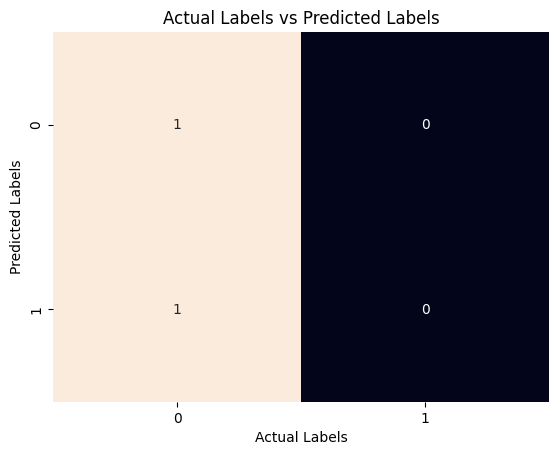

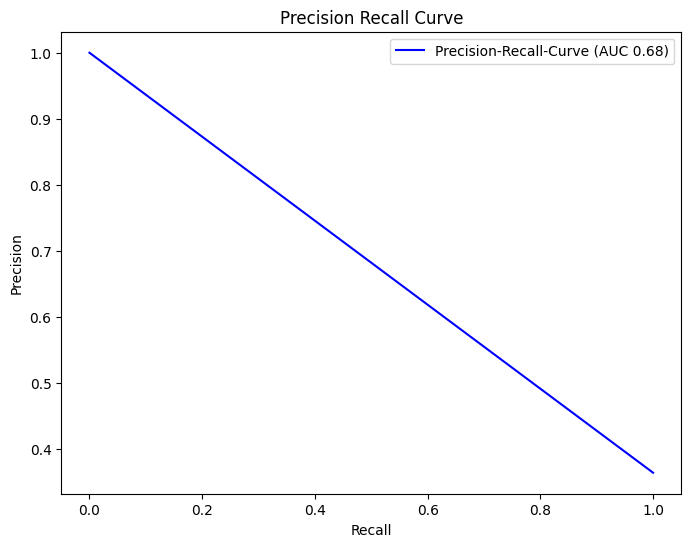

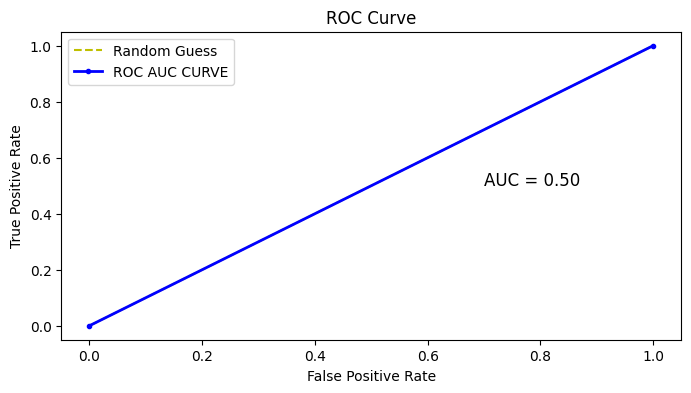

In [118]:
#Plot Confusion Matrix
print("Plotting confusion matrix")
cf = confusion_matrix(y_test, y_test_pred, normalize="true")
sns.heatmap(cf, annot=True, cbar=False)
plt.title("Actual Labels vs Predicted Labels")
plt.xlabel("Actual Labels")
plt.ylabel("Predicted Labels")
plt.xticks(ticks=[0.5, 1.5], labels=['0', '1'])
plt.yticks(ticks=[0.5, 1.5], labels=['0', '1'])
#Saving plot figure
plt.savefig(os.path.join('Artifacts/images', 'MLP_model_confusion_matrix.jpg'))
plt.show()
    
#Precision-Recall-Curve
Precision, Recall, _ = precision_recall_curve(y_test, y_test_pred)
area_under_curve = auc(Recall, Precision)
plt.figure(figsize=(8,6))
plt.plot(Recall, Precision, label=f"Precision-Recall-Curve (AUC {area_under_curve:.2f})", color="b")
plt.xlabel('Recall')
plt.ylabel("Precision")
plt.title("Precision Recall Curve")
plt.legend(loc='best')
plt.savefig(os.path.join('Artifacts/images', 'MLP_model_precision_recall.jpg'))
plt.show();
    
    #ROC-AUC Curve
    
fpr,tpr, threshold = roc_curve(y_test, y_test_pred)
plt.figure(figsize=(8,4))
plt.plot([0, 1], [0, 1], 'y--', label = 'Random Guess')
plt.plot(fpr, tpr, lw=2, marker=".", color='blue', label="ROC AUC CURVE")
plt.annotate(f"AUC = {ROC_AUC:.2f}", xy=(0.7, 0.5), fontsize=12)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='best')
plt.savefig(os.path.join("Artifacts/images", 'MLP_model_ROC_AUC.jpg'))
plt.show()

__Tracking MLP model__

In [119]:
def track_experiment(experiment_name, run_name, eval_metrics, model, artifacts_path:list, server=None, model_name=None, params=None):
    
    if server != None: # check if server is not none
        mlflow.set_tracking_uri(uri='http://127.0.0.1:5000')   #set experiments tracking uri
    mlflow.set_experiment(experiment_name)  #SET EXPERIMENT NAME
    
    with mlflow.start_run(): # RUN MLFLOW
        if params != None: #check if parameter is not None
            mlflow.log_params(params) #logging all paramters
        mlflow.log_metrics(eval_metrics) #logging all evaluation metrics
        mlflow.pytorch.log_model(model, "model") #logging pytorch model pickled file
        
        for artifact_path in artifacts_path: #looping through artifacts path list
            if os.path.exists(artifact_path):
                mlflow.log_artifact(artifact_path)
            else:
                print(f"{artifact_path} FIle not found, you need to check the path")
        if model_name != None:
            mlflow.set_tag("tag1", "Song Popularity Classification")
            mlflow.set_tags({"tag2": f"{model_name}", "tag3" : "Binary-Class Classification"})
            
    print(f'Run Name: {run_name}\nExperiment Name: {experiment_name}\n')
    print(f'{run_name} has succesfully been logged to {experiment_name} in MLFlow')

In [121]:
track_experiment(
    experiment_name=f"Song Popularity: {datetime.now().strftime('%d-%m-%y')}",
    run_name=f"MLP Binary Classifier {datetime.now().strftime('%d-%m-%y')}",
    eval_metrics= MLP_metrics,
    model = model,
    artifacts_path= ["Artifacts/images/MLP_model_confusion_matrix.jpg", 
                     "Artifacts/images/MLP_model_precision_recall.jpg",
                    "Artifacts/images/MLP_model_ROC_AUC.jpg"],
    model_name="MLP_model",
    params= {"epochs":30, "learning_rate":0.05}
)

Run Name: MLP Binary Classifier 12-01-24
Experiment Name: Song Popularity: 12-01-24

MLP Binary Classifier 12-01-24 has succesfully been logged to Song Popularity: 12-01-24 in MLFlow


__Model Registration and Aliasing__

__First model tracking__

***Random Forest***

In [133]:
from mlflow import MlflowClient
client = MlflowClient()
run_name= f"Parameter tuned GaussianNB: {datetime.now().strftime('%d-%m-%y')}"
print(run_name)

with mlflow.start_run(run_name=run_name):
    result = mlflow.register_model(model_uri='runs:/c6746d52827748448c57b2808075fc25/model', name='Gaussian-NB')
client.set_registered_model_alias(name='Gaussian-NB', alias='CHAMPION', version='1')

Registered model 'Gaussian-NB' already exists. Creating a new version of this model...
2024/01/12 10:01:01 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: Gaussian-NB, version 2


Parameter tuned GaussianNB: 12-01-24


Created version '2' of model 'Gaussian-NB'.


__Second Model Tracking__

In [125]:
client = MlflowClient()
run_name= f"Parameter tuned GradientBoosting: {datetime.now().strftime('%d-%m-%y')}"
print(run_name)

with mlflow.start_run(run_name=run_name):
    result = mlflow.register_model(model_uri='runs:/a4e2feeb33f7433da27ba5246179aec9/model', name='Gradient-Boosting')
    

Successfully registered model 'Gradient-Boosting'.
2024/01/12 09:51:20 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: Gradient-Boosting, version 1


Parameter tuned GradientBoosting: 12-01-24


Created version '1' of model 'Gradient-Boosting'.


__Removing one of the models that was mistakenly pushed to production__

In [134]:
client.transition_model_version_stage(
    name="Gaussian-NB",
    version=1,
    stage = "Production"
)

<ModelVersion: aliases=['CHAMPION'], creation_timestamp=1705050048999, current_stage='Production', description='', last_updated_timestamp=1705050072378, name='Gaussian-NB', run_id='c6746d52827748448c57b2808075fc25', run_link='', source='file:///C:/Users/HP/Desktop/Capstone-project/artifacts/1/c6746d52827748448c57b2808075fc25/artifacts/model', status='READY', status_message='', tags={}, user_id='', version='1'>

In [139]:
import requests
import json

inference_request = {
    'dataframe_records' : 
        [{"numerical__acousticness":6.7, 
         'numerical__danceability':3.3,
          'numerical__energy' : 12,
         'numerical__instrumentalness':5.7, 
         'numerical__liveness': 2,
         'numerical__loudness' : 20,
         'numerical__speechiness' : 1,
         'numerical__tempo' : 12,
         'numerical__audio_valence' : 23,
         'numerical__song_duration_min' : 10,
         'numerical__audio_intensity' : 12,
         'numerical__liveness_dance' : 10,
         'categorical_pipeline__key' : 9,
         'categorical_pipeline__audio_mode' : 1,
         'categorical_pipeline__time_signature' : 4,
         'categorical_pipeline__instrumental' : 0.5
        }]
    
}


endpoint = 'http://localhost:5000/invocations'

response = requests.post(endpoint, json=inference_request)
print(response.text)

{"predictions": [0]}


__DATAFRAME FOR ALL MODEL PERFORMANCE__

In [140]:
lr_metrics

{'Train Accuracy': 0.54,
 'Test Accuracy': 0.54,
 'Precision Score': 0.4,
 'Recall Score': 0.53,
 'F1 Score': 0.45,
 'ROC AUC Score': 0.54,
 'Log loss': 0.69}

In [141]:
models_performance_df = pd.DataFrame(
    [MLP_metrics, lr_metrics, GB_metrics, rf_metrics],
)

models_performance_df.head()

,Train Accuracy,Test Accuracy,Precision Score,Recall Score,F1 Score,ROC AUC Score,Log loss
0,0.50,0.64,0.00,0.00,0.00,0.50,13.13
1,0.54,0.54,0.40,0.53,0.45,0.54,0.69
2,0.54,0.56,0.41,0.47,0.44,0.54,0.70
3,0.57,0.55,0.41,0.54,0.46,0.54,0.69


In [142]:
models_performance_df["Model names"] =["MLP model", "Logistic Regression", "Gaussian Naive Bayes", "Random Forest Model"]

In [143]:
models_performance_df

,Train Accuracy,Test Accuracy,Precision Score,Recall Score,F1 Score,ROC AUC Score,Log loss,Model names
0,0.50,0.64,0.00,0.00,0.00,0.50,13.13,MLP model
1,0.54,0.54,0.40,0.53,0.45,0.54,0.69,Logistic Regression
2,0.54,0.56,0.41,0.47,0.44,0.54,0.70,Gaussian Naive Bayes
3,0.57,0.55,0.41,0.54,0.46,0.54,0.69,Random Forest Model


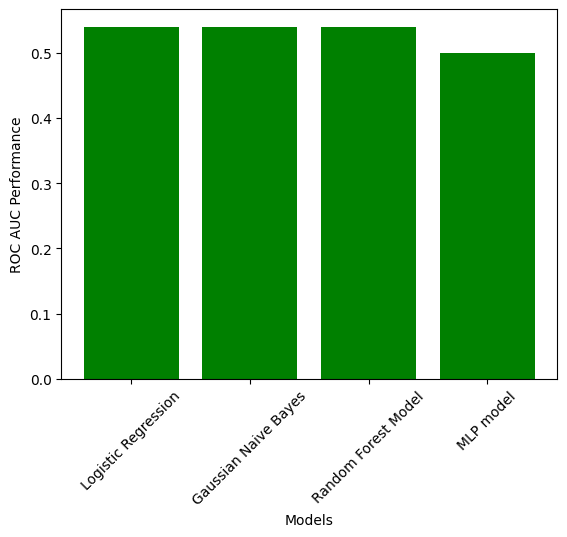

In [144]:
models_performance_df = models_performance_df.sort_values(by="ROC AUC Score", ascending=False)

plt.bar(models_performance_df["Model names"], models_performance_df["ROC AUC Score"], color="green")
plt.xlabel("Models")
plt.xticks(rotation = 45)
plt.ylabel("ROC AUC Performance")
plt.show()

__Observation__

> Few take aways here:
Random forest has the highest ROC-AUC-SCORE of 0.55 while Logistic regression has 54% ROC-AUC-Score, on the other hand Gaussian Naive Bayes has 0.53 ROC-AUC-Score still out-performs other models on the test dataset.

> The log loss for Gaussian Naive Bayes is quite on the high side, I recommend Gaussian Naive Bayes, Random Forest, Logistic Regression in that order for deployment.... 

In [146]:
X_test.to_csv("test2.csv")

In [145]:
# Now making prediction with the model version inn the model registry tat's been pushed to production stage

import mlflow.pyfunc

model_name = "Gaussian-NB"
stage = "Production"

model = mlflow.pyfunc.load_model(
    model_uri = f"models:/{model_name}/{stage}"
)

y_pred = model.predict(X_test)
print(y_pred)

MlflowException: API request to endpoint /api/2.0/mlflow/registered-models/get-latest-versions failed with error code 404 != 200. Response body: '<!doctype html>
<html lang=en>
<title>404 Not Found</title>
<h1>Not Found</h1>
<p>The requested URL was not found on the server. If you entered the URL manually please check your spelling and try again.</p>
'